In [1]:
import numpy as np
import pandas as pd
from keras.models import load_model
from keras.preprocessing import sequence
import matplotlib.pyplot as plt
import tensorflow as tf
import cupy as cp
import matplotlib.pyplot as plt

Using TensorFlow backend.
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/lab606a/.virtualenvs

In [2]:
class Listener:
    def __init__(self):
        self.__time_step = 9
        self.__tmp = cp.zeros([1,3])
        self.__arr_classification = cp.zeros([1,90])
        self.__vis_point = cp.zeros((1,3))
        self.__vis_balls = cp.zeros((self.__time_step,3))
        self.__vis_balls2 = cp.zeros((1,4))
        self.__predction_balls = cp.zeros((1,self.__time_step,3))
        self.__arr_prediction = cp.zeros([1,self.__time_step*3])
        self.__arr_pred_possible = cp.zeros((1,4))
        self.__diff = cp.zeros([1,3])
        self.__padding_done = False
        self.__cnt = 1
        self.__num = 1
        self.__max_index = 0
        self.__coor = -10*cp.ones(6)
        self.__find_possible_point = False
        self.__cal_possible_point = False
        self.__vis_possible_point = False
        self.__vis_hitting_point = cp.zeros((1,4))
        self.__hitting_point = -45
        self.__hitting_timimg = 0
        self.__possible_point = cp.zeros((1,4))
        self.__pred = cp.zeros([1,self.__time_step,3])
        self.__pred_for_offline = cp.zeros([1,self.__time_step,3])
        self.__time = 0.016667
        self.__delta_T = 0.016667
        self.__anchor = 0
        self.__rowww = 0
        self.__direction = 'top6'
        self.traj_done = False
        #self.fig, self.ax = plt.subplots(2,2, figsize=(10.24,7.2))
	#self.__name = sys.argv[1]
        self.__csv_path = '/home/lab606a/catkin_ws/src/pointcloud/offline/'
        #self.__model_path = '/home/lab606a/Documents/20200415/not_fixed/saved model/500_data/prediction_not_fixed_'+ self.__direction
        #self.__model_path = '/home/lab606a/catkin_ws/src/pointcloud/models/not_fixed/prediction_all_not_fixed'
        self.__model_path = '/home/lab606a/Documents/model comparison/not fixed model/saved model/500_data/prediction_not_fixed_top5'
        self.__prediction_model = load_model(self.__model_path)
        
    def append_pred(self): ## Exhaustive
        self.__pred = cp.array(self.__model.predict(cp.asnumpy(self.__arr_prediction.reshape(1,self.__time_step,3)), verbose=1))
        while not self.__find_possible_point == True:
            self.__pred = cp.array(self.__pred)
            if ( -50 < float(cp.min(self.__pred[self.__pred.shape[0]-1,:,:])) < -40): ## find possible hitting point
                index = cp.argmin(self.__pred[self.__pred.shape[0]-1,:,:])
                row = int((index-1)/3)
                count_down = row + (self.__pred.shape[0]-1)*9
                self.__find_possible_point = True
                self.__anchor = self.__pred.shape[0]-1
                print("count down = ", int(count_down))
                #index = cp.argmin(self.__anchor[self.__anchor,:,:])
                #row = int((index-1)/3)
                self.__pred[self.__anchor, row+1:, :] = 0
                self.__pred_for_offline = self.__pred

            else: ## predict next time step
                self.__pred = cp.vstack((self.__pred, cp.zeros([1,self.__time_step,3])))
                self.__pred[self.__pred.shape[0]-1,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__pred[self.__pred.shape[0]-2,:,:].reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)
                if (self.__pred.shape[0] >= 8):
                    self.__pred = cp.zeros([1,self.__time_step,3])
                    self.__find_possible_point = True
                
    def update_prediction(self):
        self.__pred[0,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__arr_prediction.reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)
        for i in range(1, self.__pred.shape[0]):
            self.__pred[i,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__pred[i-1,:,:].reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)

    def modify(self):
        #index = cp.argmin(self.__pred[self.__anchor,:,:])
        #row = int((index-1)/3)
        if (self.__rowww < 8):
            self.__pred[self.__anchor, self.__rowww+1:, :] = 0
        if (self.__anchor != self.__pred.shape[0]-1):
            self.__pred[self.__anchor+1:, :, :] = 0
        if (self.__anchor == 0) and (self.__rowww == 0) and ( -10 < float(cp.min(self.__pred[self.__anchor,0,:])) < 10):
            self.__pred[self.__anchor,0,:] = 0
        self.__pred_for_offline = cp.vstack((self.__pred_for_offline, self.__pred))
        #self.pub_prediction()

    def calculate_hitting_point(self, arr):
        #print("cnt = ", self.__cnt)
        arr = cp.array(arr)
        self.__cal_possible_point = False
        while not self.__cal_possible_point == True:
            print(arr[self.__anchor,:,:])
            if (-55 <= float(cp.min(arr[self.__anchor,:,:])) <= -35) and (self.__anchor >= 0):
                #print("anchor = ", self.__anchor)
                index = cp.argmin(arr[self.__anchor,:,:])
                row = int((index-1)/3)
                self.__rowww = row
                if (-55 <= float(cp.min(arr[self.__anchor,:,:])) <= self.__hitting_point): ## interpolation
                    index = cp.argmin(arr[self.__anchor,:,:])
                    row = int((index-1)/3)
                    self.__rowww = row
                    count_down = row + self.__anchor*9
                    print("count down = ", count_down)
                    if (row == 0):
                        print("case a1")
                        self.__vis_point = cp.array(self.__vis_point)
                        w1 = (self.__hitting_point-self.__vis_point[:,1]) / (arr[self.__anchor,row,1]-self.__vis_point[:,1])
                        self.__possible_point = w1*arr[self.__anchor,row,:] + (1-w1)*self.__vis_point.reshape(1,1,3)
                        self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))

                        #w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / (arr[self.__anchor,row,1]-arr[self.__anchor-1,self.__time_step-1,1])
                        #self.__possible_point = w1*arr[self.__anchor-1,self.__time_step-1,:] + (1-w1)*arr[self.__anchor,row,:]
                        #self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        #self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                        print("hitting timing and position = ", self.__possible_point)
                    else:
                        print("case a2")
                        w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / (arr[self.__anchor,row,1]-arr[self.__anchor,row-1,1])
                        self.__possible_point = w1*arr[self.__anchor,row-1,:] + (1-w1)*arr[self.__anchor,row,:]
                        self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                        print("hitting timing and position = ", self.__possible_point)
                elif (self.__hitting_point < float(cp.min(arr[self.__anchor,:,:])) <= -40):
                    index = cp.argmin(arr[self.__anchor,:,:])
                    row = int((index-1)/3)
                    self.__rowww = row
                    count_down = row + self.__anchor*9
                    print("count down = ", count_down)
                    if (row == 0):
                        print("case b1")
                        if (self.__diff[:,1] > 0):
                            w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / self.__diff[:,1]
                            if w1 < 1:
                                self.__possible_point = arr[self.__anchor,row,:] - w1*self.__diff
                                self.__hitting_timimg = self.__time + (count_down+1+w1)*self.__delta_T
                                self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                                print("hitting timing and position = ", self.__possible_point)
                    else:
                        print("case b2")
                        self.__diff = arr[self.__anchor,row-1,:]-arr[self.__anchor,row,:]
                        self.__diff = self.__diff.reshape(1,3)
                        w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / self.__diff[:,1]
                        if w1 < 1:
                            self.__possible_point = arr[self.__anchor,row,:] - w1*self.__diff
                            self.__hitting_timimg = self.__time + (count_down+1+w1)*self.__delta_T
                            self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                            print("hitting timing and position = ", self.__possible_point)
                else:
                    self.__possible_point = self.__possible_point

                self.__cal_possible_point = True
                #self.pub_prediction()
                '''
                if (row < 8):
                    arr[self.__anchor, row+1:, :] = 0
                if (self.__anchor != self.__pred.shape[0]-1):
                    arr[self.__anchor+1:, :, :] = 0
                if (self.__anchor == 0) and ( -10 < float(cp.min(arr[self.__anchor,0,:])) < 10):
                    arr[self.__anchor,0,:] = 0
                '''
                #self.__pred_for_offline = cp.vstack((self.__pred_for_offline, arr))
                #self.__cnt += 1
                if (self.__arr_pred_possible.shape[0] == 1) and (int(self.__arr_pred_possible[0,2]) == 0):
                    self.__arr_pred_possible = self.__possible_point.reshape(1,4)
                else:
                    self.__arr_pred_possible = cp.vstack((self.__arr_pred_possible, self.__possible_point.reshape(1,4)))
            else:
                if ((self.__anchor-1) >= 0) and (abs(float(cp.min(arr[self.__anchor,:,:]))-self.__hitting_point) >= 22.5):
                    self.__anchor = self.__anchor -1
                    #print("case c1")
                else:
                    self.__cal_possible_point = True

    def calculate_vis_hitting_point(self):
        if (-50 <= float(cp.min(self.__vis_balls2)) <= self.__hitting_point):
            index = cp.argmin(self.__vis_balls2)
            row = int((index-1)/4)
            w1 = (self.__vis_balls2[row,2]-self.__hitting_point) / (self.__vis_balls2[row,2]-self.__vis_balls2[row-1,2])
            self.__vis_hitting_point = (1-w1)*self.__vis_balls2[row,:] + w1*self.__vis_balls2[row-1,:]
        elif (self.__hitting_point < float(cp.min(self.__vis_balls2)) < -40):
            index = cp.argmin(self.__vis_balls2)
            row = int((index-1)/4)
            w1 = (self.__vis_balls2[row,2]-self.__hitting_point) / (self.__vis_balls2[row-1,2]-self.__vis_balls2[row,2])
            self.__vis_hitting_point = self.__vis_balls2[row,:] - w1*(self.__vis_balls2[row-1,:]-self.__vis_balls2[row,:])
        #print("vis hitting point = ", self.__vis_hitting_point)


    def show_spin_direction(self, max_index):
        ## make dictionary to replace switch case
        dictionary = {0:self.top5, 1:self.top6, 2:self.left5, 3:self.left6, 4:self.right5, 5:self.right6, 6:self.back5, 7:self.back6}
        funcToCall = dictionary[max_index]
        funcToCall()

        if (self.__pred.shape[0] == 1):
            self.append_pred() ## Exhaustive
        elif (self.__pred.shape[0] > 1):
            self.update_prediction() ## update prediction result
            self.calculate_hitting_point(self.__pred) ## calculate hitting timimg and hitting point
            self.modify()

    def classification(self):
        ## call classifier
        classes = self.__classifier.predict(cp.asnumpy(self.__arr_classification.reshape(1,30,3)), verbose=1)
        ## figure out which direction is
        self.__max_index = np.argmax(classes)
        #print("number of input balls = ", self.__cnt)
        ## show result
        if (self.__cnt >= 9):
            self.show_spin_direction(self.__max_index)
        #self.__cnt += 1

    def padding(self):
        # if __tmp is empty, init array
        #print("paddinggg")
        if (self.__padding_done == False):
            self.__tmp = self.__vis_point ## pad first point
            self.__padding_done = True
            self.__vis_balls = self.__vis_point.reshape(1,3)
        else:
        # if __tmp is not empty, then filled array
            self.__tmp = cp.hstack((self.__tmp, self.__vis_point))
            self.__vis_balls = cp.vstack((self.__vis_balls, self.__vis_point))
            #if (self.__tmp.shape[1] == 15): ## when colect 5 balls
                #self.__arr_classification[:,:self.__tmp.shape[1]] = self.__tmp ## asigne to classification input array
            #print("shape of tmp = \n", self.__tmp.shape)
            if (self.__tmp.shape[1] == 27):
                #self.__vis_balls = self.__tmp.reshape(1,self.__time_step,3)
                self.__arr_prediction[:,:] = self.__tmp ## for predct next 5 steps
            if (self.__tmp.shape[1] > 27): ## when colect over 5 balls
                #self.__vis_balls = cp.vstack((self.__vis_balls, self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):].reshape(1,self.__time_step,3))) ## visual measurement point for calculate error
                self.__arr_prediction[:,:] = self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):] ## rolling visual measurement for predct next 5 steps
                #if (self.__tmp.shape[1] <= 90): ## when colect under 31 balls
                    #self.__arr_classification[:,:self.__tmp.shape[1]] = self.__tmp ## still asigne to classification input array

    def save_data(self):
        visurement_balls = cp.asnumpy(self.__vis_balls)
        pred_trajs = cp.asnumpy(self.__pred_for_offline.reshape(self.__pred_for_offline.shape[0]*self.__pred_for_offline.shape[1], self.__pred_for_offline.shape[2]))

        df_vis = pd.DataFrame(data=visurement_balls)
        df_pred = pd.DataFrame(data=pred_trajs)

        vis_name = self.__csv_path + 'visurement' + str(self.__num) + '.csv'
        pred_name = self.__csv_path + 'prediction' + str(self.__num) + '.csv'

        df_vis.to_csv(vis_name, header=0, index=0)
        df_pred.to_csv(pred_name, header=0, index=0)

    def predict_traj(self):
        self.__model = self.__prediction_model

        if (self.__pred.shape[0] == 1):
            self.append_pred() ## Exhaustive
        elif (self.__pred.shape[0] > 1):
            self.update_prediction() ## update prediction result
            self.calculate_hitting_point(self.__pred) ## calculate hitting timimg and hitting point
            self.modify()

    def plot_res(self):
        self.__arr_pred_possible = cp.round_(self.__arr_pred_possible, 4)
        self.__vis_hitting_point = cp.round_(self.__vis_hitting_point, 4)

        update_times = cp.linspace(1, self.__arr_pred_possible.shape[0], self.__arr_pred_possible.shape[0])
        t = self.__arr_pred_possible[:,0]
        x = self.__arr_pred_possible[:,1]
        z = self.__arr_pred_possible[:,3]
        Euclidean_vis = cp.sqrt(cp.sum(cp.power(self.__vis_hitting_point[1:],2)))
        Euclidean_pred = cp.sqrt(cp.sum(cp.power(self.__arr_pred_possible[:,1:],2), axis=1))

        plt.figure(figsize=(8,7))

        ## plot hitting timing
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[0]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(t), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(t), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Hitting timimg (sec)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and hitting timing', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_timing' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((t-self.__vis_hitting_point[0])*1000)
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Hitting timimg error (ms)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and hitting timing error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_timing_error' + '.png'
        plt.savefig(name)

        ## plot Euclidean distance
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*Euclidean_vis), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Euclidean distance (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Euclidean distance', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_distance' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((Euclidean_pred-Euclidean_vis))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Euclidean distance error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Euclidean distance error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_distance_error' + '.png'
        plt.savefig(name)

        ## plot x coordinate
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[1]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(x), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(x), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('X-coordinate (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and X-coordinate', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_X-coordinate' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((x-self.__vis_hitting_point[1]))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('X-coordinate error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and X-coordinate error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_X-coordinate_error' + '.png'
        plt.savefig(name)

        ## plot z coordinate
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[3]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(z), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(z), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Z-coordinate (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Z-coordinate', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_Z-coordinate' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((z-self.__vis_hitting_point[3]))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Z-coordinate error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Z-coordinate error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_Z-coordinate_error' + '.png'
        plt.savefig(name)
        
    def return_vis_point(self):
        return self.__vis_hitting_point
    
    def return_pred_res(self):
        return self.__arr_pred_possible
    
    def reset_arr_pred(self):
        self.__arr_pred_possible = cp.zeros((1,4))

    def assigne(self, visss):
        #a = data.data
        self.__vis_point = cp.array(visss).reshape(1,3)
        #print(self.__vis_point)

        if (-50 < self.__vis_point[:,1] < -30):
            tmp = cp.hstack((self.__time, self.__vis_point.reshape(3,)))
            if self.__vis_possible_point == False:
                self.__vis_balls2 = tmp.reshape(1,4)
                self.__vis_possible_point = True
            else:
                self.__vis_balls2 = cp.vstack((self.__vis_balls2, tmp.reshape(1,4)))


        if self.traj_done == False:
            print("\nTime = ", self.__time) ## show current time
            print("visual measurement = ", self.__vis_point) ## show visual measurement coordinate
            self.padding() ## colect 5 balls
            '''
            if ((self.__tmp.shape[1] >= 15) and (self.__tmp.shape[1] <= 90)): ## while colect balls over 5 balls and under 30 balls
                self.classification() ## doing classification and prediction
            if (self.__tmp.shape[1] > 90): ## while colect balls over 30 balls, stop doing classification
                self.show_spin_direction(self.__max_index) ## skip classification doing prediction
            '''
            if (self.__tmp.shape[1] >= 27):
                self.predict_traj()
            #self.for_ttbot()
            self.__time += self.__delta_T
            self.__cnt += 1
            
        else:
            #print("aaaaa")
            if (self.__padding_done == True):
                self.calculate_vis_hitting_point()
                #print("pred hitting point = \n", self.__arr_pred_possible)
                #if (self.__pred_for_offline.shape[0] != 1):
                    #self.plot_error()
                    #self.plot_res()
                    #self.save_data()
                self.__num += 1

            self.__padding_done = False
            self.__arr_classification = cp.zeros([1,90])
            self.__coor = -10*cp.ones(6)
            self.__vis_balls = cp.zeros((self.__time_step,3))
            self.__cnt = 1
            self.__pred = cp.zeros([1,self.__time_step,3])
            self.__vis_balls2 = cp.zeros((1,4))
            #self.__arr_pred_possible = cp.zeros((1,4))
            self.__find_possible_point = False
            self.__vis_possible_point = False
            self.__pred_for_offline = cp.zeros([1,self.__time_step,3])
            self.__time = 0.016667 ## reset time
            self.traj_done = False

In [3]:
# set GPU memory
gpu_options = tf.GPUOptions(allow_growth=True)
sess = tf.Session(config=tf.ConfigProto(gpu_options=gpu_options))

np.set_printoptions(suppress=True)

In [4]:
obj = Listener()

In [5]:
name = 'top5'

In [6]:
dataset_path = './datasets/split by random for distributed/prediction/' + name + '_test.csv'
print(dataset_path)
dataset = pd.read_csv(dataset_path, header=None)
dataset = dataset.fillna(0)
dataset = np.array(dataset)

./datasets/split by random for distributed/prediction/top5_test.csv


In [7]:

arr_for_vis = np.array([0,0,0,0])
arr_for_pred_3rd = np.array([0,0,0,0])
arr_for_pred_end = np.array([0,0,0,0])

n = 21

arr_for_err_t = np.zeros((1,n))
arr_for_err_x = np.zeros((1,n))
arr_for_err_z = np.zeros((1,n))


for i in range(0,250):
    trajectory = dataset[i,:]
    trajectory = trajectory.reshape(1,trajectory.shape[0])
    trajectory = sequence.pad_sequences(trajectory, maxlen=trajectory.shape[1]+27, padding='post', dtype='float32')
    trajectory = trajectory.reshape(trajectory.shape[1],)
    for j in range(0, trajectory.shape[0], 3):
        obj.assigne(trajectory[j:j+3].reshape(1,3))
    obj.traj_done = True
    obj.assigne(np.array([0,0,0]))
    vis_arr = obj.return_vis_point()
    pred_arr = obj.return_pred_res()
    #print("")
    #print("vis from obj = \n", vis_arr)
    #print("pred from obj = \n", pred_arr)
    #arr_for_vis = np.vstack((arr_for_vis, vis_arr))
    #while pred_arr.shape[0] < n:
        #pred_arr = np.vstack(())
    
    if pred_arr.shape[0] >= n:
        #arr_for_vis = np.vstack((arr_for_vis, vis_arr))
        #arr_for_pred_3rd = np.vstack((arr_for_pred_3rd, pred_arr[2,:]))
        #arr_for_pred_end = np.vstack((arr_for_pred_end, pred_arr[(pred_arr.shape[0]-10),:]))
        err = vis_arr - pred_arr
        print(err.shape)
        err_t = err[:n,0]
        err_x = err[:n,1]
        err_z = err[:n,3]
        
        arr_for_err_t = np.vstack((arr_for_err_t, err_t))
        arr_for_err_x = np.vstack((arr_for_err_x, err_x))
        arr_for_err_z = np.vstack((arr_for_err_z, err_z))
    #else:
        #print("\n\n aaaaa")
        #print(pred_arr)
    
    obj.reset_arr_pred()



Time =  0.016667
visual measurement =  [[ 98.2815 302.499   43.4676]]

Time =  0.033334
visual measurement =  [[ 96.9341 292.527   45.9779]]

Time =  0.050001000000000004
visual measurement =  [[ 95.5062 280.345   48.7612]]

Time =  0.066668
visual measurement =  [[ 94.1041 272.595   50.3743]]

Time =  0.083335
visual measurement =  [[ 92.8215 261.5     52.2046]]

Time =  0.10000200000000001
visual measurement =  [[ 91.1854 252.086   53.5554]]

Time =  0.11666900000000001
visual measurement =  [[ 89.8076 241.992   54.546 ]]

Time =  0.133336
visual measurement =  [[ 88.4972 232.369   55.0453]]

Time =  0.150003
visual measurement =  [[ 87.2481 223.176   55.0858]]
1/1 [==============================] - 0s 1ms/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 85.8356 214.329   54.9191]]
1/1 [==============================] - 0s 740us/step
[[ 53.02778625  -6.7297554   31.46936607]
 [ 52.51288986 -13.62226868  33.04946899]
 [ 51.6206398  -20.56602478  33.76713562

1/1 [==============================] - 0s 695us/step
[[ 52.45786667  -8.87214279  31.96960068]
 [ 52.40760422 -16.19065475  33.64920425]
 [ 51.40538788 -23.68364334  34.20042801]
 [ 49.62600327 -31.60364151  34.64427948]
 [ 48.13829041 -39.57271957  35.02497101]
 [ 48.20487595 -45.26678848  35.35484695]
 [ -1.66071701  -0.21827316  -0.55651093]
 [ -1.23672104   0.27947617  -0.72935677]
 [ -1.12759018   0.52458954  -0.6799469 ]]
count down =  23
case a2
hitting timing and position =  [  0.70079491  48.20175616 -45.          35.33939103]

Time =  0.33333999999999986
visual measurement =  [[ 73.1341 127.159   35.7772]]
1/1 [==============================] - 0s 686us/step
[[ 51.25099182 -18.49170685  31.89826202]
 [ 50.57770538 -25.85892868  32.82164764]
 [ 49.01476669 -33.180233    33.25842667]
 [ 47.26266098 -40.79914474  33.58055496]
 [ 47.82379913 -47.64022446  33.60050201]
 [ -0.48678207  -0.0352211   -0.13957596]
 [ -0.35750961  -0.02720261  -0.38089371]
 [ -0.33794403   0.31851578  

1/1 [==============================] - 0s 669us/step
[[ 49.55147934 -24.15815353  33.21612167]
 [ 48.61920547 -31.51136398  33.98360443]
 [ 47.48513794 -39.56849289  34.27754974]
 [ 46.38751221 -45.3886528   33.42529297]
 [ -1.43980789   0.57078934  -1.05464935]
 [ -0.65510941   0.91831589  -1.17567062]
 [ -0.64447784   0.467556    -0.96188354]
 [ -0.62014771   0.50720978  -0.90689659]
 [ -0.48550797   0.42967224  -0.81636047]]
count down =  12
case a2
hitting timing and position =  [  0.68445997  46.46080836 -45.          33.48220412]

Time =  0.5000099999999997
visual measurement =  [[61.2142 49.8287 10.5748]]
1/1 [==============================] - 0s 900us/step
[[ 49.05436325 -31.81101608  33.31779861]
 [ 47.65341568 -39.04515457  33.44894791]
 [ 46.72450638 -46.41546249  33.2675705 ]
 [ -1.40878677   0.78833389  -0.77547073]
 [ -0.60530472   0.72741318  -0.52195358]
 [ -0.63504791   0.58996201  -0.54656029]
 [ -0.48373032   0.24892044  -0.38857651]
 [ -0.5214119    0.28891754  -0.4

1/1 [==============================] - 0s 913us/step
[[ 48.97186661 -33.28928757  35.59135818]
 [ 47.68329239 -40.71352005  35.68889236]
 [ 47.3563652  -48.41045761  35.96454239]
 [ -0.91163254   0.45089722  -0.654953  ]
 [ -0.55212021   0.86316681  -0.6204071 ]
 [ -0.54180527   0.62347031  -0.55706596]
 [ -0.46071243   0.37083435  -0.48845291]
 [ -0.46836472   0.39291     -0.54088211]
 [ -0.47056198   0.32242203  -0.55419922]]
count down =  2
case a2
hitting timing and position =  [  0.69073203  47.50122429 -45.          35.84240385]

Time =  0.6666799999999996
visual measurement =  [[ 49.5124 -30.8439  35.2337]]
1/1 [==============================] - 0s 803us/step
[[ 48.29706955 -40.61096573  36.17612839]
 [ 46.95284271 -47.48853683  36.03395081]
 [ -1.85144424   1.02919769  -1.23734474]
 [ -1.36097336   0.86806107  -1.02454758]
 [ -0.89466476   0.70452499  -0.82185936]
 [ -0.71401978   0.35841751  -0.62931061]
 [ -0.61232376   0.29987717  -0.57336426]
 [ -0.5863533    0.24440384  -0

1/1 [==============================] - 0s 730us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 756us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 724us/step
[[-0.633335

count down =  24
case a2
hitting timing and position =  [  0.66060464  37.09112559 -45.          34.78499614]

Time =  0.2666719999999999
visual measurement =  [[ 45.6209 137.688   39.3842]]
1/1 [==============================] - 0s 732us/step
[[ 35.90932083 -17.86304092  30.61539841]
 [ 34.75356674 -25.40855026  31.49060822]
 [ 34.00783539 -32.95127487  31.6381588 ]
 [ 32.76369476 -39.91872787  32.51887512]
 [ 32.17152786 -46.97468185  32.84322357]
 [ -0.47768784  -1.41745758   1.11260414]
 [ -0.78355408  -0.13022995  -0.09600449]
 [ -0.47427368  -0.20875931   0.23552322]
 [ -0.14702988  -0.2661171    0.4234333 ]]
count down =  22
case a2
hitting timing and position =  [  0.63801043  32.33725191 -45.          32.7524513 ]

Time =  0.2833389999999999
visual measurement =  [[ 45.2281 129.651   36.3132]]
1/1 [==============================] - 0s 678us/step
[[ 35.72964859 -23.10925293  28.99457359]
 [ 34.5512619  -30.15758133  30.42735291]
 [ 33.92952347 -37.45938492  31.03462791]
 [ 34.0

1/1 [==============================] - 0s 665us/step
[[ 40.59296799 -33.74590683  29.10848236]
 [ 39.42352676 -41.66614151  29.79495621]
 [ 38.45888901 -49.00673294  29.80734062]
 [ -1.11019897   0.36449051  -0.5308876 ]
 [ -1.03791428   1.23513412  -0.53723526]
 [ -0.58541489   0.46209335  -0.30869102]
 [ -0.54008865   0.233284    -0.19604111]
 [ -0.44396591   0.22544479  -0.20014572]
 [ -0.47470474   0.12252426  -0.20045662]]
count down =  11
case a2
hitting timing and position =  [  0.62577639  38.98541959 -45.          29.80058081]

Time =  0.45000899999999977
visual measurement =  [[42.0782  45.893    1.47049]]
1/1 [==============================] - 0s 626us/step
[[ 39.99209976 -39.91754532  28.14466858]
 [ 38.66737366 -47.92121506  28.36469269]
 [ -1.11677933   0.9763298   -0.4880867 ]
 [ -0.74570847   0.94870377  -0.47581863]
 [ -0.7575531    1.10169601  -0.51072311]
 [ -0.51734543   0.84667206  -0.30007935]
 [ -0.43144608   0.76721191  -0.26659012]
 [ -0.43063354   0.73084641  

1/1 [==============================] - 0s 634us/step
[[ 40.97689056 -44.65916061  30.28560257]
 [ -0.62361908  -0.03749466  -0.00082397]
 [ -0.63208008   0.31023788  -0.50769424]
 [ -0.71035385   0.4563179   -0.40335846]
 [ -0.46223068   0.28642654  -0.23589706]
 [ -0.53779221   0.37112045  -0.32740974]
 [ -0.57123947   0.38406754  -0.32596207]
 [ -0.59388733   0.40739059  -0.32308769]
 [ -0.60362244   0.42973709  -0.304636  ]]
count down =  0
case b1
hitting timing and position =  [  0.61748989  40.89624921 -45.          30.31223875]

Time =  0.6166789999999996
visual measurement =  [[ 39.6495 -42.5454  29.3262]]
1/1 [==============================] - 0s 654us/step
[[-0.52298355 -0.6774025   0.12085342]
 [-0.38570786 -0.57001495 -0.02182579]
 [-0.38015747 -0.46713638 -0.06750298]
 [-0.37582016 -0.51306534 -0.03439903]
 [-0.38994598 -0.53512192 -0.0321312 ]
 [-0.38721466 -0.5363884  -0.03084183]
 [-0.38270187 -0.53682327 -0.03119469]
 [-0.37823868 -0.5381813  -0.0327282 ]
 [-0.3741684 

1/1 [==============================] - 0s 762us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 705us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 648us/step
[[-0.633335

count down =  29
case a2
hitting timing and position =  [  0.70524624  76.18135168 -45.          30.96050992]

Time =  0.23333799999999993
visual measurement =  [[100.359  171.462   39.5557]]
1/1 [==============================] - 0s 659us/step
[[ 76.29499054 -45.42426682  31.23505402]
 [ -1.80873489  -0.04794312  -0.42250252]
 [ -1.70811081   0.3911438   -0.68855667]
 [ -0.89734268   0.25762558  -0.36871338]
 [ -0.62760544   0.17586517  -0.29431343]
 [ -0.56864548   0.09404373  -0.24917412]
 [ -0.53940201   0.09930038  -0.20832825]
 [ -0.46274185   0.09419632  -0.14424515]
 [ -0.34630203   0.08718491  -0.06346893]]
count down =  27
case a1
hitting timing and position =  [  0.6999814   76.34206388 -45.          31.25133063]

Time =  0.2500049999999999
visual measurement =  [[ 99.5306 162.518   37.0121]]
1/1 [==============================] - 0s 644us/step
[[-0.62564468 -0.61506271 -0.14062309]
 [-0.35977554 -0.66315842 -0.06592178]
 [-0.38132858 -0.57762909 -0.08495331]
 [-0.38818741 -


Time =  0.4000079999999998
visual measurement =  [[92.1474  88.2806   1.45178]]
1/1 [==============================] - 0s 769us/step
[[ 83.30749512   5.59712219  28.47502899]
 [ 82.27586365  -2.45186996  29.54133987]
 [ 81.52479553 -10.23483658  30.38298798]
 [ 80.68643951 -18.07534027  30.5718708 ]
 [ 79.29098511 -26.46086884  30.36729813]
 [ 77.77458954 -33.29516983  29.77674484]
 [ 77.22189331 -40.6218071   28.65310478]
 [ 74.31658936 -44.82935715  28.01999092]
 [  0.03769302  -1.22680664  -0.08351517]]
count down =  16
case b2
hitting timing and position =  [  0.68402295  74.19876084 -45.          27.99431414]

Time =  0.4166749999999998
visual measurement =  [[91.3819 80.1862  3.7499]]
1/1 [==============================] - 0s 734us/step
[[ 83.19737244  -1.50749207  28.87090111]
 [ 83.27070618 -10.41088486  29.77356911]
 [ 81.18704987 -18.97182846  30.086483  ]
 [ 79.18240356 -27.11170578  29.45999527]
 [ 78.19451904 -33.18283463  29.01346588]
 [ 77.65416718 -41.14638901  27.9554

1/1 [==============================] - 0s 1ms/step
[[ 83.5734024   -4.63248825  30.18828583]
 [ 83.44160461 -13.20265961  31.52675247]
 [ 81.61044312 -21.3157959   31.96394348]
 [ 80.71353912 -29.13351059  32.05272675]
 [ 80.13370514 -35.82284164  31.98984528]
 [ 79.83880615 -43.72629929  32.02566147]
 [ 89.19308472 -46.99555588  31.12464523]
 [  1.26098251  -2.46221542  -0.17651367]
 [  0.38276291  -2.54096603  -0.11507034]]
count down =  6
case a2
hitting timing and position =  [  0.67685355  83.48322835 -45.          31.674626  ]

Time =  0.5833449999999997
visual measurement =  [[83.4359  -4.35273 29.5637 ]]
1/1 [==============================] - 0s 682us/step
[[ 83.05871582 -12.60667801  29.44042206]
 [ 82.08700562 -21.40893173  30.22137451]
 [ 80.51435852 -29.13514328  30.36483574]
 [ 77.83929443 -36.46687698  29.39819717]
 [ 77.24214172 -42.8080864   29.20644951]
 [ 81.78659821 -49.01571274  29.19163895]
 [  1.01303482  -0.48846817  -0.06210327]
 [ -0.42669296  -0.72347641  -0.5


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 724us/step
[[-0.64390182 -1.30342484  0.03951073]
 [-0.58392715 -1.2065239  -0.01335526]
 [-0.54485703 -1.13743973 -0.03054428]
 [-0.57359695 -1.17672729 -0.01610184]
 [-0.58433151 -1.18975449 -0.01878738]
 [-0.58209991 -1.18584061 -0.01940918]
 [-0.57904434 -1.1806221  -0.01960754]
 [-0.57620621 -1.17578506 -0.01958466]
 [-0.57371902 -1.17163467 -0.01939964]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 744us/step
[[-0.64618301 -1.29297256  0.0335083 ]
 [-0.57270432 -1.20244217 -0.0100975 ]
 [-0.53766251 -1.13642502 -0.02931595]
 [-0.56664658 -1.17636108 -0.01508522]
 [-0.57748795 -1.18970108 -0.01790237]
 [-0.5753746  -1.1860466  -0.01863289]
 [-0.57238007 -1.18099594 -0.0189209 ]
 [-0.569561   -1.1762886  -0.01896286]
 [-0.5671196  -1.1722374  -0.01883698]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 775us/step
[[ 76.06973267 -28.88770676  35.09638214]
 [ 75.38478088 -35.76752853  35.72254944]
 [ 74.69166565 -43.49723434  35.20641327]
 [ 71.64207458 -47.51041794  33.89226151]
 [  0.10799789   0.68635559  -0.44804192]
 [  0.0126152    0.02013397   0.03339386]
 [ -0.14022446  -0.03429031  -0.05792618]
 [ -0.29873276  -0.08745956  -0.11932564]
 [ -0.53435135   0.05517197  -0.22902679]]
count down =  30
case a2
hitting timing and position =  [  0.69377292  73.54972419 -45.          34.71431963]

Time =  0.20000399999999996
visual measurement =  [[103.344  178.442   49.6494]]
1/1 [==============================] - 0s 630us/step
[[ 75.5914917  -36.52048874  38.29185486]
 [ 76.03710175 -44.62039566  38.37651062]
 [ 15.19116211 -11.07416153   7.41034126]
 [ -3.72878647   0.78458023  -2.61052513]
 [ -0.93008041  -0.20147324  -0.64120865]
 [ -0.89661789   0.07667923  -0.69579697]
 [ -0.65244675   0.11474991  -0.54235077]
 [  0.00082779  -0.54723358  

[[ 68.28253174 -41.5650444   37.9686203 ]
 [ 67.17393494 -48.31566238  38.04262543]
 [ -1.91798019   0.45435715  -0.90575981]
 [ -1.67220688   0.84439087  -0.98317146]
 [ -1.02198029   0.4850235   -0.71412659]
 [ -0.66367722   0.22287369  -0.48477173]
 [ -0.57617569   0.16484833  -0.39583015]
 [ -0.5384407    0.1535759   -0.34449005]
 [ -0.41495132   0.13426971  -0.25847626]]
count down =  19
case a2
hitting timing and position =  [  0.67486623  67.71843808 -45.          38.00627675]

Time =  0.36667399999999983
visual measurement =  [[90.4017 93.8255 21.4025]]
1/1 [==============================] - 0s 1ms/step
[[-0.48182297 -0.62943649 -0.03582001]
 [-0.19108963 -0.63276291  0.00522614]
 [-0.23232269 -0.57335663 -0.02149773]
 [-0.26202011 -0.63903427  0.00518799]
 [-0.28926086 -0.66636658  0.00320053]
 [-0.29144669 -0.66837311  0.00222588]
 [-0.28850937 -0.66750717  0.00069809]
 [-0.28424835 -0.66671753 -0.00121307]
 [-0.27992249 -0.66667557 -0.00324249]]
[[ 79.18348694  15.15450287  

1/1 [==============================] - 0s 703us/step
[[ 78.25193787   8.73415375  25.98804474]
 [ 77.24100494   1.02242661  28.07824707]
 [ 76.58868408  -6.41365433  30.15697098]
 [ 75.4249115  -13.31953049  31.66908073]
 [ 74.07119751 -21.66872025  32.9562149 ]
 [ 72.09389496 -29.59830856  33.44404602]
 [ 69.57783508 -36.70346451  32.85273743]
 [ 69.49054718 -41.33181381  33.50215912]
 [ 58.67778397 -43.00764084  30.23818207]]
count down =  8
case b2

Time =  0.5500109999999997
visual measurement =  [[77.2269   5.76853 27.0869 ]]
1/1 [==============================] - 0s 702us/step
[[ 73.37580109  -0.13166428  29.48894119]
 [ 71.74034119  -8.22704697  31.48286629]
 [ 70.80319977 -17.14057541  33.05693436]
 [ 69.26260376 -25.07686234  33.73863983]
 [ 67.61481476 -32.13444138  34.30764008]
 [ 67.35635376 -38.03069687  34.39325714]
 [ 78.31797791 -44.48890305  38.25167084]
 [ -1.3993187   -4.38120651   0.94988346]
 [  1.25864029  -3.18716049   0.60844707]]
count down =  6
case b2
hitting

[[-0.65851974 -1.30672836  0.04262543]
 [-0.59964752 -1.21294403 -0.01579666]
 [-0.55929184 -1.14506912 -0.03354645]
 [-0.58762741 -1.18459702 -0.0188179 ]
 [-0.59827805 -1.19803238 -0.02157974]
 [-0.59578323 -1.19414902 -0.02229691]
 [-0.59249496 -1.1889534  -0.02257538]
 [-0.58947372 -1.18416214 -0.02262497]
 [-0.5868721  -1.18007278 -0.02251053]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 741us/step
[[-0.64168167 -1.29964828  0.039711  ]
 [-0.58460617 -1.20289993 -0.01649284]
 [-0.54549026 -1.13491058 -0.03347397]
 [-0.57432938 -1.17459488 -0.01906204]
 [-0.58516312 -1.18788528 -0.02177048]
 [-0.58297348 -1.18416977 -0.02240944]
 [-0.57991028 -1.17910385 -0.0226326 ]
 [-0.57707596 -1.17437744 -0.02261925]
 [-0.57457352 -1.17032242 -0.02246857]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 718us/step
[[-0.64461136 -1.30003738  0.03650665]
 [-0.58282471 -1.20465469

visual measurement =  [[ 78.0742 259.638   52.3615]]

Time =  0.133336
visual measurement =  [[ 78.1741 250.378   52.5202]]

Time =  0.150003
visual measurement =  [[ 78.2527 240.39    52.608 ]]
1/1 [==============================] - 0s 663us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 78.2945 228.79    52.3385]]
1/1 [==============================] - 0s 715us/step
[[ 78.04566956  -1.7732048   33.90210724]
 [ 78.59411621  -9.22676849  35.3783493 ]
 [ 78.04515076 -16.72318649  36.30160141]
 [ 77.22373962 -25.34218216  36.47806168]
 [ 76.96957397 -33.33686447  36.19220352]
 [ 77.09712982 -40.01073837  35.81059265]
 [ 79.27628326 -44.30036545  35.46062088]
 [  0.50857162  -1.76819229   0.62939835]
 [ -0.9980278   -1.64787292  -0.41867447]]
count down =  33
case b2
hitting timing and position =  [  0.73606637  79.63170135 -45.          35.40354078]

Time =  0.18333699999999997
visual measurement =  [[ 78.3679 219.799   51.5455]]
1/1 [========================

count down =  24
case a2
hitting timing and position =  [  0.72361538  82.07529502 -45.          39.46480973]

Time =  0.33333999999999986
visual measurement =  [[ 78.6123 138.474   29.7928]]
1/1 [==============================] - 0s 621us/step
[[ 77.54644775 -13.01557541  33.90927887]
 [ 77.25601196 -21.00860977  34.70730972]
 [ 76.45365906 -28.1106987   34.64749908]
 [ 75.24009705 -35.7590065   33.87781525]
 [ 76.11061859 -41.70505905  33.87184906]
 [ 82.88371277 -50.17365646  35.05438232]
 [  0.98378372  -0.99439621   0.28437614]
 [  0.21989822  -1.7231102   -0.18779755]
 [  0.33393478  -1.09724426   0.01483727]]
count down =  23
case a2
hitting timing and position =  [  0.72686324  78.74587733 -45.          34.33194618]

Time =  0.35000699999999985
visual measurement =  [[ 78.6186 130.523   25.6986]]
1/1 [==============================] - 0s 634us/step
[[ 77.92053223 -19.40443802  34.52959824]
 [ 77.61465454 -27.19710922  34.55704498]
 [ 76.07209015 -34.57940292  33.46076202]
 [ 76

hitting timing and position =  [  0.70784979  76.20716891 -45.          30.76590623]

Time =  0.5000099999999997
visual measurement =  [[78.4523 54.8949 15.6287]]
1/1 [==============================] - 0s 667us/step
[[ 76.94715881 -28.42150497  31.83282471]
 [ 77.02459717 -36.56162643  31.45666695]
 [ 76.86108398 -42.89487076  31.24592972]
 [ -0.19953537  -0.61241531  -0.16049385]
 [ -1.39278793   0.23797989  -0.21004105]
 [ -0.87120056   0.10005569  -0.27254868]
 [ -0.7828331    0.2176857   -0.32402039]
 [ -0.62014771   0.20755386  -0.30748558]
 [ -0.43297958   0.16625977  -0.25411606]]
count down =  11
case b2
hitting timing and position =  [  0.705554    76.80673327 -45.          31.17588203]

Time =  0.5166769999999997
visual measurement =  [[78.3334 46.1995 19.0873]]
1/1 [==============================] - 0s 636us/step
[[ 76.45588684 -38.27183151  33.86564255]
 [ 76.64878082 -45.43490982  33.64083099]
 [ -2.13663101   0.38837051  -0.477005  ]
 [ -1.68935394   0.78619003  -0.844844

1/1 [==============================] - 0s 674us/step
[[ 76.4468689  -38.45762253  34.20739746]
 [ 76.43166351 -45.50885391  33.86353302]
 [ -2.04108047   0.41544724  -0.50982285]
 [ -1.60770035   0.73231125  -0.84003639]
 [ -0.98424149   0.54851532  -0.57509804]
 [ -0.41129684   0.20868301  -0.29405785]
 [ -0.4468956    0.10984802  -0.28304291]
 [ -0.55705643   0.16450119  -0.32122612]
 [ -0.46889114   0.18363571  -0.29244614]]
count down =  1
case a2
hitting timing and position =  [  0.68454978  76.43276081 -45.          33.88834809]

Time =  0.6833469999999996
visual measurement =  [[ 77.0055 -37.19    34.0606]]
1/1 [==============================] - 0s 697us/step
[[ 76.01013947 -45.948452    33.81203461]
 [ -1.34193039   0.18300629  -0.35478783]
 [ -1.45953751   0.53732681  -0.54526138]
 [ -0.74929428   0.50489426  -0.22508812]
 [ -0.5112114    0.39507294  -0.15858269]
 [ -0.47523499   0.33058929  -0.15789795]
 [ -0.50570297   0.3325119   -0.15919685]
 [ -0.46343613   0.32754517  -0


Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 785us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 848us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 752us/step
[[ 86.49590302 -15.26965332  30.30922318]
 [ 85.96604919 -24.19886398  30.34780121]
 [ 85.55128479 -30.83340073  29.70838928]
 [ 84.08607483 -39.47442245  27.67122078]
 [ 83.76457214 -43.94710922  25.73644638]
 [ -6.70352173   5.41345596  -3.2203846 ]
 [ -2.76511383   0.00808716  -0.68836975]
 [ -2.70978928   1.03326797  -0.45171356]
 [ -1.88628769   0.94113541  -0.22044373]]
count down =  22
case b2
hitting timing and position =  [  0.67060349  83.68888895 -45.          25.2809917 ]

Time =  0.3000059999999999
visual measurement =  [[ 97.6581 123.881   11.0499]]
1/1 [==============================] - 0s 756us/step
[[ 86.46037292 -26.20086288  29.94865608]
 [ 85.64658356 -33.85062027  29.44538307]
 [ 84.9322052  -40.99723434  28.39933014]
 [ 83.86981201 -46.42093277  27.33967018]
 [  0.93627548  -0.58794022  -0.06538391]
 [ -0.31794357   0.01040268   0.15520287]
 [ -0.25735092  -0.36110306   0.29717827]
 [ -0.43313217  -0.01407242   

[[ 88.48971558 -31.8415184   26.02637863]
 [ 88.82255554 -40.28162766  24.66326904]
 [ 87.53982544 -46.82316208  23.61641121]
 [  0.94701767  -0.71295929   0.07814789]
 [ -0.61461258   0.20819855  -0.05205536]
 [ -0.14756393  -0.06212234  -0.12351799]
 [ -0.33375931   0.52048874  -0.20820618]
 [ -0.23185349   0.50484848  -0.20876884]
 [ -0.05646133   0.49291611  -0.19805908]]
count down =  11
case a2
hitting timing and position =  [  0.63799119  87.89732946 -45.          23.90817632]

Time =  0.46667599999999976
visual measurement =  [[93.0789 41.1937 22.4187]]
1/1 [==============================] - 0s 623us/step
[[ 87.7013855  -39.29924393  26.41768646]
 [ 88.14698792 -45.79021835  24.93585014]
 [ -2.40182877   0.64756393  -0.45152664]
 [ -1.40452957   0.51498032  -0.58586502]
 [ -1.02378464   0.46366119  -0.54365921]
 [ -0.70147324   0.64212418  -0.34382057]
 [ -0.49271011   0.34739304  -0.27255249]
 [ -0.47953415   0.34095383  -0.27603531]
 [ -0.38532639   0.36930466  -0.24550438]]


count down =  1
case b2
hitting timing and position =  [  0.65200271  87.41248892 -45.          23.93226284]

Time =  0.6333459999999996
visual measurement =  [[ 88.9829 -36.4755  25.6727]]
1/1 [==============================] - 0s 754us/step
[[ 86.83131409 -45.08550644  25.58667755]
 [ -1.4763298    0.35220718  -0.21840858]
 [ -1.23263168   0.45656967  -0.41397095]
 [ -0.59167099   0.51911545  -0.18686867]
 [ -0.36853409   0.44997787  -0.13739777]
 [ -0.36736679   0.36330032  -0.08643532]
 [ -0.37065887   0.38109207  -0.06727219]
 [ -0.33355331   0.37957382  -0.02873993]
 [ -0.24160004   0.37302017   0.02453804]]
count down =  0
case a1
hitting timing and position =  [  0.64984748  86.85268162 -45.          25.58753185]

Time =  0.6500129999999996
visual measurement =  [[ 88.7409 -43.9549  24.5429]]
1/1 [==============================] - 0s 635us/step
[[-0.66578293 -0.70730209 -0.2250824 ]
 [-0.54829025 -0.6893425  -0.17929649]
 [-0.53419113 -0.56083298 -0.16620445]
 [-0.5213356  -0.5

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 644us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 751us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  27
case b1
hitting timing and position =  [  0.72255211  79.53675976 -45.          31.91142633]

Time =  0.2666719999999999
visual measurement =  [[106.642 153.498  36.975]]
1/1 [==============================] - 0s 650us/step
[[-0.45617294 -0.58603287 -0.09813881]
 [-0.19325638 -0.60394669 -0.02166748]
 [-0.23754883 -0.54297256 -0.04258347]
 [-0.25610733 -0.59687424 -0.01334381]
 [-0.27789688 -0.61692429 -0.01335907]
 [-0.27528763 -0.6112709  -0.01234055]
 [-0.26830292 -0.60352707 -0.01192093]
 [-0.26080704 -0.5968895  -0.01200104]
 [-0.25396347 -0.59191513 -0.01230621]]
[[ 90.28991699  12.33696938  27.99891663]
 [ 89.45063782   4.2065239   29.76678467]
 [ 88.09073639  -2.93581772  30.914011  ]
 [ 87.70153809 -10.07185745  31.96497726]
 [ 86.41722107 -16.71624374  32.2342453 ]
 [ 85.26364136 -23.98583221  32.15534973]
 [ 84.08924866 -31.41053391  31.78656197]
 [ 82.94474792 -38.65722275  31.17673492]
 [ 81.45391083 -45.30750656  30.22034264]]
count down =  26
case a2
hit

1/1 [==============================] - 0s 669us/step
[[ 89.56417847   1.89179611  29.95544815]
 [ 88.14735413  -7.26993179  30.6848526 ]
 [ 86.77940369 -14.04476547  31.20105362]
 [ 86.06100464 -21.085186    30.75522232]
 [ 85.02763367 -29.12231064  30.26761818]
 [ 83.71717834 -34.41972733  29.88298035]
 [ 83.63594055 -43.44123459  28.75831604]
 [ 83.16555786 -43.47805405  25.98186111]
 [ -0.70378113  -1.79492569  -0.29716873]]
count down =  16
case b2

Time =  0.45000899999999977
visual measurement =  [[97.4363  71.3562   9.31411]]
1/1 [==============================] - 0s 698us/step
[[ 87.82357025  -6.43897629  31.12555885]
 [ 87.26486206 -14.45464706  31.91409302]
 [ 86.30299377 -20.67141724  31.99276543]
 [ 85.06626892 -29.12361526  31.5905323 ]
 [ 83.59798431 -35.5079155   30.99076653]
 [ 82.37471008 -42.539608    29.71734238]
 [ 83.70011902 -46.03625107  28.4561367 ]
 [ -0.78557205  -1.12015915   0.20152855]
 [ -1.08699417  -1.02652359  -0.90406036]]
count down =  15
case a2
hitt

hitting timing and position =  [  0.72719485  84.04928272 -45.          29.31343244]

Time =  0.6166789999999996
visual measurement =  [[88.9974  -3.05154 32.3904 ]]
1/1 [==============================] - 0s 610us/step
[[ 87.57943726 -12.12021255  32.93620682]
 [ 86.90242767 -19.50484085  33.74650574]
 [ 85.21378326 -26.70449829  33.30586624]
 [ 83.37915039 -33.58420944  32.51060486]
 [ 82.48228455 -40.06496811  32.00882721]
 [ 84.95007324 -44.33761215  30.86041641]
 [  0.00815964  -1.57458878   0.25211906]
 [ -0.8085289   -1.45825577  -0.470541  ]
 [ -1.35906601  -0.30650711  -0.59991074]]
count down =  5
case b2
hitting timing and position =  [  0.71926488  85.33265443 -45.          30.68237833]

Time =  0.6333459999999996
visual measurement =  [[ 88.1247 -10.4513  33.1586]]
1/1 [==============================] - 0s 618us/step
[[ 87.16148376 -19.10239792  33.39977264]
 [ 86.78327942 -26.32664108  33.76902771]
 [ 84.81190491 -33.87881088  32.90867996]
 [ 83.96122742 -41.10532761  32.5

[[-0.6513443  -1.29759598  0.03271484]
 [-0.58044815 -1.2061615  -0.0129528 ]
 [-0.54395294 -1.13909149 -0.03153419]
 [-0.57277298 -1.17873001 -0.01722145]
 [-0.58356857 -1.19192123 -0.01997757]
 [-0.58141708 -1.18814468 -0.02065659]
 [-0.5783844  -1.18301773 -0.020895  ]
 [-0.5755806  -1.17823029 -0.02090263]
 [-0.57313156 -1.17412186 -0.02074814]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 643us/step
[[-0.64600754 -1.30185318  0.0377121 ]
 [-0.5829277  -1.20648575 -0.01314926]
 [-0.54463577 -1.13797379 -0.03074455]
 [-0.57339859 -1.17734909 -0.0163269 ]
 [-0.58416367 -1.19041824 -0.01902962]
 [-0.58195114 -1.1865387  -0.01967049]
 [-0.57891464 -1.18133926 -0.01987839]
 [-0.57608414 -1.17651749 -0.01985741]
 [-0.57361221 -1.1723671  -0.01968575]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 673us/step
[[-0.6465416  -1.29362106  0.03360367]
 [-0.57387161 -1.20260239

1/1 [==============================] - 0s 710us/step
[[ 54.19172668 -34.62301254  30.09690094]
 [ 53.18406296 -42.62607956  28.76458931]
 [ 52.52708054 -48.87221909  27.59679413]
 [ -0.28617096   0.42748642  -0.18852043]
 [ -0.70277405   0.50531769  -0.31922722]
 [ -0.52661133   0.31046295  -0.32422829]
 [ -0.62298203   0.32799149  -0.33926964]
 [ -0.54135513   0.23376465  -0.28310394]
 [ -0.44737244   0.06516647  -0.20788193]]
count down =  29
case a2
hitting timing and position =  [  0.71034651  52.93436889 -45.          28.32075471]

Time =  0.23333799999999993
visual measurement =  [[ 69.1899 182.004   35.2966]]
1/1 [==============================] - 0s 679us/step
[[ 54.25980377 -42.23350143  28.63041306]
 [ 53.28338623 -48.97354507  27.49280548]
 [ -2.17631531   1.32429123  -0.91368866]
 [ -1.34690475   0.91563416  -0.76887321]
 [ -1.03098679   0.55911636  -0.60744286]
 [ -0.81773758   0.35068512  -0.48868561]
 [ -0.74924469   0.2806778   -0.4320507 ]
 [ -0.7359581    0.26432419  

[[ 54.86753082 -46.10652542  27.79386711]
 [ -1.15667343   0.31985092  -0.20014763]
 [ -1.09144211   0.38604736  -0.50465965]
 [ -0.80595016   0.45047379  -0.29034042]
 [ -0.63946533   0.32951736  -0.17646599]
 [ -0.66711044   0.36981201  -0.21015549]
 [ -0.72454834   0.4105835   -0.19834137]
 [ -0.73571396   0.43909836  -0.16227722]
 [ -0.72986221   0.46751022  -0.11014557]]
count down =  18
case a1
hitting timing and position =  [  0.69989247  54.94223684 -45.          27.60048517]

Time =  0.4000079999999998
visual measurement =  [[64.6834  96.6931   5.79132]]
1/1 [==============================] - 0s 662us/step
[[-0.54253006 -0.59142685 -0.01337624]
 [-0.29381943 -0.60218048  0.00926208]
 [-0.29609299 -0.52898788 -0.02682877]
 [-0.30565262 -0.57014847  0.0046711 ]
 [-0.32100677 -0.58329391  0.0094986 ]
 [-0.31910324 -0.57833481  0.01307106]
 [-0.31505203 -0.57368851  0.0145607 ]
 [-0.3109169  -0.57102585  0.01457787]
 [-0.30717087 -0.57029343  0.01367188]]
[[ 58.97504044  14.606903

visual measurement =  [[60.2561 19.7094 29.4356]]
1/1 [==============================] - 0s 766us/step
[[ 59.65433502  11.56450272  30.38805771]
 [ 59.73733902   3.13297272  31.60241699]
 [ 58.558918    -4.45322037  31.51155663]
 [ 58.00470734 -13.12885284  31.37628174]
 [ 57.13375092 -21.34674835  31.30641174]
 [ 56.53615952 -28.91785049  30.92168808]
 [ 55.53242493 -36.84557724  29.83774185]
 [ 55.78074646 -41.622509    29.39439774]
 [  1.17870712  -1.0422554    1.26537037]]
count down =  7
case b2
hitting timing and position =  [  0.69513127  55.95632019 -45.          29.08093486]

Time =  0.5666779999999997
visual measurement =  [[59.7394 11.5694 30.1391]]
1/1 [==============================] - 0s 841us/step
[[ 59.49939728   3.41028214  31.50079346]
 [ 59.31949997  -4.87937927  32.34992981]
 [ 59.00737381 -13.1113472   32.22714996]
 [ 58.49492264 -21.62171173  31.84741783]
 [ 58.00969315 -29.98307419  31.32074547]
 [ 56.50674438 -37.44253922  29.39348602]
 [ 57.14810181 -42.3237037

1/1 [==============================] - 0s 696us/step
[[-0.64149857 -1.30241776  0.05077171]
 [-0.59680176 -1.2035408  -0.01668167]
 [-0.55409622 -1.13447189 -0.03304482]
 [-0.5823822  -1.17396164 -0.01828766]
 [-0.59301376 -1.18744278 -0.02103806]
 [-0.59048462 -1.18362427 -0.02174377]
 [-0.58712387 -1.17850113 -0.02203369]
 [-0.58407974 -1.17377472 -0.022089  ]
 [-0.5814209  -1.16974258 -0.02199364]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 795us/step
[[-0.64736557 -1.30045319  0.03632545]
 [-0.5859642  -1.20531464 -0.01700592]
 [-0.54776382 -1.1378746  -0.03450394]
 [-0.57664108 -1.17758942 -0.02011108]
 [-0.58749008 -1.19089127 -0.02282906]
 [-0.58533096 -1.18717575 -0.02347946]
 [-0.58230209 -1.18210602 -0.02370453]
 [-0.57947159 -1.17735291 -0.02369881]
 [-0.57700348 -1.17328262 -0.0235424 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 688us/step
[[-0.646469

1/1 [==============================] - 0s 697us/step

Time =  0.16666999999999998
visual measurement =  [[108.938  196.336   51.4718]]
1/1 [==============================] - 0s 730us/step

Time =  0.18333699999999997
visual measurement =  [[107.701  187.246   50.6187]]
1/1 [==============================] - 0s 822us/step

Time =  0.20000399999999996
visual measurement =  [[106.726  178.54    49.4066]]
1/1 [==============================] - 0s 714us/step

Time =  0.21667099999999995
visual measurement =  [[105.601  170.174   48.0567]]
1/1 [==============================] - 0s 679us/step

Time =  0.23333799999999993
visual measurement =  [[104.853  161.427   46.1407]]
1/1 [==============================] - 0s 733us/step

Time =  0.2500049999999999
visual measurement =  [[103.579  152.989   44.1358]]
1/1 [==============================] - 0s 701us/step

Time =  0.2666719999999999
visual measurement =  [[102.742  144.902   41.4701]]
1/1 [==============================] - 0s 683us/step

Tim

hitting timing and position =  [  0.67906814  54.63884126 -45.          28.99480976]

Time =  0.20000399999999996
visual measurement =  [[ 56.0221 181.868   37.101 ]]
1/1 [==============================] - 0s 794us/step
[[ 53.88302994 -42.25291061  28.82272339]
 [ 52.96340942 -49.26110458  27.80748367]
 [ -1.60547638   1.01602173  -0.62318039]
 [ -1.18818283   0.80046844  -0.698246  ]
 [ -1.05112076   0.66875839  -0.64504623]
 [ -0.82168198   0.49465179  -0.52898407]
 [ -0.69671249   0.38206863  -0.4412384 ]
 [ -0.65604019   0.33586502  -0.39112473]
 [ -0.59691238   0.33345413  -0.33731842]]
count down =  28
case a2
hitting timing and position =  [  0.67681383  53.52255479 -45.          28.42476719]

Time =  0.21667099999999995
visual measurement =  [[ 56.1006 173.392   34.7179]]
1/1 [==============================] - 0s 739us/step
[[ 52.67847443 -45.52708817  26.35609627]
 [ -0.81396866   0.16766739  -0.13051224]
 [ -0.78614426   0.2366333   -0.37603188]
 [ -0.62335587   0.37979126  -

visual measurement =  [[57.6234  97.4573   1.62463]]
1/1 [==============================] - 0s 781us/step
[[ 54.66839981 -48.13047409  26.97995186]
 [ -1.24445343   0.54019928  -0.50225258]
 [ -1.20817947   0.26361465  -0.48037148]
 [ -0.94245911   0.4072876   -0.3633194 ]
 [ -0.75858688   0.32300568  -0.21671104]
 [ -0.76615143   0.38310623  -0.23256683]
 [ -0.79880142   0.4363327   -0.1975956 ]
 [ -0.79143524   0.4633522   -0.14118576]
 [ -0.77670288   0.4902153   -0.07229233]]
count down =  18
case a1
hitting timing and position =  [  0.68298862  54.73193904 -45.00000763  26.43475508]

Time =  0.3833409999999998
visual measurement =  [[57.7497  88.8919   5.18788]]
1/1 [==============================] - 0s 663us/step
[[-0.36099625 -0.7746315  -0.01606369]
 [-0.37299728 -0.64691544 -0.07502174]
 [-0.35504532 -0.59080887 -0.0890255 ]
 [-0.38020706 -0.65014267 -0.06433868]
 [-0.40042496 -0.66654968 -0.05672264]
 [-0.40323257 -0.66191101 -0.04805183]
 [-0.40339279 -0.65388107 -0.04024506

hitting timing and position =  [  0.65369198  56.84351611 -45.          27.60805946]

Time =  0.5333439999999997
visual measurement =  [[58.9071 13.6486 29.2018]]
1/1 [==============================] - 0s 718us/step
[[ 58.9108963    4.68936539  30.87356377]
 [ 58.79858017  -3.00211334  31.46212769]
 [ 59.2641983  -11.13003922  32.05360794]
 [ 59.62155914 -19.21046066  31.91633224]
 [ 60.36408234 -27.52022934  31.83831978]
 [ 59.16204834 -35.13816452  30.11486816]
 [ 59.69478607 -40.86622238  29.09499168]
 [ 63.53086853 -48.90943527  30.19763947]
 [ -0.46251678  -1.03875351   0.51051331]]
count down =  7
case a2
hitting timing and position =  [  0.65811406  61.66632556 -45.          29.66169317]

Time =  0.5500109999999997
visual measurement =  [[58.9122   5.75878 29.9741 ]]
1/1 [==============================] - 0s 727us/step
[[ 59.09422684  -3.55273056  30.93937302]
 [ 59.52748489 -11.45916367  31.70571899]
 [ 59.37439728 -19.66152573  31.56795883]
 [ 59.60767365 -27.85606766  31.3547


Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 812us/step
[[-0.64786911 -1.30678177  0.04728317]
 [-0.60147858 -1.20766068 -0.01904297]
 [-0.55873489 -1.13844681 -0.03543472]
 [-0.58705521 -1.17789841 -0.02067184]
 [-0.59767532 -1.19132614 -0.02341652]
 [-0.59513474 -1.18745804 -0.02411461]
 [-0.59180069 -1.18230057 -0.02439499]
 [-0.58872986 -1.17754745 -0.02444649]
 [-0.5860939  -1.17348862 -0.02433014]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 710us/step
[[-0.64620209 -1.30069351  0.03711319]
 [-0.58617783 -1.20491409 -0.01712418]
 [-0.5476799  -1.13726807 -0.03443909]
 [-0.5765686  -1.17698669 -0.02004814]
 [-0.58741379 -1.19028473 -0.02275658]
 [-0.58525085 -1.18655777 -0.02339935]
 [-0.58221054 -1.18146133 -0.02362061]
 [-0.57938004 -1.17673111 -0.02360916]
 [-0.57690048 -1.17266464 -0.02344894]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1

visual measurement =  [[105.117  310.824   46.6853]]

Time =  0.050001000000000004
visual measurement =  [[104.488  297.982   48.7293]]

Time =  0.066668
visual measurement =  [[103.822  288.453   50.3033]]

Time =  0.083335
visual measurement =  [[102.939  279.357   51.5626]]

Time =  0.10000200000000001
visual measurement =  [[102.175  268.18    52.8666]]

Time =  0.11666900000000001
visual measurement =  [[101.302  258.78    53.4653]]

Time =  0.133336
visual measurement =  [[100.558  247.563   53.8895]]

Time =  0.150003
visual measurement =  [[ 99.9284 237.972   53.9101]]
1/1 [==============================] - 0s 755us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 99.0432 227.798   53.6383]]
1/1 [==============================] - 0s 1ms/step
[[ 80.57077026   5.11416245  32.6328125 ]
 [ 80.28230286  -2.22671509  33.9895401 ]
 [ 79.1652832  -10.01088333  35.0901413 ]
 [ 78.88301086 -17.99442291  35.61687469]
 [ 78.70051575 -27.27476883  36.09153366]
 [ 

visual measurement =  [[ 91.9706 148.198   35.8351]]
1/1 [==============================] - 0s 770us/step
[[ 77.96250916   2.1469841   32.79151535]
 [ 77.59514618  -5.12783813  34.1271553 ]
 [ 76.55953979 -13.0477562   35.08013153]
 [ 76.07711029 -21.18148804  35.27088928]
 [ 75.80779266 -29.96039963  35.51460266]
 [ 73.41799164 -36.89429855  34.45658112]
 [ 72.56065369 -42.96418381  33.72352982]
 [ 70.42534637 -44.97146225  31.49708939]
 [ -0.9568367   -0.42922211  -0.77072906]]
count down =  25
case b2
hitting timing and position =  [  0.75025196  70.39498842 -45.          31.46543578]

Time =  0.33333999999999986
visual measurement =  [[ 91.0432 140.692   31.9009]]
1/1 [==============================] - 0s 676us/step
[[ 77.05403137  -5.08247757  33.41003036]
 [ 77.04754639 -12.50001144  34.30175781]
 [ 76.23297119 -19.84032822  34.52400208]
 [ 75.53948975 -28.13494492  34.48956299]
 [ 74.60668945 -35.30068588  33.64931488]
 [ 74.97532654 -41.49682236  33.61354446]
 [ 78.86767578 -47

1/1 [==============================] - 0s 678us/step
[[ 74.95401764 -10.08626938  31.67989159]
 [ 74.86151123 -17.49052048  32.36392212]
 [ 74.11781311 -24.82661819  32.37404633]
 [ 73.37605286 -32.61187363  31.96290207]
 [ 72.33428192 -39.90387344  31.37722206]
 [ 73.37113953 -45.62003708  30.55336761]
 [ -0.44454193  -0.6181488   -0.08865166]
 [ -1.05498123  -0.35818863  -0.41033554]
 [ -1.02754593  -0.02083588  -0.32228661]]
count down =  14
case a2
hitting timing and position =  [  0.71848888  73.25867071 -45.          30.6427318 ]

Time =  0.5000099999999997
visual measurement =  [[83.6934 61.4116 13.712 ]]
1/1 [==============================] - 0s 702us/step
[[ 76.2377243  -18.44812393  33.17120361]
 [ 75.63748169 -26.67601013  33.39722824]
 [ 73.81332397 -33.90516281  32.51194763]
 [ 73.01617432 -40.44691086  31.93213654]
 [ 76.86401367 -46.67106247  31.84789276]
 [  1.17718124  -1.70412064   0.67518997]
 [ -0.35586929  -0.6664238    0.17122269]
 [ -0.61000443  -0.35932541  -0.0

[[ 77.6309433  -21.12279892  32.93021393]
 [ 76.85915375 -28.30962753  33.00863647]
 [ 75.66285706 -35.93435287  32.60246658]
 [ 75.05032349 -42.65473557  31.30299568]
 [  7.13512802  -3.76166916   1.83801651]
 [ -0.96669388  -0.32689667  -0.50107956]
 [ -1.48329544   0.0190239   -0.8953476 ]
 [ -0.87900925   0.08887863  -0.50492477]
 [ -0.45814514   0.18218613  -0.38554573]]
count down =  3
case b2
hitting timing and position =  [  0.72249741  74.83656286 -45.          30.84950917]

Time =  0.6666799999999996
visual measurement =  [[ 77.4795 -19.0216  32.4741]]
1/1 [==============================] - 0s 832us/step
[[ 77.21629333 -27.63859177  32.40714645]
 [ 76.64414215 -36.23342514  32.76158524]
 [ 75.904953   -43.18557358  31.55209541]
 [  4.11756897  -1.514328     0.89634895]
 [  1.02715683  -0.78848648  -0.02354813]
 [ -0.84331131   0.04694748  -0.39221764]
 [  0.05320358  -0.14094925  -0.05552673]
 [ -0.11697006   0.03551483  -0.16138649]
 [  0.22198868  -0.21977615  -0.06531906]]

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 719us/step
[[-0.64826584 -1.2965889   0.03848648]
 [-0.58175659 -1.20223236 -0.00976181]
 [-0.5451088  -1.13490677 -0.02794075]
 [-0.5739212  -1.17451096 -0.0135994 ]
 [-0.58467102 -1.18769455 -0.01634216]
 [-0.58250046 -1.18389893 -0.01702309]
 [-0.57944107 -1.1787529  -0.01726913]
 [-0.57662964 -1.1739769  -0.01727486]
 [-0.57414627 -1.16987228 -0.01712799]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 651us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 701us/step
[[-0.48336411 -0.66239929  0.11560631]
 [-0.33283615 -0.5715065   0.00263023]
 [-0.33192825 -0.48211288 -0.03710747]
 [-0.3353157  -0.52835083 -0.00504303]
 [-0.34985733 -0.5474968  -0.00191498]
 [-0.34702682 -0.54626465  0.00032043]
 [-0.34232712 -0.54423141  0.00091934]
 [-0.33771133 -0.54327393  0.00038147]
 [-0.33362961 -0.54349136 -0.0008049 ]]
[[ 46.18435287  12.52368736  28.82819176]
 [ 45.83748627   4.17638016  29.89410019]
 [ 45.78683472  -2.31184387  30.9135437 ]
 [ 45.83038712  -9.3672142   31.7546463 ]
 [ 45.28074265 -16.40424728  32.04273605]
 [ 44.77619553 -23.9067421   32.20689011]
 [ 44.03492737 -30.38642502  31.86853409]
 [ 43.22615051 -36.27903366  31.21292496]
 [ 41.94905853 -41.81027603  30.04974747]]
count down =  26
case b2
hitting timing and position =  [  0.72629243  41.21259272 -45.          29.37897319]

Time =  0.2833389999999999
visual measurement =  [[ 52.0971 144.531   35.6832]]
1/1 [====================

1/1 [==============================] - 0s 748us/step
[[ 49.08059692  -0.13512039  32.32420731]
 [ 48.3311882   -6.66278839  33.271698  ]
 [ 48.53619766 -13.83845901  34.36182404]
 [ 47.72714233 -20.98947525  34.14284134]
 [ 47.44848633 -29.40291977  34.40525818]
 [ 46.9485321  -36.11468124  33.91175842]
 [ 46.85347366 -42.85061264  33.72516632]
 [ 48.98080444 -48.31536484  33.57956696]
 [ -0.17602921  -1.10053635   0.4052372 ]]
count down =  16
case a2
hitting timing and position =  [  0.71012556  47.69019191 -45.          33.66789942]

Time =  0.45000899999999977
visual measurement =  [[51.2324  68.1338   6.92597]]
1/1 [==============================] - 0s 639us/step
[[ 49.30810547  -8.74121857  30.74530602]
 [ 49.88715363 -15.75808334  32.08177567]
 [ 49.11658478 -23.30524063  31.93357849]
 [ 48.39528275 -30.8584404   31.7359066 ]
 [ 48.05070114 -38.60717392  31.31278992]
 [ 48.20859146 -42.9476738   31.14926147]
 [ -3.23459625   1.52426529  -1.32777786]
 [ -1.85786438   0.39802933  

[[ 50.9116478  -10.36497879  32.36105728]
 [ 50.99964142 -17.55028152  33.48783112]
 [ 50.80817032 -25.38196564  33.74077225]
 [ 50.24734879 -33.41032791  33.69281006]
 [ 49.71693802 -40.85430527  33.45954514]
 [ 50.66875839 -46.31671524  33.52165222]
 [ -1.45737839  -0.42699814  -0.39005661]
 [ -1.00876999   0.01716995   0.02923965]
 [ -0.77054977   0.6012001   -0.01989746]]
count down =  5
case a2
hitting timing and position =  [  0.68736458  50.43932186 -45.          33.50668129]

Time =  0.6166789999999996
visual measurement =  [[51.1676  -9.90167 33.0262 ]]
1/1 [==============================] - 0s 735us/step
[[ 51.38720322 -18.22312546  33.58021545]
 [ 51.29373169 -25.88869476  34.18716431]
 [ 50.93247223 -33.56645584  34.06922913]
 [ 50.25512314 -41.0778923   33.78881836]
 [ 51.91057205 -47.55619431  33.87770462]
 [ -0.42389297  -0.57436752   0.1681881 ]
 [ -0.50621414  -0.29308701  -0.09852791]
 [ -0.38164139   0.45698166  -0.22257805]
 [ -0.53998947   0.33499146  -0.28465652]]

1/1 [==============================] - 0s 719us/step
[[-0.64519882 -1.29569626  0.03673172]
 [-0.57840729 -1.20182419 -0.011343  ]
 [-0.54148483 -1.13438034 -0.02950478]
 [-0.57032394 -1.17402267 -0.0151844 ]
 [-0.58108902 -1.18721771 -0.01793289]
 [-0.57892227 -1.18343735 -0.01861382]
 [-0.57587433 -1.17831039 -0.01885414]
 [-0.57304001 -1.17354965 -0.01886749]
 [-0.57057571 -1.16944504 -0.01871109]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 714us/step
[[-0.64812851 -1.29204941  0.0367527 ]
 [-0.57961273 -1.19947433 -0.00959015]
 [-0.54365158 -1.13266754 -0.0280304 ]
 [-0.57249069 -1.17246628 -0.01373482]
 [-0.58327103 -1.1857338  -0.0165081 ]
 [-0.58110046 -1.18202591 -0.01722145]
 [-0.57804108 -1.17693329 -0.01749802]
 [-0.57520676 -1.17219925 -0.01753426]
 [-0.57271957 -1.16812515 -0.01740646]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 671us/step
[[-0.647575

1/1 [==============================] - 0s 806us/step
[[ 40.52246857 -16.84964371  33.55212784]
 [ 39.67433929 -24.37857437  34.09328842]
 [ 37.49546051 -29.76200485  32.79782104]
 [ 37.22605133 -36.78463364  33.01341248]
 [ 37.23735809 -45.20583725  32.47550964]
 [ -1.14006424   0.1340065   -0.13776588]
 [  0.0451088    0.81494522  -0.38890839]
 [  0.2954216    1.72899246  -0.62535095]
 [ -0.13074493   1.91747665  -0.69805527]]
count down =  31
case a2
hitting timing and position =  [  0.73375539  37.23708173 -45.          32.48865746]

Time =  0.23333799999999993
visual measurement =  [[ 48.3961 184.449   47.0208]]
1/1 [==============================] - 0s 659us/step
[[ 37.47225952 -23.76913834  30.51699638]
 [ 36.41172028 -29.8298378   30.32587814]
 [ 36.21318817 -37.35321426  30.41717911]
 [ 34.48112488 -44.27836227  28.88734436]
 [  5.61037827  -8.85741806   4.46426392]
 [  0.52056503   0.10940933  -0.43732452]
 [  0.04521179  -0.47549438  -0.3320694 ]
 [ -0.06241226   0.11822128  

1/1 [==============================] - 0s 684us/step
[[ 37.61283493 -27.28079605  31.09390259]
 [ 38.01883698 -34.70744705  31.5835495 ]
 [ 37.59351349 -42.77933884  30.88432693]
 [ 37.28218842 -48.25284958  29.3112011 ]
 [  0.00548172   0.74484634  -0.39394379]
 [ -0.3409462    0.94100571  -0.77075195]
 [ -0.3196106    0.51015472  -0.64256668]
 [ -0.53122711   0.74510956  -0.79086876]
 [ -0.47517014   0.35558701  -0.68298912]]
count down =  21
case a2
hitting timing and position =  [  0.74325302  37.46720562 -45.          30.24609315]

Time =  0.4000079999999998
visual measurement =  [[ 45.0478 103.796   14.8309]]
1/1 [==============================] - 0s 673us/step
[[ 36.39503098 -35.50362778  31.6322937 ]
 [ 35.78689194 -43.84452438  30.52360153]
 [ 33.9437027  -48.5616188   28.52634048]
 [ -0.98566437   0.84444046  -0.81065178]
 [ -0.60796738   0.46777725  -0.31401443]
 [ -0.79259109   0.26105118  -0.35725784]
 [ -0.82213211   0.34041595  -0.46271515]
 [ -0.75623322   0.16138077  -

1/1 [==============================] - 0s 738us/step
[[-0.05900192 -0.62855911  0.3477478 ]
 [-0.10563278 -0.45876694  0.06864929]
 [-0.1096344  -0.36892319  0.03009224]
 [-0.11330032 -0.41959381  0.05957985]
 [-0.12733078 -0.44187546  0.06012535]
 [-0.12304688 -0.44195938  0.06033325]
 [-0.11690903 -0.4409523   0.05938721]
 [-0.11108398 -0.44088745  0.05757141]
 [-0.10603714 -0.4419632   0.05527306]]
[[ 41.20503616  17.89417267  31.04177284]
 [ 40.78744125  10.17147827  32.98745728]
 [ 40.63502502   2.30202103  34.37613678]
 [ 40.55094147  -5.75268173  35.71555328]
 [ 40.32194138 -13.53922653  36.72229004]
 [ 40.06833649 -21.24294281  37.46813202]
 [ 39.83041763 -28.7656517   37.92097473]
 [ 39.57477951 -36.0484581   38.05937576]
 [ 39.20189667 -43.04688644  37.81451416]]
count down =  8
case b2
hitting timing and position =  [  0.72133241  39.09783294 -45.          37.74617846]

Time =  0.5833449999999997
visual measurement =  [[42.477  19.1174 30.5051]]
1/1 [========================

1/1 [==============================] - 0s 641us/step
[[-0.37924194 -0.7508049  -0.02687073]
 [-0.22366333 -0.52402115 -0.1019516 ]
 [-0.24508286 -0.52200699 -0.12454987]
 [-0.27078629 -0.5860939  -0.09768677]
 [-0.29033661 -0.6027565  -0.08839417]
 [-0.29369354 -0.59856033 -0.07887077]
 [-0.29417038 -0.5904007  -0.07025146]
 [-0.29375076 -0.5807991  -0.06212997]
 [-0.29320908 -0.5706749  -0.05428123]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.55897903 -1.14920425  0.12999344]
 [-0.47418976 -1.02326584 -0.02800751]
 [-0.41523361 -0.95396042 -0.01165962]
 [-0.46830368 -0.99689865  0.00660706]
 [-0.48740768 -1.00596237  0.00823975]
 [-0.48653793 -0.99835968  0.00923729]
 [-0.48152542 -0.9906044   0.00949287]
 [-0.47514725 -0.98411179  0.0094223 ]
 [-0.46837234 -0.97906876  0.00922585]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 741us/step
[[-0.62168503

1/1 [==============================] - 0s 694us/step

Time =  0.16666999999999998
visual measurement =  [[ 55.2399 196.492   49.8551]]
1/1 [==============================] - 0s 749us/step

Time =  0.18333699999999997
visual measurement =  [[ 55.3869 187.462   48.817 ]]
1/1 [==============================] - 0s 735us/step

Time =  0.20000399999999996
visual measurement =  [[ 55.5182 178.807   47.4267]]
1/1 [==============================] - 0s 736us/step

Time =  0.21667099999999995
visual measurement =  [[ 55.9081 164.801   46.8538]]
1/1 [==============================] - 0s 657us/step

Time =  0.23333799999999993
visual measurement =  [[ 55.3671 162.353   43.8947]]
1/1 [==============================] - 0s 688us/step

Time =  0.2500049999999999
visual measurement =  [[ 55.2801 154.568   41.5766]]
1/1 [==============================] - 0s 736us/step

Time =  0.2666719999999999
visual measurement =  [[ 55.2552 145.573   38.9531]]
1/1 [==============================] - 0s 817us/step

Tim

hitting timing and position =  [  0.76179939  86.36540166 -45.          29.06874661]

Time =  0.20000399999999996
visual measurement =  [[ 97.2069 205.302   50.9559]]
1/1 [==============================] - 0s 730us/step
[[ 80.92611694 -11.52114487  33.91989136]
 [ 80.8883667  -18.71330643  34.77867889]
 [ 80.00419617 -25.9159317   34.53326797]
 [ 78.92204285 -33.211689    33.77843475]
 [ 77.89515686 -40.05747604  32.80999374]
 [ 78.52029419 -45.11057663  31.46469307]
 [ -0.69504166  -0.55798721  -0.23086929]
 [ -1.54145432  -0.45195389  -0.6732502 ]
 [ -1.2420311   -0.03743744  -0.53021622]]
count down =  32
case a2
hitting timing and position =  [  0.73371272  78.50661436 -45.          31.49413219]

Time =  0.21667099999999995
visual measurement =  [[ 96.6201 195.707   49.4649]]
1/1 [==============================] - 0s 647us/step
[[ 80.93301392 -19.48867416  35.76742935]
 [ 79.86341858 -27.18775558  35.53223419]
 [ 79.03694153 -34.20488358  34.6349411 ]
 [ 77.63261414 -40.24227524  3

visual measurement =  [[ 90.5438 120.326   21.5289]]
1/1 [==============================] - 0s 761us/step
[[ 77.60659027 -24.7318573   35.94262314]
 [ 76.6113739  -32.46409225  36.02488708]
 [ 75.45394135 -39.87012863  35.21308136]
 [ 77.26285553 -45.46338272  34.57605743]
 [ -1.82611465   0.06535721  -0.57027054]
 [ -1.5748024    0.32556534  -0.847435  ]
 [ -0.76377869   0.21098709  -0.51476097]
 [ -0.68897629   0.05424881  -0.45570946]
 [ -0.7387085    0.03793716  -0.46758842]]
count down =  21
case a2
hitting timing and position =  [  0.71806181  77.11299293 -45.          34.62883277]

Time =  0.3833409999999998
visual measurement =  [[ 89.9754 112.445   16.8771]]
1/1 [==============================] - 0s 676us/step
[[ 77.5499115  -34.68723679  36.43697739]
 [ 77.39970398 -42.16981125  36.26496887]
 [ 77.92097473 -49.28833389  36.35993576]
 [ -0.48054123  -0.01453781  -0.58250809]
 [ -0.80779648   0.25259018  -0.25241661]
 [ -0.56303406   0.16613388  -0.39863968]
 [ -0.62765884   0.

1/1 [==============================] - 0s 682us/step
[[ 72.09957886 -46.91582108  32.6504364 ]
 [ -0.98189163  -0.13527298  -0.74677086]
 [ -1.13682175   0.18024063  -0.6521759 ]
 [ -0.72530746  -0.00352478  -0.44307899]
 [ -0.60715866   0.0449028   -0.40849495]
 [ -0.59756851   0.02248764  -0.40604019]
 [ -0.60530472   0.03338242  -0.38492966]
 [ -0.56383896   0.03332901  -0.34031677]
 [ -0.49835587   0.02993011  -0.2816658 ]]
count down =  0
case a1
hitting timing and position =  [  0.71077389  74.41787885 -45.          33.7327494 ]

Time =  0.7166809999999996
visual measurement =  [[ 78.1181 -49.0729  35.2362]]
1/1 [==============================] - 0s 705us/step
[[-0.53848648 -1.05885696 -0.15615273]
 [-0.44762421 -0.82645035 -0.13658333]
 [-0.45312119 -0.78686905 -0.14216614]
 [-0.49323654 -0.8534317  -0.12319183]
 [-0.51917648 -0.87235641 -0.11759186]
 [-0.52426529 -0.86702728 -0.11004829]
 [-0.52511215 -0.85717773 -0.10292435]
 [-0.52449417 -0.84597397 -0.09620667]
 [-0.52348709

1/1 [==============================] - 0s 625us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(33, 4)

Time =  0.016667
visual measurement =  [[ 64.4057 320.869   42.4083]]

Time =  0.033334
visual measurement =  [[ 63.469  311.403   43.7925]]

Time =  0.050001000000000004
visual measurement =  [[ 62.91   297.956   45.4929]]

Time =  0.066668
visual measurement =  [[ 61.8091 287.926   46.46  ]]

Time =  0.083335
visual measurement =  [[ 61.027  277.046   47.0766]]

Time =  0.10000200000000001
visual measurement =  [[ 60.2708 266.69    47.175 ]]

Time =  0.11666900000000001
visual measurement =  [[ 59.5432 256.762   47.034 ]]

Time =  0.133336
visual measurement =  [[ 58.682  244.8

1/1 [==============================] - 0s 647us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 71.0003 212.664   49.4289]]
1/1 [==============================] - 0s 623us/step
[[ 76.65569305  -8.51000977  33.30912018]
 [ 77.10567474 -15.7052803   33.81654358]
 [ 76.17971802 -23.14151001  33.35429764]
 [ 75.98695374 -29.78373337  33.0802536 ]
 [ 74.85654449 -37.2936821   31.73366165]
 [ 74.94612122 -41.81043625  31.16897583]
 [ 16.47669983 -11.10673141   6.65787601]
 [ -4.06960678   1.31938553  -1.9513607 ]
 [ -4.48519516   3.06654739  -2.28598785]]
count down =  32
case b2
hitting timing and position =  [  0.72845062  75.00937696 -45.          30.77021571]

Time =  0.18333699999999997
visual measurement =  [[ 71.4312 202.387   48.4436]]
1/1 [==============================] - 0s 650us/step
[[ 75.76382446 -15.33078003  33.51570892]
 [ 75.68424225 -23.2975502   34.06289673]
 [ 75.16189575 -29.99960709  33.61911011]
 [ 73.82182312 -38.02833939  32.4479866 ]
 [ 


Time =  0.33333999999999986
visual measurement =  [[ 73.195  123.821   24.7475]]
1/1 [==============================] - 0s 734us/step
[[ 74.31651306 -23.55682755  34.27591705]
 [ 73.95751953 -31.24261856  34.67495728]
 [ 73.58576202 -38.47599411  34.13250351]
 [ 73.58347321 -44.79344559  32.73026657]
 [ -1.66505051   0.70294571  -1.20608139]
 [ -1.54395676   0.4119072   -0.64435196]
 [ -1.43109131   0.4934082   -0.68195343]
 [ -1.19910812   0.58213425  -0.52898598]
 [ -0.76580429   0.41353226  -0.35284424]]
count down =  21
case b2
hitting timing and position =  [  0.70055894  73.58339837 -45.          32.68441925]

Time =  0.35000699999999985
visual measurement =  [[ 73.63  114.544  20.982]]
1/1 [==============================] - 0s 620us/step
[[ 75.72486877 -33.00878525  35.03607559]
 [ 75.54269409 -40.92962265  34.93390274]
 [ 75.83772278 -47.10604477  35.11278534]
 [  0.00140381  -0.22591019  -0.26596832]
 [ -0.92999649   0.27880859  -0.24414062]
 [ -0.47462845   0.15146255  -0.31

1/1 [==============================] - 0s 683us/step
[[ 77.75731659 -40.88838577  30.28247643]
 [ 77.80952454 -47.79818344  29.70307541]
 [ -1.92795944   0.63103867  -0.39522362]
 [ -1.28334427   0.6288414   -0.6402359 ]
 [ -0.86652374   0.37682724  -0.41740227]
 [ -0.48390198   0.33924484  -0.30331802]
 [ -0.42929459   0.19013596  -0.27629662]
 [ -0.46028137   0.20180893  -0.28553391]
 [ -0.38235092   0.22215271  -0.25514984]]
count down =  10
case a2
hitting timing and position =  [  0.67342945  77.78838247 -45.          29.93770895]

Time =  0.5166769999999997
visual measurement =  [[76.3349 32.6064 21.666 ]]
1/1 [==============================] - 0s 641us/step
[[ 77.29147339 -47.55512619  30.96292686]
 [ -1.37797165   0.13634872  -0.37568283]
 [ -1.42935944   0.47241974  -0.62651634]
 [ -0.78657532   0.34285355  -0.3321476 ]
 [ -0.48693848   0.29139709  -0.25510788]
 [ -0.436306     0.23650742  -0.22755051]
 [ -0.40131378   0.23506546  -0.19213676]
 [ -0.32525253   0.22436905  -0.1

1/1 [==============================] - 0s 649us/step
[[ 77.77381897 -46.61223984  30.96077538]
 [ -1.5077095    0.11262894  -0.35532188]
 [ -1.51843643   0.4825058   -0.64017677]
 [ -0.77885818   0.35842514  -0.32699394]
 [ -0.4864006    0.29046249  -0.25394821]
 [ -0.43546677   0.22047043  -0.22121811]
 [ -0.40919876   0.22132492  -0.18857574]
 [ -0.33828354   0.21341705  -0.13380432]
 [ -0.23099136   0.20285416  -0.06337738]]
count down =  0
case a1
hitting timing and position =  [  0.68012625  78.0378997  -45.          30.9347891 ]

Time =  0.6833469999999996
visual measurement =  [[ 79.5141 -46.3073  30.3957]]
1/1 [==============================] - 0s 744us/step
[[-0.63019943 -0.63519669 -0.13659096]
 [-0.3702507  -0.70396805 -0.07904625]
 [-0.38190079 -0.60313797 -0.09074402]
 [-0.39216232 -0.65172577 -0.05674362]
 [-0.40977097 -0.66960526 -0.05433083]
 [-0.40449142 -0.66236496 -0.05156136]
 [-0.39593124 -0.65349197 -0.04967499]
 [-0.38755417 -0.64582825 -0.04842186]
 [-0.38031387

1/1 [==============================] - 0s 684us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 729us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 657us/step
[[-0.633335

hitting timing and position =  [  0.71004466  81.4916936  -45.          19.52390832]

Time =  0.2833389999999999
visual measurement =  [[ 76.6955 156.182   23.0421]]
1/1 [==============================] - 0s 730us/step
[[ 79.62506104   0.88088989  27.35621643]
 [ 79.78405762  -7.30233765  26.50942612]
 [ 79.52685547 -14.99626541  25.60691071]
 [ 79.496521   -22.51208878  24.55836105]
 [ 81.02264404 -30.08691025  23.98068237]
 [ 79.33502197 -38.5312767   21.33597946]
 [ 79.18709564 -42.31875229  19.39558029]
 [  9.66083908  -7.3509903    0.27499199]
 [ -4.07090378   1.2864418   -1.65218735]]
count down =  24
case b2
hitting timing and position =  [  0.71181298  79.08237493 -45.          18.02192369]

Time =  0.3000059999999999
visual measurement =  [[ 76.7514 148.19    19.0082]]
1/1 [==============================] - 0s 700us/step
[[ 76.84367371  -7.21154404  27.75864983]
 [ 77.65441895 -15.64399338  27.65872192]
 [ 77.35289001 -21.83385849  26.40919495]
 [ 77.25292969 -29.04187393  25.

1/1 [==============================] - 0s 716us/step
[[ 74.96779633 -11.11237717  30.80714417]
 [ 75.4569397  -18.82938766  30.84207535]
 [ 74.95487976 -26.01717758  29.79502869]
 [ 74.56292725 -33.37699509  28.71398163]
 [ 74.32945251 -40.6708107   27.73923874]
 [ 77.52346039 -46.47727585  26.27965927]
 [ -0.06177902  -1.40690994  -0.13768959]
 [ -0.84964752  -0.44847488  -0.50372887]
 [ -1.26871109  -0.05326843  -0.68106651]]
count down =  14
case a2
hitting timing and position =  [  0.6875874   76.71084366 -45.          26.65100422]

Time =  0.46667599999999976
visual measurement =  [[76.9533 63.0646 20.7266]]
1/1 [==============================] - 0s 794us/step
[[ 75.97037506 -18.97455978  30.1201992 ]
 [ 76.06983948 -26.52123642  29.80140495]
 [ 74.90463257 -34.44284439  28.40021896]
 [ 74.68489838 -41.22568893  27.22781372]
 [ 78.34807587 -47.87383652  25.89494324]
 [  0.79365921  -1.13644028   0.15143013]
 [ -0.13097763  -0.51319885   0.22737885]
 [ -0.24596024  -0.23218155   0.

[[ 77.3493042  -19.46900558  30.69631577]
 [ 77.4768219  -26.95072174  30.33657837]
 [ 76.3802948  -34.89290237  28.9156189 ]
 [ 76.36707306 -41.60372543  27.85634804]
 [ 80.35782623 -48.35976028  26.59104156]
 [  0.74515915  -1.24483871   0.03910446]
 [ -0.2435112   -0.5773201    0.13528633]
 [ -0.2583046   -0.29562759   0.07707977]
 [ -0.39758682  -0.15249252  -0.0499649 ]]
count down =  4
case a2
hitting timing and position =  [  0.69163546  78.37323404 -45.          27.22027551]

Time =  0.6333459999999996
visual measurement =  [[ 77.2969 -18.7614  30.564 ]]
1/1 [==============================] - 0s 744us/step
[[ 76.89846802 -26.98614883  29.55887222]
 [ 76.08827972 -35.01348495  28.65935898]
 [ 75.73403168 -42.68307877  27.45728302]
 [ 73.95927429 -46.9497261   24.95562744]
 [ -0.60454178   0.25354385  -0.67009163]
 [ -0.72467422   0.70208359  -0.43889999]
 [  0.11093521  -0.30206299  -0.1006279 ]
 [  0.04502106  -0.29828262  -0.18748474]
 [  0.1104393   -0.43069458  -0.15888786]]

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 730us/step
[[-0.64912796 -1.29649353  0.03858185]
 [-0.58179855 -1.20252609 -0.00914574]
 [-0.54538727 -1.13536453 -0.02743912]
 [-0.57419205 -1.17496872 -0.01310158]
 [-0.58494186 -1.18813705 -0.01584625]
 [-0.58278275 -1.18434906 -0.01653099]
 [-0.57975388 -1.1791954  -0.01677895]
 [-0.57690811 -1.17441177 -0.01678276]
 [-0.57444    -1.17029572 -0.01663017]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 714us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

visual measurement =  [[ 53.6529 157.123   41.5932]]
1/1 [==============================] - 0s 819us/step
[[-0.41259003 -0.70258713  0.11481476]
 [-0.30955887 -0.57781601 -0.01864624]
 [-0.31145859 -0.47906876 -0.05048561]
 [-0.31605911 -0.5304985  -0.01742554]
 [-0.33055496 -0.55243683 -0.01498985]
 [-0.32683182 -0.55270767 -0.01353264]
 [-0.32126999 -0.55172348 -0.01370811]
 [-0.31590271 -0.55155182 -0.01497841]
 [-0.31120682 -0.55242538 -0.01682091]]
[[ 49.32166672  16.27358246  27.27262878]
 [ 48.55919266   8.50688553  29.10913467]
 [ 48.64462662   0.89675522  30.74071884]
 [ 48.60953903  -6.9528923   32.01548004]
 [ 48.07088852 -14.28552628  32.74029541]
 [ 47.58265686 -21.68092346  33.29699326]
 [ 47.01314163 -28.70408249  33.52299118]
 [ 46.32135391 -35.19917679  33.37108612]
 [ 45.36616516 -41.01665878  32.72750473]]
count down =  26
case b2
hitting timing and position =  [  0.71142621  44.71212915 -45.          32.28683224]

Time =  0.2666719999999999
visual measurement =  [[ 


Time =  0.4166749999999998
visual measurement =  [[53.0361  81.0324   3.67901]]
1/1 [==============================] - 0s 687us/step
[[ 50.2921257    5.84333611  29.89464188]
 [ 50.10107803  -1.71683502  30.93622971]
 [ 50.59365082  -8.81880569  32.3882637 ]
 [ 50.62583923 -16.31917191  33.30350494]
 [ 50.32942581 -24.26355362  34.01647186]
 [ 50.18170929 -31.07126999  34.12674332]
 [ 49.12061691 -39.52865219  33.17017365]
 [ 49.97693634 -43.26107407  32.57518387]
 [ -2.16409683   0.59860611   0.13710403]]
count down =  16
case b2
hitting timing and position =  [  0.70777911  50.3758934  -45.          32.29797963]

Time =  0.4333419999999998
visual measurement =  [[53.0404  72.8963   2.92585]]
1/1 [==============================] - 0s 767us/step
[[ 51.01530075  -4.35601425  32.51165771]
 [ 51.10036087 -10.80493546  33.70783234]
 [ 50.88565826 -17.81354141  34.28855896]
 [ 50.32926178 -26.48760605  34.94887543]
 [ 50.30535889 -33.72791672  35.01713562]
 [ 50.27556992 -40.61840439  34.3

1/1 [==============================] - 0s 717us/step
[[ 51.9250412   -6.42226028  31.42388725]
 [ 52.30754089 -14.20664978  33.02124405]
 [ 51.70193863 -21.6085434   33.20436096]
 [ 51.32246399 -29.23659134  33.69034576]
 [ 50.48453522 -37.55387497  33.40896988]
 [ 50.76163864 -42.09014511  33.64521027]
 [ -2.82340622   1.48171616  -1.25698471]
 [ -1.38893509  -0.16334152  -0.46930695]
 [ -1.49362946   0.96278763  -0.63062668]]
count down =  5
case b2
hitting timing and position =  [  0.69403828  50.93939057 -45.          33.79675002]

Time =  0.6000119999999997
visual measurement =  [[52.0799 -5.3462 31.0674]]
1/1 [==============================] - 0s 793us/step
[[ 51.86933136 -14.39733505  31.83560562]
 [ 51.06885529 -21.93393326  32.52325439]
 [ 51.44021225 -28.72994614  33.16136169]
 [ 50.4270401  -37.75352859  33.18654251]
 [ 50.50531006 -42.77575302  33.02223969]
 [  0.59243393  -2.03477859   1.14895153]
 [ -1.5266304    0.44614029  -0.8809948 ]
 [ -1.19862747   0.97307968  -0.57

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 687us/step
[[-0.65182495 -1.29483414  0.03150177]
 [-0.5770874  -1.2044487  -0.01161766]
 [-0.54178619 -1.13816452 -0.03069496]
 [-0.5707283  -1.17801285 -0.01642227]
 [-0.58154297 -1.19128036 -0.01920319]
 [-0.57944107 -1.18754959 -0.01990891]
 [-0.57641983 -1.18245316 -0.0201683 ]
 [-0.57362747 -1.17770004 -0.02018166]
 [-0.57117081 -1.17360306 -0.0200367 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 703us/step
[[-0.64577484 -1.29524231  0.03583908]
 [-0.5778389  -1.20178986 -0.01141739]
 [-0.54121399 -1.1345253  -0.02972984]
 [-0.57007217 -1.17420578 -0.01542282]
 [-0.58085251 -1.187397   -0.01818466]
 [-0.57868576 -1.1836586  -0.01887131]
 [-0.57564926 -1.17853546 -0.01912308]
 [-0.57281876 -1.17377853 -0.01912689]
 [-0.57035446 -1.16968155 -0.01898193]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================


Time =  0.35000699999999985
visual measurement =  [[ 55.9332 142.846   23.489 ]]
1/1 [==============================] - 0s 725us/step

Time =  0.36667399999999983
visual measurement =  [[ 55.9832 134.931   19.3524]]
1/1 [==============================] - 0s 777us/step

Time =  0.3833409999999998
visual measurement =  [[ 56.0533 126.567   15.038 ]]
1/1 [==============================] - 0s 739us/step

Time =  0.4000079999999998
visual measurement =  [[ 56.0718 119.116   10.118 ]]
1/1 [==============================] - 0s 688us/step

Time =  0.4166749999999998
visual measurement =  [[ 56.115   111.223     5.24661]]
1/1 [==============================] - 0s 707us/step

Time =  0.4333419999999998
visual measurement =  [[ 56.3851  103.058     1.86624]]
1/1 [==============================] - 0s 691us/step

Time =  0.45000899999999977
visual measurement =  [[56.3874 94.7321  6.3128]]
1/1 [==============================] - 0s 721us/step

Time =  0.46667599999999976
visual measurement =  [[56.

count down =  28
case a2
hitting timing and position =  [  0.68846556  95.34546787 -45.          30.007711  ]

Time =  0.23333799999999993
visual measurement =  [[120.795 167.187  46.202]]
1/1 [==============================] - 0s 799us/step
[[ 90.76750183 -46.4817009   33.03004456]
 [ -1.93658066   0.14590836  -0.48925781]
 [ -1.81106949   0.42055893  -0.79353333]
 [ -0.82117844   0.29662704  -0.34898758]
 [ -0.5242157    0.26957703  -0.30443573]
 [ -0.44326019   0.16770554  -0.26921463]
 [ -0.41876602   0.15956497  -0.24343491]
 [ -0.32580948   0.13699722  -0.19564247]
 [ -0.18663788   0.11011887  -0.13049126]]
count down =  27
case a1
hitting timing and position =  [  0.69989842  90.97572966 -45.          33.12138642]

Time =  0.2500049999999999
visual measurement =  [[119.767  158.782   44.0986]]
1/1 [==============================] - 0s 802us/step
[[-0.42783737 -0.96630859 -0.10279083]
 [-0.3776207  -0.77220154 -0.14023399]
 [-0.38538742 -0.73006821 -0.134655  ]
 [-0.43489838 -0.7

count down =  17
case b2
hitting timing and position =  [  0.68458698  90.42641416 -45.          33.76298277]

Time =  0.4000079999999998
visual measurement =  [[110.47    87.0354  12.4143]]
1/1 [==============================] - 0s 697us/step
[[100.8959198    5.46824265  25.6603241 ]
 [ 98.83370972  -2.81177902  28.23513031]
 [ 96.49111938 -10.58738327  29.73888397]
 [ 95.75695801 -17.93494797  30.92017174]
 [ 94.46507263 -26.17144394  31.75905228]
 [ 93.76737976 -33.20875168  33.13259888]
 [ 92.58110046 -41.6562767   33.06416321]
 [ 90.21832275 -42.7455864   32.06580353]
 [ -2.13021851  -1.43601608  -1.08386803]]
count down =  16
case b2

Time =  0.4166749999999998
visual measurement =  [[109.629    79.1327    7.88115]]
1/1 [==============================] - 0s 854us/step
[[ 98.36003113  -2.10187149  27.07195663]
 [ 97.86141968 -10.95594025  28.98667908]
 [ 96.46961975 -18.3096962   30.80639839]
 [ 94.69906616 -27.05010605  31.88758087]
 [ 92.70334625 -34.55624771  32.32316208]
 [ 91

1/1 [==============================] - 0s 714us/step
[[100.7088623   -1.49515915  29.47155762]
 [100.4119873  -10.51196671  31.09805679]
 [ 98.46801758 -17.31996155  32.40818024]
 [ 96.74905396 -25.8454628   33.23927307]
 [ 94.94966125 -33.48311996  33.8617897 ]
 [ 94.2956543  -41.52297592  34.06240845]
 [ 97.1333313  -46.14554977  33.85182953]
 [ -2.1534996   -1.09880447  -0.42834473]
 [ -3.67113495   0.74552536  -1.37005424]]
count down =  6
case a2
hitting timing and position =  [  0.67081036  96.4301083  -45.          33.90401445]

Time =  0.5833449999999997
visual measurement =  [[101.308     -0.431176  29.7011  ]]
1/1 [==============================] - 0s 594us/step
[[100.87049866  -9.89122391  30.83986664]
 [100.41704559 -17.53937149  32.00870895]
 [ 98.06924438 -25.19285583  32.07314301]
 [ 97.22210693 -33.30226517  32.54657364]
 [ 96.60832214 -40.28524399  33.41793823]
 [101.27026367 -46.62797165  34.48905563]
 [ -1.34102249  -1.22755051  -0.43643761]
 [ -2.43210983  -0.583332


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 784us/step
[[-0.65031052 -1.29818726  0.03344536]
 [-0.58111572 -1.20608521 -0.01332474]
 [-0.54414749 -1.13869476 -0.03168106]
 [-0.57296371 -1.17829514 -0.01734734]
 [-0.58373642 -1.19148636 -0.02010727]
 [-0.5815773  -1.18769073 -0.02077866]
 [-0.57853317 -1.18253708 -0.02102089]
 [-0.57570267 -1.17775726 -0.02101898]
 [-0.573246   -1.17364883 -0.02086449]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 672us/step
[[-0.64354706 -1.30039597  0.03835297]
 [-0.58160782 -1.20465469 -0.01320267]
 [-0.54311752 -1.13616562 -0.03070831]
 [-0.5718956  -1.17553711 -0.01629257]
 [-0.58265305 -1.18862152 -0.01899529]
 [-0.58046341 -1.18474579 -0.01963043]
 [-0.57740402 -1.17956161 -0.01984406]
 [-0.57458496 -1.17473984 -0.01981926]
 [-0.57210922 -1.17060089 -0.01964378]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 724us/step
[[ 70.90286255 -20.57710648  33.95843506]
 [ 70.68386841 -27.06469345  34.35303116]
 [ 69.91611481 -34.48768234  33.71615601]
 [ 69.35169983 -41.04092026  33.15324402]
 [ 71.21656799 -46.06150436  32.54117584]
 [ -0.10792923  -0.79028702   0.2662735 ]
 [ -0.68316269  -0.27033997  -0.07265472]
 [ -0.23831177   0.35560226  -0.02808762]
 [ -0.14902496   0.59241104  -0.16865921]]
count down =  31
case a2
hitting timing and position =  [  0.70353791  70.82227808 -45.          32.67058569]

Time =  0.20000399999999996
visual measurement =  [[ 79.3396 186.191   46.3854]]
1/1 [==============================] - 0s 697us/step
[[ 70.34950256 -26.44620132  35.05749512]
 [ 69.26391602 -33.44839096  34.96385193]
 [ 68.44410706 -40.15093613  33.91775513]
 [ 68.6933136  -45.54201889  33.15600967]
 [ -1.52783966  -0.04027176  -0.48567963]
 [ -1.92037582   0.61246872  -0.95532227]
 [ -1.22385025   0.42475128  -0.68585205]
 [ -1.09434128   0.36610031  

[[ 71.72639465 -32.45031357  35.18044662]
 [ 71.110672   -40.29764938  35.27072144]
 [ 70.9763031  -45.97526169  35.22148895]
 [ -0.60562515  -0.17481995  -0.37598228]
 [ -1.28570175   0.67364883  -0.53985023]
 [ -0.58363342   0.38055801  -0.45049667]
 [ -0.49726486   0.27604294  -0.38619423]
 [ -0.47238541   0.21463394  -0.36959839]
 [ -0.44947433   0.17831039  -0.34239197]]
count down =  20
case a2
hitting timing and position =  [  0.68620994  70.99938408 -45.          35.22994577]

Time =  0.36667399999999983
visual measurement =  [[ 76.9971 103.026   17.7714]]
1/1 [==============================] - 0s 720us/step
[[ 70.89519501 -41.144207    35.12468719]
 [ 70.43811798 -47.79835892  34.84353638]
 [ -1.97946548   0.51593399  -0.79130173]
 [ -1.47323608   0.76594925  -0.83694839]
 [ -0.98036957   0.39061356  -0.66199684]
 [ -0.6784935    0.22225952  -0.50455475]
 [ -0.60824966   0.16685104  -0.44025993]
 [ -0.56847763   0.16485977  -0.40145111]
 [ -0.42434311   0.14954758  -0.32746506

hitting timing and position =  [  0.68298967  71.09842807 -45.          34.84537027]

Time =  0.5333439999999997
visual measurement =  [[74.8106 24.0706 24.486 ]]
1/1 [==============================] - 0s 732us/step
[[-0.54378891 -0.57208633 -0.07512856]
 [-0.23828888 -0.62885666 -0.01173401]
 [-0.26488113 -0.55172348 -0.03633499]
 [-0.28261948 -0.60702896 -0.00505829]
 [-0.30358505 -0.62907028 -0.00356293]
 [-0.30205154 -0.62659836 -0.00182724]
 [-0.29674911 -0.62182999 -0.0009613 ]
 [-0.29100418 -0.61759567 -0.00067711]
 [-0.28580475 -0.61443329 -0.0006237 ]]
[[ 74.42182922  15.67547989  26.17974472]
 [ 74.32398987   7.99897003  28.23495483]
 [ 73.94593048  -0.05791855  29.73411942]
 [ 73.68605804  -7.50291061  31.12225342]
 [ 73.41096497 -15.22684097  32.31760025]
 [ 72.95996094 -23.13432312  33.15859222]
 [ 72.45890808 -30.63875961  33.51023483]
 [ 72.09085083 -37.94617844  33.4773674 ]
 [ 71.60929871 -45.06347275  33.06544876]]
count down =  8
case a2
hitting timing and position =

1/1 [==============================] - 0s 742us/step
[[-0.62170029 -1.12729263  0.00246048]
 [-0.53892136 -1.05331039 -0.03740692]
 [-0.47713089 -0.98498154 -0.04854965]
 [-0.52160645 -1.02574158 -0.03417397]
 [-0.53763962 -1.0336647  -0.03402901]
 [-0.53533554 -1.02608109 -0.03403664]
 [-0.52930832 -1.01881027 -0.0347271 ]
 [-0.52190018 -1.01304245 -0.03576279]
 [-0.51400375 -1.00889969 -0.03697205]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 713us/step
[[-0.63419724 -1.27023697  0.01387215]
 [-0.58785629 -1.18636703 -0.04764938]
 [-0.53375626 -1.11796951 -0.05127907]
 [-0.55976486 -1.15990067 -0.0360527 ]
 [-0.56742859 -1.17144775 -0.03755379]
 [-0.56309509 -1.16587448 -0.03759384]
 [-0.55847549 -1.15924072 -0.03748703]
 [-0.55444336 -1.15320206 -0.03726959]
 [-0.55099869 -1.14806747 -0.0369339 ]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 789us/step
[[-0.652744

1/1 [==============================] - 0s 793us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(31, 4)

Time =  0.016667
visual measurement =  [[ 88.1193 313.838   42.3017]]

Time =  0.033334
visual measurement =  [[ 88.8318 303.397   44.3758]]

Time =  0.050001000000000004
visual measurement =  [[ 88.9913 293.344   46.6303]]

Time =  0.066668
visual measurement =  [[ 89.2018 285.157   48.0781]]

Time =  0.083335
visual measurement =  [[ 89.711  272.248   49.7122]]

Time =  0.10000200000000001
visual measurement =  [[ 89.9115 264.908   50.3044]]

Time =  0.11666900000000001
visual measurement =  [[ 90.1999 254.318   51.1596]]

Time =  0.133336
visual measurement =  [[ 90.4827 244.2

[[ 94.11193848  12.2395916   30.87278175]
 [ 94.20057678   3.31399155  31.69037628]
 [ 93.39146423  -3.9140358   32.29131699]
 [ 94.70040894 -10.69665527  33.32221985]
 [ 94.81091309 -17.73358536  33.68041229]
 [ 94.90742493 -26.0462532   33.60391998]
 [ 94.80041504 -33.38936996  32.91594315]
 [ 94.98745728 -39.94872665  32.03056335]
 [ 94.4671936  -46.26914597  31.13908195]]
count down =  26
case a2
hitting timing and position =  [  0.73669475  94.57166302 -45.          31.31809223]

Time =  0.31667299999999987
visual measurement =  [[ 93.2939 149.      33.6021]]
1/1 [==============================] - 0s 887us/step
[[ 93.64637756   3.76690292  32.8997345 ]
 [ 94.23236084  -4.95315933  33.78838348]
 [ 92.91613007 -11.72105026  34.3931694 ]
 [ 93.26081848 -20.02210999  34.45412064]
 [ 92.74588776 -27.8488884   33.99734497]
 [ 92.63116455 -34.32101059  33.33937836]
 [ 94.03016663 -42.28989029  33.06626129]
 [ 96.2325592  -43.00095749  31.18400574]
 [ -0.43875122  -3.13699722  -1.09692001

visual measurement =  [[95.0675 72.3904 11.508 ]]
1/1 [==============================] - 0s 677us/step
[[ 95.48710632  -7.79406738  29.41878891]
 [ 95.21182251 -15.376194    29.77783585]
 [ 93.71669006 -22.5630188   28.97852707]
 [ 93.88777161 -29.93300247  28.43456841]
 [ 93.60679626 -36.83447647  27.72783279]
 [ 97.00108337 -42.50889206  26.83504105]
 [ -3.15408707  -1.52096176  -1.18582916]
 [ -3.73674011  -0.14200592  -1.3496666 ]
 [ -2.25655746   0.49631882  -0.73371887]]
count down =  14
case b2
hitting timing and position =  [  0.74066493  98.49119904 -45.          26.44309925]

Time =  0.5000099999999997
visual measurement =  [[95.3221 64.2891 15.0787]]
1/1 [==============================] - 0s 679us/step
[[ 96.16381836 -16.99281693  30.11300659]
 [ 95.98600769 -24.35246277  30.30945587]
 [ 94.44493103 -31.35001755  29.26633835]
 [ 95.07495117 -38.80511093  29.00085449]
 [100.24554443 -44.45505905  28.46733475]
 [ -0.48631668  -1.69163513   0.11092377]
 [ -1.72162247  -0.435638

1/1 [==============================] - 0s 705us/step
[[ 96.60160828 -13.46960449  29.32580376]
 [ 96.96038055 -20.30512619  29.91529083]
 [ 96.14897156 -28.43029404  29.32032013]
 [ 96.10447693 -35.86330795  28.52458572]
 [ 96.36244202 -41.61831284  28.37961388]
 [ 99.89044952 -46.32950974  26.33848572]
 [  1.19125748  -1.63926697   0.2092495 ]
 [  0.13957596  -1.77549362   0.12853813]
 [  0.07856369  -0.86189651   0.19934082]]
count down =  5
case a2
hitting timing and position =  [  0.73805146  98.89483834 -45.          26.9144964 ]

Time =  0.6666799999999996
visual measurement =  [[ 96.8208 -12.0229  30.5826]]
1/1 [==============================] - 0s 718us/step
[[ 96.36898804 -20.59205246  29.86518288]
 [ 96.25552368 -28.69002151  29.6369915 ]
 [ 93.84089661 -35.04108047  28.31022263]
 [ 94.91426086 -41.4209938   28.01764297]
 [103.09637451 -49.32782364  28.50417709]
 [  1.6068573   -1.40818405  -0.72833443]
 [  0.31980515  -0.12023544  -0.16287994]
 [  0.49274826  -0.62017822   0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 678us/step
[[-0.6464386  -1.2973938   0.03532791]
 [-0.57851028 -1.20458221 -0.01231003]
 [-0.54151917 -1.13721848 -0.03059769]
 [-0.57037735 -1.17682266 -0.01626396]
 [-0.58117294 -1.18999863 -0.01901817]
 [-0.57901382 -1.18622208 -0.01969528]
 [-0.57598495 -1.18107986 -0.01994324]
 [-0.57316208 -1.17630386 -0.01993942]
 [-0.57069016 -1.17221832 -0.01979065]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 727us/step
[[-0.64777756 -1.29267502  0.03242493]
 [-0.57251358 -1.20293045 -0.01011467]
 [-0.5377655  -1.13707352 -0.02950096]
 [-0.56678009 -1.1770134  -0.01527786]
 [-0.57761765 -1.19034958 -0.01809883]
 [-0.57551193 -1.1866951  -0.01883316]
 [-0.5725174  -1.18164825 -0.01911163]
 [-0.56972122 -1.17692184 -0.01914787]
 [-0.56727219 -1.17287064 -0.01902008]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  29
case b2
hitting timing and position =  [  0.75164374  66.62287176 -45.          32.86310026]

Time =  0.2666719999999999
visual measurement =  [[ 73.3415 167.329   42.268 ]]
1/1 [==============================] - 0s 875us/step
[[ 63.49172974 -40.89081955  35.12367249]
 [ 62.1341095  -47.21218491  34.43982697]
 [ -1.59995651   0.47166061  -0.73470688]
 [ -1.25057602   0.52190399  -0.76563454]
 [ -0.8567543    0.33298111  -0.54880905]
 [ -0.57034683   0.13924026  -0.36191559]
 [ -0.47736359   0.10330582  -0.27869225]
 [ -0.44974136   0.1014595   -0.23138809]
 [ -0.35038376   0.09457779  -0.1569252 ]]
count down =  28
case a2
hitting timing and position =  [  0.73918068  62.60921366 -45.          34.6791412 ]

Time =  0.2833389999999999
visual measurement =  [[ 73.0938 158.936   39.2615]]
1/1 [==============================] - 0s 705us/step
[[ 64.68248749 -48.26073837  34.078228  ]
 [ -1.76535797   0.09870911  -0.74917603]
 [ -1.57880783   0.26890945  -0.77392769]
 [ -1.0

hitting timing and position =  [  0.73312215  62.40312054 -45.          35.31332261]

Time =  0.4333419999999998
visual measurement =  [[70.7302 88.3184  1.5218]]
1/1 [==============================] - 0s 795us/step
[[-0.35842514 -0.87636566 -0.06238556]
 [-0.34571075 -0.66521835 -0.08238602]
 [-0.35306931 -0.6333847  -0.09307861]
 [-0.38796616 -0.70159912 -0.06797981]
 [-0.41226196 -0.72222519 -0.05975533]
 [-0.41759491 -0.72032547 -0.05092621]
 [-0.41917038 -0.71403503 -0.04310226]
 [-0.41939163 -0.70606613 -0.03592873]
 [-0.41918945 -0.6975441  -0.0291729 ]]
[[ 66.89930725  10.10970306  31.76554108]
 [ 67.1170578    2.83103561  33.17815018]
 [ 66.66537476  -5.15872574  34.42262268]
 [ 66.65988922 -12.26469803  35.25894928]
 [ 66.68859863 -20.04248428  35.58068848]
 [ 65.64012909 -27.7160759   34.80490875]
 [ 63.79668045 -34.10323715  33.90365601]
 [ 62.85107803 -40.29928207  33.02529144]
 [ 62.05988693 -45.13448715  32.76459885]]
count down =  17
case a2
hitting timing and position 

hitting timing and position =  [  0.71858522  66.17115749 -45.          38.78744562]

Time =  0.6000119999999997
visual measurement =  [[68.1867   9.62897 33.6737 ]]
1/1 [==============================] - 0s 748us/step
[[ 68.2247467    0.4241333   35.88057709]
 [ 67.99052429  -6.24634171  37.4605484 ]
 [ 67.38575745 -14.41952133  38.52349091]
 [ 67.38687134 -22.54262161  39.13077927]
 [ 68.40356445 -30.32859421  40.143116  ]
 [ 66.76457977 -38.78477859  39.80471802]
 [ 65.78058624 -44.01810837  38.70124054]
 [ -6.46339798   4.79631042  -3.36722183]
 [ -0.82771683  -1.38318634   0.3155098 ]]
count down =  6
case b2
hitting timing and position =  [  0.71980811  65.59596669 -45.          38.49420308]

Time =  0.6166789999999996
visual measurement =  [[67.8865   2.13405 35.3592 ]]
1/1 [==============================] - 0s 728us/step
[[ 67.51325226  -6.91230392  36.65248489]
 [ 67.19348907 -13.87200165  37.98760223]
 [ 67.12093353 -22.11171722  38.90766525]
 [ 67.25131989 -29.73161697  39.3

1/1 [==============================] - 0s 608us/step
[[-0.63116074 -1.29344559  0.04612923]
 [-0.57708359 -1.19655991 -0.01220322]
 [-0.53779602 -1.12868881 -0.02902603]
 [-0.5666275  -1.16843033 -0.01462173]
 [-0.57744217 -1.18180084 -0.01734161]
 [-0.57523727 -1.17815399 -0.01799965]
 [-0.572155   -1.17314529 -0.01824188]
 [-0.56929398 -1.16848373 -0.01825714]
 [-0.56678391 -1.16446686 -0.01811981]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 736us/step
[[-0.64118576 -1.29892349  0.03882217]
 [-0.58122635 -1.203022   -0.01415825]
 [-0.54227066 -1.13438797 -0.03141594]
 [-0.57098007 -1.1738205  -0.01701164]
 [-0.58172226 -1.1869545  -0.01972389]
 [-0.57950974 -1.18315506 -0.02037048]
 [-0.57642746 -1.1780014  -0.02059555]
 [-0.57357407 -1.17322922 -0.02059174]
 [-0.57107925 -1.16913223 -0.02043152]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 631us/step
[[-0.640174

1/1 [==============================] - 0s 662us/step
[[ 75.39919281 -34.04397964  35.76907349]
 [ 75.15563202 -41.69462204  35.82106781]
 [ 75.1318512  -47.36541367  35.69261169]
 [ -0.65377426  -0.15250778  -0.555439  ]
 [ -0.95769119   0.42469406  -0.43316841]
 [ -0.56277084   0.32178879  -0.52632523]
 [ -0.53570557   0.35461807  -0.51152039]
 [ -0.47653961   0.25650406  -0.45846176]
 [ -0.39567184   0.18729019  -0.38835335]]
count down =  29
case a2
hitting timing and position =  [  0.69029918  75.14177071 -45.          35.74619361]

Time =  0.21667099999999995
visual measurement =  [[ 76.4212 174.389   45.9045]]
1/1 [==============================] - 0s 683us/step
[[ 73.33414459 -40.73192978  35.51836395]
 [ 73.0759201  -47.31605911  35.33374786]
 [ -2.10885239   0.52740097  -0.83886719]
 [ -1.52139664   0.76012421  -0.85508728]
 [ -1.01577377   0.39617538  -0.70030212]
 [ -0.6893158    0.21876144  -0.53368378]
 [ -0.60919952   0.15494919  -0.46375275]
 [ -0.56800461   0.15678787  

[[ 71.59812164 -46.06953049  36.26467133]
 [ -1.86831284  -0.06427383  -0.71575165]
 [ -1.58284378   0.32056808  -0.75992203]
 [ -0.92750549   0.19626999  -0.4406929 ]
 [ -0.72177505   0.10158157  -0.34370613]
 [ -0.6810112    0.05243301  -0.32664871]
 [ -0.69201279   0.05773926  -0.30952454]
 [ -0.64015198   0.05701065  -0.26486588]
 [ -0.55670547   0.05446243  -0.20423126]]
count down =  18
case a1
hitting timing and position =  [  0.68322417  71.63382234 -44.99999237  36.12699306]

Time =  0.3833409999999998
visual measurement =  [[76.6137 91.2902 13.1972]]
1/1 [==============================] - 0s 722us/step
[[-0.44881821 -0.59934998 -0.03858948]
 [-0.14643097 -0.62272644  0.01598549]
 [-0.19099808 -0.56275177 -0.00847244]
 [-0.21975327 -0.62550354  0.01856613]
 [-0.24644089 -0.65116119  0.01740456]
 [-0.2479248  -0.6507225   0.01747322]
 [-0.24428177 -0.6472702   0.0171566 ]
 [-0.23941803 -0.64392471  0.01654816]
 [-0.23468399 -0.64142227  0.01587677]]
[[ 76.00440979  14.12703133 

visual measurement =  [[77.4736 17.07   23.4095]]
1/1 [==============================] - 0s 680us/step
[[ 77.93332672   8.04728317  25.64986229]
 [ 78.24034119   0.09101486  27.55919647]
 [ 78.1261673   -8.14760208  29.07662201]
 [ 77.88253784 -16.41225052  30.00635147]
 [ 77.62236786 -25.11639786  30.99181747]
 [ 76.78570557 -32.78899002  31.40333939]
 [ 77.38531494 -39.95228195  31.96265411]
 [ 79.8881073  -45.53840256  32.35319519]
 [  0.07088852  -0.07574844   0.14608192]]
count down =  7
case a2
hitting timing and position =  [  0.6516194   79.64688268 -45.          32.31555398]

Time =  0.5500109999999997
visual measurement =  [[77.4658  9.1131 25.5577]]
1/1 [==============================] - 0s 703us/step
[[ 77.9868927   -0.01208115  27.51298141]
 [ 78.11932373  -8.22222137  29.38904953]
 [ 78.33050537 -16.67036057  30.62617111]
 [ 78.11399841 -25.3159523   31.43386459]
 [ 77.42488098 -34.06634903  31.77661133]
 [ 77.84538269 -41.03264999  32.27126312]
 [ 79.82808685 -46.1624259

1/1 [==============================] - 0s 706us/step
[[-0.64855576 -1.30153275  0.04695511]
 [-0.59425735 -1.20781326 -0.01464844]
 [-0.55312729 -1.13944626 -0.03197861]
 [-0.58134079 -1.17891312 -0.01721764]
 [-0.59197617 -1.19236755 -0.01997375]
 [-0.58947754 -1.18851852 -0.02068329]
 [-0.58615494 -1.18334579 -0.02096748]
 [-0.5831337  -1.17860031 -0.02101326]
 [-0.580513   -1.17452621 -0.02089882]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 708us/step
[[-0.64284134 -1.29787445  0.03909874]
 [-0.58226013 -1.20288086 -0.01491547]
 [-0.5439949  -1.13549423 -0.03236961]
 [-0.5728569  -1.17523575 -0.0179863 ]
 [-0.58368301 -1.18857956 -0.02072144]
 [-0.58151627 -1.18489456 -0.02137756]
 [-0.57845688 -1.1798439  -0.02161598]
 [-0.57562637 -1.17514038 -0.02161407]
 [-0.57313538 -1.17109299 -0.02147293]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 757us/step
[[-0.651416

visual measurement =  [[ 54.6012 239.771   44.2329]]

Time =  0.10000200000000001
visual measurement =  [[ 54.2593 230.771   44.1823]]

Time =  0.11666900000000001
visual measurement =  [[ 54.2756 219.049   44.0162]]

Time =  0.133336
visual measurement =  [[ 53.9817 209.854   43.2925]]

Time =  0.150003
visual measurement =  [[ 53.6833 201.059   41.9587]]
1/1 [==============================] - 0s 670us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 53.4335 191.659   40.4519]]
1/1 [==============================] - 0s 680us/step
[[ 44.92292786 -34.80215836  28.90740013]
 [ 44.04214096 -42.1388588   27.83330536]
 [ 43.23994064 -47.64249802  26.31868744]
 [ -0.66598129   0.18371964  -0.11652756]
 [ -0.57603073   0.43949509  -0.32831192]
 [ -0.50107193   0.28567123  -0.31577301]
 [ -0.46672058   0.16497421  -0.27547264]
 [ -0.42768478   0.15553665  -0.24633217]
 [ -0.37998581   0.02499771  -0.21061897]]
count down =  29
case a2
hitting timing and position =  [

1/1 [==============================] - 0s 709us/step
[[ 44.18045044 -40.39991379  28.69332886]
 [ 43.12257004 -47.46786118  27.88264465]
 [ -1.76192093   1.31137466  -0.98773003]
 [ -1.0650444    0.88473129  -0.82494354]
 [ -0.99387741   0.78112411  -0.67481232]
 [ -0.80131149   0.54478836  -0.52774811]
 [ -0.73987579   0.524189    -0.49292374]
 [ -0.74061966   0.52248764  -0.46850014]
 [ -0.71467209   0.5390358   -0.4384594 ]]
count down =  19
case a2
hitting timing and position =  [  0.63916549  43.49194205 -45.          28.16570506]

Time =  0.33333999999999986
visual measurement =  [[ 51.0575  103.513     9.87016]]
1/1 [==============================] - 0s 655us/step
[[ 43.75896454 -46.8985405   28.87881088]
 [ -0.90316772   0.19961166  -0.21500778]
 [ -0.95031357   0.42518234  -0.5799675 ]
 [ -0.8666954    0.50835037  -0.41308975]
 [ -0.63432693   0.37719345  -0.24060822]
 [ -0.6847496    0.45575333  -0.30911827]
 [ -0.71049881   0.47996902  -0.30076218]
 [ -0.7217865    0.5029563

[[-0.5490303  -0.63640594  0.02062607]
 [-0.34231186 -0.65295792 -0.02476501]
 [-0.33192062 -0.55977631 -0.06193161]
 [-0.33845139 -0.60307693 -0.03058434]
 [-0.35498428 -0.61957169 -0.02708244]
 [-0.35385513 -0.61709213 -0.02440643]
 [-0.35046768 -0.61459732 -0.02361488]
 [-0.34682465 -0.61366653 -0.02416992]
 [-0.34339905 -0.61431122 -0.02560425]]
[[ 48.26025772  17.53433228  26.52075958]
 [ 48.13806915   9.42411232  28.29137611]
 [ 47.97169495   0.93007278  29.569767  ]
 [ 47.89690018  -7.53358841  30.54302025]
 [ 47.77736664 -15.80833817  31.20297813]
 [ 47.64230347 -23.98744202  31.56675339]
 [ 47.45456314 -31.92402267  31.56045341]
 [ 47.15384674 -39.57682419  31.14621735]
 [ 46.61291504 -46.84873581  30.25213432]]
count down =  8
case a2
hitting timing and position =  [  0.62091625  46.75043594 -45.          30.47943677]

Time =  0.5000099999999997
visual measurement =  [[49.444  17.6623 26.4397]]
1/1 [==============================] - 0s 728us/step
[[ 48.90270615   9.66072655  


Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 674us/step
[[-0.61963272 -1.25517273  0.02231026]
 [-0.57810593 -1.17322159 -0.04991531]
 [-0.52528763 -1.1049614  -0.05061722]
 [-0.55229187 -1.14764786 -0.03470993]
 [-0.56079865 -1.15968704 -0.03579712]
 [-0.55699539 -1.1543808  -0.03549194]
 [-0.55276871 -1.14792252 -0.03512001]
 [-0.54906082 -1.14200974 -0.03469658]
 [-0.54584885 -1.1369133  -0.0342083 ]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 720us/step
[[-0.64244461 -1.30446243  0.0504303 ]
 [-0.59791946 -1.20434952 -0.01700783]
 [-0.55514908 -1.13528824 -0.03330231]
 [-0.58349609 -1.17481613 -0.01855469]
 [-0.59415817 -1.18829727 -0.02130127]
 [-0.59159851 -1.18447495 -0.0220108 ]
 [-0.58825302 -1.17933273 -0.02229691]
 [-0.58520889 -1.17460632 -0.0223484 ]
 [-0.5825386  -1.17057037 -0.02225494]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1

count down =  24
case b2
hitting timing and position =  [  0.69247633  74.06270509 -45.          23.27372005]

Time =  0.2833389999999999
visual measurement =  [[ 88.5327 143.24    23.834 ]]
1/1 [==============================] - 0s 789us/step
[[ 75.41531372  -8.63801956  28.87761307]
 [ 75.241539   -16.08373642  28.74204254]
 [ 74.29707336 -23.51205826  27.95355988]
 [ 73.68890381 -31.33983994  27.17844582]
 [ 72.66465759 -38.97568893  25.89699936]
 [ 73.48946381 -44.12662888  24.06097031]
 [ -1.29669571  -0.07048035  -0.60854149]
 [ -1.70853043   0.2311821   -0.48315048]
 [ -1.65481949   0.37228394  -0.45851326]]
count down =  23
case b2
hitting timing and position =  [  0.68617298  73.62931438 -45.          23.74966115]

Time =  0.3000059999999999
visual measurement =  [[ 88.1397 134.483   20.1306]]
1/1 [==============================] - 0s 724us/step
[[ 76.61724091 -18.14163589  29.40122223]
 [ 76.1541748  -26.27537537  29.20492554]
 [ 74.59423828 -33.32974625  27.96409607]
 [ 73.4

hitting timing and position =  [  0.67457376  74.92391707 -45.          24.6866598 ]

Time =  0.45000899999999977
visual measurement =  [[83.3852 58.6493 17.8298]]
1/1 [==============================] - 0s 738us/step
[[ 77.66488647 -23.17496109  28.69426727]
 [ 76.50279236 -30.67167282  28.25459099]
 [ 76.32943726 -38.61752701  27.70686913]
 [ 75.33288574 -44.79154587  25.51284027]
 [ -1.10273361  -0.09758377  -1.15330124]
 [ -1.24613571   0.54302597  -0.55032921]
 [ -0.94823074   0.42084885  -0.61096954]
 [ -0.76609802   0.3327446   -0.46100235]
 [ -0.39583969   0.17767715  -0.33192444]]
count down =  12
case b2
hitting timing and position =  [  0.66724273  75.29923906 -45.          25.43876301]

Time =  0.46667599999999976
visual measurement =  [[82.7258 50.8399 20.3314]]
1/1 [==============================] - 0s 696us/step
[[ 77.22576904 -31.13592148  29.5213604 ]
 [ 76.99145508 -38.99171066  28.47324562]
 [ 76.40496063 -46.30298996  27.62396622]
 [  1.1980629   -1.08091354   0.1283

1/1 [==============================] - 0s 772us/step
[[ 76.03320312 -30.1505928   29.35434914]
 [ 75.64137268 -37.87197495  28.26111412]
 [ 74.7497406  -44.60285568  27.16141319]
 [  0.87765884  -1.177845     0.12042809]
 [ -0.99801636   0.23812866  -0.14700317]
 [ -0.59792709   0.1146698   -0.14486694]
 [ -0.46414566   0.16797256  -0.13369942]
 [ -0.4172821    0.16456223  -0.16164207]
 [ -0.36162567   0.1588707   -0.1583252 ]]
count down =  2
case b2
hitting timing and position =  [  0.66766341  74.69713135 -45.          27.09652719]

Time =  0.6333459999999996
visual measurement =  [[ 76.3868 -28.9409  28.6777]]
1/1 [==============================] - 0s 723us/step
[[ 74.51054382 -38.12821579  28.23024368]
 [ 73.79721069 -43.96194077  25.97271156]
 [ -2.83750153   1.55454254  -0.99586105]
 [ -1.63599014   0.54112244  -0.846632  ]
 [ -1.25902939   0.95633316  -0.67021751]
 [ -0.77317047   0.57398987  -0.32193375]
 [ -0.46847153   0.33759689  -0.23810959]
 [ -0.53601456   0.35039139  -0

[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 736us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 664us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716

hitting timing and position =  [  0.65807144  69.74066176 -45.          18.90631671]

Time =  0.4000079999999998
visual measurement =  [[61.965  76.2881 11.381 ]]
1/1 [==============================] - 0s 781us/step
[[ 65.1365509   -4.50818253  26.91632462]
 [ 66.20565796 -11.31106949  26.44514084]
 [ 66.08353424 -18.73400116  25.75184822]
 [ 66.16307831 -27.42788315  24.80927277]
 [ 67.03410339 -34.0701561   23.62624359]
 [ 67.47857666 -42.6739006   21.32977676]
 [ 68.67991638 -45.89243698  18.35315704]
 [ -0.43948746  -0.3515358   -0.19581223]
 [  0.13055038  -1.35788345   0.30554581]]
count down =  15
case a2
hitting timing and position =  [  0.65463443  68.34680845 -45.          19.17851528]

Time =  0.4166749999999998
visual measurement =  [[62.4315 68.1826 14.717 ]]
1/1 [==============================] - 0s 792us/step
[[ 65.68048859 -12.71295547  27.40252304]
 [ 66.33581543 -20.59696579  26.97080994]
 [ 66.39994812 -28.46596146  25.56894112]
 [ 66.87743378 -36.45537186  24.367836


Time =  0.5666779999999997
visual measurement =  [[67.97    -4.27994 28.128  ]]
1/1 [==============================] - 0s 741us/step
[[ 68.0619812  -13.10929108  28.80649185]
 [ 68.97445679 -20.25921631  28.46417236]
 [ 69.15787506 -27.62379074  27.34554482]
 [ 69.42732239 -35.44021225  26.09318352]
 [ 70.1781311  -42.60534286  24.98813629]
 [ 75.09152222 -47.60560989  23.12186813]
 [  1.07278061  -1.33135605   0.08721352]
 [  0.35063553  -1.71089554   0.20775986]
 [  0.12537766  -0.86139297  -0.1778717 ]]
count down =  5
case a2
hitting timing and position =  [  0.65869808  72.53118285 -45.          24.09436955]

Time =  0.5833449999999997
visual measurement =  [[ 68.5871 -11.7261  28.0067]]
1/1 [==============================] - 0s 813us/step
[[ 68.57537842 -20.61967087  28.23922348]
 [ 69.32435608 -28.56383896  27.76054764]
 [ 68.33803558 -35.45821762  26.18503571]
 [ 69.5440979  -42.05862045  25.45202827]
 [ 73.0680542  -49.29441452  24.47253227]
 [ -0.16550064  -0.67914963  -0.27

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 774us/step
[[-0.64733887 -1.2948494   0.03360558]
 [-0.57673264 -1.2027626  -0.0118866 ]
 [-0.54058456 -1.1358223  -0.03052902]
 [-0.56947708 -1.17556381 -0.01625443]
 [-0.58026505 -1.18881607 -0.0190258 ]
 [-0.57811356 -1.18507767 -0.01972961]
 [-0.57508469 -1.17996597 -0.01998901]
 [-0.57226944 -1.17520523 -0.02000618]
 [-0.56979752 -1.17111588 -0.01986694]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 740us/step
[[-0.64960861 -1.29604721  0.03863716]
 [-0.57999802 -1.20283127 -0.00769043]
 [-0.54427719 -1.13612747 -0.02631378]
 [-0.57313538 -1.17575455 -0.01198959]
 [-0.58391953 -1.1889534  -0.0147438 ]
 [-0.58177185 -1.18517685 -0.01542854]
 [-0.57873154 -1.1800499  -0.0156765 ]
 [-0.57592392 -1.17525101 -0.01568031]
 [-0.57345581 -1.17113876 -0.01552582]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

[[ 91.06413269 -45.37972641  34.29296875]
 [ -1.77988434   0.29869843  -0.44033813]
 [ -1.60765457   0.41603088  -0.73517227]
 [ -0.64244843   0.34878922  -0.259655  ]
 [ -0.40126801   0.29426575  -0.21697235]
 [ -0.3609581    0.19421387  -0.18877792]
 [ -0.36156082   0.1797905   -0.1659832 ]
 [ -0.29117203   0.15446091  -0.12290764]
 [ -0.17007065   0.12586594  -0.06166267]]
count down =  27
case a1
hitting timing and position =  [  0.64998513  91.08158889 -45.          34.31936765]

Time =  0.20000399999999996
visual measurement =  [[101.048  173.134   48.8875]]
1/1 [==============================] - 0s 760us/step
[[-0.43122482 -0.82752609 -0.05308151]
 [-0.36332321 -0.68558121 -0.14078903]
 [-0.38908768 -0.60075378 -0.12616539]
 [-0.41762924 -0.66585159 -0.09932709]
 [-0.44662094 -0.68859482 -0.10332489]
 [-0.44397354 -0.67879868 -0.10353661]
 [-0.43484879 -0.66594315 -0.10303307]
 [-0.42462921 -0.65414047 -0.10236168]
 [-0.41506577 -0.64422226 -0.10148811]]
[[ 93.84391785  17.43260

hitting timing and position =  [  0.63572651  90.67381273 -45.          36.52542087]

Time =  0.36667399999999983
visual measurement =  [[96.7549 85.4382 19.4228]]
1/1 [==============================] - 0s 681us/step
[[ 92.3455658    2.78446579  22.19222832]
 [ 91.84231567  -6.26484299  25.36854553]
 [ 92.12559509 -15.01454544  28.0886116 ]
 [ 90.12849426 -23.7848053   30.30632591]
 [ 88.87638855 -33.56133652  32.22884369]
 [ 92.11347961 -39.51301193  34.79767609]
 [ 89.48840332 -45.3346138   34.39113235]
 [ -1.98710251  -0.79822159  -0.94506836]
 [ -2.69463348   0.01883316  -1.34057808]]
count down =  15
case a2
hitting timing and position =  [  0.61763699  89.63928735 -45.          34.41449966]

Time =  0.3833409999999998
visual measurement =  [[96.3259 77.4928 15.0217]]
1/1 [==============================] - 0s 746us/step
[[ 91.64854431  -6.31572723  26.0394783 ]
 [ 90.57963562 -15.8508606   28.65163422]
 [ 89.31263733 -23.10523605  30.61601639]
 [ 88.23149872 -31.37317276  32.50120

1/1 [==============================] - 0s 736us/step
[[ 91.68652344  -7.80090714  24.47067642]
 [ 90.89779663 -16.97838974  26.15943527]
 [ 89.62043762 -24.78948593  27.10809708]
 [ 89.44607544 -33.13696671  28.36660767]
 [ 90.68276978 -40.01491928  30.60898781]
 [ 91.81988525 -48.00625992  31.16794014]
 [  0.5449028    0.20289993  -0.57983398]
 [ -0.07048416   0.70510101  -0.35684967]
 [ -0.12327957   0.28590775  -0.2114296 ]]
count down =  5
case a2
hitting timing and position =  [  0.62294895  91.39211414 -45.          30.95766804]

Time =  0.5500109999999997
visual measurement =  [[92.1609  -7.08959 23.6458 ]]
1/1 [==============================] - 0s 741us/step
[[ 92.11326599 -17.20663452  26.76933861]
 [ 93.03356934 -25.65892792  28.39239502]
 [ 90.95289612 -33.75458908  29.25528145]
 [ 91.37335205 -41.27036667  30.43622971]
 [ 95.38653564 -49.01621628  31.56695557]
 [  0.0833168   -0.54324722   0.26951408]
 [  0.01110458  -0.43227768  -0.03562927]
 [ -0.16135025  -0.54091263  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 845us/step
[[-0.65056992 -1.29580307  0.03151512]
 [-0.57555771 -1.20536423 -0.01146317]
 [-0.54007339 -1.13898087 -0.03054237]
 [-0.56897354 -1.17874527 -0.01626968]
 [-0.57979202 -1.19198608 -0.01904678]
 [-0.57767487 -1.18823624 -0.0197525 ]
 [-0.5746727  -1.18312454 -0.02000427]
 [-0.57187271 -1.17836761 -0.02002716]
 [-0.56942368 -1.17425919 -0.01987457]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 782us/step
[[-0.64886093 -1.29367447  0.03362274]
 [-0.57487106 -1.20308304 -0.00979424]
 [-0.53985596 -1.1369133  -0.02898407]
 [-0.56882095 -1.1767807  -0.01472855]
 [-0.57964706 -1.19007492 -0.01752281]
 [-0.57752609 -1.18639374 -0.01824188]
 [-0.57452011 -1.18131638 -0.01851463]
 [-0.57172394 -1.17657471 -0.01854324]
 [-0.56927109 -1.17250443 -0.01840401]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 913us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 44.3999 214.366   53.281 ]]
1/1 [==============================] - 0s 780us/step
[[ 37.78926849 -10.4798317   31.98912239]
 [ 38.96802902 -16.61613846  33.35111618]
 [ 37.38149261 -24.35912704  32.7722168 ]
 [ 37.27051926 -31.57232285  33.41529846]
 [ 36.87916565 -39.82975388  33.2721405 ]
 [ 35.00175858 -44.75060654  32.29801941]
 [ -4.40134048   2.98935318  -1.78678513]
 [ -1.72008133   1.08570862  -1.2385788 ]
 [ -0.87026215   2.21896744  -0.95515442]]
count down =  32
case b2
hitting timing and position =  [  0.7175257   34.90660981 -45.          32.24865003]

Time =  0.18333699999999997
visual measurement =  [[ 44.6876 203.386   52.7389]]
1/1 [==============================] - 0s 791us/step
[[ 39.89694977 -17.139431    33.30294037]
 [ 39.18895721 -24.43376541  34.13479996]
 [ 38.05844116 -30.85663223  33.6783371 ]
 [ 37.65189362 -38.93897629  34.31066132]
 [ 

 [ -0.71405029   1.04050446  -0.06087494]]
count down =  22
case a2
hitting timing and position =  [  0.68719445  35.2920628  -45.          36.83735253]

Time =  0.33333999999999986
visual measurement =  [[ 43.1521 124.284   30.7177]]
1/1 [==============================] - 0s 6ms/step
[[ 36.57015991 -24.91810226  33.62327576]
 [ 35.91772842 -30.97570419  33.60292053]
 [ 35.57880783 -39.85508347  34.28707886]
 [ 36.01781082 -46.55694199  33.93125153]
 [ -0.82489777   0.7557869   -0.64643288]
 [ -0.31076431   0.2405014   -0.2317276 ]
 [ -0.4817543    0.14068222  -0.28157234]
 [ -0.70196915   0.72044754  -0.59575272]
 [ -0.6506958    0.4915123   -0.53920174]]
count down =  21
case a2
hitting timing and position =  [  0.68721899  35.91582386 -45.          34.01391554]

Time =  0.35000699999999985
visual measurement =  [[ 42.9085 115.287   26.9502]]
1/1 [==============================] - 0s 731us/step
[[ 36.51008606 -32.46072006  33.27117157]
 [ 35.46207047 -40.71919632  33.08499146]
 [ 34.

hitting timing and position =  [  0.67173529  37.33208683 -45.          29.54554936]

Time =  0.5000099999999997
visual measurement =  [[41.9239 41.9088 11.7633]]
1/1 [==============================] - 0s 800us/step
[[ 38.94844818 -42.19376755  29.73783875]
 [ 37.55419922 -49.82873154  29.41658592]
 [ -1.30238724   0.8323555   -0.73051262]
 [ -0.86261368   0.9650116   -0.54815102]
 [ -0.99756241   1.33968735  -0.75474548]
 [ -0.67902756   0.98991013  -0.4821701 ]
 [ -0.56193161   0.85618973  -0.43060684]
 [ -0.54863358   0.7815094   -0.38665199]
 [ -0.56638336   0.77706528  -0.39248466]]
count down =  10
case a2
hitting timing and position =  [  0.67722104  38.43599171 -45.          29.61976221]

Time =  0.5166769999999997
visual measurement =  [[41.7845 33.3513 15.038 ]]
1/1 [==============================] - 0s 890us/step
[[ 39.19779587 -48.99069595  29.91405106]
 [ -0.95701218   0.2426033   -0.52458382]
 [ -0.83153915   0.3919754   -0.62950516]
 [ -0.93797684   0.62687683  -0.590698

1/1 [==============================] - 0s 740us/step
[[ 41.28211594 -48.84579849  29.77393723]
 [ -0.97742081   0.24030685  -0.48317909]
 [ -0.80681229   0.3484993   -0.64423752]
 [ -0.89857101   0.56637192  -0.5748024 ]
 [ -0.54322815   0.40258789  -0.33395576]
 [ -0.58311081   0.50844193  -0.40944672]
 [ -0.5657196    0.52408981  -0.3830204 ]
 [ -0.55347061   0.54122162  -0.36188126]
 [ -0.53932571   0.55551529  -0.33096313]]
count down =  0
case a1
hitting timing and position =  [  0.67552207  41.36656994 -45.          29.88997641]

Time =  0.6833469999999996
visual measurement =  [[ 41.5947 -48.8853  30.0264]]
1/1 [==============================] - 0s 866us/step
[[-0.36355972 -0.62531281  0.09350204]
 [-0.29343033 -0.51337814 -0.00693321]
 [-0.29979324 -0.49164963 -0.03171158]
 [-0.32152557 -0.5492897  -0.00459099]
 [-0.34059906 -0.56296921  0.00440216]
 [-0.34366226 -0.55633926  0.01401329]
 [-0.34428787 -0.54629898  0.02275467]
 [-0.34434891 -0.53517151  0.0309639 ]
 [-0.3444252 

1/1 [==============================] - 0s 731us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 814us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 780us/step
[[-0.633335

1/1 [==============================] - 0s 754us/step
[[-0.35168076 -0.83464432 -0.06219101]
 [-0.33880997 -0.6793251  -0.08153534]
 [-0.33046341 -0.62748337 -0.09160233]
 [-0.36245346 -0.69055176 -0.0695591 ]
 [-0.38555908 -0.70910645 -0.06306458]
 [-0.38958359 -0.70529938 -0.05509567]
 [-0.39025879 -0.69755173 -0.04782104]
 [-0.38991165 -0.68851089 -0.04110718]
 [-0.38934708 -0.67921448 -0.03479004]]
[[ 75.51939392   8.8123436   31.38404083]
 [ 75.23625183   0.72025299  32.47302246]
 [ 74.20091248  -6.74164581  32.88696671]
 [ 73.93392944 -14.02373123  33.12750244]
 [ 73.54162598 -22.47684097  33.38191986]
 [ 72.89845276 -30.47733688  33.27880859]
 [ 70.86367798 -36.28241348  31.76937866]
 [ 70.01565552 -42.73921585  30.68862915]
 [ 69.27801514 -46.60908127  29.65527153]]
count down =  26
case a2
hitting timing and position =  [  0.7236111   69.58472433 -45.          30.08493929]

Time =  0.3000059999999999
visual measurement =  [[ 82.2669 151.093   30.9961]]
1/1 [====================

 [  0.4473381   -1.07513046   0.33239365]]
count down =  16
case a2
hitting timing and position =  [  0.70574613  68.10180446 -45.          31.47040865]

Time =  0.45000899999999977
visual measurement =  [[78.3087 76.3012 10.8844]]
1/1 [==============================] - 0s 827us/step
[[ 72.66562653  -5.55476761  33.03973389]
 [ 72.35475159 -13.22618484  33.58036804]
 [ 71.74126434 -20.9647522   33.77942276]
 [ 71.28256226 -29.43626785  33.82006454]
 [ 70.51836395 -37.30863571  32.97290802]
 [ 70.8380127  -43.39968491  32.72276688]
 [ 72.75069427 -49.4817543   32.10594177]
 [  0.97375488  -0.59902573   0.74765778]
 [  1.07123184  -1.12714005  -0.44755554]]
count down =  15
case a2
hitting timing and position =  [  0.71229558  71.34127779 -45.          32.56046775]

Time =  0.46667599999999976
visual measurement =  [[77.8035 68.3027 14.5163]]
1/1 [==============================] - 0s 780us/step
[[ 72.14181519 -13.03382492  33.51276398]
 [ 72.02598572 -20.43549728  33.54431152]
 [ 71.0079

visual measurement =  [[73.9464  -6.79512 34.4674 ]]
1/1 [==============================] - 0s 832us/step
[[ 73.59695435 -15.52270126  35.72898483]
 [ 73.43106079 -23.27223587  35.8454361 ]
 [ 72.347435   -30.50546646  35.41160965]
 [ 71.6920929  -37.92905807  35.08245468]
 [ 74.7980957  -43.6169014   35.04925537]
 [  0.56357956  -1.8840065    0.33938408]
 [ -0.3298912   -0.64305115  -0.12631226]
 [ -0.29748917  -0.12338257  -0.08638763]
 [ -0.17234039  -0.12571335  -0.08571815]]
count down =  4
case b2
hitting timing and position =  [  0.70406687  75.55337462 -45.          35.04118238]

Time =  0.6333459999999996
visual measurement =  [[ 73.5276 -14.7822  35.0929]]
1/1 [==============================] - 0s 871us/step
[[ 73.407547   -23.97848129  35.61707306]
 [ 72.7173996  -31.82749557  35.76670837]
 [ 71.63383484 -39.17292404  34.93245316]
 [ 72.37210846 -44.98434067  34.14452362]
 [ -1.13975906  -0.39583969  -0.36814499]
 [ -1.36865997   0.46047211  -0.81049728]
 [ -0.70558548   0.2

1/1 [==============================] - 0s 732us/step
[[-0.6492691  -1.29427338  0.03552628]
 [-0.57680893 -1.20283508 -0.00893784]
 [-0.54160309 -1.13650894 -0.0279274 ]
 [-0.57051468 -1.17631149 -0.0136528 ]
 [-0.58133316 -1.18957138 -0.01643181]
 [-0.57921982 -1.18586349 -0.01713371]
 [-0.57618713 -1.18077087 -0.01740265]
 [-0.57339096 -1.17602158 -0.017416  ]
 [-0.57094193 -1.17193222 -0.01727676]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 762us/step
[[-0.64860535 -1.29583359  0.03612709]
 [-0.57969284 -1.20269394 -0.01057434]
 [-0.54333878 -1.1356163  -0.02899361]
 [-0.57215881 -1.17525482 -0.01468277]
 [-0.58293533 -1.18844223 -0.01743698]
 [-0.58077621 -1.18466568 -0.01811981]
 [-0.57772827 -1.17951965 -0.01836777]
 [-0.57491684 -1.17474365 -0.0183754 ]
 [-0.5724411  -1.17063522 -0.01821899]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 769us/step
[[-0.633335


Time =  0.23333799999999993
visual measurement =  [[ 89.3522 173.342   40.2396]]
1/1 [==============================] - 0s 652us/step
[[ 65.74388885 -40.95490646  33.81821442]
 [ 64.74333191 -47.63295364  33.13425064]
 [ -1.57805252   0.3679924   -0.59863281]
 [ -1.28569412   0.67792892  -0.69717789]
 [ -0.90965271   0.44095612  -0.52248383]
 [ -0.61302567   0.2571907   -0.3539772 ]
 [ -0.56197739   0.222332    -0.30143547]
 [ -0.55948639   0.23278046  -0.27754974]
 [ -0.46696854   0.22979355  -0.22118759]]
count down =  28
case a2
hitting timing and position =  [  0.7065853   65.13782149 -45.          33.40391704]

Time =  0.2500049999999999
visual measurement =  [[ 88.518  163.352   38.1141]]
1/1 [==============================] - 0s 698us/step
[[ 61.6280365  -48.53759384  32.69418335]
 [ -1.58752823   0.24143982  -0.67533684]
 [ -1.36208344   0.28790665  -0.69902611]
 [ -0.9548912    0.24951553  -0.41732025]
 [ -0.77022171   0.14915848  -0.29016113]
 [ -0.76368332   0.17650986  -0.

1/1 [==============================] - 0s 753us/step
[[-0.48357391 -0.53252792 -0.04232407]
 [-0.19019318 -0.55791092  0.01232529]
 [-0.21650314 -0.5010643  -0.02425575]
 [-0.233181   -0.55341339  0.00546265]
 [-0.25278854 -0.57318497  0.00739479]
 [-0.25214005 -0.57139969  0.00902557]
 [-0.24816513 -0.56826782  0.00931931]
 [-0.24365616 -0.56615829  0.00870895]
 [-0.23946762 -0.56537247  0.00759697]]
[[ 70.83454132  12.67153549  30.27885437]
 [ 70.07171631   5.5377655   31.47598648]
 [ 69.18553162  -2.45101166  32.73055267]
 [ 68.45904541  -9.48569107  33.61453247]
 [ 67.54876709 -16.50832367  34.09632492]
 [ 66.84361267 -24.71131516  34.51548767]
 [ 65.63165283 -32.07465744  34.30146027]
 [ 64.34726715 -38.55768967  33.67401123]
 [ 62.79953766 -44.45487595  32.6439209 ]]
count down =  17
case b2
hitting timing and position =  [  0.70155466  62.65646865 -45.          32.54870142]

Time =  0.4166749999999998
visual measurement =  [[79.9602  84.8597   3.97483]]
1/1 [====================

hitting timing and position =  [  0.70329133  63.71716482 -45.          36.53933207]

Time =  0.5666779999999997
visual measurement =  [[72.0357 15.047  32.6123]]
1/1 [==============================] - 0s 661us/step
[[ 71.49521637   7.05487823  34.58836746]
 [ 70.56220245  -0.23033524  36.26915741]
 [ 68.77848816  -7.46900558  37.001091  ]
 [ 68.29030609 -15.06240463  37.54897308]
 [ 68.2501297  -23.24422455  38.30493164]
 [ 67.72224426 -30.13502121  38.68703461]
 [ 65.10311127 -38.39838028  37.55609512]
 [ 63.31739044 -43.05678177  35.62726212]
 [ -5.01045227   1.50389099  -1.2792244 ]]
count down =  7
case b2
hitting timing and position =  [  0.70696652  62.57249001 -45.          34.82266348]

Time =  0.5833449999999997
visual measurement =  [[71.2432  7.4398 34.3762]]
1/1 [==============================] - 0s 620us/step
[[ 69.97061157  -2.10070038  35.51883698]
 [ 68.99871826  -8.15685654  36.43240738]
 [ 67.837677   -15.56995773  36.69081879]
 [ 67.64264679 -24.15554428  36.8566703

1/1 [==============================] - 0s 716us/step
[[-0.62308121 -1.2665329   0.01910019]
 [-0.58006287 -1.17977524 -0.04819679]
 [-0.5289917  -1.11181641 -0.05083466]
 [-0.55597305 -1.15394974 -0.03486633]
 [-0.56452942 -1.16569901 -0.03594208]
 [-0.56079102 -1.16016769 -0.03561401]
 [-0.55666351 -1.15351486 -0.03519821]
 [-0.55301285 -1.14743423 -0.03471184]
 [-0.54987335 -1.14219284 -0.03416634]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 731us/step
[[-0.65009689 -1.30742264  0.04659653]
 [-0.5911293  -1.20980453 -0.01086044]
 [-0.55302048 -1.14396286 -0.02934074]
 [-0.58172989 -1.18377304 -0.01465988]
 [-0.592556   -1.19731903 -0.01740646]
 [-0.59019852 -1.19352341 -0.01810646]
 [-0.58697128 -1.18838882 -0.01838684]
 [-0.58402634 -1.18363953 -0.01842117]
 [-0.58146667 -1.17956924 -0.01829338]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 765us/step
[[-0.640758


Time =  0.18333699999999997
visual measurement =  [[ 58.937  194.234   39.6648]]
1/1 [==============================] - 0s 649us/step
[[ 50.28240585 -31.00217819  30.02534676]
 [ 49.59241867 -36.29163742  29.0565815 ]
 [ 47.37491226 -42.65320969  26.09042358]
 [ 33.49205017 -36.03611374  17.81710625]
 [ -0.57262039   0.4060936    0.0078392 ]
 [ -0.44509506  -0.20758438  -0.36106873]
 [ -0.52285004   0.05866623  -0.29343605]
 [ -0.37394333  -0.50491714  -0.14186096]
 [ -0.23482895  -0.81916428   0.00858879]]
count down =  29
case b2
hitting timing and position =  [  0.68949547  46.55687195 -45.          24.99620499]

Time =  0.20000399999999996
visual measurement =  [[ 58.7635 185.275   37.5741]]
1/1 [==============================] - 0s 673us/step
[[ 49.74401093 -36.41688156  30.96516228]
 [ 49.2728157  -44.85277939  30.25437927]
 [ 33.37175751 -34.94216537  19.28734398]
 [ -2.01702881   1.66321945  -1.00688934]
 [ -1.19484711  -0.84591293  -0.19647217]
 [ -1.39821243   0.59255219  -0

visual measurement =  [[ 56.4726  108.187     7.13657]]
1/1 [==============================] - 0s 703us/step
[[ 48.5089798  -41.38776779  28.54288101]
 [ 47.36644363 -48.42336655  27.61983871]
 [ -1.26674652   0.83621216  -0.57094955]
 [ -1.01816559   0.81643295  -0.70718765]
 [ -0.9681778    0.76055908  -0.63837051]
 [ -0.78107452   0.61185074  -0.53741074]
 [ -0.68029022   0.52450943  -0.46225739]
 [ -0.66132736   0.47781372  -0.41965485]
 [ -0.63790131   0.48098755  -0.38124657]]
count down =  19
case a2
hitting timing and position =  [  0.67478979  47.92237643 -45.          28.06897066]

Time =  0.36667399999999983
visual measurement =  [[ 55.9692  101.033     1.78889]]
1/1 [==============================] - 0s 717us/step
[[ 46.00844574 -46.75800705  26.86419296]
 [ -0.91457748   0.14366531  -0.17025566]
 [ -0.88026047   0.28178024  -0.38250732]
 [ -0.72976685   0.45727158  -0.25487328]
 [ -0.50175095   0.35484695  -0.07939529]
 [ -0.59567642   0.44062424  -0.1545372 ]
 [ -0.678615

1/1 [==============================] - 0s 633us/step
[[-0.5751152  -0.66621399  0.00828934]
 [-0.36770248 -0.62034988 -0.02602386]
 [-0.37192917 -0.52861404 -0.06061363]
 [-0.37509537 -0.57307053 -0.02646637]
 [-0.38964844 -0.59135056 -0.02236176]
 [-0.38666153 -0.58945847 -0.01956177]
 [-0.38178635 -0.58687592 -0.01869011]
 [-0.37700272 -0.58554459 -0.019104  ]
 [-0.37276077 -0.5855751  -0.02025032]]
[[ 54.85680389  17.96712303  27.41524887]
 [ 54.60910797  10.34976959  28.68744469]
 [ 54.41957474   2.00278091  29.58749771]
 [ 54.36470413  -6.22670364  30.12942505]
 [ 54.27449036 -14.2524147   30.36725044]
 [ 54.16686249 -22.23571014  30.323452  ]
 [ 53.99292755 -29.99449539  29.90620613]
 [ 53.69734955 -37.3805809   29.07723236]
 [ 53.14989853 -44.2236824   27.79888916]]
count down =  8
case b2
hitting timing and position =  [  0.66857079  53.08779279 -45.          27.65386715]

Time =  0.5333439999999997
visual measurement =  [[55.2907 18.1015 27.7357]]
1/1 [========================


Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 635us/step
[[-0.62421036 -1.29396439  0.03216171]
 [-0.59856033 -1.19956589 -0.0443573 ]
 [-0.54419327 -1.12981796 -0.04758263]
 [-0.57032776 -1.17124176 -0.0320549 ]
 [-0.578228   -1.18268585 -0.03349495]
 [-0.57395554 -1.17692566 -0.0334549 ]
 [-0.56938553 -1.17016983 -0.03327179]
 [-0.56541061 -1.1640358  -0.03298378]
 [-0.5620079  -1.1587944  -0.03258705]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 643us/step
[[-0.64651489 -1.30614471  0.047575  ]
 [-0.60109711 -1.20695877 -0.01930809]
 [-0.55823898 -1.13769913 -0.03563881]
 [-0.58655167 -1.17713928 -0.02088165]
 [-0.59719467 -1.19057846 -0.02362633]
 [-0.59462738 -1.18672562 -0.02432251]
 [-0.59129715 -1.18157578 -0.0246048 ]
 [-0.58824539 -1.17683029 -0.0246563 ]
 [-0.58559799 -1.17277908 -0.02454758]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 693us/step
[[ 58.86574554 -13.51412964  30.26669312]
 [ 58.93291473 -21.29512787  31.83645058]
 [ 58.81978226 -29.4854393   33.00794983]
 [ 58.63064194 -37.34264755  33.91273499]
 [ 60.3489151  -43.30742264  34.49449158]
 [ -0.96450424  -0.86752701  -0.01787376]
 [ -0.82265854   0.01875687  -0.13335037]
 [ -0.59654617   0.49123764  -0.05342865]
 [ -0.5847435    0.43873978  -0.09810448]]
count down =  22
case b2
hitting timing and position =  [  0.68807646  60.83649598 -45.          34.65957207]

Time =  0.31667299999999987
visual measurement =  [[ 48.5369 131.022   38.0899]]
1/1 [==============================] - 0s 798us/step
[[ 58.07684708 -24.98400497  32.16790771]
 [ 58.12105179 -33.24157333  33.791008  ]
 [ 57.74343872 -40.62537766  33.80994797]
 [ 59.32740021 -47.43136215  34.12156677]
 [ -0.97465897  -0.07719421  -0.46615028]
 [ -0.91622543   0.37416458  -0.64926147]
 [ -0.66542053   0.2598381   -0.62162781]
 [ -0.75440598   0.283535    

1/1 [==============================] - 0s 686us/step
[[ 61.17818451 -35.473423    29.85071182]
 [ 61.54784012 -43.9962883   29.47277832]
 [ -2.39966583   1.02729416  -1.22344589]
 [ -1.37030411   0.37425232  -0.97576141]
 [ -0.69458771   0.57670212  -0.69709396]
 [ -0.35776901   0.16650009  -0.33052826]
 [ -0.42799759   0.24396896  -0.37625504]
 [ -0.38473892   0.22227097  -0.32958984]
 [ -0.20636368   0.14581299  -0.22680664]]
count down =  10
case b2
hitting timing and position =  [  0.65197582  61.59137333 -45.          29.42827025]

Time =  0.48334299999999975
visual measurement =  [[55.4667  44.9978   5.16301]]
1/1 [==============================] - 0s 656us/step
[[ 60.92649078 -44.46364212  29.89276123]
 [ 31.66898727 -25.18563461  15.31765842]
 [ -3.73152542   2.03275681  -1.60144043]
 [ -0.94997025  -0.42412186  -0.69994545]
 [ -1.18545532   0.30354691  -0.77929497]
 [ -0.79668045   0.10217667  -0.63232422]
 [ -0.68499374   0.06024551  -0.58032608]
 [ -0.59503555   0.06040573  

1/1 [==============================] - 0s 630us/step
[[ 60.11499023 -43.24903488  32.1740799 ]
 [ 55.32387161 -45.9813652   29.6895256 ]
 [ -2.2639122    1.27441406  -1.05015945]
 [ -1.25295639   0.55189514  -0.95773125]
 [ -1.01146317   0.56101608  -0.79934692]
 [ -0.57815933   0.24829483  -0.59215355]
 [ -0.52616501   0.1554985   -0.54483795]
 [ -0.52961731   0.16043854  -0.54920006]
 [ -0.46522141   0.17076874  -0.52210808]]
count down =  1
case a2
hitting timing and position =  [  0.65599925  57.04468738 -45.          30.58189762]

Time =  0.6500129999999996
visual measurement =  [[ 60.7597 -42.3621  32.9489]]
1/1 [==============================] - 0s 650us/step
[[ 59.3198967  -49.44834518  33.64108276]
 [ -1.12207413   0.04431534  -0.66159439]
 [ -0.84632111   0.3186264   -0.72990608]
 [ -0.79535675   0.39030075  -0.5631485 ]
 [ -0.45915604   0.27007675  -0.36411285]
 [ -0.46366501   0.34357452  -0.42023659]
 [ -0.4702034    0.34994125  -0.40929413]
 [ -0.45783615   0.35809708  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 734us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 661us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

hitting timing and position =  [  0.66822314  73.39715331 -45.          33.91310141]

Time =  0.2500049999999999
visual measurement =  [[103.202  150.545   36.5665]]
1/1 [==============================] - 0s 694us/step
[[ 79.79472351   5.20709991  29.46879959]
 [ 78.63710022  -2.65225601  30.78907967]
 [ 77.46727753 -10.33721542  31.59432983]
 [ 76.41662598 -17.87666702  31.73184967]
 [ 74.63183594 -25.60408401  31.26941109]
 [ 72.98801422 -32.31489182  31.00558472]
 [ 71.88241577 -39.53292465  30.41544342]
 [ 70.32814026 -44.98804092  29.57902145]
 [ -0.31607437  -0.6794014   -1.2497139 ]]
count down =  25
case b2
hitting timing and position =  [  0.68338354  70.32473287 -45.          29.57718779]

Time =  0.2666719999999999
visual measurement =  [[101.816  142.426   34.0705]]
1/1 [==============================] - 0s 668us/step
[[ 78.39994812  -1.55069351  31.62406158]
 [ 77.70410156  -9.01426315  32.17218018]
 [ 76.26393127 -17.58215714  32.45441437]
 [ 74.29091644 -26.20254135  31.

1/1 [==============================] - 0s 649us/step
[[ 77.86552429  -8.52402115  31.2493763 ]
 [ 77.88362122 -16.55152512  32.50835037]
 [ 75.01252747 -24.07339859  32.03523254]
 [ 74.28694916 -30.8609581   31.74882317]
 [ 72.40905762 -38.4720192   30.89306259]
 [ 70.503479   -44.2781105   30.91256905]
 [ 21.26422119 -13.87505722   7.51915836]
 [ -0.99615479  -0.72352219  -0.62270355]
 [ -2.19325256  -0.53972244  -0.77363586]]
count down =  14
case b2
hitting timing and position =  [  0.66875226  70.26655245 -45.          30.91499434]

Time =  0.4333419999999998
visual measurement =  [[89.5137 62.9887  9.5004]]
1/1 [==============================] - 0s 659us/step
[[ 77.55314636 -15.15895844  30.22849083]
 [ 77.0552063  -24.01661682  31.13949013]
 [ 75.3542099  -30.86297989  30.76377869]
 [ 73.87802124 -38.39677811  30.05074501]
 [ 74.68001556 -43.34684372  29.51149559]
 [ -1.73744583  -0.63992691  -0.60466385]
 [ -1.81290054   0.45015717  -0.474823  ]
 [ -1.56701279   0.630867    -0.4

1/1 [==============================] - 0s 712us/step
[[ 77.52416229 -18.34734726  30.9040432 ]
 [ 77.13092804 -26.19602203  31.39636993]
 [ 74.98606873 -33.48334885  30.77025795]
 [ 73.95594788 -40.41663742  30.62285042]
 [ 75.61833954 -45.89825058  30.23212433]
 [  0.51018906  -1.17991257   0.30241013]
 [ -0.61642838  -0.21601486  -0.08044243]
 [ -0.89534378  -0.16517639  -0.22223663]
 [ -0.45336533  -0.22739029  -0.08779144]]
count down =  4
case a2
hitting timing and position =  [  0.65274416  75.3459299  -45.          30.29615109]

Time =  0.6000119999999997
visual measurement =  [[ 77.6493 -17.5766  31.0972]]
1/1 [==============================] - 0s 677us/step
[[ 76.32836914 -26.16478348  30.95243454]
 [ 75.04705048 -34.06142807  31.02840424]
 [ 74.17674255 -41.24811935  30.49990463]
 [ 71.78203583 -46.47246933  29.26170349]
 [ -0.41445923   0.09601974  -0.46721649]
 [ -0.76334      0.5260849   -0.19614983]
 [ -0.40867996   0.14864731  -0.10545731]
 [ -0.38305283   0.1893959   -0

1/1 [==============================] - 0s 634us/step
[[-0.6486702  -1.29629898  0.03977394]
 [-0.58137131 -1.20222855 -0.00807953]
 [-0.54502487 -1.13515091 -0.02637672]
 [-0.57382584 -1.17469406 -0.01203537]
 [-0.58459091 -1.18785477 -0.01477242]
 [-0.58241653 -1.18405151 -0.01544189]
 [-0.57937241 -1.1788826  -0.01568031]
 [-0.57655716 -1.17409134 -0.01568222]
 [-0.57408524 -1.16996384 -0.0155201 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 670us/step
[[-0.6484642  -1.29642105  0.03780365]
 [-0.58115768 -1.20243835 -0.00992775]
 [-0.54465866 -1.13520432 -0.02820778]
 [-0.57347488 -1.17482758 -0.01387405]
 [-0.58423615 -1.18801498 -0.01662064]
 [-0.58206558 -1.18422699 -0.01730537]
 [-0.57902145 -1.17908859 -0.01755524]
 [-0.57619476 -1.17429733 -0.01756477]
 [-0.57371902 -1.17020035 -0.01741028]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 748us/step
[[-0.633335

1/1 [==============================] - 0s 686us/step
[[ 76.20025635 -13.53790665  36.23186493]
 [ 76.29728699 -20.00653458  36.98806763]
 [ 75.24359131 -27.14765167  36.79837799]
 [ 74.60426331 -34.37571335  36.77061462]
 [ 74.86651611 -40.27583694  36.93582153]
 [ 79.25963593 -45.06420517  36.77100372]
 [  0.62700653  -1.96694565   0.63945103]
 [  0.22496414  -1.96113205   0.39354706]
 [  0.04491425  -1.12988663   0.18865204]]
count down =  32
case a2
hitting timing and position =  [  0.73357148  79.20073047 -45.          36.77321369]

Time =  0.21667099999999995
visual measurement =  [[ 76.6176 194.86    51.1735]]
1/1 [==============================] - 0s 731us/step
[[ 76.86221313 -19.77145767  35.61501694]
 [ 76.86760712 -27.38076401  36.36506653]
 [ 76.16918945 -34.43925095  35.56072998]
 [ 75.90566254 -40.59160995  34.85136795]
 [ 78.63633728 -44.87325668  34.57875061]
 [ -0.34417725  -1.41762924   0.14072418]
 [ -1.3357048   -0.60724258  -0.1064167 ]
 [ -1.12176132   0.26700592  

[[ 76.83513641 -23.62888336  35.93640137]
 [ 76.52340698 -31.43363571  36.65238953]
 [ 75.93563843 -38.62281418  36.17667007]
 [ 76.06051636 -44.77360153  35.07178497]
 [ -2.53111649   1.03894424  -1.53835678]
 [ -1.67795181   0.53145981  -0.70556641]
 [ -1.36418533   0.47378922  -0.60737991]
 [ -1.16214752   0.61589432  -0.49329376]
 [ -0.73723602   0.45690536  -0.31941605]]
count down =  21
case b2
hitting timing and position =  [  0.73396148  76.06511287 -45.          35.03111631]

Time =  0.3833409999999998
visual measurement =  [[ 76.999  111.863   22.8925]]
1/1 [==============================] - 0s 718us/step
[[ 76.72692871 -31.44174576  36.866745  ]
 [ 76.51351929 -39.20801926  37.14600372]
 [ 76.38066864 -44.93180466  37.27461243]
 [ -0.78895187  -0.15270615  -0.5033493 ]
 [ -1.48413467   0.71582413  -0.67563629]
 [ -0.58983231   0.44329453  -0.51459503]
 [ -0.47010422   0.32909012  -0.44879341]
 [ -0.47204208   0.3228569   -0.4495163 ]
 [ -0.44721222   0.32916641  -0.42855453]

visual measurement =  [[78.7493 32.402  22.0155]]
1/1 [==============================] - 0s 676us/step
[[ 78.39440155 -46.6356926   34.66107941]
 [ -1.75072098   0.03418732  -0.61325645]
 [ -1.64800644   0.46784592  -0.74936104]
 [ -0.88830566   0.28505325  -0.42707825]
 [ -0.60699081   0.23642349  -0.34196663]
 [ -0.52318192   0.15748978  -0.30726433]
 [ -0.49251175   0.14843369  -0.27684402]
 [ -0.40617752   0.13396072  -0.22360992]
 [ -0.28716278   0.11680984  -0.15491295]]
count down =  9
case a1
hitting timing and position =  [  0.71633607  78.40174617 -45.          34.39937792]

Time =  0.5666779999999997
visual measurement =  [[78.8531 24.2234 24.9155]]
1/1 [==============================] - 0s 843us/step
[[-0.54257202 -0.65384293 -0.09451294]
 [-0.26482773 -0.67323685 -0.04313278]
 [-0.29870224 -0.59924316 -0.06222534]
 [-0.32036209 -0.65535355 -0.03406906]
 [-0.34382248 -0.67724228 -0.03496742]
 [-0.34235764 -0.67323685 -0.03447342]
 [-0.33637238 -0.66692734 -0.03434753]
 [-0.

1/1 [==============================] - 0s 765us/step
[[-0.50276566 -0.66676712 -0.07874298]
 [-0.25389099 -0.67977142 -0.05057526]
 [-0.28513718 -0.59931564 -0.06128311]
 [-0.31336212 -0.66242599 -0.03260994]
 [-0.34049606 -0.68744659 -0.03330612]
 [-0.34089661 -0.6840744  -0.03219414]
 [-0.33593369 -0.67723465 -0.03111649]
 [-0.32986832 -0.67043686 -0.0301342 ]
 [-0.32410812 -0.6644783  -0.02906418]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 666us/step
[[-0.61226273 -1.11922455 -0.00245667]
 [-0.51649094 -1.0367012  -0.03498268]
 [-0.45585251 -0.97200012 -0.0462513 ]
 [-0.50181198 -1.01476669 -0.03334045]
 [-0.51857376 -1.02370071 -0.033638  ]
 [-0.51688766 -1.01730728 -0.03398132]
 [-0.51125717 -1.01117325 -0.03502274]
 [-0.50404739 -1.00643158 -0.03644943]
 [-0.49620438 -1.0032692  -0.03809547]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 800us/step
[[-0.643543

visual measurement =  [[101.845  238.397   51.1162]]

Time =  0.10000200000000001
visual measurement =  [[101.109  228.06    51.8125]]

Time =  0.11666900000000001
visual measurement =  [[100.27   216.269   52.5664]]

Time =  0.133336
visual measurement =  [[ 99.4765 207.91    52.4104]]

Time =  0.150003
visual measurement =  [[ 98.6804 196.365   52.2242]]
1/1 [==============================] - 0s 697us/step
count down =  29

Time =  0.16666999999999998
visual measurement =  [[ 97.9054 187.928   51.6222]]
1/1 [==============================] - 0s 660us/step
[[ 82.38916016 -40.17956161  33.4822998 ]
 [ 82.37409973 -47.17274094  33.86012268]
 [ -2.30370712   0.38308716  -0.58041954]
 [ -1.62528229   0.60478973  -0.80284882]
 [ -1.15729141   0.33745193  -0.62595177]
 [ -0.66050339   0.19480896  -0.4533596 ]
 [ -0.58766556   0.06877899  -0.39468575]
 [ -0.59216309   0.06786728  -0.36837387]
 [ -0.45969772   0.06878281  -0.2978878 ]]
count down =  28
case a2
hitting timing and position =  [

1/1 [==============================] - 0s 662us/step
[[ 78.9929657  -44.09244919  36.63799667]
 [ -2.03484726   0.05033493  -0.72441292]
 [ -1.68936157   0.34988403  -0.65765381]
 [ -0.85709763   0.28081131  -0.36612701]
 [ -0.61997604   0.16400528  -0.29881668]
 [ -0.56754684   0.05755234  -0.27295876]
 [ -0.6067543    0.05358505  -0.27567291]
 [ -0.55731201   0.04753876  -0.24648666]
 [ -0.45985031   0.03673935  -0.19609833]]
count down =  18
case b1
hitting timing and position =  [  0.63512408  79.07396263 -45.          36.64079373]

Time =  0.33333999999999986
visual measurement =  [[ 90.238  100.406   27.9731]]
1/1 [==============================] - 0s 671us/step
[[ 77.51402283 -46.5716362   40.07491684]
 [ -2.0355072   -0.3145752   -0.76690674]
 [ -1.79154587   0.55762863  -0.69307327]
 [ -0.9600296    0.21602249  -0.26076508]
 [ -0.7318306    0.16564941  -0.1766777 ]
 [ -0.68000793   0.08708572  -0.15498734]
 [ -0.68721771   0.0693779   -0.13944244]
 [ -0.6310463    0.05400848  

[[ 82.71604156  18.49271202  18.41741371]
 [ 83.4881134    9.66286469  22.68170738]
 [ 82.37600708   1.53992844  26.46034622]
 [ 82.08586121  -7.14076614  29.95642853]
 [ 81.64163208 -15.76707458  32.95624542]
 [ 81.07997131 -24.21762466  35.39136505]
 [ 80.71617126 -32.46133041  37.19501495]
 [ 80.63963318 -40.69434738  38.41432571]
 [ 80.63070679 -48.93638229  39.18249893]]
count down =  8
case a2
hitting timing and position =  [  0.62463913  80.63497002 -45.          38.81562067]

Time =  0.5000099999999997
visual measurement =  [[83.5433 17.9875 17.4489]]
1/1 [==============================] - 0s 722us/step
[[ 82.32113647  10.50278854  20.67914963]
 [ 81.54891968   1.91555786  23.90316963]
 [ 80.786026    -6.15789413  26.81740952]
 [ 81.33709717 -15.14505386  29.81129074]
 [ 80.20620728 -23.14352417  32.18383408]
 [ 79.15098572 -30.66956711  33.80496216]
 [ 79.57765198 -38.49204636  35.48017883]
 [ 78.77498627 -45.56069565  36.68353271]
 [ -1.07583237  -0.89839172  -0.11655807]]
co

1/1 [==============================] - 0s 691us/step
[[-0.63998795 -1.27629089  0.01290512]
 [-0.59536743 -1.19088364 -0.04948044]
 [-0.54084778 -1.12202454 -0.05309868]
 [-0.56679916 -1.16389847 -0.03787804]
 [-0.57442856 -1.17542648 -0.03939438]
 [-0.57005692 -1.16980743 -0.0394516 ]
 [-0.56541061 -1.16314697 -0.0393486 ]
 [-0.56136703 -1.15710068 -0.03912926]
 [-0.55788803 -1.15195084 -0.03880119]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 791us/step
[[-0.65397263 -1.30361176  0.04509163]
 [-0.59531021 -1.21110153 -0.01381683]
 [-0.5549202  -1.14313126 -0.03156662]
 [-0.58317947 -1.18264389 -0.01681519]
 [-0.59381866 -1.19607925 -0.01957893]
 [-0.59133148 -1.19221878 -0.02029419]
 [-0.58804703 -1.18702698 -0.02057648]
 [-0.58502579 -1.18223953 -0.02061844]
 [-0.58242416 -1.17816544 -0.02049637]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 731us/step
[[-0.642646

[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 798us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 665us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716

1/1 [==============================] - 0s 650us/step
[[-0.29547501 -0.52487564  0.04507446]
 [-0.03532791 -0.48958206  0.11352539]
 [-0.05142593 -0.40681839  0.08028984]
 [-0.06319046 -0.45100784  0.11377144]
 [-0.0818367  -0.46825027  0.11835289]
 [-0.08205795 -0.46845627  0.12065125]
 [-0.07936478 -0.46908951  0.12002373]
 [-0.07584763 -0.47170258  0.11742401]
 [-0.0722084  -0.47620773  0.11356354]]
[[ 59.31909943  14.08819771  28.00353813]
 [ 58.69154358   6.62294006  28.26851082]
 [ 58.39555359  -1.61270523  27.94543648]
 [ 57.98349762  -9.36348724  27.32081604]
 [ 57.51258087 -17.12966537  26.60156631]
 [ 56.83266449 -24.78445816  25.64136887]
 [ 55.68995667 -31.32993698  24.10016823]
 [ 54.41363144 -36.96343613  22.35239792]
 [ 52.37227249 -41.35282516  20.30057907]]
count down =  26
case b2
hitting timing and position =  [  0.74719673  50.6760927  -45.          18.59570807]

Time =  0.3000059999999999
visual measurement =  [[ 66.7823 161.199   23.9875]]
1/1 [====================

1/1 [==============================] - 0s 787us/step
[[ 63.56195831   4.147789    36.94038391]
 [ 64.83444977  -3.18744278  38.25236893]
 [ 64.23018646  -9.99070358  37.84204483]
 [ 63.94381332 -17.86292648  37.2077446 ]
 [ 65.19274139 -26.23218918  37.51984406]
 [ 63.54920959 -33.83089828  36.40452576]
 [ 63.7854538  -40.37809372  36.11077499]
 [ 52.27928925 -41.15040207  28.91884422]
 [ -0.99122238  -1.15113449  -0.47138214]]
count down =  16
case b2

Time =  0.46667599999999976
visual measurement =  [[64.5059 73.618  20.0253]]
1/1 [==============================] - 0s 715us/step
[[ 63.49774933  -5.07587051  38.24908829]
 [ 62.49783707 -13.9585228   38.02804565]
 [ 63.44428253 -22.94481277  37.87619781]
 [ 61.84723663 -30.37573624  36.39795303]
 [ 60.24093628 -39.97961807  35.54072571]
 [ 62.9156723  -46.47160721  36.96712112]
 [ 36.18095779 -35.94921494  18.66995621]
 [  0.99298859  -0.7471199    0.56032085]
 [ -5.1143074   -0.11856461  -2.5112648 ]]
count down =  14
case a2
hitting

[[ 63.83408737  -2.4247818   36.3722229 ]
 [ 64.26628113 -10.9509697   36.26799011]
 [ 64.18011475 -19.54517365  35.72541428]
 [ 62.7439003  -26.3002739   34.53533173]
 [ 60.81295776 -35.6329155   33.00556183]
 [ 62.4000473  -42.10091782  33.33681488]
 [ 42.86489868 -36.56309128  20.82110977]
 [  0.6231308   -0.53775406   0.39580154]
 [ -4.33106995   2.35650253  -2.86813927]]
count down =  5
case b2
hitting timing and position =  [  0.72415147  63.11141115 -45.          33.48528883]

Time =  0.6333459999999996
visual measurement =  [[62.2065   -0.752049 33.6698  ]]
1/1 [==============================] - 0s 663us/step
[[ 60.56869507 -11.46192932  35.23761749]
 [ 59.65086365 -18.98449707  34.60169983]
 [ 61.27822876 -28.43950272  34.78135681]
 [ 61.84954453 -36.92586899  34.03800964]
 [ 61.05105209 -44.25709915  32.60984421]
 [ 63.04993057 -49.8866539   31.62338448]
 [  1.92044449  -3.50826645  -0.56185722]
 [  2.00904465  -1.59348297   0.92800617]
 [ -0.06693649  -2.46624756   0.2605896

1/1 [==============================] - 0s 633us/step
[[-0.64618301 -1.29893875  0.03637123]
 [-0.58143234 -1.20495224 -0.0134964 ]
 [-0.54367447 -1.13705444 -0.03137589]
 [-0.57243729 -1.17660141 -0.01700592]
 [-0.58321762 -1.18976974 -0.01973915]
 [-0.58102036 -1.18598557 -0.02040672]
 [-0.57798004 -1.18084717 -0.0206356 ]
 [-0.57515335 -1.17607498 -0.02063751]
 [-0.57266617 -1.17197037 -0.0204792 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 653us/step
[[-0.6484375  -1.29452896  0.03295708]
 [-0.57591629 -1.20331955 -0.01141548]
 [-0.54022217 -1.13668442 -0.03029633]
 [-0.5691185  -1.17647552 -0.01603699]
 [-0.57991409 -1.18974304 -0.01881599]
 [-0.57777786 -1.1860199  -0.01952934]
 [-0.57474899 -1.18091965 -0.01979065]
 [-0.57196045 -1.17618179 -0.01981354]
 [-0.56949997 -1.17208099 -0.01967239]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 642us/step
[[-0.649532


Time =  0.23333799999999993
visual measurement =  [[ 74.6405 157.517   34.1135]]
1/1 [==============================] - 0s 672us/step
[[ 73.67701721   6.29199219  30.60121727]
 [ 73.52050781  -1.40864182  31.81968498]
 [ 72.8513031   -8.83151627  32.54352188]
 [ 73.06224823 -16.49597549  33.16924286]
 [ 72.9631424  -24.7648735   33.52236938]
 [ 72.25595856 -31.53266525  33.2507019 ]
 [ 70.79792786 -38.84606552  32.13237762]
 [ 69.9473114  -44.2965889   30.86044312]
 [ -0.21564484  -0.37947464  -0.40068436]]
count down =  25
case b2
hitting timing and position =  [  0.66883094  69.83753606 -45.          30.69629505]

Time =  0.2500049999999999
visual measurement =  [[ 74.7239 148.06    31.2686]]
1/1 [==============================] - 0s 621us/step
[[ 74.07852173  -3.35583496  32.21767426]
 [ 74.40074158 -10.84119797  33.22180939]
 [ 74.02745056 -18.33228683  33.77032471]
 [ 73.43667603 -27.02162552  33.74604797]
 [ 73.15779877 -34.71900558  33.16660309]
 [ 73.1496582  -41.03628159  32.

1/1 [==============================] - 0s 809us/step
[[ 73.38597107  -7.74858856  32.03907776]
 [ 73.72692108 -15.33803177  32.95171738]
 [ 73.37980652 -23.60893631  33.27331543]
 [ 72.40232849 -31.45448685  32.76525497]
 [ 72.03262329 -38.56957626  32.45426178]
 [ 74.91470337 -44.47460556  32.51522064]
 [  0.87099838  -1.49010086   0.18172455]
 [ -0.21101761  -1.45132065  -0.19238281]
 [ -0.20320511  -0.66120148  -0.1973114 ]]
count down =  14
case b2
hitting timing and position =  [  0.65149593  75.17113374 -45.          32.5206444 ]

Time =  0.4166749999999998
visual measurement =  [[74.5148 66.6042 11.5771]]
1/1 [==============================] - 0s 915us/step
[[ 73.27374268 -15.38185501  33.47733307]
 [ 72.8984375  -23.05103683  33.83615112]
 [ 72.55026245 -29.81245041  33.64974213]
 [ 71.57992554 -38.11930466  32.86858368]
 [ 73.88078308 -43.13683701  32.42573166]
 [ -0.95524216  -0.53613281  -0.06811142]
 [ -0.98003769  -0.35461807  -0.37378693]
 [ -0.8868103    0.38644028  -0.2

1/1 [==============================] - 0s 800us/step
[[ 73.84695435 -15.90233231  37.12622452]
 [ 73.84210968 -23.6373024   37.62123489]
 [ 72.84604645 -30.95202255  37.37054443]
 [ 72.48652649 -38.32522202  37.38487244]
 [ 76.3707428  -44.01430893  37.90380478]
 [  0.6957283   -1.98345184   0.41619682]
 [ -0.02547836  -1.11796188   0.10714149]
 [ -0.21895981  -0.36463547  -0.01358223]
 [ -0.0872612   -0.2648201   -0.02394485]]
count down =  4
case b2
hitting timing and position =  [  0.65290072  77.04372203 -45.          37.99371499]

Time =  0.5833449999999997
visual measurement =  [[ 73.4402 -14.3573  36.3256]]
1/1 [==============================] - 0s 885us/step
[[ 73.72523499 -23.27005386  36.84614182]
 [ 73.42630005 -30.82992172  37.4855423 ]
 [ 72.70573425 -38.29058456  37.05062866]
 [ 72.89343262 -43.97190475  36.31808472]
 [ -1.75509262  -0.27371979  -0.60801888]
 [ -1.64907837   0.61090469  -0.92708588]
 [ -0.94560242   0.40023804  -0.61901474]
 [ -0.7363472    0.26349258  -0

1/1 [==============================] - 0s 807us/step
[[-0.64818573 -1.29484177  0.03425026]
 [-0.57661819 -1.20303726 -0.01066971]
 [-0.54092789 -1.13649368 -0.02949905]
 [-0.56987381 -1.17629242 -0.01522827]
 [-0.58069229 -1.18956375 -0.01801491]
 [-0.57854843 -1.18586349 -0.01871872]
 [-0.57554245 -1.18077469 -0.01898766]
 [-0.57274246 -1.17602158 -0.01900673]
 [-0.57027054 -1.17194748 -0.01886559]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 878us/step
[[-0.64201736 -1.29632187  0.03994179]
 [-0.57859421 -1.20093918 -0.01034164]
 [-0.5412178  -1.13312912 -0.02816963]
 [-0.57003403 -1.17271423 -0.01382828]
 [-0.58079147 -1.18590546 -0.01656723]
 [-0.57860184 -1.18215179 -0.01724243]
 [-0.57555389 -1.17702103 -0.01748466]
 [-0.57271194 -1.17226028 -0.01749229]
 [-0.57022095 -1.16818237 -0.01734734]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 884us/step
[[-0.633335

hitting timing and position =  [  0.67053046  98.42817276 -45.          30.08397392]

Time =  0.20000399999999996
visual measurement =  [[105.093  180.853   33.1818]]
1/1 [==============================] - 0s 892us/step
[[ 97.51205444 -38.63022995  29.43710327]
 [ 97.57341003 -45.65014267  27.87728882]
 [ -3.18207932   0.34286118  -0.64903641]
 [ -2.02257156   0.30452728  -0.90102005]
 [ -1.34466171   0.51137161  -0.66181183]
 [ -0.78141403   0.46304703  -0.36608124]
 [ -0.69466019   0.20213699  -0.32194138]
 [ -0.79272079   0.19355011  -0.36095428]
 [ -0.64699936   0.20422745  -0.3290863 ]]
count down =  28
case a2
hitting timing and position =  [  0.6682236   97.56772764 -45.          28.02174958]

Time =  0.21667099999999995
visual measurement =  [[104.859  170.757   31.0567]]
1/1 [==============================] - 0s 791us/step
[[ 94.44947815 -46.25297165  28.6990509 ]
 [ -1.71225357   0.02695847  -0.2298317 ]
 [ -1.540905     0.31393051  -0.67802811]
 [ -0.59466934   0.31473541  -


Time =  0.36667399999999983
visual measurement =  [[104.253    98.8136    4.94333]]
1/1 [==============================] - 0s 829us/step
[[ 94.325737   -47.40673447  29.07854843]
 [ -1.4778862    0.13617325  -0.4002533 ]
 [ -1.54991531   0.38412857  -0.77264786]
 [ -0.65031815   0.22896957  -0.40446663]
 [ -0.44073105   0.28178787  -0.37440872]
 [ -0.35504913   0.17703629  -0.31518555]
 [ -0.28147507   0.17142868  -0.27093506]
 [ -0.17207336   0.13972473  -0.21190643]
 [ -0.02589035   0.10618973  -0.14195251]]
count down =  18
case a1
hitting timing and position =  [  0.68307267  94.48913618 -45.          28.68129135]

Time =  0.3833409999999998
visual measurement =  [[104.226    90.6109    8.57443]]
1/1 [==============================] - 0s 940us/step
[[-0.29200363 -0.60490417 -0.05572891]
 [-0.30495453 -0.55714035 -0.10236931]
 [-0.29739761 -0.50127792 -0.09776306]
 [-0.33010483 -0.55395126 -0.08932304]
 [-0.35153961 -0.55928421 -0.09085464]
 [-0.34794998 -0.53600311 -0.08615112]
 [

visual measurement =  [[103.385   20.6975  27.0431]]
1/1 [==============================] - 0s 851us/step
[[-0.33169937 -0.50675583 -0.09946442]
 [-0.2554245  -0.50759888 -0.08266068]
 [-0.25622177 -0.45363998 -0.08321762]
 [-0.28297806 -0.5028801  -0.07355881]
 [-0.30115509 -0.50691605 -0.07546997]
 [-0.29507065 -0.48290253 -0.07155228]
 [-0.28499222 -0.45582199 -0.06635857]
 [-0.27473831 -0.43002701 -0.06083488]
 [-0.265522   -0.40681076 -0.05524826]]
[[103.36847687  11.39930725  26.96832657]
 [103.45257568   2.58108139  27.64163971]
 [103.45222473  -5.4390831   27.12947655]
 [105.19570923 -12.12977982  27.12029648]
 [105.90538025 -19.45949936  26.82773209]
 [105.34779358 -28.20679855  25.95124054]
 [103.60261536 -35.2475853   24.08476257]
 [102.62614441 -41.51402664  21.78270149]
 [102.35810852 -46.72056198  21.05145264]]
count down =  8
case a2
hitting timing and position =  [  0.67218781 102.44668419 -45.          21.29310258]

Time =  0.5500109999999997
visual measurement =  [[10

1/1 [==============================] - 0s 904us/step
[[-0.36997986 -0.89870834  0.06036949]
 [-0.3051796  -0.86494064  0.06781197]
 [-0.26044083 -0.82688141  0.04558563]
 [-0.30179214 -0.87245178  0.05271149]
 [-0.31503677 -0.88454056  0.04892921]
 [-0.31068039 -0.88211823  0.04525566]
 [-0.30226517 -0.87994003  0.04088593]
 [-0.29213333 -0.87923431  0.03607941]
 [-0.28125381 -0.8801651   0.03098488]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 826us/step
[[-0.68834305 -1.29446793 -0.0025959 ]
 [-0.60877991 -1.21055984 -0.04206467]
 [-0.55699539 -1.14080811 -0.0500145 ]
 [-0.58232117 -1.18200302 -0.03506279]
 [-0.58985519 -1.19340897 -0.03692055]
 [-0.58549118 -1.18774796 -0.03722763]
 [-0.58086014 -1.18107224 -0.03728485]
 [-0.57682419 -1.17505264 -0.03718758]
 [-0.57338333 -1.16993332 -0.03695297]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 922us/step
[[-0.633564

[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(31, 4)

Time =  0.016667
visual measurement =  [[139.537 279.708  43.001]]

Time =  0.033334
visual measurement =  [[137.207  269.037   44.7041]]

Time =  0.050001000000000004
visual measurement =  [[134.782  258.96    45.8358]]

Time =  0.066668
visual measurement =  [[132.392  247.11    47.0407]]

Time =  0.083335
visual measurement =  [[130.289  240.124   47.0329]]

Time =  0.10000200000000001
visual measurement =  [[127.856  230.345   47.0795]]

Time =  0.11666900000000001
visual measurement =  [[125.737  220.908   47.1374]]

Time =  0.133336
visual measurement =  [[123.283  210.09    46.8649]]

Time =  0.150003
visual measurement =  [

hitting timing and position =  [  0.69529562  66.18738053 -45.          28.40378623]

Time =  0.31667299999999987
visual measurement =  [[101.17   118.803   19.7114]]
1/1 [==============================] - 0s 696us/step
[[ 68.79537964 -24.86093521  35.63880157]
 [ 66.8768692  -32.1170845   35.2140007 ]
 [ 65.56481934 -40.57998276  34.45377731]
 [ 64.16540527 -46.03802872  32.42297363]
 [ -1.45223618  -0.03087997  -0.87017822]
 [ -1.64400101   0.40080643  -0.95500374]
 [ -1.07077408   0.61432266  -0.73745918]
 [ -0.73403549   0.5573616   -0.51701164]
 [ -0.39101028   0.1797905   -0.31607056]]
count down =  21
case a2
hitting timing and position =  [  0.66984978  64.43155034 -45.          32.8091984 ]

Time =  0.33333999999999986
visual measurement =  [[ 99.3882 110.994   15.4886]]
1/1 [==============================] - 0s 642us/step
[[ 67.27095032 -33.93421555  33.8609581 ]
 [ 65.57553101 -40.87041855  33.15549469]
 [ 64.89784241 -47.86957169  32.47901917]
 [ -0.7372551   -0.06199265  -

1/1 [==============================] - 0s 736us/step
[[ 64.89083862 -42.0929451   34.87868881]
 [ 63.35177612 -48.1852684   34.27584076]
 [ -1.91674423   0.7179451   -0.86088753]
 [ -1.23958206   0.68930817  -0.74188995]
 [ -0.82450104   0.38067245  -0.56988525]
 [ -0.63233948   0.20946121  -0.44674301]
 [ -0.57599258   0.18540573  -0.39978981]
 [ -0.53376389   0.16957474  -0.36061859]
 [ -0.42635727   0.14809036  -0.29429054]]
count down =  1
case a2
hitting timing and position =  [  0.67539406  64.15644897 -45.          34.59102969]

Time =  0.6666799999999996
visual measurement =  [[ 65.2705 -40.4048  34.6035]]
1/1 [==============================] - 0s 622us/step
[[ 63.64022064 -48.79842758  34.36485672]
 [ -1.59423828   0.18100357  -0.71334457]
 [ -1.33754349   0.29358292  -0.71087265]
 [ -0.93982315   0.25525665  -0.42735481]
 [ -0.74739456   0.14520645  -0.29889297]
 [ -0.74420547   0.16642761  -0.30655289]
 [ -0.77332306   0.19157791  -0.28310204]
 [ -0.75103378   0.20503616  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 770us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 721us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 612us/step
[[ 25.8118515  -25.29203415  33.23210526]
 [ 26.08203888 -32.26844406  32.92626953]
 [ 24.23016739 -41.76571274  32.64196014]
 [ 23.03000069 -41.61299515  28.09542847]
 [ -0.08282471  -1.23126602  -0.21105385]
 [ -0.56194687   0.16395187  -0.32891464]
 [ -0.09102631  -1.41607285   0.55756187]
 [ -0.17385483  -1.17305756   0.16086197]
 [ -0.3556633   -1.56981277   0.13216972]]
count down =  29
case b2
hitting timing and position =  [  0.75569093  23.59951403 -45.          32.54513881]

Time =  0.2666719999999999
visual measurement =  [[ 41.7182 191.996   44.0434]]
1/1 [==============================] - 0s 686us/step
[[ 25.39344788 -30.20516586  34.39004898]
 [ 23.27396774 -40.74364853  33.89718246]
 [  7.50127792 -19.12325668  13.07855129]
 [ -1.07212448   1.37227249  -1.6740284 ]
 [ -1.05677414  -1.38322449   0.41447449]
 [ -0.87273026   0.06665421  -0.30950928]
 [ -1.06496048  -0.36056137  -0.22382736]
 [ -1.18271255  -0.09090805  -

1/1 [==============================] - 0s 749us/step
[[ 26.15294266 -33.16529465  36.66213608]
 [ 23.57078552 -44.70833969  35.30948257]
 [ -1.08473587   0.58561325  -0.61590958]
 [ -0.37677383  -1.37403488   0.94421959]
 [ -0.62633896   0.08359528  -0.37491226]
 [ -0.7485733    0.51203537  -0.36957169]
 [ -0.68501663   0.18019867  -0.31474495]
 [ -0.86066818   0.35671234  -0.50011826]
 [ -1.01731873   0.43437195  -0.68473625]]
count down =  19
case b2
hitting timing and position =  [  0.75043613  23.50554167 -45.          35.27530482]

Time =  0.4333419999999998
visual measurement =  [[ 35.9822 106.626    6.8707]]
1/1 [==============================] - 0s 633us/step
[[ 26.41375923 -44.81403732  33.67717743]
 [ -0.81609344   0.21228409  -0.18363762]
 [ -0.90883255   0.02531052   0.09646988]
 [ -1.07864761   0.62131882  -0.23666191]
 [ -0.78190231   0.47832489  -0.04485512]
 [ -0.77023697   0.50896835  -0.14250946]
 [ -0.73307037   0.50606155  -0.13343811]
 [ -0.68280411   0.49878693  -

1/1 [==============================] - 0s 762us/step
[[ 0.10183334 -0.52390671  0.28100967]
 [-0.05498886 -0.55422592 -0.01419067]
 [-0.010952   -0.4785347  -0.05502129]
 [-0.00348282 -0.5203743  -0.02510452]
 [-0.00999069 -0.5359993  -0.02447891]
 [-0.00214005 -0.53336716 -0.02484894]
 [ 0.00574875 -0.5321312  -0.02692032]
 [ 0.01237869 -0.5332222  -0.0302372 ]
 [ 0.01782608 -0.53628159 -0.03427315]]
[[ 31.4201355   22.91180038  30.78551483]
 [ 30.33618355  15.39306641  32.83544922]
 [ 29.8304882    7.33622742  35.13687515]
 [ 29.25578308  -0.81748199  36.95124054]
 [ 28.55874062  -9.01105499  38.24298859]
 [ 27.93601227 -16.95151901  39.08793259]
 [ 27.38171387 -24.67044449  39.62318802]
 [ 26.7516613  -32.29133987  39.87471008]
 [ 25.91279984 -39.74236679  39.74412918]]

Time =  0.6000119999999997
visual measurement =  [[29.5818 23.1429 32.8905]]
1/1 [==============================] - 0s 676us/step
[[ 28.87813377  15.75878906  33.06488037]
 [ 28.31389618   8.20625305  35.15470123]
 

1/1 [==============================] - 0s 670us/step
[[-0.64200974 -1.32299423  0.0212841 ]
 [-0.63612747 -1.21459579 -0.07508087]
 [-0.57131577 -1.14118576 -0.07005692]
 [-0.59864426 -1.18520737 -0.05512238]
 [-0.60660934 -1.19742203 -0.05646515]
 [-0.60232925 -1.19227982 -0.0563736 ]
 [-0.59772491 -1.18601608 -0.05620956]
 [-0.59367752 -1.18028641 -0.05598068]
 [-0.590168   -1.17535019 -0.05567169]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 699us/step
[[-0.64899826 -1.30426788  0.04886055]
 [-0.59253311 -1.20679855 -0.01046753]
 [-0.55239487 -1.139534   -0.02795601]
 [-0.58103561 -1.17926407 -0.01322556]
 [-0.5917244  -1.19271088 -0.01595116]
 [-0.5892334  -1.1888237  -0.01665497]
 [-0.58595657 -1.18362045 -0.01692009]
 [-0.58295059 -1.17881393 -0.01695633]
 [-0.58035278 -1.17472076 -0.01682091]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 639us/step
[[-0.610214

count down =  33
case a2
hitting timing and position =  [  0.72049279  56.88352245 -45.          27.94049701]

Time =  0.18333699999999997
visual measurement =  [[ 41.6588 208.499   46.8953]]
1/1 [==============================] - 0s 653us/step
[[ 55.02586365 -16.98212051  31.99024963]
 [ 54.75547028 -24.25091553  31.73100853]
 [ 54.56217957 -31.0582695   31.37893295]
 [ 54.62176132 -39.04202652  30.82765198]
 [ 57.14782715 -44.12888718  29.9286232 ]
 [ -1.5514946   -0.08255386  -0.88191032]
 [ -0.83597183  -0.65708542  -0.49646759]
 [ -0.5904274    0.16621017  -0.55176163]
 [ -0.1507225   -0.23289108  -0.23051453]]
count down =  31
case b2
hitting timing and position =  [  0.71953518  57.58040993 -45.          29.77466665]

Time =  0.20000399999999996
visual measurement =  [[ 42.0336 199.736   45.5035]]
1/1 [==============================] - 0s 679us/step
[[ 53.21343994 -24.12822342  32.17921448]
 [ 52.96143341 -31.45934677  32.24652481]
 [ 53.17634964 -38.96233749  31.72941971]
 [ 54

hitting timing and position =  [  0.68527278  54.83100963 -45.          31.38390273]

Time =  0.35000699999999985
visual measurement =  [[ 47.2277 117.529   19.3972]]
1/1 [==============================] - 0s 705us/step
[[ 53.61045837 -32.0028801   32.37411499]
 [ 53.42972183 -39.81724167  32.0971756 ]
 [ 53.75340271 -45.66071701  31.39199638]
 [ -1.20459366   0.01679611  -0.42065048]
 [ -1.18072128   0.75555801  -0.63238525]
 [ -0.73885727   0.4310112   -0.55291367]
 [ -0.50616837   0.16939926  -0.42741966]
 [ -0.46400833   0.16954422  -0.45129204]
 [ -0.38236618   0.11877823  -0.43453789]]
count down =  20
case a2
hitting timing and position =  [  0.68523152  53.71680438 -45.          31.47173042]

Time =  0.36667399999999983
visual measurement =  [[ 47.8911 108.563   15.4005]]
1/1 [==============================] - 0s 800us/step
[[ 54.15365219 -42.49708176  31.30316353]
 [ 53.55784607 -50.03009415  30.77874756]
 [ -1.3862648    0.8871994   -0.67215347]
 [ -1.11415482   0.88082504  -

1/1 [==============================] - 0s 627us/step
[[-0.55345917 -0.6169281  -0.03257751]
 [-0.37441635 -0.65895462 -0.04206467]
 [-0.37732697 -0.55249786 -0.07611275]
 [-0.38272476 -0.60109329 -0.04235268]
 [-0.40205765 -0.62466049 -0.04021072]
 [-0.40198135 -0.62736893 -0.03923988]
 [-0.39888382 -0.62897873 -0.04020882]
 [-0.39514923 -0.63144302 -0.04249954]
 [-0.39146042 -0.6349678  -0.04554558]]
[[ 51.95186234  22.08134842  22.1718483 ]
 [ 52.51953125  13.7750206   23.98493958]
 [ 53.11287689   4.87581635  25.59686661]
 [ 53.61182022  -3.94286728  26.80072403]
 [ 54.08454132 -12.61808014  27.6432457 ]
 [ 54.53369141 -21.16614914  28.13531876]
 [ 54.95491028 -29.54400253  28.27380943]
 [ 55.32782364 -37.66162491  28.04559898]
 [ 55.5949707  -45.38721848  27.42727089]]
count down =  8
case a2
hitting timing and position =  [  0.65084838  55.58158089 -45.          27.45826243]

Time =  0.5333439999999997
visual measurement =  [[53.1348 21.6752 22.4087]]
1/1 [========================

[[-0.67351913 -1.15582657 -0.00128365]
 [-0.61056137 -1.07952118 -0.02475357]
 [-0.54756165 -1.01780319 -0.03602409]
 [-0.58775711 -1.05833054 -0.02124405]
 [-0.60064316 -1.06750107 -0.02173233]
 [-0.59550858 -1.06069565 -0.02260208]
 [-0.58706665 -1.05421829 -0.02423477]
 [-0.5776062  -1.04934311 -0.02622986]
 [-0.56792831 -1.04620743 -0.02839851]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 728us/step
[[-0.62572861 -1.29888535  0.0328846 ]
 [-0.60015488 -1.20333099 -0.04384613]
 [-0.54648972 -1.13401413 -0.04735947]
 [-0.57265091 -1.17541122 -0.03181458]
 [-0.58058929 -1.18684387 -0.0332489 ]
 [-0.57632828 -1.18107986 -0.03321457]
 [-0.57177353 -1.17431259 -0.03302383]
 [-0.56780624 -1.16815948 -0.03273392]
 [-0.56438828 -1.16291428 -0.0323391 ]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 659us/step
[[-0.67036819 -1.32406998  0.03264618]
 [-0.62239075 -1.2233429 

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 787us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(30, 4)

Time =  0.016667
visual measurement =  [[ 96.463  307.584   43.4267]]

Time =  0.033334
visual measurement =  [[ 96.4596 297.408   45.7135]]

Time =  0.050001000000000004
visual measurement =  [[ 96.4691 287.775   47.3816]]

Time =  0.066668
visual measurement =  [[ 96.2029 273.439   49.7274]]

Time =  0.083335
visual measurement =  [[ 96.3622 267.27    50.3844]]

Time =  0.10000200000000001
visual measurement =  [[ 96.4961 256.585   51.4761]]

Time =  0.11666900000000001
visual measurement =  [[ 96.7008 247.592   51.8767]]

Time =  0.133336
vis

1/1 [==============================] - 0s 727us/step
[[ 93.15969849  -0.53450394  32.06184387]
 [ 93.48149872  -9.19015121  33.83435822]
 [ 92.57363892 -16.02556992  34.4590683 ]
 [ 91.81323242 -24.48345947  34.6931839 ]
 [ 90.97647858 -31.86552811  35.13489151]
 [ 90.49885559 -39.8554039   34.77848816]
 [ 94.99868774 -42.80665207  34.81538391]
 [  0.44980621  -1.86534119   0.41204834]
 [ -0.87809372  -0.08675003  -0.73306274]]
count down =  24
case b2
hitting timing and position =  [  0.7290678   98.34293295 -45.          34.84280459]

Time =  0.31667299999999987
visual measurement =  [[ 95.9138 138.521   32.7076]]
1/1 [==============================] - 0s 788us/step
[[ 92.97117615  -9.78857803  33.89931488]
 [ 93.02043915 -17.08715439  34.99765778]
 [ 91.14692688 -24.2584877   34.75927734]
 [ 90.08531952 -32.08567429  34.62778473]
 [ 90.50447083 -39.25831985  34.95147705]
 [ 95.06770325 -44.4373436   34.54508209]
 [ -0.12831116  -1.71033859   0.02148438]
 [ -0.71319199  -1.30209732  

1/1 [==============================] - 0s 647us/step
[[ 94.74539185 -19.32367706  28.30423164]
 [ 94.359375   -27.15206528  28.43274689]
 [ 92.59366608 -34.40576553  27.74329376]
 [ 93.41334534 -41.57755661  27.50859451]
 [ 98.16822815 -49.32522202  27.31148529]
 [  0.99782944  -0.60234451  -0.02477455]
 [ -0.09827042  -0.43091202  -0.19841003]
 [  0.0532074   -0.43744278  -0.10256577]
 [  0.10736465  -0.49577713  -0.17857361]]
count down =  13
case a2
hitting timing and position =  [  0.69265154  95.51376093 -45.          27.42152375]

Time =  0.48334299999999975
visual measurement =  [[95.3073 58.0666 11.0264]]
1/1 [==============================] - 0s 614us/step
[[ 92.98321533 -25.41280746  28.30950165]
 [ 92.49669647 -33.37218857  28.46845627]
 [ 91.34457397 -40.30231094  27.67377663]
 [ 93.82374573 -47.79946518  28.2935009 ]
 [ -0.48612595  -0.19927597  -0.43801117]
 [ -0.50630569  -0.15493393  -0.06114006]
 [ -0.42621231  -0.37900543  -0.08426857]
 [ -0.5098877   -0.18769073  -0.

1/1 [==============================] - 0s 644us/step
[[ 93.65534973 -24.21476364  31.90686798]
 [ 92.80036926 -32.37343216  31.94309235]
 [ 91.46151733 -39.25166702  31.40855026]
 [ 92.6521759  -45.68377304  31.40292549]
 [ -0.95780563  -0.3044014   -0.63888931]
 [ -0.68206787  -0.42829514  -0.18721771]
 [ -0.67850876  -0.42192841  -0.16418076]
 [ -0.6634407   -0.3124733   -0.24970436]
 [ -0.81124496  -0.1926918   -0.32819366]]
count down =  3
case a2
hitting timing and position =  [  0.68511881  92.52560146 -45.          31.40352344]

Time =  0.6500129999999996
visual measurement =  [[ 94.2917 -22.7875  31.8218]]
1/1 [==============================] - 0s 911us/step
[[ 92.3722229  -31.4093132   32.10921478]
 [ 92.2988739  -39.90205002  31.59083366]
 [ 91.21800232 -45.06622696  31.41951561]
 [  0.00337219  -0.78311157  -0.490448  ]
 [ -1.38035202  -0.00550461  -0.10365295]
 [ -0.74169922  -0.34059525  -0.20107269]
 [ -0.65671539   0.06567764  -0.31241608]
 [ -0.75864029   0.21549225  -0

1/1 [==============================] - 0s 722us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 763us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 672us/step
[[-0.633335

1/1 [==============================] - 0s 701us/step
[[ 74.01116943   4.83560181  29.63498878]
 [ 73.93244934  -2.93179321  30.0883255 ]
 [ 73.8155365  -10.80124283  30.47639084]
 [ 73.61684418 -18.38945389  30.17242813]
 [ 73.36975098 -26.7153511   29.44060326]
 [ 72.49708557 -33.2336998   28.22172928]
 [ 71.45889282 -40.56788254  26.40463448]
 [ 70.94842529 -44.32914352  24.49415398]
 [  0.3981514   -0.29043961  -1.18870735]]
count down =  25
case b2
hitting timing and position =  [  0.68631972  70.85737858 -45.          24.15340171]

Time =  0.2666719999999999
visual measurement =  [[ 74.8857 147.525   26.4168]]
1/1 [==============================] - 0s 744us/step
[[ 74.48121643  -4.48598099  29.83328629]
 [ 74.6237793  -12.17437363  29.80007362]
 [ 74.57208252 -19.43355942  29.41719818]
 [ 74.31381226 -27.75534439  28.77210617]
 [ 73.74897003 -34.48100662  27.47090912]
 [ 73.84477234 -41.48449326  25.92137527]
 [ 76.21365356 -46.01691818  23.93920898]
 [  0.7557106   -1.26799393   

1/1 [==============================] - 0s 609us/step
[[ 74.19631958 -11.40645218  27.31097412]
 [ 73.43044281 -19.69020462  27.5067749 ]
 [ 73.2375946  -28.5057106   27.24751663]
 [ 73.05633545 -36.16805649  26.13121986]
 [ 73.50621033 -41.49644089  24.94301987]
 [ 71.75424194 -46.36814499  23.502985  ]
 [  0.34516525  -1.42035294  -0.03599358]
 [ -0.34145737  -0.6543045    0.07110405]
 [  0.24378586   0.16600418   0.25556374]]
count down =  14
case a2
hitting timing and position =  [  0.65469368  72.24625597 -45.          23.90739718]

Time =  0.4333419999999998
visual measurement =  [[75.4904 62.9265 13.2978]]
1/1 [==============================] - 0s 635us/step
[[ 74.61946869 -20.87845993  26.66815567]
 [ 74.65519714 -28.41891098  26.3085022 ]
 [ 73.7772522  -36.03246689  25.61727524]
 [ 73.394104   -43.13381577  23.56913948]
 [  7.2820816   -3.93790817   0.28349304]
 [ -1.19594193  -0.04665756  -0.28852654]
 [ -1.1592598   -0.04233932  -0.75056458]
 [ -0.94176865   0.22990799  -0.3

1/1 [==============================] - 0s 959us/step
[[ 76.17599487 -21.64432907  27.77679825]
 [ 76.20306396 -29.58723068  27.57007027]
 [ 75.72396851 -37.22890854  26.74011993]
 [ 76.87908936 -43.74288559  25.49478912]
 [ -0.92793655  -0.49772644  -0.0934906 ]
 [ -1.10998535   0.46132278  -0.29852676]
 [ -0.51940155   0.11157608  -0.18680382]
 [ -0.36192703   0.13119125  -0.18361092]
 [ -0.35343552   0.24287033  -0.21848869]]
count down =  3
case b2
hitting timing and position =  [  0.65322952  77.10201293 -45.          25.25445618]

Time =  0.6000119999999997
visual measurement =  [[ 76.5625 -20.2501  27.822 ]]
1/1 [==============================] - 0s 963us/step
[[ 75.94970703 -29.07986069  27.82786369]
 [ 76.60316467 -37.24015427  26.93830872]
 [ 76.27513123 -43.77383041  26.34758759]
 [  0.33452225  -0.27034378   0.0588913 ]
 [ -0.6806221   -0.17124557  -0.0120163 ]
 [ -0.59310913  -0.04219437  -0.18528557]
 [ -0.64014053   0.29722214  -0.30187988]
 [ -0.50825119   0.28435898  -0

[[-0.65066147 -1.29540634  0.0359993 ]
 [-0.57968521 -1.20313644 -0.00936317]
 [-0.54397202 -1.13647842 -0.02810097]
 [-0.57284164 -1.17616653 -0.01379776]
 [-0.58360672 -1.18937302 -0.01656532]
 [-0.58145523 -1.18559647 -0.0172596 ]
 [-0.57841873 -1.18046188 -0.01751709]
 [-0.5756073  -1.17567825 -0.01752281]
 [-0.57315826 -1.17157745 -0.01737404]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 777us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 757us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716

visual measurement =  [[ 71.8686 183.906   40.2036]]
1/1 [==============================] - 0s 845us/step
[[ 69.51027679 -40.913311    31.84121323]
 [ 69.13254547 -47.42104721  31.01313972]
 [ -1.93510818   0.75460815  -0.66213799]
 [ -1.35140991   0.73648071  -0.66691208]
 [ -0.97564697   0.46355057  -0.52425194]
 [ -0.67312241   0.32888412  -0.3926506 ]
 [ -0.60536575   0.25281906  -0.34166336]
 [ -0.58411026   0.25760269  -0.31883812]
 [ -0.46480942   0.2563591   -0.26444244]]
count down =  28
case a2
hitting timing and position =  [  0.68954756  69.27307135 -45.          31.32120462]

Time =  0.23333799999999993
visual measurement =  [[ 72.0353 173.2     38.227 ]]
1/1 [==============================] - 0s 757us/step
[[-0.48353958 -0.57115555 -0.01639175]
 [-0.29924393 -0.55916595 -0.03513145]
 [-0.31589508 -0.46777344 -0.04733658]
 [-0.32326889 -0.52474594 -0.00540924]
 [-0.33906937 -0.54724503  0.00185776]
 [-0.33437729 -0.5427475   0.00768089]
 [-0.32704926 -0.53496552  0.0120658

1/1 [==============================] - 0s 820us/step
[[-0.21463394 -0.50079727 -0.0149498 ]
 [ 0.18454742 -0.60602951  0.14392853]
 [ 0.12043762 -0.60513687  0.09592438]
 [ 0.0835228  -0.66332626  0.11642075]
 [ 0.05522537 -0.68164825  0.11808205]
 [ 0.04866409 -0.67739105  0.1207943 ]
 [ 0.04745483 -0.67063522  0.12272263]
 [ 0.04827118 -0.66456223  0.12393188]
 [ 0.0498085  -0.65996552  0.12460136]]
[[ 70.94873047  14.8367157   28.95667648]
 [ 71.02314758   7.18182373  30.5049305 ]
 [ 71.11952209  -1.12742996  31.65352821]
 [ 71.41470337  -8.73174667  32.50439453]
 [ 71.4099884  -16.83699417  33.13943481]
 [ 71.06132507 -25.02273941  33.34301758]
 [ 70.64729309 -32.25962448  32.98251343]
 [ 70.47568512 -39.33041     32.36941147]
 [ 70.02386475 -45.88425827  31.50671768]]
count down =  17
case a2
hitting timing and position =  [  0.66892874  70.08482525 -45.          31.62311405]

Time =  0.4000079999999998
visual measurement =  [[72.826   89.101    0.74671]]
1/1 [====================


Time =  0.5500109999999997
visual measurement =  [[74.5342 11.6396 25.6409]]
1/1 [==============================] - 0s 751us/step
[[ 74.83511353   2.47192764  26.88310814]
 [ 75.72081757  -5.94265366  27.99539948]
 [ 75.79092407 -14.44079208  28.17993546]
 [ 75.74978638 -23.16684723  28.18339539]
 [ 75.47001648 -31.66719437  27.99188042]
 [ 75.53812408 -39.43435287  27.18040276]
 [ 77.94294739 -44.23652267  26.58735275]
 [  0.67639923  -1.10512161   0.43148804]
 [  0.00939941  -1.20765305  -0.07598877]]
count down =  6
case b2
hitting timing and position =  [  0.66932982  78.3252804  -45.          26.49306616]

Time =  0.5666779999999997
visual measurement =  [[74.7278   3.07698 26.9158 ]]
1/1 [==============================] - 0s 756us/step
[[ 74.41818237  -5.86672592  27.66722107]
 [ 75.15258026 -13.99960709  28.48879051]
 [ 75.01390076 -22.14984512  28.38864136]
 [ 74.99541473 -30.51078415  27.94118309]
 [ 74.91603851 -38.05433273  27.42027664]
 [ 78.0555191  -44.14927292  27.04001

1/1 [==============================] - 0s 770us/step
[[-0.64308929 -1.2966423   0.03906822]
 [-0.58086777 -1.20252609 -0.01391029]
 [-0.54306412 -1.13546371 -0.03160477]
 [-0.57195663 -1.1752739  -0.01724243]
 [-0.58279037 -1.18863297 -0.01998329]
 [-0.58063126 -1.18495941 -0.02065277]
 [-0.57757187 -1.1799202  -0.02089691]
 [-0.57474899 -1.17523193 -0.02091217]
 [-0.57226562 -1.17118454 -0.02077103]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 848us/step
[[-0.65140152 -1.29673386  0.03302002]
 [-0.57896805 -1.20599747 -0.0117836 ]
 [-0.54295349 -1.13930893 -0.03059387]
 [-0.57180405 -1.17900085 -0.01627731]
 [-0.58260727 -1.19221497 -0.01904106]
 [-0.58047104 -1.18846512 -0.01972771]
 [-0.57746506 -1.18333054 -0.01996613]
 [-0.57465363 -1.17855453 -0.01997757]
 [-0.57218933 -1.17444992 -0.01982307]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 833us/step
[[-0.648410

count down =  32

Time =  0.16666999999999998
visual measurement =  [[110.743  191.836   45.8723]]
1/1 [==============================] - 0s 833us/step
[[ 82.80665588 -25.3980751   33.60864639]
 [ 82.63095093 -33.10374832  34.18372345]
 [ 81.72889709 -40.99076462  33.33088684]
 [ 72.3551178  -41.71406174  28.93780518]
 [  0.73620224  -0.02238083  -0.01624107]
 [  0.61697006  -0.35694504   0.32739639]
 [  0.58356094  -0.63269043   0.49743843]
 [  0.39004135  -0.33628464   0.35754776]
 [  0.13714981  -0.11461258   0.20426178]]
count down =  30
case b2

Time =  0.18333699999999997
visual measurement =  [[109.519  181.315   45.0542]]
1/1 [==============================] - 0s 978us/step
[[ 81.71855164 -34.93307877  33.48812103]
 [ 80.75379944 -42.55455399  32.58810043]
 [ 80.70448303 -48.10430527  32.40674591]
 [  0.63856125  -0.18871689  -0.40002441]
 [ -0.19755936  -0.48351288   0.15818405]
 [ -0.59262466  -0.21561813  -0.22583199]
 [ -0.83800888   0.36974716  -0.44247818]
 [ -0.71458054 

1/1 [==============================] - 0s 970us/step
[[ 77.00002289 -41.39005661  34.22138596]
 [ 76.69960785 -48.2685585   33.89555359]
 [ -2.00554276   0.44867325  -0.5767746 ]
 [ -1.62194443   0.8199234   -0.81544113]
 [ -1.09818649   0.42055893  -0.60915375]
 [ -0.60043716   0.26522446  -0.42329597]
 [ -0.54409409   0.14396286  -0.36304283]
 [ -0.55882645   0.15136337  -0.34939957]
 [ -0.45500183   0.16602707  -0.30132294]]
count down =  19
case a2
hitting timing and position =  [  0.6579329   76.84236046 -45.          34.05038413]

Time =  0.35000699999999985
visual measurement =  [[97.3485 98.552  14.488 ]]
1/1 [==============================] - 0s 864us/step
[[ 75.14535522 -47.45048141  33.38280487]
 [ -1.54512405   0.01227951  -0.54523277]
 [ -1.52714157   0.44654465  -0.70587158]
 [ -0.89728928   0.28541946  -0.39608383]
 [ -0.61843872   0.22699738  -0.30314636]
 [ -0.56727982   0.1768074   -0.28226471]
 [ -0.55030823   0.17491531  -0.25268936]
 [ -0.48223114   0.16573715  -0.

1/1 [==============================] - 0s 830us/step
[[-0.59901047 -0.62633133 -0.1388607 ]
 [-0.34988022 -0.66527939 -0.05285263]
 [-0.37099457 -0.58123398 -0.07836151]
 [-0.37346268 -0.62412643 -0.04324913]
 [-0.38870621 -0.64109802 -0.04024506]
 [-0.38383102 -0.63584518 -0.03797913]
 [-0.37636948 -0.62979126 -0.03726959]
 [-0.36915207 -0.62533951 -0.03761292]
 [-0.36286163 -0.62270737 -0.03850937]]
[[ 85.26020813  15.19371796  21.76559639]
 [ 84.87459564   7.73121262  23.82971764]
 [ 83.68608093  -0.56763458  25.10730171]
 [ 82.12298584  -8.55534363  26.07387543]
 [ 81.04889679 -16.63861465  26.83600044]
 [ 79.94792175 -24.42047501  27.26773071]
 [ 78.74386597 -31.58469772  27.22231483]
 [ 77.35339355 -38.28324509  26.71912575]
 [ 75.20780182 -43.97805405  25.76525497]]
count down =  8
case b2
hitting timing and position =  [  0.65300393  74.82277068 -45.          25.59408077]

Time =  0.5166769999999997
visual measurement =  [[86.1759 16.1659 22.9397]]
1/1 [========================


Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 827us/step
[[-0.6447258  -1.27859497  0.01712227]
 [-0.59118271 -1.19376373 -0.03985596]
 [-0.54030991 -1.12589264 -0.04595757]
 [-0.56612778 -1.16728973 -0.03063583]
 [-0.57387924 -1.1787529  -0.03223038]
 [-0.5696106  -1.17308807 -0.03233337]
 [-0.56504822 -1.16637802 -0.03225517]
 [-0.56106949 -1.16031265 -0.03204727]
 [-0.55768204 -1.15513992 -0.03172302]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 952us/step
[[-0.6416893  -1.30012131  0.05048561]
 [-0.59307098 -1.20439529 -0.01480865]
 [-0.55094528 -1.13551712 -0.03155136]
 [-0.57914352 -1.17496109 -0.01677895]
 [-0.58977127 -1.18841934 -0.01952362]
 [-0.58723831 -1.18458176 -0.02022934]
 [-0.58391571 -1.17944336 -0.02051163]
 [-0.58086777 -1.17470169 -0.0205574 ]
 [-0.578228   -1.17066193 -0.02045059]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 808us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 962us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(29, 4)

Time =  0.016667
visual measurement =  [[ 57.7695 305.384   44.1071]]

Time =  0.033334
visual measurement =  [[ 58.04

[[ 63.3404007    2.14916229  32.89814758]
 [ 63.24818802  -4.91505432  34.246315  ]
 [ 63.03427505 -12.5483017   35.24106598]
 [ 62.48417664 -19.84548569  35.08684921]
 [ 62.99884033 -28.63157272  35.45430756]
 [ 62.2056427  -34.79825974  34.7100029 ]
 [ 61.6485672  -41.87107468  34.06063843]
 [ 65.01618958 -46.39237595  33.66890717]
 [  0.01794052  -1.34757614   0.62899971]]
count down =  25
case a2
hitting timing and position =  [  0.70514675  63.97909956 -45.          33.78954438]

Time =  0.3000059999999999
visual measurement =  [[ 63.2567 143.292   32.1239]]
1/1 [==============================] - 0s 1ms/step
[[ 64.98012543  -5.76793289  34.60720444]
 [ 65.65647125 -12.74831009  35.92832947]
 [ 65.41472626 -20.00520706  36.21681595]
 [ 65.13601685 -28.50375748  36.09757996]
 [ 65.07014465 -35.90517807  35.57073975]
 [ 65.04564667 -42.60558701  34.81769562]
 [ 67.79208374 -48.19621658  34.12226868]
 [ -0.44755554  -1.39699554   0.09959602]
 [ -0.9257164   -1.55746841   0.07087326]]


hitting timing and position =  [  0.68783274  65.2204777  -45.          34.54155753]

Time =  0.46667599999999976
visual measurement =  [[64.7054 59.9313 13.77  ]]
1/1 [==============================] - 0s 1ms/step
[[ 65.17844391 -22.46576309  35.40259552]
 [ 65.01832581 -29.87256241  36.05397797]
 [ 64.79397583 -37.74147415  36.05353546]
 [ 64.33476257 -44.15171432  35.09189224]
 [  0.4875145   -0.92092514   0.19095039]
 [ -1.67658615   0.36149216  -1.11686897]
 [ -1.19695282   0.28702164  -0.90174294]
 [ -0.79960251   0.08972549  -0.55509567]
 [ -0.38124847  -0.02583694  -0.38039589]]
count down =  12
case b2
hitting timing and position =  [  0.68555259  64.27399355 -45.          34.96463521]

Time =  0.48334299999999975
visual measurement =  [[64.8404 51.4347 17.6197]]
1/1 [==============================] - 0s 1ms/step
[[ 65.14418793 -30.83137894  35.81915283]
 [ 65.41283417 -38.35889816  36.04235077]
 [ 65.69389343 -45.10694504  35.70724487]
 [ -1.63824081   0.18128204  -0.78172874

visual measurement =  [[ 65.4525 -20.462   35.6129]]
1/1 [==============================] - 0s 705us/step
[[ 65.88366699 -30.30399704  35.61171341]
 [ 66.03072357 -37.52116013  35.83676147]
 [ 66.04658508 -44.21413803  35.06001282]
 [ -2.33959961   0.82608414  -1.17851639]
 [ -1.02708054   0.48060226  -0.84903717]
 [ -0.87699509   0.56636429  -0.74314499]
 [ -0.42992783   0.16120529  -0.45766258]
 [ -0.40730667   0.15511703  -0.49571037]
 [ -0.30554581   0.15303421  -0.49213982]]
count down =  2
case b2
hitting timing and position =  [  0.68530397  66.04844748 -45.          34.96881018]

Time =  0.6500129999999996
visual measurement =  [[ 65.5366 -28.4744  36.3813]]
1/1 [==============================] - 0s 670us/step
[[ 65.81952667 -36.69704056  36.35321426]
 [ 65.71774292 -43.6794548   36.21177292]
 [ 60.11422348 -45.50124741  32.28554535]
 [ -1.8007431    0.26703262  -1.23656082]
 [ -1.5902977   -0.04326248  -0.41884613]
 [ -1.55118179   0.37835312  -0.79044914]
 [ -1.48463821   0.6

1/1 [==============================] - 0s 640us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 694us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 643us/step
[[-0.633335

hitting timing and position =  [  0.69975687  61.95610839 -45.          28.86880485]

Time =  0.2500049999999999
visual measurement =  [[ 85.2839 161.193   31.1572]]
1/1 [==============================] - 0s 604us/step
[[-0.13640976 -0.76662064 -0.04518127]
 [-0.15724945 -0.66701889 -0.06904221]
 [-0.11006927 -0.59152603 -0.07673073]
 [-0.14417648 -0.64353943 -0.05220222]
 [-0.17150497 -0.65243149 -0.0436058 ]
 [-0.17999649 -0.64103317 -0.03405762]
 [-0.18470764 -0.62781143 -0.02593231]
 [-0.18774796 -0.61508179 -0.01906586]
 [-0.18990707 -0.60358047 -0.01317024]]
[[ 69.75675964  11.99075508  29.07344055]
 [ 69.25611115   4.61645126  29.57004547]
 [ 68.57892609  -3.20969772  29.89746475]
 [ 67.67419434 -10.16930389  30.00145721]
 [ 66.69847107 -17.20087433  29.65266609]
 [ 65.76081085 -25.07046127  28.86520767]
 [ 64.27705383 -31.9604454   27.50978088]
 [ 63.04647827 -37.91570663  26.0019474 ]
 [ 61.6180687  -43.33715439  24.28452682]]
count down =  26
case b2
hitting timing and positi

count down =  17
case a2
hitting timing and position =  [  0.68904092  61.57983686 -45.          23.13750835]

Time =  0.4166749999999998
visual measurement =  [[76.564  80.7758 11.232 ]]
1/1 [==============================] - 0s 686us/step
[[ 67.51739502   1.35459518  29.37485313]
 [ 67.33161163  -6.19467163  29.29253578]
 [ 66.75522614 -13.70322037  29.16436386]
 [ 65.12878418 -20.51111221  27.82102203]
 [ 64.98983002 -29.47039413  27.10134125]
 [ 63.82198715 -36.11698532  25.63624191]
 [ 63.50189209 -43.06354904  23.80373764]
 [ 66.21261597 -46.86489487  21.89408493]
 [  0.28910828  -1.6939621    0.17442322]]
count down =  16
case a2
hitting timing and position =  [  0.69152363  64.8827672  -45.          22.83093775]

Time =  0.4333419999999998
visual measurement =  [[75.5121 72.7786 14.48  ]]
1/1 [==============================] - 0s 678us/step
[[ 65.88124084  -7.72772598  28.76071548]
 [ 65.83307648 -15.51318741  28.73146629]
 [ 64.89814758 -22.3686409   27.70835114]
 [ 64.1676788

1/1 [==============================] - 0s 654us/step
[[ 65.28916931  -7.10167313  28.6859417 ]
 [ 65.0300827  -14.56312561  28.62441063]
 [ 64.11756134 -21.45235825  27.88188553]
 [ 63.14830017 -29.44940567  27.06291199]
 [ 61.28426361 -36.45679855  25.35486984]
 [ 61.1831398  -43.25593948  24.08831787]
 [ 63.86831665 -48.39773178  22.92772675]
 [  0.43561935  -1.5657692    0.8841095 ]
 [ -0.52061081  -1.77126312   0.10996246]]
count down =  6
case a2
hitting timing and position =  [  0.69436067  62.09393329 -45.          23.69465336]

Time =  0.6000119999999997
visual measurement =  [[65.6589  -5.53127 28.5523 ]]
1/1 [==============================] - 0s 631us/step
[[ 64.86071777 -14.57937241  28.1411438 ]
 [ 64.23725891 -21.46681595  27.3326683 ]
 [ 62.59008408 -27.9451561   26.02565193]
 [ 61.67741776 -35.5692482   24.98724365]
 [ 60.75120544 -41.68037796  23.58252525]
 [ 62.58609009 -46.19604874  21.66565132]
 [  0.31788635  -1.08483124   0.09943008]
 [ -1.07837296  -1.54433823  -0


Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 677us/step
[[-0.64972305 -1.29517746  0.03275681]
 [-0.57764053 -1.20372391 -0.0120697 ]
 [-0.54171753 -1.13703156 -0.03081131]
 [-0.57063675 -1.1768074  -0.01652336]
 [-0.5814476  -1.19005585 -0.01929474]
 [-0.57928848 -1.18632889 -0.01999092]
 [-0.57629013 -1.18120956 -0.02024078]
 [-0.57348251 -1.17646027 -0.02025223]
 [-0.57101822 -1.17237091 -0.02010155]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 671us/step
[[-0.64751816 -1.29520798  0.03439522]
 [-0.57746124 -1.20281982 -0.01150131]
 [-0.54125977 -1.13584518 -0.0300808 ]
 [-0.57010269 -1.17555618 -0.01579094]
 [-0.58089828 -1.18877792 -0.0185585 ]
 [-0.57874298 -1.18503952 -0.01925659]
 [-0.5757103  -1.1799202  -0.01950836]
 [-0.57290649 -1.17515945 -0.0195179 ]
 [-0.57043457 -1.17105484 -0.01937866]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1

visual measurement =  [[ 65.3501 111.457   11.2979]]
1/1 [==============================] - 0s 669us/step
[[ 62.43667603 -44.36558914  31.40716934]
 [ -0.57842255  -0.23616028   0.04602814]
 [ -1.40143967   0.4934845   -0.53717041]
 [ -0.82118607   0.4908905   -0.25431252]
 [ -0.73179245   0.41019058  -0.20478058]
 [ -0.75543213   0.40066147  -0.23332596]
 [ -0.84548187   0.44964981  -0.25089073]
 [ -0.86082077   0.48169327  -0.23212051]
 [ -0.84440994   0.51076508  -0.1926384 ]]
count down =  18
case b1
hitting timing and position =  [  0.68470416  62.38661421 -45.          31.21449768]

Time =  0.3833409999999998
visual measurement =  [[ 65.42    102.856     6.74171]]
1/1 [==============================] - 0s 674us/step
[[-0.61542892 -0.6094017  -0.07515144]
 [-0.33382797 -0.6439743  -0.02608871]
 [-0.34649277 -0.5635643  -0.05691528]
 [-0.35712051 -0.61336517 -0.02260208]
 [-0.3742485  -0.63236618 -0.01818848]
 [-0.37207413 -0.62911606 -0.01457405]
 [-0.36726761 -0.62422562 -0.01243

hitting timing and position =  [  0.67129096  66.0782682  -45.          27.99772957]

Time =  0.5333439999999997
visual measurement =  [[65.8215 22.9677 24.7531]]
1/1 [==============================] - 0s 707us/step
[[ 65.17352295  14.10335541  25.90420341]
 [ 66.27708435   5.81421852  27.50334549]
 [ 66.25047302  -2.74074554  28.55972672]
 [ 65.68548584 -11.1260643   28.92681503]
 [ 65.45323181 -20.10266495  29.28642082]
 [ 65.59576416 -28.04583359  29.01975441]
 [ 65.20398712 -36.39735794  28.12987137]
 [ 65.35340118 -42.42679977  27.865448  ]
 [  1.70380402  -1.80801773   0.2793541 ]]
count down =  7
case b2
hitting timing and position =  [  0.67379302  65.417167   -45.          27.75259936]

Time =  0.5500109999999997
visual measurement =  [[65.926  14.2103 26.4351]]
1/1 [==============================] - 0s 587us/step
[[ 65.56073761   5.06369781  28.21501541]
 [ 66.40615082  -3.20923996  29.4226284 ]
 [ 66.86888885 -12.22655869  30.08641815]
 [ 66.29093933 -20.66906357  30.0552578

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 909us/step
[[-0.64553452 -1.30194855  0.04732132]
 [-0.59621811 -1.20585251 -0.01711273]
 [-0.55415726 -1.13705063 -0.03394699]
 [-0.58240509 -1.17650604 -0.01919937]
 [-0.59304428 -1.18996429 -0.02194786]
 [-0.59050751 -1.18611526 -0.02265549]
 [-0.58717346 -1.18097305 -0.0229454 ]
 [-0.58414078 -1.17622757 -0.022995  ]
 [-0.58149338 -1.17217255 -0.02288818]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 689us/step
[[-0.64340591 -1.29746628  0.03886032]
 [-0.58212662 -1.20282364 -0.01465034]
 [-0.54411697 -1.13560104 -0.03222656]
 [-0.57300949 -1.17538071 -0.01785278]
 [-0.58385086 -1.18873978 -0.0205822 ]
 [-0.58169174 -1.18505096 -0.02124405]
 [-0.57863235 -1.17999268 -0.02148247]
 [-0.57581329 -1.17528915 -0.02148819]
 [-0.5733223  -1.17123795 -0.02134514]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================


Time =  0.050001000000000004
visual measurement =  [[111.156  277.186   46.8639]]

Time =  0.066668
visual measurement =  [[110.304  267.37    48.0872]]

Time =  0.083335
visual measurement =  [[109.405  256.877   48.9494]]

Time =  0.10000200000000001
visual measurement =  [[108.555  246.88    49.5379]]

Time =  0.11666900000000001
visual measurement =  [[107.666  236.312   49.8052]]

Time =  0.133336
visual measurement =  [[106.611  226.281   49.6117]]

Time =  0.150003
visual measurement =  [[105.826  216.691   49.2097]]
1/1 [==============================] - 0s 695us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[104.802  206.634   48.3409]]
1/1 [==============================] - 0s 710us/step
[[ 84.52774048 -12.38377762  32.39951324]
 [ 84.29536438 -19.49213791  33.03458023]
 [ 83.26445007 -27.64203262  32.10874939]
 [ 82.75930023 -34.62053299  31.04118919]
 [ 81.18049622 -41.26711655  29.20872498]
 [ 80.53437805 -45.50373459  27.88273239]
 [ -3.018116

1/1 [==============================] - 0s 625us/step
[[ 82.20426178 -22.02006149  31.93692017]
 [ 81.425354   -29.689785    31.784832  ]
 [ 79.06488037 -36.24372482  30.19348145]
 [ 79.39263916 -41.90520096  30.19380951]
 [ 84.97325134 -50.62446213  30.58808136]
 [  0.29553223  -0.91297531  -0.88231659]
 [ -0.37943649  -0.33953094  -0.53408813]
 [  0.00472641  -0.0387764   -0.19426155]
 [ -0.06657791  -0.10512924  -0.14388847]]
count down =  22
case a2
hitting timing and position =  [  0.69409824  81.37341172 -45.          30.33375166]

Time =  0.33333999999999986
visual measurement =  [[ 95.954  118.784   22.6921]]
1/1 [==============================] - 0s 707us/step
[[ 81.63384247 -28.03692245  34.56890869]
 [ 80.59106445 -35.47163773  34.30748367]
 [ 79.65762329 -44.94648361  34.58387375]
 [  4.73617554  -4.52499771   1.8828249 ]
 [ -1.86320496   0.89079666  -0.7540226 ]
 [ -0.97348404   0.43561554  -0.29153061]
 [ -0.13087845   0.07027054  -0.04500771]
 [  0.11335373  -0.00051498  

1/1 [==============================] - 0s 666us/step
[[ 81.80847168 -41.62157822  28.18003464]
 [ 81.99224854 -48.90922165  27.83543968]
 [ -1.93735504   0.51874924  -0.33137512]
 [ -1.34990311   0.56322098  -0.60801315]
 [ -1.03462601   0.33969498  -0.39880371]
 [ -0.54175949   0.42135239  -0.24040222]
 [ -0.41405869   0.18745804  -0.18436623]
 [ -0.40741348   0.18608475  -0.18047714]
 [ -0.35457993   0.21495438  -0.14810562]]
count down =  10
case a2
hitting timing and position =  [  0.65895348  81.89366736 -45.          28.02028655]

Time =  0.5000099999999997
visual measurement =  [[88.2544 35.164  17.8448]]
1/1 [==============================] - 0s 643us/step
[[ 80.6942749  -47.92791367  26.95362091]
 [ -1.14680481   0.38172531  -0.17230988]
 [ -1.24671555   0.46667862  -0.39321327]
 [ -0.72387695   0.49753952  -0.17963982]
 [ -0.39588547   0.42225647  -0.10773468]
 [ -0.36737442   0.35699844  -0.06513977]
 [ -0.34829712   0.36097336  -0.03107452]
 [ -0.29415512   0.35152435   0.0

1/1 [==============================] - 0s 787us/step
[[ 78.5912323  -46.98311996  27.27145004]
 [ -1.29661942   0.32606888  -0.17881775]
 [ -1.30083084   0.47313309  -0.40252876]
 [ -0.7260704    0.49198151  -0.15673065]
 [ -0.41802597   0.39501572  -0.08348274]
 [ -0.4109726    0.33218765  -0.0460968 ]
 [ -0.42244339   0.34560013  -0.01898766]
 [ -0.38881302   0.34777832   0.03181839]
 [ -0.30882645   0.34517288   0.09907913]]
count down =  0
case a1
hitting timing and position =  [  0.662807    79.00092635 -45.          27.4059375 ]

Time =  0.6666799999999996
visual measurement =  [[ 79.4845 -46.3565  27.2882]]
1/1 [==============================] - 0s 721us/step
[[-0.74511337 -0.71640396 -0.19114304]
 [-0.50781631 -0.74623489 -0.12869263]
 [-0.51021957 -0.63760376 -0.1427803 ]
 [-0.50890732 -0.67881012 -0.10627365]
 [-0.52238083 -0.69419479 -0.10343361]
 [-0.5150528  -0.68653488 -0.10093689]
 [-0.50549698 -0.67839432 -0.09983444]
 [-0.49663925 -0.67216492 -0.0996933 ]
 [-0.48914719

1/1 [==============================] - 0s 776us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 757us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 705us/step
[[-0.633335

hitting timing and position =  [  0.65510851  96.5565385  -45.          25.62780732]

Time =  0.2666719999999999
visual measurement =  [[ 96.3509 139.538   26.5262]]
1/1 [==============================] - 0s 815us/step
[[ 96.67906189 -13.46735001  26.66306877]
 [ 95.8303833  -20.77362823  27.02989578]
 [ 94.81985474 -28.60931015  26.1780262 ]
 [ 93.92008972 -36.84143448  25.02199936]
 [ 94.24240112 -43.1814537   24.94265175]
 [103.22705078 -47.86311722  24.12253571]
 [  1.74128342  -1.70042801   0.52129936]
 [ -0.08259964  -1.59931183  -0.01773834]
 [ -0.74496841  -0.56863785   0.02587128]]
count down =  23
case a2
hitting timing and position =  [  0.66020587  97.7324002  -45.          24.62408571]

Time =  0.2833389999999999
visual measurement =  [[ 96.2185 131.773   22.9474]]
1/1 [==============================] - 0s 682us/step
[[ 95.00404358 -21.28521347  27.47375298]
 [ 93.95766449 -30.84756088  26.66296196]
 [ 88.85775757 -35.60064316  24.3326664 ]
 [ 93.29145813 -43.01125717  24.

1/1 [==============================] - 0s 762us/step
[[ 92.78260803 -25.01543808  27.33885956]
 [ 92.80935669 -33.061306    27.27963638]
 [ 91.31346893 -40.3054924   25.98381805]
 [ 94.42726898 -47.02671432  26.08224487]
 [ -0.47261429  -0.09505463  -0.09815788]
 [ -0.76812744  -0.02620697  -0.12997818]
 [ -0.42900467  -0.26189041  -0.09605217]
 [ -0.47186661  -0.05183792  -0.2479248 ]
 [ -0.65034485   0.05158997  -0.384758  ]]
count down =  12
case a2
hitting timing and position =  [  0.63837176  93.48833507 -45.          26.05256529]

Time =  0.45000899999999977
visual measurement =  [[95.978  48.12   18.2527]]
1/1 [==============================] - 0s 702us/step
[[ 93.25428772 -33.25092697  29.71091652]
 [ 93.42393494 -41.6001091   28.59766769]
 [ 93.50341797 -48.07889175  28.6571312 ]
 [  0.86510849  -0.08589935  -0.37426567]
 [  0.14661026  -0.66739273   0.29093552]
 [ -0.30793762  -0.6337204   -0.06914139]
 [ -0.69296646   0.34011459  -0.32416344]
 [ -0.60692978   0.46902084  -0.

1/1 [==============================] - 0s 625us/step
[[ 93.04161072 -32.78056717  31.26610184]
 [ 93.0214386  -41.0877037   30.27230644]
 [ 93.0088501  -47.39948654  30.54579926]
 [  0.79272079  -0.27822495  -0.50567818]
 [ -0.12082291  -0.66916656   0.26662064]
 [ -0.47893143  -0.65091324  -0.07164383]
 [ -0.69157791   0.1599617   -0.2898941 ]
 [ -0.66576004   0.3296051   -0.34540367]
 [ -0.31425095   0.29323196  -0.29591179]]
count down =  2
case a2
hitting timing and position =  [  0.63968212  93.01363574 -45.          30.44182826]

Time =  0.6166789999999996
visual measurement =  [[ 94.8862 -32.5177  31.2672]]
1/1 [==============================] - 0s 781us/step
[[ 92.52095032 -41.21876907  30.85375595]
 [ 92.92984009 -48.52547836  30.08795929]
 [ -2.67692184   0.39537811  -0.58285904]
 [ -1.82995987   0.49374008  -0.81564713]
 [ -1.13951492   0.17768478  -0.47813988]
 [ -0.51081467   0.28697586  -0.25430298]
 [ -0.4690361    0.04600143  -0.2354393 ]
 [ -0.55080795   0.0651207   -0

1/1 [==============================] - 0s 724us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 736us/step
[[-0.63333511

hitting timing and position =  [  0.68885879  31.91213518 -45.          31.0167131 ]

Time =  0.23333799999999993
visual measurement =  [[ 34.184 172.705  37.123]]
1/1 [==============================] - 0s 684us/step
[[ 31.83249664 -47.76324081  33.12090302]
 [ -1.20954514   0.55821609  -0.68611908]
 [ -0.93195343   0.31554794  -0.29399109]
 [ -1.00661087   0.67682266  -0.39219093]
 [ -0.65744019   0.51182175  -0.16998291]
 [ -0.67396545   0.5601387   -0.24892426]
 [ -0.63623428   0.57342911  -0.23337173]
 [ -0.59192657   0.57286453  -0.21399879]
 [ -0.55164719   0.57782745  -0.18580246]]
count down =  27
case a1
hitting timing and position =  [  0.6998051   31.86196921 -45.          33.17106335]

Time =  0.2500049999999999
visual measurement =  [[ 34.408  163.255   34.5243]]
1/1 [==============================] - 0s 699us/step
[[-7.51588821 -6.36857224 -2.73980904]
 [-6.08663559 -5.48710251 -2.14643097]
 [-6.05680466 -5.41582108 -2.14217377]
 [-6.11535645 -5.46470261 -2.0803833 ]
 [-6

count down =  17
case a2
hitting timing and position =  [  0.67545049  32.76542171 -45.          33.60593643]

Time =  0.4000079999999998
visual measurement =  [[35.8577  87.2051   4.40515]]
1/1 [==============================] - 0s 680us/step
[[ 35.35814667   5.02268982  33.51766205]
 [ 35.37055588  -2.89876938  35.24723053]
 [ 35.49678421 -10.28206253  36.07495499]
 [ 35.38415527 -18.12978745  36.22523499]
 [ 35.29619598 -25.97169113  36.05521393]
 [ 34.34546661 -33.98186874  34.78379822]
 [ 34.53152466 -38.58302689  34.85302353]
 [ 36.4969101  -48.53712082  35.12412262]
 [  0.45575333  -1.17064667   0.31929779]]
count down =  16
case a2
hitting timing and position =  [  0.67260251  35.7985235  -45.          35.02778937]

Time =  0.4166749999999998
visual measurement =  [[36.4393  77.6039   8.96025]]
1/1 [==============================] - 0s 641us/step
[[ 36.12189865  -5.42247009  34.39994812]
 [ 36.17776489 -13.62830353  35.90302658]
 [ 36.02307129 -20.27710724  35.36495209]
 [ 35.8

1/1 [==============================] - 0s 766us/step
[[ 40.39089966  -8.84165192  34.30512619]
 [ 40.02177048 -17.26988602  35.44410324]
 [ 40.15813065 -24.51115036  35.54636765]
 [ 39.16054916 -33.86623764  35.53943634]
 [ 39.94892883 -41.03400803  36.31629181]
 [ 28.87717819 -33.05570602  25.16367912]
 [ -0.19813919  -1.3693161    0.70110893]
 [ -0.63360214  -0.29272079   0.41439438]
 [ -0.3748703   -0.08083725   0.51449394]]
count down =  4
case b2
hitting timing and position =  [  0.659235    40.38514641 -45.          36.74613294]

Time =  0.5833449999999997
visual measurement =  [[40.1441  -8.34566 34.1035 ]]
1/1 [==============================] - 0s 770us/step
[[ 40.38866806 -17.72911835  35.78118134]
 [ 40.45358658 -25.63190842  36.36999512]
 [ 39.94058228 -33.58814621  36.20328522]
 [ 39.77714157 -41.51730728  36.68427277]
 [ 41.52900314 -48.47088242  36.85762024]
 [  0.18417358  -0.07941818   0.21837616]
 [ -0.23800278  -0.26111984  -0.02149391]
 [ -0.05927277  -0.14876938   0


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 656us/step
[[-0.646492   -1.29571915  0.03764725]
 [-0.57956314 -1.20174026 -0.01029968]
 [-0.5429039  -1.13442612 -0.02851295]
 [-0.57172012 -1.1740303  -0.01418495]
 [-0.58249664 -1.18722916 -0.01692963]
 [-0.58033371 -1.18344498 -0.01760864]
 [-0.57728195 -1.17831421 -0.0178566 ]
 [-0.57447052 -1.17353821 -0.01785278]
 [-0.57198715 -1.16942978 -0.01770592]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 740us/step
[[-0.64923477 -1.29444122  0.03645134]
 [-0.57994461 -1.20177841 -0.00973511]
 [-0.54396439 -1.13491821 -0.0282402 ]
 [-0.57281876 -1.17463684 -0.0139389 ]
 [-0.58359146 -1.18787003 -0.01671028]
 [-0.58142471 -1.18411636 -0.01741028]
 [-0.57838821 -1.17900467 -0.01766968]
 [-0.57556534 -1.17424393 -0.01769066]
 [-0.57310104 -1.17013931 -0.01755142]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 715us/step
[[ 67.06649017 -12.26449966  32.4941864 ]
 [ 67.66291809 -19.14009857  32.51275253]
 [ 66.77897644 -26.192379    31.75364685]
 [ 65.8713913  -33.20738602  30.9585762 ]
 [ 66.01124573 -39.94851303  30.40294456]
 [ 69.96337128 -43.94326401  28.77597618]
 [  0.96320724  -1.28904724   0.10742569]
 [  0.2372818   -1.59721375   0.14701653]
 [ -0.18296432  -0.84106445  -0.2023468 ]]
count down =  32
case b2
hitting timing and position =  [  0.73775694  71.00883152 -45.          28.34559239]

Time =  0.20000399999999996
visual measurement =  [[ 69.3278 199.307   47.3366]]
1/1 [==============================] - 0s 818us/step
[[ 66.60225677 -19.1895256   32.78045654]
 [ 66.16358948 -26.8501091   32.97224426]
 [ 65.8020401  -33.62907791  32.36947632]
 [ 64.50408936 -40.71750259  31.38887787]
 [ 66.35832214 -45.83112717  30.40129089]
 [ -0.72902298  -0.89870453  -0.12090302]
 [ -0.70763016  -0.70095444  -0.12088585]
 [ -0.98344803  -0.13125992  

count down =  22
case b2
hitting timing and position =  [  0.73489678  61.08203224 -45.          28.58226333]

Time =  0.36667399999999983
visual measurement =  [[ 67.7569 116.493   17.3193]]
1/1 [==============================] - 0s 773us/step
[[ 62.50730896 -27.09569168  32.91719437]
 [ 61.81829071 -34.36683273  32.26346207]
 [ 61.10622406 -41.16205978  31.14637566]
 [ 61.81967545 -46.81507492  30.05542946]
 [ -1.14946365  -0.02379227  -0.2511673 ]
 [ -1.16493607   0.42765427  -0.71295929]
 [ -0.79151535   0.18540573  -0.50101662]
 [ -0.85599899   0.24832153  -0.54376984]
 [ -0.61761856   0.09106064  -0.43855858]]
count down =  21
case a2
hitting timing and position =  [  0.72203245  61.59059987 -45.          30.40571139]

Time =  0.3833409999999998
visual measurement =  [[ 67.4411 108.909   13.0964]]
1/1 [==============================] - 0s 741us/step
[[ 63.02641296 -34.95368576  33.27090454]
 [ 62.41139603 -42.35433578  32.37699127]
 [ 62.1897583  -47.96302414  31.36563301]
 [ -0.


Time =  0.5333439999999997
visual measurement =  [[66.2473 37.4553 26.2159]]
1/1 [==============================] - 0s 762us/step
[[ 64.06458282 -42.1452446   35.9905777 ]
 [ 63.2022171  -49.07825851  35.52651978]
 [ -1.49146652   0.60154343  -0.7622261 ]
 [ -1.2478981    0.69077682  -0.80170441]
 [ -0.79227066   0.43240356  -0.57683182]
 [ -0.45672607   0.23113632  -0.39721298]
 [ -0.40062332   0.19544601  -0.33817673]
 [ -0.38862991   0.20054626  -0.31281471]
 [ -0.30543137   0.20351028  -0.25751495]]
count down =  10
case a2
hitting timing and position =  [  0.70981815  63.70949293 -45.          35.79949603]

Time =  0.5500109999999997
visual measurement =  [[66.2092 29.2009 28.6277]]
1/1 [==============================] - 0s 762us/step
[[ 63.18748093 -48.91108322  34.48758316]
 [ -1.51388931   0.17586899  -0.7121582 ]
 [ -1.20310593   0.28696823  -0.69659996]
 [ -0.86027145   0.26663589  -0.42543221]
 [ -0.66028976   0.15886307  -0.2930069 ]
 [ -0.65993118   0.19067383  -0.3110313


Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 815us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(33, 4)

Time =  0.016667
visual measurement =  [[ 36.2413 308.216   43.3778]]

Time =  0.033334
visual measurement =  [[ 35.6681 298.543   45.3503]]

Time =  0.050001000000000004
visual measurement =  [[ 35.4742 287.898   47.1874]]

Time =  0.066668
visual measurement =  [[ 34.9216 279.03    48.5065]]

Time =  0.083335
visual measurement =  [[ 34.3677 270.539   49.2826]]

Time =  0.10000200000000001
visual measurement =  [[ 34.4953 257.349   50.3024]]

Time =  0.11666900000000001
visual measurement =  [[ 33.9452 249.638   50.


Time =  0.31667299999999987
visual measurement =  [[ 30.1059 142.595   29.0769]]
1/1 [==============================] - 0s 855us/step
[[ 23.09434891  -2.46404266  33.34487152]
 [ 21.61827469 -10.82196426  34.18717194]
 [ 20.78753281 -17.23093796  32.71176147]
 [ 19.3429985  -24.87204742  31.91102028]
 [ 19.16242409 -32.22752762  30.33929062]
 [ 22.78198433 -38.2083931   30.99674225]
 [ -0.50583649  -1.15223694   1.2590847 ]
 [  0.09233475  -0.76964951   1.91646767]
 [ -0.8912468   -0.81470871   0.10696602]]

Time =  0.33333999999999986
visual measurement =  [[ 29.8634 133.898   25.7084]]
1/1 [==============================] - 0s 793us/step
[[ 22.64624596 -10.03042221  31.47641563]
 [ 23.24897385 -18.74017715  33.50194168]
 [ 21.54506683 -25.68414688  32.09680557]
 [ 22.26356888 -32.84357834  32.29296112]
 [ 24.14045334 -44.77521133  33.63975525]
 [  0.6517067   -2.96074295   1.27122879]
 [  1.05940247  -2.34923935   1.02528381]
 [ -0.04104996  -1.32372665   0.33304214]
 [ -0.96301651 

1/1 [==============================] - 0s 703us/step
[[ 22.81006241 -28.32691574  30.22937393]
 [ 21.44638062 -39.15050888  30.26338577]
 [ 18.28805542 -33.54458237  22.86490631]
 [ -1.02287674   0.00736618  -0.88230515]
 [ -1.18673325   1.07974625  -0.65606117]
 [ -1.35427475   0.6488266   -0.37779236]
 [ -1.46094513   1.49258041  -0.53623962]
 [ -1.61122131   1.41029739  -0.41973686]
 [ -1.72032547   1.38682556  -0.37558746]]

Time =  0.5166769999999997
visual measurement =  [[27.0412 44.1709 17.7058]]
1/1 [==============================] - 0s 726us/step
[[ 22.27219772 -37.25395584  26.20243073]
 [ 20.14691925 -41.70563126  24.37196541]
 [ -2.59635162   1.33106613  -1.75466537]
 [ -1.37220383   0.82862473  -0.8530426 ]
 [ -1.67089462   0.85194778  -0.6993885 ]
 [ -1.80792999   1.24129486  -0.73135757]
 [ -1.82668686   1.25059128  -0.67834091]
 [ -1.86426163   1.26197433  -0.61753845]
 [ -1.90180588   1.29197311  -0.58924484]]
count down =  10
case b2
hitting timing and position =  [ 

hitting timing and position =  [  0.70830046  20.54372624 -45.          25.84063195]

Time =  0.6833469999999996
visual measurement =  [[ 24.198  -36.8657  29.2791]]
1/1 [==============================] - 0s 688us/step
[[ 24.63430405 -44.53219223  28.01186752]
 [ -0.45796204   0.38225937  -0.36404419]
 [ -0.54366302   0.11355209   0.0853157 ]
 [ -0.78197479   0.80223465  -0.28476143]
 [ -0.57403946   0.61710358  -0.08148003]
 [ -0.67092133   0.76224518  -0.23815155]
 [ -0.67918777   0.8135376   -0.25917053]
 [ -0.68238449   0.84508133  -0.2820816 ]
 [ -0.68733215   0.87437057  -0.29413605]]
count down =  0
case b1
hitting timing and position =  [  0.7016178   24.4596635  -45.          27.85061596]

Time =  0.7000139999999996
visual measurement =  [[ 24.6501 -45.7957  30.9351]]
1/1 [==============================] - 0s 759us/step
[[-0.44434738 -0.5189476   0.30194473]
 [-0.16908646 -0.57660294  0.12700272]
 [-0.16860199 -0.50191116  0.06100273]
 [-0.15847397 -0.53919601  0.09347153]
 [-

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 678us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 617us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(29, 4)

Time =  0.016667
visual measurement =  [[146.187  278.879   43.5883]]

Time =  0.03

1/1 [==============================] - 0s 633us/step
[[ 89.69425201 -10.93452072  33.71901703]
 [ 88.14903259 -20.12215805  35.2244072 ]
 [ 86.68045044 -26.31159592  35.96118164]
 [ 87.14509583 -33.20434952  35.61268997]
 [ 85.9810791  -40.16200638  34.6620369 ]
 [  0.05787659  -2.13010406   0.58897686]
 [ -2.09904099   0.86281204  -0.67763901]
 [ -1.63013077   0.05374908  -0.65221024]
 [  0.30757523   0.66133881   0.09967041]]
count down =  22
case b2
hitting timing and position =  [  0.67826937  85.17168226 -45.          34.00100207]

Time =  0.3000059999999999
visual measurement =  [[115.671 127.607  26.918]]
1/1 [==============================] - 0s 678us/step
[[ 87.60942078 -16.0564537   35.89468384]
 [ 90.03179932 -26.74947739  35.55239868]
 [ 85.07678223 -30.03820419  34.25068283]
 [ 81.14794159 -38.18226242  34.26351166]
 [  0.89647293  -2.37503433   0.43491936]
 [  2.71192169  -3.64081573   2.27373695]
 [ -1.87674332  -1.23957825   0.0662899 ]
 [  1.43783569  -1.76279068   1.5

count down =  13
case a2
hitting timing and position =  [  0.66783073  73.74776538 -45.          26.31535334]

Time =  0.46667599999999976
visual measurement =  [[100.526   49.4022  17.735 ]]
1/1 [==============================] - 0s 737us/step
[[ 83.62077332 -29.7883873   32.71445465]
 [ 82.9757843  -37.4420433   32.98490524]
 [ 81.90731812 -44.42925644  30.95411682]
 [ 11.19375229  -5.47531128   4.14682484]
 [  1.44633865  -0.69944382   0.02098465]
 [ -0.63453293  -0.34098816   0.03194237]
 [ -0.27769089  -0.0050087    0.13726234]
 [ -0.07330704  -0.01239014   0.15022659]
 [ -0.07014465  -0.05534744   0.10095978]]
count down =  11
case b2
hitting timing and position =  [  0.66804143  81.82004152 -45.          30.78823389]

Time =  0.48334299999999975
visual measurement =  [[98.9338 41.9396 20.2851]]
1/1 [==============================] - 0s 724us/step
[[ 83.96740723 -35.1316185   32.20880127]
 [ 82.5161438  -42.20695114  31.25714684]
 [ 78.34976196 -45.92567062  29.84269333]
 [  0.12

visual measurement =  [[ 85.7538 -26.1526  31.8286]]
1/1 [==============================] - 0s 639us/step
[[ 83.73439026 -34.435009    31.60320473]
 [ 82.34301758 -42.02044296  30.583395  ]
 [ 81.33912659 -47.53693008  30.42381287]
 [  0.73273468  -0.13450241  -0.37833977]
 [ -0.24298477  -0.50336075   0.27830124]
 [ -0.50815201  -0.36855698  -0.07358551]
 [ -0.83672714   0.30537033  -0.31570053]
 [ -0.70098114   0.30540848  -0.3248558 ]
 [ -0.45915985   0.21425247  -0.25474548]]
count down =  2
case a2
hitting timing and position =  [  0.67434484  81.80079743 -45.          30.49720173]

Time =  0.6500129999999996
visual measurement =  [[ 84.3661 -33.2301  31.6216]]
1/1 [==============================] - 0s 620us/step
[[ 81.88183594 -41.87205124  31.30755424]
 [ 81.37944031 -48.90893936  30.63686371]
 [ -2.18029404   0.4044838   -0.42786407]
 [ -1.69401169   0.67832565  -0.74700165]
 [ -1.22292709   0.25574875  -0.48210144]
 [ -0.61743927   0.29069901  -0.30813026]
 [ -0.5204277    0.0

1/1 [==============================] - 0s 753us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 784us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 783us/step
[[-0.633335

1/1 [==============================] - 0s 798us/step
[[ 70.55780029   0.79438019  29.45085144]
 [ 69.1163559   -6.59157944  29.11364365]
 [ 68.0003891  -13.44140244  28.7793045 ]
 [ 66.73937988 -20.21718216  27.98687363]
 [ 65.72175598 -28.82057571  27.62675476]
 [ 63.03018951 -35.1305275   26.24206543]
 [ 60.94693756 -42.26404953  24.37430573]
 [ 60.11606979 -46.25622177  21.66168594]
 [ -0.07494736  -1.06906509   0.04224586]]
count down =  25
case a2
hitting timing and position =  [  0.67192463  60.37751998 -45.          22.51526936]

Time =  0.2666719999999999
visual measurement =  [[ 94.9633 141.547   20.2353]]
1/1 [==============================] - 0s 721us/step
[[ 67.641922    -7.22639084  28.68566513]
 [ 67.31031036 -13.83799744  29.1892128 ]
 [ 65.37684631 -19.84555054  27.84141541]
 [ 63.34400177 -28.28528976  26.94629288]
 [ 60.39656448 -33.70064926  25.28234673]
 [ 60.22868347 -39.95412827  24.1409359 ]
 [ 64.43468475 -47.45789719  23.02547646]
 [  0.19333649  -2.22166061   

1/1 [==============================] - 0s 820us/step
[[ 67.65872192 -10.9188385   30.38386536]
 [ 67.35771942 -17.31689453  30.2809391 ]
 [ 64.6365509  -24.25645828  28.7200985 ]
 [ 62.75748444 -31.19762802  28.2031765 ]
 [ 60.60564423 -37.1870079   26.83522034]
 [ 62.28833771 -40.51226425  23.79224586]
 [ -1.10199356  -1.02941513  -0.3404007 ]
 [ -1.78272247  -1.34641266  -0.87221527]
 [ -2.3333931    0.3474617   -0.85176086]]
count down =  14
case b2

Time =  0.4333419999999998
visual measurement =  [[80.3317 61.0164 20.7373]]
1/1 [==============================] - 0s 742us/step
[[ 66.72796631 -18.4486084   30.39575195]
 [ 65.77152252 -26.8790741   30.03775787]
 [ 63.50764465 -33.46613693  28.83940697]
 [ 61.29750443 -40.00545883  27.45040512]
 [ 63.24481583 -45.8750267   25.80535698]
 [  0.0130806   -1.06384659   0.27662659]
 [ -0.31017685  -0.5399704    0.12208557]
 [ -0.64447403  -0.0048027   -0.17361641]
 [ -0.29866791   0.23113632  -0.01799011]]
count down =  13
case a2
hitting 

[[ 67.03647614 -16.48662567  29.18919563]
 [ 65.27294159 -25.99639511  28.79891586]
 [ 63.99893951 -32.92895126  27.61099815]
 [ 61.99166489 -40.03888321  26.04700851]
 [ 60.39118576 -43.87526321  24.73812485]
 [ 59.98986053 -49.29952621  21.86695862]
 [  0.12708664  -1.19146729  -0.17622375]
 [ -0.49185944  -0.45720673  -0.86610794]
 [  0.08682632   0.35735703  -0.57850266]]
count down =  5
case a2
hitting timing and position =  [  0.67989105  60.3079698  -45.          24.14278014]

Time =  0.6000119999999997
visual measurement =  [[ 66.0355 -15.4058  29.6562]]
1/1 [==============================] - 0s 732us/step
[[ 64.0892334  -24.47050095  28.75191116]
 [ 62.35520172 -31.50451279  27.91695023]
 [ 61.15232849 -39.50844955  27.64118767]
 [ 58.17309952 -44.7228508   24.54043198]
 [  0.99189758  -1.95991516  -1.12972832]
 [ -0.1151619   -0.70095444   0.13033676]
 [ -0.11854172  -0.35591888  -0.22484207]
 [ -0.20299149   0.1565361    0.00864792]
 [  0.53449631  -0.37532425   0.33521271]]

1/1 [==============================] - 0s 677us/step
[[-0.6497612  -1.2960701   0.03819275]
 [-0.58016205 -1.20293045 -0.00809479]
 [-0.54439926 -1.13618088 -0.02671051]
 [-0.57323837 -1.17581558 -0.01238823]
 [-0.58401108 -1.18901443 -0.01514244]
 [-0.5818634  -1.18523026 -0.01582718]
 [-0.57883072 -1.18008804 -0.01607513]
 [-0.5760231  -1.17529678 -0.01607895]
 [-0.57355118 -1.17118454 -0.01592827]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 691us/step
[[-0.65017319 -1.29410934  0.03684235]
 [-0.58117294 -1.20145798 -0.00954628]
 [-0.54513931 -1.13460159 -0.02799988]
 [-0.57398987 -1.17433548 -0.01368332]
 [-0.58475876 -1.18756485 -0.01644897]
 [-0.58258438 -1.18381119 -0.01715088]
 [-0.57952881 -1.17869568 -0.01741409]
 [-0.57670975 -1.17393112 -0.01743889]
 [-0.57422638 -1.16982651 -0.01729584]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 691us/step
[[-0.633335

hitting timing and position =  [  0.70238626  22.16441121 -45.          31.8848269 ]

Time =  0.21667099999999995
visual measurement =  [[ 31.2407 186.395   51.8993]]
1/1 [==============================] - 0s 715us/step
[[ 22.66589928 -40.55993271  32.91439056]
 [  1.10705566  -6.33298874   4.20965385]
 [ -1.20371628   0.64429855  -1.03463173]
 [ -1.27774048   0.18134308  -0.56695557]
 [ -1.25986099   0.51447296  -0.70517349]
 [ -1.29975128   0.69426727  -0.82484055]
 [ -1.27868652   0.68320465  -0.76022339]
 [ -1.26247025   0.69662857  -0.73034477]
 [ -1.24842453   0.69381714  -0.67718506]]
count down =  27
case b1
hitting timing and position =  [  0.69885835  21.88941098 -45.          31.31240705]

Time =  0.23333799999999993
visual measurement =  [[ 30.8633 177.905   50.2486]]
1/1 [==============================] - 0s 734us/step
[[ 1.49314499 -1.97681808  1.59262085]
 [-0.25228882 -0.28751755 -0.02184677]
 [-0.24074936 -0.12382126 -0.08305359]
 [-0.19594574 -0.17057419 -0.07451248]


[[-0.38129807 -0.51433182  0.20000839]
 [-0.13055038 -0.53265762  0.04573059]
 [-0.11711884 -0.43992233 -0.01104736]
 [-0.10944748 -0.48134613  0.02160835]
 [-0.12216568 -0.49740982  0.02555275]
 [-0.11972427 -0.49265289  0.02943993]
 [-0.11623001 -0.4873085   0.03234673]
 [-0.11309052 -0.48296738  0.03442574]
 [-0.11047363 -0.47969818  0.03599548]]
[[ 27.05203247  21.19634438  23.51999664]
 [ 27.18777847  12.78516769  26.07955933]
 [ 26.9352951    4.38756943  28.04020882]
 [ 26.56740952  -4.29422379  29.96089363]
 [ 26.10224724 -13.32234573  31.67237473]
 [ 25.72903061 -21.69690323  32.67011642]
 [ 25.03063774 -29.3074913   33.00705338]
 [ 24.64483261 -35.61272812  33.36680984]
 [ 24.53726196 -40.77700424  32.93989563]]
count down =  17
case b2
hitting timing and position =  [  0.69697615  24.44929796 -45.          32.59079406]

Time =  0.4000079999999998
visual measurement =  [[28.4937 91.7213 18.5677]]
1/1 [==============================] - 0s 676us/step
[[ 24.83964157  10.99523544 

visual measurement =  [[26.9064  7.5822 25.645 ]]
1/1 [==============================] - 0s 711us/step
[[ 25.97874832  -2.55147552  29.10856628]
 [ 25.22307014  -9.53295517  29.36608505]
 [ 24.45546341 -17.81607056  29.76287079]
 [ 24.48388481 -25.22037125  30.0443058 ]
 [ 24.65198517 -33.65836716  29.66831398]
 [ 26.75318146 -41.12810898  31.76003456]
 [  0.17631149  -0.82811737   1.71154404]
 [ -2.32101822   2.15253067   0.09683609]
 [ -1.63114548   0.57870102  -0.03047371]]
count down =  5
case b2
hitting timing and position =  [  0.67531923  27.84232259 -45.          32.84426402]

Time =  0.5833449999999997
visual measurement =  [[26.7963   -0.898076 28.0677  ]]
1/1 [==============================] - 0s 795us/step
[[ 27.48283768  -9.25699234  29.43976974]
 [ 27.50601387 -17.40531158  30.61734009]
 [ 26.10960388 -25.61155319  31.72353745]
 [ 25.25356102 -33.92020035  33.49859619]
 [ 26.62236786 -40.98797226  34.06048584]
 [  1.10347366  -0.36336136  -0.17589569]
 [ -0.08238983   0.1

1/1 [==============================] - 0s 757us/step
[[-0.64702606 -1.29254913  0.03719521]
 [-0.5795784  -1.19948959 -0.01001549]
 [-0.54324341 -1.13246536 -0.02828979]
 [-0.57211304 -1.17222977 -0.01398087]
 [-0.58288193 -1.18550491 -0.01674461]
 [-0.58070374 -1.18177795 -0.01745033]
 [-0.57765579 -1.17667007 -0.01771164]
 [-0.57482529 -1.17193985 -0.01774025]
 [-0.57234192 -1.16785812 -0.01760674]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 713us/step
[[-0.64735031 -1.29162216  0.03596687]
 [-0.57997131 -1.19892883 -0.01093864]
 [-0.54369736 -1.1318779  -0.02923012]
 [-0.57252884 -1.17172241 -0.01494026]
 [-0.58328629 -1.185009   -0.0177269 ]
 [-0.58109283 -1.18132782 -0.01845169]
 [-0.57803726 -1.17625809 -0.01873779]
 [-0.57518387 -1.17154312 -0.01877975]
 [-0.57269669 -1.16747665 -0.01866722]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 668us/step
[[-0.653842


Time =  0.20000399999999996
visual measurement =  [[ 67.8827 207.85    47.3858]]
1/1 [==============================] - 0s 798us/step
[[ 79.03163147 -19.44359207  33.14080048]
 [ 79.05459595 -26.93227768  32.98366928]
 [ 78.0428772  -34.25246811  31.84716415]
 [ 78.20529175 -40.91457748  31.19878387]
 [ 82.51862335 -47.0312767   30.57219696]
 [  0.65750122  -1.5094223    0.16707611]
 [ -0.03694534  -0.71876144   0.20142746]
 [ -0.02462387  -0.47677231   0.08525467]
 [  0.02318954  -0.26895523   0.00732422]]
count down =  31
case a2
hitting timing and position =  [  0.7222159   81.08622171 -45.          30.78027837]

Time =  0.21667099999999995
visual measurement =  [[ 68.361  198.716   45.6351]]
1/1 [==============================] - 0s 875us/step
[[ 76.58386993 -27.04948807  33.02445221]
 [ 76.3013382  -34.05630112  32.47219849]
 [ 75.73242188 -40.88935471  31.08862305]
 [ 77.36378479 -46.73685837  30.4505043 ]
 [ -0.79842377  -0.24905777  -0.37629509]
 [ -1.23976898  -0.05407333  -0

visual measurement =  [[ 72.1068 119.872   17.4601]]
1/1 [==============================] - 0s 672us/step
[[ 76.28134155 -32.70124435  33.59469223]
 [ 76.27185059 -40.55694962  33.09903717]
 [ 76.58842468 -47.11350632  32.9982338 ]
 [  0.26046371  -0.28401947  -0.26188278]
 [ -0.82409668   0.06591415  -0.08069038]
 [ -0.56910706   0.03961182  -0.24607849]
 [ -0.60091782   0.26672745  -0.32134819]
 [ -0.522995     0.24345779  -0.30401039]
 [ -0.4145813    0.20412827  -0.25292206]]
count down =  20
case a2
hitting timing and position =  [  0.70538661  76.48637701 -45.          33.03072777]

Time =  0.3833409999999998
visual measurement =  [[ 72.5527 110.653   13.3289]]
1/1 [==============================] - 0s 761us/step
[[ 77.01522827 -41.66328812  33.95848846]
 [ 77.40682983 -48.65156174  33.51547241]
 [ -2.11038208   0.58942795  -0.61785126]
 [ -1.56207657   0.78916168  -0.74411964]
 [ -1.03844452   0.4198494   -0.55363083]
 [ -0.53332901   0.26425171  -0.3755455 ]
 [ -0.502491     0.

1/1 [==============================] - 0s 704us/step
[[-0.64168167 -0.75748062 -0.14664078]
 [-0.45187759 -0.78055191 -0.11070251]
 [-0.45429611 -0.65954208 -0.11007309]
 [-0.45889664 -0.70790482 -0.07190323]
 [-0.47504044 -0.72702408 -0.06908417]
 [-0.46789551 -0.7205925  -0.06657028]
 [-0.45777512 -0.71268845 -0.06534004]
 [-0.44813156 -0.70610428 -0.06493759]
 [-0.43983078 -0.70122147 -0.06489754]]
[[ 75.89696503  22.68729019  24.11048317]
 [ 76.75592041  14.18067741  26.12326622]
 [ 77.11290741   5.55604744  27.5479126 ]
 [ 77.6064682   -3.00508499  28.56044388]
 [ 78.11485291 -11.44913483  29.22974205]
 [ 78.5460968  -19.80732346  29.59534645]
 [ 78.95137024 -28.0607872   29.68660355]
 [ 79.34620667 -36.12656784  29.50949478]
 [ 79.68814087 -43.86207199  29.05156136]]
count down =  8
case b2
hitting timing and position =  [  0.68579879  79.73844095 -45.          28.98419726]

Time =  0.5500109999999997
visual measurement =  [[76.7895 22.8592 24.9619]]
1/1 [========================

1/1 [==============================] - 0s 728us/step
[[-0.64148712 -1.28293228  0.02136612]
 [-0.60749817 -1.19368362 -0.0449028 ]
 [-0.55165863 -1.1216011  -0.04997444]
 [-0.57699966 -1.16247177 -0.03471756]
 [-0.58451462 -1.17376709 -0.03637886]
 [-0.58001328 -1.16794205 -0.03652191]
 [-0.57528305 -1.16114807 -0.03646469]
 [-0.57117081 -1.15502167 -0.03628159]
 [-0.56764603 -1.14981079 -0.0359726 ]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 683us/step
[[-0.63991165 -1.29772568  0.04872894]
 [-0.59100723 -1.20320511 -0.01604652]
 [-0.54879379 -1.13423157 -0.03285027]
 [-0.57692337 -1.17361069 -0.01806259]
 [-0.5875473  -1.18705368 -0.02081299]
 [-0.58499527 -1.18322372 -0.02151299]
 [-0.58166885 -1.17807388 -0.02179146]
 [-0.57863235 -1.17332077 -0.02183914]
 [-0.57598495 -1.16927719 -0.0217247 ]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 699us/step
[[-0.640361


Time =  0.050001000000000004
visual measurement =  [[ 75.0083 302.708   48.3309]]

Time =  0.066668
visual measurement =  [[ 74.9416 292.626   50.2324]]

Time =  0.083335
visual measurement =  [[ 74.8669 281.768   51.4733]]

Time =  0.10000200000000001
visual measurement =  [[ 74.7954 271.38    52.661 ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.717  260.337   53.2407]]

Time =  0.133336
visual measurement =  [[ 74.6421 249.787   53.7969]]

Time =  0.150003
visual measurement =  [[ 74.5693 239.765   53.8683]]
1/1 [==============================] - 0s 619us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 74.4981 230.216   53.488 ]]
1/1 [==============================] - 0s 692us/step
[[ 71.12510681   0.7745018   33.36301804]
 [ 71.44080353  -6.70901489  35.14300919]
 [ 71.1336441  -14.04217148  36.52351379]
 [ 70.3396759  -21.35956192  36.80632782]
 [ 70.71877289 -29.86342239  37.27656555]
 [ 70.09394836 -36.46479416  36.75867462]
 [ 70.140335

1/1 [==============================] - 0s 746us/step
[[ 68.02468109  -7.68678284  34.33586884]
 [ 68.63703156 -15.1252594   35.8205719 ]
 [ 68.11422729 -22.97008133  36.54197693]
 [ 66.98210907 -30.81355667  36.66038513]
 [ 66.33318329 -38.2456398   36.90800095]
 [ 69.42949677 -43.72942734  38.05464935]
 [  0.38374329  -1.65445328  -0.0997448 ]
 [ -0.35458755  -1.63955307  -0.06931114]
 [ -0.89361572  -0.20901871  -0.37302971]]
count down =  23
case b2
hitting timing and position =  [  0.72054268  70.14690079 -45.          38.32032342]

Time =  0.33333999999999986
visual measurement =  [[ 72.9835 133.705   33.7057]]
1/1 [==============================] - 0s 724us/step
[[ 68.23264313 -18.70086288  37.0266304 ]
 [ 68.11526489 -26.67876053  38.09885406]
 [ 66.94075012 -34.00896072  38.13965607]
 [ 65.85322571 -41.15385056  38.36373901]
 [ 68.70072937 -47.28773117  39.0756073 ]
 [ -0.00980759  -1.14322662   0.02875328]
 [ -0.37009811  -0.64073944  -0.19068527]
 [ -0.57466507   0.01747513  

1/1 [==============================] - 0s 666us/step
[[ 68.47782898 -26.19414902  36.3133316 ]
 [ 68.04959106 -34.0068779   36.83329391]
 [ 67.03356934 -41.81753159  36.78603363]
 [ 67.51423645 -47.60708237  36.361763  ]
 [ -0.60564804  -0.2896843   -0.38053131]
 [ -0.70812607   0.42874146  -0.6191082 ]
 [ -0.39061356   0.21915436  -0.39461327]
 [ -0.55639648   0.27676773  -0.4576416 ]
 [ -0.51865768   0.3178978   -0.44847488]]
count down =  12
case a2
hitting timing and position =  [  0.69085229  67.29778809 -45.          36.55281556]

Time =  0.5000099999999997
visual measurement =  [[71.4032 49.1121 14.8946]]
1/1 [==============================] - 0s 688us/step
[[ 69.10887146 -34.9640007   38.55730438]
 [ 69.95574951 -43.62171555  39.52223969]
 [ 35.75036621 -28.44807053  20.36988068]
 [ -3.66135788   1.79024124  -2.89878845]
 [ -1.18519974  -0.35443497  -0.41098022]
 [ -0.99311447   0.14647293  -0.76408577]
 [ -1.26984787   0.71600723  -1.00289917]
 [ -0.53820419  -0.03132248  -0.5

1/1 [==============================] - 0s 657us/step
[[ 69.8553772  -35.08088303  39.23193741]
 [ 70.39557648 -42.85708237  40.32043457]
 [ 51.68579865 -38.60009384  29.72070503]
 [ -3.02711105   1.17935181  -2.65239716]
 [ -1.6396637    0.0334816   -0.54915428]
 [ -1.0838356    0.03847885  -0.71323204]
 [ -1.58430099   0.85333633  -1.11697388]
 [ -0.95610428   0.30796432  -0.78053474]
 [ -0.86539841   0.20255661  -0.72043228]]
count down =  1
case b2
hitting timing and position =  [  0.68793999  70.5444413  -45.          40.62039599]

Time =  0.6666799999999996
visual measurement =  [[ 69.7469 -34.8696  40.142 ]]
1/1 [==============================] - 0s 683us/step
[[ 67.95524597 -44.14302444  38.80828857]
 [ 48.3191452  -34.96818161  27.60681915]
 [ -3.81734085   1.7631073   -2.18555832]
 [ -1.39274216   0.12810516  -0.96203423]
 [ -1.18416214   0.46266556  -0.92168045]
 [ -0.81312943   0.27423859  -0.68625259]
 [ -0.65163803   0.21375656  -0.57098579]
 [ -0.57469177   0.22841644  -0


Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 674us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 688us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 720us/step
[[-7.92609024 -6.43790054 -2.90177727]
 [-6.86449051 -5.46587753 -2.35435295]
 [-6.61650848 -5.28817368 -2.27619553]
 [-6.69510651 -5.35802841 -2.22359657]
 [-6.74065018 -5.35593796 -2.20174217]
 [-6.75626755 -5.32627487 -2.17780685]
 [-6.76734161 -5.29602051 -2.15694618]
 [-6.77593613 -5.26665878 -2.13823509]
 [-6.78300858 -5.23890305 -2.12104416]]
[[ 58.00730133   6.40719414  32.11198425]
 [ 57.36824799  -0.85718918  33.15662766]
 [ 56.96389389  -8.52125931  33.98617172]
 [ 56.56419373 -16.09353638  33.94091034]
 [ 56.15214539 -24.47901917  33.69302368]
 [ 55.52943039 -31.46017075  32.72599411]
 [ 54.14495468 -39.86140823  31.11365509]
 [ 53.43144989 -43.51891708  30.01605034]
 [ 17.74499512 -17.45818329  10.37685394]]
count down =  25
case b2
hitting timing and position =  [  0.70676319  53.14252106 -45.          29.57158288]

Time =  0.2833389999999999
visual measurement =  [[ 67.4034 152.883   30.6767]]
1/1 [====================

hitting timing and position =  [  0.68469538  56.68046387 -45.          31.18984567]

Time =  0.4333419999999998
visual measurement =  [[63.9043  75.8371   8.40126]]
1/1 [==============================] - 0s 679us/step
[[ 58.69254303  -8.04444885  29.61845779]
 [ 58.85512543 -15.72620773  30.21195221]
 [ 58.1829071  -23.75672531  29.73726463]
 [ 57.25239563 -31.62897873  28.89895248]
 [ 56.65953064 -39.18867111  28.14996338]
 [ 58.36627197 -45.29905319  27.39720917]
 [ -0.62068176  -1.07633972   0.0377121 ]
 [ -0.64678574  -0.7075386    0.23059654]
 [ -0.65755081  -0.06630325   0.03551865]]
count down =  14
case a2
hitting timing and position =  [  0.66749571  58.28274095 -45.          27.43405033]

Time =  0.45000899999999977
visual measurement =  [[63.4304 67.4182 11.9825]]
1/1 [==============================] - 0s 688us/step
[[ 59.15652847 -17.35360336  29.97777557]
 [ 58.95751953 -25.2034111   30.01107979]
 [ 58.17503738 -32.76723099  29.50950623]
 [ 57.44260406 -40.90148544  28.82

1/1 [==============================] - 0s 685us/step
[[ 59.1783371  -17.63205719  30.37528229]
 [ 59.33168793 -25.73635483  30.64379311]
 [ 58.34959412 -33.62230301  30.09760284]
 [ 57.45789719 -41.68532944  29.36797333]
 [ 59.67179108 -47.87369156  28.7269249 ]
 [  0.24536514  -0.66596603   0.11870956]
 [  0.20506668  -0.63235855   0.11221123]
 [ -0.14541245  -0.16971588  -0.26143456]
 [ -0.21945572  -0.12411118  -0.30652428]]
count down =  4
case a2
hitting timing and position =  [  0.67441966  58.64372451 -45.          29.02460875]

Time =  0.6166789999999996
visual measurement =  [[ 59.3773 -16.5654  30.3496]]
1/1 [==============================] - 0s 704us/step
[[ 58.846138   -25.59352493  30.30076027]
 [ 58.08881378 -34.0633049   30.1652298 ]
 [ 56.94193649 -41.46277237  29.29552841]
 [ 57.34176636 -47.54644394  28.05134583]
 [ -1.06752396   0.11468124  -0.36736488]
 [ -0.74888229   0.54447937  -0.49016762]
 [ -0.49801254   0.30826187  -0.38454437]
 [ -0.61170578   0.3260231   -0

1/1 [==============================] - 0s 839us/step
[[-0.64948654 -1.29602432  0.03829193]
 [-0.58010101 -1.20277786 -0.00813866]
 [-0.54428101 -1.13599777 -0.02672195]
 [-0.57312393 -1.17563248 -0.0124054 ]
 [-0.58391571 -1.18882751 -0.01515579]
 [-0.58174515 -1.18504715 -0.01583862]
 [-0.57871628 -1.17990494 -0.01609039]
 [-0.57589722 -1.17512131 -0.01609612]
 [-0.57343292 -1.17101288 -0.01594162]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 675us/step
[[-0.64925385 -1.29043198  0.03780937]
 [-0.58166885 -1.19802856 -0.00901413]
 [-0.54565048 -1.13125992 -0.02730942]
 [-0.57449341 -1.17111588 -0.01299667]
 [-0.5852623  -1.18442917 -0.01576805]
 [-0.58308029 -1.18072891 -0.01649094]
 [-0.5800209  -1.17567062 -0.01677704]
 [-0.5771637  -1.17094803 -0.01682472]
 [-0.57466507 -1.16688919 -0.01671028]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 664us/step
[[-0.633335

hitting timing and position =  [  0.65030294 104.31507907 -45.          29.65933446]

Time =  0.21667099999999995
visual measurement =  [[123.072  164.055   37.8816]]
1/1 [==============================] - 0s 679us/step
[[ 93.08114624  11.63349152  25.30413055]
 [ 92.35176086   3.49868393  27.66947174]
 [ 91.40185547  -4.58781815  28.8428421 ]
 [ 90.16397095 -12.40932083  30.09256744]
 [ 88.34812927 -21.04144669  31.00362778]
 [ 87.91212463 -28.44730759  31.59189987]
 [ 87.42494202 -35.51382065  31.10773849]
 [ 85.83738708 -42.39425278  31.08027649]
 [ 13.78344727  -8.15906143   4.52471638]]
count down =  25
case b2
hitting timing and position =  [  0.6563251   85.2361506  -45.          31.06987612]

Time =  0.23333799999999993
visual measurement =  [[122.14   161.477   33.7815]]
1/1 [==============================] - 0s 713us/step
[[ 97.29522705  12.85186768  30.6252346 ]
 [ 96.6425705    4.35907364  31.39590073]
 [ 95.02799988  -3.40930557  32.06668472]
 [ 96.15586853 -10.64910507  3

1/1 [==============================] - 0s 752us/step
[[ 92.56165314   6.82419586  29.27502823]
 [ 89.48932648  -1.38034439  30.29489899]
 [ 87.72325134  -9.41929245  31.07854843]
 [ 87.25338745 -16.73617172  31.45206451]
 [ 85.34767151 -25.41852188  31.92472839]
 [ 83.15507507 -33.56043625  32.63502502]
 [ 83.05525208 -41.5781517   30.82619476]
 [ 69.10702515 -37.742733    23.42027283]
 [ -3.86171722  -2.89145279  -1.97522354]]
count down =  15
case b2
hitting timing and position =  [  0.65712624  83.01264902 -45.          30.05421142]

Time =  0.4000079999999998
visual measurement =  [[105.801    79.9047    5.21443]]
1/1 [==============================] - 0s 721us/step
[[ 89.48179626  -0.96330643  28.77101135]
 [ 88.49357605  -9.5655098   29.37331009]
 [ 86.36418152 -17.53282547  29.95477295]
 [ 82.42153931 -25.69353104  30.20332527]
 [ 80.43359375 -33.03527451  30.3265686 ]
 [ 82.85956573 -39.13772202  29.77634048]
 [ 83.42512512 -41.13377762  29.47912025]
 [  1.72652054  -2.62874985


Time =  0.5666779999999997
visual measurement =  [[90.6606   -0.540383 30.7966  ]]
1/1 [==============================] - 0s 680us/step
[[ 88.61837769  -9.56059647  31.26220322]
 [ 87.09310913 -18.32673264  32.41734695]
 [ 84.87097168 -25.96171188  32.56557846]
 [ 82.40447998 -33.48531723  32.20824432]
 [ 82.04600525 -39.42625046  31.54562378]
 [ 69.86845398 -37.13309097  25.66569138]
 [  1.01730347   0.03390121   0.14217758]
 [  0.38010025  -1.53304291  -0.82022476]
 [ -0.00060654  -0.80350113  -0.98931503]]

Time =  0.5833449999999997
visual measurement =  [[ 88.8271 -12.6552  33.8123]]
1/1 [==============================] - 0s 757us/step
[[ 86.05207825 -21.68425369  34.60905838]
 [ 87.38188171 -29.96254349  34.18444824]
 [ 86.03216553 -32.75703049  33.46905136]
 [ 87.41506958 -46.663311    39.04825211]
 [ -0.5216217   -2.49768448  -2.25994492]
 [ -1.41828537  -2.1450882   -0.59856796]
 [ -3.83127975   1.11949539  -2.32946205]
 [  2.30131149  -2.25059891   0.74647903]
 [  2.64806366

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 643us/step
[[-0.64569855 -1.30220795  0.03795624]
 [-0.58301926 -1.20659256 -0.0131588 ]
 [-0.54462051 -1.1380043  -0.03070831]
 [-0.57338715 -1.17737198 -0.01628494]
 [-0.58414078 -1.19042587 -0.01898956]
 [-0.58194351 -1.18654251 -0.01963043]
 [-0.57889175 -1.18135071 -0.01984215]
 [-0.57605362 -1.17650986 -0.01981544]
 [-0.5735817  -1.1723671  -0.01964188]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 671us/step
[[-0.64793015 -1.2934761   0.03300858]
 [-0.57390976 -1.20299911 -0.01028442]
 [-0.53889465 -1.13690567 -0.02949905]
 [-0.56788254 -1.1768074  -0.01527023]
 [-0.5786972  -1.19013214 -0.01807404]
 [-0.57660294 -1.18645477 -0.01879883]
 [-0.57358551 -1.18139648 -0.01907539]
 [-0.57078934 -1.17666245 -0.01910973]
 [-0.56833267 -1.17260361 -0.01898193]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

[[ 40.9786911  -41.45424271  28.82260323]
 [ 39.62200546 -48.75689316  28.11927986]
 [ -1.52995682   1.2032814   -1.01187134]
 [ -0.93395615   0.85802078  -0.75349236]
 [ -1.08600998   1.1122818   -0.82181168]
 [ -0.8384819    0.8754921   -0.62740707]
 [ -0.72255325   0.80382919  -0.55970001]
 [ -0.69609833   0.76068878  -0.50657272]
 [ -0.67559814   0.76111603  -0.47521973]]
count down =  28
case a2
hitting timing and position =  [  0.65858744  40.31996068 -45.          28.48110886]

Time =  0.20000399999999996
visual measurement =  [[ 63.354  182.798   40.1062]]
1/1 [==============================] - 0s 742us/step
[[ 39.7931366  -46.77212143  29.13093567]
 [ -0.99282837   0.07475662  -0.23369408]
 [ -0.93896866   0.36233902  -0.51539612]
 [ -0.9314537    0.50164413  -0.398386  ]
 [ -0.66524506   0.35149002  -0.20834732]
 [ -0.72925949   0.43886948  -0.29051208]
 [ -0.74661636   0.46374893  -0.28565788]
 [ -0.75512314   0.48549271  -0.27781868]
 [ -0.75669861   0.50759888  -0.25841141

1/1 [==============================] - 0s 756us/step
[[ 44.94471359  10.42941284  27.63199234]
 [ 43.81298447   1.99850845  29.07662201]
 [ 43.06822205  -6.14102554  30.39473724]
 [ 42.25534821 -14.82824707  31.28640747]
 [ 41.20425034 -23.09472656  32.16307831]
 [ 40.32165909 -30.76057053  32.88845062]
 [ 38.61528778 -38.52216721  32.3583374 ]
 [ 39.88234329 -44.78478622  32.68844986]
 [  0.98466492  -2.26701736   1.05966187]]
count down =  16
case b2
hitting timing and position =  [  0.65058576  39.92588543 -45.          32.69979411]

Time =  0.3833409999999998
visual measurement =  [[54.2855 85.6087  1.9252]]
1/1 [==============================] - 0s 742us/step
[[ 44.55476761   1.38353348  29.03936386]
 [ 44.6289711   -6.94599533  30.75906563]
 [ 44.25528336 -14.57966995  31.57124138]
 [ 43.0460968  -23.06677628  31.79673767]
 [ 41.81269073 -31.33626938  31.76346016]
 [ 41.29429245 -38.29203415  31.17029381]
 [ 42.88803864 -45.41646957  32.32008743]
 [ -0.12990952  -0.73583603  -0.2

1/1 [==============================] - 0s 669us/step
[[ 46.80113602  -2.1932869   24.63301086]
 [ 46.36244202 -10.41836166  25.57122993]
 [ 45.81260681 -20.22940826  26.62774658]
 [ 44.48295593 -28.57662582  26.85682487]
 [ 42.47306061 -37.5447197   25.91436768]
 [ 41.90996552 -44.12633133  25.14364624]
 [ 29.81205559 -34.7984581   17.70378876]
 [ -1.40507889  -1.21711349  -0.3462677 ]
 [ -1.76784897   0.34997559  -2.24844742]]
count down =  5
case b2
hitting timing and position =  [  0.63555844  41.83521809 -45.          25.04133769]

Time =  0.5500109999999997
visual measurement =  [[46.7345  -2.15491 24.1262 ]]
1/1 [==============================] - 0s 666us/step
[[ 45.56667328 -12.2745018   25.73550034]
 [ 45.17006683 -20.73377991  26.92416191]
 [ 45.03660202 -28.51216507  27.45175171]
 [ 43.59324646 -37.91098404  26.86894989]
 [ 42.83469772 -44.62269211  26.08968735]
 [ -2.96727371   2.43946457  -1.98391342]
 [ -0.97718048  -0.06835556  -0.59768295]
 [ -1.17982864   0.45703888  -0

1/1 [==============================] - 0s 659us/step
[[-0.64648056 -1.29584122  0.03586578]
 [-0.57884979 -1.2021904  -0.01160431]
 [-0.54214096 -1.13486099 -0.02986526]
 [-0.57098007 -1.17451859 -0.01555061]
 [-0.58175278 -1.18772507 -0.01830292]
 [-0.57959366 -1.18395233 -0.01898575]
 [-0.57656479 -1.17881775 -0.0192337 ]
 [-0.57373428 -1.17404556 -0.01924515]
 [-0.57125854 -1.16995239 -0.01909256]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 698us/step
[[-0.6492424  -1.29606247  0.03758049]
 [-0.58025742 -1.2027092  -0.00904083]
 [-0.54419327 -1.13576889 -0.02754211]
 [-0.57304764 -1.17538071 -0.01321793]
 [-0.58382797 -1.18857193 -0.01597214]
 [-0.58165741 -1.18478775 -0.01665497]
 [-0.57862091 -1.17964554 -0.01690292]
 [-0.57579422 -1.17485428 -0.01690674]
 [-0.57334137 -1.17074585 -0.01674652]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 667us/step
[[-0.649078

1/1 [==============================] - 0s 662us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 65.9083 223.402   51.8362]]
1/1 [==============================] - 0s 655us/step
[[ 51.31176758   2.24376678  32.73381042]
 [ 50.81770325  -4.76006699  33.1510849 ]
 [ 50.40557098 -11.52284241  33.66702652]
 [ 49.991642   -18.76408005  33.26565552]
 [ 49.51787567 -26.62514114  32.77752304]
 [ 49.23706436 -33.45199203  31.79107666]
 [ 48.35993958 -41.38776779  30.86704445]
 [ 48.81437683 -44.09634018  29.37497711]
 [ -0.18844986  -0.00669861   0.36503029]]
count down =  34
case b2
hitting timing and position =  [  0.7555756   48.96599053 -45.          28.87717934]

Time =  0.18333699999999997
visual measurement =  [[ 65.14   215.259   50.9894]]
1/1 [==============================] - 0s 782us/step
[[ 49.26079559  -5.70617294  31.28907013]
 [ 49.7996788  -11.68478012  31.78946495]
 [ 49.36963654 -18.3158989   31.81197166]
 [ 48.52170944 -26.21554947  31.37445259]
 [ 

hitting timing and position =  [  0.75901739  41.90472792 -45.          28.99587507]

Time =  0.33333999999999986
visual measurement =  [[ 58.8929 140.507   29.5218]]
1/1 [==============================] - 0s 638us/step
[[ 47.84367371  -1.97128677  32.09078217]
 [ 47.53100967  -8.75638962  32.47677612]
 [ 47.36658096 -14.9840889   32.35259247]
 [ 46.76535034 -22.45949936  31.6258316 ]
 [ 46.59759521 -29.87682724  30.86575508]
 [ 46.37130356 -37.02036667  29.4947834 ]
 [ 46.13140106 -43.14089584  29.05267143]
 [ 53.02275467 -49.17575455  29.61039543]
 [  0.48067856  -1.39680099   0.65800381]]
count down =  25
case a2
hitting timing and position =  [  0.76154755  48.25435783 -45.          29.2244844 ]

Time =  0.35000699999999985
visual measurement =  [[ 58.1716 133.22    25.7803]]
1/1 [==============================] - 0s 759us/step
[[ 47.80403137  -8.59594345  33.24702454]
 [ 48.09206009 -15.64832687  33.90752029]
 [ 46.11204529 -23.23468399  32.87013245]
 [ 45.67448807 -29.39477158  3


Time =  0.5000099999999997
visual measurement =  [[53.6495 63.3883 16.0138]]
1/1 [==============================] - 0s 748us/step
[[ 48.64019394 -12.20650482  33.43003845]
 [ 48.91585159 -18.97402573  33.56224823]
 [ 47.91125107 -26.62491608  33.12712479]
 [ 47.21958923 -34.06028366  32.5687561 ]
 [ 46.70056915 -41.01974106  31.51374054]
 [ 48.61782074 -46.50335312  30.95472336]
 [  0.57486343  -0.99938965   0.26920509]
 [  0.36775208  -0.97024155   0.64734173]
 [  0.17625046   0.26174545   0.05202103]]
count down =  14
case a2
hitting timing and position =  [  0.73791732  48.09219892 -45.          31.10798005]

Time =  0.5166769999999997
visual measurement =  [[53.2871 55.4107 19.218 ]]
1/1 [==============================] - 0s 683us/step
[[ 49.42253494 -20.35126114  33.60097122]
 [ 49.31389618 -27.93603134  33.78691864]
 [ 48.19837952 -35.10595322  32.80413818]
 [ 47.28006744 -42.47750473  32.09873962]
 [ 47.94342804 -47.335186    30.65334511]
 [  0.12083054  -0.37077332   0.0983009

1/1 [==============================] - 0s 756us/step
[[ 50.50941086 -21.5789299   33.05639267]
 [ 50.43562698 -29.27206039  33.1492424 ]
 [ 48.99868774 -36.51495743  31.86008072]
 [ 48.60134506 -43.13790512  31.29525185]
 [ 48.71112061 -47.07947922  29.30326653]
 [  0.12849045  -0.45491409   0.07869911]
 [ -0.24952698  -0.40524673  -0.30819511]
 [ -0.21949005   0.37639999  -0.44769478]
 [ -0.45035934   0.48404312  -0.54739571]]
count down =  4
case a2
hitting timing and position =  [  0.74214111  48.65320568 -45.          30.35418983]

Time =  0.6833469999999996
visual measurement =  [[ 50.2217 -21.2988  33.4055]]
1/1 [==============================] - 0s 675us/step
[[ 48.90168381 -30.14089584  32.39038849]
 [ 49.26218414 -36.34292221  32.22338104]
 [ 48.67234039 -44.36254501  30.66893387]
 [ 43.85862732 -46.10526657  26.80512238]
 [  0.12223816  -0.20117569   0.22840118]
 [ -0.09608459  -0.03104782  -0.41560364]
 [ -0.40336227   0.39126968  -0.46883011]
 [ -0.57403946   0.2869606   -0

1/1 [==============================] - 0s 709us/step
[[-0.64916611 -1.29593277  0.03770828]
 [-0.58021164 -1.20261383 -0.0089283 ]
 [-0.54418564 -1.13568497 -0.0274334 ]
 [-0.57302475 -1.17531204 -0.01310539]
 [-0.58379745 -1.18850708 -0.01586533]
 [-0.58162689 -1.18472672 -0.01654434]
 [-0.57858658 -1.17959976 -0.01679993]
 [-0.57579422 -1.17480469 -0.01679993]
 [-0.57331467 -1.17069626 -0.01664734]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 625us/step
[[-0.64698029 -1.28811264  0.0377655 ]
 [-0.58101273 -1.19570541 -0.00971985]
 [-0.54469681 -1.12881088 -0.02779007]
 [-0.57355881 -1.16876602 -0.01347923]
 [-0.58430862 -1.18211746 -0.01626778]
 [-0.58211136 -1.17847824 -0.01700783]
 [-0.57903671 -1.17345428 -0.0173111 ]
 [-0.57617188 -1.16875839 -0.01737022]
 [-0.57365036 -1.16473007 -0.01727676]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 739us/step
[[-0.633335


Time =  0.2666719999999999
visual measurement =  [[ 70.3289 140.9     17.5635]]
1/1 [==============================] - 0s 819us/step
[[ 58.60998154 -11.79257584  27.80976486]
 [ 58.67520142 -19.34241867  27.52236176]
 [ 57.82759094 -26.84515381  26.53087234]
 [ 57.6351738  -34.73522568  26.00613213]
 [ 56.43861389 -41.43735886  24.65922928]
 [ 58.26853943 -46.97985458  22.42975998]
 [  0.70133591  -1.50738144  -0.24197578]
 [ -0.60144424  -1.38243484  -0.32778931]
 [ -0.51748276  -0.5148468    0.00653458]]
count down =  23
case a2
hitting timing and position =  [  0.65596668  57.61486523 -45.          23.22615663]

Time =  0.2833389999999999
visual measurement =  [[ 69.9472 131.784   13.9342]]
1/1 [==============================] - 0s 771us/step
[[ 58.25986481 -19.22631073  27.32823372]
 [ 58.51764297 -27.27121353  26.71595383]
 [ 56.58727646 -34.33059311  25.17329216]
 [ 56.12150574 -41.62937546  24.07529259]
 [ 56.37365341 -46.26312637  22.05073357]
 [ -0.05891037  -0.74707794  -0.2

1/1 [==============================] - 0s 726us/step
[[ 59.58174896 -25.35137558  30.14911079]
 [ 58.77500916 -33.76377487  29.56677437]
 [ 57.4417038  -41.06739426  28.18093109]
 [ 57.88192368 -46.30434799  26.50253677]
 [ -0.59629059  -0.05250931  -0.08842468]
 [ -0.93281174   0.52884293  -0.36056328]
 [ -0.63520432   0.39335251  -0.20620728]
 [ -0.75555038   0.50144577  -0.23265457]
 [ -0.55489731   0.30241013  -0.11998749]]
count down =  12
case a2
hitting timing and position =  [  0.63749719  57.7722798  -45.          26.92056801]

Time =  0.45000899999999977
visual measurement =  [[64.9969 47.9688 24.1913]]
1/1 [==============================] - 0s 706us/step
[[ 58.60387421 -33.29900742  29.54576111]
 [ 58.26016235 -40.60677719  28.26553726]
 [ 57.82894897 -47.08475876  26.78425217]
 [ -1.00162125   0.15504074  -0.41977119]
 [ -1.36820221   0.56952286  -0.41400719]
 [ -0.96337509   0.51498032  -0.44651604]
 [ -0.70088577   0.29633713  -0.29549408]
 [ -0.59624481   0.24121857  -0.

1/1 [==============================] - 0s 666us/step
[[ 59.03292465 -34.45607376  29.09261131]
 [ 58.65580368 -41.34947586  27.38510895]
 [ 57.99250793 -48.18949509  25.55386734]
 [ -0.84572983   0.2364769   -0.44911575]
 [ -1.20649338   0.34134293  -0.33413315]
 [ -0.94525528   0.47128677  -0.38617897]
 [ -0.69490433   0.31143951  -0.22688484]
 [ -0.58639526   0.27856827  -0.16026306]
 [ -0.4396286    0.17452621  -0.07754135]]
count down =  2
case a2
hitting timing and position =  [  0.64111781  58.30180217 -45.          26.40777373]

Time =  0.6166789999999996
visual measurement =  [[ 59.6742 -32.6221  29.6657]]
1/1 [==============================] - 0s 731us/step
[[ 58.07440186 -41.31178665  27.79154396]
 [ 56.97264862 -48.24677658  26.43434143]
 [ -1.66906738   1.13211441  -0.53391647]
 [ -1.25211334   0.76709747  -0.53583908]
 [ -1.02635574   0.72977448  -0.48904228]
 [ -0.74150848   0.48521042  -0.34662628]
 [ -0.63494492   0.34659576  -0.28615952]
 [ -0.64940643   0.34167099  -0


Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 717us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 693us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1

visual measurement =  [[ 84.3738 161.658   44.151 ]]
1/1 [==============================] - 0s 742us/step
[[ 58.97684097 -48.45848465  32.31936646]
 [ -1.3662262    0.31041336  -0.66016388]
 [ -1.27635193   0.2832756   -0.75907707]
 [ -0.91154099   0.26593399  -0.4788456 ]
 [ -0.73817062   0.17660141  -0.34841347]
 [ -0.71895981   0.22097397  -0.35918808]
 [ -0.73243332   0.24912643  -0.32210159]
 [ -0.70383072   0.26409531  -0.26377296]
 [ -0.66508865   0.28055954  -0.19362831]]
count down =  27
case a1
hitting timing and position =  [  0.69973966  59.39487099 -45.          32.51411331]

Time =  0.2500049999999999
visual measurement =  [[ 83.3552 153.533   41.9191]]
1/1 [==============================] - 0s 644us/step
[[-0.3807869  -0.83093643 -0.05282974]
 [-0.3204155  -0.64286804 -0.09683609]
 [-0.31752777 -0.60079193 -0.11178017]
 [-0.34773254 -0.66454697 -0.08806038]
 [-0.36992264 -0.6832695  -0.08058357]
 [-0.37410355 -0.68024826 -0.07211304]
 [-0.37506866 -0.6731987  -0.06443787

hitting timing and position =  [  0.68861556  56.75456514 -45.          32.70069245]

Time =  0.4000079999999998
visual measurement =  [[74.5944  84.6131   9.78106]]
1/1 [==============================] - 0s 689us/step
[[ 65.23412323   6.88155746  28.08677292]
 [ 64.04402161  -0.89929962  29.76989365]
 [ 63.21889496  -8.45974731  31.41058922]
 [ 62.4991188  -15.80538559  32.64307404]
 [ 61.41260529 -24.12884521  33.70709991]
 [ 60.27571106 -31.65781784  34.54387283]
 [ 58.38227844 -40.18577957  34.23248291]
 [ 57.77693176 -45.00343704  33.78829956]
 [  4.05461121  -5.30794525   3.55245304]]
count down =  16
case a2
hitting timing and position =  [  0.66669189  57.77736363 -45.          33.78861645]

Time =  0.4166749999999998
visual measurement =  [[73.7067  77.3902   4.39142]]
1/1 [==============================] - 0s 775us/step
[[ 63.00723267  -2.83679581  29.81916046]
 [ 62.10553741 -10.45972443  31.26634598]
 [ 61.22462845 -17.68571091  32.47167206]
 [ 60.04553604 -26.77196884  33.

visual measurement =  [[65.1931   8.66155 29.8038 ]]
1/1 [==============================] - 0s 709us/step
[[ 64.13326263   0.29731369  31.92521286]
 [ 62.27827835  -7.04356003  33.47299194]
 [ 61.79689789 -14.29526901  34.8964386 ]
 [ 60.74847412 -21.68087387  35.60997391]
 [ 59.9832077  -30.24334335  36.71650314]
 [ 57.93215179 -36.91363144  36.74286652]
 [ 57.88614655 -43.47768021  37.31394958]
 [ 62.21900177 -51.06418991  38.32711411]
 [ -0.78008652  -1.2154541    0.49326897]]
count down =  7
case a2
hitting timing and position =  [  0.69666958  58.75558342 -45.          37.51725261]

Time =  0.5833449999999997
visual measurement =  [[64.2409   1.36258 31.805  ]]
1/1 [==============================] - 0s 768us/step
[[ 62.26706696  -7.21111679  33.78804016]
 [ 61.5071106  -13.93115234  34.70099258]
 [ 60.22076416 -20.78532791  35.20223999]
 [ 59.24451065 -29.1254921   36.05609131]
 [ 58.111763   -36.84000778  36.18325806]
 [ 57.90382385 -43.02168655  36.47611618]
 [ 59.33544922 -50.3

1/1 [==============================] - 0s 734us/step
[[-0.65237808 -1.30945969  0.04556084]
 [-0.59117889 -1.21165085 -0.01031494]
 [-0.55366135 -1.14612961 -0.0291481 ]
 [-0.58244324 -1.18600082 -0.01447105]
 [-0.59328842 -1.19952774 -0.01723671]
 [-0.59093475 -1.1957283  -0.01795197]
 [-0.58771896 -1.19058609 -0.01822853]
 [-0.58478928 -1.18582153 -0.01826859]
 [-0.5822258  -1.18174744 -0.01813889]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 703us/step
[[-0.63902664 -1.29854202  0.04136276]
 [-0.5834198  -1.20134354 -0.01581955]
 [-0.54411316 -1.13330078 -0.03266144]
 [-0.57297134 -1.17300034 -0.01824951]
 [-0.58380508 -1.18632126 -0.02095795]
 [-0.58161163 -1.18259811 -0.021595  ]
 [-0.5785408  -1.17754745 -0.02181435]
 [-0.5757103  -1.17283249 -0.02181625]
 [-0.57319641 -1.16877747 -0.02166176]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 652us/step
[[-0.652355

count down =  31
case b2
hitting timing and position =  [  0.70041324  55.30038328 -45.          28.68841141]

Time =  0.18333699999999997
visual measurement =  [[ 61.5502 210.696   44.3598]]
1/1 [==============================] - 0s 718us/step
[[ 54.41436768 -21.73208618  31.60916519]
 [ 54.29511261 -29.59618759  31.09102821]
 [ 52.63999939 -36.73997116  29.58449745]
 [ 53.2140007  -43.5084877   29.06218147]
 [ 50.23165512 -45.3049202   26.05669212]
 [ -0.01931381  -0.73020554   0.04572868]
 [  0.15956497  -0.34870529  -0.09671402]
 [  0.11496353   0.09823227  -0.18280029]
 [ -0.40039825   0.37314987  -0.43992996]]
count down =  31
case a2
hitting timing and position =  [  0.702843    50.73786808 -45.          26.56683342]

Time =  0.20000399999999996
visual measurement =  [[ 61.5355 201.188   42.7048]]
1/1 [==============================] - 0s 672us/step
[[ 53.5536232  -28.38415146  31.03266525]
 [ 53.28083038 -35.73477554  30.49951553]
 [ 52.54278183 -43.65523911  29.20841026]
 [ 51

hitting timing and position =  [  0.71218231  52.65434784 -45.          28.34530761]

Time =  0.35000699999999985
visual measurement =  [[ 59.5757 121.739   13.6341]]
1/1 [==============================] - 0s 631us/step
[[ 53.04501343 -32.10756302  30.51613045]
 [ 52.39503479 -38.79865646  29.68938446]
 [ 50.96613312 -45.56658554  27.91856384]
 [ -2.19484329   1.30380249  -1.10903931]
 [ -0.59811783   0.41269302  -0.41016579]
 [ -0.68560028   0.31891251  -0.46917152]
 [ -0.3884697   -0.06296921  -0.26233101]
 [ -0.45264053  -0.04639816  -0.3242836 ]
 [ -0.41146469  -0.06138992  -0.31292343]]
count down =  20
case a2
hitting timing and position =  [  0.6847423   51.08575539 -45.          28.06681028]

Time =  0.36667399999999983
visual measurement =  [[ 59.2181  113.722     8.88685]]
1/1 [==============================] - 0s 679us/step
[[ 51.3987236  -40.48707199  31.6217041 ]
 [ 50.84903717 -47.63731766  31.3003521 ]
 [ -1.88833237   1.12824249  -0.83473206]
 [ -1.15339279   0.86783218

1/1 [==============================] - 0s 750us/step
[[ 52.29645157 -45.04847336  33.00127411]
 [  8.91044617  -9.08136749   5.5753727 ]
 [ -2.53333664   1.2760582   -1.59036255]
 [ -0.80013657  -0.2404747   -0.59407806]
 [ -0.97862244   0.22362137  -0.69681931]
 [ -0.87549973   0.1959877   -0.69181061]
 [ -0.87643051   0.20859909  -0.67062759]
 [ -0.8656044    0.20689774  -0.64094925]
 [ -0.84125137   0.20887375  -0.59699249]]
count down =  9
case a1
hitting timing and position =  [  0.68333719  52.29960869 -45.          32.9973745 ]

Time =  0.5333439999999997
visual measurement =  [[57.4333 29.0032 28.6351]]
1/1 [==============================] - 0s 754us/step
[[-0.60477066 -0.8223381   0.08543587]
 [-0.66213608 -0.41246796 -0.18280792]
 [-0.65128326 -0.27853012 -0.19525719]
 [-0.64875412 -0.3240242  -0.15399933]
 [-0.66222    -0.3415184  -0.14723778]
 [-0.65592575 -0.33480835 -0.14191246]
 [-0.64758682 -0.32713699 -0.13842201]
 [-0.6398201  -0.32086563 -0.13627434]
 [-0.63319016 -0

1/1 [==============================] - 0s 738us/step
[[ 1.20832062 -1.88885117  1.27789307]
 [-0.57043076 -0.12043762 -0.19710922]
 [-0.62241745  0.02020264 -0.1938591 ]
 [-0.61350632 -0.02988815 -0.16405869]
 [-0.62987137 -0.05815506 -0.1652565 ]
 [-0.6217308  -0.04950333 -0.16428947]
 [-0.60715866 -0.03649521 -0.16112328]
 [-0.59162521 -0.02302933 -0.15733719]
 [-0.57683945 -0.01029587 -0.15312576]]

Time =  0.7000139999999996
visual measurement =  [[ 55.0032 -49.7013  32.0662]]
1/1 [==============================] - 0s 738us/step
[[-0.43568802 -0.73725891  0.01019287]
 [-0.36197281 -0.61776352 -0.07131386]
 [-0.34874344 -0.57362747 -0.09119034]
 [-0.36868668 -0.62788773 -0.0650444 ]
 [-0.38657379 -0.6406517  -0.05641556]
 [-0.38853073 -0.633255   -0.04699135]
 [-0.38843918 -0.62286758 -0.03841972]
 [-0.38797379 -0.61167145 -0.03042793]
 [-0.38764954 -0.60047531 -0.02281189]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 647u

1/1 [==============================] - 0s 711us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 623us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(31, 4)

Time =  0.016667
visual measurement =  [[ 85.2496 281.726   42.3898]]

Time =  0.033334
visual measurement =  [[ 84.69

count down =  22
case b2
hitting timing and position =  [  0.66715804  63.13165227 -45.          29.17062406]

Time =  0.3000059999999999
visual measurement =  [[ 75.3136 124.568   19.5917]]
1/1 [==============================] - 0s 685us/step
[[ 61.99951172 -27.20251465  31.20214462]
 [ 61.21833038 -34.78484726  30.74032402]
 [ 60.25294876 -42.20544052  29.54229736]
 [ 59.70610046 -47.1210289   28.06953049]
 [ -0.59331894  -0.00205612  -0.11388779]
 [ -0.77677536   0.48202133  -0.42021561]
 [ -0.58676529   0.33198929  -0.3370285 ]
 [ -0.70340347   0.29703522  -0.37092018]
 [ -0.5742836    0.14019012  -0.29401779]]
count down =  21
case a2
hitting timing and position =  [  0.65720465  59.94206022 -45.          28.70501517]

Time =  0.31667299999999987
visual measurement =  [[ 74.8375 115.6     15.7595]]
1/1 [==============================] - 0s 695us/step
[[ 62.3822403  -35.25393295  30.54575157]
 [ 61.65828705 -42.92573929  29.6431179 ]
 [ 61.43264771 -49.28004074  28.66492081]
 [ -0.

1/1 [==============================] - 0s 710us/step
[[ 65.77340698 -39.96842575  37.08937836]
 [ 64.94766235 -46.75768661  36.60505676]
 [ -1.64238358   0.50956726  -0.83823395]
 [ -1.46951675   0.77155685  -0.91843033]
 [ -0.84211731   0.48879623  -0.58928299]
 [ -0.41138077   0.15678024  -0.3007164 ]
 [ -0.38536453   0.14434433  -0.25639725]
 [ -0.41926956   0.19330978  -0.25749969]
 [ -0.32497787   0.20764542  -0.20393181]]
count down =  10
case a2
hitting timing and position =  [  0.63766096  65.16144119 -45.          36.73044384]

Time =  0.48334299999999975
visual measurement =  [[69.9624 33.5536 27.8167]]
1/1 [==============================] - 0s 705us/step
[[ 63.89854431 -47.1247673   37.90018082]
 [ -1.45387268  -0.15530014  -0.47158051]
 [ -1.2338028    0.3931694   -0.61455154]
 [ -0.75179672   0.27755356  -0.2081852 ]
 [ -0.58850098   0.14493942  -0.09614372]
 [ -0.60123825   0.160923    -0.13650322]
 [ -0.64551163   0.16926575  -0.14391708]
 [ -0.63419342   0.17264175  -0.

1/1 [==============================] - 0s 629us/step
[[ 64.00326538 -45.79899216  38.70728302]
 [ -1.42803192  -0.21222305  -0.33534813]
 [ -1.27640152   0.37262344  -0.55024338]
 [ -0.71992111   0.31359482  -0.10730743]
 [ -0.58504105   0.15552139  -0.01595688]
 [ -0.60641861   0.15884018  -0.05764771]
 [ -0.66836166   0.16644287  -0.07675552]
 [ -0.66675949   0.17056274  -0.06272697]
 [ -0.6424408    0.17705917  -0.03465652]]
count down =  0
case a1
hitting timing and position =  [  0.64850775  64.19145416 -45.          38.79011098]

Time =  0.6500129999999996
visual measurement =  [[ 65.6356 -44.5301  39.4459]]
1/1 [==============================] - 0s 646us/step
[[-0.71040344 -0.66462326 -0.10281754]
 [-0.38573837 -0.68409348 -0.08873749]
 [-0.38687134 -0.6097908  -0.11109543]
 [-0.40814972 -0.67428207 -0.07637215]
 [-0.43009567 -0.69694901 -0.07221985]
 [-0.43013382 -0.69290161 -0.06762505]
 [-0.42673492 -0.68557358 -0.06363487]
 [-0.4229393  -0.67802811 -0.05999756]
 [-0.41959   

1/1 [==============================] - 0s 691us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 670us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 668us/step
[[-0.633335

hitting timing and position =  [  0.71650755  40.75014906 -45.          33.46462907]

Time =  0.2666719999999999
visual measurement =  [[ 44.6955 156.448   42.1731]]
1/1 [==============================] - 0s 745us/step
[[-0.25452805 -0.61105728  0.07960129]
 [-0.20402908 -0.4442749   0.00736809]
 [-0.23351669 -0.44434738 -0.0171814 ]
 [-0.26334    -0.50996017  0.01063156]
 [-0.28609467 -0.52767563  0.02021599]
 [-0.29147339 -0.5240097   0.03010368]
 [-0.2934227  -0.51603317  0.03897858]
 [-0.29417038 -0.50641632  0.04726791]
 [-0.29457092 -0.49616623  0.05520439]]
[[ 42.90258789  13.89093781  28.09698868]
 [ 42.42951965   5.54469681  29.69506836]
 [ 42.53731537  -2.00883102  31.3112545 ]
 [ 42.64169693 -10.01165771  32.66110992]
 [ 42.05981445 -17.47529984  33.26634216]
 [ 41.47306442 -24.93235016  33.60913849]
 [ 40.68514633 -31.50259018  33.42131805]
 [ 39.66272354 -37.37208176  32.75986481]
 [ 38.17797852 -42.55121994  31.50148392]]
count down =  26
case b2
hitting timing and positi

count down =  16
case b2
hitting timing and position =  [  0.70177507  39.06970021 -45.          30.22547544]

Time =  0.4333419999999998
visual measurement =  [[46.2864  74.6979   2.90199]]
1/1 [==============================] - 0s 825us/step
[[ 45.79714203  -5.54437637  30.67931747]
 [ 45.86595917 -12.05387497  32.11626816]
 [ 45.63933182 -19.2046051   32.86349869]
 [ 45.41792297 -27.72426224  33.97754669]
 [ 45.17192078 -35.82275009  34.03574371]
 [ 46.05372238 -42.26348495  33.90866089]
 [ 50.43186951 -51.79812241  36.29645538]
 [ -0.31459427  -0.51020432   0.5529213 ]
 [ -0.66925812  -0.44584656   0.04366302]]
count down =  15
case a2
hitting timing and position =  [  0.69523044  47.31028463 -45.          34.59397646]

Time =  0.45000899999999977
visual measurement =  [[46.2465  66.7053   3.88246]]
1/1 [==============================] - 0s 765us/step
[[ 44.24145508 -14.58165359  32.70793915]
 [ 43.49129486 -21.9407959   33.54447937]
 [ 43.68388367 -28.82950974  34.55660248]
 [ 42.

visual measurement =  [[45.6031  -9.04494 33.689  ]]
1/1 [==============================] - 0s 807us/step
[[ 44.62968063 -18.27803421  36.27748489]
 [ 44.01538086 -26.70666885  37.57525635]
 [ 43.3862114  -34.24619675  37.92943573]
 [ 42.71799469 -41.26702499  38.87349701]
 [ 44.88384628 -48.41022873  40.03891373]
 [  0.11848831   0.34735107   0.00701332]
 [ -0.45680618  -0.10995102  -0.2069664 ]
 [  0.02009964   0.15239334   0.05750084]
 [  0.03675461   0.01420212   0.04872131]]
count down =  4
case a2
hitting timing and position =  [  0.67463697  43.84984955 -45.          39.48253346]

Time =  0.6166789999999996
visual measurement =  [[ 45.3772 -17.2404  35.3166]]
1/1 [==============================] - 0s 742us/step
[[ 44.82184219 -26.42979813  36.48189545]
 [ 44.44598389 -33.99032974  37.34590149]
 [ 43.56283951 -42.9822197   37.84087753]
 [ 44.38381195 -47.08163071  37.08675766]
 [ -0.32192612   0.06335831  -0.24704361]
 [ -0.74941635   0.69684601  -0.59754944]
 [ -0.4957695    0.7

1/1 [==============================] - 0s 759us/step
[[-0.64764404 -1.28519821  0.03697777]
 [-0.5794487  -1.19405746 -0.00878525]
 [-0.54387283 -1.12763596 -0.02716827]
 [-0.57276535 -1.16771317 -0.01288986]
 [-0.5835495  -1.1811142  -0.01568985]
 [-0.58135605 -1.17750931 -0.01644325]
 [-0.57828903 -1.17251205 -0.01676178]
 [-0.57542801 -1.16782761 -0.01683807]
 [-0.57290649 -1.16381836 -0.01675034]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 683us/step
[[-0.64879227 -1.29218292  0.03717804]
 [-0.58096313 -1.19958878 -0.00969315]
 [-0.54476929 -1.13267899 -0.02799988]
 [-0.57362366 -1.17247391 -0.01368713]
 [-0.58438492 -1.18574905 -0.0164566 ]
 [-0.58221054 -1.18205643 -0.01716995]
 [-0.57915497 -1.17695236 -0.01744843]
 [-0.57630539 -1.17222214 -0.01747704]
 [-0.57381821 -1.16814804 -0.01735306]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 701us/step
[[-0.633335


Time =  0.4333419999999998
visual measurement =  [[87.6622 60.3223 13.9866]]
1/1 [==============================] - 0s 743us/step

Time =  0.45000899999999977
visual measurement =  [[87.9306 51.9803 17.2546]]
1/1 [==============================] - 0s 733us/step

Time =  0.46667599999999976
visual measurement =  [[88.2929 43.7903 19.896 ]]
1/1 [==============================] - 0s 780us/step

Time =  0.48334299999999975
visual measurement =  [[88.7356 35.7894 22.236 ]]
1/1 [==============================] - 0s 708us/step

Time =  0.5000099999999997
visual measurement =  [[89.069  27.2847 24.3401]]
1/1 [==============================] - 0s 755us/step

Time =  0.5166769999999997
visual measurement =  [[89.5001 19.3688 26.0423]]
1/1 [==============================] - 0s 682us/step

Time =  0.5333439999999997
visual measurement =  [[89.8496 11.3603 27.4208]]
1/1 [==============================] - 0s 767us/step

Time =  0.5500109999999997
visual measurement =  [[90.2361  3.3479 28.4904]]
1/

[[ 56.52989197  11.72486496  30.65459633]
 [ 56.07029724   4.15382767  31.48428726]
 [ 55.84332275  -3.34989548  31.50043106]
 [ 56.13560486 -11.12453842  31.47289276]
 [ 56.25449371 -19.71699142  31.58242416]
 [ 55.61220551 -27.15846252  30.76926994]
 [ 54.89327621 -33.55060959  29.39737701]
 [ 54.60108185 -40.39837265  28.06187248]
 [ 53.94313049 -45.09475327  26.97439384]]
count down =  26
case a2
hitting timing and position =  [  0.66701627  53.95640519 -45.          26.9963346 ]

Time =  0.2500049999999999
visual measurement =  [[ 58.6894 157.384   28.0372]]
1/1 [==============================] - 0s 851us/step
[[ 57.80625916   4.6858139   29.60446358]
 [ 57.69792175  -2.69407272  29.6618042 ]
 [ 57.94795227 -10.27235794  29.92258644]
 [ 57.48704147 -17.5287323   29.02070618]
 [ 57.35227585 -25.9074173   28.19419861]
 [ 57.32610321 -32.96691513  27.13976288]
 [ 56.63678741 -40.80178452  25.03178596]
 [ 56.40775299 -42.93877029  22.50569344]
 [ -1.76755905   1.07738495  -0.30437088]

visual measurement =  [[58.5404 72.5352 14.4249]]
1/1 [==============================] - 0s 861us/step
[[ 56.9618988  -10.51085663  31.2936058 ]
 [ 57.50842285 -17.96242905  31.63175774]
 [ 57.26355743 -25.57175064  31.01298904]
 [ 56.55981064 -33.62441635  30.05215836]
 [ 56.05002975 -40.7240715   29.09015465]
 [ 58.69809341 -46.55459213  28.06227493]
 [ -0.47439194  -1.09849548  -0.12381744]
 [ -0.8367424   -0.56900024   0.02980042]
 [ -0.80236435   0.04131317  -0.09524918]]
count down =  14
case a2
hitting timing and position =  [  0.65445692  57.99204001 -45.          28.33633857]

Time =  0.4333419999999998
visual measurement =  [[58.5618 63.9039 17.6182]]
1/1 [==============================] - 0s 870us/step
[[ 57.80101776 -18.43959808  30.87167168]
 [ 57.91917801 -25.57224274  30.68481636]
 [ 56.42848969 -33.24657822  29.65812683]
 [ 56.09744644 -40.49843216  28.95874977]
 [ 58.44812775 -45.19609451  27.40509796]
 [  0.55953598  -1.11243057   0.06396675]
 [  0.63035965  -1.093326

1/1 [==============================] - 0s 908us/step
[[ 58.00389481 -18.94473267  31.25210381]
 [ 58.2271347  -26.35706329  31.13953972]
 [ 56.87284851 -34.20702744  30.11249733]
 [ 56.37606049 -41.49010849  29.28639221]
 [ 58.70051956 -46.49054337  28.11112595]
 [  0.40777206  -0.98893356  -0.02216721]
 [  0.493927    -0.91458511   0.22451401]
 [ -0.0308876   -0.18771362  -0.31240654]
 [ -0.24808121  -0.03052902  -0.40732956]]
count down =  4
case a2
hitting timing and position =  [  0.65498115  58.00763841 -45.          28.46145254]

Time =  0.6000119999999997
visual measurement =  [[ 58.1015 -17.8332  31.3776]]
1/1 [==============================] - 0s 899us/step
[[ 57.56191254 -26.5416069   30.5180912 ]
 [ 57.03756332 -34.46441269  30.04341507]
 [ 56.08090591 -41.40694809  28.64726067]
 [ 57.22671509 -47.38656235  27.66898727]
 [ -0.70390701  -0.04140091  -0.02438545]
 [ -0.95169449   0.34206772  -0.4469986 ]
 [ -0.69926453   0.28540039  -0.33033371]
 [ -0.84936905   0.3885231   -0

1/1 [==============================] - 0s 897us/step

Time =  0.36667399999999983
visual measurement =  [[ 88.0485 115.518   17.8228]]
1/1 [==============================] - 0s 860us/step

Time =  0.3833409999999998
visual measurement =  [[ 87.9031 108.397   13.2705]]
1/1 [==============================] - 0s 892us/step

Time =  0.4000079999999998
visual measurement =  [[ 87.9003  100.936     8.54954]]
1/1 [==============================] - 0s 1ms/step

Time =  0.4166749999999998
visual measurement =  [[87.869   93.1412   3.53018]]
1/1 [==============================] - 0s 937us/step

Time =  0.4333419999999998
visual measurement =  [[87.9173  85.3423   3.86823]]
1/1 [==============================] - 0s 1ms/step

Time =  0.45000899999999977
visual measurement =  [[87.9914  76.7118   8.41477]]
1/1 [==============================] - 0s 927us/step

Time =  0.46667599999999976
visual measurement =  [[88.0324 68.1649 12.5452]]
1/1 [==============================] - 0s 853us/step

Time =  0

1/1 [==============================] - 0s 939us/step
[[ 42.24563217 -14.75666428  33.40966797]
 [ 42.49464417 -21.86046982  33.44398499]
 [ 41.33010101 -28.82603073  32.58966064]
 [ 40.97358704 -36.5573082   31.95384598]
 [ 41.47083664 -43.08264542  31.12211227]
 [ 45.23581696 -50.39301682  31.6724968 ]
 [  0.49230576  -0.65485764   0.09151077]
 [  0.93423462  -1.11268997   0.32860947]
 [  0.76856995   0.09589767  -0.06930923]]
count down =  32
case a2
hitting timing and position =  [  0.7623106   42.45831072 -45.          31.2664664 ]

Time =  0.23333799999999993
visual measurement =  [[ 49.3801 204.191   45.6665]]
1/1 [==============================] - 0s 814us/step
[[ 41.63853455 -20.82896805  34.19508743]
 [ 41.11625671 -28.19171524  34.37758255]
 [ 40.18231201 -35.35195541  33.7797699 ]
 [ 39.94810486 -41.86726761  33.32151031]
 [ 41.20965576 -50.3624382   33.29893112]
 [  1.14008713   0.04496384   0.45352936]
 [  0.84798813  -1.05734634   0.57287025]
 [  0.16648102   0.07910538  

hitting timing and position =  [  0.75324366  36.95582233 -45.          28.72161698]

Time =  0.3833409999999998
visual measurement =  [[ 46.5216 124.805   14.6024]]
1/1 [==============================] - 0s 791us/step
[[ 40.61706924 -20.09217453  37.7335701 ]
 [ 39.68897629 -27.78805923  37.06174469]
 [ 38.48969269 -34.29523849  36.50315094]
 [ 38.89273071 -40.36859512  36.72934723]
 [ 39.28483582 -51.96191788  37.00965881]
 [  1.40565109   1.25430298   0.52025223]
 [  1.41571426  -1.30025864   1.50371361]
 [  0.57858276   0.10283279   0.72181988]
 [ -0.40790176   0.59366226  -0.01450348]]
count down =  22
case a2
hitting timing and position =  [  0.76002372  39.04937239 -45.          36.84132862]

Time =  0.4000079999999998
visual measurement =  [[ 46.2654 116.395   10.2697]]
1/1 [==============================] - 0s 633us/step
[[ 39.07209015 -35.38741684  34.39398575]
 [ 38.44868469 -43.87726974  33.42949295]
 [ 37.5745163  -49.95518112  32.22787476]
 [ -0.94421768   0.96083069  -0.

1/1 [==============================] - 0s 702us/step
[[ 38.94330978 -35.2336235   27.86465263]
 [ 38.06204987 -47.61709213  26.95214081]
 [  7.23659897 -12.47037888   4.76294899]
 [ -1.20434189   0.82513428  -0.55947876]
 [ -0.69602585  -1.09656143  -0.0358429 ]
 [ -0.95898819   0.38389587  -0.31709099]
 [ -0.89236832   0.01162338  -0.25725937]
 [ -0.80955124   0.11285019  -0.17553711]
 [ -0.78488541  -0.03100967  -0.12906837]]
count down =  10
case a2
hitting timing and position =  [  0.70353636  38.24829319 -45.          27.14498884]

Time =  0.5500109999999997
visual measurement =  [[42.537  38.7748 20.1104]]
1/1 [==============================] - 0s 646us/step
[[ 39.12805939 -42.54711533  23.71796799]
 [ 37.03908539 -49.30993271  22.335989  ]
 [ -0.95782852   0.28045273  -0.84138489]
 [ -0.82665253   1.01971436  -0.64983559]
 [ -1.10634232   1.48332596  -0.82661247]
 [ -0.77654648   1.23456192  -0.64128685]
 [ -0.63753891   1.07432175  -0.57141876]
 [ -0.6475563    1.03251266  -0.5

count down =  1
case b2
hitting timing and position =  [  0.71673288  35.97437207 -45.          22.40556256]

Time =  0.7000139999999996
visual measurement =  [[ 38.5208 -38.5557  25.0666]]
1/1 [==============================] - 0s 719us/step
[[ 37.13394165 -45.99105453  23.20641327]
 [ -0.96130753   0.11404037  -0.36998749]
 [ -0.81419754   0.37255478  -0.57157707]
 [ -1.04594803   0.73988724  -0.5432148 ]
 [ -0.78076553   0.52762222  -0.35744476]
 [ -0.84618759   0.65475845  -0.43270493]
 [ -0.85770798   0.68820953  -0.41877747]
 [ -0.87027359   0.71860886  -0.40431404]
 [ -0.87489319   0.74057388  -0.37796974]]
count down =  0
case a1
hitting timing and position =  [  0.71445946  37.31879544 -45.          23.45435664]

Time =  0.7166809999999996
visual measurement =  [[ 37.9666 -46.5998  24.0065]]
1/1 [==============================] - 0s 669us/step
[[-0.28765106 -0.53262711  0.2300415 ]
 [-0.0569725  -0.49914169  0.14282799]
 [-0.06679916 -0.41056824  0.09148026]
 [-0.06864929 -0.4

1/1 [==============================] - 0s 984us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 798us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(32, 4)

Time =  0.016667
visual measurement =  [[ 18.4184 330.667   44.219 ]]

Time =  0.033334
visual measurement =  [[ 19.46

visual measurement =  [[ 28.6872 160.109   40.1986]]
1/1 [==============================] - 0s 779us/step
[[ 33.6656723    8.34041595  32.01771545]
 [ 33.94433594   1.26464462  31.97912598]
 [ 35.34705353  -6.33227158  34.46476364]
 [ 35.64448166 -13.91861343  35.83130264]
 [ 34.94595718 -23.00769043  36.71762085]
 [ 35.09857178 -30.92342758  37.12486267]
 [ 34.60452271 -37.34510422  36.47024536]
 [ 34.83369446 -41.87742233  36.5218544 ]
 [ 28.1032486  -39.06826401  27.69009399]]
count down =  25
case b2
hitting timing and position =  [  0.74483087  34.99158421 -45.          36.55741087]

Time =  0.31667299999999987
visual measurement =  [[ 28.8374 151.008   37.1207]]
1/1 [==============================] - 0s 681us/step
[[ 33.71053696   0.86124039  33.44781113]
 [ 33.99576187  -6.78053665  35.47069931]
 [ 34.21297455 -14.15681839  36.05231476]
 [ 33.66718674 -22.9015007   36.59548187]
 [ 33.75456238 -30.63479996  36.61736679]
 [ 32.97023392 -38.85912704  35.39490128]
 [ 32.77771378 -43

1/1 [==============================] - 0s 709us/step
[[ 36.42146301 -12.48746109  34.68258667]
 [ 36.35071564 -21.07985306  35.42420197]
 [ 35.75598145 -28.07886887  35.6112175 ]
 [ 35.2604599  -36.00621414  36.92905807]
 [ 36.1105957  -41.60629654  37.32746887]
 [  3.00133133  -6.58832932   5.02269077]
 [ -0.82926178   0.61907578  -0.99681854]
 [ -0.93946838   1.60531235  -0.74588966]
 [ -0.48179245   1.33711624  -0.43024826]]
count down =  13
case b2
hitting timing and position =  [  0.71011436  36.62578613 -45.          37.56890962]

Time =  0.48334299999999975
visual measurement =  [[33.4212  62.9621   8.33481]]
1/1 [==============================] - 0s 687us/step
[[ 36.47714996 -22.32329178  36.24803925]
 [ 36.17299271 -28.25834274  36.44919968]
 [ 35.77163696 -36.76144028  38.0293808 ]
 [ 36.00465012 -43.94865036  38.36984253]
 [ -1.10113144  -0.0647049   -0.07964325]
 [ -0.7145195    0.20038986  -0.65634155]
 [ -0.67266846   0.37447739  -0.54742241]
 [ -0.81296158   0.54445267  

1/1 [==============================] - 0s 721us/step
[[ 38.64172363 -25.13125992  32.95342636]
 [ 39.13690948 -32.80511093  34.76146698]
 [ 38.69246292 -42.52190781  34.76007462]
 [ 30.25886917 -36.66691208  26.93997192]
 [  0.27869797  -0.97524643   0.15066147]
 [ -0.72557449   0.83691788  -0.83777046]
 [ -0.41725159   0.98674393  -0.70287704]
 [ -0.49755478   0.75734329  -0.67155266]
 [ -0.42490768   0.78125     -0.66909599]]
count down =  2
case b2
hitting timing and position =  [  0.68759762  38.57911491 -45.          34.75971952]

Time =  0.6500129999999996
visual measurement =  [[ 39.1216 -24.5433  32.6201]]
1/1 [==============================] - 0s 681us/step
[[ 39.17850494 -33.30488968  32.58958817]
 [ 38.47710037 -41.43287277  32.76549149]
 [ 38.50096893 -48.37151718  32.82228088]
 [ -1.03789139   0.22000885  -0.50498962]
 [ -1.16074371   1.3951149   -0.72436333]
 [ -0.70355606   0.59908676  -0.41213226]
 [ -0.57933807   0.35473251  -0.3446312 ]
 [ -0.45937729   0.25442886  -0

1/1 [==============================] - 0s 823us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 786us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 787us/step
[[-0.633335

hitting timing and position =  [  0.71644399  67.32795839 -45.          25.70828799]

Time =  0.2666719999999999
visual measurement =  [[105.211  162.697   27.4335]]
1/1 [==============================] - 0s 891us/step
[[-0.57171249 -0.58547211 -0.11421394]
 [-0.32836914 -0.57723999 -0.03842163]
 [-0.3434639  -0.48674774 -0.07567978]
 [-0.33893967 -0.52761078 -0.03958893]
 [-0.35156631 -0.54647446 -0.03624725]
 [-0.34687042 -0.54512405 -0.0345993 ]
 [-0.34038162 -0.54317093 -0.03494453]
 [-0.33420181 -0.54258347 -0.03655243]
 [-0.32878494 -0.5434761  -0.03881836]]
[[ 79.42151642  12.87025261  28.54549026]
 [ 78.39750671   4.9409256   29.02371979]
 [ 76.68702698  -2.86050797  28.68730164]
 [ 75.11094666 -10.11682129  28.2582798 ]
 [ 73.36391449 -16.60714722  27.42598915]
 [ 72.1384964  -23.9334259   26.53695679]
 [ 70.52740479 -30.90255356  25.20839691]
 [ 68.79132843 -37.13814163  23.4855957 ]
 [ 66.85762024 -42.53920364  21.48717308]]
count down =  26
case b2
hitting timing and positi

hitting timing and position =  [  0.72364015  64.2187357  -45.          22.7703781 ]

Time =  0.4333419999999998
visual measurement =  [[91.2621 81.8123 16.6815]]
1/1 [==============================] - 0s 812us/step
[[ 77.22127533   2.36706924  33.88011551]
 [ 75.59164429  -4.12964249  34.38611603]
 [ 74.38290405 -11.64133835  34.58031845]
 [ 73.944664   -20.30542374  34.4405365 ]
 [ 73.1988678  -28.90291214  34.03176117]
 [ 69.66014099 -36.56750107  31.93494987]
 [ 67.23590088 -43.12656784  30.09436607]
 [ 64.6245575  -42.32191086  27.63783646]
 [ -0.94215012  -1.12726974   0.77174282]]
count down =  15
case b2
hitting timing and position =  [  0.70477451  66.54347777 -45.          29.56864969]

Time =  0.45000899999999977
visual measurement =  [[90.0406 73.7232 20.0971]]
1/1 [==============================] - 0s 695us/step
[[ 76.76831055  -7.0059166   37.50730515]
 [ 74.47874451  -8.83047104  39.01875687]
 [ 76.42481995 -21.30361176  39.67638397]
 [ 72.34118652 -31.81066513  36.38368

1/1 [==============================] - 0s 628us/step
[[ 74.70751953  -9.74905777  39.51160431]
 [ 73.34529114 -12.552742    40.00933075]
 [ 74.9538269  -23.50534821  40.08094788]
 [ 71.79984283 -32.82355881  38.08485031]
 [ 64.20349121 -40.112957    34.59422302]
 [ 68.64422607 -42.93046188  34.14596558]
 [ 22.57994843 -22.62185669  13.01908207]
 [ -0.16838455  -0.53369522  -0.67102051]
 [ -2.04131699   1.17879486  -0.91606331]]
count down =  5
case b2
hitting timing and position =  [  0.71225639  71.90607315 -45.          33.81670763]

Time =  0.6166789999999996
visual measurement =  [[77.1259  -4.90427 36.7728 ]]
1/1 [==============================] - 0s 749us/step
[[ 73.26836395 -11.44086838  37.24446869]
 [ 70.97969055 -21.22716141  36.35519409]
 [ 71.70864105 -30.45637894  36.22194672]
 [ 70.48647308 -39.70230484  34.56771088]
 [ 70.75204468 -44.99285507  32.90155792]
 [ 63.62039948 -48.55526352  27.60859299]
 [  2.95304489   1.00704956   0.85028839]
 [  0.58161545  -1.17603683  -0


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 767us/step
[[-0.64855576 -1.29774857  0.03471947]
 [-0.58006668 -1.20529938 -0.01263237]
 [-0.54314041 -1.13798141 -0.03096008]
 [-0.57194901 -1.17759323 -0.01662064]
 [-0.58273697 -1.19079208 -0.01936722]
 [-0.58057404 -1.18701553 -0.02004051]
 [-0.57754517 -1.18188095 -0.02028084]
 [-0.57471466 -1.17710114 -0.02028465]
 [-0.57223511 -1.17300034 -0.02012444]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 681us/step
[[-0.64677811 -1.29514694  0.03358078]
 [-0.57661819 -1.20289993 -0.01225662]
 [-0.54027557 -1.13583755 -0.03082085]
 [-0.56914139 -1.17557907 -0.01654243]
 [-0.57993317 -1.1888237  -0.01931381]
 [-0.57778168 -1.18507767 -0.0200119 ]
 [-0.57474899 -1.17996979 -0.02026749]
 [-0.57194519 -1.17521286 -0.02028656]
 [-0.56948853 -1.1711235  -0.02013969]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 776us/step
[[ 72.36962891 -33.27437973  36.78423309]
 [ 71.30853271 -40.74842453  36.75884247]
 [ 70.86652374 -46.79600143  36.93636322]
 [ -0.08944321  -0.39988708  -0.30988884]
 [ -1.15282059   0.64033127  -0.50954628]
 [ -0.50194931   0.35898972  -0.42486572]
 [ -0.48905945   0.30070114  -0.37858772]
 [ -0.47048569   0.27170944  -0.36890411]
 [ -0.45096588   0.26253891  -0.34434891]]
count down =  29
case a2
hitting timing and position =  [  0.70496374  70.99779099 -45.          36.88364334]

Time =  0.23333799999999993
visual measurement =  [[ 99.9815 173.984   47.1627]]
1/1 [==============================] - 0s 756us/step
[[ 70.16854858 -43.72009659  36.3651123 ]
 [ 65.03165436 -46.69975662  33.74836731]
 [ -2.61458969   0.82767487  -1.19103622]
 [ -1.60911942   0.60113907  -0.99048996]
 [ -1.24552536   0.41630173  -0.86625481]
 [ -0.83317947   0.23074722  -0.65847588]
 [ -0.6920433    0.12576675  -0.54062271]
 [ -0.62975693   0.11210251  

1/1 [==============================] - 0s 643us/step
[[-0.51108932 -0.53802872 -0.03647614]
 [-0.25562286 -0.5832634  -0.00705338]
 [-0.27882004 -0.50185013 -0.02926254]
 [-0.2937355  -0.56131744  0.00683212]
 [-0.31350708 -0.58567429  0.01068497]
 [-0.31162643 -0.58395767  0.01402855]
 [-0.30634308 -0.57902145  0.01633644]
 [-0.30083084 -0.57397079  0.01804733]
 [-0.29593277 -0.56953049  0.01955032]]
[[ 77.03720856  17.29152298  24.44758987]
 [ 76.32233429   9.46216583  27.19219208]
 [ 75.0272522    1.48936844  29.05633545]
 [ 73.74531555  -6.05978775  30.70663071]
 [ 72.58821106 -13.77795029  32.18598175]
 [ 71.34941101 -21.57950211  33.37912369]
 [ 70.04523468 -28.99695969  34.0844574 ]
 [ 68.75305176 -36.07608414  34.284832  ]
 [ 67.29014587 -42.78809738  33.97977448]]
count down =  17
case b2
hitting timing and position =  [  0.68883951  66.80805425 -45.          33.87924465]

Time =  0.4000079999999998
visual measurement =  [[87.471  90.2807 11.2567]]
1/1 [=======================


Time =  0.5500109999999997
visual measurement =  [[77.7013 12.9637 24.5907]]
1/1 [==============================] - 0s 597us/step
[[ 77.11103821   4.0954895   27.16750526]
 [ 76.61645508  -4.33322906  29.06202507]
 [ 76.0415802  -13.21342087  30.33333206]
 [ 74.3826828  -22.05586624  31.0660553 ]
 [ 72.87303162 -30.74403     31.64743423]
 [ 72.63498688 -38.38533401  31.74418831]
 [ 71.70720673 -43.48229599  31.82233047]
 [  0.69399261  -1.57221222   0.57780838]
 [ -0.02271652  -1.45737076   0.16926384]]
count down =  6
case b2
hitting timing and position =  [  0.67164287  71.43094497 -45.          31.84559859]

Time =  0.5666779999999997
visual measurement =  [[76.6481   4.31794 26.5321 ]]
1/1 [==============================] - 0s 636us/step
[[ 75.3113327   -4.83140182  28.00508881]
 [ 74.49446106 -13.81113052  29.55788231]
 [ 73.71237183 -22.05537796  30.69170952]
 [ 71.90431213 -30.86958694  30.92654991]
 [ 70.89226532 -37.61491013  31.1819191 ]
 [ 72.39579773 -45.71596909  32.20554

1/1 [==============================] - 0s 702us/step
[[-0.64086533 -1.29665756  0.04039764]
 [-0.58094406 -1.20161819 -0.01405525]
 [-0.54268265 -1.1342659  -0.03148651]
 [-0.57155228 -1.17404175 -0.01711082]
 [-0.58238983 -1.187397   -0.01984024]
 [-0.58021164 -1.18372726 -0.02050018]
 [-0.57715988 -1.17867661 -0.02073669]
 [-0.57433319 -1.17398453 -0.02075005]
 [-0.57182693 -1.16993713 -0.02060318]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 646us/step
[[-0.64828873 -1.29797745  0.03482819]
 [-0.58029938 -1.20531464 -0.01288033]
 [-0.54322815 -1.13789749 -0.03112793]
 [-0.57201767 -1.17749405 -0.01678467]
 [-0.58280182 -1.19068909 -0.01952362]
 [-0.58062363 -1.18690109 -0.02019882]
 [-0.57759857 -1.18176651 -0.02043915]
 [-0.57477188 -1.17699432 -0.02043915]
 [-0.57229233 -1.17287827 -0.02027893]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 680us/step
[[-0.641838

1/1 [==============================] - 0s 699us/step
[[ 75.03153992 -16.91726685  34.61192322]
 [ 74.41551208 -24.40309525  35.73073959]
 [ 73.00616455 -31.29192734  35.34838867]
 [ 71.40885925 -38.62339401  34.937603  ]
 [ 73.36831665 -42.53562546  34.59729385]
 [ -0.55715561  -1.28611374  -0.02282715]
 [ -0.96081161  -0.44430161  -0.10146713]
 [ -1.12709427   0.30659103  -0.33841705]
 [ -0.56991577   0.15898514  -0.25865936]]
count down =  31
case b2
hitting timing and position =  [  0.7105128   74.60260889 -45.          34.38292791]

Time =  0.18333699999999997
visual measurement =  [[103.894  187.322   49.4199]]
1/1 [==============================] - 0s 635us/step
[[ 72.96617126 -27.37977219  36.38336945]
 [ 71.74961853 -34.33671188  36.64515686]
 [ 70.59707642 -41.94706345  36.2866478 ]
 [ 70.76289368 -47.70829391  35.71260071]
 [ -1.08982849  -0.27486801  -0.50483704]
 [ -1.25329971   0.43343735  -0.671278  ]
 [ -0.70016479   0.19601822  -0.46569061]
 [ -0.75402451   0.20990372  

1/1 [==============================] - 0s 668us/step
[[ 70.79084015 -32.31510544  35.7673912 ]
 [ 69.64251709 -40.08675003  36.12594986]
 [ 69.04505157 -45.87598801  36.20005798]
 [ -0.81403732  -0.09833908  -0.46936035]
 [ -1.37218857   0.78967667  -0.62854576]
 [ -0.59363174   0.41527176  -0.47445679]
 [ -0.49298477   0.2134819   -0.37037849]
 [ -0.49104309   0.15589523  -0.36069298]
 [ -0.49613571   0.12099075  -0.3398056 ]]
count down =  20
case a2
hitting timing and position =  [  0.66920194  69.13545598 -45.          36.18884445]

Time =  0.35000699999999985
visual measurement =  [[ 90.5209 104.065   23.3939]]
1/1 [==============================] - 0s 720us/step
[[ 67.68347931 -40.48524094  36.43301773]
 [ 66.61625671 -46.77729416  36.34794235]
 [ -2.01900482   0.5769577   -0.96154404]
 [ -1.49819183   0.74762344  -0.91708946]
 [ -0.96110916   0.47976685  -0.729105  ]
 [ -0.71136093   0.22594452  -0.54042053]
 [ -0.63337326   0.18210983  -0.46783829]
 [ -0.59181595   0.1736145   

1/1 [==============================] - 0s 1ms/step
[[ 64.95626068 -44.82821274  33.24663162]
 [ -1.46711349   0.13902664  -0.42558289]
 [ -1.30212021   0.32911301  -0.58934975]
 [ -0.79301834   0.36755753  -0.3024044 ]
 [ -0.64586258   0.22904587  -0.22358894]
 [ -0.68750381   0.22332382  -0.25331879]
 [ -0.77308273   0.25617981  -0.26833725]
 [ -0.78395844   0.28020859  -0.24893951]
 [ -0.760746     0.30118179  -0.2094574 ]]
count down =  9
case b1
hitting timing and position =  [  0.66713153  64.92948377 -45.          33.24346469]

Time =  0.5166769999999997
visual measurement =  [[77.5371 25.2684 20.9181]]
1/1 [==============================] - 0s 645us/step
[[-0.50738525 -0.55667496 -0.04161072]
 [-0.2250824  -0.60007095  0.0079422 ]
 [-0.25252151 -0.52852249 -0.02212334]
 [-0.26940536 -0.58490372  0.00915527]
 [-0.29022598 -0.60827255  0.01032066]
 [-0.28936386 -0.60846329  0.01118469]
 [-0.28486633 -0.60666656  0.01080322]
 [-0.27980423 -0.60544968  0.0096283 ]
 [-0.27511215 -0.6

[[-0.54005051 -0.56380844 -0.0544796 ]
 [-0.27124023 -0.61918259 -0.00939178]
 [-0.29296494 -0.53513718 -0.03425598]
 [-0.30818558 -0.59189987 -0.00012589]
 [-0.32849503 -0.61574173  0.00258827]
 [-0.32724762 -0.615345    0.00472069]
 [-0.32247543 -0.61248398  0.00559425]
 [-0.31731033 -0.60988235  0.00568008]
 [-0.31258774 -0.60808182  0.00540733]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 756us/step
[[-0.62872314 -1.1224556   0.00408363]
 [-0.5508461  -1.05218124 -0.03246307]
 [-0.48999023 -0.98429871 -0.04465485]
 [-0.5328331  -1.02384567 -0.02972412]
 [-0.54796219 -1.0316124  -0.02966118]
 [-0.54481125 -1.02373886 -0.0298481 ]
 [-0.53808975 -1.01623917 -0.03072739]
 [-0.53011703 -1.01028824 -0.03193665]
 [-0.52177048 -1.00603867 -0.03330231]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 704us/step
[[-0.62685776 -1.27054977  0.02099228]
 [-0.58574295 -1.18585205

1/1 [==============================] - 0s 771us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 792us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(30, 4)

Time =  0.016667
visual measurement =  [[  1.19968 330.063    45.3254 ]]

Time =  0.033334
visual measurement =  [[  2

1/1 [==============================] - 0s 853us/step
[[ 31.26185036 -44.72106552  35.76090622]
 [ -1.34301376   0.44438171  -0.71875763]
 [ -1.03339767   0.10034561  -0.52977753]
 [ -0.985466     0.32513428  -0.44277   ]
 [ -0.74643326   0.24559021  -0.3619194 ]
 [ -0.71884537   0.25517654  -0.42972374]
 [ -0.67699814   0.25417709  -0.42409897]
 [ -0.62178421   0.25697327  -0.41708183]
 [ -0.56921768   0.26433945  -0.39471245]]
count down =  27
case b1
hitting timing and position =  [  0.75067092  31.20451679 -45.          35.70028838]

Time =  0.3000059999999999
visual measurement =  [[ 18.9031 165.709   37.0933]]
1/1 [==============================] - 0s 748us/step
[[-0.35425186 -0.49296951  0.13743973]
 [-0.22076416 -0.40391922  0.04457474]
 [-0.24020767 -0.40377426  0.01153946]
 [-0.26278305 -0.45859909  0.03689575]
 [-0.28094101 -0.46927643  0.0459404 ]
 [-0.28321075 -0.46061325  0.05609322]
 [-0.28323746 -0.44876099  0.06550217]
 [-0.28285599 -0.43600845  0.07445145]
 [-0.2827034

hitting timing and position =  [  0.7488021   32.37639033 -45.          33.27061905]

Time =  0.45000899999999977
visual measurement =  [[25.7177  92.5557   1.02443]]
1/1 [==============================] - 0s 682us/step
[[ 30.4588356   14.22644043  33.38929749]
 [ 31.65056992   7.27970695  35.25406647]
 [ 31.85853004  -1.5855217   37.0215683 ]
 [ 32.07937622  -8.57871628  37.84876251]
 [ 32.14673996 -16.27101517  38.72494125]
 [ 32.62973785 -23.57969666  38.99226379]
 [ 32.35351562 -30.60321426  37.90985107]
 [ 31.53785706 -37.58072281  36.90069962]
 [ 33.1879425  -44.23674393  36.27759171]]
count down =  17
case b2
hitting timing and position =  [  0.75192623  33.37716032 -45.          36.20613897]

Time =  0.46667599999999976
visual measurement =  [[26.7023  83.6305   5.85853]]
1/1 [==============================] - 0s 642us/step
[[ 34.2242775    7.92785645  33.90860748]
 [ 35.62201309   0.29217911  35.55786133]
 [ 36.48939514  -7.05199814  36.95084   ]
 [ 36.8650856  -14.98356247  3

count down =  7
case b2
hitting timing and position =  [  0.74507568  32.255797   -45.          29.04396311]

Time =  0.6166789999999996
visual measurement =  [[35.3024   6.44373 33.132  ]]
1/1 [==============================] - 0s 753us/step
[[ 36.23520279  -1.04909897  33.25043869]
 [ 37.05674362  -8.95441437  35.37454987]
 [ 37.90253448 -17.1501503   36.5088501 ]
 [ 38.42749405 -25.56849289  37.09167862]
 [ 39.27789688 -33.29232407  36.80077362]
 [ 39.8778038  -40.93919754  36.28485107]
 [ 44.54026413 -49.97785568  38.84537888]
 [  0.75549698  -1.25191116   0.41656113]
 [ -0.73154831  -1.60491562   0.35311127]]
count down =  6
case a2
hitting timing and position =  [  0.72586001  41.97250968 -45.          37.43522068]

Time =  0.6333459999999996
visual measurement =  [[36.2322  -1.71787 34.3593 ]]
1/1 [==============================] - 0s 776us/step
[[ 37.40300751 -10.51549149  34.96149445]
 [ 37.79394531 -19.05433655  35.66464233]
 [ 37.56835556 -27.07687759  36.03335953]
 [ 37.390

[[-0.63540268 -1.29257584  0.0440712 ]
 [-0.57683945 -1.19775391 -0.01134491]
 [-0.53868484 -1.13061905 -0.02875137]
 [-0.56756973 -1.17044449 -0.01438141]
 [-0.5784111  -1.18385696 -0.01711845]
 [-0.57623291 -1.18021011 -0.01779175]
 [-0.57317734 -1.1751976  -0.01804352]
 [-0.57033539 -1.17053986 -0.01806259]
 [-0.56784439 -1.16651535 -0.01792526]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 689us/step
[[-0.64215469 -1.29491043  0.03826332]
 [-0.57712936 -1.20134354 -0.01164436]
 [-0.53951645 -1.1337471  -0.02953911]
 [-0.56832123 -1.17340469 -0.01519966]
 [-0.5790863  -1.18664932 -0.01795006]
 [-0.57689285 -1.18291855 -0.0186348 ]
 [-0.57383347 -1.17782593 -0.01888657]
 [-0.57098389 -1.17309189 -0.01890564]
 [-0.5684967  -1.16902542 -0.01876831]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 675us/step
[[-0.64764786 -1.29573441  0.04080963]
 [-0.58118057 -1.20148849

count down =  16
case b2
hitting timing and position =  [  0.63895075  55.41539572 -45.          32.23228352]

Time =  0.36667399999999983
visual measurement =  [[58.7597 85.5875 13.6138]]
1/1 [==============================] - 0s 723us/step
[[ 57.6410141    2.66370773  26.28197289]
 [ 57.99172592  -5.66254807  28.96192741]
 [ 58.24356079 -13.29364395  31.0037117 ]
 [ 57.80311966 -21.91474533  32.5280838 ]
 [ 57.70656967 -30.67948532  33.97367859]
 [ 56.9691391  -38.77190781  33.80140686]
 [ 57.00313187 -42.85490036  33.63189697]
 [ -2.3398819    1.66822433  -1.11384201]
 [ -2.0064621   -0.02245712  -0.51065445]]
count down =  15
case b2
hitting timing and position =  [  0.64210241  57.0209908  -45.          33.54284082]

Time =  0.3833409999999998
visual measurement =  [[58.7959  77.8395   8.71759]]
1/1 [==============================] - 0s 647us/step
[[ 57.63431931  -6.10630417  28.29446411]
 [ 57.89639664 -13.49723434  30.30493164]
 [ 57.47968674 -21.66834641  31.48855591]
 [ 56.756

[[-0.64501572 -1.29919815  0.03661728]
 [-0.58181381 -1.20446396 -0.01418686]
 [-0.54359055 -1.13628006 -0.03182983]
 [-0.57234192 -1.17577744 -0.01744652]
 [-0.58311081 -1.18893051 -0.02017212]
 [-0.58090973 -1.18512344 -0.02082634]
 [-0.57784271 -1.17998123 -0.02105713]
 [-0.57501602 -1.17518997 -0.02104568]
 [-0.57252121 -1.17109299 -0.02088547]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 737us/step
[[-0.64985275 -1.29336166  0.0317955 ]
 [-0.57461166 -1.20338058 -0.01078987]
 [-0.5395546  -1.13720322 -0.03001404]
 [-0.56847763 -1.17705154 -0.01577377]
 [-0.57929993 -1.19034958 -0.01857185]
 [-0.57717514 -1.18664169 -0.01928902]
 [-0.57416916 -1.18154526 -0.01955795]
 [-0.57137299 -1.17679977 -0.01958466]
 [-0.56890488 -1.17272186 -0.01945114]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.64929581 -1.29558945  0.03795242]
 [-0.58082962 -1.20220184 -

visual measurement =  [[ 78.0527 242.333   53.9177]]

Time =  0.11666900000000001
visual measurement =  [[ 78.1302 232.55    54.888 ]]

Time =  0.133336
visual measurement =  [[ 78.4255 223.249   55.5886]]

Time =  0.150003
visual measurement =  [[ 78.6916 213.429   55.7586]]
1/1 [==============================] - 0s 703us/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[ 78.9103 202.201   56.0006]]
1/1 [==============================] - 0s 762us/step
[[ 79.6709137  -29.07816696  31.77698326]
 [ 79.63626862 -36.94295883  33.64771271]
 [ 79.50732422 -43.04888535  34.85339355]
 [ -1.04508591  -0.61588287  -0.41254234]
 [ -1.49959946   0.35780716  -0.71065903]
 [ -0.77267075   0.21817398  -0.59309387]
 [ -0.5876503    0.10857773  -0.53636742]
 [ -0.62736893   0.1351738   -0.55820274]
 [ -0.53167343   0.1341629   -0.52202988]]
count down =  29
case b2
hitting timing and position =  [  0.67200585  79.46612076 -45.          35.23866212]

Time =  0.18333699999999997


1/1 [==============================] - 0s 694us/step
[[ 82.47047424 -44.73865128  33.17634583]
 [ -1.62198257   0.26783371  -0.39004707]
 [ -1.47491837   0.43519974  -0.56915855]
 [ -0.72196579   0.48034286  -0.28783417]
 [ -0.41507339   0.34735489  -0.2077713 ]
 [ -0.35390854   0.25432587  -0.1708374 ]
 [ -0.35790253   0.2443161   -0.15215302]
 [ -0.29089737   0.23077011  -0.1090126 ]
 [ -0.17787933   0.21334457  -0.04701233]]
count down =  18
case b1
hitting timing and position =  [  0.65060978  82.43933656 -45.          33.19841446]

Time =  0.35000699999999985
visual measurement =  [[ 81.0765 102.877   32.7082]]
1/1 [==============================] - 0s 682us/step
[[-0.46088028 -0.74910355 -0.06398392]
 [-0.43383026 -0.71784592 -0.13379669]
 [-0.44350815 -0.59016418 -0.11621475]
 [-0.45633316 -0.6480217  -0.07966232]
 [-0.47851562 -0.67256546 -0.08024216]
 [-0.4726181  -0.66761398 -0.07989311]
 [-0.46197128 -0.65999603 -0.08013916]
 [-0.45112991 -0.65321732 -0.08084488]
 [-0.441436

[[-0.55093002 -0.77651978 -0.09814453]
 [-0.41613007 -0.77591705 -0.10182762]
 [-0.43759537 -0.66622162 -0.10351562]
 [-0.44961166 -0.71618271 -0.07204437]
 [-0.47060013 -0.73617554 -0.07401657]
 [-0.46516418 -0.72991562 -0.0746727 ]
 [-0.45547867 -0.72235489 -0.07595444]
 [-0.44566727 -0.71649551 -0.0777874 ]
 [-0.43690491 -0.71272278 -0.07985497]]
[[ 81.96524048  21.69165993  10.73501015]
 [ 82.63626099  13.40838623  14.66769695]
 [ 82.46586609   5.11619949  18.71081924]
 [ 82.98171997  -3.57278061  22.11982155]
 [ 83.19237518 -12.24271011  24.92609024]
 [ 83.32954407 -20.70361328  27.18799019]
 [ 83.69363403 -29.00802231  29.06145096]
 [ 84.10739136 -37.42254257  30.70832825]
 [ 84.12688446 -45.81228256  31.97857857]]
count down =  8
case a2
hitting timing and position =  [  0.63495967  84.12499717 -45.          31.85559476]

Time =  0.5166769999999997
visual measurement =  [[82.2984 20.8465 10.3603]]
1/1 [==============================] - 0s 848us/step
[[ 82.52209473  12.68724442  


Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 808us/step
[[-0.64094162 -1.27122116  0.0206356 ]
 [-0.60237503 -1.18668747 -0.04290199]
 [-0.5465889  -1.11486053 -0.04799461]
 [-0.57183838 -1.15591812 -0.0328083 ]
 [-0.57926178 -1.16733932 -0.03451157]
 [-0.57470703 -1.16164017 -0.03470993]
 [-0.56992722 -1.15494156 -0.03471184]
 [-0.56574631 -1.14891815 -0.03457642]
 [-0.56219482 -1.14377975 -0.03431892]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 847us/step
[[-0.64160919 -1.29756165  0.04908371]
 [-0.59005356 -1.20399857 -0.01425171]
 [-0.54833603 -1.13533401 -0.03130531]
 [-0.57650375 -1.17477036 -0.01653481]
 [-0.58711624 -1.18822861 -0.01929092]
 [-0.58460617 -1.18439102 -0.02000046]
 [-0.58127213 -1.17924881 -0.02028275]
 [-0.57825089 -1.17450333 -0.02033043]
 [-0.57561111 -1.17043686 -0.0202179 ]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.74995668  28.7180458  -45.          33.52692246]

Time =  0.3000059999999999
visual measurement =  [[ 42.4781 167.538   36.2052]]
1/1 [==============================] - 0s 724us/step
[[-0.705513   -0.5773735   0.20446014]
 [-0.51044083 -0.62883377  0.10062408]
 [-0.52139664 -0.6288414   0.0574894 ]
 [-0.53747559 -0.67482376  0.08252335]
 [-0.55341721 -0.68046188  0.09173965]
 [-0.55433273 -0.66780472  0.10243034]
 [-0.55382919 -0.65276718  0.11243248]
 [-0.55340958 -0.63737106  0.12200928]
 [-0.55350113 -0.62226105  0.1313076 ]]
[[ 31.14968109  17.1071434   32.33603287]
 [ 30.64437485   9.06343079  34.23804474]
 [ 30.12908745   0.74162674  35.85330963]
 [ 29.90937996  -7.39915466  37.1966362 ]
 [ 29.157938   -15.59743881  37.93347931]
 [ 28.53591728 -23.57122421  37.97594452]
 [ 27.13972855 -31.65212631  36.8237915 ]
 [ 25.32976723 -39.45983505  35.20030212]
 [ 26.50143814 -46.79634476  35.24481964]]
count down =  26
case a2
hitting timing and positi

count down =  16
case a2
hitting timing and position =  [  0.71790643  31.30106514 -45.          36.72833672]

Time =  0.46667599999999976
visual measurement =  [[37.897   84.2896   9.54168]]
1/1 [==============================] - 0s 663us/step
[[ 31.2281723    1.76346207  34.48548126]
 [ 30.14066887  -5.97001266  35.74673843]
 [ 29.78326607 -13.42638779  35.33068466]
 [ 29.11242867 -20.85811615  34.83824158]
 [ 28.5037117  -28.9751091   34.32790375]
 [ 27.43800735 -38.05065536  33.59993744]
 [ 26.04382706 -44.86686325  33.72309875]
 [ -2.2200737    3.20941544  -3.1333046 ]
 [  1.57201767  -1.97783279   1.04017735]]
count down =  15
case b2
hitting timing and position =  [  0.73367355  26.0165954  -45.          33.72550439]

Time =  0.48334299999999975
visual measurement =  [[37.4126 75.528  13.7753]]
1/1 [==============================] - 0s 630us/step
[[ 32.1155014   -5.40704727  35.90007782]
 [ 31.06938934 -13.27698898  37.30006409]
 [ 31.05069733 -20.10620117  36.58934402]
 [ 30.47

1/1 [==============================] - 0s 739us/step
[[ 33.3180542   -6.92549133  36.60316467]
 [ 32.15922546 -17.88990021  38.76763153]
 [ 32.24252319 -23.87423706  38.11668396]
 [ 29.88925171 -32.44274521  37.0547905 ]
 [ 29.78259277 -36.72906113  36.65927124]
 [ 26.5153141  -37.6089592   30.99909592]
 [ -0.34685135   0.13764572  -0.21336365]
 [  0.62003708   1.02599716  -1.15432739]
 [  0.47880936   1.33525467  -0.73360062]]

Time =  0.6500129999999996
visual measurement =  [[31.8474  -7.35674 36.372  ]]
1/1 [==============================] - 0s 1ms/step
[[ 33.04469681 -14.17708969  36.14677429]
 [ 33.18271255 -22.40333939  36.70293045]
 [ 31.44229126 -30.69005966  36.39176178]
 [ 30.71310997 -37.02393723  35.74610138]
 [ 33.75617218 -46.97707748  37.33487701]
 [  0.50862122  -1.75400543   0.10973358]
 [  1.21806717  -0.82683182  -0.30101013]
 [  0.16222763  -0.64146423  -0.6749382 ]
 [ -0.05411148  -0.51412582  -1.02484322]]
count down =  4
case a2
hitting timing and position =  [ 

1/1 [==============================] - 0s 654us/step
[[-0.64791107 -1.2948761   0.03878975]
 [-0.5804863  -1.2012291  -0.00876236]
 [-0.54424667 -1.13419724 -0.02708244]
 [-0.57308578 -1.17385483 -0.01275826]
 [-0.58385086 -1.18705368 -0.01551056]
 [-0.58168411 -1.18329239 -0.01619339]
 [-0.57863998 -1.17816544 -0.01644516]
 [-0.57582474 -1.17339706 -0.0164547 ]
 [-0.57334137 -1.16929245 -0.01630974]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 773us/step
[[-0.64788055 -1.29198074  0.03575134]
 [-0.5800972  -1.19965744 -0.01094055]
 [-0.54384995 -1.13261795 -0.02924347]
 [-0.57271194 -1.17248917 -0.01495934]
 [-0.58346939 -1.1857872  -0.01774979]
 [-0.58128738 -1.1821022  -0.01847458]
 [-0.578228   -1.17703629 -0.0187645 ]
 [-0.57538986 -1.17231369 -0.01880646]
 [-0.57289505 -1.16825104 -0.01869011]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 718us/step
[[-0.653400

visual measurement =  [[ 72.6076 171.669   47.0686]]
1/1 [==============================] - 0s 746us/step
[[ 62.87914658 -40.74816513  35.37393951]
 [ 61.96748352 -47.22538376  34.97268677]
 [ -2.06090927   0.68854523  -1.0247345 ]
 [ -1.4768219    0.76384354  -0.91900253]
 [ -0.98383713   0.42438126  -0.70028877]
 [ -0.76593399   0.21305466  -0.53009415]
 [ -0.65345383   0.1908989   -0.44770432]
 [ -0.58218765   0.17361832  -0.38441849]
 [ -0.43239212   0.13541794  -0.28695297]]
count down =  28
case a2
hitting timing and position =  [  0.7224073   62.28070441 -45.          35.11054553]

Time =  0.2666719999999999
visual measurement =  [[ 72.189  163.839   44.7678]]
1/1 [==============================] - 0s 668us/step
[[ 60.27387238 -44.91719437  35.74526978]
 [  4.44661713  -4.21015549   2.59719849]
 [ -2.08638382   0.5819397   -1.14686966]
 [ -0.9744072   -0.06613159  -0.58665276]
 [ -1.00221252   0.18159866  -0.62026787]
 [ -0.85406876   0.12879562  -0.56600952]
 [ -0.84627533   0.

1/1 [==============================] - 0s 850us/step
[[-0.38541031 -0.95681763 -0.09169769]
 [-0.35070419 -0.69296265 -0.10055542]
 [-0.36671066 -0.66862869 -0.10949707]
 [-0.40649796 -0.74076462 -0.08487701]
 [-0.43284988 -0.7634697  -0.07661057]
 [-0.43960953 -0.76305008 -0.06790161]
 [-0.4420433  -0.75779343 -0.06020164]
 [-0.44277573 -0.75060654 -0.05314445]
 [-0.44284439 -0.7426796  -0.04648781]]
[[ 66.8655777   12.71113586  28.41122818]
 [ 66.50578308   5.47566605  30.1019001 ]
 [ 66.40040588  -2.35614395  31.80009842]
 [ 66.20884705  -9.66036606  33.21324158]
 [ 65.97348785 -18.17488861  34.6929245 ]
 [ 65.65960693 -26.84709167  35.93131638]
 [ 64.82150269 -33.38500595  36.13405228]
 [ 63.95688629 -40.49735641  35.84812927]
 [ 63.63554764 -45.79371262  36.06273651]]
count down =  17
case a2
hitting timing and position =  [  0.70251172  63.68370349 -45.          36.03057544]

Time =  0.4333419999999998
visual measurement =  [[69.6898  83.953    7.20626]]
1/1 [====================

1/1 [==============================] - 0s 927us/step
[[ 69.65351868   2.74594498  30.06700516]
 [ 69.31996918  -5.39611435  31.77871513]
 [ 69.41876221 -13.46292496  33.07852173]
 [ 69.2937851  -21.54575729  33.7953186 ]
 [ 69.90551758 -29.91588211  34.98531723]
 [ 68.56697083 -37.85638809  34.65792084]
 [ 68.66976166 -43.18976212  34.57743835]
 [ 23.91922379 -17.5161171   11.93495941]
 [ -2.84648514  -0.06243896  -0.79402351]]
count down =  6
case b2
hitting timing and position =  [  0.70567106  68.70465062 -45.          34.55012123]

Time =  0.6000119999999997
visual measurement =  [[69.4299   3.70681 30.1412 ]]
1/1 [==============================] - 0s 707us/step
[[ 69.34511566  -4.73503876  31.48649597]
 [ 69.24688721 -12.99140549  33.06345367]
 [ 68.93907928 -20.53804779  33.93250656]
 [ 68.76015472 -28.27067184  34.68097687]
 [ 68.21037292 -36.37018967  34.78993988]
 [ 68.91259003 -42.47056198  35.34705353]
 [ 70.35577393 -49.04809952  34.97708511]
 [ -0.21776962  -0.26560593   0

1/1 [==============================] - 0s 767us/step
[[-0.65189743 -1.30674362  0.04547501]
 [-0.59184647 -1.21009064 -0.01142311]
 [-0.55386734 -1.14429092 -0.02998352]
 [-0.58255386 -1.18412399 -0.01528931]
 [-0.59337234 -1.19765854 -0.01804543]
 [-0.59101486 -1.19387436 -0.01874924]
 [-0.58779907 -1.18875504 -0.0190239 ]
 [-0.58486938 -1.18399429 -0.01905823]
 [-0.58229828 -1.17993164 -0.01893425]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 689us/step
[[-0.64683914 -1.30198669  0.03653526]
 [-0.58757401 -1.20567703 -0.01815796]
 [-0.54872131 -1.13775253 -0.03532028]
 [-0.5775795  -1.1774025  -0.02091217]
 [-0.58842087 -1.19067001 -0.02361107]
 [-0.58623886 -1.18691635 -0.02424049]
 [-0.58319473 -1.18182755 -0.02445221]
 [-0.58037186 -1.17705917 -0.02443695]
 [-0.57787704 -1.17298508 -0.02427292]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 2ms/step
[[-0.64842987

count down =  31
case b2
hitting timing and position =  [  0.71996587  59.88913893 -45.          30.18710024]

Time =  0.20000399999999996
visual measurement =  [[ 36.4008 192.797   48.8594]]
1/1 [==============================] - 0s 722us/step
[[ 55.43331146 -24.87730789  30.77357483]
 [ 55.77935791 -32.03642654  30.7242012 ]
 [ 56.07155991 -38.82722092  29.52147293]
 [ 58.01808548 -45.92707443  29.10025215]
 [ -0.80034256  -0.24910736  -0.01566124]
 [ -0.90155411   0.07372284  -0.49604225]
 [ -0.59280396   0.3069191   -0.38975525]
 [ -0.70632172   0.51620865  -0.47885895]
 [ -0.52783203   0.47288513  -0.40251541]]
count down =  30
case a2
hitting timing and position =  [  0.70219032  57.76391487 -45.          29.15525371]

Time =  0.21667099999999995
visual measurement =  [[ 37.5329 183.92    47.2389]]
1/1 [==============================] - 0s 784us/step
[[ 56.2158165  -33.99347305  30.69271278]
 [ 56.71218872 -41.33456039  30.14837074]
 [ 56.94809723 -47.20390701  28.85892487]
 [ -1

1/1 [==============================] - 0s 640us/step
[[ 58.38585281 -35.0801506   30.7358532 ]
 [ 58.79094696 -42.43915939  30.06900787]
 [ 59.04133606 -48.46387863  28.76759148]
 [ -1.05035019   0.08820343  -0.3868866 ]
 [ -0.8891983    0.36532974  -0.43957901]
 [ -0.722332     0.3499794   -0.5307579 ]
 [ -0.50195694   0.15301132  -0.39462662]
 [ -0.43294907   0.09910202  -0.35771751]
 [ -0.2777977   -0.00393295  -0.27319527]]
count down =  20
case a2
hitting timing and position =  [  0.7095966   58.89737625 -45.          29.51583356]

Time =  0.3833409999999998
visual measurement =  [[ 46.4677 100.698   15.0647]]
1/1 [==============================] - 0s 713us/step
[[ 55.55946732 -45.16786575  32.43354797]
 [ 17.82088089 -15.48682022   9.8390646 ]
 [ -3.00085831   1.71443558  -1.74642181]
 [ -0.63364029  -0.48686218  -0.57948494]
 [ -1.09036255   0.34444809  -0.82920265]
 [ -0.87166214   0.32392883  -0.77843857]
 [ -0.74742508   0.33260727  -0.7067318 ]
 [ -0.63502884   0.31995773  -

1/1 [==============================] - 0s 683us/step
[[ 57.28582382 -49.0835228   35.00300598]
 [ -1.09369278   0.06862259  -0.66651535]
 [ -1.11706543   0.40075684  -0.75086403]
 [ -0.82921982   0.33156967  -0.44196129]
 [ -0.59329605   0.24803543  -0.29865265]
 [ -0.60400009   0.32677078  -0.3654213 ]
 [ -0.62366104   0.34932709  -0.36474609]
 [ -0.61214066   0.36148453  -0.34873009]
 [ -0.59887314   0.37506485  -0.32416534]]
count down =  9
case a1
hitting timing and position =  [  0.69913005  57.11583172 -44.99999619  34.44998378]

Time =  0.5500109999999997
visual measurement =  [[54.7474 20.1475 27.2888]]
1/1 [==============================] - 0s 856us/step
[[-3.97613907 -3.18132782 -1.28316689]
 [-3.42154312 -2.72687149 -0.91101837]
 [-3.38009262 -2.72719955 -0.93244743]
 [-3.44470596 -2.81292343 -0.9087944 ]
 [-3.48059464 -2.82921219 -0.90039253]
 [-3.4924736  -2.81980896 -0.88869095]
 [-3.49876785 -2.8055687  -0.87761307]
 [-3.50260544 -2.7899971  -0.86722374]
 [-3.50527954 -2

1/1 [==============================] - 0s 799us/step
[[-0.43815231 -0.88624191 -0.07696152]
 [-0.35817337 -0.67448807 -0.10988998]
 [-0.36044312 -0.64103317 -0.12416649]
 [-0.39086533 -0.7054863  -0.09926987]
 [-0.41290665 -0.72386551 -0.0911026 ]
 [-0.41714096 -0.72042465 -0.08228683]
 [-0.4181633  -0.71295547 -0.07437325]
 [-0.41810226 -0.70407867 -0.06705666]
 [-0.41780472 -0.69477463 -0.06010628]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 787us/step
[[-0.55637741 -1.20373535  0.12618446]
 [-0.47407913 -1.04008102  0.01020432]
 [-0.42974091 -0.97773743  0.01262474]
 [-0.47838974 -1.0152626   0.02843857]
 [-0.49406815 -1.02032089  0.02902031]
 [-0.49121094 -1.01037979  0.02898216]
 [-0.48457336 -1.00085831  0.02836418]
 [-0.47677231 -0.99296188  0.02752686]
 [-0.4687767  -0.98681641  0.02664566]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 797us/step
[[-0.625675

[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(32, 4)

Time =  0.016667
visual measurement =  [[103.944  308.031   44.8818]]

Time =  0.033334
visual measurement =  [[103.02   298.106   46.5897]]

Time =  0.050001000000000004
visual measurement =  [[102.133  288.566   48.2307]]

Time =  0.066668
visual measurement =  [[101.213  278.213   49.4842]]

Time =  0.083335
visual measurement =  [[100.346  268.376   50.1894]]

Time =  0.10000200000000001
visual measurement =  [[ 99.355  260.157   50.4499]]

Time =  0.11666900000000001
visual measurement =  [[ 98.4207 248.786   51.2198]]

Time =  0.133336
visual measurement =  [[ 97.6216 239.163   50.8604]]

Time =  0.150003
visual measurement =

hitting timing and position =  [  0.76155845  68.33569429 -45.          21.98585289]

Time =  0.31667299999999987
visual measurement =  [[ 88.4358 147.09    27.4433]]
1/1 [==============================] - 0s 746us/step
[[ 75.27412415   3.03931427  29.95517159]
 [ 74.41040039  -4.26786423  29.73102951]
 [ 73.64461517 -11.67786407  29.54790688]
 [ 72.57552338 -18.47871017  28.79504395]
 [ 72.22640228 -26.98499298  28.39285278]
 [ 70.39567566 -33.11426163  27.14670753]
 [ 67.60508728 -40.34923935  24.7354908 ]
 [ 66.01903534 -44.4501152   22.20740891]
 [  4.82716751  -3.96552277   0.2600956 ]]
count down =  25
case b2
hitting timing and position =  [  0.75224987  65.80636227 -45.          21.86841942]

Time =  0.33333999999999986
visual measurement =  [[ 87.5641 139.488   23.4794]]
1/1 [==============================] - 0s 633us/step
[[ 73.22596741  -6.26461411  29.40838623]
 [ 72.72400665 -13.78422928  29.60194588]
 [ 71.3192215  -20.00601578  28.3449707 ]
 [ 70.04697418 -28.10860825  2


Time =  0.48334299999999975
visual measurement =  [[80.7189 70.9846 15.1349]]
1/1 [==============================] - 0s 624us/step
[[ 72.16455841  -7.96004868  30.76435089]
 [ 71.92121124 -15.55360794  30.7166214 ]
 [ 70.37358093 -22.80150223  29.68630791]
 [ 69.48140717 -30.06621933  29.27795982]
 [ 67.4032135  -37.43903732  27.56362534]
 [ 67.55237579 -42.20318222  26.99604797]
 [ 53.1136055  -41.28960037  21.44505882]
 [ -1.51459885   0.1736412    0.07325745]
 [ -2.652668     1.24195099  -1.30574036]]
count down =  14
case b2
hitting timing and position =  [  0.74313246  67.63994235 -45.          26.66284852]

Time =  0.5000099999999997
visual measurement =  [[79.8546 62.8284 18.483 ]]
1/1 [==============================] - 0s 643us/step
[[ 71.28557587 -15.03542328  31.83685875]
 [ 71.38615417 -22.03065109  31.61089706]
 [ 70.71260071 -29.73557663  30.39671326]
 [ 69.6915741  -37.19053268  29.35245705]
 [ 67.90564728 -43.91060257  27.43027878]
 [ 68.1509552  -48.30739975  24.681909

1/1 [==============================] - 0s 931us/step
[[ 72.46025085 -14.85506439  32.56066895]
 [ 71.67580414 -21.03653336  32.01778793]
 [ 70.94493866 -28.46081924  31.39469528]
 [ 70.87645721 -36.49061203  30.82557678]
 [ 69.36748505 -42.86634445  29.17067719]
 [ 69.2195282  -47.01380539  27.22384071]
 [ -1.46310043  -0.86146164  -0.66854477]
 [ -0.85914993  -1.10258865  -0.16279221]
 [ -1.99897385  -0.16667557  -0.72478867]]
count down =  5
case a2
hitting timing and position =  [  0.74144068  69.29136885 -45.          28.16912985]

Time =  0.6666799999999996
visual measurement =  [[ 72.5229 -17.0566  33.9845]]
1/1 [==============================] - 0s 779us/step
[[ 71.14044952 -24.62342453  33.04597473]
 [ 69.98866272 -31.73207474  32.51044083]
 [ 69.15214539 -38.87170792  30.78041077]
 [ 68.2275238  -44.0031929   30.00921631]
 [  2.23771286  -2.52849197   0.76553154]
 [ -0.49362946  -0.57287598  -0.07741737]
 [ -0.59278107  -0.09990692  -0.24633789]
 [ -0.50266266   0.05345535  -0

1/1 [==============================] - 0s 642us/step
[[-0.64788437 -1.29500198  0.0330658 ]
 [-0.57651901 -1.20325089 -0.01198959]
 [-0.54050827 -1.13638687 -0.03071594]
 [-0.56939316 -1.17615891 -0.01644897]
 [-0.58018875 -1.18940735 -0.01922989]
 [-0.57804108 -1.18566513 -0.01992798]
 [-0.57502365 -1.18057632 -0.02019119]
 [-0.57220078 -1.17582321 -0.02021027]
 [-0.56974411 -1.17172623 -0.02006721]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 741us/step
[[-0.64956284 -1.29597855  0.03875542]
 [-0.58015823 -1.20273209 -0.00769424]
 [-0.54438782 -1.13601303 -0.02629089]
 [-0.57323456 -1.17563248 -0.01197243]
 [-0.58400345 -1.18881989 -0.0147171 ]
 [-0.58185196 -1.18503952 -0.01539993]
 [-0.57881546 -1.17990494 -0.0156517 ]
 [-0.5759964  -1.17510986 -0.01565742]
 [-0.5735321  -1.17099762 -0.01549911]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 707us/step
[[-0.648845

count down =  26
case b2
hitting timing and position =  [  0.70597168  49.54570338 -45.          32.11107865]

Time =  0.2666719999999999
visual measurement =  [[ 65.4521 161.344   35.6311]]
1/1 [==============================] - 0s 732us/step
[[ 55.82738876   7.74100494  30.99791527]
 [ 54.94812393   0.52755737  31.94832039]
 [ 54.78054047  -7.19705582  33.05935669]
 [ 54.71471786 -14.44259644  33.49074554]
 [ 53.72941208 -22.18937302  32.98021317]
 [ 53.40723419 -30.88146591  33.13558197]
 [ 53.09262466 -37.85167313  32.30735016]
 [ 53.17949677 -43.69839096  31.2775116 ]
 [ 53.81784058 -47.80592728  30.10695648]]
count down =  26
case a2
hitting timing and position =  [  0.71139951  53.38177716 -45.          30.90658241]

Time =  0.2833389999999999
visual measurement =  [[ 65.2494 150.622   35.8706]]
1/1 [==============================] - 0s 737us/step
[[ 53.82172775  -3.67659378  32.15585709]
 [ 53.4404068  -10.85921097  33.34172058]
 [ 53.05426407 -18.30313492  33.86991119]
 [ 52.3

visual measurement =  [[59.9531  77.8159   6.42678]]
1/1 [==============================] - 0s 695us/step
[[ 52.67304611  -8.90890121  29.96974564]
 [ 52.38537598 -16.81279373  30.83477402]
 [ 52.10804749 -24.8244133   30.91702271]
 [ 50.82556915 -33.0128746   30.37038803]
 [ 50.22573853 -40.03852463  30.01274872]
 [ 51.99228668 -46.71334457  29.96454811]
 [ -0.23189926  -0.96273422   0.34606743]
 [ -0.52465439  -0.63162613   0.27657318]
 [ -0.46098709  -0.06004715   0.1427784 ]]
count down =  14
case a2
hitting timing and position =  [  0.67095821  51.53883539 -45.          29.97692062]

Time =  0.45000899999999977
visual measurement =  [[59.9977 67.4245 10.8893]]
1/1 [==============================] - 0s 703us/step
[[ 54.86373901 -17.15436172  30.99570465]
 [ 54.57183075 -24.90476227  31.41021156]
 [ 53.43972778 -32.66393661  30.95206451]
 [ 52.62446594 -40.7034874   30.55978966]
 [ 54.83902359 -47.03596115  30.16789627]
 [  0.0723381   -0.64526749   0.17529106]
 [ -0.0831871   -0.65

1/1 [==============================] - 0s 683us/step
[[ 55.06380081 -15.72072983  34.52046204]
 [ 54.50977325 -23.55944443  35.09474945]
 [ 54.14488983 -31.35351181  35.25275803]
 [ 53.19620895 -39.6338768   35.16053009]
 [ 55.0953064  -45.53113937  35.07585144]
 [ -0.35848999  -0.97763443   0.25570297]
 [ -0.62276077  -0.54918289   0.06264496]
 [ -0.78227234   0.36480331  -0.29162598]
 [ -0.68429565   0.12363052  -0.227705  ]]
count down =  4
case a2
hitting timing and position =  [  0.66818112  54.92426341 -45.          35.08347806]

Time =  0.6166789999999996
visual measurement =  [[ 54.8039 -14.6272  34.6583]]
1/1 [==============================] - 0s 748us/step
[[ 53.97468567 -23.86029053  35.37824631]
 [ 53.58731079 -31.80343246  35.83113861]
 [ 52.8743515  -39.72864914  35.36416626]
 [ 53.26571274 -45.82320786  35.05537033]
 [ -1.21081161   0.05673981  -0.57662964]
 [ -1.23363113   0.52052689  -0.97928619]
 [ -0.66717148   0.27790451  -0.65553665]
 [ -0.62268448   0.24746323  -0

1/1 [==============================] - 0s 688us/step
[[-0.64855194 -1.29300308  0.03691864]
 [-0.5798111  -1.20031738 -0.00943375]
 [-0.54383469 -1.13347626 -0.02789497]
 [-0.57268906 -1.17323685 -0.01358604]
 [-0.58346939 -1.18649673 -0.01635742]
 [-0.58130646 -1.18276215 -0.01706505]
 [-0.57824707 -1.1776619  -0.0173378 ]
 [-0.57541275 -1.1729126  -0.0173645 ]
 [-0.57294083 -1.16883469 -0.01723099]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 735us/step
[[-0.64825821 -1.290905    0.03767776]
 [-0.58104324 -1.1983223  -0.00941849]
 [-0.5448494  -1.13143539 -0.02765656]
 [-0.57369995 -1.17127228 -0.01334381]
 [-0.58446121 -1.18457031 -0.0161171 ]
 [-0.58228302 -1.1808815  -0.01682854]
 [-0.579216   -1.17580795 -0.01711655]
 [-0.57637405 -1.17108154 -0.01716042]
 [-0.57386398 -1.16701889 -0.01704407]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 651us/step
[[-0.633335


Time =  0.45000899999999977
visual measurement =  [[96.6234  70.8603   4.10206]]
1/1 [==============================] - 0s 1ms/step

Time =  0.46667599999999976
visual measurement =  [[95.7727 62.6139  8.6577]]
1/1 [==============================] - 0s 2ms/step

Time =  0.48334299999999975
visual measurement =  [[95.087  54.4768 12.6428]]
1/1 [==============================] - 0s 798us/step

Time =  0.5000099999999997
visual measurement =  [[94.2692 46.4328 16.4163]]
1/1 [==============================] - 0s 718us/step

Time =  0.5166769999999997
visual measurement =  [[93.4082 39.1835 19.5352]]
1/1 [==============================] - 0s 757us/step

Time =  0.5333439999999997
visual measurement =  [[92.7311 31.0543 22.6433]]
1/1 [==============================] - 0s 737us/step

Time =  0.5500109999999997
visual measurement =  [[91.8821 23.6714 25.1887]]
1/1 [==============================] - 0s 773us/step

Time =  0.5666779999999997
visual measurement =  [[91.1241 15.8559 27.6038]]
1/1

1/1 [==============================] - 0s 770us/step
[[108.52626038   6.72397423  28.73436737]
 [109.01954651  -1.01382828  28.61565399]
 [108.95170593  -9.25262451  29.29595375]
 [109.86920166 -16.78520966  29.84719467]
 [109.67515564 -24.46883011  29.22735596]
 [108.72480774 -30.83193588  27.89019012]
 [107.0137558  -38.70464706  26.12618828]
 [105.60714722 -43.36576462  27.47159576]
 [ 17.75996971  -4.48122787   3.25085831]]
count down =  25
case b2
hitting timing and position =  [  0.67252362 105.11397589 -45.          27.94330936]

Time =  0.2500049999999999
visual measurement =  [[110.059  151.481   26.4033]]
1/1 [==============================] - 0s 639us/step
[[110.04692078   1.07204056  29.98670197]
 [109.97737122  -8.52354813  30.30263901]
 [109.37194061 -15.58700943  30.89343262]
 [109.22410583 -22.663311    30.54157257]
 [109.42082214 -30.24691391  30.32085991]
 [107.01758575 -38.6944313   28.56845284]
 [108.57782745 -43.75004196  29.14522743]
 [118.65112305 -57.39796066  3

count down =  15
case b2
hitting timing and position =  [  0.67101057 116.47506951 -45.          24.69458742]

Time =  0.4166749999999998
visual measurement =  [[113.101   71.314   14.4424]]
1/1 [==============================] - 0s 674us/step
[[113.67892456  -9.97571564  29.8719883 ]
 [114.46968079 -17.74654007  29.8248558 ]
 [112.87649536 -26.43181992  28.94253159]
 [111.81486511 -33.69950485  27.72238541]
 [113.09938049 -40.14716721  27.42314148]
 [121.10240173 -46.14257431  25.5414238 ]
 [  0.85477448  -2.61484528  -0.57140541]
 [ -1.66334915  -1.10651016  -1.03619194]
 [ -1.31517792  -0.70333481  -0.43228912]]
count down =  14
case a2
hitting timing and position =  [  0.65318931 119.57722649 -45.          25.90003202]

Time =  0.4333419999999998
visual measurement =  [[113.385   63.5009  17.3037]]
1/1 [==============================] - 0s 709us/step
[[114.73999023 -16.12931442  29.0435276 ]
 [115.14839172 -26.09197617  28.55848312]
 [113.40623474 -33.46652603  28.28823853]
 [112.7

1/1 [==============================] - 0s 675us/step
[[117.26112366 -15.64780045  28.36657715]
 [117.60388184 -25.40019989  28.22780418]
 [115.9881897  -32.71999741  28.14171791]
 [115.50846863 -39.83262253  26.41734505]
 [120.38917542 -43.79539108  24.31361961]
 [ -2.07774734  -2.63108444  -0.5176506 ]
 [ -2.45188904   0.84817123  -0.05687332]
 [ -1.20153427   1.50854492  -0.14971352]
 [  0.68756866   1.57413864  -0.11630821]]
count down =  4
case b2
hitting timing and position =  [  0.67174646 121.87282071 -45.          23.67412569]

Time =  0.6000119999999997
visual measurement =  [[116.874  -14.3787  28.1323]]
1/1 [==============================] - 0s 735us/step
[[116.1587677  -22.42704391  27.77805901]
 [116.63209534 -31.10988998  27.65449142]
 [114.70889282 -38.73920059  26.1491375 ]
 [116.35632324 -43.78625107  24.92183685]
 [ -2.20533371  -0.45513535  -0.17012787]
 [ -1.57274628   0.26331711   0.22413254]
 [ -0.13662338  -0.46140671   0.14908791]
 [  0.08376694  -0.04630661   0

1/1 [==============================] - 0s 797us/step
[[-0.61324692 -1.31081772  0.05128479]
 [-0.60360336 -1.20092392 -0.03445435]
 [-0.55621719 -1.12837601 -0.04816818]
 [-0.58489227 -1.16732788 -0.03355789]
 [-0.59563446 -1.18067932 -0.03627396]
 [-0.59323502 -1.17705536 -0.03693771]
 [-0.58998489 -1.17214966 -0.03722   ]
 [-0.58697891 -1.16757584 -0.03727341]
 [-0.58433533 -1.1636734  -0.03719902]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 692us/step
[[-0.70396805 -1.33132935  0.0466423 ]
 [-0.61756516 -1.24290848  0.00403976]
 [-0.59145737 -1.18127441 -0.01977348]
 [-0.62133408 -1.22188187 -0.00515366]
 [-0.63269424 -1.2356987  -0.00804329]
 [-0.63084793 -1.23224258 -0.0088768 ]
 [-0.62799835 -1.22727585 -0.0092411 ]
 [-0.62531662 -1.22261429 -0.00933838]
 [-0.62295914 -1.21860886 -0.00926208]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.63333511

[[-0.43841934 -0.56911087  0.23226166]
 [-0.24637222 -0.58064651  0.06537819]
 [-0.23047638 -0.49776077  0.01026154]
 [-0.22347641 -0.53702164  0.04408646]
 [-0.2360611  -0.55115891  0.04964828]
 [-0.2337532  -0.54505539  0.05463791]
 [-0.23041916 -0.53872299  0.05826759]
 [-0.22738266 -0.53370285  0.06080818]
 [-0.22483063 -0.53002548  0.06264687]]
[[ 30.39238739  18.18612099  21.27301598]
 [ 30.74231529  10.89427185  24.04417229]
 [ 30.15444946   2.03520966  26.58810043]
 [ 29.37594604  -6.13855743  28.42806244]
 [ 28.67375183 -14.57838821  30.32764435]
 [ 27.82712555 -22.74840164  31.59780884]
 [ 26.21091461 -30.67777634  31.7151947 ]
 [ 25.2444458  -37.1267662   32.07575989]
 [ 25.16139221 -40.75914383  31.67829895]]
count down =  26
case b2

Time =  0.21667099999999995
visual measurement =  [[ 43.7855 163.947   48.0862]]
1/1 [==============================] - 0s 791us/step
[[ 30.30964279  13.3700428   23.82607651]
 [ 30.12342834   3.80653     26.14212227]
 [ 29.49434853  -4.933860

1/1 [==============================] - 0s 705us/step
[[ 32.25973129   1.90353394  24.90450859]
 [ 31.9782486   -6.2732811   27.22711563]
 [ 30.83214378 -14.33726883  28.83566856]
 [ 29.62273216 -21.74827957  29.57395554]
 [ 29.12303925 -30.84072495  30.92846107]
 [ 28.96591949 -38.38241959  31.63908386]
 [ 29.7915802  -44.8675499   32.63041687]
 [ -0.75719833  -0.29580307  -0.05610275]
 [ -1.58359909  -0.27210617   0.86922169]]
count down =  15
case b2
hitting timing and position =  [  0.6336864   29.80844321 -45.          32.65066352]

Time =  0.3833409999999998
visual measurement =  [[38.7308 75.3568 18.0609]]
1/1 [==============================] - 0s 1ms/step
[[ 31.89603233  -5.91095352  25.98685265]
 [ 32.55266953 -12.97528458  28.70685959]
 [ 31.54093933 -21.23857498  29.63651466]
 [ 30.39630127 -28.92024612  30.95786858]
 [ 29.87521553 -36.21906662  31.70106316]
 [ 30.58475685 -42.69799423  33.51727295]
 [ -1.87841415   0.14084244  -0.77589417]
 [ -1.0347023    0.41064072  -0.565

1/1 [==============================] - 0s 688us/step
[[ 34.19868088  -9.42531204  25.45781898]
 [ 34.66135025 -18.0598526   28.25025177]
 [ 33.74258423 -26.18619919  29.69753838]
 [ 32.22029877 -35.35750961  31.0786705 ]
 [ 32.86472321 -42.75735092  32.62121964]
 [ -0.3566246    0.68069839  -0.20339584]
 [ -0.83778763   0.97313309  -0.41367149]
 [ -0.730896     0.94737244  -0.28940964]
 [ -0.10388565   0.97454834  -0.08563423]]
count down =  4
case b2
hitting timing and position =  [  0.62173022  33.06002711 -45.          33.08871566]

Time =  0.5500109999999997
visual measurement =  [[ 34.3267 -10.3162  23.6596]]
1/1 [==============================] - 0s 784us/step
[[ 33.21591187 -18.72665024  26.38188362]
 [ 32.35448456 -26.98554611  28.57452393]
 [ 31.64779282 -35.59516525  29.46545029]
 [ 32.35816193 -43.68033981  30.78886795]
 [ -0.10658646  -0.53865051  -0.66086197]
 [ -1.0344162    1.74701691  -1.35837173]
 [ -0.66774368   0.29677963  -0.43718338]
 [ -0.60449219   0.55757523  -0

1/1 [==============================] - 0s 941us/step
[[-0.64831924 -1.29298019  0.03593063]
 [-0.58040237 -1.20051193 -0.01081467]
 [-0.54411697 -1.13343048 -0.0291214 ]
 [-0.5729866  -1.17325211 -0.01483536]
 [-0.58375168 -1.18653107 -0.01761436]
 [-0.58156967 -1.18283844 -0.01833344]
 [-0.57851028 -1.17775726 -0.01861191]
 [-0.57566452 -1.17301559 -0.01865387]
 [-0.57318497 -1.1689415  -0.01852989]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 696us/step
[[-0.65271759 -1.29050827  0.03471756]
 [-0.58026505 -1.2001152  -0.00904655]
 [-0.54524612 -1.1340065  -0.02796364]
 [-0.57416153 -1.17394638 -0.01369858]
 [-0.58493805 -1.18728256 -0.01649094]
 [-0.58280182 -1.18360519 -0.01722908]
 [-0.57974625 -1.17853928 -0.01752472]
 [-0.576931   -1.17381668 -0.0175724 ]
 [-0.57443619 -1.16974258 -0.01745987]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 635us/step
[[-0.633335

count down =  33

Time =  0.16666999999999998
visual measurement =  [[125.332  205.764   50.5823]]
1/1 [==============================] - 0s 713us/step
[[ 96.72111511 -10.08593369  32.79508972]
 [ 95.4588623  -18.06941986  34.26263809]
 [ 93.2053833  -25.59421539  34.66213608]
 [ 91.51521301 -34.29273605  34.71773148]
 [ 92.81341553 -40.70217514  35.03612518]
 [ 67.36736298 -29.20000839  23.10274124]
 [  0.77239609   0.43606949  -0.16597939]
 [ -0.17367554  -1.43098831  -1.31087875]
 [ -0.01804352  -0.26106644  -1.12426758]]
count down =  31
case b2
hitting timing and position =  [  0.71118999  93.68392026 -45.          35.24962287]

Time =  0.18333699999999997
visual measurement =  [[124.347  196.472   49.6829]]
1/1 [==============================] - 0s 715us/step
[[ 97.39772034 -19.1565361   32.38082123]
 [ 95.91189575 -26.51081467  32.71465302]
 [ 93.79395294 -35.31742477  31.98226929]
 [ 93.82521057 -42.43243027  31.73942566]
 [ 91.65560913 -44.51405716  32.50792694]
 [  1.08929825

1/1 [==============================] - 0s 780us/step
[[ 98.62005615 -22.52204132  30.83728981]
 [ 97.40660095 -30.89067459  30.94632149]
 [ 94.87394714 -38.07497787  30.36424637]
 [ 93.56495667 -43.85063553  29.15585709]
 [ -3.27603531   2.19893265  -2.35546875]
 [ -2.12916946   0.54647446  -0.37108994]
 [ -1.5939064    0.52573395  -0.70779228]
 [ -1.33219147   0.50162125  -0.62014008]
 [ -0.88907242   0.4696846   -0.54848862]]
count down =  21
case b2
hitting timing and position =  [  0.70333076  93.30446561 -45.          28.91538582]

Time =  0.35000699999999985
visual measurement =  [[114.868  116.476   23.4243]]
1/1 [==============================] - 0s 662us/step
[[ 96.89825439 -31.37731552  30.81252098]
 [ 96.07881165 -39.65916061  29.96434021]
 [ 94.83953857 -45.07717514  30.23038864]
 [  0.19894028  -0.4371109   -0.53116417]
 [ -1.1139679   -0.1875267   -0.02479553]
 [ -0.59211349  -0.50349426  -0.20389938]
 [ -0.68054581   0.15102005  -0.31054497]
 [ -0.79468155   0.28448105  

[[ 96.32067871 -32.56664658  32.97319031]
 [ 94.98155212 -40.82141495  32.1283989 ]
 [ 94.56785583 -46.42748642  32.88127136]
 [  0.81552887  -0.40159988  -0.58083344]
 [ -0.33661652  -0.72474289   0.23662949]
 [ -0.585186    -0.69615936  -0.04802132]
 [ -0.73775864   0.02527237  -0.23992538]
 [ -0.78113937   0.24223328  -0.32637596]
 [ -0.41252899   0.22613525  -0.27496719]]
count down =  11
case a2
hitting timing and position =  [  0.68759096  94.67319624 -45.          32.68956578]

Time =  0.5166769999999997
visual measurement =  [[106.396   39.4658  20.3158]]
1/1 [==============================] - 0s 1ms/step
[[ 96.04905701 -40.6144371   32.74175262]
 [ 96.37432861 -48.18539047  32.14147186]
 [ -2.69225693   0.12594986  -0.54039764]
 [ -1.94477463   0.38210297  -0.90516472]
 [ -1.11478424   0.06176758  -0.43741035]
 [ -0.45065689   0.11220169  -0.19371414]
 [ -0.53180313  -0.05580521  -0.21492767]
 [ -0.67910385  -0.03289413  -0.28070259]
 [ -0.64716721   0.02019882  -0.2917881 ]]



Time =  0.6833469999999996
visual measurement =  [[ 98.312  -35.3719  32.2787]]
1/1 [==============================] - 0s 686us/step
[[ 96.34164429 -43.35121536  33.49724579]
 [ -2.11410904  -0.12800217  -0.34930038]
 [ -1.41392136   0.21647644  -0.7477684 ]
 [ -0.36193466   0.13320541  -0.19055748]
 [ -0.30489349   0.0517807   -0.21408081]
 [ -0.38042068  -0.0112114   -0.22922516]
 [ -0.38547897  -0.01438522  -0.21899414]
 [ -0.3181839   -0.03996658  -0.18698883]
 [ -0.19413376  -0.06978989  -0.13593864]]
count down =  0
case b1
hitting timing and position =  [  0.70411102  96.42366999 -45.          33.21384481]

Time =  0.7000139999999996
visual measurement =  [[ 97.6057 -42.6302  31.8168]]
1/1 [==============================] - 0s 1ms/step
[[ 0.06696701 -0.44789886  0.11718178]
 [-0.48680496 -0.18851089 -0.29341888]
 [-0.48664474 -0.10109711 -0.22409821]
 [-0.48906708 -0.19425201 -0.17192268]
 [-0.51049423 -0.2293663  -0.16910553]
 [-0.49568558 -0.21940994 -0.16531754]
 [-0.4733467

1/1 [==============================] - 0s 628us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 845us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(31, 4)

Time =  0.016667
visual measurement =  [[ 76.2176 293.066   42.7468]]

Time =  0.033334
visual measurement =  [[ 76.36

visual measurement =  [[ 76.7226 122.994   35.4149]]
1/1 [==============================] - 0s 658us/step
[[ 73.51298523 -32.27967453  32.43692398]
 [ 73.12968445 -40.22742081  33.19839478]
 [ 73.0169754  -46.9941597   33.61253357]
 [ -0.1380043   -0.25783157  -0.27311134]
 [ -0.53338242  -0.06434631  -0.22952843]
 [ -0.62729263   0.17009354  -0.41846275]
 [ -0.52716827   0.19860077  -0.43611526]
 [ -0.54119873   0.2324791   -0.41724396]
 [ -0.4562149    0.19124603  -0.36387253]]
count down =  20
case a2
hitting timing and position =  [  0.63825777  73.05019079 -45.          33.49048676]

Time =  0.31667299999999987
visual measurement =  [[ 76.7299 113.844   32.3123]]
1/1 [==============================] - 0s 707us/step
[[ 71.7447052  -40.67325974  32.31601715]
 [ 71.59166718 -47.8488121   32.85346985]
 [ -2.02282333   0.54085159  -0.51209641]
 [ -1.52166748   0.78779984  -0.81270218]
 [ -1.03371048   0.50114059  -0.59575844]
 [ -0.5755043    0.26966858  -0.40217209]
 [ -0.50927353   0

1/1 [==============================] - 0s 770us/step
[[ 0.78698349 -0.3097496   1.25282097]
 [ 0.78681564 -0.8442421   1.06652069]
 [ 0.71898651 -0.75535202  0.81712723]
 [ 0.7530098  -0.77223587  0.77082062]
 [ 0.77392197 -0.79387283  0.71016312]
 [ 0.82088089 -0.80334854  0.66258144]
 [ 0.86944199 -0.81897354  0.6185112 ]
 [ 0.91692352 -0.84122849  0.57680702]
 [ 0.96201706 -0.86968613  0.53660583]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 699us/step
[[-0.61205292 -1.2826767   0.03875923]
 [-0.5696907  -1.21636581 -0.0194149 ]
 [-0.51449203 -1.14276886 -0.03038406]
 [-0.53800964 -1.1825676  -0.01554489]
 [-0.54512024 -1.19424438 -0.01800156]
 [-0.54028702 -1.18875504 -0.01876831]
 [-0.53528976 -1.18230057 -0.01920319]
 [-0.53093719 -1.17653656 -0.01941681]
 [-0.52722931 -1.17167664 -0.01944351]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 669us/step
[[-0.563095

1/1 [==============================] - 0s 707us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 776us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 667us/step
[[-0.633335

count down =  27
case a1
hitting timing and position =  [  0.71653819  70.08844931 -45.          35.51979806]

Time =  0.2666719999999999
visual measurement =  [[ 77.2455 156.687   42.796 ]]
1/1 [==============================] - 0s 769us/step
[[-0.52130508 -1.11335373 -0.16010857]
 [-0.49136734 -0.82550049 -0.15763283]
 [-0.49469376 -0.78601074 -0.15726852]
 [-0.53768539 -0.85613251 -0.13573837]
 [-0.56468201 -0.87670517 -0.1284523 ]
 [-0.570858   -0.8734169  -0.11995506]
 [-0.5725441  -0.8653717  -0.11219978]
 [-0.57258606 -0.85564041 -0.10499191]
 [-0.57204819 -0.8454628  -0.09814072]]
[[ 75.81265259  11.27846336  29.51654434]
 [ 75.71910095   3.51408386  31.2115097 ]
 [ 74.90277863  -3.96203613  32.48442841]
 [ 75.12063599 -11.32094193  34.26579285]
 [ 74.92246246 -19.31416321  35.6186676 ]
 [ 73.79681396 -27.07650375  35.58705902]
 [ 72.20495605 -33.82503891  35.27029037]
 [ 72.13407898 -41.64777756  35.80046844]
 [ 73.51937866 -46.75966263  37.56849289]]
count down =  26
case a2


count down =  16
case a2
hitting timing and position =  [  0.68908042  72.25788247 -45.          36.13518699]

Time =  0.4333419999999998
visual measurement =  [[76.1665  76.6358   4.02725]]
1/1 [==============================] - 0s 914us/step
[[ 74.92259216  -5.10445023  31.10964966]
 [ 75.06461334 -13.11671066  32.92526627]
 [ 74.28085327 -21.13726425  33.92435455]
 [ 73.38179016 -29.23797226  34.31708145]
 [ 73.50241089 -36.49024582  35.09198761]
 [ 77.40847015 -42.66602707  36.36810303]
 [  0.26538849  -1.76459885  -0.284132  ]
 [ -0.80899429  -1.37937546  -0.61179543]
 [ -0.53142166  -0.88206863  -0.34276962]]
count down =  14
case b2
hitting timing and position =  [  0.68964585  78.88466178 -45.          36.85037705]

Time =  0.45000899999999977
visual measurement =  [[76.0347    69.9833     0.0260271]]
1/1 [==============================] - 0s 768us/step
[[ 74.84181976 -11.24311447  31.48836136]
 [ 74.53111267 -19.22657776  33.34469604]
 [ 74.14569092 -27.05944443  34.44789124]


visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 771us/step
[[-0.64733505 -1.29496765  0.03315544]
 [-0.57635498 -1.20306778 -0.01214981]
 [-0.54018021 -1.13611221 -0.03080559]
 [-0.56906509 -1.17587662 -0.01652145]
 [-0.57986069 -1.18910599 -0.01930237]
 [-0.57770157 -1.18535995 -0.02000046]
 [-0.5746727  -1.18026352 -0.02025986]
 [-0.57187271 -1.17550659 -0.02027702]
 [-0.56940842 -1.17141342 -0.02013397]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 727us/step
[[-0.64719391 -1.29621506  0.04081535]
 [-0.58040619 -1.201931   -0.00740623]
 [-0.54406357 -1.13484573 -0.02568245]
 [-0.57289505 -1.17440414 -0.01132965]
 [-0.58366776 -1.18758011 -0.01406479]
 [-0.58151627 -1.18379593 -0.01473427]
 [-0.57847214 -1.17864609 -0.0149765 ]
 [-0.57565308 -1.17386246 -0.0149765 ]
 [-0.57316971 -1.16975021 -0.0148201 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 727us/step
[[ 47.12773895 -36.11920547  32.20523071]
 [ 46.80806732 -43.70108414  31.74248886]
 [ 46.42734146 -49.55096054  30.78805923]
 [ -0.74219894  -0.0222168   -0.17806816]
 [ -0.83008575   0.67123795  -0.4859314 ]
 [ -0.69131851   0.40597153  -0.47092056]
 [ -0.59119034   0.21747208  -0.4127655 ]
 [ -0.53087616   0.14185715  -0.37750816]
 [ -0.45710373  -0.00816727  -0.32664299]]
count down =  29
case a2
hitting timing and position =  [  0.71298023  46.72353035 -45.          31.53056579]

Time =  0.23333799999999993
visual measurement =  [[ 42.7626 180.755   49.4032]]
1/1 [==============================] - 0s 817us/step
[[ 48.5259819  -47.28269577  33.57060242]
 [ -0.89596939   0.34371948  -0.45949745]
 [ -1.00334549   0.47849655  -0.70845032]
 [ -0.76213074   0.47795105  -0.45353508]
 [ -0.51479721   0.33501816  -0.29473877]
 [ -0.53848648   0.39482117  -0.36483574]
 [ -0.56798935   0.40635681  -0.36730576]
 [ -0.57458878   0.42356873  

1/1 [==============================] - 0s 718us/step
[[-0.5899353  -0.66466522  0.00341606]
 [-0.3689537  -0.67217636 -0.04281044]
 [-0.36187744 -0.57522202 -0.07810402]
 [-0.36802292 -0.62181473 -0.04569817]
 [-0.38434601 -0.64054489 -0.04242325]
 [-0.38257217 -0.6391716  -0.04007339]
 [-0.37859726 -0.63729477 -0.03954315]
 [-0.37444687 -0.63669205 -0.04029083]
 [-0.37065506 -0.63744736 -0.04180336]]
[[ 46.10518265  16.88751221  23.37935257]
 [ 46.18572998   9.85373497  25.4478035 ]
 [ 46.52721786   1.59422684  27.604702  ]
 [ 46.8571434   -6.79397964  29.40140915]
 [ 47.03848267 -14.88784027  30.79017258]
 [ 47.20921326 -23.0472374   31.89042473]
 [ 47.2694931  -30.97404099  32.55220795]
 [ 47.21364594 -38.58852005  32.73892975]
 [ 46.96205139 -45.82814407  32.36929321]]
count down =  17
case a2
hitting timing and position =  [  0.66858655  46.99083141 -45.          32.41157611]

Time =  0.4000079999999998
visual measurement =  [[45.4538 91.3545 15.7181]]
1/1 [=======================

count down =  7
case b2
hitting timing and position =  [  0.6724568   49.05480228 -45.          30.58480502]

Time =  0.5500109999999997
visual measurement =  [[47.956  13.8412 20.0443]]
1/1 [==============================] - 0s 731us/step
[[ 47.3498764    4.37948227  23.67800331]
 [ 47.64631271  -4.42980576  26.68995285]
 [ 48.29882812 -12.79700089  28.91685104]
 [ 48.16301727 -21.83319473  30.51910019]
 [ 48.22541809 -31.05694199  31.90608978]
 [ 48.25050354 -39.17647934  32.32814407]
 [ 48.86102676 -46.45947647  33.60780716]
 [ -0.78131485   0.08038712  -1.54661942]
 [ -0.07679367  -0.01311874  -1.02216721]]
count down =  6
case a2
hitting timing and position =  [  0.65335298  48.73868094 -45.          33.35136903]

Time =  0.5666779999999997
visual measurement =  [[48.1841   4.96573 22.3791 ]]
1/1 [==============================] - 0s 729us/step
[[ 47.26140213  -4.80326843  24.60224915]
 [ 48.23386002 -12.66703033  27.0764389 ]
 [ 48.09569931 -21.29248428  28.23078537]
 [ 48.105960

1/1 [==============================] - 0s 796us/step
[[-0.65195465 -1.30490494  0.03310394]
 [-0.59180069 -1.20821762 -0.02086067]
 [-0.55289841 -1.14019012 -0.03801727]
 [-0.58178711 -1.17980957 -0.02359581]
 [-0.59266281 -1.1930275  -0.02628517]
 [-0.59049988 -1.18923187 -0.02689552]
 [-0.58747101 -1.18408585 -0.02709198]
 [-0.58465195 -1.17929459 -0.02705765]
 [-0.58217239 -1.17518997 -0.02687836]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 758us/step
[[-0.65269089 -1.30250931  0.03436852]
 [-0.58516693 -1.20895004 -0.01388741]
 [-0.54817581 -1.14144897 -0.03209496]
 [-0.57703781 -1.18107224 -0.01773834]
 [-0.58784103 -1.19425583 -0.02048111]
 [-0.58568954 -1.19045258 -0.02114868]
 [-0.58266449 -1.18530655 -0.02137566]
 [-0.5798645  -1.18051529 -0.02137184]
 [-0.57740402 -1.17640305 -0.02120781]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 679us/step
[[-0.645183

1/1 [==============================] - 0s 723us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 79.7242 233.147   52.1048]]
1/1 [==============================] - 0s 932us/step
[[ 83.24051666   1.82029724  33.40563965]
 [ 83.86439514  -5.79505157  35.1788559 ]
 [ 83.17163086 -13.39815903  36.05709076]
 [ 83.2774353  -21.85719681  36.21108246]
 [ 83.47483826 -29.99931717  36.34506226]
 [ 81.98872375 -38.16955185  35.62755585]
 [ 82.34349823 -42.84981918  35.54337311]
 [ 31.75299454 -19.63599014  14.50065613]
 [ -4.64473343   1.1149559   -1.71598625]]
count down =  33
case b2
hitting timing and position =  [  0.74100505  82.50648663 -45.          35.50469837]

Time =  0.18333699999999997
visual measurement =  [[ 79.7695 224.002   51.3042]]
1/1 [==============================] - 0s 730us/step
[[ 82.94595337  -3.73409653  35.03572845]
 [ 83.13764954 -11.56341934  35.92348862]
 [ 82.95559692 -19.45356369  36.52199173]
 [ 82.86871338 -27.81927109  36.48777008]
 [ 

1/1 [==============================] - 0s 940us/step
[[ 82.48503113  -4.87755203  33.16907501]
 [ 82.55836487 -12.3483963   33.59017944]
 [ 82.43074036 -19.88451767  33.78475952]
 [ 82.15651703 -27.84258652  33.48512268]
 [ 81.75814819 -34.93497086  32.50111389]
 [ 82.6552887  -41.65969467  32.22103119]
 [ 88.27198792 -47.06528854  31.90781021]
 [  2.00178528  -1.61100388   0.48204994]
 [  1.69985199  -2.01901627  -0.71360016]]
count down =  24
case a2
hitting timing and position =  [  0.73971588  86.12604339 -45.          32.027481  ]

Time =  0.35000699999999985
visual measurement =  [[ 81.5862 134.459   26.583 ]]
1/1 [==============================] - 0s 610us/step
[[ 83.76507568 -12.55408478  32.9497757 ]
 [ 84.11572266 -20.09815216  33.56046677]
 [ 83.26565552 -27.42728806  33.10936737]
 [ 81.60882568 -34.60338974  31.77525902]
 [ 81.44275665 -40.77982712  30.98092842]
 [ 84.01651764 -46.30425644  29.84978104]
 [  0.74052811  -1.37621689   0.0483551 ]
 [ -0.9852829   -1.38729477  

1/1 [==============================] - 0s 712us/step
[[ 81.63668823 -22.7263298   29.52242661]
 [ 81.37686157 -30.46095657  29.53922653]
 [ 81.6895752  -38.35778427  29.14045906]
 [ 82.2436676  -44.80430222  27.78487396]
 [ -2.00772858  -0.28116226  -0.93595505]
 [ -1.64426804   0.78091049  -0.62274551]
 [ -1.19443893   0.45368195  -0.59123421]
 [ -0.89959335   0.2458725   -0.4804821 ]
 [ -0.62073135   0.09861374  -0.3917141 ]]
count down =  12
case b2
hitting timing and position =  [  0.71718696  82.26048826 -45.          27.74372229]

Time =  0.5166769999999997
visual measurement =  [[82.3378 50.8259 17.0484]]
1/1 [==============================] - 0s 741us/step
[[ 82.05860138 -30.78978348  29.31023216]
 [ 81.92733002 -38.65726089  28.5144062 ]
 [ 81.34088135 -48.33980942  27.90352631]
 [  3.31658554  -3.36146164   0.74332047]
 [ -1.00156784   0.69845963  -0.33971405]
 [ -0.17786407   0.067173    -0.01669312]
 [  0.13523483   0.04403305   0.05884933]
 [  0.31498718  -0.03782272   0.0

1/1 [==============================] - 0s 669us/step
[[ 81.62757874 -30.0777092   29.65300751]
 [ 81.21965027 -37.77117538  28.87792587]
 [ 80.4730072  -47.69225693  28.30762482]
 [  4.37359619  -4.20088577   1.08984566]
 [ -1.15108871   0.78641891  -0.41641998]
 [ -0.30111313   0.13041306  -0.0384903 ]
 [  0.16980362  -0.01286697   0.10243416]
 [  0.37859726  -0.1018486    0.12519073]
 [  0.53577805  -0.19102478   0.16210365]]
count down =  2
case a2
hitting timing and position =  [  0.70453688  80.6756217  -45.          28.46238586]

Time =  0.6833469999999996
visual measurement =  [[ 81.767  -31.0403  30.0827]]
1/1 [==============================] - 0s 749us/step
[[ 80.74781799 -40.52071762  29.49636078]
 [ 80.51399231 -46.98998642  28.57454109]
 [ -2.00496292   0.56181335  -0.46164322]
 [ -1.29102707   0.5343132   -0.6860199 ]
 [ -0.93649292   0.33629227  -0.44641495]
 [ -0.54473495   0.37165451  -0.32309723]
 [ -0.43532181   0.19511795  -0.28241539]
 [ -0.43779373   0.1941452   -0


Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 713us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 793us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1

count down =  25
case b2
hitting timing and position =  [  0.7014449   70.88717657 -45.          29.36104573]

Time =  0.2833389999999999
visual measurement =  [[ 76.0644 151.422   27.4837]]
1/1 [==============================] - 0s 1ms/step
[[ 75.99375916  -1.9691124   30.59776878]
 [ 76.41105652  -9.60142899  30.65328217]
 [ 76.20250702 -16.87956619  30.33514214]
 [ 75.60164642 -25.46604156  29.67735863]
 [ 75.47088623 -32.74209213  28.62971115]
 [ 75.08088684 -39.63612747  26.70648956]
 [ 75.32358551 -44.04041672  25.05957031]
 [ -2.02660751   0.14263535  -1.31741905]
 [ -2.20291519  -0.30167007  -1.217556  ]]
count down =  24
case b2
hitting timing and position =  [  0.70364532  75.37646341 -45.          24.70074824]

Time =  0.3000059999999999
visual measurement =  [[ 75.9548 144.297   23.6461]]
1/1 [==============================] - 0s 736us/step
[[ 74.00944519  -7.74779892  29.76283264]
 [ 74.57014465 -15.85367203  29.72182083]
 [ 73.77944946 -23.10030746  28.66996384]
 [ 73.492

1/1 [==============================] - 0s 757us/step
[[ 75.90087891 -15.21725082  27.43744278]
 [ 75.59407043 -23.62410355  27.06812286]
 [ 75.37797546 -30.50982285  26.29841614]
 [ 74.67782593 -38.57950974  24.6611824 ]
 [ 76.55282593 -43.83008194  22.85243988]
 [ -1.56446457  -0.54895782  -0.49874878]
 [ -1.66806412  -0.10112762  -0.49977493]
 [ -1.52774048   0.7020874   -0.45561981]
 [ -0.99881363   0.61554337  -0.1715374 ]]
count down =  13
case b2
hitting timing and position =  [  0.6870607   76.97060827 -45.          22.44942085]

Time =  0.46667599999999976
visual measurement =  [[76.1493 59.047  17.577 ]]
1/1 [==============================] - 0s 672us/step
[[ 75.35458374 -23.61286163  27.31812859]
 [ 74.97045135 -31.5713768   26.8414917 ]
 [ 75.10197449 -39.0670433   25.70261574]
 [ 76.35900879 -45.54836655  24.59756088]
 [ -0.86985397  -0.15504456  -0.40374756]
 [ -0.93193817   0.21814728  -0.33095169]
 [ -0.54342651   0.05039597  -0.31271935]
 [ -0.43907547   0.00579453  -0.

1/1 [==============================] - 0s 661us/step
[[ 75.94213867 -24.46287918  27.76612282]
 [ 75.57705688 -32.51809311  27.3551712 ]
 [ 75.60641479 -40.12611008  26.36315918]
 [ 76.58779907 -46.49935532  25.39925385]
 [ -0.60651779   0.04485703  -0.38464355]
 [ -0.66809845   0.21081924  -0.27884674]
 [ -0.33619308   0.02682877  -0.24790382]
 [ -0.31094742  -0.00019073  -0.30803299]
 [ -0.30694962  -0.00817871  -0.33443832]]
count down =  3
case a2
hitting timing and position =  [  0.67060104  76.35692082 -45.          25.62602004]

Time =  0.6333459999999996
visual measurement =  [[ 75.8697 -23.9187  27.8129]]
1/1 [==============================] - 0s 957us/step
[[ 75.32439423 -32.26702499  27.18610001]
 [ 75.56878662 -40.54172134  26.12392807]
 [ 75.34848022 -47.20714188  25.20073318]
 [  0.27451706   0.02057266  -0.00577736]
 [ -0.42300415  -0.31518173  -0.04717636]
 [ -0.50372696   0.01211929  -0.24297333]
 [ -0.57024384   0.32997513  -0.36415291]
 [ -0.48622513   0.28800201  -0

1/1 [==============================] - 0s 606us/step
[[-0.65061569 -1.29589844  0.03700638]
 [-0.58066177 -1.20312881 -0.00901031]
 [-0.54481888 -1.13635635 -0.02764511]
 [-0.57365036 -1.17602158 -0.01333046]
 [-0.58443069 -1.18920898 -0.01609039]
 [-0.58227921 -1.18542862 -0.01678467]
 [-0.57923508 -1.18029022 -0.01703835]
 [-0.57641983 -1.17550278 -0.01704597]
 [-0.57395554 -1.17139816 -0.01689339]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 761us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 874us/step
[[-0.633335

hitting timing and position =  [  0.66239166  72.96089885 -45.          32.04412523]

Time =  0.23333799999999993
visual measurement =  [[ 87.8408 153.568   41.4931]]
1/1 [==============================] - 0s 786us/step
[[ 77.50454712  -0.66456223  27.07256508]
 [ 76.87356567  -8.37136078  29.28500366]
 [ 76.62123108 -16.26418686  31.07360458]
 [ 76.19735718 -25.33793259  32.5464859 ]
 [ 75.48976135 -33.45196152  33.46916199]
 [ 74.53503418 -40.42954636  33.58846283]
 [ 74.64350891 -46.38276291  34.09602737]
 [ -1.44161606  -0.51128006  -0.02161407]
 [ -1.01059341  -0.4552002    0.17763901]]
count down =  24
case a2
hitting timing and position =  [  0.63721727  74.61831332 -45.          33.97813456]

Time =  0.2500049999999999
visual measurement =  [[ 87.3035 145.196   38.7388]]
1/1 [==============================] - 0s 980us/step
[[ 77.21240234  -8.12485123  28.88307953]
 [ 76.90664673 -16.15748978  30.85383987]
 [ 76.45304871 -23.87826157  31.89397049]
 [ 75.76490021 -32.14519882  32

1/1 [==============================] - 0s 816us/step
[[ 74.67785645 -21.42949295  35.0617485 ]
 [ 74.63586426 -29.31193161  36.77220917]
 [ 73.52200317 -37.00992966  36.97058868]
 [ 74.51025391 -42.73128891  37.92359543]
 [  1.24715042  -1.86095428   0.21509361]
 [ -0.83839798  -0.39056015  -0.44741058]
 [ -0.67153549  -0.39730453  -0.4815712 ]
 [ -0.49046707  -0.41937637  -0.42366791]
 [ -0.4481926   -0.28878784  -0.41586494]]
count down =  3
case b2
hitting timing and position =  [  0.63995503  74.90212851 -45.          38.30149461]

Time =  0.5833449999999997
visual measurement =  [[ 75.0287 -20.2229  34.8482]]
1/1 [==============================] - 0s 729us/step
[[ 74.97377777 -30.07643509  36.3606987 ]
 [ 74.23079681 -37.75564957  37.13238144]
 [ 73.82769012 -44.02639389  37.55155945]
 [ -1.53697968  -0.01588821  -0.73133469]
 [ -1.74309158   0.77596664  -0.81645584]
 [ -0.838871     0.45491409  -0.60798073]
 [ -0.60228348   0.20458984  -0.49438286]
 [ -0.55270767   0.182621    -0

1/1 [==============================] - 0s 743us/step
[[-0.64475632 -1.29578018  0.04034805]
 [-0.57868576 -1.20162201 -0.00833893]
 [-0.54222488 -1.13445282 -0.02658844]
 [-0.57107162 -1.17408752 -0.01225471]
 [-0.58185577 -1.18731689 -0.01500893]
 [-0.57969284 -1.18355942 -0.01568794]
 [-0.57666016 -1.17845917 -0.01593781]
 [-0.57382965 -1.17369461 -0.01595306]
 [-0.57134628 -1.16961288 -0.01580429]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 650us/step
[[-0.63333511

1/1 [==============================] - 0s 727us/step
[[ 63.23631287  -8.99124527  34.35157776]
 [ 64.01622772 -16.12096786  35.38493347]
 [ 63.53176117 -23.99291611  35.51589966]
 [ 62.75043106 -31.17033005  35.2065239 ]
 [ 62.09117126 -38.49331284  34.78424835]
 [ 64.34268188 -42.70753098  34.68087387]
 [ -1.2617836   -1.22640991  -0.70018005]
 [ -1.32982254  -0.4985466   -0.4696846 ]
 [ -1.1329155    0.49303436  -0.57968712]]
count down =  32
case b2
hitting timing and position =  [  0.75908159  65.56746859 -45.          34.62463976]

Time =  0.21667099999999995
visual measurement =  [[ 70.9267 204.03    52.8667]]
1/1 [==============================] - 0s 5ms/step
[[ 62.64089203 -13.93902206  33.14978027]
 [ 62.91869736 -21.3311882   33.50020218]
 [ 62.94184113 -28.83341599  33.52388382]
 [ 62.61680222 -36.23015976  33.23912048]
 [ 62.06038666 -43.08800125  32.59433746]
 [ 64.71658325 -48.41514206  31.8266468 ]
 [  0.15324783  -1.19501495  -0.17583847]
 [  0.26388168  -1.56105423   0

1/1 [==============================] - 0s 678us/step
[[ 63.09635925 -19.5628624   33.53672028]
 [ 62.8721962  -26.84859085  34.00156784]
 [ 62.1138649  -33.63501358  33.79135132]
 [ 60.61110687 -41.1275444   33.32572556]
 [ 61.45748138 -46.24219131  32.51530457]
 [ -1.22646713  -0.44302368  -0.35944748]
 [ -0.91160583  -0.28872299  -0.38075638]
 [ -0.91231918   0.26135635  -0.55670929]
 [ -0.49857712   0.11893845  -0.39981842]]
count down =  22
case a2
hitting timing and position =  [  0.7373959   61.2519229  -45.          32.71213104]

Time =  0.3833409999999998
visual measurement =  [[ 68.9008 116.466   24.9106]]
1/1 [==============================] - 0s 782us/step
[[ 62.31002426 -28.46958542  34.1439209 ]
 [ 61.95856857 -35.29015732  34.05178833]
 [ 61.49048233 -42.83771896  33.57327271]
 [ 62.01760101 -48.24746323  32.7373848 ]
 [ -0.74436188  -0.00355148  -0.18196678]
 [ -0.62600708   0.30927658  -0.53523445]
 [ -0.62214279   0.33383179  -0.51164436]
 [ -0.79758072   0.46897507  -

count down =  10
case a2
hitting timing and position =  [  0.70326411  61.97605156 -45.          37.0687265 ]

Time =  0.5500109999999997
visual measurement =  [[66.4207 34.4634 22.0444]]
1/1 [==============================] - 0s 677us/step
[[ 62.35494232 -47.51394272  36.85490417]
 [ -1.53061676   0.11844254  -0.67548561]
 [ -1.33800888   0.40618134  -0.74088478]
 [ -0.80981064   0.29780197  -0.36182785]
 [ -0.64693069   0.1505394   -0.25477791]
 [ -0.66110611   0.17367172  -0.30153465]
 [ -0.71030045   0.19068909  -0.31482697]
 [ -0.69762802   0.20017624  -0.297966  ]
 [ -0.66815567   0.21188736  -0.26812553]]
count down =  9
case a1
hitting timing and position =  [  0.71616988  62.47962411 -45.          36.40072063]

Time =  0.5666779999999997
visual measurement =  [[66.0128 25.8994 25.1739]]
1/1 [==============================] - 0s 740us/step
[[-0.53751373 -0.55589676 -0.04277992]
 [-0.19453049 -0.58907318  0.00837898]
 [-0.21059036 -0.53644943 -0.02620506]
 [-0.23205185 -0.592418


Time =  0.7166809999999996
visual measurement =  [[ 63.7548 -47.457   39.0162]]
1/1 [==============================] - 0s 699us/step
[[-0.60657883 -0.58742905 -0.06171799]
 [-0.23096466 -0.63068008 -0.00858688]
 [-0.24509048 -0.57625961 -0.04084015]
 [-0.26939774 -0.63695145 -0.01138687]
 [-0.2912941  -0.65800095 -0.00883102]
 [-0.29210281 -0.65549469 -0.00587845]
 [-0.28933716 -0.65070724 -0.00377846]
 [-0.28589249 -0.64628601 -0.00224495]
 [-0.28268814 -0.64271545 -0.00098228]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 822us/step
[[-0.56982803 -1.25613785  0.14362717]
 [-0.49705124 -1.07416153  0.01639175]
 [-0.45203781 -1.004673    0.01732445]
 [-0.5006752  -1.03975296  0.03372574]
 [-0.5166893  -1.04278183  0.0347538 ]
 [-0.51419449 -1.03110123  0.03519821]
 [-0.50792313 -1.01995468  0.03512192]
 [-0.50048828 -1.01050949  0.03487206]
 [-0.49287033 -1.00288391  0.03460693]]

Time =  0.7500149999999995
visual measurement

visual measurement =  [[ 84.5722 266.77    42.3106]]

Time =  0.050001000000000004
visual measurement =  [[ 84.5003 255.928   43.3622]]

Time =  0.066668
visual measurement =  [[ 84.2686 247.928   43.5086]]

Time =  0.083335
visual measurement =  [[ 84.4116 236.975   43.7382]]

Time =  0.10000200000000001
visual measurement =  [[ 84.1309 227.569   43.5568]]

Time =  0.11666900000000001
visual measurement =  [[ 84.2435 216.619   43.29  ]]

Time =  0.133336
visual measurement =  [[ 84.3238 205.297   42.565 ]]

Time =  0.150003
visual measurement =  [[ 84.1016 198.125   41.1804]]
1/1 [==============================] - 0s 778us/step
count down =  29

Time =  0.16666999999999998
visual measurement =  [[ 83.9794 187.711   39.9264]]
1/1 [==============================] - 0s 752us/step
[[ 80.9788208  -41.31093216  30.0018959 ]
 [ 80.93785858 -47.84211349  29.09518814]
 [ -2.11819077   0.54607773  -0.45737839]
 [ -1.40110397   0.59342575  -0.68745995]
 [ -1.02756119   0.32469559  -0.45339203]
 

1/1 [==============================] - 0s 3ms/step
[[ 79.25105286 -46.69164658  28.87090111]
 [ -1.37989426   0.13653946  -0.21616936]
 [ -1.41077805   0.49343491  -0.54216957]
 [ -0.7404213    0.40544891  -0.26143265]
 [ -0.42991638   0.33863449  -0.19679642]
 [ -0.39712906   0.27069855  -0.16131973]
 [ -0.37072372   0.27322769  -0.13019562]
 [ -0.30775452   0.26645279  -0.07830811]
 [ -0.20524216   0.25613785  -0.01164055]]
count down =  18
case a1
hitting timing and position =  [  0.63316381  79.2940248  -45.          28.70214706]

Time =  0.33333999999999986
visual measurement =  [[83.0619  99.9539   9.12473]]
1/1 [==============================] - 0s 808us/step
[[-0.61304855 -0.63360214 -0.13395882]
 [-0.36146164 -0.69514847 -0.06698227]
 [-0.37758255 -0.59981537 -0.07980919]
 [-0.38636398 -0.64842606 -0.04439545]
 [-0.40351868 -0.66682816 -0.04141045]
 [-0.39831924 -0.6605072  -0.03861618]
 [-0.38993835 -0.65258408 -0.03699493]
 [-0.3817482  -0.64588547 -0.03616714]
 [-0.37464523

1/1 [==============================] - 0s 915us/step
[[-0.62929153 -0.95223618 -0.16397476]
 [-0.4929924  -0.85842133 -0.09627342]
 [-0.49740982 -0.813591   -0.1097374 ]
 [-0.52558517 -0.86845016 -0.08924294]
 [-0.54617691 -0.88079071 -0.08377647]
 [-0.54743576 -0.86999893 -0.07624245]
 [-0.54566193 -0.85601425 -0.06914902]
 [-0.54335403 -0.84181976 -0.06256104]
 [-0.54128647 -0.82846451 -0.0563755 ]]
[[ 82.53966522  14.4898243   21.78555489]
 [ 82.2877655    6.57434845  23.20394135]
 [ 82.51712036  -1.61829758  24.06131363]
 [ 81.77592468  -9.60058212  24.65074539]
 [ 81.39894104 -18.05603409  25.00100136]
 [ 80.86965942 -26.05721664  24.93399429]
 [ 80.42738342 -33.43709946  24.45206833]
 [ 80.00036621 -40.63323593  23.69036484]
 [ 78.65795898 -46.81816483  22.55331993]]
count down =  8
case a2
hitting timing and position =  [  0.62157855  79.05258237 -45.          22.88757358]

Time =  0.5000099999999997
visual measurement =  [[82.5364 15.8738 22.6236]]
1/1 [========================

1/1 [==============================] - 0s 1ms/step
[[-0.65779495 -1.2797966   0.01216888]
 [-0.59714127 -1.1963768  -0.0399437 ]
 [-0.54695511 -1.12801743 -0.04711914]
 [-0.57257462 -1.16917801 -0.03180313]
 [-0.58032608 -1.18060684 -0.03346634]
 [-0.57603836 -1.17489243 -0.03361702]
 [-0.57149887 -1.1681633  -0.03356934]
 [-0.56753159 -1.16208267 -0.0333786 ]
 [-0.56415176 -1.15691757 -0.0330677 ]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 640us/step
[[-0.63733292 -1.29881668  0.05173111]
 [-0.59196854 -1.20225143 -0.01564026]
 [-0.54914474 -1.13297653 -0.03200531]
 [-0.5773201  -1.17238235 -0.01721954]
 [-0.5879364  -1.18585587 -0.01995659]
 [-0.58538818 -1.18201828 -0.02065849]
 [-0.58205032 -1.17689133 -0.02093315]
 [-0.57901001 -1.17216492 -0.02097893]
 [-0.57637024 -1.16810989 -0.02087021]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 691us/step
[[-0.64476776

1/1 [==============================] - 0s 894us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 701us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 651us/step
[[-0.633335

count down =  26
case b2
hitting timing and position =  [  0.72007263  66.74847915 -45.          33.40286566]

Time =  0.2833389999999999
visual measurement =  [[ 64.428 143.514  36.747]]
1/1 [==============================] - 0s 761us/step
[[ 67.6492691    3.03898621  31.71134377]
 [ 67.22392273  -4.02685928  33.03998947]
 [ 67.70960999 -11.8180809   34.53674316]
 [ 67.43582153 -18.96406937  34.874897  ]
 [ 67.34162903 -26.80056     35.19651794]
 [ 66.6315155  -31.99959946  34.88127899]
 [ 66.1985321  -39.24549484  34.50390625]
 [ 68.82920837 -44.21055222  34.09621429]
 [ -0.38579941  -1.65887833   0.99443436]]
count down =  25
case b2
hitting timing and position =  [  0.71933107  69.24748784 -45.          34.03139097]

Time =  0.3000059999999999
visual measurement =  [[ 64.7309 135.243   34.0387]]
1/1 [==============================] - 0s 717us/step
[[ 67.39838409  -4.39485168  32.56377411]
 [ 68.87713623 -11.63579178  34.12221146]
 [ 68.58690643 -18.16782379  34.42188263]
 [ 67.7544

1/1 [==============================] - 0s 731us/step
[[ 68.46276855 -10.00150299  33.55191803]
 [ 69.79194641 -17.01882553  34.92509842]
 [ 69.65919495 -25.09686279  35.51717377]
 [ 69.03702545 -32.415905    35.32381439]
 [ 68.87390137 -39.43769455  35.25398254]
 [ 71.51102448 -44.58559799  35.34336853]
 [ -0.66566086  -1.19252396  -0.24822044]
 [ -1.05270004  -0.49849319  -0.52300835]
 [ -0.82718277   0.25271988  -0.47456741]]
count down =  14
case b2
hitting timing and position =  [  0.70135568  71.72331072 -45.          35.35056403]

Time =  0.46667599999999976
visual measurement =  [[67.3843 59.3036 10.0945]]
1/1 [==============================] - 0s 705us/step
[[ 69.43282318 -17.16640091  32.24797058]
 [ 70.09264374 -24.40153885  32.92125702]
 [ 69.78153229 -31.78447342  32.74926758]
 [ 69.36708832 -39.09696579  32.35512543]
 [ 72.21846771 -44.25303268  32.10360336]
 [  0.16623306  -1.36719131   0.09158325]
 [  0.02123642  -0.94655991   0.12132072]
 [ -0.22858047  -0.16923523  -0.

1/1 [==============================] - 0s 634us/step
[[ 73.04587555 -17.68201828  33.73405075]
 [ 73.80059814 -24.98163223  34.54206085]
 [ 73.4155426  -32.41558456  34.2685318 ]
 [ 73.35804749 -39.43667221  34.12332535]
 [ 76.67340088 -44.79644394  34.10163116]
 [  0.32578659  -1.39766312   0.11088562]
 [  0.04384995  -0.97139359   0.08581543]
 [ -0.11571503  -0.29282761  -0.15223312]
 [  0.07592392  -0.19475937  -0.19426727]]
count down =  4
case b2
hitting timing and position =  [  0.70064699  76.79931301 -45.          34.10080725]

Time =  0.6333459999999996
visual measurement =  [[ 72.9193 -16.5076  33.4725]]
1/1 [==============================] - 0s 775us/step
[[ 72.92655945 -25.34444427  33.93824387]
 [ 73.30918884 -32.63453293  34.32266235]
 [ 73.00109863 -39.76229477  33.64337921]
 [ 74.18867493 -45.48233414  33.38643646]
 [ -0.69698334  -0.28374481  -0.27993393]
 [ -0.97828293  -0.06866074  -0.52686691]
 [ -0.77646637   0.01290131  -0.48697662]
 [ -0.73701096   0.05062866  -0

1/1 [==============================] - 0s 678us/step
[[-0.64725876 -1.29518509  0.03321838]
 [-0.57685471 -1.20306015 -0.01240349]
 [-0.54059982 -1.13604355 -0.0310154 ]
 [-0.56946945 -1.17577744 -0.01673889]
 [-0.58026505 -1.18902588 -0.01951981]
 [-0.57810593 -1.18529129 -0.0202179 ]
 [-0.57506943 -1.1801796  -0.02048111]
 [-0.57227707 -1.17542267 -0.02049446]
 [-0.56979752 -1.1713295  -0.02035332]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 641us/step
[[-0.64869308 -1.29621887  0.03941154]
 [-0.58090591 -1.2023201  -0.00809097]
 [-0.54470062 -1.1353035  -0.02646446]
 [-0.57352829 -1.1748848  -0.01212311]
 [-0.58427811 -1.18805313 -0.01486206]
 [-0.58211899 -1.18424988 -0.01554108]
 [-0.57908249 -1.17910767 -0.0157814 ]
 [-0.57627106 -1.17431259 -0.0157814 ]
 [-0.5737915  -1.17018127 -0.01562881]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.64826584

1/1 [==============================] - 0s 1ms/step
[[ 92.99023438 -35.77505112  35.24366379]
 [ 94.72642517 -43.76343918  33.10757446]
 [  1.76084518  -1.66592026   0.18313026]
 [ -1.47288132  -1.00404739  -1.71864319]
 [ -1.83164597   1.07442856  -1.05994225]
 [ -0.44862747  -0.13061905  -0.43793488]
 [ -0.35591507   0.25596237  -0.43698692]
 [  0.26596451  -0.38011551  -0.2689476 ]
 [ -0.06725693  -0.12015152  -0.36713409]]
count down =  28
case b2
hitting timing and position =  [  0.71926096  94.99517845 -45.          32.77691897]

Time =  0.2500049999999999
visual measurement =  [[ 92.905  173.036   39.0766]]
1/1 [==============================] - 0s 679us/step
[[ 90.20088196 -43.47514725  31.26133537]
 [  4.93251419  -2.48555756   1.86741829]
 [ -1.54917526   0.59399414  -0.56657028]
 [ -0.67101669   0.10870361  -0.32809639]
 [ -0.80106735   0.52822495  -0.34117699]
 [ -0.55113983   0.31009293  -0.26877022]
 [ -0.46639252   0.28452682  -0.24356842]
 [ -0.35990524   0.23590851  -0.

1/1 [==============================] - 0s 694us/step
[[ 88.47573853 -45.92495346  29.78650665]
 [ -1.66337585   0.07418442  -0.29442596]
 [ -1.60898972   0.38830185  -0.69724083]
 [ -0.72703171   0.31874466  -0.30170059]
 [ -0.45275497   0.26716232  -0.26795197]
 [ -0.41142654   0.17581558  -0.22277451]
 [ -0.37130356   0.17204666  -0.18862534]
 [ -0.2983284    0.15328217  -0.13833618]
 [ -0.17650223   0.13134384  -0.07218933]]
count down =  18
case a1
hitting timing and position =  [  0.71657632  88.50501293 -44.99999237  29.63157977]

Time =  0.4166749999999998
visual measurement =  [[93.0075  94.1979   2.86589]]
1/1 [==============================] - 0s 622us/step
[[-0.41067123 -0.63217545 -0.08843613]
 [-0.38835526 -0.59459305 -0.14980698]
 [-0.39539719 -0.48220444 -0.13043976]
 [-0.40725327 -0.54023361 -0.09427834]
 [-0.4269371  -0.56090927 -0.09357452]
 [-0.41849518 -0.55067825 -0.09131813]
 [-0.40549088 -0.53778839 -0.08939171]
 [-0.39258194 -0.52607727 -0.08784866]
 [-0.3811759

1/1 [==============================] - 0s 709us/step
[[-0.27345276 -0.65290451 -0.02571869]
 [-0.09256363 -0.56658554 -0.02302742]
 [-0.16129684 -0.52273941 -0.02745819]
 [-0.20203781 -0.59174728 -0.00488853]
 [-0.23669815 -0.61748123 -0.00961876]
 [-0.23974991 -0.61206436 -0.01085663]
 [-0.23532867 -0.60308838 -0.01154709]
 [-0.22876358 -0.59465027 -0.01215363]
 [-0.22203445 -0.58778    -0.01263237]]
[[ 91.90712738  13.8281517   33.70543289]
 [ 92.47122192   6.21430969  34.87528229]
 [ 91.78694153  -1.56851578  35.60771942]
 [ 92.74622345  -9.1059761   36.47680664]
 [ 92.59342957 -16.64564896  36.65113449]
 [ 91.93663025 -24.68585205  36.48142242]
 [ 91.20566559 -31.93202591  36.00135422]
 [ 90.81184387 -39.14158249  35.41150284]
 [ 90.23658752 -45.67704391  34.71490479]]
count down =  8
case a2
hitting timing and position =  [  0.70174062  90.29618145 -45.          34.78706916]

Time =  0.5833449999999997
visual measurement =  [[92.6635 14.2611 33.9061]]
1/1 [========================

1/1 [==============================] - 0s 662us/step
[[-0.65397263 -1.26832962  0.00180054]
 [-0.59088135 -1.18883896 -0.04634094]
 [-0.53702927 -1.11991882 -0.05252457]
 [-0.56248093 -1.16157913 -0.03759193]
 [-0.56990433 -1.17315292 -0.03935814]
 [-0.56545639 -1.16765213 -0.03961563]
 [-0.56075668 -1.16110229 -0.03966713]
 [-0.55664062 -1.15516663 -0.03957748]
 [-0.55312729 -1.15011215 -0.0393486 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.64850616 -1.2998085   0.04641533]
 [-0.59251022 -1.20801163 -0.01421928]
 [-0.55128098 -1.13951492 -0.03160858]
 [-0.57941055 -1.17889023 -0.01682281]
 [-0.59004593 -1.19230652 -0.01956367]
 [-0.58754349 -1.18842697 -0.02025223]
 [-0.58423233 -1.18323517 -0.02052307]
 [-0.58122253 -1.17844772 -0.02054977]
 [-0.57860947 -1.17435837 -0.02041817]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 754us/step
[[-0.6318779 

hitting timing and position =  [  0.71165194  92.69856495 -45.          33.1338772 ]

Time =  0.18333699999999997
visual measurement =  [[122.707  197.042   46.2653]]
1/1 [==============================] - 0s 1ms/step
[[ 93.17681122 -17.71586227  32.64685059]
 [ 92.83486938 -26.16207504  32.7889061 ]
 [ 90.48686218 -34.60716629  31.76380539]
 [ 91.73182678 -43.30669022  31.86437607]
 [ 11.89847946  -1.39081955   3.97751999]
 [  0.77466202  -0.31993484  -0.19483185]
 [ -1.78093338  -0.7581749   -0.44595718]
 [ -2.37005997   0.81344604  -0.55695915]
 [ -0.93545914   0.8131752   -0.008564  ]]
count down =  30
case b2
hitting timing and position =  [  0.70325813  91.97415162 -45.          31.88395154]

Time =  0.20000399999999996
visual measurement =  [[121.622  188.122   44.8575]]
1/1 [==============================] - 0s 710us/step
[[ 90.00700378 -26.95141983  32.3431015 ]
 [ 89.22154236 -34.55076218  32.03954315]
 [ 88.42992401 -42.36623001  31.00242996]
 [ 85.96474457 -48.02412033  30.

1/1 [==============================] - 0s 748us/step
[[ 88.17272949 -31.26383591  32.21382904]
 [ 87.04774475 -39.58091354  31.15019798]
 [ 86.13366699 -45.39886093  31.22473145]
 [  1.18530655  -0.67771149  -0.30770493]
 [ -0.83075714  -0.29549026   0.23346138]
 [ -0.54852676  -0.48089218   0.00912094]
 [ -0.73958969   0.08045578  -0.18420219]
 [ -0.70963669   0.22063828  -0.26055145]
 [ -0.44925308   0.21717453  -0.22327805]]
count down =  20
case a2
hitting timing and position =  [  0.68448964  86.19633341 -45.          31.21962166]

Time =  0.36667399999999983
visual measurement =  [[109.361  107.083   13.2141]]
1/1 [==============================] - 0s 774us/step
[[ 86.88026428 -41.66526413  31.95928955]
 [ 86.83779907 -48.9269371   31.12299919]
 [ -2.3783989    0.34051895  -0.47488022]
 [ -1.81929016   0.65179825  -0.76594162]
 [ -1.23565674   0.2418251   -0.46551514]
 [ -0.51910782   0.27644348  -0.26281166]
 [ -0.46863174   0.05423355  -0.23827171]
 [ -0.56119919   0.08760071  

1/1 [==============================] - 0s 745us/step
[[ 87.7752533  -43.37958145  34.55591583]
 [ -0.83600235  -0.14305496  -0.00681305]
 [ -1.5200386    0.40851212  -0.56002808]
 [ -0.65013504   0.36379623  -0.1701088 ]
 [ -0.50625229   0.33324814  -0.17398834]
 [ -0.48261642   0.22298813  -0.16412354]
 [ -0.49464035   0.20293808  -0.15733528]
 [ -0.4518013    0.17656326  -0.12824631]
 [ -0.35542679   0.14767838  -0.07819748]]
count down =  9
case b1
hitting timing and position =  [  0.68689236  87.81997731 -45.          34.30619297]

Time =  0.5333439999999997
visual measurement =  [[98.8006 27.1795 27.1902]]
1/1 [==============================] - 0s 732us/step
[[-0.27591324 -0.76944351  0.0180397 ]
 [-0.37015915 -0.61448288 -0.15918159]
 [-0.37897873 -0.50843811 -0.133255  ]
 [-0.39372635 -0.57305145 -0.09897232]
 [-0.41738129 -0.59836197 -0.10153961]
 [-0.41020203 -0.59010696 -0.10139084]
 [-0.39753723 -0.57856369 -0.100914  ]
 [-0.38467789 -0.56789017 -0.10044289]
 [-0.37314987 -0

1/1 [==============================] - 0s 823us/step
[[-0.32767105 -0.82071686 -0.11427689]
 [-0.10546875 -0.85570145 -0.04124451]
 [-0.15948105 -0.85809708 -0.06448555]
 [-0.21445084 -0.93114853 -0.05448151]
 [-0.25294876 -0.95411301 -0.05574989]
 [-0.2652626  -0.94794083 -0.05258751]
 [-0.27043152 -0.93621826 -0.04854965]
 [-0.27249908 -0.92335892 -0.04428101]
 [-0.27315903 -0.91096497 -0.03998184]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 750us/step
[[-0.63486862 -1.17812729  0.01174545]
 [-0.51406479 -0.99710464  0.01160431]
 [-0.468853   -0.9496994   0.00435448]
 [-0.51135254 -0.99494553  0.01523399]
 [-0.52197647 -1.00666809  0.01225281]
 [-0.51512527 -1.00408554  0.00830269]
 [-0.50466537 -1.00177002  0.0034256 ]
 [-0.49297714 -1.00097275 -0.00187874]
 [-0.48099518 -1.00186539 -0.00737953]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 665us/step
[[-0.653156

1/1 [==============================] - 0s 691us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(31, 4)

Time =  0.016667
visual measurement =  [[107.805  277.516   41.3652]]

Time =  0.033334
visual measurement =  [[106.696  266.497   42.4133]]

Time =  0.050001000000000004
visual measurement =  [[105.838  258.387   42.5377]]

Time =  0.066668
visual measurement =  [[104.994 247.216  42.75 ]]

Time =  0.083335
visual measurement =  [[103.821  237.67    42.5361]]

Time =  0.10000200000000001
visual measurement =  [[102.935  228.549   41.8724]]

Time =  0.11666900000000001
visual measurement =  [[102.102  219.841   40.5591]]

Time =  0.133336
visual measurement =  [[101.007  210.469 

1/1 [==============================] - 0s 691us/step
[[ 76.23736572 -20.18976974  29.527071  ]
 [ 75.17280579 -28.90529251  28.90564346]
 [ 72.94680786 -35.98974228  26.81031036]
 [ 71.55630493 -41.33091354  25.05033112]
 [ 72.26711273 -49.26025009  24.07504654]
 [  0.28603745  -1.45333862  -0.58320045]
 [ -1.73675919   0.28515244  -1.13172531]
 [ -0.76767349   0.52647018  -0.42662621]
 [ -0.58233643   0.22312927  -0.27928543]]
count down =  22
case a2
hitting timing and position =  [  0.6756348   71.88521205 -45.          24.5990445 ]

Time =  0.31667299999999987
visual measurement =  [[ 91.5145  118.014     5.88209]]
1/1 [==============================] - 0s 793us/step
[[ 75.13366699 -31.62212753  27.79015732]
 [ 74.63217163 -39.41419601  26.29496384]
 [ 73.26033783 -45.12699509  24.87199783]
 [ -0.01945496   0.02916336  -0.12098122]
 [ -0.86523056   0.01849747  -0.07495499]
 [ -0.73006058   0.19508743  -0.28007126]
 [ -0.67698288   0.30564499  -0.31768036]
 [ -0.64488602   0.2592506

[[ 76.3447876  -32.74623489  27.7916832 ]
 [ 76.07387543 -40.55489731  26.16915894]
 [ 74.87303925 -46.49366379  24.68776321]
 [  0.16574478   0.13092804  -0.09606361]
 [ -0.56999588  -0.08163071   0.03762054]
 [ -0.61751938   0.21156311  -0.23187256]
 [ -0.66417313   0.49085236  -0.31004715]
 [ -0.53230667   0.37695312  -0.31707001]
 [ -0.44425583   0.32315445  -0.31209183]]
count down =  11
case a2
hitting timing and position =  [  0.65420493  75.17506249 -45.          25.06035021]

Time =  0.48334299999999975
visual measurement =  [[83.3821 37.9829 26.6829]]
1/1 [==============================] - 0s 871us/step
[[ 75.86862183 -39.76905441  27.52595139]
 [ 75.18280792 -45.79768753  25.95656395]
 [ -1.7833786    0.77796555  -0.45077133]
 [ -1.19042587   0.59885025  -0.57693863]
 [ -0.98535538   0.44989777  -0.42088127]
 [ -0.67379379   0.51800919  -0.30252457]
 [ -0.46476746   0.32673264  -0.22185898]
 [ -0.39448166   0.29555893  -0.18290138]
 [ -0.26057434   0.28852844  -0.1182251 ]]


count down =  1
case b2
hitting timing and position =  [  0.66829334  74.00506909 -45.          23.10798868]

Time =  0.6500129999999996
visual measurement =  [[ 76.4113 -36.7821  25.1388]]
1/1 [==============================] - 0s 1ms/step
[[ 74.96218872 -45.70502853  25.01501656]
 [ -1.07651138   0.18558884  -0.13459396]
 [ -1.20965195   0.41368484  -0.37562943]
 [ -0.72360611   0.42037964  -0.20949364]
 [ -0.42353821   0.33090591  -0.11665726]
 [ -0.40977097   0.27444839  -0.06789398]
 [ -0.42724228   0.299366    -0.03519058]
 [ -0.3951416    0.31193924   0.02098465]
 [ -0.31987381   0.31883621   0.09228516]]
count down =  0
case a1
hitting timing and position =  [  0.66536309  75.0766876  -45.          25.02479705]

Time =  0.6666799999999996
visual measurement =  [[ 75.8243 -43.944   23.2102]]
1/1 [==============================] - 0s 815us/step
[[-0.66915512 -0.61929321 -0.17602348]
 [-0.39566803 -0.64088821 -0.08438492]
 [-0.39802551 -0.53165817 -0.1024971 ]
 [-0.39133072 -0.569

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 822us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==========================

visual measurement =  [[ 98.5132 168.806   43.0956]]
1/1 [==============================] - 0s 856us/step
[[ 76.78347015 -42.30714035  35.71911621]
 [ 76.28187561 -48.64587021  35.319561  ]
 [ -2.22805786   0.37204742  -0.7317791 ]
 [ -1.75674057   0.79171371  -0.89880943]
 [ -1.21652603   0.40811539  -0.71455002]
 [ -0.6615448    0.2232132   -0.49708557]
 [ -0.55500031   0.09673691  -0.40758896]
 [ -0.52649307   0.09305191  -0.37215042]
 [ -0.39635849   0.10099411  -0.30921936]]
count down =  28
case a2
hitting timing and position =  [  0.75960142  76.57037956 -45.          35.54937462]

Time =  0.3000059999999999
visual measurement =  [[ 97.8511 161.479   39.9866]]
1/1 [==============================] - 0s 806us/step
[[ 74.67427826 -48.23365402  33.09391022]
 [ -1.60968781   0.06575394  -0.59628105]
 [ -1.67385483   0.39857864  -0.75166321]
 [ -1.00703049   0.22677231  -0.41820908]
 [ -0.72998047   0.18134689  -0.32584   ]
 [ -0.65568924   0.1305809   -0.28019524]
 [ -0.61296082   0.

count down =  17
case b2
hitting timing and position =  [  0.74282974  78.77489802 -45.          33.89894478]

Time =  0.45000899999999977
visual measurement =  [[92.3256  90.9355   1.89805]]
1/1 [==============================] - 0s 807us/step
[[ 85.24310303   9.96853638  30.80693054]
 [ 84.78450012   1.89359283  32.17635345]
 [ 83.37153625  -5.47469711  33.25796509]
 [ 83.11828613 -13.26803207  34.18396378]
 [ 81.60237122 -21.35460281  34.32162476]
 [ 80.72787476 -29.08349991  34.22383118]
 [ 80.28170776 -36.24868393  33.75289536]
 [ 79.21663666 -41.28728867  33.91513443]
 [ 39.19284821 -25.40903473  16.01919937]]
count down =  16
case b2
hitting timing and position =  [  0.74562913  78.43183575 -45.          34.03468079]

Time =  0.46667599999999976
visual measurement =  [[91.5883  83.2083   3.98211]]
1/1 [==============================] - 0s 891us/step
[[ 84.53109741   3.42374802  33.31554413]
 [ 83.88861084  -3.80506516  34.65187454]
 [ 82.21769714 -11.35398483  35.46916199]
 [ 81

1/1 [==============================] - 0s 829us/step
[[ 85.06141663   1.14489365  34.08638382]
 [ 84.32797241  -5.94261551  35.42778778]
 [ 83.10772705 -14.15058136  35.85649109]
 [ 82.76530457 -22.90448761  36.2710495 ]
 [ 81.80760193 -31.50973129  36.32110977]
 [ 82.06694031 -39.36275864  36.25908661]
 [ 87.92610931 -40.9638176   34.93962097]
 [  2.13337326  -0.77148438   1.11370087]
 [  2.48706055  -2.60758591  -0.84008026]]
count down =  6
case b2

Time =  0.6333459999999996
visual measurement =  [[84.9883   2.30335 33.752  ]]
1/1 [==============================] - 0s 727us/step
[[ 83.96492004  -6.51144028  34.70513916]
 [ 83.29829407 -14.46722794  35.58853149]
 [ 82.42477417 -22.77928543  35.88367844]
 [ 81.41748047 -30.08958817  35.5973587 ]
 [ 80.63700867 -37.07444382  35.4446106 ]
 [ 83.6330719  -42.01576614  35.37651062]
 [ -0.10585022  -2.26706696  -0.27501297]
 [ -1.46059036  -1.35435867  -0.67504311]
 [ -0.91260529  -0.23159409  -0.10003853]]
count down =  5
case b2
hitting

1/1 [==============================] - 0s 816us/step
[[-0.6438942  -1.3001976   0.038517  ]
 [-0.58480072 -1.20412827 -0.0164299 ]
 [-0.54605484 -1.13635635 -0.03362846]
 [-0.57491684 -1.17605209 -0.01922798]
 [-0.58573532 -1.18935013 -0.02194214]
 [-0.5835762  -1.18564224 -0.02258301]
 [-0.58050537 -1.18056107 -0.02281189]
 [-0.57767105 -1.17583847 -0.02280426]
 [-0.57518768 -1.17177963 -0.02264977]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 735us/step
[[-0.65113831 -1.29756927  0.0328064 ]
 [-0.58010483 -1.20611191 -0.01282692]
 [-0.54363251 -1.13907242 -0.03141975]
 [-0.57245255 -1.17870712 -0.01709175]
 [-0.58324432 -1.19190979 -0.01984787]
 [-0.58110046 -1.1881218  -0.02052116]
 [-0.57805252 -1.18298721 -0.02076149]
 [-0.57526398 -1.17820358 -0.0207634 ]
 [-0.57280731 -1.17409134 -0.02060699]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 697us/step
[[-0.648342


Time =  0.23333799999999993
visual measurement =  [[ 65.9838 184.234   41.2161]]
1/1 [==============================] - 0s 723us/step
[[ 45.23348618 -41.55732346  32.44187164]
 [ 44.12887573 -48.50561142  31.71644402]
 [ -1.09903717   1.0103569   -0.79991341]
 [ -0.9534874    0.67541885  -0.76532745]
 [ -0.97535324   0.80025101  -0.80560303]
 [ -0.79701614   0.70062256  -0.71923447]
 [ -0.65442657   0.63775635  -0.63150787]
 [ -0.57555771   0.55554581  -0.55256081]
 [ -0.51606369   0.51911545  -0.49446106]]
count down =  28
case a2
hitting timing and position =  [  0.70842298  44.68618352 -45.          32.08244315]

Time =  0.2500049999999999
visual measurement =  [[ 65.2837 174.868   38.7312]]
1/1 [==============================] - 0s 676us/step
[[-0.47495651 -0.71947098  0.11525345]
 [-0.31537247 -0.62299728 -0.00030899]
 [-0.31113052 -0.52943802 -0.03605843]
 [-0.31578445 -0.57692337 -0.00349998]
 [-0.33026886 -0.59582901 -0.00009727]
 [-0.32709885 -0.59412766  0.00239563]
 [-0.322

1/1 [==============================] - 0s 913us/step
[[-0.42963791 -0.63896942  0.10842896]
 [-0.36699295 -0.55423355 -0.0174942 ]
 [-0.36548996 -0.53165436 -0.04253769]
 [-0.38356018 -0.5847435  -0.01470947]
 [-0.4009285  -0.59568405 -0.00504684]
 [-0.40274048 -0.58665848  0.00522614]
 [-0.40256119 -0.57463837  0.01459694]
 [-0.40211105 -0.56184387  0.02342606]
 [-0.40190887 -0.54904175  0.03193665]]
[[ 48.20944595  14.12911987  30.80758286]
 [ 47.38008499   6.40482712  32.24816895]
 [ 46.82069778  -1.40480042  33.10492706]
 [ 46.46396637  -9.67430115  33.84592438]
 [ 45.6633873  -17.96203995  34.42176819]
 [ 44.91148376 -25.91844559  34.85800171]
 [ 44.04833984 -33.40036392  34.79385376]
 [ 42.77994537 -41.33741379  34.1283493 ]
 [ 41.64440536 -47.66415787  32.92311478]]
count down =  17
case a2
hitting timing and position =  [  0.69036538  42.12257515 -45.          33.43063255]

Time =  0.4166749999999998
visual measurement =  [[57.3012 89.7205  1.8698]]
1/1 [=======================

hitting timing and position =  [  0.6866335   42.79434198 -45.          32.59544495]

Time =  0.5666779999999997
visual measurement =  [[49.5658 12.2724 30.3129]]
1/1 [==============================] - 0s 625us/step
[[ 48.61560822   2.47674561  32.55531311]
 [ 47.93372726  -5.36488342  33.77560425]
 [ 47.65988922 -13.49541473  34.41952515]
 [ 47.17544556 -21.67800522  34.42512894]
 [ 46.3061142  -30.54865646  34.1662941 ]
 [ 44.81682968 -38.75127029  33.04496002]
 [ 46.45915222 -45.66476822  34.13272095]
 [ -0.79815292  -0.02574539  -0.05360031]
 [ -0.41981888  -0.52965546  -0.09560204]]
count down =  6
case a2
hitting timing and position =  [  0.66828262  46.3012345  -45.          34.02812717]

Time =  0.5833449999999997
visual measurement =  [[48.6052   4.56924 31.6297 ]]
1/1 [==============================] - 0s 848us/step
[[ 48.40557098  -5.04368973  33.3443985 ]
 [ 47.59255219 -12.88045883  34.28908539]
 [ 46.90653229 -20.75125504  34.24211884]
 [ 45.97415161 -28.76679611  34.2063

1/1 [==============================] - 0s 651us/step
[[-0.63769531 -1.2973671   0.04229355]
 [-0.58178329 -1.20041275 -0.01475716]
 [-0.54271698 -1.13258362 -0.03170586]
 [-0.57159424 -1.17230606 -0.01729965]
 [-0.58242798 -1.18563461 -0.0200119 ]
 [-0.58024216 -1.18195724 -0.02065659]
 [-0.57717514 -1.1769104  -0.02088547]
 [-0.57435989 -1.17220688 -0.02088928]
 [-0.57184601 -1.16817474 -0.0207386 ]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 781us/step
[[-0.64400101 -1.29973984  0.03709793]
 [-0.58182907 -1.20450211 -0.0145607 ]
 [-0.54328156 -1.13610077 -0.03205681]
 [-0.57201767 -1.17557907 -0.0176754 ]
 [-0.5827713  -1.18873215 -0.02040672]
 [-0.58055496 -1.18494415 -0.02106094]
 [-0.57748795 -1.17979431 -0.02129936]
 [-0.57464218 -1.17502975 -0.02129745]
 [-0.572155   -1.17093277 -0.02114868]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 747us/step
[[-0.647991

hitting timing and position =  [  0.73999137  69.26330558 -45.          35.75919282]

Time =  0.18333699999999997
visual measurement =  [[ 76.5708 216.472   52.5225]]
1/1 [==============================] - 0s 968us/step
[[ 68.08260345  -8.81973648  33.58576584]
 [ 69.06220245 -15.95454025  34.53243637]
 [ 68.04074097 -23.44089127  34.28219604]
 [ 66.85586548 -30.53673172  33.60775757]
 [ 66.19947052 -37.89683151  32.90216827]
 [ 68.20054626 -41.24300003  32.29151535]
 [ -1.2595253   -0.69865799  -0.70441437]
 [ -1.99495316  -0.05378342  -1.109272  ]
 [ -1.7287178    0.67487717  -0.99957275]]
count down =  32
case b2

Time =  0.20000399999999996
visual measurement =  [[ 76.2364 206.953   51.4978]]
1/1 [==============================] - 0s 685us/step
[[ 67.76288605 -14.33659744  32.55763245]
 [ 67.85475159 -21.8747139   33.15939331]
 [ 67.28958893 -29.42502975  33.11615753]
 [ 66.25622559 -36.66004562  32.47588348]
 [ 65.72367096 -41.95345688  31.98527908]
 [ 69.04333496 -48.00963211  31

1/1 [==============================] - 0s 692us/step
[[ 63.18468475 -16.31584549  33.36006927]
 [ 63.11605072 -23.36350632  33.77452087]
 [ 62.1801033  -31.23171616  33.4615097 ]
 [ 61.05014801 -38.55823898  32.78798676]
 [ 63.88898468 -44.19784927  32.07888031]
 [  0.43811417  -1.37065506  -0.01374435]
 [  0.17477036  -1.03855515   0.33645248]
 [ -0.22045898  -0.48857498  -0.14551544]
 [  0.04172897  -0.53022766  -0.06283379]]
count down =  22
case b2
hitting timing and position =  [  0.73571863  64.29276699 -45.          31.97802046]

Time =  0.36667399999999983
visual measurement =  [[ 71.2745 122.189   21.8481]]
1/1 [==============================] - 0s 757us/step
[[ 61.410923   -25.32217789  35.04374313]
 [ 60.34835815 -33.56457901  34.89788818]
 [ 59.11604309 -40.91122055  33.96479034]
 [ 59.18843842 -46.01508713  32.97962189]
 [ -0.98542786  -0.16553879  -0.45108795]
 [ -1.26133347   0.62765503  -0.64890671]
 [ -0.69079971   0.27235031  -0.32228088]
 [ -0.66492844   0.32030869  

1/1 [==============================] - 0s 785us/step
[[ 61.84917068 -31.96126938  39.07965851]
 [ 61.43054962 -39.79334641  39.14639282]
 [ 60.97069931 -46.0590477   38.51914978]
 [ -1.56690216   0.25419235  -1.23134232]
 [ -1.46336746   1.06167984  -1.29777908]
 [ -0.62882233   0.52479935  -0.89994431]
 [ -0.34425735   0.15126801  -0.70023918]
 [ -0.36637497   0.14760208  -0.74998093]
 [ -0.38022995   0.13698959  -0.78512383]]
count down =  11
case a2
hitting timing and position =  [  0.70283111  61.04842459 -45.          38.62516829]

Time =  0.5333439999999997
visual measurement =  [[66.8806 39.8451 23.9446]]
1/1 [==============================] - 0s 1ms/step
[[ 62.19942856 -40.99476242  38.21753693]
 [ 61.42541122 -48.16479874  38.08235931]
 [ -1.67788315   0.65523148  -1.01116943]
 [ -1.46812057   0.83264542  -0.92364883]
 [ -0.78790283   0.46452713  -0.58127594]
 [ -0.48371506   0.18649292  -0.36284065]
 [ -0.43693924   0.18382645  -0.31188583]
 [ -0.42772293   0.19690323  -0.290

1/1 [==============================] - 0s 649us/step
[[ 62.46041107 -40.57277298  39.46798325]
 [ 61.43698883 -47.73146439  39.32457733]
 [ -1.61216354   0.59511948  -1.0026207 ]
 [ -1.57613754   0.85096741  -0.94786453]
 [ -0.82289505   0.49872208  -0.55548859]
 [ -0.44504929   0.15426254  -0.27528763]
 [ -0.39207077   0.13611603  -0.21413422]
 [ -0.40764236   0.16258621  -0.2062149 ]
 [ -0.33263016   0.17032242  -0.15145683]]
count down =  1
case a2
hitting timing and position =  [  0.70637345  61.82748498 -45.          39.37929517]

Time =  0.7000139999999996
visual measurement =  [[ 62.7006 -38.8043  40.0901]]
1/1 [==============================] - 0s 669us/step
[[ 59.81628036 -47.09635544  39.69955826]
 [ -1.37566757  -0.04278946  -0.50165939]
 [ -1.16139603   0.41627884  -0.54781723]
 [ -0.69794846   0.27434921  -0.07593155]
 [ -0.58491135   0.11791611  -0.00968933]
 [ -0.62983322   0.15987015  -0.08958435]
 [ -0.69786835   0.17492294  -0.12365532]
 [ -0.70575333   0.18531799  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 740us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 669us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(33, 4)

Time =  0.016667
visual measurement =  [[ 76.7529 294.567   42.2543]]

Time =  0.03

hitting timing and position =  [  0.67128598  88.34046941 -45.          35.91612221]

Time =  0.3000059999999999
visual measurement =  [[ 82.6726 131.26    37.8753]]
1/1 [==============================] - 0s 643us/step
[[ 82.91375732 -20.14142227  31.72985649]
 [ 82.94789124 -28.10122299  32.74055481]
 [ 81.46511841 -35.07361984  32.76891708]
 [ 82.23506165 -42.36304855  33.55192566]
 [ 57.37942505 -32.6508522   23.27448082]
 [  1.07976151  -0.76509476  -0.65483475]
 [  0.54249191  -0.47067642  -0.2889328 ]
 [  0.49721909  -0.90149307  -0.04789352]
 [  0.65849686  -0.91771698   0.12753677]]
count down =  21
case b2
hitting timing and position =  [  0.67270929  82.51358868 -45.          33.83517908]

Time =  0.31667299999999987
visual measurement =  [[ 82.9077 122.537   34.5946]]
1/1 [==============================] - 0s 734us/step
[[ 83.02560425 -29.13375473  33.40132141]
 [ 83.07697296 -37.0043602   34.69108582]
 [ 82.97126007 -42.84103012  35.16914368]
 [ -2.30875015   0.07703781  -0

visual measurement =  [[84.4461  49.0415   4.40751]]
1/1 [==============================] - 0s 711us/step
[[ 84.52186584 -34.63817978  33.31644058]
 [ 85.83518982 -42.30126572  34.12619781]
 [ 36.68618011 -23.43046188  14.87192726]
 [ -3.75385284   0.87636948  -2.48951149]
 [ -1.26565933  -0.30514145  -0.41259003]
 [ -0.83036804  -0.18698502  -0.47172928]
 [ -1.06046677   0.63516998  -0.73113632]
 [  0.02523422  -0.34115982  -0.33092499]
 [ -0.24425507  -0.15625     -0.41007233]]
count down =  10
case b2
hitting timing and position =  [  0.65588267  86.29770746 -45.          34.41137269]

Time =  0.48334299999999975
visual measurement =  [[84.9039  40.5364   8.44808]]
1/1 [==============================] - 0s 692us/step
[[ 84.03315735 -42.23489761  31.83710861]
 [ 84.58857727 -49.67560959  32.2701416 ]
 [ -2.29137039   0.53674698  -0.4752655 ]
 [ -1.5929718    0.65228271  -0.75105286]
 [ -1.12125778   0.288517    -0.50090218]
 [ -0.54125977   0.25043106  -0.33933449]
 [ -0.4391098    0

1/1 [==============================] - 0s 1ms/step
[[ 84.88275146 -43.23330307  30.92372131]
 [ 85.12551117 -50.62048721  31.12727928]
 [ -2.08017349   0.49028397  -0.36178017]
 [ -1.55704117   0.66350937  -0.74931526]
 [ -1.24287796   0.32997894  -0.49956894]
 [ -0.61372757   0.3638649   -0.33814812]
 [ -0.44007492   0.10558319  -0.25344086]
 [ -0.41656876   0.08042145  -0.24359512]
 [ -0.34974289   0.10200882  -0.20739174]]
count down =  1
case a2
hitting timing and position =  [  0.66269397  84.94080915 -45.          30.97240363]

Time =  0.6500129999999996
visual measurement =  [[ 87.1934 -42.1011  30.8304]]
1/1 [==============================] - 0s 684us/step
[[ 80.02220154 -46.89640427  28.82368279]
 [ -0.24837875  -0.33082962  -0.47670746]
 [ -1.39840698   0.47829056  -0.73757744]
 [ -0.80257416   0.13529587  -0.469841  ]
 [ -0.50479507   0.24773788  -0.42911148]
 [ -0.40020752   0.15571213  -0.37072182]
 [ -0.33137894   0.14416885  -0.32185555]
 [ -0.24544525   0.12354279  -0.2


Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 723us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 668us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.67274684  86.35871762 -45.          29.71526886]

Time =  0.2500049999999999
visual measurement =  [[121.223  152.365   34.4608]]
1/1 [==============================] - 0s 756us/step
[[ 96.17785645   4.37668991  28.95481491]
 [ 92.90982056  -4.9851265   29.55877876]
 [ 90.74409485 -13.27370834  29.79539871]
 [ 90.53987122 -20.69999313  29.79827118]
 [ 89.31547546 -29.45533371  30.53400421]
 [ 87.87478638 -38.15871811  31.68408203]
 [ 89.46876526 -43.18091965  29.70400047]
 [ 60.56249237 -25.21696091  19.84892464]
 [  2.74765396  -1.99118042   0.19242096]]
count down =  24
case b2
hitting timing and position =  [  0.67271692  90.04611677 -45.          28.98679957]

Time =  0.2666719999999999
visual measurement =  [[119.444  143.842   31.5028]]
1/1 [==============================] - 0s 629us/step
[[ 93.49975586  -3.23223114  33.02925873]
 [ 91.60063934 -11.49549484  32.83259583]
 [ 88.71627808 -19.26403427  33.48849869]
 [ 85.94107056 -27.67461777  34.


Time =  0.4166749999999998
visual measurement =  [[105.113    71.5273    5.39174]]
1/1 [==============================] - 0s 871us/step
[[ 90.98283386 -11.93135452  29.44329834]
 [ 89.71903992 -20.06562424  30.44855499]
 [ 87.26459503 -26.9695015   30.37154007]
 [ 85.37872314 -35.24117661  30.23466873]
 [ 84.48110962 -42.19970322  30.25185013]
 [ 86.90037537 -46.55057144  29.36040306]
 [  0.28226089  -0.67824173   0.17316437]
 [ -0.73361588  -0.93900681  -0.72154999]
 [ -1.12604904  -0.25896835  -0.76905632]]
count down =  14
case a2
hitting timing and position =  [  0.65595282  86.03819242 -45.          29.67809882]

Time =  0.4333419999999998
visual measurement =  [[103.683    62.0694    9.79705]]
1/1 [==============================] - 0s 704us/step
[[ 86.98135376 -18.62318802  30.16627884]
 [ 87.08969116 -26.07562637  30.89434814]
 [ 83.36251831 -34.01697922  30.48379898]
 [ 82.02151489 -41.78235245  30.18214798]
 [  5.82382584  -1.3512764    1.76174545]
 [  0.66265488   0.06976318

[[ 85.8414917  -18.72655869  36.07221222]
 [ 86.21846008 -27.69918442  36.55413818]
 [ 83.23876953 -30.94093704  35.35134125]
 [ 76.92977905 -38.94392776  35.5958252 ]
 [ -0.00435257  -1.36912918  -0.25430679]
 [  1.11539078  -2.56401062   1.12012959]
 [ -2.2659111   -1.42461395  -0.69830513]
 [  1.82122421  -2.62829971   1.42487431]
 [  0.47387695  -1.70359039   0.91143799]]

Time =  0.6000119999999997
visual measurement =  [[ 86.7313 -17.8592  35.9192]]
1/1 [==============================] - 0s 897us/step
[[ 83.09095764 -28.43037033  37.00001526]
 [ 82.66764832 -37.18183517  37.80160141]
 [ 79.83790588 -42.80881882  35.79544067]
 [  1.29561996   0.21295547  -0.82019424]
 [ -0.74637222  -0.61891556  -0.30604362]
 [ -1.21449661   1.19905472  -1.85651016]
 [  0.01787186   0.35733414  -0.38793373]
 [  0.39799118   0.76528549  -0.61657333]
 [  0.76511765   0.43093491  -0.35161972]]
count down =  2
case b2
hitting timing and position =  [  0.65650323  78.73598721 -45.          35.01422965]

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 716us/step
[[-0.64446259 -1.29564285  0.03780174]
 [-0.57783508 -1.20158005 -0.01035881]
 [-0.54111099 -1.13422775 -0.02855873]
 [-0.56997299 -1.17388535 -0.01424026]
 [-0.5807457  -1.18709946 -0.01699829]
 [-0.57858276 -1.18334579 -0.01768303]
 [-0.57553482 -1.17824554 -0.01792908]
 [-0.57270432 -1.17348099 -0.01794624]
 [-0.57024002 -1.16938782 -0.01779938]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 678us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

hitting timing and position =  [  0.65738799  87.33779343 -45.          26.36284183]

Time =  0.21667099999999995
visual measurement =  [[ 87.0734 162.254   30.4822]]
1/1 [==============================] - 0s 712us/step
[[ 89.36486816   9.52742767  27.42580986]
 [ 89.49305725   1.56895065  27.91114044]
 [ 88.61607361  -6.01058578  28.09442902]
 [ 88.71435547 -13.68350601  28.31528473]
 [ 88.21276855 -22.05249786  28.00249481]
 [ 87.93719482 -29.60035324  26.96017838]
 [ 86.88008118 -35.38332748  25.04573059]
 [ 87.40753174 -41.31225204  24.83955193]
 [ 73.53076935 -43.24018478  20.50954247]]
count down =  26
case b2
hitting timing and position =  [  0.68189362  60.86407351 -45.          16.55711385]

Time =  0.23333799999999993
visual measurement =  [[ 87.1377 154.246   27.2182]]
1/1 [==============================] - 0s 668us/step
[[ 90.5978241    1.96052933  27.82226181]
 [ 90.23744202  -7.19857407  27.2735424 ]
 [ 88.73019409 -13.95915604  27.00542259]
 [ 88.88944244 -21.50244141  2


Time =  0.3833409999999998
visual measurement =  [[88.9328 79.9836 10.1045]]
1/1 [==============================] - 0s 867us/step
[[ 90.05999756  -0.58880997  28.06814384]
 [ 89.70527649  -9.41230392  28.09954453]
 [ 88.80082703 -17.25464249  27.85998154]
 [ 88.59698486 -25.72306824  27.33648109]
 [ 89.06976318 -32.30441666  26.52177238]
 [ 88.15567017 -39.89799881  24.28806686]
 [ 89.23384094 -43.00801468  21.71709061]
 [ -0.59981537  -1.38034439  -0.12180901]
 [ -0.045578    -1.08942795  -0.38288689]]
count down =  15
case b2
hitting timing and position =  [  0.66068832  89.92441631 -45.          20.07036365]

Time =  0.4000079999999998
visual measurement =  [[89.241  71.296  13.6657]]
1/1 [==============================] - 0s 691us/step
[[ 89.39555359  -9.59797287  27.61071205]
 [ 89.35374451 -17.27983475  27.82347107]
 [ 89.40637207 -25.19392776  26.98800278]
 [ 88.8462677  -32.40414047  25.70075226]
 [ 88.27357483 -39.14699936  24.79847145]
 [ 92.89550781 -44.05787277  23.2533302

1/1 [==============================] - 0s 690us/step
[[ 90.88510132 -10.17379379  28.78623199]
 [ 90.84973145 -17.76187515  28.96982956]
 [ 90.92988586 -25.51374435  28.13428879]
 [ 90.53451538 -32.5680809   26.9182148 ]
 [ 90.34489441 -39.19207382  26.2660141 ]
 [ 95.58959961 -44.73679733  24.89344215]
 [  0.27759171  -2.37269211  -0.22867966]
 [ -1.25734329  -1.66485977  -0.58621979]
 [ -1.10858154  -0.95379639  -0.47418785]]
count down =  5
case b2
hitting timing and position =  [  0.65080417  95.8385607  -45.          24.82828749]

Time =  0.5666779999999997
visual measurement =  [[91.3094  -8.55408 29.2772 ]]
1/1 [==============================] - 0s 887us/step
[[ 91.83614349 -17.94867325  28.56329155]
 [ 92.19471741 -25.64435196  28.61458969]
 [ 90.82910156 -32.5737648   27.28763771]
 [ 91.82650757 -39.24684525  26.49780655]
 [ 97.78413391 -44.47430038  24.99778366]
 [  1.90662766  -1.80740356  -0.00204277]
 [  0.19755173  -1.03713608   0.04357147]
 [ -0.42679596  -0.55755997  -0

1/1 [==============================] - 0s 746us/step
[[-0.6492691  -1.30087662  0.03572464]
 [-0.58193588 -1.2074852  -0.01238441]
 [-0.54469299 -1.13969803 -0.0305481 ]
 [-0.57352829 -1.17917633 -0.01617241]
 [-0.58430099 -1.19228745 -0.01889992]
 [-0.58212662 -1.18845367 -0.01956177]
 [-0.57908249 -1.1832695  -0.01978683]
 [-0.5762825  -1.17844772 -0.01977921]
 [-0.57379913 -1.17431259 -0.01960754]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 971us/step
[[-0.64745712 -1.29279327  0.03250122]
 [-0.57232666 -1.20299911 -0.01010513]
 [-0.53758621 -1.13718033 -0.0295105 ]
 [-0.56659317 -1.17712784 -0.01529312]
 [-0.57744217 -1.19047928 -0.01810455]
 [-0.57533646 -1.18683243 -0.01884079]
 [-0.5723381  -1.18178177 -0.01913261]
 [-0.56953812 -1.17706299 -0.01916313]
 [-0.5670929  -1.17300034 -0.01904106]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 611us/step
[[-0.645778

visual measurement =  [[ 74.021  212.328   48.3817]]
1/1 [==============================] - 0s 1ms/step
[[ 69.47297668  -8.83713913  31.933815  ]
 [ 70.146698   -15.59433365  32.46916962]
 [ 68.99143982 -22.76981735  31.4791851 ]
 [ 68.73827362 -29.40729141  30.95808029]
 [ 67.17726135 -36.64666367  29.12022972]
 [ 67.96565247 -41.06571579  28.76007843]
 [ 30.50492096 -24.29996872  13.61356926]
 [ -3.8993721    0.39350891  -1.33055115]
 [ -5.23190308   3.30402756  -2.36853981]]
count down =  32
case b2
hitting timing and position =  [  0.74818664  68.66755745 -45.          28.43943556]

Time =  0.20000399999999996
visual measurement =  [[ 74.1639 201.104   47.8057]]
1/1 [==============================] - 0s 793us/step
[[ 67.40463257 -13.24795914  33.21578979]
 [ 67.93992615 -20.66099167  33.24286652]
 [ 68.4553833  -29.1427269   33.31295013]
 [ 67.23199463 -36.92884445  31.99578094]
 [ 66.5843811  -41.34486008  30.90404129]
 [ 70.93197632 -48.23244095  30.45433426]
 [  1.12182617  -0.8

1/1 [==============================] - 0s 637us/step
[[ 67.93161011 -35.0835228   40.43144226]
 [ 69.28979492 -43.93259811  40.86610031]
 [ 37.60551453 -30.06280899  22.23685837]
 [ -2.50281906   0.62862015  -2.39144897]
 [ -1.3780098   -0.59054565  -0.06479454]
 [ -1.50938416   0.38516617  -0.75461769]
 [ -1.11788559   0.73167801  -0.68359566]
 [ -0.51372147   0.12800217  -0.29959297]
 [ -0.42027664   0.13184357  -0.24308205]]
count down =  10
case b2
hitting timing and position =  [  0.70202442  69.45362323 -45.          40.91853006]

Time =  0.5333439999999997
visual measurement =  [[69.7673 35.6678 28.0454]]
1/1 [==============================] - 0s 665us/step
[[ 66.23715973 -44.50544357  39.65133286]
 [  0.14375687  -0.72251511   0.31346512]
 [ -1.38834      0.39223862  -0.62090111]
 [ -0.81005096   0.40728378  -0.2506485 ]
 [ -0.65289307   0.30183029  -0.16152573]
 [ -0.64062881   0.27865219  -0.15388107]
 [ -0.71751022   0.27989197  -0.15705872]
 [ -0.73195648   0.2859993   -0.1

[[ 65.96124268 -44.82342148  40.33055115]
 [  6.92632294  -5.2763176    4.2922802 ]
 [ -2.13187027   0.74524307  -1.12246323]
 [ -1.00749969   0.16241074  -0.41833496]
 [ -0.9112587    0.42665482  -0.40339279]
 [ -0.68058395   0.33171844  -0.29125214]
 [ -0.64823532   0.30088806  -0.22911453]
 [ -0.60301208   0.27624893  -0.159132  ]
 [ -0.53625488   0.25365067  -0.07518768]]
count down =  0
case b1
hitting timing and position =  [  0.70033924  65.99079454 -45.          40.34368492]

Time =  0.7000139999999996
visual measurement =  [[ 68.1503 -42.7941  42.3762]]
1/1 [==============================] - 0s 658us/step
[[-0.7220192  -0.71308517 -0.05289459]
 [-0.4970665  -0.65825272 -0.14478302]
 [-0.49015427 -0.57500458 -0.15304375]
 [-0.50220108 -0.64183807 -0.11363983]
 [-0.5197525  -0.66508484 -0.10834122]
 [-0.51579666 -0.65909195 -0.10293579]
 [-0.50915909 -0.64931107 -0.09807968]
 [-0.50287247 -0.63927078 -0.0935154 ]
 [-0.49761581 -0.62979507 -0.08893585]]

Time =  0.716680999999999

1/1 [==============================] - 0s 824us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 695us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(32, 4)

Time =  0.016667
visual measurement =  [[104.113  306.57    45.0928]]

Time =  0.033334
visual measurement =  [[103.17

1/1 [==============================] - 0s 705us/step
[[ 57.00014496 -46.02972031  36.71459961]
 [ -1.52994156   0.23286057  -0.60476685]
 [ -1.07397079   0.14195633  -0.55708694]
 [ -0.7371254    0.25411606  -0.27026939]
 [ -0.59883118   0.04938507  -0.15842819]
 [ -0.65906143   0.10016251  -0.22290611]
 [ -0.74055099   0.13235092  -0.24694824]
 [ -0.7608223    0.15941238  -0.23699379]
 [ -0.76235962   0.18846512  -0.21244812]]
count down =  27
case a1
hitting timing and position =  [  0.74993254  57.14612189 -45.          36.74128565]

Time =  0.3000059999999999
visual measurement =  [[ 85.6414 154.049   38.7385]]
1/1 [==============================] - 0s 703us/step
[[-0.53720474 -0.59091568 -0.04600906]
 [-0.2518692  -0.57108688 -0.0115509 ]
 [-0.27407837 -0.51201248 -0.03946114]
 [-0.29150772 -0.57178116 -0.00476837]
 [-0.3105545  -0.59368515 -0.00035477]
 [-0.30927658 -0.59141159  0.00333977]
 [-0.30493546 -0.58662033  0.00573349]
 [-0.3003273  -0.5820961   0.00734711]
 [-0.2962455

[[ 65.75219727  16.18631554  30.3686142 ]
 [ 65.18429565   8.99574852  32.35641479]
 [ 64.2986145    0.76049423  33.7063179 ]
 [ 63.70705032  -7.08535004  34.68866348]
 [ 62.9078598  -14.66163254  35.26005173]
 [ 61.88955688 -22.23766708  35.54778671]
 [ 60.72466278 -29.27430344  35.46442795]
 [ 59.59671783 -35.88744736  35.09519196]
 [ 58.33265686 -42.15326309  34.39691925]]
count down =  17
case b2
hitting timing and position =  [  0.74092029  57.75835829 -45.          34.07967426]

Time =  0.45000899999999977
visual measurement =  [[76.8026 85.9341  1.6299]]
1/1 [==============================] - 0s 1ms/step
[[ 67.26567078   6.15129852  32.29077148]
 [ 66.19693756  -1.90156174  33.82318497]
 [ 64.75653839  -8.96436691  34.9164505 ]
 [ 63.81719971 -15.55957794  35.50320435]
 [ 62.93635941 -24.07705307  36.28274155]
 [ 61.69832993 -31.83340073  36.58021927]
 [ 59.36769104 -38.81713486  35.53606033]
 [ 57.91193008 -44.77286148  34.89215088]
 [ 33.89063263 -31.67918015  21.17858887]]
co

visual measurement =  [[68.6191 19.7599 32.774 ]]
1/1 [==============================] - 0s 676us/step
[[ 69.03607941  10.24217606  36.02106476]
 [ 69.36113739   3.21456146  38.29299545]
 [ 68.07709503  -3.13553619  39.27584076]
 [ 68.38054657 -11.09543228  40.40473175]
 [ 68.82628632 -20.33485031  41.32332611]
 [ 68.29528046 -27.58279037  41.36552811]
 [ 65.06840515 -35.22164536  40.23685074]
 [ 63.50881958 -40.00672531  39.55208969]
 [ 12.75041962  -7.7181015    9.05830002]]
count down =  7
case b2

Time =  0.6166789999999996
visual measurement =  [[68.05     7.37721 36.987  ]]
1/1 [==============================] - 0s 639us/step
[[ 65.83574677   0.64793015  36.79924011]
 [ 65.31308746  -6.04129028  38.52765656]
 [ 64.397995   -12.93287659  38.90686035]
 [ 64.14073944 -21.17631912  39.33253098]
 [ 63.84487152 -28.76076889  39.80834961]
 [ 62.54254913 -37.53527451  40.09615707]
 [ 65.91368103 -39.77762985  38.85791016]
 [  0.20220566  -1.08290482   1.04204178]
 [  2.26519394  -2.57294


Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 766us/step
[[-0.65634537 -1.30072403  0.04269791]
 [-0.59000015 -1.21060562 -0.01050186]
 [-0.55190277 -1.1443367  -0.02946091]
 [-0.58034897 -1.18409348 -0.01480293]
 [-0.59106064 -1.19761658 -0.01761627]
 [-0.58863449 -1.19380569 -0.01837349]
 [-0.58537292 -1.18865585 -0.01868629]
 [-0.58238983 -1.18390274 -0.01874542]
 [-0.57981491 -1.17982864 -0.01864433]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 767us/step
[[-0.63026428 -1.29330826  0.04659843]
 [-0.57696152 -1.19612122 -0.01222229]
 [-0.53749847 -1.1281395  -0.02894592]
 [-0.5663147  -1.16787338 -0.01453209]
 [-0.57712936 -1.1812439  -0.01724815]
 [-0.57490158 -1.17759323 -0.01790237]
 [-0.57183456 -1.17258072 -0.01814651]
 [-0.56897354 -1.16791916 -0.01815796]
 [-0.56644821 -1.16389084 -0.01802444]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.69678097  43.09373446 -45.          31.77605376]

Time =  0.20000399999999996
visual measurement =  [[ 36.7133 190.402   39.8439]]
1/1 [==============================] - 0s 712us/step
[[ 43.03525543 -34.72959518  33.35663986]
 [ 42.72444153 -43.46935654  32.43035126]
 [ 42.78277969 -49.65377426  31.55414963]
 [ -0.45008087   0.37216568  -0.30230522]
 [ -0.70331192   0.88766098  -0.50039482]
 [ -0.59154892   0.48044968  -0.44948006]
 [ -0.65361404   0.48810577  -0.54149628]
 [ -0.59101486   0.37427139  -0.50967026]
 [ -0.54668808   0.17951202  -0.48295021]]
count down =  29
case a2
hitting timing and position =  [  0.69588892  42.73888022 -45.          32.21349134]

Time =  0.21667099999999995
visual measurement =  [[ 37.4841 180.523   37.5901]]
1/1 [==============================] - 0s 1ms/step
[[ 43.43572235 -42.7559166   30.59957886]
 [ 40.93081665 -48.77479935  28.8831234 ]
 [ -1.00395584   0.60473251  -0.62866783]
 [ -0.9514122    0.75193405  -0.

hitting timing and position =  [  0.67202367  49.58847602 -45.          31.97783737]

Time =  0.5333439999999997
visual measurement =  [[47.6112 21.096  30.0146]]
1/1 [==============================] - 0s 823us/step
[[ 47.09397888  13.11545944  31.69846535]
 [ 47.37290955   4.96284103  32.92576599]
 [ 48.26021576  -2.82380295  33.90328217]
 [ 49.25141144 -11.11400986  34.61959076]
 [ 49.5830574  -19.79766083  35.0743866 ]
 [ 50.30901718 -27.60663986  35.24504852]
 [ 50.16590881 -35.67654037  34.30014038]
 [ 50.10383987 -42.95743942  33.59061432]
 [ 44.21375275 -42.61543655  27.94890594]]
count down =  7
case b2
hitting timing and position =  [  0.67135571  50.08642725 -45.          33.3915661 ]

Time =  0.5500109999999997
visual measurement =  [[48.0155 13.248  31.2808]]
1/1 [==============================] - 0s 736us/step
[[ 49.5408287    4.20170212  32.56804276]
 [ 49.87234116  -3.27332687  33.45524597]
 [ 50.16809845 -10.33749008  34.1173439 ]
 [ 51.00799561 -18.56291962  34.1236038


Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 721us/step
[[-0.61634445 -1.25680161  0.02532768]
 [-0.57049942 -1.17496109 -0.04425812]
 [-0.51903152 -1.10747147 -0.04560471]
 [-0.54615402 -1.15021896 -0.02974701]
 [-0.55468369 -1.16222763 -0.03083801]
 [-0.55089188 -1.15689087 -0.03053093]
 [-0.54673004 -1.15039825 -0.03015709]
 [-0.5430336  -1.14443207 -0.02972412]
 [-0.53985977 -1.139328   -0.02922058]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.64728928 -1.30772018  0.04916954]
 [-0.58799362 -1.20859146 -0.00798988]
 [-0.5501442  -1.14290237 -0.02659607]
 [-0.57896805 -1.18278122 -0.01190948]
 [-0.5897789  -1.19630814 -0.0146637 ]
 [-0.5874176  -1.1925087  -0.01537895]
 [-0.58420181 -1.18736267 -0.01565933]
 [-0.58123779 -1.18259811 -0.01569748]
 [-0.57867432 -1.1785202  -0.01557922]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1

1/1 [==============================] - 0s 665us/step
[[ 63.82004929 -27.56901169  33.72111511]
 [ 62.97823715 -34.85609055  34.0275116 ]
 [ 61.99332428 -41.76791     33.42909241]
 [ 62.4140625  -47.96041489  33.20951843]
 [ -0.8834877   -0.11323166  -0.30459404]
 [ -0.98152542   0.36417007  -0.691679  ]
 [ -0.8022728    0.27119446  -0.6228981 ]
 [ -0.87742233   0.28767014  -0.653162  ]
 [ -0.76750565   0.26623154  -0.61207008]]
count down =  21
case a2
hitting timing and position =  [  0.6746479   62.21292262 -45.          33.31448889]

Time =  0.33333999999999986
visual measurement =  [[ 80.3096 109.808   25.9835]]
1/1 [==============================] - 0s 978us/step
[[ 64.2986908  -35.23521042  35.5729599 ]
 [ 63.19927979 -42.76639938  35.52164078]
 [ 63.04745483 -49.38616562  35.55836487]
 [ -0.50647354  -0.11931992  -0.38949966]
 [ -0.7730217    0.73163223  -0.50289917]
 [ -0.41939926   0.36113358  -0.43505859]
 [ -0.41251373   0.22460556  -0.37754059]
 [ -0.44071198   0.17773819  

1/1 [==============================] - 0s 797us/step
[[ 63.51785278 -40.09834671  35.72517395]
 [ 62.42036819 -46.81839371  35.79978943]
 [ -1.71294022   0.62290573  -0.89717865]
 [ -1.40176392   0.77814102  -0.95191574]
 [ -0.84828568   0.53852463  -0.7132473 ]
 [ -0.60995865   0.2761879   -0.52172279]
 [ -0.53896713   0.2396698   -0.45682907]
 [ -0.50061417   0.21913528  -0.40851784]
 [ -0.38109207   0.17858887  -0.32455063]]
count down =  10
case a2
hitting timing and position =  [  0.65452296  62.71733919 -45.          35.77959905]

Time =  0.5000099999999997
visual measurement =  [[71.8461 32.4561 18.8302]]
1/1 [==============================] - 0s 678us/step
[[ 61.22155762 -46.36706161  35.62176514]
 [ -1.54171753   0.19325638  -0.63649178]
 [ -1.25800323   0.27622604  -0.69395447]
 [ -0.80402756   0.27869034  -0.38251877]
 [ -0.6530838    0.12321854  -0.27454185]
 [ -0.68136978   0.14553452  -0.31362724]
 [ -0.74547577   0.17070389  -0.32338715]
 [ -0.74671173   0.18980026  -0.3

1/1 [==============================] - 0s 624us/step
[[ 63.41639709 -45.45698166  35.33103943]
 [ -1.65850067   0.18931198  -0.65335846]
 [ -1.32212448   0.23334122  -0.67567635]
 [ -0.81481934   0.26726151  -0.38423729]
 [ -0.67831802   0.11737823  -0.29377365]
 [ -0.71061325   0.12382126  -0.32150841]
 [ -0.78590012   0.15415955  -0.33276939]
 [ -0.7897377    0.1776123   -0.30979347]
 [ -0.76409912   0.19917297  -0.2685585 ]]
count down =  0
case a1
hitting timing and position =  [  0.66586334  63.46549423 -45.          35.31340768]

Time =  0.6666799999999996
visual measurement =  [[ 63.6186 -43.4613  35.3113]]
1/1 [==============================] - 0s 689us/step
[[-0.52524185 -0.52356339 -0.01684761]
 [-0.24496841 -0.54325485  0.00248718]
 [-0.26794052 -0.47077179 -0.02420807]
 [-0.28018188 -0.52888107  0.0120697 ]
 [-0.29774857 -0.55172348  0.0165596 ]
 [-0.29518127 -0.5497551   0.02014923]
 [-0.28977585 -0.54507065  0.02245331]
 [-0.28434753 -0.54058456  0.02399445]
 [-0.27961731

1/1 [==============================] - 0s 849us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 728us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 741us/step
[[-0.633335

count down =  26
case a2
hitting timing and position =  [  0.69565089  65.31163112 -45.          37.82216875]

Time =  0.2666719999999999
visual measurement =  [[ 94.5726 144.823   39.8836]]
1/1 [==============================] - 0s 678us/step
[[ 68.92047882  -0.04822159  31.39898682]
 [ 67.6774826   -7.86922455  33.05825043]
 [ 66.7556839  -14.79951096  34.31909943]
 [ 65.69374084 -22.38989639  35.10443115]
 [ 65.1570816  -30.76722336  36.20634842]
 [ 63.29513168 -38.17912674  36.37111664]
 [ 62.6787796  -43.53377914  36.61450195]
 [ 49.82279968 -41.41250229  29.40780258]
 [ -1.03313065  -0.00805664  -0.68621445]]
count down =  24
case b2
hitting timing and position =  [  0.68791079  62.51000893 -45.          36.68114617]

Time =  0.2833389999999999
visual measurement =  [[ 93.1502 136.125   37.4025]]
1/1 [==============================] - 0s 668us/step
[[ 68.44013977  -8.81823349  32.77582169]
 [ 68.65592957 -16.30436707  34.48326874]
 [ 67.03312683 -23.52178955  35.05041885]
 [ 65.6

1/1 [==============================] - 0s 669us/step
[[ 67.71933746 -13.84003067  32.31358337]
 [ 66.16495514 -21.95976639  33.98664856]
 [ 65.83750153 -28.91572189  35.12064362]
 [ 63.83764648 -37.35258102  35.2069664 ]
 [ 63.41220093 -42.7840004   35.96717072]
 [ 14.11302948 -12.44712448   8.69129181]
 [ -2.16661453   0.87971878  -1.22740746]
 [ -1.08480453   0.63883972  -0.64506149]
 [ -0.30722809  -0.20158386   0.04497337]]
count down =  13
case b2
hitting timing and position =  [  0.67348008  63.23862067 -45.          36.27733135]

Time =  0.45000899999999977
visual measurement =  [[79.9014  58.8042   6.40049]]
1/1 [==============================] - 0s 898us/step
[[ 65.94432068 -22.32333755  32.55693054]
 [ 64.7206955  -29.96664047  33.7169838 ]
 [ 63.39364624 -37.50533676  33.87830734]
 [ 63.11568069 -43.2852211   33.57415009]
 [ -1.18954849  -0.66242599  -0.59029007]
 [ -1.31593323   0.70825195  -0.85976028]
 [ -0.80653      0.26889038  -0.62291718]
 [ -0.50114822   0.07033157  

1/1 [==============================] - 0s 669us/step
[[ 66.26831055 -22.02931595  31.18655205]
 [ 65.21832275 -29.78342819  32.35377502]
 [ 64.00354767 -37.15508652  32.47090149]
 [ 63.7919693  -43.2023735   32.09972382]
 [ -1.38408279  -0.64674759  -0.66641045]
 [ -1.40242004   0.66345596  -0.83124924]
 [ -0.86213303   0.2111702   -0.58535957]
 [ -0.50916672  -0.00127029  -0.39915466]
 [ -0.30546951  -0.03853226  -0.30480194]]
count down =  3
case b2
hitting timing and position =  [  0.67163446  63.72907516 -45.          31.98938693]

Time =  0.6166789999999996
visual measurement =  [[ 66.7889 -20.0439  30.5508]]
1/1 [==============================] - 0s 632us/step
[[ 65.91970825 -29.7352562   31.36590576]
 [ 64.70269775 -37.08633041  31.35876274]
 [ 63.51610947 -43.43058395  31.01077271]
 [ -0.96124649   0.00509644  -0.52997208]
 [ -1.5216713    0.80447769  -0.63277817]
 [ -0.92706299   0.47437668  -0.52884865]
 [ -0.67182922   0.24872971  -0.35683823]
 [ -0.58981705   0.21430969  -0

[[-0.64901733 -1.29593658  0.03664017]
 [-0.58008957 -1.20280075 -0.01008987]
 [-0.54382324 -1.13577652 -0.02853394]
 [-0.57265091 -1.17541885 -0.01420784]
 [-0.58342361 -1.18860626 -0.01696777]
 [-0.58125687 -1.1848259  -0.0176506 ]
 [-0.578228   -1.17968369 -0.01790428]
 [-0.57540512 -1.17490005 -0.01791   ]
 [-0.57293701 -1.17078781 -0.01775742]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 718us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 804us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716

1/1 [==============================] - 0s 739us/step
[[ 54.95529938 -44.21962357  25.08971977]
 [ 52.8572998  -50.41930771  22.79750824]
 [ -0.95689392   0.81293488  -0.56766891]
 [ -1.18509293   0.81616592  -0.59427452]
 [ -1.24294281   1.13515854  -0.76619339]
 [ -0.84352875   0.89300919  -0.60628128]
 [ -0.5982399    0.62066269  -0.47203064]
 [ -0.53491592   0.51935959  -0.4086113 ]
 [ -0.48506927   0.50685501  -0.35301781]]
count down =  28
case a2
hitting timing and position =  [  0.69791607  54.69121666 -45.          24.8011909 ]

Time =  0.23333799999999993
visual measurement =  [[ 58.4283 170.347   27.1106]]
1/1 [==============================] - 0s 624us/step
[[-0.37324905 -0.45866776  0.10995483]
 [-0.1874733  -0.5124321   0.12334061]
 [-0.22406387 -0.45122147  0.07657051]
 [-0.2310524  -0.48958969  0.11404419]
 [-0.25037766 -0.50570297  0.12073135]
 [-0.25148392 -0.50407028  0.12477112]
 [-0.24956131 -0.50258636  0.12584686]
 [-0.2467308  -0.50291061  0.12495613]
 [-0.243709

[[-0.77353287 -1.0125618  -0.07828522]
 [-0.73200607 -0.93046951 -0.12131691]
 [-0.70692062 -0.85934448 -0.14421272]
 [-0.72367477 -0.91283035 -0.11634636]
 [-0.74132156 -0.92511368 -0.10794067]
 [-0.74322891 -0.91762161 -0.09855652]
 [-0.74341202 -0.90758133 -0.09019089]
 [-0.74334335 -0.89695358 -0.08255005]
 [-0.74341965 -0.88644028 -0.07540512]]
[[ 55.51572418  12.16548538  27.00338554]
 [ 55.51718903   4.54798126  26.79887772]
 [ 55.85017395  -3.46773911  26.64416122]
 [ 55.95291138 -11.70718002  26.40654755]
 [ 55.37837219 -19.6043663   25.77648926]
 [ 55.00260925 -26.61499023  24.85464287]
 [ 54.68870163 -33.5369072   23.68433952]
 [ 53.68396759 -40.67795944  21.95862198]
 [ 52.5209198  -45.22776413  19.94681931]]
count down =  17
case a2
hitting timing and position =  [  0.66751435  52.5791422  -45.          20.04753055]

Time =  0.4000079999999998
visual measurement =  [[58.433  83.8627 11.0089]]
1/1 [==============================] - 0s 755us/step
[[ 57.25072479   2.48030472 

1/1 [==============================] - 0s 772us/step
[[ 59.04645538   0.28619003  26.50892258]
 [ 59.46704102  -7.6954155   25.80588722]
 [ 59.53193665 -16.37854385  25.25761414]
 [ 59.12241364 -24.58575821  24.10910416]
 [ 58.8936348  -31.99355698  22.80970955]
 [ 59.40315247 -39.78185654  20.91323471]
 [ 61.90295029 -44.74328232  18.78717804]
 [  0.84334564  -0.65603256   0.50948715]
 [ -0.04190063  -0.85057449  -0.00425148]]
count down =  6
case b2
hitting timing and position =  [  0.6675424   62.03229663 -45.          18.67717008]

Time =  0.5666779999999997
visual measurement =  [[58.9607   1.96635 25.043  ]]
1/1 [==============================] - 0s 942us/step
[[ 58.52432632  -7.7662468   26.4194603 ]
 [ 59.01103973 -14.90847397  26.0084095 ]
 [ 58.14782333 -23.04302597  24.66549301]
 [ 58.41812515 -30.69392014  23.64032173]
 [ 58.2789917  -38.49463272  21.79337311]
 [ 59.36564255 -42.91454697  19.79658699]
 [ -2.41107559   0.39651871  -0.88318253]
 [ -1.4498024   -0.03549576  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 709us/step
[[-0.64817047 -1.29938889  0.03608131]
 [-0.58159256 -1.20612335 -0.01291847]
 [-0.5443306  -1.13862228 -0.03103828]
 [-0.57316208 -1.1782341  -0.01666832]
 [-0.5839653  -1.19141769 -0.01940918]
 [-0.58179855 -1.18764877 -0.02007675]
 [-0.57876205 -1.18251419 -0.02030754]
 [-0.57595825 -1.177742   -0.02030373]
 [-0.57349014 -1.17364883 -0.02014923]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 664us/step
[[-0.6484642  -1.29475784  0.034235  ]
 [-0.57697678 -1.20303726 -0.01080513]
 [-0.54116058 -1.13634872 -0.02957726]
 [-0.57004166 -1.17609024 -0.01529312]
 [-0.58083725 -1.18933487 -0.01806641]
 [-0.57869339 -1.18558884 -0.0187664 ]
 [-0.57566452 -1.18046951 -0.01902199]
 [-0.57286453 -1.17571259 -0.01903915]
 [-0.57039261 -1.17162704 -0.01889229]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  30
case b2
hitting timing and position =  [  0.68486442  69.30459077 -45.          25.0174357 ]

Time =  0.18333699999999997
visual measurement =  [[ 72.4591 185.204   36.4222]]
1/1 [==============================] - 0s 697us/step
[[ 68.49311829 -33.70988083  28.12283707]
 [ 68.60969543 -41.32810593  26.88550949]
 [ 68.68990326 -47.81785965  25.45893097]
 [ -0.26153946   0.17040634  -0.20355415]
 [ -0.71879959  -0.02550125  -0.21682358]
 [ -0.68890762   0.25960159  -0.38843536]
 [ -0.60518265   0.33905411  -0.38085938]
 [ -0.51217651   0.22119141  -0.33334732]
 [ -0.41573715   0.11142349  -0.29073715]]
count down =  29
case a2
hitting timing and position =  [  0.67391683  68.65507692 -45.          26.07835325]

Time =  0.20000399999999996
visual measurement =  [[ 72.2156 176.839   33.9726]]
1/1 [==============================] - 0s 663us/step
[[ 67.84236908 -41.55688095  26.23791313]
 [ 67.38702393 -48.51211166  24.72524261]
 [ -1.60099411   1.0270195   -0.41928864]
 [ -1

1/1 [==============================] - 0s 691us/step
[[ 73.6018219  -40.51040268  25.50519562]
 [ 73.86210632 -46.74752426  23.91688538]
 [ -1.74549484   0.96728516  -0.40873718]
 [ -1.05491257   0.61973953  -0.48754501]
 [ -0.79589844   0.45671463  -0.39766312]
 [ -0.57461929   0.58639145  -0.31848717]
 [ -0.3800621    0.38606644  -0.2568264 ]
 [ -0.33289337   0.36926651  -0.23644638]
 [ -0.24508286   0.38390732  -0.19165993]]
count down =  19
case a2
hitting timing and position =  [  0.67134978  73.78917952 -45.          24.36190006]

Time =  0.36667399999999983
visual measurement =  [[72.9226  99.8907   3.52713]]
1/1 [==============================] - 0s 635us/step
[[ 70.54667664 -47.88723373  25.74224854]
 [ -1.05339432   0.37298965  -0.24271011]
 [ -1.17632675   0.37289429  -0.41205788]
 [ -0.74370575   0.35255051  -0.24707413]
 [ -0.4888649    0.30427551  -0.15575409]
 [ -0.46068192   0.28395462  -0.11763763]
 [ -0.44469833   0.31322479  -0.06736183]
 [ -0.38460922   0.32281113  

1/1 [==============================] - 0s 582us/step
[[ 70.67180634 -48.47224045  25.21200943]
 [ -0.99631882   0.32531357  -0.33889008]
 [ -1.22597885   0.41059494  -0.38865471]
 [ -0.78596115   0.34222031  -0.25212288]
 [ -0.53443527   0.30861282  -0.16373253]
 [ -0.5174675    0.29021072  -0.12809181]
 [ -0.50680161   0.32365799  -0.08011436]
 [ -0.45151901   0.33514786  -0.0058403 ]
 [ -0.36805344   0.34090042   0.0825882 ]]
count down =  9
case a1
hitting timing and position =  [  0.68257933  70.82209826 -45.00000381  25.33484976]

Time =  0.5333439999999997
visual measurement =  [[73.9584 19.105  29.0428]]
1/1 [==============================] - 0s 989us/step
[[-0.58860016 -0.95067978 -0.14625549]
 [-0.53953934 -0.83396149 -0.12596321]
 [-0.52149582 -0.77109146 -0.13360786]
 [-0.54710388 -0.82589722 -0.11187935]
 [-0.56651688 -0.83860779 -0.10573387]
 [-0.56728363 -0.82903671 -0.09771347]
 [-0.56549835 -0.81647873 -0.09027672]
 [-0.5634346  -0.80357361 -0.08341408]
 [-0.56167221 -0

1/1 [==============================] - 0s 673us/step
[[-0.60048294 -1.17756271  0.02663994]
 [-0.49650192 -1.02746201 -0.01661682]
 [-0.45872879 -0.98255539 -0.02079964]
 [-0.50322342 -1.02494049 -0.00814056]
 [-0.51507187 -1.03396225 -0.0097847 ]
 [-0.50934219 -1.02841568 -0.01233482]
 [-0.50006485 -1.0231514  -0.01567841]
 [-0.48966599 -1.0194664  -0.01935387]
 [-0.47903061 -1.01753616 -0.02316666]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 854us/step
[[-0.62962341 -1.27111053  0.01882935]
 [-0.58327866 -1.18110275 -0.04463005]
 [-0.5333519  -1.11315536 -0.04882812]
 [-0.5600853  -1.1548233  -0.03285599]
 [-0.56856155 -1.16638565 -0.03400803]
 [-0.56476974 -1.16071701 -0.03372955]
 [-0.56059647 -1.15396118 -0.03334045]
 [-0.55693054 -1.14780807 -0.03287888]
 [-0.55379105 -1.14252853 -0.03233147]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 628us/step
[[-0.647716

1/1 [==============================] - 0s 6ms/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(31, 4)

Time =  0.016667
visual measurement =  [[ 71.7867 295.953   40.5325]]

Time =  0.033334
visual measurement =  [[ 72.0392 284.902   41.7564]]

Time =  0.050001000000000004
visual measurement =  [[ 72.0285 274.348   42.6798]]

Time =  0.066668
visual measurement =  [[ 71.7721 264.257   43.3223]]

Time =  0.083335
visual measurement =  [[ 72.0015 252.306   43.8352]]

Time =  0.10000200000000001
visual measurement =  [[ 71.7528 244.338   43.5249]]

Time =  0.11666900000000001
visual measurement =  [[ 71.7401 233.4     43.3284]]

Time =  0.133336
visual measurement =  [[ 71.725  223.006

1/1 [==============================] - 0s 817us/step
[[ 62.91523743 -23.71359634  28.97985077]
 [ 62.20870972 -31.78937912  28.53878212]
 [ 61.42596436 -38.77786636  27.35494232]
 [ 61.85071182 -44.87322617  25.81134796]
 [ -1.52299881   0.04158401  -0.46010399]
 [ -1.18190384   0.60261154  -0.44048119]
 [ -0.73400497   0.28021622  -0.28253174]
 [ -0.66371155   0.25437546  -0.19301605]
 [ -0.44686508   0.11645126  -0.0857811 ]]
count down =  21
case b2
hitting timing and position =  [  0.66702665  61.8595459  -45.          25.77924364]

Time =  0.31667299999999987
visual measurement =  [[ 69.7938 121.744   13.5302]]
1/1 [==============================] - 0s 707us/step
[[ 62.73497391 -31.55443192  27.68581772]
 [ 63.08316803 -39.27204514  26.58251953]
 [ 62.75725174 -45.44115829  25.09397507]
 [ -1.12641144   0.26938248  -0.45796585]
 [ -1.47360229   0.52647018  -0.47080994]
 [ -0.95949173   0.40802002  -0.48390007]
 [ -0.73440552   0.28779221  -0.3728447 ]
 [ -0.66753006   0.21191025  

visual measurement =  [[68.47   36.9258 23.1963]]
1/1 [==============================] - 0s 634us/step
[[ 67.34312439 -45.3023262   28.38510513]
 [ -1.18211746   0.28771591  -0.16163826]
 [ -1.26519394   0.46471786  -0.42121124]
 [ -0.75244141   0.51724625  -0.18391609]
 [ -0.54863358   0.37574387  -0.11181831]
 [ -0.56552505   0.35274887  -0.12784386]
 [ -0.62036514   0.38364792  -0.12572479]
 [ -0.60946655   0.3996315   -0.09321213]
 [ -0.56678009   0.41329956  -0.04263687]]
count down =  9
case a1
hitting timing and position =  [  0.64995172  67.3472676  -44.99999619  28.36602734]

Time =  0.5000099999999997
visual measurement =  [[68.4537 28.6875 25.2678]]
1/1 [==============================] - 0s 785us/step
[[-0.6244545  -0.6221199  -0.11070633]
 [-0.37363815 -0.67887115 -0.05548859]
 [-0.38667679 -0.58337021 -0.08133698]
 [-0.39268875 -0.63179398 -0.04620743]
 [-0.41012955 -0.65282059 -0.04335403]
 [-0.40735626 -0.65159225 -0.04150009]
 [-0.40173721 -0.64905167 -0.04136276]
 [-0.

1/1 [==============================] - 0s 743us/step
[[-0.62752151 -0.60781479 -0.10941887]
 [-0.36615372 -0.66819    -0.05474854]
 [-0.37748337 -0.5721283  -0.08012962]
 [-0.38489151 -0.62157822 -0.0448761 ]
 [-0.40241623 -0.64250946 -0.04153061]
 [-0.39970779 -0.64071274 -0.0390625 ]
 [-0.39416885 -0.63727951 -0.03814507]
 [-0.38853455 -0.63467026 -0.03822708]
 [-0.38352585 -0.63322067 -0.03881836]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 777us/step
[[-0.62358475 -1.11190796 -0.00020981]
 [-0.56702042 -1.03762054 -0.02694321]
 [-0.50880814 -0.97719574 -0.04084778]
 [-0.5497551  -1.01847839 -0.02738953]
 [-0.56307602 -1.02838898 -0.02869606]
 [-0.55828476 -1.02270889 -0.03044701]
 [-0.54990005 -1.01738358 -0.03296471]
 [-0.54029083 -1.01363373 -0.03587151]
 [-0.53034592 -1.01158524 -0.0389595 ]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 715us/step
[[-0.632846

1/1 [==============================] - 0s 675us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 749us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 707us/step
[[-0.633335

[[-0.38967514 -0.94622803 -0.07658386]
 [-0.35897446 -0.6805687  -0.10176277]
 [-0.37340927 -0.6595726  -0.1111393 ]
 [-0.41116333 -0.73038101 -0.08489037]
 [-0.43673325 -0.75165939 -0.07570267]
 [-0.44328308 -0.7502861  -0.06635094]
 [-0.44575882 -0.7442131  -0.05812454]
 [-0.44661331 -0.7363472  -0.05059433]
 [-0.44687271 -0.72779465 -0.04349136]]
[[ 61.63158798  13.28754044  29.72364044]
 [ 61.21035385   6.07939529  31.26065254]
 [ 61.11276627  -1.81000137  32.53251648]
 [ 61.24632263  -9.41020584  33.47770309]
 [ 61.30467987 -17.66058731  34.39825439]
 [ 61.06258774 -25.66151428  35.05632782]
 [ 60.52616882 -32.29365158  35.19033813]
 [ 59.93160248 -39.1189537   35.07150269]
 [ 59.11206055 -45.01150131  34.81270981]]
count down =  26
case a2
hitting timing and position =  [  0.70004653  59.11366016 -45.          34.81321493]

Time =  0.2833389999999999
visual measurement =  [[ 68.0426 155.711   39.2323]]
1/1 [==============================] - 0s 791us/step
[[ 61.30123138   3.711193

1/1 [==============================] - 0s 759us/step
[[ 61.05920029  -2.72726059  31.14860344]
 [ 61.11890411 -10.67609024  33.03187561]
 [ 60.99158478 -18.57881546  34.32796478]
 [ 60.08940125 -27.16620255  35.20487213]
 [ 59.75867081 -35.81892014  35.85500336]
 [ 59.64962387 -42.98472214  36.07104492]
 [ 62.0216713  -49.04206467  35.85966873]
 [ -0.29529953  -0.87491989   0.19545174]
 [ -0.42633438  -0.80197144   0.41872406]]
count down =  15
case a2
hitting timing and position =  [  0.69446889  60.43880405 -45.          36.00072006]

Time =  0.45000899999999977
visual measurement =  [[64.9512  72.3692   3.24628]]
1/1 [==============================] - 0s 787us/step
[[ 60.00391006 -11.02987289  33.69353485]
 [ 59.74504089 -19.54630661  35.10430908]
 [ 59.55745697 -27.21675491  36.0561676 ]
 [ 58.00139236 -35.83008957  36.03562927]
 [ 58.3501358  -41.98209     36.66088867]
 [ 53.97582626 -45.7550621   33.5344429 ]
 [ -0.34440231  -0.60480881   0.19590759]
 [  0.3787117   -0.1112175   

1/1 [==============================] - 0s 643us/step
[[ 61.44284821 -11.72049713  37.24229813]
 [ 61.63552094 -19.51282883  38.43579865]
 [ 61.23655319 -27.85852432  39.20679855]
 [ 60.46590042 -36.38552475  39.88756943]
 [ 62.00413513 -43.21482468  40.82204437]
 [  0.43369293  -1.2592926   -0.13885498]
 [ -0.56106186  -0.11790085  -0.82222557]
 [ -0.69594955   0.29822922  -0.69157219]
 [ -0.4034729    0.00444794  -0.38183212]]
count down =  4
case b2
hitting timing and position =  [  0.68770374  62.40622886 -45.          41.06631562]

Time =  0.6166789999999996
visual measurement =  [[ 61.0034 -11.2496  36.6195]]
1/1 [==============================] - 0s 796us/step
[[ 60.6960907  -19.8024025   38.01762009]
 [ 60.72857666 -28.14112473  39.7558403 ]
 [ 60.39012146 -37.00867844  40.40855408]
 [ 61.56515884 -43.26664352  41.3163147 ]
 [  0.57682419  -2.05722427  -0.04780579]
 [ -1.6556282    0.20585251  -1.05660057]
 [ -0.62468719  -0.07933426  -0.5003376 ]
 [ -0.62244415  -0.11087036  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 727us/step
[[-0.64723587 -1.29271317  0.03626823]
 [-0.57767868 -1.2013092  -0.00963783]
 [-0.54206467 -1.13505173 -0.02826309]
 [-0.57109451 -1.17502213 -0.01395988]
 [-0.58195114 -1.1883812  -0.01674271]
 [-0.57983017 -1.18472672 -0.01745415]
 [-0.57681656 -1.17968369 -0.01774406]
 [-0.57400131 -1.17497635 -0.0177803 ]
 [-0.57152176 -1.17093277 -0.01765823]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 655us/step
[[-0.65382004 -1.29352188  0.03581429]
 [-0.57677078 -1.20393753 -0.00592041]
 [-0.54305649 -1.13868332 -0.0255661 ]
 [-0.57205582 -1.17855072 -0.01129913]
 [-0.58291245 -1.19184494 -0.01408195]
 [-0.58082199 -1.18815613 -0.01479912]
 [-0.57784271 -1.18305969 -0.01506615]
 [-0.5750618  -1.17831039 -0.0150795 ]
 [-0.57263565 -1.17421341 -0.01493454]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 831us/step
[[ 39.29190445  -5.32844925  34.88521957]
 [ 37.22009277 -11.65138626  35.68550873]
 [ 36.19094086 -19.16034317  34.8618927 ]
 [ 35.25153732 -27.13745499  34.28729248]
 [ 34.29534912 -34.18279648  32.92992401]
 [ 34.60514832 -41.19990158  32.09930038]
 [ 48.03150177 -51.70939255  39.23894119]
 [ -0.99327469   0.37838364   2.50103378]
 [ -0.45763016   1.28147125   0.57337761]]
count down =  33
case a2
hitting timing and position =  [  0.76065542  39.45994715 -45.          34.6809038 ]

Time =  0.21667099999999995
visual measurement =  [[ 47.2917 209.107   49.5098]]
1/1 [==============================] - 0s 650us/step
[[ 37.37864685 -11.68283463  34.40889359]
 [ 37.01876068 -19.22418594  34.85784149]
 [ 34.74195862 -25.0598526   32.1877327 ]
 [ 34.1177597  -31.76416397  31.12034988]
 [ 35.17319489 -40.16646957  29.96678352]
 [ 36.26366425 -44.96844101  30.14665794]
 [ -0.59167862   2.84843826  -0.98379898]
 [ -2.68773651   0.16929626  

hitting timing and position =  [  0.76095096  37.97555836 -45.          33.99605815]

Time =  0.36667399999999983
visual measurement =  [[ 43.5053 132.78    21.6554]]
1/1 [==============================] - 0s 662us/step
[[ 36.07614136 -12.83266449  34.54795074]
 [ 35.88213348 -20.61831284  34.87850189]
 [ 33.93981171 -26.74475098  32.36527252]
 [ 33.50705719 -33.87036514  31.31736946]
 [ 34.83610153 -41.44157028  30.30100822]
 [ 36.28918457 -47.35988235  30.72364235]
 [ -0.30914688   1.28145981  -1.18154144]
 [ -2.32685089  -0.40326691  -0.86853981]
 [ -1.41992188   0.63450623  -1.15901566]]
count down =  23
case a2
hitting timing and position =  [  0.75666084  35.70977866 -45.          30.55512018]

Time =  0.3833409999999998
visual measurement =  [[ 43.2579 124.77    17.2613]]
1/1 [==============================] - 0s 682us/step
[[ 36.82226562 -21.02140427  36.69397736]
 [ 36.23643494 -27.60438156  35.9125824 ]
 [ 34.64957428 -33.95302963  34.8584137 ]
 [ 35.2363739  -39.63393784  34

1/1 [==============================] - 0s 842us/step
[[ 35.21603394 -19.37364578  37.11953354]
 [ 34.99507904 -26.83108139  36.81017303]
 [ 33.30414963 -33.91556931  35.55103683]
 [ 33.45313263 -40.04189682  35.82227325]
 [ 33.24281311 -47.80825424  34.79006195]
 [  0.3155098   -0.00707626   0.13929558]
 [  0.10253906  -0.56932449   0.34241867]
 [ -0.37392807   0.1998558    0.02885818]
 [ -0.81374741   0.33958817  -0.27769661]]
count down =  13
case a2
hitting timing and position =  [  0.73937466  33.31886301 -45.          35.1633015 ]

Time =  0.5333439999999997
visual measurement =  [[39.9395 51.2173 23.4443]]
1/1 [==============================] - 0s 1ms/step
[[ 34.20416641 -27.01878738  37.36146927]
 [ 34.17295074 -32.87714767  36.14698029]
 [ 33.04747009 -42.36127853  36.97372437]
 [ 34.03100586 -47.59933853  35.50571823]
 [  0.33821869   0.5608139   -0.6394577 ]
 [ -0.02452469   0.56734085  -0.29963493]
 [ -0.254673     0.20827103  -0.28100967]
 [ -0.55013657   0.68511963  -0.722

count down =  4
case a2
hitting timing and position =  [  0.74094246  34.42113821 -45.          34.9278516 ]

Time =  0.6833469999999996
visual measurement =  [[ 36.1495 -20.7534  36.3589]]
1/1 [==============================] - 0s 1ms/step
[[ 34.62434006 -28.24610519  36.43074799]
 [ 34.74346161 -34.03475571  35.38586044]
 [ 33.66270828 -43.64461899  35.88024139]
 [ 34.56570435 -48.10148239  33.91477203]
 [  0.20920181   0.38257217  -0.38193893]
 [ -0.29371643   0.90681839  -0.46107483]
 [ -0.47224808   0.41849518  -0.34493446]
 [ -0.79339218   0.6530571   -0.6982193 ]
 [ -0.79498672   0.38992691  -0.62393951]]
count down =  3
case a2
hitting timing and position =  [  0.74494638  33.93731928 -45.          35.28252062]

Time =  0.7000139999999996
visual measurement =  [[ 35.6766 -28.2206  36.0566]]
1/1 [==============================] - 0s 737us/step
[[ 35.95607758 -35.20901108  36.40312576]
 [ 35.35522461 -43.7579155   35.81085968]
 [ 28.19608116 -40.54197311  27.82926941]
 [ -2.14379

1/1 [==============================] - 0s 724us/step
[[-0.65282059 -1.29332733  0.03384399]
 [-0.5798912  -1.2025528  -0.00992775]
 [-0.54475021 -1.1362915  -0.02891159]
 [-0.57364273 -1.17613983 -0.01465607]
 [-0.58441925 -1.18943787 -0.01744843]
 [-0.58228683 -1.18572617 -0.01817131]
 [-0.57924652 -1.18062973 -0.01845741]
 [-0.57641983 -1.17589188 -0.01849365]
 [-0.57395554 -1.17179489 -0.01836014]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 3ms/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 760us/step
[[-0.63333511


Time =  0.2666719999999999
visual measurement =  [[ 44.2921 136.215   35.1015]]
1/1 [==============================] - 0s 640us/step
[[ 32.51434326 -14.76834106  31.55330849]
 [ 31.40353775 -22.60930252  31.98769951]
 [ 30.47107315 -29.63340378  32.39633942]
 [ 29.33335495 -37.32551193  33.59350204]
 [ 28.15945625 -43.30978012  33.67964172]
 [  2.25049973  -7.1114006    5.33502579]
 [ -0.68291473   0.92600632  -0.33648682]
 [ -0.63115692   1.03643417  -0.08342743]
 [ -0.50030899   0.86783218   0.06299973]]
count down =  22
case b2
hitting timing and position =  [  0.65472049  27.82789576 -45.          33.70397135]

Time =  0.2833389999999999
visual measurement =  [[ 43.8882 126.73    32.3658]]
1/1 [==============================] - 0s 673us/step
[[ 30.99448395 -23.00335693  30.42294312]
 [ 29.92198181 -29.34647751  30.57707405]
 [ 29.31194115 -37.05852127  31.17689133]
 [ 28.95740128 -44.70623398  31.24925995]
 [ -0.78598404  -0.52168655  -0.26311111]
 [ -0.35555649  -0.12493896  -0.0

1/1 [==============================] - 0s 691us/step
[[ 32.55896759 -32.22806168  28.98648262]
 [ 31.445755   -39.69279099  29.10209656]
 [ 29.7928791  -45.8823204   28.26016235]
 [ -1.27571487   0.25505447  -0.60629082]
 [ -1.11017227   0.90457535  -0.45175934]
 [ -1.02495193   0.49392319  -0.36584091]
 [ -0.87156296   0.40444946  -0.29204941]
 [ -0.73566437   0.35640335  -0.26621628]
 [ -0.71945953   0.22048569  -0.26356125]]
count down =  11
case a2
hitting timing and position =  [  0.61905489  30.02849736 -45.          28.38018048]

Time =  0.45000899999999977
visual measurement =  [[38.2447 41.621  12.6897]]
1/1 [==============================] - 0s 704us/step
[[ 31.34451294 -42.69604874  32.13478088]
 [ 24.36333847 -39.48750687  25.40456009]
 [ -2.22045517   1.15703964  -1.53246307]
 [ -1.0365448    0.45254898  -0.51354218]
 [ -1.16741562   0.93447495  -0.82294846]
 [ -0.94654083   0.86056137  -0.65872955]
 [ -0.83217239   0.75127792  -0.59280205]
 [ -0.79000092   0.70785904  -0.

1/1 [==============================] - 0s 757us/step
[[ 34.74507904 -45.75936508  34.64292145]
 [ -1.27917099   0.1155014   -0.4915905 ]
 [ -1.00995255   0.31602859  -0.63120651]
 [ -0.98474884   0.44996643  -0.46162033]
 [ -0.62119675   0.26374817  -0.28342438]
 [ -0.63147354   0.30074692  -0.36641693]
 [ -0.59730148   0.29528046  -0.35700607]
 [ -0.55404663   0.29820251  -0.34663582]
 [ -0.50891113   0.30498123  -0.32155991]]
count down =  0
case a1
hitting timing and position =  [  0.61544274  34.73551212 -45.          34.59292623]

Time =  0.6166789999999996
visual measurement =  [[ 34.2736 -43.8418  34.7494]]
1/1 [==============================] - 0s 718us/step
[[-0.38803482 -0.65770721  0.18200684]
 [-0.2467804  -0.62135696  0.02826309]
 [-0.23431015 -0.51583481 -0.01637077]
 [-0.23463058 -0.56397629  0.01578331]
 [-0.25046539 -0.5855751   0.0180912 ]
 [-0.24869156 -0.58591461  0.01983643]
 [-0.2449379  -0.58537292  0.02015305]
 [-0.24104691 -0.58566666  0.01937103]
 [-0.23747635

1/1 [==============================] - 0s 670us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 733us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 692us/step
[[-0.633335

count down =  26
case a2
hitting timing and position =  [  0.65325488  77.91030724 -45.          34.80032588]

Time =  0.23333799999999993
visual measurement =  [[ 82.1945 157.874   37.6843]]
1/1 [==============================] - 0s 666us/step
[[ 78.78361511   3.05635452  29.27651787]
 [ 78.06442261  -4.94113541  30.63168716]
 [ 77.72605896 -13.12405014  31.87439728]
 [ 77.01745605 -21.49656296  32.18188477]
 [ 76.69675446 -29.7546196   32.51361847]
 [ 75.50488281 -36.63230515  32.0174942 ]
 [ 76.00057983 -42.40686417  31.94061661]
 [ 71.16268158 -46.64869308  30.0788517 ]
 [ -1.05482101  -1.04922104  -0.04906082]]
count down =  25
case a2
hitting timing and position =  [  0.65649105  73.04305195 -45.          30.80247328]

Time =  0.2500049999999999
visual measurement =  [[ 81.938 149.171  37.456]]
1/1 [==============================] - 0s 657us/step
[[ 78.46315002  -5.01076126  29.2884407 ]
 [ 78.13207245 -13.31367493  30.91340637]
 [ 77.29618835 -20.98535538  31.6976738 ]
 [ 76.569

visual measurement =  [[81.799    74.1286    0.215001]]
1/1 [==============================] - 0s 720us/step
[[ 79.90713501 -11.8132019   29.32428169]
 [ 79.72647095 -20.5881691   30.67562294]
 [ 79.41610718 -28.31338882  31.72941017]
 [ 78.52630615 -36.47772598  32.11013794]
 [ 81.54499817 -42.87052536  33.16558838]
 [ -0.54182434  -0.89691544  -0.08488274]
 [ -0.49108887  -0.45828247  -0.25202179]
 [ -0.61968613   0.0223732   -0.31789017]
 [ -0.33680344   0.24049759  -0.27186584]]
count down =  13
case b2
hitting timing and position =  [  0.63889786  82.55054014 -45.          33.5171644 ]

Time =  0.4166749999999998
visual measurement =  [[81.8852  65.075    4.91036]]
1/1 [==============================] - 0s 729us/step
[[ 80.03275299 -20.07451248  29.03243637]
 [ 80.82032776 -28.25819016  29.85967445]
 [ 80.32192993 -36.14103317  29.96121216]
 [ 80.64797974 -43.13645554  29.34634399]
 [ -1.33910751  -0.79855347  -0.83043289]
 [ -1.59007645   0.83864975  -0.57258606]
 [ -1.05294418  

1/1 [==============================] - 0s 793us/step
[[ 81.07643127 -19.95592117  31.3640213 ]
 [ 81.73254395 -27.84623337  32.14964676]
 [ 80.97705078 -35.76036453  32.29784012]
 [ 80.74772644 -43.46290207  31.68674469]
 [  7.48917389  -2.70222473   1.04209137]
 [ -0.57336807  -0.40250778  -0.1777668 ]
 [ -1.44993973  -0.05665207  -0.93931961]
 [ -0.88703918  -0.0451088   -0.41802979]
 [ -0.31725693  -0.12657166  -0.24285889]]
count down =  3
case b2
hitting timing and position =  [  0.63667202  80.70196308 -45.          31.56479611]

Time =  0.5833449999999997
visual measurement =  [[ 81.7825 -17.7928  32.5119]]
1/1 [==============================] - 0s 741us/step
[[ 81.14344788 -26.41817856  33.15482712]
 [ 81.26556396 -34.4864769   33.88381577]
 [ 81.24613953 -42.11435318  33.58937073]
 [ 78.87519073 -46.76478195  32.58453369]
 [  0.43051529   0.36850357  -0.59513474]
 [  0.10247421  -0.22252274  -0.2040596 ]
 [  0.20922852  -0.60498428   0.0012722 ]
 [  0.03813171  -0.57294464  -0


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 728us/step
[[-0.64947128 -1.29422379  0.03626442]
 [-0.57652283 -1.20292282 -0.00792313]
 [-0.54151535 -1.13673782 -0.02699661]
 [-0.57042694 -1.17652512 -0.01272011]
 [-0.58125687 -1.189785   -0.01549721]
 [-0.57912827 -1.18606949 -0.01620865]
 [-0.57611847 -1.18098068 -0.01646614]
 [-0.57332993 -1.17622375 -0.01648331]
 [-0.57086945 -1.17213058 -0.01634216]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 712us/step
[[-0.64919281 -1.29550171  0.03561401]
 [-0.57915115 -1.2028389  -0.01034546]
 [-0.54304886 -1.13594437 -0.02890587]
 [-0.57191086 -1.17560959 -0.01460075]
 [-0.58268356 -1.18880463 -0.01735687]
 [-0.5805397  -1.18503189 -0.01804924]
 [-0.57751083 -1.17989349 -0.01830292]
 [-0.57468796 -1.17511368 -0.01830673]
 [-0.57223129 -1.17100143 -0.01815796]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 672us/step
[[ 86.18052673 -41.5340538   32.47244263]
 [ 86.48460388 -48.79048538  33.03189468]
 [ -2.22799301   0.35639572  -0.47166252]
 [ -1.61236191   0.58921432  -0.78706741]
 [ -1.16299057   0.26025009  -0.54247093]
 [ -0.60692215   0.24369431  -0.38385773]
 [ -0.51980972   0.07727814  -0.32872009]
 [ -0.51914978   0.0627861   -0.30864525]
 [ -0.42380142   0.07741547  -0.25666809]]
count down =  28
case a2
hitting timing and position =  [  0.65871921  86.32576548 -45.          32.73965809]

Time =  0.20000399999999996
visual measurement =  [[ 95.0706 178.078   50.7823]]
1/1 [==============================] - 0s 1ms/step
[[ 85.0381546  -45.2039299   37.08394623]
 [ -2.06227112   0.01406479  -0.69546509]
 [ -1.95640945   0.44416809  -0.75818825]
 [ -0.96747971   0.23690033  -0.38470268]
 [ -0.67518997   0.18847275  -0.32461929]
 [ -0.57634354   0.05452347  -0.27635193]
 [ -0.57249832   0.03370285  -0.25540543]
 [ -0.49672318   0.01288986  -0

[[-0.32213974 -0.72143936 -0.00320435]
 [-0.43296432 -0.61869431 -0.19662666]
 [-0.42230606 -0.47699356 -0.15877914]
 [-0.43900681 -0.54413986 -0.12151718]
 [-0.46368027 -0.5713768  -0.12210083]
 [-0.45749283 -0.56440353 -0.1205349 ]
 [-0.44556046 -0.55335617 -0.11876488]
 [-0.43317032 -0.54241943 -0.11701775]
 [-0.42193222 -0.53255844 -0.11507416]]
[[ 88.32157898  20.78606415  17.57481766]
 [ 88.96713257  12.93731689  21.37051582]
 [ 88.80303955   5.27816963  24.69875908]
 [ 88.89383698  -2.91210175  27.80307388]
 [ 88.75146484 -11.03061295  30.56515312]
 [ 88.41796875 -19.02640915  32.96108246]
 [ 88.09140015 -26.92073822  34.89025879]
 [ 87.80992126 -34.68614578  36.25354767]
 [ 87.5224762  -42.3155632   37.00767136]]
count down =  17
case b2
hitting timing and position =  [  0.65587734  87.42133766 -45.          37.27301237]

Time =  0.36667399999999983
visual measurement =  [[91.6402 91.6932 24.7497]]
1/1 [==============================] - 0s 637us/step
[[ 87.31774902  11.24083138

1/1 [==============================] - 0s 712us/step
[[ 86.23532104  11.47491837  20.42035866]
 [ 86.25776672   3.26868057  23.43570709]
 [ 85.39753723  -4.31650925  26.38668633]
 [ 86.04277039 -13.19406509  29.50498009]
 [ 85.14081573 -21.18769455  31.90450287]
 [ 84.39657593 -28.29218674  33.42720413]
 [ 83.87884521 -36.21541214  34.70917511]
 [ 83.23066711 -43.44718552  35.94468689]
 [  1.00798416  -2.0821991    1.36211777]]
count down =  7
case b2
hitting timing and position =  [  0.65359176  83.09148959 -45.          36.20997736]

Time =  0.5333439999999997
visual measurement =  [[87.7442 11.9894 19.9198]]
1/1 [==============================] - 0s 640us/step
[[ 87.17512512   3.60799789  23.04641724]
 [ 86.58023071  -4.92291641  25.98320961]
 [ 87.71586609 -14.20610428  28.95948792]
 [ 86.01422119 -23.23986053  31.14698982]
 [ 84.40563202 -33.16444778  32.82540512]
 [ 87.12506866 -39.3982811   35.10157394]
 [ 85.73331451 -45.14834213  35.95933914]
 [ -1.95806503  -1.08699417  -0.56

1/1 [==============================] - 0s 725us/step
[[-0.64821243 -1.30063629  0.04629707]
 [-0.59193802 -1.20840073 -0.01406479]
 [-0.55102921 -1.14012909 -0.03158569]
 [-0.57921219 -1.17958069 -0.01681519]
 [-0.58985519 -1.19301987 -0.01957512]
 [-0.58734512 -1.18914413 -0.02027893]
 [-0.5840416  -1.18397141 -0.0205574 ]
 [-0.58103561 -1.17919159 -0.02058983]
 [-0.57842636 -1.17511749 -0.02047157]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 767us/step
[[-0.63976669 -1.29435349  0.04099274]
 [-0.5778389  -1.20054626 -0.01229286]
 [-0.54009628 -1.13357162 -0.03001213]
 [-0.56894302 -1.17340088 -0.0156517 ]
 [-0.57976913 -1.18680954 -0.0184021 ]
 [-0.57761765 -1.18317032 -0.01908112]
 [-0.57455826 -1.17815781 -0.0193367 ]
 [-0.57172394 -1.17348099 -0.0193615 ]
 [-0.5692215  -1.1694603  -0.01922989]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 672us/step
[[-0.650501

[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(29, 4)

Time =  0.016667
visual measurement =  [[ 73.4791 321.281   43.6174]]

Time =  0.033334
visual measurement =  [[ 73.1788 311.945   45.2163]]

Time =  0.050001000000000004
visual measurement =  [[ 72.8863 301.494   46.9626]]

Time =  0.066668
visual measurement =  [[ 73.1108 288.898   48.2364]]

Time =  0.083335
visual measurement =  [[ 72.8253 278.241   49.0165]]

Time =  0.10000200000000001
visual measurement =  [[ 72.7936 266.832   49.6964]]

Time =  0.11666900000000001
visual measurement =  [[ 72.522  255.992   49.8705]]

Time =  0.133336
visual measurement =  [[ 72.4937 245.721   49.5612]]

Time =  0.150003
visual measurement =

1/1 [==============================] - 0s 719us/step
[[ 67.24954987 -17.59939957  31.82649422]
 [ 67.63894653 -25.13648224  31.86910629]
 [ 66.39260101 -32.63798141  31.00774765]
 [ 65.76976013 -39.91231155  30.46985245]
 [ 68.14872742 -45.57786942  29.48390198]
 [  0.76583481  -1.63777542   0.49258423]
 [  0.11168289  -0.72107315   0.23735237]
 [ -0.43852615  -0.40373993  -0.20786285]
 [ -0.31772995  -0.18129349  -0.24946976]]
count down =  22
case a2
hitting timing and position =  [  0.68504698  67.9060801  -45.          29.58446588]

Time =  0.33333999999999986
visual measurement =  [[ 71.0966 131.352   21.0539]]
1/1 [==============================] - 0s 759us/step
[[ 65.80027771 -25.76211166  31.59230614]
 [ 65.09159851 -33.81040573  31.25995255]
 [ 64.03034973 -40.94135666  30.19693565]
 [ 64.49964905 -46.59828568  28.97261429]
 [ -0.80582809  -0.12776566  -0.22780228]
 [ -1.06506348   0.56417465  -0.51929855]
 [ -0.77022934   0.37758636  -0.42173004]
 [ -0.82569885   0.39128113  

1/1 [==============================] - 0s 710us/step
[[ 67.72550964 -32.98298264  30.21790314]
 [ 67.97151184 -41.12028885  29.48447418]
 [ 68.51873779 -48.46635056  28.94424438]
 [  0.04805374  -0.02769852  -0.13494873]
 [ -0.78003311   0.042202    -0.14849281]
 [ -0.68271637   0.25172043  -0.30644798]
 [ -0.59854507   0.33720779  -0.34220505]
 [ -0.49342728   0.27136993  -0.30137634]
 [ -0.41106796   0.18814468  -0.27018738]]
count down =  11
case a2
hitting timing and position =  [  0.67454458  68.26052093 -45.          29.19916   ]

Time =  0.5000099999999997
visual measurement =  [[69.85   43.4954 21.5007]]
1/1 [==============================] - 0s 754us/step
[[ 67.83033752 -41.73226547  28.40314102]
 [ 67.3613739  -48.97982407  27.5783577 ]
 [ -1.63692856   0.95461273  -0.36979675]
 [ -1.26140213   0.83733749  -0.57338333]
 [ -0.89772034   0.69721985  -0.40210342]
 [ -0.4704895    0.44726944  -0.25188828]
 [ -0.41366196   0.26615524  -0.22471046]
 [ -0.46172714   0.27090836  -0.2

1/1 [==============================] - 0s 698us/step
[[ 67.10581207 -41.14912033  29.51462173]
 [ 66.57269287 -48.28647995  28.77249908]
 [ -1.7182579    0.94337845  -0.44758797]
 [ -1.27529526   0.85864258  -0.60998917]
 [ -0.87231064   0.65613174  -0.4250679 ]
 [ -0.50172424   0.41954422  -0.2784977 ]
 [ -0.4605217    0.28042221  -0.2526474 ]
 [ -0.49959946   0.28635788  -0.27114487]
 [ -0.43925858   0.29753494  -0.25280762]]
count down =  1
case a2
hitting timing and position =  [  0.67435451  66.81817379 -45.          29.11421806]

Time =  0.6666799999999996
visual measurement =  [[ 67.7972 -40.0565  30.2239]]
1/1 [==============================] - 0s 936us/step
[[ 66.38723755 -48.40442276  29.30724144]
 [ -1.26504517   0.3082695   -0.33895302]
 [ -1.18221283   0.38894272  -0.523983  ]
 [ -0.8072319    0.39126205  -0.2914238 ]
 [ -0.5688858    0.29404831  -0.1884613 ]
 [ -0.556633     0.30179977  -0.19203758]
 [ -0.55891037   0.3208847   -0.16027451]
 [ -0.51980972   0.32698441  -0


Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 703us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 806us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 686us/step
[[ 75.31707764  -3.95495987  28.96611404]
 [ 75.10108185 -11.72634125  28.72462082]
 [ 74.55223083 -18.62829971  28.07848167]
 [ 73.8122406  -26.81378555  27.32475662]
 [ 72.71403503 -33.35964584  26.06328201]
 [ 72.23547363 -40.37123489  24.29834747]
 [ 74.22315979 -43.77698898  21.69160843]
 [  0.61014175  -1.40848923   0.36193848]
 [ -0.46145248  -1.54424667  -0.15536499]]
count down =  24
case b2
hitting timing and position =  [  0.68933214  74.93694065 -45.          20.75552482]

Time =  0.2833389999999999
visual measurement =  [[ 81.1057 135.808   20.3588]]
1/1 [==============================] - 0s 695us/step
[[ 74.31672668 -11.09594345  30.3664856 ]
 [ 74.42334747 -18.24695969  30.0254631 ]
 [ 73.39295959 -25.67414856  28.92214203]
 [ 72.93595886 -33.04850388  28.1125927 ]
 [ 72.24398041 -40.25428391  26.72068024]
 [ 73.99333191 -44.34109879  24.25723267]
 [ -1.17073059  -0.47906113  -0.47570419]
 [ -1.80569839  -0.33824158  -

1/1 [==============================] - 0s 662us/step
[[ 76.69756317 -13.64683151  32.43016815]
 [ 76.94249725 -20.69685745  32.48060226]
 [ 76.36524963 -28.37298203  31.25997543]
 [ 75.65364075 -35.61581039  30.03494072]
 [ 74.57170105 -42.78123856  28.31115723]
 [ 75.44071198 -47.01192093  26.07371521]
 [ -2.47967911  -0.30851746  -1.30048752]
 [ -1.22924423  -0.30375671  -0.28240967]
 [ -2.29318237   1.23564148  -0.90101624]]
count down =  14
case a2
hitting timing and position =  [  0.67460607  75.02744974 -45.          27.1377413 ]

Time =  0.45000899999999977
visual measurement =  [[79.5859 55.7901 21.9236]]
1/1 [==============================] - 0s 690us/step
[[ 77.64520264 -22.56975174  32.5028038 ]
 [ 76.58770752 -29.25766373  32.1143074 ]
 [ 76.58312225 -37.28826523  31.7430954 ]
 [ 73.78487396 -43.69710922  28.9736824 ]
 [ 13.57981873  -7.58200455   2.76483154]
 [ -1.65405655   0.49113846  -0.6810627 ]
 [ -1.02150345   0.38687897  -0.71946716]
 [ -0.63037491   0.38011551  -0.

count down =  4
case a2
hitting timing and position =  [  0.67578834  79.8175244  -45.          31.89537931]

Time =  0.6166789999999996
visual measurement =  [[ 78.4954 -20.3914  33.8446]]
1/1 [==============================] - 0s 695us/step
[[ 77.3061676  -29.13785934  33.2440567 ]
 [ 76.58172607 -35.96893692  32.30514145]
 [ 75.91708374 -42.82372665  30.37570572]
 [ 74.63885498 -47.61771774  28.81887054]
 [ -0.54437637   0.07142639  -0.584589  ]
 [ -0.89704895   0.07160187  -0.48301125]
 [ -0.55783463  -0.21876907  -0.32868767]
 [ -0.56043625  -0.2857399   -0.36907578]
 [ -0.64048386  -0.26857376  -0.41208649]]
count down =  3
case a2
hitting timing and position =  [  0.67578087  75.33682084 -45.          29.66896705]

Time =  0.6333459999999996
visual measurement =  [[ 78.2999 -27.4711  33.2592]]
1/1 [==============================] - 0s 869us/step
[[ 77.36151123 -35.600811    32.5610199 ]
 [ 77.08963776 -42.66245651  31.73895645]
 [ 74.30577087 -47.20458603  29.56070328]
 [ -0.776

1/1 [==============================] - 0s 693us/step
[[-0.64886856 -1.29620743  0.03766441]
 [-0.58089066 -1.20256042 -0.00964546]
 [-0.54453659 -1.1354332  -0.02800751]
 [-0.57336426 -1.17505264 -0.01367378]
 [-0.58412552 -1.18822861 -0.0164299 ]
 [-0.58194351 -1.18445587 -0.01710892]
 [-0.57889938 -1.17931366 -0.01735687]
 [-0.57608414 -1.17451859 -0.01736641]
 [-0.57362366 -1.17041016 -0.01721382]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 753us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 690us/step
[[-0.633335

hitting timing and position =  [  0.70334823  64.04768575 -45.          31.03492557]

Time =  0.23333799999999993
visual measurement =  [[ 61.9074 167.617   43.2964]]
1/1 [==============================] - 0s 1ms/step
[[ 62.46687317 -40.50243759  33.58466339]
 [ 62.45685959 -47.07882309  33.17360687]
 [ -1.95898056   0.82865143  -1.02682114]
 [ -1.29648972   0.64241409  -0.91862297]
 [ -0.90351486   0.36729431  -0.73620224]
 [ -0.67838287   0.2313652   -0.59198761]
 [ -0.53158188   0.20630264  -0.49607277]
 [ -0.44418716   0.18825531  -0.4211731 ]
 [ -0.28278732   0.15668869  -0.31595612]]
count down =  28
case a2
hitting timing and position =  [  0.70528251  62.46002492 -45.          33.30354357]

Time =  0.2500049999999999
visual measurement =  [[ 62.0401 160.643   40.5293]]
1/1 [==============================] - 0s 815us/step
[[ 62.87831879 -47.53616714  34.57413101]
 [ -1.62122726   0.13611984  -0.67841339]
 [ -1.44493484   0.31048965  -0.75248528]
 [ -0.95316696   0.2474556   -0.4

1/1 [==============================] - 0s 725us/step
[[ 1.68444443 -1.19891739  1.25736141]
 [-0.15628433 -0.13487625 -0.10032272]
 [-0.26618576 -0.04945374 -0.10926056]
 [-0.27705765 -0.12213516 -0.07371712]
 [-0.29058456 -0.15415573 -0.06506729]
 [-0.27645493 -0.13982773 -0.05239296]
 [-0.25527191 -0.11563492 -0.0366478 ]
 [-0.2338028  -0.08842087 -0.01970291]
 [-0.21405411 -0.06061935 -0.00202179]]
[[ 63.45256805  16.03089523  29.6435833 ]
 [ 63.24869537   8.91810417  31.3203392 ]
 [ 63.58469391   0.98965836  32.61075211]
 [ 64.09362793  -6.56618881  33.66387939]
 [ 64.42375183 -14.00688553  34.42765808]
 [ 64.51548767 -21.53779221  34.94031525]
 [ 64.36628723 -28.56792068  35.06316376]
 [ 64.22436523 -35.10717392  34.89676666]
 [ 63.98236084 -41.20992661  34.42653275]]
count down =  17
case b2
hitting timing and position =  [  0.71036493  63.83206564 -45.          34.13449714]

Time =  0.4166749999999998
visual measurement =  [[64.1376  82.3127   3.34182]]
1/1 [====================

count down =  8
case a2
hitting timing and position =  [  0.68384378  67.78578165 -45.          34.56390893]

Time =  0.5666779999999997
visual measurement =  [[66.9379 11.876  29.5412]]
1/1 [==============================] - 0s 717us/step
[[ 67.44615173   3.36334229  31.06115723]
 [ 67.07995605  -4.13046265  32.50640869]
 [ 67.66021729 -12.12222672  34.11972046]
 [ 67.57281494 -19.40579987  34.58831024]
 [ 67.9180603  -28.01310349  35.24853516]
 [ 67.38278961 -33.68716812  35.05258179]
 [ 67.23125458 -40.97589493  34.70009995]
 [ 69.36112976 -45.83742905  34.31355286]
 [ -0.45708084  -1.50404358   0.7153101 ]]
count down =  7
case a2
hitting timing and position =  [  0.68621799  68.99424571 -45.          34.38013796]

Time =  0.5833449999999997
visual measurement =  [[67.2269   4.38803 31.3045 ]]
1/1 [==============================] - 0s 788us/step
[[ 67.30807495  -4.10744858  32.42457962]
 [ 68.29464722 -11.75954819  34.20956039]
 [ 68.20399475 -18.5941658   34.86805344]
 [ 67.757408


Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 696us/step
[[-0.64986038 -1.30157089  0.04669952]
 [-0.5939064  -1.20759201 -0.01364136]
 [-0.55327225 -1.13965225 -0.0311985 ]
 [-0.58156967 -1.1791954  -0.01646614]
 [-0.59222412 -1.19267654 -0.01923943]
 [-0.58971786 -1.18883896 -0.01996231]
 [-0.58640671 -1.18369293 -0.02025414]
 [-0.58338547 -1.17893219 -0.02030754]
 [-0.58077621 -1.17486191 -0.02019882]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 630us/step
[[-0.6417923  -1.29881668  0.03960419]
 [-0.58368683 -1.20261765 -0.01592827]
 [-0.54482651 -1.13482285 -0.03306389]
 [-0.57367325 -1.17451859 -0.01865959]
 [-0.58449936 -1.18783569 -0.02137375]
 [-0.58233261 -1.18413162 -0.02202225]
 [-0.57926559 -1.17906952 -0.02224541]
 [-0.57641983 -1.17435074 -0.0222435 ]
 [-0.57393265 -1.17029953 -0.02209282]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.67112283  80.65578641 -45.          31.92212578]

Time =  0.18333699999999997
visual measurement =  [[127.11   183.04    42.7622]]
1/1 [==============================] - 0s 717us/step
[[ 87.73730469 -37.65205002  31.00528145]
 [ 87.3219223  -43.97408676  29.88053131]
 [ -3.10628128   0.61462784  -0.85833359]
 [ -1.90709686   0.37640762  -0.90778542]
 [ -1.39508438   0.52156067  -0.63050842]
 [ -0.78783798   0.3377533   -0.41766357]
 [ -0.61014557   0.13973236  -0.36574364]
 [ -0.6456871    0.13414383  -0.39151955]
 [ -0.49203491   0.1222496   -0.34738922]]
count down =  28
case b2
hitting timing and position =  [  0.66938465  87.25451582 -45.          29.69801164]

Time =  0.20000399999999996
visual measurement =  [[125.515  174.049   40.8087]]
1/1 [==============================] - 0s 1ms/step
[[ 87.35935974 -46.84691238  31.01360321]
 [ -1.5775795    0.13711929  -0.38832283]
 [ -1.53865814   0.43750381  -0.70400429]
 [ -0.73193741   0.2966423   -0.

1/1 [==============================] - 0s 727us/step
[[ 75.37414551 -44.97371292  29.32025909]
 [ -0.7054863   -0.23941803  -0.68050766]
 [ -1.14975357   0.23438644  -0.65885544]
 [ -0.60389709  -0.0419693   -0.46782112]
 [ -0.51068497   0.04177094  -0.47401619]
 [ -0.49198914  -0.02357101  -0.44980621]
 [ -0.49580765  -0.01014328  -0.42836571]
 [ -0.45558548  -0.00661087  -0.3847084 ]
 [ -0.3826561   -0.00606155  -0.32666588]]
count down =  18
case b1
hitting timing and position =  [  0.66673407  75.37660932 -45.          29.31923313]

Time =  0.36667399999999983
visual measurement =  [[108.866   92.602    6.3985]]
1/1 [==============================] - 0s 608us/step
[[-0.53091049 -1.10840988 -0.1519165 ]
 [-0.46852875 -0.87090302 -0.09467316]
 [-0.49010086 -0.84729385 -0.10211945]
 [-0.5308342  -0.91702271 -0.07800484]
 [-0.55871201 -0.9378624  -0.07046127]
 [-0.56570435 -0.93442535 -0.062006  ]
 [-0.56813049 -0.92623901 -0.05446053]
 [-0.56880569 -0.91646194 -0.04758453]
 [-0.568843

1/1 [==============================] - 0s 705us/step
[[ 91.07049561  11.54286194  28.44091034]
 [ 89.76416016   3.63431931  29.97706985]
 [ 88.15658569  -4.26461411  30.64373779]
 [ 87.90861511 -12.21724319  31.7124958 ]
 [ 85.65316772 -20.04593277  32.20719147]
 [ 84.09843445 -27.43091965  32.66670227]
 [ 82.75240326 -34.62969589  32.03918076]
 [ 80.14823914 -40.23441696  31.94927597]
 [  6.71889877  -2.88615799   1.58497238]]
count down =  7
case b2
hitting timing and position =  [  0.66418462  77.93397009 -45.          31.87283172]

Time =  0.5333439999999997
visual measurement =  [[91.2616 12.5833 28.8632]]
1/1 [==============================] - 0s 736us/step
[[ 91.19894409   4.66851425  29.85150909]
 [ 87.10076141  -5.24712753  30.63599205]
 [ 84.41505432 -14.02013016  30.25100708]
 [ 82.47018433 -22.36058044  29.5501442 ]
 [ 78.90867615 -31.57497787  29.58370018]
 [ 76.61563873 -39.92846298  29.46965981]
 [ 76.47810364 -42.55178452  26.06464386]
 [  4.52086258  -1.61047745   1.63

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 805us/step
[[-0.64866638 -1.30150223  0.04817581]
 [-0.59395981 -1.20781326 -0.01333809]
 [-0.55296326 -1.13955307 -0.03071213]
 [-0.58121109 -1.17904282 -0.01594734]
 [-0.59183121 -1.19250107 -0.01870346]
 [-0.58932877 -1.18865585 -0.01941872]
 [-0.58602524 -1.18349457 -0.01970291]
 [-0.583004   -1.17873764 -0.01974869]
 [-0.58037949 -1.17466736 -0.01963425]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 733us/step
[[-0.64309311 -1.29826736  0.03899384]
 [-0.58272171 -1.20312881 -0.01513672]
 [-0.54437637 -1.13567734 -0.03256416]
 [-0.57325745 -1.17542648 -0.01818085]
 [-0.58408737 -1.18876266 -0.02090454]
 [-0.58190155 -1.18507767 -0.02156448]
 [-0.57886124 -1.18001938 -0.02179718]
 [-0.57603073 -1.17531967 -0.02180481]
 [-0.57354355 -1.17126083 -0.02165985]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

visual measurement =  [[ 53.1387 275.072   46.1909]]

Time =  0.050001000000000004
visual measurement =  [[ 53.2927 265.788   47.8618]]

Time =  0.066668
visual measurement =  [[ 53.7173 255.769   49.1595]]

Time =  0.083335
visual measurement =  [[ 53.886  246.148   50.1778]]

Time =  0.10000200000000001
visual measurement =  [[ 54.3173 235.881   51.0895]]

Time =  0.11666900000000001
visual measurement =  [[ 54.723  226.102   51.7364]]

Time =  0.133336
visual measurement =  [[ 54.839  217.749   51.7649]]

Time =  0.150003
visual measurement =  [[ 55.1897 208.825   51.3007]]
1/1 [==============================] - 0s 698us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 55.5634 199.315   50.8116]]
1/1 [==============================] - 0s 726us/step
[[ 59.52823639 -15.01243973  30.8350811 ]
 [ 59.21812439 -22.96358871  31.12155533]
 [ 59.72202301 -29.67448044  31.22131348]
 [ 59.52559662 -37.81136703  30.68492508]
 [ 59.99205017 -43.77287674  30.46240044]
 

1/1 [==============================] - 0s 647us/step
[[ 57.03705597 -14.86977768  30.77788544]
 [ 56.99886703 -22.41274643  31.01305771]
 [ 56.97599792 -29.13803482  30.94863129]
 [ 56.39354324 -36.97584152  30.32873917]
 [ 56.85409164 -43.2147789   29.98502159]
 [ 59.22867584 -50.77421188  29.64859772]
 [  0.18661118  -0.82012558   0.26639366]
 [ -0.11191559  -1.473423     0.07705307]
 [  0.03061295  -0.50206375  -0.1303978 ]]
count down =  23
case a2
hitting timing and position =  [  0.71274495  57.41486886 -45.          29.90557238]

Time =  0.33333999999999986
visual measurement =  [[ 57.5653 114.983   27.7698]]
1/1 [==============================] - 0s 705us/step
[[ 58.46195221 -18.99834061  32.43131256]
 [ 58.52035522 -25.97969818  32.71107483]
 [ 58.33264542 -33.29809189  32.78837204]
 [ 57.96903229 -39.87255478  32.4147644 ]
 [ 61.60979843 -46.36745834  32.01979828]
 [  0.15522766  -1.05997086   0.14686394]
 [  0.08507538  -1.32105255   0.34108734]
 [ -0.29300308  -0.59152985  

1/1 [==============================] - 0s 611us/step
[[ 58.89653778 -34.99522781  32.53689957]
 [ 58.69477463 -42.60175705  32.39801788]
 [ 58.81018066 -49.18098068  31.86568069]
 [ -0.89456558  -0.0463028   -0.36991119]
 [ -0.81778336   0.53946304  -0.50504684]
 [ -0.68023682   0.43808365  -0.56579399]
 [ -0.50813293   0.21480942  -0.45022011]
 [ -0.48314667   0.16529083  -0.43638611]
 [ -0.38271713   0.06682205  -0.37334061]]
count down =  11
case a2
hitting timing and position =  [  0.67727158  58.73684216 -45.          32.2039716 ]

Time =  0.5000099999999997
visual measurement =  [[59.0806 35.6609 16.8862]]
1/1 [==============================] - 0s 930us/step
[[ 57.57693481 -43.65116501  32.41764832]
 [ 56.0919838  -50.01675034  31.56533241]
 [ -1.68128586   1.10345078  -0.90332031]
 [ -1.16070175   0.77642441  -0.8862381 ]
 [ -0.99874115   0.66799545  -0.7933197 ]
 [ -0.69424057   0.45267105  -0.65223312]
 [ -0.56731796   0.33669281  -0.56241989]
 [ -0.50696945   0.27602005  -0.5

1/1 [==============================] - 0s 784us/step
[[ 58.8938446  -43.96067429  34.13805008]
 [ 54.25505829 -46.91820908  31.44227982]
 [ -2.23266983   1.35959625  -1.30725861]
 [ -1.19478989   0.61500931  -0.97262573]
 [ -0.98608017   0.53643417  -0.86402702]
 [ -0.70465851   0.333004    -0.71888351]
 [ -0.61331177   0.2659874   -0.64736557]
 [ -0.56566238   0.23640823  -0.61153412]
 [ -0.48163986   0.22706985  -0.55965805]]
count down =  1
case a2
hitting timing and position =  [  0.67748995  57.26369982 -45.          33.19071267]

Time =  0.6666799999999996
visual measurement =  [[ 59.2499 -42.4081  34.0193]]
1/1 [==============================] - 0s 783us/step
[[-0.43284225 -0.56428909  0.02200127]
 [-0.26227188 -0.54061508 -0.00746536]
 [-0.28711319 -0.45501709 -0.03133392]
 [-0.29637146 -0.51482773  0.00674629]
 [-0.31480026 -0.54188156  0.01058197]
 [-0.31279373 -0.54423904  0.01272964]
 [-0.30773926 -0.54381561  0.0130825 ]
 [-0.30237198 -0.54345322  0.01235771]
 [-0.29751205

1/1 [==============================] - 0s 733us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 704us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 845us/step
[[-0.633335

1/1 [==============================] - 0s 790us/step
[[-0.55620956 -0.61931229 -0.03365135]
 [-0.25918961 -0.57012939  0.00177002]
 [-0.27689362 -0.49237061 -0.02510262]
 [-0.28615952 -0.54277802  0.01074028]
 [-0.30056381 -0.56085587  0.01647568]
 [-0.29640961 -0.55611038  0.02109146]
 [-0.29018784 -0.54954147  0.02419662]
 [-0.28431702 -0.54370499  0.02637863]
 [-0.2793541  -0.53897476  0.02812576]]
[[ 59.73928452  15.10351562  31.09004021]
 [ 59.62947464   7.5324707   32.50366592]
 [ 60.28488159  -0.2127037   33.02642059]
 [ 61.99076843  -7.93383789  33.40061188]
 [ 63.17749786 -15.49076462  33.36643982]
 [ 63.48509216 -22.89129257  33.01272583]
 [ 63.07364655 -29.5399437   32.30529785]
 [ 62.32697296 -35.32076645  31.31069946]
 [ 61.26544952 -40.25754166  29.95116806]]
count down =  26
case b2
hitting timing and position =  [  0.73269197  60.24570881 -45.          28.6451493 ]

Time =  0.2833389999999999
visual measurement =  [[ 43.9943 151.377   34.437 ]]
1/1 [====================

1/1 [==============================] - 0s 662us/step
[[ 63.07971191  -0.81328583  33.14863586]
 [ 64.80863953  -8.14731979  34.7172966 ]
 [ 65.35319519 -15.51726151  35.3506012 ]
 [ 65.91906738 -24.24775696  35.63660812]
 [ 66.86347961 -31.53322983  35.49175644]
 [ 66.42854309 -38.67512894  33.84028625]
 [ 68.09716797 -42.5630455   33.16824341]
 [ -2.89208603   0.87348557  -1.30875015]
 [ -2.24032974  -0.15192032  -0.70973587]]
count down =  15
case b2
hitting timing and position =  [  0.71046091  69.14306565 -45.          32.7470055 ]

Time =  0.45000899999999977
visual measurement =  [[55.1058 70.1103  9.9278]]
1/1 [==============================] - 0s 696us/step
[[ 64.48499298  -8.21426392  31.72419548]
 [ 66.31355286 -15.83267212  32.9142189 ]
 [ 66.31367493 -23.14448929  32.59965515]
 [ 67.04572296 -30.24605942  32.29798889]
 [ 67.02342224 -38.07809067  31.16336823]
 [ 68.70482635 -41.42013931  30.71917915]
 [ -2.52757645   1.73547363  -2.18713379]
 [ -2.78834152   0.48142624  -1.

[[ 66.21279907 -14.04927826  31.69578171]
 [ 66.59872437 -21.6913147   32.3208313 ]
 [ 67.7986908  -29.19691086  32.47302628]
 [ 68.37167358 -37.31083298  32.21765518]
 [ 70.31077576 -42.17147446  31.84586334]
 [ -1.36375046  -0.48267365  -0.40224075]
 [ -0.89696503  -0.35432053  -0.22414207]
 [ -0.66168594   0.38327026  -0.15236282]
 [ -0.47510147   0.16565323   0.01969528]]
count down =  4
case b2
hitting timing and position =  [  0.69304593  71.43918649 -45.          31.62950862]

Time =  0.6166789999999996
visual measurement =  [[ 65.9033 -11.8392  31.5644]]
1/1 [==============================] - 0s 758us/step
[[ 66.60502625 -21.03966904  31.64706421]
 [ 67.84119415 -28.21628189  31.90874481]
 [ 67.83944702 -36.05797195  31.35840797]
 [ 69.90220642 -42.08742142  30.4457283 ]
 [ -2.15723038   0.63840866  -1.03608513]
 [ -1.87921906   0.43637466  -1.00992584]
 [ -1.33097076   0.48465347  -0.9076767 ]
 [ -0.75754166   0.12453842  -0.56789589]
 [ -0.52245331   0.1772728   -0.49369049]]

1/1 [==============================] - 0s 681us/step
[[-0.64914322 -1.29401016  0.03438759]
 [-0.57593918 -1.20293808 -0.00954247]
 [-0.54082108 -1.13670349 -0.0286274 ]
 [-0.56974792 -1.17653275 -0.01435852]
 [-0.58057785 -1.18981171 -0.01714706]
 [-0.57846451 -1.18611145 -0.01785851]
 [-0.57544327 -1.18103409 -0.01812935]
 [-0.57264328 -1.1762886  -0.01815033]
 [-0.57019424 -1.17219925 -0.01801682]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 942us/step
[[-0.646595   -1.29587173  0.03714371]
 [-0.57925034 -1.20209885 -0.01059151]
 [-0.54255676 -1.13479233 -0.02882195]
 [-0.57138443 -1.17442703 -0.01449966]
 [-0.58215714 -1.1876297  -0.01724434]
 [-0.57998657 -1.18384171 -0.01792908]
 [-0.57693863 -1.17871475 -0.01817703]
 [-0.5741272  -1.17393112 -0.01818275]
 [-0.5716362  -1.16983414 -0.01803398]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 633us/step
[[-0.633335

1/1 [==============================] - 0s 731us/step
[[ 80.86068726 -28.24661636  34.0647583 ]
 [ 79.85418701 -35.46251297  33.68519592]
 [ 78.53892517 -42.44123459  32.41763687]
 [ 78.42085266 -47.74650192  31.77315712]
 [ -0.10803223   0.1369133   -0.45435333]
 [ -0.5777626   -0.20980072  -0.41785049]
 [ -0.4563179   -0.07605362  -0.34052467]
 [ -0.48438263  -0.0813179   -0.39216232]
 [ -0.68528366   0.06792068  -0.48507309]]
count down =  30
case a2
hitting timing and position =  [  0.7253094   78.48197802 -45.          32.10680004]

Time =  0.23333799999999993
visual measurement =  [[117.604  174.38    42.1911]]
1/1 [==============================] - 0s 710us/step
[[ 79.35519409 -35.46034622  33.92407227]
 [ 78.37818909 -42.92845535  32.96463013]
 [ 78.69229889 -48.68323898  32.80793762]
 [  0.53767776  -0.31428146  -0.3212738 ]
 [ -0.36484146  -0.27369308   0.15500641]
 [ -0.74161911  -0.0251503   -0.25817871]
 [ -0.89799881   0.53305435  -0.41185379]
 [ -0.57334137   0.35395432  

[[ 79.01834106 -40.76304245  34.14582443]
 [ 78.3235321  -47.00585556  33.41330338]
 [ -1.96059799   0.28855515  -0.57856369]
 [ -1.51952744   0.61936188  -0.81306458]
 [ -1.07000351   0.2400322   -0.57932663]
 [ -0.64179611   0.18257523  -0.4259758 ]
 [ -0.57886124   0.07892227  -0.36968422]
 [ -0.58778      0.08421326  -0.35082436]
 [ -0.47550201   0.09648132  -0.29634094]]
count down =  19
case a2
hitting timing and position =  [  0.70536921  78.54677864 -45.          33.64866705]

Time =  0.4000079999999998
visual measurement =  [[103.404    97.6188    5.99474]]
1/1 [==============================] - 0s 805us/step
[[ 75.64315796 -46.27872849  30.66951942]
 [ -1.73428726  -0.03284073  -0.44918633]
 [ -1.59724045   0.35663223  -0.68193245]
 [ -0.87911987   0.19942856  -0.38657188]
 [ -0.61970139   0.14226532  -0.31349182]
 [ -0.57923508   0.07120132  -0.27092934]
 [ -0.55465317   0.07923508  -0.23001671]
 [ -0.48626328   0.07629395  -0.16528893]
 [ -0.37854385   0.0704422   -0.084308

hitting timing and position =  [  0.71644025  78.34787487 -45.          32.35818588]

Time =  0.5666779999999997
visual measurement =  [[90.9871 20.3443 29.9874]]
1/1 [==============================] - 0s 679us/step
[[-0.38347244 -0.59299088 -0.05512428]
 [-0.09693146 -0.58782959  0.01567078]
 [-0.15970993 -0.54899597 -0.01314163]
 [-0.18865585 -0.6097374   0.01124191]
 [-0.21599197 -0.63376999  0.00852585]
 [-0.21723557 -0.63135147  0.00770569]
 [-0.21298599 -0.62618637  0.00675011]
 [-0.20740509 -0.62158966  0.00557518]
 [-0.20193863 -0.61832047  0.00434875]]
[[ 88.94270325  12.13546753  31.04767227]
 [ 88.05479431   4.18521118  32.5085907 ]
 [ 86.51348877  -3.36185074  33.53469467]
 [ 86.03245544 -10.53393173  34.45143509]
 [ 84.76412964 -17.30700302  34.64789581]
 [ 83.67819214 -24.83922958  34.61833954]
 [ 82.61407471 -32.26401138  34.27555084]
 [ 81.67086792 -39.2819252   33.67402649]
 [ 80.42212677 -45.66157913  32.73688889]]
count down =  8
case a2
hitting timing and position =

1/1 [==============================] - 0s 1ms/step
[[-0.59776688 -1.10778046 -0.01649475]
 [-0.51270294 -1.02241898 -0.04350853]
 [-0.45337677 -0.96075058 -0.05471802]
 [-0.49856949 -1.00378799 -0.04205513]
 [-0.51452255 -1.01311874 -0.04253769]
 [-0.5122757  -1.00722122 -0.04312325]
 [-0.50616074 -1.0015831  -0.04444122]
 [-0.49853134 -0.99736404 -0.0461731 ]
 [-0.49029922 -0.9947319  -0.04813385]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 725us/step
[[-0.64085007 -1.26674271  0.00945473]
 [-0.57989883 -1.18506622 -0.04268074]
 [-0.52838516 -1.11825562 -0.04792786]
 [-0.55440903 -1.16030502 -0.03276634]
 [-0.56209183 -1.17192841 -0.03433037]
 [-0.55783463 -1.16644669 -0.03444099]
 [-0.55326843 -1.15988541 -0.03438568]
 [-0.54927444 -1.15392685 -0.03420448]
 [-0.54584885 -1.14883804 -0.03390503]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 731us/step
[[-0.64770889


Time =  0.16666999999999998
visual measurement =  [[ 75.6568 223.971   52.3128]]
1/1 [==============================] - 0s 666us/step
[[ 74.3276062    0.29273605  33.67017365]
 [ 74.90957642  -7.17644882  35.45324707]
 [ 74.51589203 -14.38423157  36.75227356]
 [ 73.90615845 -21.99486542  37.08467865]
 [ 74.37754059 -30.13493729  37.39663696]
 [ 73.55937195 -37.24731064  36.72213364]
 [ 73.02651978 -42.80276871  36.72498703]
 [ 54.27806473 -38.15487289  28.22107124]
 [ -1.46561813  -1.0370636   -0.289711  ]]
count down =  33
case b2
hitting timing and position =  [  0.73993994  72.81577217 -45.          36.72611557]

Time =  0.18333699999999997
visual measurement =  [[ 75.571  215.11    51.5626]]
1/1 [==============================] - 0s 744us/step
[[ 73.36196136  -8.03887939  35.00181961]
 [ 74.31981659 -15.13287735  36.4160347 ]
 [ 73.37478638 -22.47546005  36.69146729]
 [ 72.95250702 -29.85361862  36.80622101]
 [ 72.06572723 -37.58675003  36.0044899 ]
 [ 72.01603699 -42.73958206  36

visual measurement =  [[ 75.0942 135.422   31.1234]]
1/1 [==============================] - 0s 785us/step
[[ 73.16346741 -10.29417038  34.20681   ]
 [ 73.99331665 -17.06496048  34.96472931]
 [ 72.78303528 -24.40690994  34.64227676]
 [ 72.12406921 -31.94448471  34.30008316]
 [ 71.87576294 -38.73316574  34.01833725]
 [ 73.86790466 -43.24048996  33.26673126]
 [ -1.20742416  -0.18867874  -0.64712906]
 [ -1.45532608  -0.12571335  -0.90318108]
 [ -1.59025955   0.60509109  -0.94599724]]
count down =  23
case b2
hitting timing and position =  [  0.73985424  74.64557079 -45.          32.97332919]

Time =  0.35000699999999985
visual measurement =  [[ 75.164  126.906   27.6398]]
1/1 [==============================] - 0s 778us/step
[[ 73.60977936 -18.70260239  34.29823685]
 [ 73.58465576 -25.94136047  34.4337883 ]
 [ 71.98510742 -33.36005783  33.59268951]
 [ 71.53217316 -39.84091568  33.25653839]
 [ 75.32505798 -45.41656876  32.9382782 ]
 [  0.65896988  -1.92002487   0.41241455]
 [  0.09076309  -0

1/1 [==============================] - 0s 659us/step
[[ 74.72179413 -27.58257675  32.94588089]
 [ 74.70298767 -35.41054916  33.51643372]
 [ 74.75637817 -42.57558823  32.14997864]
 [  9.04979324  -5.22101212   3.80837822]
 [  1.83433151  -1.09804916   0.21895218]
 [ -0.80587387  -0.57445908  -0.18168259]
 [ -0.43300629  -0.09062576  -0.16226387]
 [ -0.34083176  -0.12891006  -0.15347672]
 [ -0.14401627  -0.21442795  -0.13756943]]
count down =  11
case b2
hitting timing and position =  [  0.70565356  74.77444375 -45.          31.68761552]

Time =  0.5166769999999997
visual measurement =  [[75.5278 45.5775 18.5906]]
1/1 [==============================] - 0s 763us/step
[[ 74.63749695 -36.53910446  33.79754639]
 [ 74.57488251 -43.3515892   33.0564537 ]
 [ -3.77997208   1.29306793  -1.52027512]
 [ -2.085186     0.76163101  -1.13982391]
 [ -1.17221451   0.78306961  -0.75361633]
 [ -0.49566269   0.21437454  -0.33045578]
 [ -0.54826736   0.03911209  -0.32064629]
 [ -0.64017868   0.05746078  -0.3

1/1 [==============================] - 0s 787us/step
[[ 76.40024567 -34.6986351   35.20352936]
 [ 77.71788025 -44.24865341  34.66842651]
 [  7.32179642  -6.11824417   3.03881264]
 [ -2.01073074   0.39428329  -1.65317535]
 [ -0.45623398  -0.44218826  -0.36893845]
 [ -0.51176834  -0.04098129  -0.39660263]
 [ -0.69038773   0.28674698  -0.47416496]
 [  0.22502518  -0.61972427  -0.08607292]
 [ -0.32372665  -0.2167778   -0.27950287]]
count down =  1
case b2
hitting timing and position =  [  0.70132527  77.821545   -45.          34.62632736]

Time =  0.6833469999999996
visual measurement =  [[ 76.4366 -34.3196  33.9916]]
1/1 [==============================] - 0s 738us/step
[[ 74.08178711 -44.65939713  33.0298996 ]
 [ 10.34757233  -6.51421738   4.42623425]
 [ -2.44536209   1.04325104  -0.87209511]
 [ -1.0554924   -0.06608963  -0.52788353]
 [ -1.1228447    0.5549469   -0.59430695]
 [ -0.70010376   0.31285858  -0.4597168 ]
 [ -0.57960892   0.27669907  -0.41024017]
 [ -0.4551239    0.24300003  -0


Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 718us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 945us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.71827893  67.21381033 -45.          30.21940843]

Time =  0.2833389999999999
visual measurement =  [[ 72.7458 161.757   32.9091]]
1/1 [==============================] - 0s 741us/step
[[ 68.62477875   5.76093674  32.43118668]
 [ 68.32788849  -1.52662277  33.48780823]
 [ 67.84545135  -9.45675278  34.02894592]
 [ 67.88991547 -17.78459549  34.13835526]
 [ 68.08501434 -26.62327194  34.26367188]
 [ 66.73362732 -33.98669815  33.27459717]
 [ 65.7890625  -40.98626328  32.3464241 ]
 [ 66.52692413 -45.58402634  31.94267273]
 [  0.153759    -0.71702957   0.04440308]]
count down =  25
case a2
hitting timing and position =  [  0.70213111  66.43319798 -45.          31.99395885]

Time =  0.3000059999999999
visual measurement =  [[ 72.6827 152.797   29.0959]]
1/1 [==============================] - 0s 710us/step
[[ 69.6314621   -2.41958237  31.59906578]
 [ 70.4347229   -9.6997757   32.1455307 ]
 [ 70.10871887 -16.97564316  31.9545784 ]
 [ 69.45147705 -25.84867859  31.


Time =  0.45000899999999977
visual measurement =  [[71.1535 75.7189 13.823 ]]
1/1 [==============================] - 0s 817us/step
[[ 69.77664185  -6.00714493  38.05229187]
 [ 70.18393707 -15.22990036  38.78722   ]
 [ 69.17147827 -22.74817276  37.88927841]
 [ 68.52085876 -30.99262619  37.42712784]
 [ 68.12424469 -38.42672348  37.67383575]
 [ 71.09141541 -46.09115219  37.97276688]
 [  0.23350143  -1.8391304   -0.56809235]
 [  0.01887894  -0.61833572   0.04516983]
 [ -1.04689407   0.13200378  -0.63903046]]
count down =  14
case a2
hitting timing and position =  [  0.68571981  70.6689919  -45.          37.93020932]

Time =  0.46667599999999976
visual measurement =  [[70.889  66.7878 18.055 ]]
1/1 [==============================] - 0s 692us/step
[[ 67.5072937  -15.71293259  38.96327209]
 [ 67.5582428  -23.97913742  39.77327347]
 [ 66.87039185 -31.78538132  39.29478073]
 [ 65.94543457 -39.35673141  39.19615936]
 [ 67.3303833  -44.93284225  38.63705444]
 [  0.32889938  -1.47550201  -0.10985

1/1 [==============================] - 0s 883us/step
[[ 68.38591003 -16.45724106  39.92233276]
 [ 68.43527985 -25.0883255   40.90239716]
 [ 67.43026733 -32.95609665  40.26879883]
 [ 66.35400391 -40.48601151  40.25585556]
 [ 67.86294556 -45.69654465  39.64579773]
 [  0.140522    -1.47074509  -0.5669632 ]
 [ -0.44361115  -0.40455246  -0.49665451]
 [ -0.58531952   0.06624222  -0.70266342]
 [ -0.52025986  -0.20923233  -0.60810661]]
count down =  4
case a2
hitting timing and position =  [  0.68557505  67.66123007 -45.          39.72735033]

Time =  0.6333459999999996
visual measurement =  [[ 68.5329 -16.5679  39.8465]]
1/1 [==============================] - 0s 829us/step
[[ 67.89804077 -25.28478622  40.38614655]
 [ 67.81263733 -34.01595688  40.44953537]
 [ 66.93010712 -41.33777237  39.13022614]
 [ 68.37161255 -47.35441208  39.0460434 ]
 [ -0.05251694  -1.50000381  -0.28377914]
 [ -1.24645615  -0.06482315  -0.83589172]
 [ -0.63734818   0.08317184  -0.67624855]
 [ -0.55739975   0.11021042  -0

1/1 [==============================] - 0s 753us/step
[[-0.64736557 -1.2912941   0.03907204]
 [-0.5789299  -1.19888687 -0.00751114]
 [-0.54320908 -1.13228226 -0.02598572]
 [-0.57210541 -1.17210007 -0.01167297]
 [-0.58288193 -1.1853981  -0.01444054]
 [-0.58073807 -1.1817131  -0.01515007]
 [-0.57770538 -1.17663956 -0.01542664]
 [-0.57487869 -1.17191696 -0.01545906]
 [-0.57238388 -1.16783905 -0.01532745]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 694us/step
[[-0.6526947  -1.29523849  0.03511429]
 [-0.57987595 -1.20378876 -0.00906944]
 [-0.54462814 -1.13741684 -0.02804184]
 [-0.57349014 -1.1771431  -0.0137558 ]
 [-0.58428574 -1.19036484 -0.01653481]
 [-0.58214188 -1.18659592 -0.0172348 ]
 [-0.57911301 -1.18146896 -0.01749611]
 [-0.57630539 -1.17668533 -0.01750946]
 [-0.57385635 -1.17258453 -0.01735687]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 708us/step
[[-0.633335


Time =  0.23333799999999993
visual measurement =  [[ 62.0922 177.967   54.2496]]
1/1 [==============================] - 0s 732us/step
[[ 23.36011505 -41.92352676  35.16404724]
 [ 22.71854973 -46.9398613   33.55543518]
 [ -1.90312576   0.75471115  -1.48828506]
 [ -1.57241821   0.87598801  -0.8602829 ]
 [ -1.52212906   1.62970352  -1.38704872]
 [ -1.31848526   1.62645721  -1.11489868]
 [ -1.07632828   1.42734909  -0.94910812]
 [ -0.99301147   1.26740646  -0.7841301 ]
 [ -0.93523026   1.19323349  -0.71434212]]
count down =  28
case a2
hitting timing and position =  [  0.70645928  22.96664876 -45.          34.17749981]

Time =  0.2500049999999999
visual measurement =  [[ 60.7573 168.632   52.791 ]]
1/1 [==============================] - 0s 1ms/step
[[-0.08935165 -0.67484283  0.41566849]
 [-0.23471451 -0.46849823  0.03754234]
 [-0.23058701 -0.40200806 -0.02090263]
 [-0.21714401 -0.44181824  0.01241684]
 [-0.22566605 -0.45869064  0.016119  ]
 [-0.21962738 -0.45417404  0.01913452]
 [-0.21319

count down =  17
case b2
hitting timing and position =  [  0.69531024  26.21868806 -45.          29.8592362 ]

Time =  0.4000079999999998
visual measurement =  [[49.0379 87.6917 26.8383]]
1/1 [==============================] - 0s 830us/step
[[ 36.63222504   7.95773697  21.57959557]
 [ 35.46379089  -0.37427902  25.07683182]
 [ 33.53757477  -8.65091705  27.32982445]
 [ 32.16582108 -16.46317673  28.62279129]
 [ 31.22834969 -23.86674881  29.70726585]
 [ 28.78183365 -31.87615585  29.57919693]
 [ 27.90417862 -32.82092667  30.79977417]
 [ 12.45892334 -23.74438477  18.18970299]
 [ -3.20700073  -0.42809677   1.16063118]]

Time =  0.4166749999999998
visual measurement =  [[48.0786 78.2625 23.1565]]
1/1 [==============================] - 0s 1ms/step
[[ 36.27146149  -2.79175186  22.19635773]
 [ 36.45501328  -9.61751175  25.380867  ]
 [ 34.99390793 -17.94233704  27.63192749]
 [ 32.68935394 -25.93203354  29.00538635]
 [ 31.39965439 -33.45412827  30.33511543]
 [ 31.06228065 -39.66045761  30.76462364]

1/1 [==============================] - 0s 835us/step
[[ 36.61102676  -6.9292717   25.79827499]
 [ 37.19594955 -14.47411728  29.44058418]
 [ 36.74204254 -23.51306152  31.4032135 ]
 [ 34.97609711 -32.76198959  33.62351608]
 [ 33.03833771 -40.85517502  34.77999878]
 [ 31.16538429 -46.14803696  35.19358444]
 [ -2.95798874  -0.52968216  -0.38646698]
 [ -0.16696548  -0.33089828  -0.17698097]
 [ -1.47379303   0.42608261  -0.71508026]]
count down =  5
case a2
hitting timing and position =  [  0.65362812  31.57163327 -45.          35.10387652]

Time =  0.5833449999999997
visual measurement =  [[36.6089 -7.8349 24.6418]]
1/1 [==============================] - 0s 814us/step
[[ 35.85664749 -15.09493637  28.6114521 ]
 [ 35.23472595 -24.1562767   31.05281448]
 [ 34.07404327 -32.25278854  32.51490784]
 [ 32.12882996 -40.49600601  33.54420853]
 [ 32.91883087 -48.99537277  34.95197678]
 [  0.2516098    0.23694992   0.2479763 ]
 [ -0.50647736   0.29853821  -0.30720901]
 [ -0.74834824   0.066185    -0.10


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 946us/step
[[-0.64988708 -1.29523087  0.03631973]
 [-0.57938766 -1.20279312 -0.0092926 ]
 [-0.54376602 -1.13615036 -0.02803802]
 [-0.57263184 -1.17586517 -0.01374054]
 [-0.58341599 -1.18909073 -0.01651382]
 [-0.58127213 -1.18534851 -0.01721191]
 [-0.578228   -1.18021774 -0.01747131]
 [-0.57542801 -1.175457   -0.01748276]
 [-0.57295609 -1.17134857 -0.0173378 ]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 709us/step
[[-0.64945602 -1.29499435  0.03535461]
 [-0.5801506  -1.20265579 -0.01078606]
 [-0.54403305 -1.13565063 -0.02925873]
 [-0.57291412 -1.17542267 -0.01497078]
 [-0.5836792  -1.18867111 -0.01774979]
 [-0.58150482 -1.18494034 -0.01845741]
 [-0.57847214 -1.1798439  -0.01872826]
 [-0.57564163 -1.17508316 -0.01875305]
 [-0.57316971 -1.1709938  -0.01861763]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 752us/step
[[ 61.08256531 -21.76991653  30.62778854]
 [ 60.71310806 -29.83639908  29.63180161]
 [ 58.16165161 -36.37824631  27.78771019]
 [ 60.20312881 -43.80344772  27.58591843]
 [ 20.77322769 -17.14565659   7.88043404]
 [ -0.81747818  -0.76706314  -0.30298996]
 [ -1.37268448   0.29043961  -0.76563263]
 [ -0.46840668   0.01620483  -0.26769829]
 [ -0.40875626   0.04934311  -0.23544884]]
count down =  30
case b2
hitting timing and position =  [  0.70269984  60.53210766 -45.          27.5534002 ]

Time =  0.20000399999999996
visual measurement =  [[ 72.7459 201.021   40.2897]]
1/1 [==============================] - 0s 793us/step
[[ 59.88201523 -31.98661423  29.82746506]
 [ 59.37892914 -38.23073959  28.29494476]
 [ 58.40775681 -44.6323204   26.34160995]
 [ -1.90100479   0.56079865  -0.89699173]
 [ -1.40745926   0.51922607  -0.53325844]
 [ -1.19800186   0.46619034  -0.56377029]
 [ -0.87069321   0.23648071  -0.36504745]
 [ -0.80878067   0.25545502  

[[ 58.70996094 -35.8494072   30.57421303]
 [ 59.02700806 -45.73086166  29.07074356]
 [ 10.16069412 -10.54680252   4.6127739 ]
 [ -2.54963684   1.31332779  -1.27297974]
 [ -0.64526367  -1.0878067   -0.02492905]
 [ -1.21828842   0.27518082  -0.41752434]
 [ -0.84178162  -0.13174057  -0.22943306]
 [ -0.70770645  -0.19568253  -0.17781067]
 [ -0.66057968  -0.21821213  -0.11292076]]
count down =  19
case a2
hitting timing and position =  [  0.66791274  59.00355831 -45.          29.18194462]

Time =  0.36667399999999983
visual measurement =  [[ 68.1608  112.257     3.79942]]
1/1 [==============================] - 0s 777us/step
[[ 57.12891769 -44.14634323  28.63450623]
 [ -1.07676315   0.14101791  -0.15268517]
 [ -1.28010559   0.46327591  -0.48007584]
 [ -0.79137039   0.52087784  -0.21914673]
 [ -0.71153259   0.3862648   -0.15123558]
 [ -0.79182053   0.41320038  -0.19340897]
 [ -0.91293716   0.4765625   -0.20279503]
 [ -0.95724106   0.51971817  -0.17485619]
 [ -0.97027969   0.55935287  -0.12454

1/1 [==============================] - 0s 698us/step
[[-0.52746201 -0.55158615 -0.05027771]
 [-0.24782944 -0.5889473  -0.02439308]
 [-0.25485611 -0.53686142 -0.06223869]
 [-0.27361679 -0.58882523 -0.03319168]
 [-0.29301834 -0.60618973 -0.03008652]
 [-0.29317856 -0.6023674  -0.02695084]
 [-0.29031372 -0.59727097 -0.02495956]
 [-0.2869606  -0.59312057 -0.02376175]
 [-0.28387833 -0.59018326 -0.02300644]]
[[ 63.76006699  15.39398575  32.89042664]
 [ 62.88975525   8.04109192  34.51433945]
 [ 61.90332794   0.07419968  35.47650909]
 [ 61.66092682  -7.93964005  36.09777069]
 [ 61.26467133 -16.13783264  36.55526733]
 [ 60.78715897 -24.40560532  36.84856415]
 [ 60.35240936 -32.21085739  36.72928619]
 [ 59.86483002 -39.7360878   36.13899612]
 [ 58.89497757 -46.79832077  34.93458176]]
count down =  8
case a2
hitting timing and position =  [  0.67092407  59.14193994 -45.          35.24127277]

Time =  0.5500109999999997
visual measurement =  [[63.305  16.91   33.1859]]
1/1 [========================


Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 618us/step
[[-0.62543488 -1.30378342  0.02900314]
 [-0.5922699  -1.20981216 -0.04764366]
 [-0.53699112 -1.14175797 -0.04831696]
 [-0.56370926 -1.18429184 -0.03298759]
 [-0.57165909 -1.19596863 -0.03432465]
 [-0.56741333 -1.19041443 -0.03422356]
 [-0.56285477 -1.18377304 -0.03401184]
 [-0.55885696 -1.17773056 -0.03371429]
 [-0.55543137 -1.17255783 -0.03332138]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 787us/step
[[-0.64492798 -1.3016777   0.0507431 ]
 [-0.59315109 -1.20484543 -0.01226807]
 [-0.55205917 -1.13684464 -0.0294323 ]
 [-0.58045959 -1.17646408 -0.01470375]
 [-0.59111404 -1.18997574 -0.01746559]
 [-0.58860397 -1.18615723 -0.01819229]
 [-0.58529663 -1.18102646 -0.01848602]
 [-0.58226395 -1.17629242 -0.01854706]
 [-0.57964706 -1.17226028 -0.01844025]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1

visual measurement =  [[ 37.9698 140.058   22.1958]]
1/1 [==============================] - 0s 788us/step
[[ 41.29846954 -12.33464432  32.35248566]
 [ 41.79825211 -20.05046844  33.11968231]
 [ 41.59807587 -26.9233017   32.30092621]
 [ 41.28202057 -34.53740311  31.08063698]
 [ 42.2792511  -41.33555222  30.19386864]
 [ 46.01124191 -48.59549332  31.18114281]
 [  0.42591095  -0.19339371   0.06877136]
 [  0.19768906  -0.77271652   0.59712696]
 [  0.76259232   0.04590225   0.34758949]]
count down =  23
case a2
hitting timing and position =  [  0.70826835  44.16296961 -45.          30.69219426]

Time =  0.33333999999999986
visual measurement =  [[ 38.5147 130.527   18.4595]]
1/1 [==============================] - 0s 818us/step
[[ 42.77651978 -20.00191116  33.14028168]
 [ 42.53740311 -26.69722748  33.35708618]
 [ 41.57946396 -34.1221962   32.65831375]
 [ 41.8471489  -40.87626266  32.17887497]
 [ 43.9966774  -48.85046005  31.95565987]
 [  1.07860184  -0.44526291   0.593894  ]
 [  1.08212662  -1

1/1 [==============================] - 0s 814us/step
[[ 43.4159317  -26.20643234  29.43774796]
 [ 43.47849655 -34.06513596  29.62930107]
 [ 43.20038986 -41.94578171  28.57745743]
 [ 45.84758377 -48.67802048  28.1590023 ]
 [ -0.36432266  -0.00990295  -0.1519928 ]
 [ -0.65854645   0.39865494  -0.50681496]
 [ -0.42296982   0.1865921   -0.38601303]
 [ -0.63967514   0.37673569  -0.52307892]
 [ -0.56549454   0.09474945  -0.46350861]]
count down =  12
case a2
hitting timing and position =  [  0.69245267  44.40134371 -45.          28.38761667]

Time =  0.5000099999999997
visual measurement =  [[42.3441 45.924  21.4947]]
1/1 [==============================] - 0s 747us/step
[[ 44.73823547 -36.07087326  28.14633369]
 [ 44.33539581 -43.82142258  27.25167847]
 [ 43.80332947 -49.78367233  25.53614807]
 [ -0.78630447   0.30818558  -0.13365173]
 [ -0.97305679   0.64987564  -0.45211029]
 [ -0.59670258   0.51738358  -0.34889221]
 [ -0.49072647   0.26305008  -0.25751305]
 [ -0.37250137   0.17141342  -0.1

1/1 [==============================] - 0s 721us/step
[[ 46.36962891 -36.47016525  28.21609879]
 [ 46.11071396 -44.10590744  27.28455734]
 [ 44.         -47.661129    24.26072693]
 [ -0.94358444   0.60404968  -0.20314789]
 [ -1.07053757   0.1928215   -0.41210938]
 [ -0.87509537   0.61488724  -0.51607132]
 [ -0.73883057   0.40425491  -0.44306755]
 [ -0.57658768   0.2856102   -0.32778549]
 [ -0.45355606   0.02817917  -0.24111748]]
count down =  2
case a2
hitting timing and position =  [  0.69582246  45.57989651 -45.          26.52410283]

Time =  0.6666799999999996
visual measurement =  [[ 46.5363 -35.8     28.4181]]
1/1 [==============================] - 0s 728us/step
[[ 44.59458542 -44.66076279  25.76634407]
 [ 18.75299072 -21.43176651  10.54449081]
 [ -3.0018692    2.02408218  -1.47720146]
 [ -0.7600975   -0.23742676  -0.53683853]
 [ -1.10622787   0.30241776  -0.65830612]
 [ -0.98957062   0.29122925  -0.63753128]
 [ -0.97975159   0.32284546  -0.63232613]
 [ -0.95766068   0.33348465  -0

1/1 [==============================] - 0s 713us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 636us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 754us/step
[[-0.633335

1/1 [==============================] - 0s 704us/step
[[-0.52768326 -0.69533157  0.10542679]
 [-0.36374283 -0.61623764 -0.00334549]
 [-0.36048126 -0.52346039 -0.0436821 ]
 [-0.36341476 -0.56966019 -0.01114845]
 [-0.37848663 -0.58921814 -0.00782394]
 [-0.37612534 -0.58816528 -0.00535774]
 [-0.37179184 -0.58616638 -0.00451088]
 [-0.36745834 -0.58514786 -0.00479889]
 [-0.36360168 -0.58525848 -0.00574875]]
[[ 44.58531952  10.44524002  31.35758591]
 [ 44.45608139   2.5390358   31.7081089 ]
 [ 44.74866867  -3.69671249  32.36558533]
 [ 45.01163483  -9.97567368  32.72137451]
 [ 44.53370667 -16.69700241  32.69301224]
 [ 44.09847641 -24.55648422  32.66917038]
 [ 43.42991257 -31.23446274  32.00037384]
 [ 42.86813736 -36.93809128  31.02535248]
 [ 41.68408966 -42.11022568  29.58070755]]
count down =  26
case b2
hitting timing and position =  [  0.72599318  41.02253867 -45.          28.77355571]

Time =  0.2833389999999999
visual measurement =  [[ 51.8089 142.947   35.3355]]
1/1 [====================

hitting timing and position =  [  0.7053276   44.5136284  -45.          31.59276077]

Time =  0.4333419999999998
visual measurement =  [[49.7062  72.9733   3.76476]]
1/1 [==============================] - 0s 795us/step
[[ 45.59179306  -4.16028214  32.93029785]
 [ 45.60450363 -10.16362381  33.94747162]
 [ 45.19701385 -16.56178665  34.24353409]
 [ 44.3198204  -25.1288414   34.7930603 ]
 [ 44.25474167 -32.35707474  34.98336029]
 [ 43.67188263 -39.98780441  34.34107971]
 [ 43.14679718 -44.87015152  34.09044647]
 [ -2.27213287   2.55221939  -1.55079269]
 [ -1.24077225   0.33734512  -1.01578903]]
count down =  15
case b2
hitting timing and position =  [  0.70045727  43.13283227 -45.          34.08378075]

Time =  0.45000899999999977
visual measurement =  [[49.4347  64.7723   7.81288]]
1/1 [==============================] - 0s 956us/step
[[ 45.6919632  -10.81375504  30.39068604]
 [ 46.33322906 -17.46053696  31.46748734]
 [ 45.00044632 -24.97688675  30.95832443]
 [ 44.43416214 -31.59497452  30

1/1 [==============================] - 0s 613us/step
[[ 46.54965973 -13.99516296  30.16934204]
 [ 45.61088943 -21.83034897  30.97304916]
 [ 45.14313126 -28.41700363  31.13432121]
 [ 44.44697189 -36.76507187  30.98545456]
 [ 44.69494247 -42.4682579   30.87210846]
 [ 44.80244827 -50.61594772  30.48404694]
 [ -0.40114212  -0.54114914   0.45510101]
 [  0.33585739  -0.15335464   0.05608368]
 [  0.08672714   0.37223434  -0.05620575]]
count down =  5
case a2
hitting timing and position =  [  0.69483504  44.72834789 -45.          30.75152561]

Time =  0.6166789999999996
visual measurement =  [[ 46.7048 -13.3544  30.4118]]
1/1 [==============================] - 0s 688us/step
[[ 46.88989258 -20.46544266  30.43864822]
 [ 46.71476364 -28.05250168  30.46645737]
 [ 44.70500946 -34.80683517  29.33452415]
 [ 44.78701401 -43.29566574  29.99718857]
 [ 46.27469635 -50.09298325  29.32636261]
 [  0.73215866  -0.05282211  -0.72849083]
 [  0.66078568  -0.81757736  -0.77171326]
 [  0.47980499  -0.13166809  -1

1/1 [==============================] - 0s 748us/step
[[-0.64863586 -1.29175186  0.03656387]
 [-0.57969666 -1.19939041 -0.00949478]
 [-0.5438652  -1.13266373 -0.02799988]
 [-0.57272339 -1.17247391 -0.01369858]
 [-0.58349991 -1.18575668 -0.0164814 ]
 [-0.58132172 -1.18205261 -0.01719666]
 [-0.57827759 -1.17696762 -0.01747513]
 [-0.57542801 -1.17222595 -0.01750565]
 [-0.57295609 -1.16814804 -0.01738358]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 651us/step
[[-0.64883423 -1.294384    0.03698349]
 [-0.58054352 -1.2014122  -0.00988388]
 [-0.54430771 -1.13444519 -0.02824974]
 [-0.57315826 -1.17416763 -0.01393318]
 [-0.58393478 -1.18740463 -0.01670074]
 [-0.58177567 -1.1836586  -0.01739883]
 [-0.57871628 -1.17854309 -0.01765823]
 [-0.57588577 -1.17378235 -0.01767921]
 [-0.57341385 -1.16969681 -0.01754379]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 647us/step
[[-0.633335

count down =  33
case b2
hitting timing and position =  [  0.76950836  57.98981873 -45.          25.98273307]

Time =  0.21667099999999995
visual measurement =  [[ 59.4414 200.668   48.0256]]
1/1 [==============================] - 0s 847us/step
[[ 56.95282364 -11.6207428   32.66144562]
 [ 57.6530571  -19.15756607  32.72440338]
 [ 56.92974472 -27.46067429  31.72049713]
 [ 56.27616882 -34.19974899  30.90901375]
 [ 55.4994278  -40.85103989  29.30775642]
 [ 58.32033539 -44.44713974  27.71398735]
 [  0.46067429  -1.60733414  -0.32411575]
 [ -0.33606339  -1.25691605  -0.37382698]
 [ -1.11554718   0.67288208  -1.07414818]]
count down =  32
case b2
hitting timing and position =  [  0.76924437  58.75401848 -45.          27.46896312]

Time =  0.23333799999999993
visual measurement =  [[ 59.2169 193.333   46.2494]]
1/1 [==============================] - 0s 717us/step
[[ 56.27960205 -17.63019943  33.49312592]
 [ 55.76667786 -25.01141739  33.00160599]
 [ 55.90959549 -30.94674301  32.27428055]
 [ 54

count down =  23
case a2
hitting timing and position =  [  0.75674605  56.81263443 -45.          28.23071315]

Time =  0.3833409999999998
visual measurement =  [[ 58.4944 119.8     17.7648]]
1/1 [==============================] - 0s 652us/step
[[ 56.72125626 -21.14238739  33.98947906]
 [ 57.05353165 -28.19291306  33.5379982 ]
 [ 56.73921204 -34.91656113  32.38315582]
 [ 56.23030472 -43.00136948  31.47599602]
 [ 57.51626968 -48.35107803  30.52889061]
 [  0.06097412  -0.88158798   0.00244904]
 [ -0.07790375  -0.91678238   0.01224709]
 [ -0.23624802   0.62438583  -0.29428864]
 [ -0.296772     0.90961838  -0.21528816]]
count down =  22
case a2
hitting timing and position =  [  0.76045527  56.71073628 -45.          31.12216108]

Time =  0.4000079999999998
visual measurement =  [[ 58.5561 111.404   14.0966]]
1/1 [==============================] - 0s 698us/step
[[ 56.17055511 -26.13769913  35.18739319]
 [ 57.33106613 -34.63851547  36.06031418]
 [ 57.86722183 -44.92014694  36.30358887]
 [ 58.6

1/1 [==============================] - 0s 1ms/step
[[ 55.64946365 -27.36204147  35.11622238]
 [ 55.0290184  -34.53245163  34.8273468 ]
 [ 54.50248337 -42.4341774   33.9845047 ]
 [ 53.79914093 -46.45184708  32.33579636]
 [ -0.91888809   0.22790909  -0.35467339]
 [ -1.01361465   1.05553055  -1.00260162]
 [ -0.18162918   0.41265488  -0.46051025]
 [ -0.11284256   0.09337234  -0.35176659]
 [  0.0986824   -0.23801804  -0.18239403]]
count down =  12
case a2
hitting timing and position =  [  0.73937088  54.0533046  -45.          32.93158262]

Time =  0.5500109999999997
visual measurement =  [[56.9099 41.9805 25.1158]]
1/1 [==============================] - 0s 856us/step
[[ 54.28073502 -33.69454575  36.29598618]
 [ 53.88398361 -42.85682297  35.8130722 ]
 [ 54.18231964 -49.2599144   35.44366074]
 [  0.18756485   0.18809891  -0.41625977]
 [ -0.73244095   0.96273422  -0.70783043]
 [ -0.28084564   0.5187912   -0.5791111 ]
 [ -0.36416245   0.50505829  -0.65146637]
 [ -0.33024597   0.41840363  -0.642

1/1 [==============================] - 0s 751us/step
[[ 54.63028717 -33.26019669  36.01139069]
 [ 54.2572403  -42.55355453  35.50973511]
 [ 54.42323303 -48.46441269  35.05111694]
 [  0.30116653   0.03213501  -0.33318901]
 [ -0.77564621   0.94852066  -0.73853302]
 [ -0.29588318   0.53196716  -0.59298706]
 [ -0.36372375   0.4630127   -0.64899254]
 [ -0.33388138   0.38123322  -0.64846802]
 [ -0.35112762   0.26640701  -0.6578846 ]]
count down =  2
case a2
hitting timing and position =  [  0.74311669  54.32594304 -45.          35.31991761]

Time =  0.7166809999999996
visual measurement =  [[ 54.8867 -32.6984  35.3395]]
1/1 [==============================] - 0s 826us/step
[[ 54.89098358 -42.19695663  34.75597763]
 [ 52.92173004 -47.49785233  33.32235336]
 [ -2.33413696   1.20161057  -1.318573  ]
 [ -1.24625778   0.47005844  -0.92739105]
 [ -0.92351913   0.15571213  -0.70750046]
 [ -0.76794815  -0.03154373  -0.60663795]
 [ -0.71869278  -0.01955795  -0.57304955]
 [ -0.67908859  -0.02856064  -0

[[-0.6483345  -1.28967667  0.03762245]
 [-0.58103561 -1.19740677 -0.00926971]
 [-0.54493332 -1.13060379 -0.02751923]
 [-0.5737915  -1.17050171 -0.0132122 ]
 [-0.58455276 -1.18381882 -0.01598549]
 [-0.5823822  -1.18013763 -0.01671791]
 [-0.57929993 -1.17507935 -0.01700974]
 [-0.57645035 -1.17037582 -0.01706123]
 [-0.57395172 -1.1663208  -0.0169487 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 776us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 622us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716

1/1 [==============================] - 0s 709us/step
[[ 57.53392029 -41.68263626  30.56685638]
 [ 56.47424698 -47.95890427  29.34222794]
 [ -2.00796127   1.17828369  -0.84808159]
 [ -1.19189835   0.60987473  -0.6883564 ]
 [ -0.95028305   0.34163666  -0.56228638]
 [ -0.73275375   0.18607712  -0.43713951]
 [ -0.6360817    0.13529205  -0.36182594]
 [ -0.58525467   0.1189003   -0.30870247]
 [ -0.4876442    0.1198616   -0.24087334]]
count down =  28
case a2
hitting timing and position =  [  0.75787254  56.97382282 -45.          29.91957077]

Time =  0.3000059999999999
visual measurement =  [[ 69.2312 160.544   34.4455]]
1/1 [==============================] - 0s 648us/step
[[ 57.18603516 -46.2731514   33.03066254]
 [ -1.54252243   0.24102402  -0.50193405]
 [ -1.2256279    0.1830101   -0.58432198]
 [ -0.84985733   0.29326248  -0.31013107]
 [ -0.71035385   0.13299942  -0.18384552]
 [ -0.74524307   0.16756439  -0.20769119]
 [ -0.81593704   0.20705032  -0.1985817 ]
 [ -0.82820892   0.23577881  -

1/1 [==============================] - 0s 650us/step
[[-0.58797073 -0.6095314  -0.04782486]
 [-0.3139801  -0.61159897 -0.02345657]
 [-0.32384872 -0.5403862  -0.05642319]
 [-0.33649826 -0.59263611 -0.02235413]
 [-0.35339737 -0.61143112 -0.017519  ]
 [-0.35139084 -0.60745621 -0.01327133]
 [-0.34692764 -0.60156631 -0.01029587]
 [-0.34246445 -0.59622955 -0.00811195]
 [-0.33862305 -0.59181976 -0.00631905]]
[[ 62.43998718  15.05901909  32.91827774]
 [ 61.3344841    7.86498833  34.22583008]
 [ 60.67541122   0.24496078  34.70030594]
 [ 60.81036377  -7.37789154  35.01647186]
 [ 60.84601212 -15.10295486  35.12599182]
 [ 60.71628952 -23.03427124  35.12480164]
 [ 60.37081146 -30.31913376  34.77603149]
 [ 59.89601135 -37.00335312  34.0945549 ]
 [ 58.9110527  -42.97536087  32.84405518]]
count down =  17
case b2
hitting timing and position =  [  0.75566547  58.57713053 -45.          32.42010886]

Time =  0.46667599999999976
visual measurement =  [[66.4243  82.8974   8.87109]]
1/1 [===================

1/1 [==============================] - 0s 636us/step
[[ 63.05019379   4.72895813  35.37903976]
 [ 63.17259979  -2.39819717  36.90616226]
 [ 62.07414246  -9.27974319  37.05751801]
 [ 62.33602524 -17.68925095  37.5355835 ]
 [ 62.91918182 -25.64286804  37.83746338]
 [ 61.90449905 -33.21630478  36.93058777]
 [ 60.86829376 -40.07603073  36.25897217]
 [ 60.00938797 -42.84443283  34.72688293]
 [  0.24788284  -1.79543304   1.26074123]]
count down =  7
case b2
hitting timing and position =  [  0.76299246  59.34061622 -45.          33.53394884]

Time =  0.6333459999999996
visual measurement =  [[63.4928   6.26047 35.2257 ]]
1/1 [==============================] - 0s 767us/step
[[ 65.44924927  -1.92434692  37.47200012]
 [ 66.93807983  -8.75823593  38.90936279]
 [ 66.29666138 -16.05368805  38.24532318]
 [ 65.78150177 -25.2848053   37.91075134]
 [ 64.12631226 -33.11027145  36.56941986]
 [ 64.45180511 -38.65397263  36.34341049]
 [ 69.63796997 -47.93986893  37.31859589]
 [ -0.9089241   -2.86006927   0

1/1 [==============================] - 0s 672us/step
[[-0.64348221 -1.29864502  0.04947281]
 [-0.58992386 -1.20396805 -0.01223755]
 [-0.54923248 -1.1361351  -0.02972031]
 [-0.57756424 -1.1757431  -0.0150032 ]
 [-0.58821106 -1.18925858 -0.0177803 ]
 [-0.58569717 -1.18545914 -0.01851845]
 [-0.58238602 -1.18033981 -0.01881981]
 [-0.57936096 -1.17560959 -0.01888466]
 [-0.57674026 -1.17158127 -0.0187912 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 628us/step
[[-0.6371994  -1.29632568  0.04237747]
 [-0.5807457  -1.19990158 -0.01428413]
 [-0.54175568 -1.13210297 -0.03129578]
 [-0.57061386 -1.17183685 -0.01689911]
 [-0.58142471 -1.18517303 -0.01961708]
 [-0.57924271 -1.18149567 -0.0202713 ]
 [-0.57617569 -1.17646027 -0.02050781]
 [-0.57332611 -1.17176437 -0.02051163]
 [-0.57083511 -1.16773224 -0.02036476]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 668us/step
[[-0.642681

1/1 [==============================] - 0s 750us/step
[[-0.38211441 -0.57582474 -0.04358292]
 [-0.05659103 -0.63234329  0.054245  ]
 [-0.11892319 -0.59180832  0.02356339]
 [-0.15029526 -0.65155411  0.04893494]
 [-0.17830658 -0.67481613  0.04816437]
 [-0.18109512 -0.67288589  0.0485878 ]
 [-0.17831802 -0.66827393  0.04846764]
 [-0.17393494 -0.66418839  0.04787254]
 [-0.16942978 -0.66132355  0.0470295 ]]
[[ 77.42425537  14.11089706  26.77838516]
 [ 77.22579193   6.71771622  28.48665428]
 [ 77.04808044  -1.07439804  29.94122314]
 [ 76.98265076  -8.42071152  31.4274807 ]
 [ 76.92639923 -16.53345108  32.80427551]
 [ 76.85585785 -24.72445679  33.74773407]
 [ 76.59585571 -31.81827927  33.99492645]
 [ 76.44818878 -39.41121292  33.97209167]
 [ 76.5272522  -46.19491196  34.31493759]]
count down =  26
case a2
hitting timing and position =  [  0.6529488   76.5133256  -45.          34.25454713]

Time =  0.23333799999999993
visual measurement =  [[ 75.2442 158.952   39.006 ]]
1/1 [===================

1/1 [==============================] - 0s 733us/step
[[ 75.0665741    1.6222229   29.40491867]
 [ 74.98991394  -6.93213272  31.32595444]
 [ 74.64598846 -15.26347733  32.40243912]
 [ 74.38259888 -24.16041183  33.29084778]
 [ 73.69107056 -32.66266251  33.74337769]
 [ 73.43598175 -39.69988632  33.66653442]
 [ 75.45091248 -44.44734573  33.53191376]
 [  0.44038773  -1.17049789   0.57958221]
 [  0.31365204  -2.16614914   0.05751801]]
count down =  15
case b2
hitting timing and position =  [  0.65195321  75.68547163 -45.          33.51624249]

Time =  0.4000079999999998
visual measurement =  [[75.97    75.0846   2.24824]]
1/1 [==============================] - 0s 763us/step
[[ 75.76086426  -7.74243546  30.73257256]
 [ 75.92687225 -15.24263763  32.37510681]
 [ 75.67572021 -23.42744827  33.29805756]
 [ 74.90483093 -31.38792038  33.50934601]
 [ 74.68130493 -38.71508408  33.98051453]
 [ 77.31694794 -45.09971237  34.54193115]
 [ -0.05356216  -1.11913681  -0.00580597]
 [ -0.53291702  -0.83747482  -

1/1 [==============================] - 0s 781us/step
[[ 77.92783356  -9.54535675  31.18403244]
 [ 78.48254395 -17.64494705  32.77602386]
 [ 78.22595978 -26.14625549  33.51701355]
 [ 77.27897644 -33.83443069  33.39526367]
 [ 77.63169098 -40.8596611   33.88539886]
 [ 82.27739716 -48.07838821  34.65146637]
 [  0.98838425  -0.96234894   0.1031208 ]
 [  0.48181534  -1.52765274   0.31240845]
 [  0.30348587  -0.84700394   0.15860748]]
count down =  5
case a2
hitting timing and position =  [  0.64045355  80.29626019 -45.          34.32478091]

Time =  0.5666779999999997
visual measurement =  [[77.7382  -8.86763 31.4111 ]]
1/1 [==============================] - 0s 865us/step
[[ 78.03431702 -18.17904663  32.98478699]
 [ 78.29986572 -26.17560196  33.74150085]
 [ 77.16030884 -33.64396286  33.36604309]
 [ 76.97245789 -40.95109177  33.63661957]
 [ 80.8115921  -47.05753708  34.15036774]
 [  0.43706131  -1.16248703   0.30826378]
 [ -0.66341782  -0.29902267  -0.37797356]
 [ -0.55173492  -0.12602615  -0

1/1 [==============================] - 0s 742us/step
[[-0.64811707 -1.29573441  0.03262711]
 [-0.57702637 -1.20368195 -0.01260757]
 [-0.54081345 -1.13669968 -0.03125   ]
 [-0.56970596 -1.17644119 -0.0169754 ]
 [-0.58049011 -1.18967819 -0.01974487]
 [-0.57833481 -1.18592834 -0.02044296]
 [-0.57530594 -1.18081284 -0.02070427]
 [-0.57250595 -1.17605209 -0.02071762]
 [-0.57004166 -1.17196274 -0.02057457]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 694us/step
[[-0.64951706 -1.29426956  0.03657722]
 [-0.57672501 -1.20286179 -0.00772858]
 [-0.54170609 -1.1366539  -0.0267849 ]
 [-0.57063293 -1.17644119 -0.01250458]
 [-0.58143997 -1.18970108 -0.01528358]
 [-0.579319   -1.18598175 -0.0159874 ]
 [-0.57631683 -1.1808815  -0.01624489]
 [-0.57350159 -1.17613602 -0.01626968]
 [-0.57105637 -1.17204285 -0.01612473]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.64910889

hitting timing and position =  [  0.67027092  57.38830182 -45.          32.45437923]

Time =  0.18333699999999997
visual measurement =  [[ 72.3676 192.598   51.6533]]
1/1 [==============================] - 0s 645us/step
[[ 58.33293533 -33.63582993  32.03985596]
 [ 57.63820648 -41.3248024   32.10170364]
 [ 57.17675018 -48.14738083  31.75191307]
 [ -0.7158699    0.05053329  -0.37600708]
 [ -0.78462601   0.65990067  -0.49329948]
 [ -0.61359024   0.50970459  -0.49630547]
 [ -0.44823837   0.31282425  -0.37248611]
 [ -0.4311409    0.31725693  -0.39292145]
 [ -0.34459305   0.2491951   -0.34619522]]
count down =  29
case a2
hitting timing and position =  [  0.67436879  57.38962846 -45.          31.91327789]

Time =  0.20000399999999996
visual measurement =  [[ 71.9354 182.215   50.8417]]
1/1 [==============================] - 0s 755us/step
[[ 55.6682663  -45.63850021  37.68817902]
 [ -1.15715027   0.14214706  -0.55225945]
 [ -1.00926971   0.40187454  -0.6172924 ]
 [ -0.59806442   0.28326797  -

1/1 [==============================] - 0s 640us/step
[[ 62.3415947   11.24580765  18.2028389 ]
 [ 61.80587387   2.97880173  21.83123207]
 [ 61.50338745  -5.35238266  24.76639557]
 [ 61.48155975 -14.03111649  26.80785751]
 [ 60.77271271 -23.09644699  28.74898338]
 [ 59.62867355 -30.95383835  29.98799133]
 [ 60.08759308 -38.41720963  31.25961304]
 [ 60.40937805 -47.20327377  32.52198792]
 [  1.34562302  -0.40497971   0.14297485]]
count down =  7
case a2
hitting timing and position =  [  0.63752557  60.32868431 -45.          32.20542325]

Time =  0.5333439999999997
visual measurement =  [[62.8195 10.8123 19.0634]]
1/1 [==============================] - 0s 733us/step
[[ 62.90194321   2.35841751  22.37823486]
 [ 62.58991241  -5.61460495  25.00758743]
 [ 62.13693619 -13.70669174  26.96092606]
 [ 61.65255356 -23.19429398  29.08143234]
 [ 60.94515228 -32.51081467  30.89456177]
 [ 61.02342987 -39.9532814   31.96438026]
 [ 63.70939636 -45.44805527  33.13037872]
 [  0.53459549  -1.54306412   0.35

1/1 [==============================] - 0s 727us/step
[[-0.65634537 -1.30871964  0.04237747]
 [-0.60343552 -1.21248245 -0.01970291]
 [-0.5617485  -1.1437645  -0.0367775 ]
 [-0.59005737 -1.18320465 -0.02202797]
 [-0.60069656 -1.19660568 -0.02478027]
 [-0.59817886 -1.19271851 -0.02548981]
 [-0.59484863 -1.18751907 -0.02576065]
 [-0.59181595 -1.18273163 -0.02580261]
 [-0.58919907 -1.17866516 -0.02568436]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 712us/step
[[-0.64849472 -1.30242538  0.03547859]
 [-0.5883522  -1.20641708 -0.01859093]
 [-0.54964828 -1.13856888 -0.03584862]
 [-0.5785141  -1.1782341  -0.02144051]
 [-0.58935928 -1.19148636 -0.02414322]
 [-0.58720016 -1.18772888 -0.02477074]
 [-0.58414841 -1.18262482 -0.02498245]
 [-0.58132935 -1.17786407 -0.02496338]
 [-0.57884598 -1.17376328 -0.02479362]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 890us/step
[[-0.647769

1/1 [==============================] - 0s 736us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(29, 4)

Time =  0.016667
visual measurement =  [[ 75.1942 330.642   43.3695]]

Time =  0.033334
visual measurement =  [[ 75.11  317.683  46.261]]

Time =  0.050001000000000004
visual measurement =  [[ 75.0396 306.91    48.5352]]

Time =  0.066668
visual measurement =  [[ 74.7107 296.697   50.1886]]

Time =  0.083335
visual measurement =  [[ 74.642  285.556   51.9539]]

Time =  0.10000200000000001
visual measurement =  [[ 74.3328 276.382   52.4645]]

Time =  0.11666900000000001
visual measurement =  [[ 74.036  267.494   53.2049]]

Time =  0.133336
visual measurement =  [[ 73.9693 255.459 

count down =  26
case b2
hitting timing and position =  [  0.75148599  57.89281287 -45.          33.6328546 ]

Time =  0.31667299999999987
visual measurement =  [[ 70.873 151.246  38.898]]
1/1 [==============================] - 0s 711us/step
[[ 64.6097641    3.59737015  32.25811768]
 [ 63.92037201  -3.84592819  33.70384979]
 [ 63.66832733 -11.48942947  35.00016403]
 [ 63.0318222  -18.64860153  35.35041046]
 [ 63.04900742 -27.5292244   36.16029739]
 [ 62.06352997 -33.91334152  36.08832932]
 [ 60.92743683 -40.99908066  35.5590744 ]
 [ 61.7563858  -45.80533981  35.18930435]
 [ -0.44822311  -1.62228012   0.68807697]]
count down =  25
case a2
hitting timing and position =  [  0.73614073  61.61748659 -45.          35.25126325]

Time =  0.33333999999999986
visual measurement =  [[ 70.0937 143.29    32.5421]]
1/1 [==============================] - 0s 806us/step
[[ 64.60016632  -7.36425018  36.86194229]
 [ 64.58599854 -14.74802017  38.27770996]
 [ 64.09112549 -22.54439545  38.58478165]
 [ 63.53


Time =  0.48334299999999975
visual measurement =  [[67.6407  68.1782   6.91271]]
1/1 [==============================] - 0s 896us/step
[[ 63.7440567  -14.78754425  34.12766647]
 [ 63.91812134 -22.81762695  34.95584488]
 [ 63.55560303 -30.75004959  35.54646683]
 [ 62.66101074 -38.47204208  35.44232941]
 [ 65.20948792 -44.81151962  35.92620087]
 [ -0.37749863  -1.18687057   0.0440979 ]
 [ -0.33160782  -0.61286163  -0.14676094]
 [ -0.58934784   0.15629959  -0.35200119]
 [ -0.44675064   0.10935593  -0.31220436]]
count down =  13
case b2
hitting timing and position =  [  0.71717653  65.28525724 -45.          35.94058695]

Time =  0.5000099999999997
visual measurement =  [[67.2109 59.8597 10.928 ]]
1/1 [==============================] - 0s 721us/step
[[ 63.04079437 -23.53017044  34.50623322]
 [ 62.73671722 -31.75643539  35.18951416]
 [ 61.89815521 -39.26156235  35.09357071]
 [ 61.81092453 -45.41314316  34.31809998]
 [ -1.67026138   0.5021019   -0.83226395]
 [ -0.98070145   0.44514847  -0.840

1/1 [==============================] - 0s 790us/step
[[ 63.17995071 -25.80397415  33.9084549 ]
 [ 62.79166412 -34.04343796  34.26976013]
 [ 61.89825439 -41.71635056  34.07659912]
 [ 62.26724243 -47.75858688  33.28437042]
 [ -1.11423874   0.09688568  -0.55117416]
 [ -0.73353958   0.53264236  -0.70533943]
 [ -0.44364548   0.28734207  -0.52977753]
 [ -0.56896591   0.28002548  -0.53450394]
 [ -0.42437363   0.19495392  -0.46741676]]
count down =  3
case a2
hitting timing and position =  [  0.70762333  62.09878071 -45.          33.64606294]

Time =  0.6666799999999996
visual measurement =  [[ 63.4934 -24.3179  33.9215]]
1/1 [==============================] - 0s 769us/step
[[ 62.90988922 -33.58374405  34.09897232]
 [ 62.55383301 -41.36227036  33.99219131]
 [ 63.02236938 -48.89043808  34.03964233]
 [ -0.3712883   -0.12799835  -0.31890869]
 [ -0.87953568   0.63048172  -0.5165329 ]
 [ -0.55220413   0.47854996  -0.50400543]
 [ -0.4303093    0.31061554  -0.44822121]
 [ -0.43763351   0.30330276  -0

1/1 [==============================] - 0s 708us/step
[[-0.65029526 -1.29153824  0.03663063]
 [-0.58087921 -1.19962692 -0.00917244]
 [-0.5451355  -1.13299942 -0.02769279]
 [-0.57398987 -1.17284012 -0.0133934 ]
 [-0.58476257 -1.18612289 -0.0161705 ]
 [-0.58258438 -1.18241501 -0.01688957]
 [-0.57953644 -1.17733383 -0.01717377]
 [-0.57669449 -1.17259598 -0.01721191]
 [-0.57421112 -1.16851807 -0.01708794]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 609us/step
[[-0.63333511

1/1 [==============================] - 0s 702us/step
[[-0.32036209 -0.65265274  0.12345314]
 [-0.23984146 -0.57889175 -0.00942993]
 [-0.24043274 -0.46466446 -0.03923607]
 [-0.25154877 -0.52147675 -0.00775719]
 [-0.2713356  -0.54859161 -0.00755119]
 [-0.27040482 -0.55296707 -0.00791168]
 [-0.2664299  -0.55543518 -0.00974464]
 [-0.26197433 -0.55819321 -0.01255798]
 [-0.25774765 -0.56160355 -0.0158596 ]]
[[ 44.39814758  17.40633011  28.86013222]
 [ 44.41400909   9.83362198  30.55426598]
 [ 44.89726257   1.79993057  32.11643982]
 [ 45.33680725  -6.28577042  33.43240356]
 [ 45.45709229 -13.75485611  34.20466232]
 [ 45.52560425 -21.1945076   34.68598938]
 [ 45.5190239  -28.39605331  34.7972641 ]
 [ 45.41132355 -35.21570206  34.52893066]
 [ 45.11927032 -41.58323288  33.86372375]]
count down =  26
case b2
hitting timing and position =  [  0.72562438  44.96255686 -45.          33.50677894]

Time =  0.2833389999999999
visual measurement =  [[ 37.7161 154.837   39.6073]]
1/1 [====================

count down =  17
case b2
hitting timing and position =  [  0.72201685  46.12968205 -45.          32.00709753]

Time =  0.4333419999999998
visual measurement =  [[43.778   82.8301   3.85347]]
1/1 [==============================] - 0s 701us/step
[[ 47.81588745   6.10327911  30.34790611]
 [ 48.32851028  -1.8612709   31.28561974]
 [ 49.15850067  -8.8465004   32.63435364]
 [ 49.76364517 -16.47876358  33.57766342]
 [ 50.16972351 -25.05457687  34.36154938]
 [ 50.43249893 -31.64411545  34.26418304]
 [ 49.84182358 -39.83091354  33.17337799]
 [ 50.27379227 -44.69251633  32.72528076]
 [ -2.44619751   1.16827774  -0.21023941]]
count down =  16
case b2
hitting timing and position =  [  0.71773514  50.30111316 -45.          32.69693978]

Time =  0.45000899999999977
visual measurement =  [[44.5119 74.734   3.866 ]]
1/1 [==============================] - 0s 1ms/step
[[ 48.60842896  -4.03268814  33.17837906]
 [ 49.28803635 -10.56769562  34.50827408]
 [ 49.38724899 -17.71775436  34.99971008]
 [ 49.47439

[[-0.64465714 -1.30023956  0.03713036]
 [-0.58259964 -1.20491409 -0.01454163]
 [-0.54410172 -1.1365509  -0.03203773]
 [-0.5728569  -1.17602158 -0.01764679]
 [-0.58360672 -1.18918228 -0.02036667]
 [-0.58141708 -1.18535995 -0.02101898]
 [-0.5783577  -1.18022156 -0.02124214]
 [-0.57551956 -1.1754303  -0.02123833]
 [-0.57304001 -1.17133713 -0.0210762 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 769us/step
[[-0.64976883 -1.29337692  0.03330994]
 [-0.57530212 -1.203022   -0.00981331]
 [-0.54021072 -1.13682938 -0.02897072]
 [-0.56912231 -1.17664719 -0.01470947]
 [-0.57994461 -1.18991852 -0.01749992]
 [-0.57780838 -1.18619919 -0.01821136]
 [-0.5748024  -1.18109512 -0.01847839]
 [-0.57200623 -1.17634201 -0.01849747]
 [-0.569561   -1.17225647 -0.01835823]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 881us/step
[[-0.6485672  -1.2934761   0.03782463]
 [-0.58073807 -1.20036697

hitting timing and position =  [  0.66643529  55.7672537  -45.          30.62495448]

Time =  0.21667099999999995
visual measurement =  [[ 76.5085 167.808   36.7943]]
1/1 [==============================] - 0s 674us/step
[[-0.40632248 -0.82183456 -0.01435852]
 [-0.35607529 -0.63123703 -0.0664711 ]
 [-0.35897446 -0.59997177 -0.08275223]
 [-0.38629913 -0.66073227 -0.05606842]
 [-0.40722275 -0.67655563 -0.04698372]
 [-0.41099167 -0.67136765 -0.0374527 ]
 [-0.41187668 -0.66255951 -0.02894211]
 [-0.41186142 -0.65260315 -0.02109718]
 [-0.41171646 -0.64237213 -0.01367188]]
[[ 60.35652924  13.48462677  28.72864151]
 [ 59.88993835   5.86181259  29.99340439]
 [ 59.30540466  -2.02194595  30.78589249]
 [ 58.9379425  -10.04785919  31.27695656]
 [ 58.33689117 -18.34565353  31.65223694]
 [ 57.73770905 -26.03896713  31.90151978]
 [ 56.99887848 -33.16645432  31.82312393]
 [ 56.21485138 -40.53132248  31.60384941]
 [ 54.25816727 -45.93931198  30.64032173]]
count down =  26
case a2
hitting timing and posit

count down =  16
case b2
hitting timing and position =  [  0.65788736  55.74402026 -45.          31.22390423]

Time =  0.3833409999999998
visual measurement =  [[68.8522  82.5391   3.10637]]
1/1 [==============================] - 0s 1ms/step
[[ 59.95850372   0.00716782  30.65851593]
 [ 59.62560272  -8.16698074  31.87631416]
 [ 59.04560089 -15.88327408  32.30442429]
 [ 57.93759918 -24.11998367  32.41946411]
 [ 57.41917419 -32.64115524  32.8112793 ]
 [ 56.19240189 -40.43110275  32.03464508]
 [ 57.2435112  -45.7882576   31.38181686]
 [ -1.83386993  -0.51776123  -0.73941422]
 [ -1.19864273  -0.06913757  -0.21513367]]
count down =  15
case a2
hitting timing and position =  [  0.6357984   57.08884983 -45.          31.47787472]

Time =  0.4000079999999998
visual measurement =  [[67.8819  74.1735   6.91427]]
1/1 [==============================] - 0s 734us/step
[[ 58.46826553  -9.33478546  28.5672226 ]
 [ 58.56189346 -16.87567902  29.12583542]
 [ 57.57697296 -25.09043503  28.8783474 ]
 [ 56.144

1/1 [==============================] - 0s 690us/step
[[ 58.82215881 -10.20333481  27.77022934]
 [ 58.14943695 -18.78770447  28.19597816]
 [ 57.21583939 -26.721241    28.0373764 ]
 [ 55.54602051 -35.05109787  27.14429092]
 [ 55.30189133 -41.19860458  26.39336777]
 [ 57.07419586 -48.76028061  25.8840332 ]
 [ -0.07685852  -1.82580185   0.32511711]
 [  0.28158188  -0.72018814   0.29781151]
 [  0.50058365  -0.36130524   0.35231972]]
count down =  5
case a2
hitting timing and position =  [  0.64163419  56.19286184 -45.          26.13731579]

Time =  0.5666779999999997
visual measurement =  [[ 59.6356 -10.2234  27.8843]]
1/1 [==============================] - 0s 722us/step
[[ 58.61711121 -18.61976242  28.75952148]
 [ 58.47827148 -27.28553391  28.83189583]
 [ 56.70328522 -34.9560051   27.83581352]
 [ 56.76675415 -42.32387161  27.28725815]
 [ 57.76909637 -47.6260643   26.73327637]
 [  0.46711731  -0.79501343   0.09567833]
 [  0.59905624  -0.54471207   0.20241547]
 [  0.40050888  -0.54623795   0

1/1 [==============================] - 0s 681us/step
[[-0.646595   -1.2961998   0.03752518]
 [-0.57931137 -1.20220184 -0.01021576]
 [-0.54275131 -1.13492966 -0.02848244]
 [-0.57157898 -1.17455673 -0.01415634]
 [-0.58234024 -1.18774414 -0.01690674]
 [-0.58018494 -1.18397522 -0.01758957]
 [-0.57713318 -1.17882919 -0.0178318 ]
 [-0.57432175 -1.17405701 -0.01783562]
 [-0.57185745 -1.16994858 -0.01768303]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 643us/step
[[-0.64958572 -1.29595947  0.03815842]
 [-0.57999039 -1.20280075 -0.00812531]
 [-0.54421616 -1.13605881 -0.02674103]
 [-0.5730629  -1.17569351 -0.01242447]
 [-0.58385086 -1.18889999 -0.01517868]
 [-0.58169556 -1.18510818 -0.01586151]
 [-0.57865524 -1.1799736  -0.0161171 ]
 [-0.57584763 -1.17518997 -0.016119  ]
 [-0.57338333 -1.17108536 -0.01596832]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 736us/step
[[-0.648326

hitting timing and position =  [  0.70403958  65.21733873 -45.          34.7402521 ]

Time =  0.18333699999999997
visual measurement =  [[ 79.9517 196.29    50.8951]]
1/1 [==============================] - 0s 717us/step
[[ 67.31785583 -23.66913986  33.22634125]
 [ 66.59501648 -31.05145645  33.80101776]
 [ 65.4610672  -38.06729507  33.34113312]
 [ 65.33435822 -43.7408638   32.67075348]
 [ -1.78834915  -0.09888077  -0.70763397]
 [ -1.72836685   0.71935654  -0.98675919]
 [ -1.13391495   0.33204269  -0.72498322]
 [ -0.85913467   0.20673752  -0.58302116]
 [ -0.60108566   0.14204407  -0.47791672]]
count down =  30
case b2
hitting timing and position =  [  0.70371291  65.30623767 -45.          32.521976  ]

Time =  0.20000399999999996
visual measurement =  [[ 79.1779 188.43    49.8343]]
1/1 [==============================] - 0s 630us/step
[[ 66.53224182 -31.37098312  35.07810593]
 [ 65.94998169 -38.6231041   35.4894104 ]
 [ 65.52021027 -44.90491867  35.13891983]
 [ -1.90159988   0.48849106  -

1/1 [==============================] - 0s 707us/step
[[ 62.95680618 -36.05285263  36.00698853]
 [ 62.01128387 -43.38555527  36.01715851]
 [ 61.18951416 -48.99650192  35.4954071 ]
 [ -0.8326683   -0.18165207  -0.60681152]
 [ -1.15546799   0.78564072  -0.66236877]
 [ -0.77023697   0.45133591  -0.62086868]
 [ -0.74123764   0.38573837  -0.58433151]
 [ -0.67597961   0.28137589  -0.53556061]
 [ -0.54778671   0.14992142  -0.44805527]]
count down =  20
case a2
hitting timing and position =  [  0.69521838  61.77483504 -45.          35.86703432]

Time =  0.36667399999999983
visual measurement =  [[ 73.3879 102.149   22.9757]]
1/1 [==============================] - 0s 754us/step
[[ 59.76703644 -44.16839218  35.7537384 ]
 [ 51.43494797 -43.42062759  30.79010963]
 [ -2.75989151   1.41016388  -1.57743454]
 [ -1.25181198   0.39252853  -0.92523956]
 [ -1.07349777   0.39304733  -0.8642292 ]
 [ -0.87459946   0.25033951  -0.73506927]
 [ -0.77896118   0.22002792  -0.65834236]
 [ -0.7232399    0.2030983   

1/1 [==============================] - 0s 776us/step
[[ 62.10330963 -46.40574265  38.49763489]
 [ -1.6377449    0.12965393  -0.71413612]
 [ -1.40163803   0.37307358  -0.72504807]
 [ -0.79520035   0.27616501  -0.31040573]
 [ -0.67936325   0.11272812  -0.23626709]
 [ -0.7083931    0.13385391  -0.28955078]
 [ -0.77578354   0.15459061  -0.31750107]
 [ -0.77272797   0.17017746  -0.30908203]
 [ -0.74847031   0.18691635  -0.28570175]]
count down =  9
case a1
hitting timing and position =  [  0.68304599  62.22648826 -44.99999809  38.15924286]

Time =  0.5333439999999997
visual measurement =  [[68.4241 23.7774 22.9332]]
1/1 [==============================] - 0s 700us/step
[[-0.53068924 -0.53956223 -0.02778244]
 [-0.20201492 -0.57401657  0.01608276]
 [-0.22385406 -0.51472092 -0.0148735 ]
 [-0.24348831 -0.57542801  0.01700974]
 [-0.26364517 -0.59804916  0.01970291]
 [-0.26296997 -0.5968895   0.02215576]
 [-0.25898361 -0.59337234  0.02349091]
 [-0.25457764 -0.59020615  0.02412033]
 [-0.25058365 -0

1/1 [==============================] - 0s 814us/step
[[-0.56420517 -0.56510544 -0.0372715 ]
 [-0.2187233  -0.59648895  0.00798416]
 [-0.23952866 -0.53499985 -0.02130699]
 [-0.25955582 -0.59568405  0.0100708 ]
 [-0.27989197 -0.61821747  0.01243019]
 [-0.27906036 -0.61680222  0.01469612]
 [-0.27490616 -0.61306763  0.01593971]
 [-0.27034378 -0.60969925  0.01653099]
 [-0.26618958 -0.60720444  0.01683426]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 815us/step
[[-0.64562225 -1.12088394  0.00033569]
 [-0.56412125 -1.06086349 -0.0510788 ]
 [-0.49731064 -0.98547745 -0.06018829]
 [-0.54112625 -1.02555466 -0.04470634]
 [-0.55725479 -1.03397751 -0.04458427]
 [-0.55469131 -1.02651596 -0.0446949 ]
 [-0.54839706 -1.01938248 -0.04550934]
 [-0.540802   -1.01374435 -0.04664803]
 [-0.53276443 -1.00976944 -0.04794693]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 767us/step
[[-0.621685

1/1 [==============================] - 0s 663us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 882us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(31, 4)

Time =  0.016667
visual measurement =  [[123.12   279.601   43.1332]]

Time =  0.033334
visual measurement =  [[121.65

count down =  23
case a2
hitting timing and position =  [  0.66812868  69.90520083 -45.          29.71803131]

Time =  0.3000059999999999
visual measurement =  [[ 97.7637 124.979   23.6291]]
1/1 [==============================] - 0s 721us/step
[[ 74.06463623 -20.21185684  33.21874619]
 [ 73.02016449 -27.67737961  33.05934143]
 [ 71.2873764  -34.77318954  31.88528061]
 [ 69.4736557  -41.30414963  30.54780769]
 [ 72.02622986 -47.00083542  29.83119965]
 [ -0.33314896  -1.57492828  -0.05326843]
 [ -0.77701187  -0.62633514  -0.02865982]
 [ -0.62971878  -0.08586884  -0.13955879]
 [ -0.37598419   0.08470154  -0.1845932 ]]
count down =  22
case a2
hitting timing and position =  [  0.67253392  71.1296944  -45.          30.08289244]

Time =  0.31667299999999987
visual measurement =  [[ 96.4076 117.568   19.6088]]
1/1 [==============================] - 0s 641us/step
[[ 72.22257996 -29.91175461  34.06302643]
 [ 70.91107178 -37.02801132  33.56172562]
 [ 69.70051575 -43.03643417  32.8313446 ]
 [ -0.

visual measurement =  [[84.523  45.0095 19.7861]]
1/1 [==============================] - 0s 728us/step
[[ 72.19981384 -34.88576126  32.41711807]
 [ 71.19636536 -42.03364944  32.05485535]
 [ 58.39582062 -40.44688797  26.03009796]
 [ -1.3970108    0.64425278  -1.35091209]
 [ -1.22914505  -0.52949142  -0.20791626]
 [ -1.15387344  -0.14647293  -0.43153763]
 [ -1.46969986   0.5086441   -0.68792725]
 [ -1.00498581   0.20746994  -0.52529526]
 [ -0.82300949   0.06394958  -0.43600845]]
count down =  10
case b2
hitting timing and position =  [  0.65692975  70.77993747 -45.          31.90451748]

Time =  0.48334299999999975
visual measurement =  [[83.1723 37.0779 22.4151]]
1/1 [==============================] - 0s 765us/step
[[ 70.82556152 -42.34581375  31.21904564]
 [ 69.28923798 -48.38666153  29.99804688]
 [ -1.9978981    0.82165146  -0.57246399]
 [ -1.36672592   0.73226166  -0.69465256]
 [ -1.05295181   0.49901962  -0.53598976]
 [ -0.63978958   0.37249374  -0.40431213]
 [ -0.56346512   0.22393

1/1 [==============================] - 0s 684us/step
[[ 69.02424622 -40.93044662  30.56434631]
 [ 68.16261292 -47.52915573  29.76814651]
 [ -1.85705185   0.85768127  -0.5089035 ]
 [ -1.32925034   0.83870316  -0.62090874]
 [ -0.96392441   0.57392502  -0.44735718]
 [ -0.64419174   0.44263458  -0.32086182]
 [ -0.55550003   0.3190918   -0.25786781]
 [ -0.53491592   0.3034935   -0.23081207]
 [ -0.43451309   0.29932785  -0.17687988]]
count down =  1
case a2
hitting timing and position =  [  0.65640113  68.49286005 -45.          30.07331428]

Time =  0.6500129999999996
visual measurement =  [[ 69.8797 -39.2223  31.2084]]
1/1 [==============================] - 0s 756us/step
[[ 67.96634674 -47.74982834  31.25413132]
 [ -1.45347595   0.12829208  -0.46888733]
 [ -1.22689438   0.33944321  -0.63462448]
 [ -0.80501938   0.27597427  -0.38013458]
 [ -0.57374954   0.20126724  -0.27059555]
 [ -0.55659866   0.19105911  -0.26250648]
 [ -0.55495071   0.20482254  -0.22883606]
 [ -0.51132584   0.20889664  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 739us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 645us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

hitting timing and position =  [  0.66803473  55.3202465  -45.          34.05336745]

Time =  0.2500049999999999
visual measurement =  [[ 71.2612 150.521   40.9488]]
1/1 [==============================] - 0s 865us/step
[[ 60.43061447   2.78781891  29.21613121]
 [ 59.22521591  -4.92153549  31.03903008]
 [ 59.12133408 -12.65894318  32.7263031 ]
 [ 58.15570068 -20.00535202  33.30472946]
 [ 57.67012405 -29.31506729  34.61197281]
 [ 56.06064224 -36.35071945  34.78643799]
 [ 55.56953049 -43.50061417  34.85438919]
 [ 57.61483002 -48.735569    34.68751526]
 [ -0.97163773  -1.3483696    0.31738281]]
count down =  25
case a2
hitting timing and position =  [  0.67857327  56.1553413  -45.          34.80659348]

Time =  0.2666719999999999
visual measurement =  [[ 70.8763 141.953   38.2832]]
1/1 [==============================] - 0s 697us/step
[[ 59.38816833  -5.75684738  31.0990696 ]
 [ 59.06161118 -13.45023727  32.7695694 ]
 [ 58.32937241 -20.78824997  33.59499741]
 [ 57.56810379 -28.97589493  34.

1/1 [==============================] - 0s 659us/step
[[ 61.3614502  -25.37493515  32.55232239]
 [ 61.00328827 -33.54226303  33.69759369]
 [ 60.24749756 -41.25425339  33.81028748]
 [ 60.71300507 -47.2400322   33.63777924]
 [ -0.97011948   0.07682037  -0.50244522]
 [ -0.96024323   0.59402084  -0.86933708]
 [ -0.63884354   0.32227707  -0.67339325]
 [ -0.66791153   0.23826981  -0.65559387]
 [ -0.58330917   0.22636032  -0.61698532]]
count down =  3
case a2
hitting timing and position =  [  0.63958322  60.5388002  -45.          33.70233625]

Time =  0.6000119999999997
visual measurement =  [[ 61.9049 -24.0319  32.2762]]
1/1 [==============================] - 0s 763us/step
[[ 61.32025528 -33.04383469  33.06352997]
 [ 60.44543457 -40.90697861  33.25363159]
 [ 60.33113861 -48.02959824  33.2589035 ]
 [ -0.45164108  -0.18681717  -0.30215073]
 [ -0.74000168   0.51498795  -0.46125793]
 [ -0.59710312   0.47665787  -0.5080986 ]
 [ -0.47006607   0.27621078  -0.42792511]
 [ -0.48839951   0.29268265  -0

1/1 [==============================] - 0s 834us/step
[[-0.65010834 -1.29099655  0.03664207]
 [-0.58084488 -1.19916153 -0.00917053]
 [-0.54509354 -1.13255692 -0.02767944]
 [-0.57395554 -1.17241287 -0.01338005]
 [-0.58473206 -1.18571091 -0.01615906]
 [-0.58255386 -1.18201447 -0.01688194]
 [-0.57950211 -1.1769371  -0.01716995]
 [-0.57666779 -1.17220688 -0.01720619]
 [-0.57416916 -1.1681366  -0.01708794]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 838us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 719us/step
[[-0.633335

[[ 71.63681793 -39.29453659  36.82569885]
 [ 70.85179901 -45.72742844  37.09926224]
 [ -1.9480629    0.37448502  -0.88122368]
 [ -1.5698967    0.75384903  -1.00285912]
 [ -0.9947052    0.56671143  -0.82003784]
 [ -0.61802292   0.22428513  -0.56560326]
 [ -0.54248047   0.15325928  -0.48456573]
 [ -0.52430344   0.15665436  -0.44407272]
 [ -0.36732864   0.11920929  -0.34474945]]
count down =  28
case a2
hitting timing and position =  [  0.6685647   70.94056859 -45.          37.06832782]

Time =  0.21667099999999995
visual measurement =  [[ 82.322  174.457   47.8126]]
1/1 [==============================] - 0s 784us/step
[[ 67.07167053 -43.88119125  37.15071106]
 [ 64.02057648 -48.54531479  35.73262024]
 [ -2.34244919   0.69890976  -1.12524414]
 [ -1.69120407   0.73793411  -1.02140427]
 [ -1.20752716   0.46396255  -0.85643005]
 [ -0.83204269   0.24057388  -0.65402985]
 [ -0.70058823   0.15179825  -0.5425148 ]
 [ -0.6414299    0.12565994  -0.48540878]
 [ -0.52367783   0.11148453  -0.40590668

count down =  17
case b2
hitting timing and position =  [  0.6700231   66.32319734 -45.          35.82031174]

Time =  0.3833409999999998
visual measurement =  [[77.8456 89.132  16.7205]]
1/1 [==============================] - 0s 1ms/step
[[ 72.86410522   9.94099808  23.19094467]
 [ 72.87042999   1.73412704  25.89575195]
 [ 71.84317017  -6.03456497  28.22392654]
 [ 72.1383667  -14.70798492  30.46615028]
 [ 71.07543945 -22.66831207  32.21445465]
 [ 69.58169556 -29.47822189  33.3275528 ]
 [ 68.46006775 -37.59897995  33.51047516]
 [ 68.98873138 -42.12035751  33.30918884]
 [ -0.63669205  -1.33293915   0.73220825]]
count down =  16
case b2
hitting timing and position =  [  0.67729513  69.32543458 -45.          33.18099061]

Time =  0.4000079999999998
visual measurement =  [[77.223  82.5255 11.8627]]
1/1 [==============================] - 0s 761us/step
[[ 71.81570435   1.63805771  27.27537155]
 [ 71.22141266  -6.3926506   29.48228455]
 [ 70.81686401 -14.15087509  31.30374146]
 [ 70.43730927 

1/1 [==============================] - 0s 763us/step
[[-0.64371872 -1.29979324  0.03840256]
 [-0.58481979 -1.20376587 -0.01659393]
 [-0.54603958 -1.1359787  -0.03378677]
 [-0.57487106 -1.17566299 -0.01938057]
 [-0.58571243 -1.18896103 -0.02209473]
 [-0.58353806 -1.18525314 -0.0227356 ]
 [-0.58047104 -1.18017197 -0.02296066]
 [-0.57764053 -1.17544174 -0.02295303]
 [-0.57515335 -1.1713829  -0.02280235]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 719us/step
[[-0.64650345 -1.29907608  0.03562737]
 [-0.58161545 -1.20501328 -0.01405334]
 [-0.5437355  -1.13703156 -0.03189087]
 [-0.57249069 -1.17654037 -0.01751709]
 [-0.58327103 -1.18968582 -0.02024841]
 [-0.58108139 -1.18590164 -0.02091026]
 [-0.57802963 -1.18073654 -0.02113724]
 [-0.57520294 -1.17597198 -0.02113533]
 [-0.57271194 -1.1718483  -0.02096939]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 720us/step
[[-0.648532

count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 67.1026 200.167   47.0623]]
1/1 [==============================] - 0s 713us/step
[[ 52.94837952 -20.57846451  31.49785614]
 [ 52.87591553 -27.91518784  31.48529816]
 [ 51.76197433 -35.4925499   30.87479782]
 [ 51.24464417 -42.28622055  30.2624054 ]
 [ 52.26350021 -47.67327499  29.04395294]
 [  0.28365707  -0.43356323   0.2103157 ]
 [  0.24840927  -0.73179626   0.03468132]
 [ -0.0134697   -0.15792465  -0.32444382]
 [ -0.25232315  -0.04505539  -0.50453568]]
count down =  31
case a2
hitting timing and position =  [  0.69161784  51.7579025  -45.          29.64859849]

Time =  0.18333699999999997
visual measurement =  [[ 66.5669 191.051   45.8295]]
1/1 [==============================] - 0s 797us/step
[[ 50.8368988  -29.19417953  30.83165359]
 [ 50.61477661 -35.58794022  30.8025589 ]
 [ 49.90704346 -43.95151138  29.54639053]
 [ 43.1745224  -43.11791611  24.40930748]
 [ -0.70689774   0.37520599  -0.0822525 ]
 [ -0.69208145

visual measurement =  [[ 61.2396 112.693   21.1854]]
1/1 [==============================] - 0s 822us/step
[[ 47.75492859 -34.20545578  30.75287247]
 [ 46.55897903 -41.36324692  30.00328636]
 [ 45.72011566 -47.39008713  28.99698257]
 [ -0.95280838   0.25762177  -0.31604958]
 [ -0.74463272   0.60641861  -0.41808128]
 [ -0.63518143   0.40272903  -0.41942215]
 [ -0.53723145   0.20186996  -0.34357834]
 [ -0.50716019   0.2071991   -0.3514328 ]
 [ -0.4598732    0.11133957  -0.32467079]]
count down =  20
case a2
hitting timing and position =  [  0.6732897   46.05278693 -45.          29.39605633]

Time =  0.35000699999999985
visual measurement =  [[ 60.6907 105.643   16.8206]]
1/1 [==============================] - 0s 709us/step
[[ 48.33277893 -41.24911118  29.97108841]
 [ 47.48707581 -48.73539352  29.45476913]
 [ -1.63766861   1.21336746  -0.85091782]
 [ -1.03687668   0.90060043  -0.74779129]
 [ -0.90084457   0.79301071  -0.64467239]
 [ -0.70518875   0.54106522  -0.50545692]
 [ -0.65230942   0

1/1 [==============================] - 0s 781us/step
[[ 0.16698456 -2.71137619  1.36629868]
 [-2.12876129 -0.17870331 -0.75277519]
 [-2.03828812 -0.04953003 -0.7364521 ]
 [-1.96025848 -0.08889389 -0.70796204]
 [-1.94446182 -0.10838699 -0.71605873]
 [-1.91646194 -0.08716202 -0.7202301 ]
 [-1.88763046 -0.06393433 -0.71941566]
 [-1.86185837 -0.04217148 -0.71663094]
 [-1.83942795 -0.02245712 -0.7125206 ]]
[[ 54.23823929  20.52714157  28.8139801 ]
 [ 53.85574341  12.47358322  31.45428085]
 [ 53.2988739    4.17286301  33.42734146]
 [ 52.93531036  -4.07464218  35.17002106]
 [ 52.56730652 -12.29023361  36.68130493]
 [ 52.17466736 -20.4455719   37.91888046]
 [ 51.77038574 -28.50929642  38.83569336]
 [ 51.32740402 -36.44511032  39.3791008 ]
 [ 50.76578903 -44.16654587  39.46507263]]
count down =  8
case b2
hitting timing and position =  [  0.65181204  50.70516814 -45.          39.47435246]

Time =  0.5166769999999997
visual measurement =  [[54.9408 20.5974 29.3647]]
1/1 [========================

[[-0.67981339 -1.07941437 -0.03053665]
 [-0.53229904 -1.04485703 -0.07401466]
 [-0.45624161 -0.95497513 -0.0821991 ]
 [-0.50027847 -0.99169159 -0.06454849]
 [-0.51807022 -0.99802017 -0.0631752 ]
 [-0.51674271 -0.9882164  -0.06183434]
 [-0.51172256 -0.97880936 -0.06110954]
 [-0.50542831 -0.97098923 -0.06067276]
 [-0.49871445 -0.96485901 -0.0603447 ]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 713us/step
[[-0.66311646 -1.31764603  0.00755501]
 [-0.638237   -1.22529221 -0.08119774]
 [-0.57245636 -1.15326309 -0.07415009]
 [-0.59934616 -1.1976738  -0.05947876]
 [-0.60690689 -1.20978165 -0.06073952]
 [-0.6023674  -1.20458984 -0.06059074]
 [-0.59757614 -1.19824982 -0.0603981 ]
 [-0.59333801 -1.19244003 -0.06016541]
 [-0.5896492  -1.18744278 -0.05985832]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 802us/step
[[-0.66592407 -1.30728912  0.04096985]
 [-0.59798813 -1.2163887 

1/1 [==============================] - 0s 820us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 788us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(29, 4)

Time =  0.016667
visual measurement =  [[ 73.4965 325.953   43.2246]]

Time =  0.033334
visual measurement =  [[ 73.46

visual measurement =  [[ 69.7113 156.27    36.3953]]
1/1 [==============================] - 0s 863us/step
[[ 63.42378616   3.11878967  32.88705444]
 [ 62.79241943  -4.0383606   34.23779678]
 [ 62.23744202 -11.9993515   35.07345963]
 [ 61.82355499 -19.94901276  35.17587662]
 [ 61.85680389 -28.19311905  35.52623749]
 [ 60.20001984 -35.20073318  34.71081161]
 [ 59.81857681 -41.29592514  34.26815033]
 [ 60.34817886 -46.98173141  34.01383591]
 [ -0.58281326  -0.89263535   0.00016403]]
count down =  25
case a2
hitting timing and position =  [  0.72249012  60.16359132 -45.          34.10247468]

Time =  0.31667299999999987
visual measurement =  [[ 69.52   148.204   32.4267]]
1/1 [==============================] - 0s 695us/step
[[ 64.96754456  -4.7327652   35.33037949]
 [ 65.06098175 -12.05042267  36.57730484]
 [ 64.42715454 -19.74313354  36.97437286]
 [ 64.00527954 -28.06272507  36.99494553]
 [ 63.79262543 -35.99090195  36.6341095 ]
 [ 64.11152649 -42.32947159  36.4677124 ]
 [ 69.53823853 -49

1/1 [==============================] - 0s 765us/step
[[ 65.14016724 -10.40076065  36.99186325]
 [ 64.77975464 -18.20417786  38.08730316]
 [ 64.5868988  -26.0607872   38.27244186]
 [ 63.51490784 -34.09354782  37.72930527]
 [ 63.84480667 -41.21769333  38.16065979]
 [ 70.48336792 -49.64803696  40.09260559]
 [  0.52841187  -1.64178085   0.00316811]
 [ -0.02954483  -1.99165344   0.13644028]
 [  0.0668602   -1.29613876   0.09634399]]
count down =  14
case a2
hitting timing and position =  [  0.70920329  66.82322316 -45.          39.02743484]

Time =  0.48334299999999975
visual measurement =  [[67.6576 63.5344 14.694 ]]
1/1 [==============================] - 0s 759us/step
[[ 64.78307343 -19.20124817  38.44343948]
 [ 64.5995636  -26.63373947  39.02558136]
 [ 63.32069397 -34.82632065  38.36866379]
 [ 62.506073   -42.13923264  38.46480179]
 [ 62.5400238  -44.86878586  36.47418213]
 [  0.7244072   -1.54510117  -0.0151577 ]
 [  0.30039597  -0.89290237   0.11262703]
 [  0.06866074  -0.6544838   -0.

1/1 [==============================] - 0s 771us/step
[[ 67.10307312 -22.08302689  40.48616791]
 [ 66.81317902 -29.92338181  41.34941101]
 [ 66.13704681 -38.60953903  41.21901703]
 [ 66.23477936 -43.45752335  40.96419525]
 [ -0.10731888  -1.68647385  -0.27365875]
 [ -1.15703201  -0.19597626  -0.6664772 ]
 [ -0.80204773   0.14752579  -0.62835503]
 [ -0.5303154    0.03964233  -0.41978455]
 [ -0.51039886   0.15490341  -0.41706467]]
count down =  3
case b2
hitting timing and position =  [  0.70531692  66.26587479 -45.          40.88311895]

Time =  0.6500129999999996
visual measurement =  [[ 67.0916 -21.4676  40.9255]]
1/1 [==============================] - 0s 730us/step
[[ 67.32466888 -29.59049606  40.86468887]
 [ 67.42071533 -38.25046158  42.09555054]
 [ 66.38449097 -45.60009384  41.64648056]
 [ -1.66786575   0.07659912  -0.99467087]
 [ -1.83905792   0.69737625  -1.12371826]
 [ -0.78876114   0.77196121  -0.71761703]
 [ -0.48340988   0.43569946  -0.44796371]
 [ -0.47768784   0.40388107  -0

[[-0.64575577 -1.29561996  0.03966141]
 [-0.5790596  -1.20162582 -0.00859642]
 [-0.54262161 -1.13447189 -0.02687836]
 [-0.57146835 -1.17409897 -0.01254272]
 [-0.58225632 -1.18730545 -0.01529312]
 [-0.58008194 -1.18355179 -0.01597214]
 [-0.57704544 -1.17842102 -0.01622009]
 [-0.57421494 -1.17366409 -0.01622772]
 [-0.57174301 -1.16956329 -0.01607895]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 668us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -

1/1 [==============================] - 0s 1ms/step
[[ 63.62319946 -10.45337296  30.10640144]
 [ 64.08641815 -17.46369553  30.44988632]
 [ 63.75154877 -25.51618576  29.88500786]
 [ 63.48091125 -33.21783066  29.13902283]
 [ 62.88165283 -40.64102554  27.96215439]
 [ 64.37695312 -45.66366959  26.61684036]
 [ -1.52733994  -0.75179672  -0.46612549]
 [ -0.92141342  -0.44968796   0.04595566]
 [ -1.07348251   0.26267242  -0.3078537 ]]
count down =  23
case a2
hitting timing and position =  [  0.6355483   64.17937087 -45.          26.79460411]

Time =  0.2666719999999999
visual measurement =  [[ 63.9612 132.606   25.6053]]
1/1 [==============================] - 0s 727us/step
[[ 62.69831467 -20.29719162  31.45175552]
 [ 62.49858093 -28.08124161  31.56339645]
 [ 61.87504578 -35.27166367  30.67630196]
 [ 62.1151123  -41.94276047  30.4034996 ]
 [ 65.41788483 -48.88558578  30.25483513]
 [ -0.01847458  -0.7415657    0.02040863]
 [ -0.24432373  -0.69177628  -0.05504608]
 [ -0.2610054   -0.02457809  -0.

1/1 [==============================] - 0s 627us/step
[[ 63.50193787 -29.55849075  26.98138046]
 [ 64.34606934 -37.87394333  26.47736359]
 [ 64.7556076  -44.99660873  25.4997139 ]
 [ -0.81079865   0.09774017  -0.27034187]
 [ -1.17451096   0.50647354  -0.46606827]
 [ -0.70803452   0.35627365  -0.45084763]
 [ -0.48648071   0.29937744  -0.38823318]
 [ -0.42593002   0.28573608  -0.37982941]
 [ -0.33551407   0.23322678  -0.36878014]]
count down =  11
case b2
hitting timing and position =  [  0.61668694  64.7558026  -45.          25.49924842]

Time =  0.4333419999999998
visual measurement =  [[64.5581 47.323  14.8645]]
1/1 [==============================] - 0s 665us/step
[[ 63.67842865 -37.04632187  26.45322609]
 [ 63.49855804 -43.44552231  25.06232452]
 [ -1.94434738   1.1197319   -0.60596085]
 [ -1.61199188   0.86192322  -0.70639038]
 [ -0.92947769   0.78701782  -0.51617813]
 [ -0.52287674   0.44686508  -0.28337669]
 [ -0.45255661   0.30621719  -0.27528381]
 [ -0.56467819   0.37584305  -0.3

1/1 [==============================] - 0s 641us/step
[[ 63.068367   -37.27986526  27.23480797]
 [ 62.61586761 -43.72353745  26.03112411]
 [ -1.93501663   1.12822342  -0.59609985]
 [ -1.62097931   0.93058395  -0.72156715]
 [ -0.93379974   0.8147316   -0.50730896]
 [ -0.51076889   0.43408585  -0.25821877]
 [ -0.47898483   0.31524277  -0.25408554]
 [ -0.58395004   0.37912369  -0.29636383]
 [ -0.48637772   0.36774826  -0.26514435]]
count down =  1
case b2
hitting timing and position =  [  0.61998066  62.52622952 -45.          25.79267974]

Time =  0.6000119999999997
visual measurement =  [[ 64.3148 -35.597   27.5551]]
1/1 [==============================] - 0s 1ms/step
[[ 63.47682571 -44.90793991  27.62375069]
 [ -0.99212265   0.00851822  -0.07930946]
 [ -1.10204697   0.34082794  -0.52476501]
 [ -0.74808884   0.44049835  -0.32916069]
 [ -0.48398972   0.27052689  -0.20791626]
 [ -0.50886154   0.26397324  -0.23126984]
 [ -0.56613159   0.28295135  -0.23077202]
 [ -0.57148361   0.29685593  -0.2


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 706us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 813us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1

visual measurement =  [[ 42.1154 193.225   48.1005]]
1/1 [==============================] - 0s 765us/step
[[ 44.6562233  -22.08216095  31.37758827]
 [ 44.09370422 -29.5307045   31.87726021]
 [ 42.94976807 -36.15785599  30.65885162]
 [ 43.08871841 -41.89312363  30.90990829]
 [ 43.50204468 -48.87225723  29.89304924]
 [  0.48631287  -0.73795319   0.11149597]
 [ -0.61205673  -0.63480377  -0.46778679]
 [ -0.19614029   0.07428741  -0.25386047]
 [ -0.22123337   0.26150131  -0.210783  ]]
count down =  31
case a2
hitting timing and position =  [  0.74259541  43.27271741 -45.          30.45723672]

Time =  0.23333799999999993
visual measurement =  [[ 42.6022 183.271   46.4997]]
1/1 [==============================] - 0s 652us/step
[[ 44.64599228 -33.00762558  31.35534859]
 [ 44.23802567 -41.19393539  30.75152206]
 [ 44.14625549 -46.39391708  29.72365952]
 [ -0.62198257   0.12895584  -0.22387695]
 [ -0.52555466   0.51784897  -0.46090698]
 [ -0.5399971    0.27547836  -0.44832039]
 [ -0.51626968   0

1/1 [==============================] - 0s 632us/step
[[ 43.60993195 -41.44128036  32.82670593]
 [ 42.96993637 -48.64863968  32.20830536]
 [ -1.06518173   0.84016037  -0.91316223]
 [ -1.01965714   0.72243881  -0.87128067]
 [ -1.01282883   0.83172607  -0.89694595]
 [ -0.7916069    0.65658951  -0.7799778 ]
 [ -0.65997314   0.58376694  -0.70775414]
 [ -0.59399033   0.50258636  -0.64360428]
 [ -0.5473175    0.47511673  -0.60379982]]
count down =  19
case a2
hitting timing and position =  [  0.70845147  43.2939265  -45.          32.52136327]

Time =  0.4000079999999998
visual measurement =  [[43.5416 99.2567 13.1757]]
1/1 [==============================] - 0s 674us/step
[[-0.04928207 -0.69907379  0.40180206]
 [-0.17072678 -0.42898941  0.07979774]
 [-0.18709183 -0.33420944  0.03900909]
 [-0.18371964 -0.38814926  0.07211876]
 [-0.1966629  -0.41491318  0.07279205]
 [-0.19164658 -0.41793442  0.07241249]
 [-0.18485641 -0.41923141  0.07068253]
 [-0.17845535 -0.42110062  0.06798363]
 [-0.17288589 -

1/1 [==============================] - 0s 726us/step
[[-0.4131279  -0.70875931  0.03302002]
 [-0.30932999 -0.57316208 -0.04083061]
 [-0.32278824 -0.55846024 -0.06604385]
 [-0.34483719 -0.61675644 -0.03888893]
 [-0.36341476 -0.6312561  -0.02970123]
 [-0.36588669 -0.62506485 -0.02013969]
 [-0.36590195 -0.61536789 -0.01150322]
 [-0.36533737 -0.60456085 -0.00343323]
 [-0.36485672 -0.59357071  0.00432205]]
[[ 44.83668137  14.83256531  28.62789536]
 [ 44.77547073   6.59929085  30.58074379]
 [ 45.34547806  -1.76694107  32.26268768]
 [ 46.22939682 -10.59942627  33.86634827]
 [ 46.46010971 -18.83803177  34.94001007]
 [ 46.59827805 -26.55221176  35.72567368]
 [ 46.49795914 -33.80044174  35.99209595]
 [ 45.95614243 -41.68876266  35.64688492]
 [ 45.59912491 -48.14033127  34.73274612]]
count down =  8
case a2
hitting timing and position =  [  0.69145974  45.77290486 -45.          35.17770747]

Time =  0.5666779999999997
visual measurement =  [[46.0094 13.9966 28.0243]]
1/1 [========================

1/1 [==============================] - 0s 754us/step
[[-0.66112137 -1.3080864   0.03970146]
 [-0.60184097 -1.21435928 -0.0179081 ]
 [-0.5618248  -1.14680099 -0.03591728]
 [-0.59024048 -1.18637466 -0.02122498]
 [-0.60093307 -1.19983292 -0.02401733]
 [-0.59845734 -1.19595718 -0.02474213]
 [-0.59516144 -1.19077682 -0.02503967]
 [-0.59215164 -1.18597794 -0.02509308]
 [-0.58954239 -1.18190384 -0.02497482]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 694us/step
[[-0.63879013 -1.29752731  0.0416832 ]
 [-0.58193588 -1.20113754 -0.01480865]
 [-0.54301834 -1.13337326 -0.03188133]
 [-0.57188034 -1.17309952 -0.01748085]
 [-0.58269882 -1.18644333 -0.02020073]
 [-0.5805397  -1.18275452 -0.02085304]
 [-0.57746506 -1.17772293 -0.02108574]
 [-0.57461548 -1.17301559 -0.02109146]
 [-0.57213211 -1.16897964 -0.02095032]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 715us/step
[[-0.640560

1/1 [==============================] - 0s 737us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[120.489  197.344   45.3887]]
1/1 [==============================] - 0s 762us/step
[[ 73.71633148 -14.64702225  34.16955185]
 [ 72.7177124  -20.48635483  33.99290085]
 [ 71.71772766 -28.36306381  33.11975098]
 [ 70.93167114 -35.97307205  32.56930542]
 [ 68.81341553 -43.18764114  30.65711975]
 [ 66.54314423 -45.94704819  28.06002617]
 [ -3.82154083   1.18981552  -2.24890137]
 [ -1.30097961   0.48126984  -0.45093727]
 [ -1.64716721   1.43330765  -0.76823044]]
count down =  32
case a2
hitting timing and position =  [  0.70573423  67.32231754 -45.          28.95136722]

Time =  0.18333699999999997
visual measurement =  [[118.122  187.609   44.1622]]
1/1 [==============================] - 0s 706us/step
[[ 71.46438599 -24.47288132  36.47431564]
 [ 69.61051941 -31.24155807  36.12548447]
 [ 68.80340576 -39.633358    35.51262283]
 [ 67.13263702 -44.98324203  33.31972504]
 [ 

1/1 [==============================] - 0s 638us/step
[[ 67.36128235 -29.78493881  35.0617981 ]
 [ 65.83709717 -35.843647    34.57100296]
 [ 64.14808655 -44.14484787  33.06514359]
 [ 57.32577515 -43.89673233  28.71069336]
 [ -0.85361099  -0.00309372  -0.61865044]
 [ -0.7830925    0.42264175  -0.56208611]
 [ -0.27882004   0.09070587  -0.33700752]
 [ -0.28211212   0.0092926   -0.33767319]
 [ -0.28346634  -0.06449509  -0.32611656]]
count down =  20
case b2
hitting timing and position =  [  0.68506396  63.97409232 -45.          32.91001677]

Time =  0.35000699999999985
visual measurement =  [[ 98.5072 106.348   14.4572]]
1/1 [==============================] - 0s 1ms/step
[[ 65.62265015 -39.65968704  32.93795013]
 [ 64.41887665 -45.43543625  32.16919327]
 [ -1.94193649   0.87215805  -0.83263016]
 [ -1.24864578   0.70298386  -0.69239998]
 [ -0.858181     0.49795151  -0.51642227]
 [ -0.69045639   0.27067947  -0.35873795]
 [ -0.65337753   0.23049545  -0.31562424]
 [ -0.63383102   0.23415756  -0

1/1 [==============================] - 0s 717us/step
[[ 67.18721771 -42.08989334  33.39952087]
 [ 66.08716583 -48.79441452  32.80348206]
 [ -1.80280685   0.62940216  -0.66088867]
 [ -1.37062454   0.78517914  -0.74285698]
 [ -0.99020767   0.46078491  -0.58309174]
 [ -0.6937294    0.29661942  -0.4393692 ]
 [ -0.6052742    0.21276093  -0.36781883]
 [ -0.56173325   0.19139481  -0.32860756]
 [ -0.44833755   0.17728806  -0.26615524]]
count down =  10
case a2
hitting timing and position =  [  0.67611267  66.70973868 -45.          33.1408094 ]

Time =  0.5166769999999997
visual measurement =  [[81.1849 27.5509 26.6335]]
1/1 [==============================] - 0s 772us/step
[[ 64.84709167 -48.24069595  31.46626282]
 [ -1.4219017    0.15292358  -0.51963806]
 [ -1.21847153   0.30646896  -0.63683319]
 [ -0.84787369   0.27059555  -0.38410378]
 [ -0.62761307   0.17567825  -0.26168633]
 [ -0.61765671   0.18780899  -0.26322174]
 [ -0.62363052   0.20521164  -0.22859573]
 [ -0.58667755   0.21145248  -0.1

1/1 [==============================] - 0s 646us/step
[[ 65.54396057 -48.28597641  32.65361023]
 [ -1.49671173   0.17737198  -0.60112381]
 [ -1.25950241   0.3029747   -0.66414833]
 [ -0.86741257   0.25607681  -0.39879227]
 [ -0.65887833   0.16086197  -0.28025436]
 [ -0.64790344   0.16953659  -0.28140259]
 [ -0.65891647   0.1869545   -0.2501564 ]
 [ -0.62257385   0.19398117  -0.19503021]
 [ -0.5663147    0.19984436  -0.12637138]]
count down =  0
case a1
hitting timing and position =  [  0.67703636  66.03858225 -45.          32.66928155]

Time =  0.6833469999999996
visual measurement =  [[ 65.3622 -47.2046  32.1167]]
1/1 [==============================] - 0s 658us/step
[[-0.16225052 -0.46965408  0.00878716]
 [ 0.18658447 -0.57361603  0.13533211]
 [ 0.13597107 -0.56724548  0.08791924]
 [ 0.09964371 -0.62335587  0.10877419]
 [ 0.07188034 -0.63979721  0.11116219]
 [ 0.06505966 -0.63495636  0.11431885]
 [ 0.06325912 -0.6281929   0.116436  ]
 [ 0.06348038 -0.62240982  0.11763763]
 [ 0.06449127

1/1 [==============================] - 0s 754us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 667us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 744us/step
[[-0.633335

count down =  26
case b2
hitting timing and position =  [  0.7200101   76.73210522 -45.          19.30982703]

Time =  0.2833389999999999
visual measurement =  [[ 89.3242 151.764   24.7373]]
1/1 [==============================] - 0s 980us/step
[[ 80.40821075   2.83738327  28.65460587]
 [ 79.48239136  -4.69146347  28.01447296]
 [ 78.65517426 -12.16051102  27.47675133]
 [ 77.9906311  -18.99172974  26.41012573]
 [ 77.83248901 -27.4490242   25.5478096 ]
 [ 76.43936157 -33.25423813  24.38923645]
 [ 75.0010376  -41.42586899  22.23240471]
 [ 74.84883118 -43.90415573  18.86489105]
 [ -1.25181198   0.30321884  -1.00228119]]
count down =  25
case b2
hitting timing and position =  [  0.72405078  74.78152882 -45.          17.37585006]

Time =  0.3000059999999999
visual measurement =  [[ 88.942 143.369  21.098]]
1/1 [==============================] - 0s 814us/step
[[ 81.48468018  -2.95503998  29.40944481]
 [ 80.47059631 -11.38998032  28.70388031]
 [ 79.01034546 -17.71246719  27.57435226]
 [ 77.9829

visual measurement =  [[84.1101 70.6034 15.4424]]
1/1 [==============================] - 0s 952us/step
[[ 77.10176086  -9.43169022  29.68510437]
 [ 76.8397522  -17.02550888  29.67756462]
 [ 76.00857544 -24.45623779  29.03515244]
 [ 75.25630188 -32.24663162  28.23612595]
 [ 74.48801422 -39.47263718  27.22377205]
 [ 75.98732758 -45.15218735  25.55193901]
 [ -0.06422806  -0.88432693   0.01324272]
 [ -1.22304153  -0.3209343   -0.37582016]
 [ -1.13386917   0.03395081  -0.3377018 ]]
count down =  14
case a2
hitting timing and position =  [  0.6837936   75.94715247 -45.          25.5967369 ]

Time =  0.46667599999999976
visual measurement =  [[83.6888 62.2216 18.5243]]
1/1 [==============================] - 0s 739us/step
[[ 78.14942169 -17.18769455  29.82837677]
 [ 77.74604797 -25.19350052  29.75886154]
 [ 76.52775574 -32.28213882  28.55916023]
 [ 75.11471558 -39.80889511  26.50428772]
 [ 78.56177521 -43.13347244  24.43693924]
 [  0.57017136  -1.69282532   0.20842743]
 [  0.0678215   -1.33876

1/1 [==============================] - 0s 627us/step
[[ 78.84428406 -16.47679901  31.09053612]
 [ 77.81612396 -24.64350891  31.24131393]
 [ 76.73466492 -31.57601547  30.20590019]
 [ 75.14444733 -39.04513931  28.37881088]
 [ 77.87763214 -42.8931694   27.00658607]
 [ -0.34244156  -1.66080856   0.30245781]
 [ -0.766922    -0.92443466   0.21580505]
 [ -0.96033859   0.12509918  -0.05934143]
 [ -0.03792572  -0.02772903   0.1894455 ]]
count down =  4
case b2
hitting timing and position =  [  0.70913933  79.37407506 -45.          26.25528082]

Time =  0.6333459999999996
visual measurement =  [[ 78.3929 -16.0026  30.6432]]
1/1 [==============================] - 0s 623us/step
[[ 77.45174408 -24.55694962  29.91901588]
 [ 75.963974   -32.23934555  29.43328094]
 [ 75.45362091 -39.81621933  28.51885605]
 [ 74.89110565 -45.08224106  26.55301666]
 [ -1.22558212   0.0048027   -0.51661301]
 [ -1.29744339   0.79351425  -0.59435272]
 [ -0.62067795   0.28143692  -0.37322044]
 [ -0.50455856   0.27324295  -0

1/1 [==============================] - 0s 705us/step
[[-0.64701843 -1.2959404   0.04010582]
 [-0.57935715 -1.20215225 -0.00757217]
 [-0.54317474 -1.1351738  -0.02595711]
 [-0.57201767 -1.17477417 -0.01161385]
 [-0.58280563 -1.18796158 -0.01435852]
 [-0.58063889 -1.18418503 -0.01503754]
 [-0.57761002 -1.17905045 -0.01527977]
 [-0.57479477 -1.17427444 -0.01528358]
 [-0.57232285 -1.17015457 -0.01512527]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 771us/step
[[-0.64984131 -1.29589462  0.03691292]
 [-0.58041    -1.20291901 -0.00944901]
 [-0.54436874 -1.13602829 -0.02799606]
 [-0.5732193  -1.17567825 -0.0136776 ]
 [-0.58399582 -1.18886948 -0.01643944]
 [-0.58184052 -1.18509293 -0.01712799]
 [-0.5788002  -1.17995453 -0.01737595]
 [-0.57597733 -1.17516708 -0.0173912 ]
 [-0.57351685 -1.17105484 -0.01723862]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 737us/step
[[-0.633335

visual measurement =  [[ 96.834  195.746   49.2495]]
1/1 [==============================] - 0s 652us/step
[[ 65.20295715 -11.7917366   34.02610779]
 [ 64.82528687 -19.06354141  34.01040649]
 [ 64.49994659 -27.76652145  34.07314682]
 [ 63.20672989 -35.76733017  33.07642365]
 [ 61.29100418 -39.90684128  31.35486412]
 [ 56.96908569 -41.2130394   27.86091423]
 [  1.23048019   1.0103569    0.77310944]
 [  0.01062393  -0.85437393  -0.29733276]
 [  0.25194168   0.46229172   0.05928612]]
count down =  32
case b2

Time =  0.2500049999999999
visual measurement =  [[ 95.5567 184.854   47.5423]]
1/1 [==============================] - 0s 685us/step
[[ 64.1502533  -24.86494064  34.65453339]
 [ 62.40919876 -32.5968132   34.21153259]
 [ 61.1530838  -40.04484177  33.17980957]
 [ 61.00170135 -45.40836716  32.25218964]
 [  0.22413635  -0.90833664   0.03571892]
 [ -0.76128769   0.13271332  -0.37304688]
 [ -0.48743057   0.29296875  -0.22235489]
 [ -0.51690674   0.380867    -0.23921585]
 [ -0.39161682   0.3

1/1 [==============================] - 0s 707us/step
[[ 63.61591721 -27.51691818  35.97005844]
 [ 62.12884903 -34.95737839  35.43579865]
 [ 60.94107056 -42.66795731  34.00110626]
 [ 58.64187622 -46.31461716  31.94376755]
 [  0.27547073  -0.91617966  -0.02394867]
 [ -0.40899277   0.09751511  -0.45446014]
 [ -0.11739731   0.17647552  -0.31836319]
 [ -0.13718033   0.02556229  -0.27631378]
 [ -0.12401199  -0.03752136  -0.23171997]]
count down =  21
case a2
hitting timing and position =  [  0.75602344  59.47073343 -45.          32.68543606]

Time =  0.4166749999999998
visual measurement =  [[ 82.6393 106.728   11.0481]]
1/1 [==============================] - 0s 821us/step
[[ 61.85836411 -38.44883347  35.23177719]
 [ 60.32199097 -44.51259995  34.09616852]
 [ -1.92963791   0.73335648  -0.92343521]
 [ -1.48337936   0.65216446  -0.89394379]
 [ -1.00103378   0.59395218  -0.59320259]
 [ -0.60141373   0.15550613  -0.26788139]
 [ -0.55548477   0.15224075  -0.23209763]
 [ -0.59177017   0.22034073  -

hitting timing and position =  [  0.73334218  59.9352133  -45.          39.87822795]

Time =  0.5833449999999997
visual measurement =  [[70.0285 26.5301 31.1459]]
1/1 [==============================] - 0s 731us/step
[[-0.63394165 -0.59995651 -0.1011982 ]
 [-0.36764526 -0.61471176 -0.1135273 ]
 [-0.35890579 -0.5436058  -0.13518143]
 [-0.3765831  -0.6051178  -0.09934616]
 [-0.39682007 -0.62659073 -0.09462929]
 [-0.39632797 -0.62300491 -0.09016418]
 [-0.39282227 -0.61685181 -0.08677292]
 [-0.38906479 -0.61087799 -0.08405113]
 [-0.38573837 -0.60563278 -0.08161545]]
[[ 68.59246063  17.61511993  32.75543213]
 [ 67.77404785   9.63234329  35.15287018]
 [ 66.08892822   1.54896927  36.65792084]
 [ 65.41153717  -6.53514481  37.96839905]
 [ 64.3838501  -14.38897705  38.83385086]
 [ 63.14748001 -22.03442001  39.4074707 ]
 [ 62.07871628 -29.2777977   39.76334763]
 [ 61.13265228 -36.60602188  39.92563248]
 [ 59.8910408  -43.69861221  39.61462402]]
count down =  8
case b2
hitting timing and position =

1/1 [==============================] - 0s 765us/step
[[-0.6987648  -1.10557175 -0.04476929]
 [-0.62002945 -1.06403732 -0.10285378]
 [-0.53812027 -0.97742844 -0.10597992]
 [-0.58098221 -1.02072525 -0.09046364]
 [-0.59671402 -1.03329086 -0.09165382]
 [-0.59304428 -1.02930832 -0.09323883]
 [-0.58557892 -1.0255661  -0.09566879]
 [-0.57675552 -1.02326584 -0.09852409]
 [-0.56748581 -1.0225296  -0.10157394]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 919us/step
[[-0.61897278 -1.28945541  0.02847672]
 [-0.60365677 -1.19464111 -0.05494118]
 [-0.54359055 -1.12292099 -0.05441666]
 [-0.56984329 -1.16492081 -0.03909111]
 [-0.57757187 -1.17644882 -0.04044342]
 [-0.57318115 -1.17076111 -0.0403347 ]
 [-0.56853104 -1.16404724 -0.04011154]
 [-0.56445312 -1.15793991 -0.03980255]
 [-0.56097412 -1.15270233 -0.03939819]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 689us/step
[[-0.655223

count down =  32
case a2
hitting timing and position =  [  0.70128129 101.61007922 -45.          22.79142127]

Time =  0.18333699999999997
visual measurement =  [[ 95.4393 212.688   42.8195]]
1/1 [==============================] - 0s 756us/step
[[ 98.40249634 -18.89168167  28.073349  ]
 [ 98.03587341 -27.19203568  27.82611656]
 [ 95.70914459 -34.02964401  26.45386124]
 [ 96.57147217 -41.0062294   25.63277817]
 [103.97731018 -48.85105515  25.53433609]
 [  1.30346298  -0.99872589  -0.40210342]
 [ -0.10179901   0.05045319  -0.12811089]
 [  0.02939606  -0.27591324  -0.00637627]
 [  0.25888443  -0.50171661  -0.0426445 ]]
count down =  31
case a2
hitting timing and position =  [  0.70819589 100.3417558  -45.          25.58266168]

Time =  0.20000399999999996
visual measurement =  [[ 95.794  203.663   41.0656]]
1/1 [==============================] - 0s 803us/step
[[ 97.10331726 -25.32269669  29.70554161]
 [ 97.20031738 -33.46281052  29.20650864]
 [ 95.43559265 -39.8705864   27.58308983]
 [ 99

hitting timing and position =  [  0.70279974 102.03441733 -45.          26.86724429]

Time =  0.35000699999999985
visual measurement =  [[ 97.2879 128.238   10.8779]]
1/1 [==============================] - 0s 668us/step
[[ 98.44934082 -23.09111404  30.94364166]
 [ 98.30844116 -31.26616287  30.32703018]
 [ 96.29385376 -37.94636154  28.52185059]
 [100.05927277 -42.483181    28.44940948]
 [  1.33295059  -1.03482056   0.11537552]
 [ -0.09109116  -1.20030594   0.23876572]
 [ -0.59609985  -0.66569138   0.16040802]
 [ -0.65792084  -0.33012009   0.03912163]
 [ -0.83390427  -0.15838242  -0.08402824]]
count down =  21
case b2
hitting timing and position =  [  0.72592709 102.14815424 -45.          28.40922249]

Time =  0.36667399999999983
visual measurement =  [[ 97.2965  120.162     6.16832]]
1/1 [==============================] - 0s 661us/step
[[ 97.61607361 -32.06689835  30.48379135]
 [ 97.18032837 -40.07494736  29.15850639]
 [ 97.20925903 -46.09791183  29.24435043]
 [  0.30355453  -0.37598038

1/1 [==============================] - 0s 660us/step
[[ 97.58975983 -40.01910782  27.87989807]
 [ 97.87097168 -47.48338699  26.36498451]
 [ -3.11429214   0.44817734  -0.61807632]
 [ -1.93458939   0.51435471  -0.76024246]
 [ -1.15995407   0.35390472  -0.63804626]
 [ -0.72192383   0.56581497  -0.36558914]
 [ -0.68187332   0.22938156  -0.32387543]
 [ -0.7646904    0.24666977  -0.35550499]
 [ -0.68800735   0.28361511  -0.33427048]]
count down =  1
case a2
hitting timing and position =  [  0.70555916  97.77741169 -45.          26.86900058]

Time =  0.7000139999999996
visual measurement =  [[100.892  -38.1747  26.7859]]
1/1 [==============================] - 0s 597us/step
[[ 97.75164795 -46.31043625  26.85615158]
 [ -1.90057373   0.03111649  -0.30500793]
 [ -1.38413239   0.30217361  -0.62761688]
 [ -0.40778732   0.3051033   -0.31294441]
 [ -0.31006241   0.26556778  -0.26920128]
 [ -0.32232666   0.16640091  -0.2149334 ]
 [ -0.30255508   0.18615341  -0.18937492]
 [ -0.2269249    0.16571808  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 748us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 735us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(33, 4)

Time =  0.016667
visual measurement =  [[ 71.5677 319.161   45.5522]]

Time =  0.03

count down =  26
case a2
hitting timing and position =  [  0.71963222  30.59225118 -45.          32.77691291]

Time =  0.3000059999999999
visual measurement =  [[ 56.4307 153.056   38.2396]]
1/1 [==============================] - 0s 715us/step
[[ 39.7148056    3.95285416  31.3502388 ]
 [ 38.92869949  -4.26448441  32.43825531]
 [ 38.87451935 -10.80685806  33.44476318]
 [ 38.31792068 -18.00820541  33.47686386]
 [ 37.29623795 -26.5115242   33.3754425 ]
 [ 36.69694519 -34.31205368  32.93037415]
 [ 35.67130661 -41.80686569  32.91994858]
 [ 37.47529221 -45.33452988  33.61669159]
 [  0.22906494  -1.27702713   0.57761955]]
count down =  25
case a2
hitting timing and position =  [  0.71826154  37.30421949 -45.          33.55061916]

Time =  0.31667299999999987
visual measurement =  [[ 55.4557 143.801   35.1885]]
1/1 [==============================] - 0s 1ms/step
[[ 39.29233551  -7.31918335  31.8250351 ]
 [ 39.12574768 -14.56190872  32.72502136]
 [ 37.98130035 -21.88843155  32.21977234]
 [ 37.62


Time =  0.46667599999999976
visual measurement =  [[48.7507  71.1097   3.82386]]
1/1 [==============================] - 0s 742us/step
[[ 40.73053741 -12.65529251  31.74293327]
 [ 39.63562775 -20.63907242  32.55749512]
 [ 39.5254364  -27.97909927  33.09352493]
 [ 38.02457428 -36.69211197  33.37210464]
 [ 37.71787643 -43.00117874  33.60725784]
 [ 42.18121719 -53.11371231  35.83388138]
 [ -0.28658676  -1.09254456   0.69700241]
 [  0.51936722  -0.56121063   0.14865875]
 [  0.06607819   0.46233749  -0.23744965]]
count down =  14
case a2
hitting timing and position =  [  0.71338664  38.6000906  -45.          34.04736738]

Time =  0.48334299999999975
visual measurement =  [[47.9974  62.2534   8.31988]]
1/1 [==============================] - 0s 667us/step
[[ 40.33601761 -19.45079422  31.92299843]
 [ 39.41257477 -27.75686264  32.5974884 ]
 [ 37.915802   -34.73626328  31.90141678]
 [ 37.15281296 -42.35356522  32.58252335]
 [ 39.22729874 -51.66166306  33.77494812]
 [  0.69222641  -0.38183594   0

1/1 [==============================] - 0s 737us/step
[[-0.65213394 -1.29459     0.03562355]
 [-0.58070755 -1.20287704 -0.00931931]
 [-0.54516983 -1.13635635 -0.02809143]
 [-0.57403564 -1.17609406 -0.01379395]
 [-0.58482742 -1.18933487 -0.01656342]
 [-0.58266068 -1.18558884 -0.01726532]
 [-0.57963943 -1.18046951 -0.01752853]
 [-0.57681656 -1.1756897  -0.01755333]
 [-0.57434845 -1.17159653 -0.01740646]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 750us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 760us/step
[[-0.633335

count down =  27
case a1
hitting timing and position =  [  0.69974778  47.16721189 -45.          24.36943408]

Time =  0.2500049999999999
visual measurement =  [[ 56.235  165.488   27.1588]]
1/1 [==============================] - 0s 644us/step
[[-1.41271591 -1.40803528 -0.15676117]
 [-1.33442307 -1.35172653 -0.19156837]
 [-1.30997849 -1.28296661 -0.21947479]
 [-1.32459259 -1.3348732  -0.18855858]
 [-1.342556   -1.34441757 -0.17883301]
 [-1.34449768 -1.33397293 -0.16803551]
 [-1.34484482 -1.32114029 -0.15835381]
 [-1.34495926 -1.30788803 -0.1494503 ]
 [-1.34530258 -1.29489899 -0.14108086]]
[[ 50.96403122   9.41018677  27.84361839]
 [ 50.94514084   2.3657608   27.31045151]
 [ 51.40242767  -6.04574966  27.65883255]
 [ 50.79211807 -13.31378555  26.72149277]
 [ 49.83071518 -20.8850441   25.22655487]
 [ 50.62437057 -29.44607162  25.18837929]
 [ 50.19446182 -36.55733109  23.83830452]
 [ 49.69492722 -42.74052048  22.1272316 ]
 [ 44.36564636 -41.73176193  17.86021042]]
count down =  25
case b2


count down =  16
case b2
hitting timing and position =  [  0.68352159  51.27383442 -45.          19.12360434]

Time =  0.4166749999999998
visual measurement =  [[54.5541 80.0504 10.7461]]
1/1 [==============================] - 0s 742us/step
[[ 52.23741913  -2.34106827  26.23989868]
 [ 52.4805603   -9.9609642   25.84158707]
 [ 52.19691086 -18.78081894  25.50640678]
 [ 51.38507843 -26.68106079  24.45755196]
 [ 51.07576752 -33.80170822  22.99657059]
 [ 51.87023926 -41.51063156  21.38141823]
 [ 56.5398941  -48.27840805  20.26247787]
 [  1.07136536  -1.36687469   1.01899147]
 [  0.09438705  -1.95327377   0.31567764]]
count down =  15
case a2
hitting timing and position =  [  0.67475373  54.27784629 -45.          20.80450864]

Time =  0.4333419999999998
visual measurement =  [[54.202  71.6163 13.3892]]
1/1 [==============================] - 0s 777us/step
[[ 50.67793274 -12.35580826  25.98922348]
 [ 50.3024826  -19.86365891  25.99066734]
 [ 49.86285019 -27.26623154  25.33894348]
 [ 49.1208877


Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 724us/step
[[-0.64906693 -1.2961998   0.0383606 ]
 [-0.58013153 -1.20273209 -0.00837898]
 [-0.54417801 -1.13585663 -0.02689743]
 [-0.57302094 -1.17547989 -0.01256943]
 [-0.58379745 -1.18867111 -0.01532745]
 [-0.58163071 -1.18489075 -0.01600647]
 [-0.57859802 -1.17974854 -0.01625443]
 [-0.57578659 -1.17496872 -0.01625252]
 [-0.57331467 -1.17084885 -0.01610756]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 672us/step
[[-0.6493454  -1.28879929  0.0360527 ]
 [-0.58145142 -1.19710159 -0.01029587]
 [-0.54536057 -1.13037109 -0.02855301]
 [-0.57424164 -1.17033386 -0.01425362]
 [-0.58500671 -1.18367386 -0.01704025]
 [-0.58281708 -1.18002701 -0.01777267]
 [-0.57975388 -1.17498398 -0.01808167]
 [-0.57689667 -1.17028046 -0.01813698]
 [-0.57439804 -1.16624832 -0.01803207]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 659us/step
[[ 85.27554321 -21.75028992  33.21942902]
 [ 84.82771301 -28.97365952  33.54805756]
 [ 82.53546143 -36.51662827  32.42675781]
 [ 83.10332489 -41.23207474  32.75440979]
 [ 88.47685242 -50.02215958  33.28710938]
 [  0.33311081  -1.25575638  -0.38706589]
 [ -0.68324661  -0.01838303  -0.30211258]
 [  0.15406418   0.16595078   0.27554893]
 [  0.08150482   0.19694901   0.27373886]]
count down =  31
case a2
hitting timing and position =  [  0.72620359  85.40672133 -45.          32.98275482]

Time =  0.21667099999999995
visual measurement =  [[107.074 183.558  46.656]]
1/1 [==============================] - 0s 684us/step
[[ 85.84128571 -29.41133499  34.84702301]
 [ 84.98513794 -37.43537521  34.61677551]
 [ 84.54997253 -43.30843735  34.23691177]
 [ -1.28492737  -0.75405502  -0.51664352]
 [ -2.12020111   0.87086487  -0.72125053]
 [ -0.94134903   0.36650467  -0.3723526 ]
 [ -0.48434448   0.07417679  -0.28769684]
 [ -0.47085953   0.12212753  -0.

1/1 [==============================] - 0s 754us/step
[[ 85.09373474 -33.04835892  34.77569199]
 [ 84.79666138 -40.52968979  34.77346039]
 [ 79.71826172 -44.57335281  33.26960754]
 [ -0.82686996   0.08220673  -1.25784874]
 [ -1.1356926   -0.47775269  -0.03670311]
 [ -0.79920578  -0.5837059   -0.18713379]
 [ -1.00167465   0.04705811  -0.41693878]
 [ -0.90807724   0.143116    -0.46738052]
 [ -0.64583969   0.05615616  -0.39491844]]
count down =  20
case b2
hitting timing and position =  [  0.71843954  79.18243939 -45.          33.11093592]

Time =  0.3833409999999998
visual measurement =  [[ 99.1554 102.618   15.4411]]
1/1 [==============================] - 0s 731us/step
[[ 82.19264221 -45.13064957  32.40460968]
 [ 17.97438049 -10.29195786   6.97844791]
 [ -2.98878098   1.33343124  -0.92026138]
 [ -1.16235352  -0.47777939  -0.52306366]
 [ -1.46855545   0.60070801  -0.64332581]
 [ -0.83547592   0.28652573  -0.44716072]
 [ -0.5650444    0.19988632  -0.34317589]
 [ -0.37266922   0.14764023  -

[[ 82.62492371 -46.63409042  33.73387146]
 [ -1.83604813   0.0880394   -0.62837601]
 [ -1.72377014   0.46051407  -0.77313042]
 [ -0.87672806   0.20603561  -0.4241333 ]
 [ -0.59885406   0.19137192  -0.37155342]
 [ -0.53106308   0.09347916  -0.33560944]
 [ -0.50928116   0.08539963  -0.31093979]
 [ -0.42898941   0.07088852  -0.26301575]
 [ -0.30570602   0.05185699  -0.19738579]]
count down =  9
case a1
hitting timing and position =  [  0.69966145  82.82421579 -44.99999809  33.51233339]

Time =  0.5500109999999997
visual measurement =  [[91.1994 22.8895 25.4178]]
1/1 [==============================] - 0s 769us/step
[[-0.42854691 -0.6215744  -0.08624268]
 [-0.17118454 -0.61698151 -0.02177048]
 [-0.22074127 -0.55819321 -0.03729057]
 [-0.24583054 -0.61619949 -0.00958633]
 [-0.27096939 -0.63770676 -0.01059532]
 [-0.26978683 -0.63210678 -0.00999641]
 [-0.26338577 -0.62400436 -0.00972176]
 [-0.25605392 -0.61679459 -0.00979614]
 [-0.2491951  -0.61118317 -0.0099926 ]]
[[ 89.55566406  14.55260468  

1/1 [==============================] - 0s 665us/step
[[-0.61017609 -1.10814285 -0.01584625]
 [-0.49831009 -1.02490234 -0.03059769]
 [-0.44378662 -0.96599197 -0.04549026]
 [-0.48947525 -1.00839233 -0.03377533]
 [-0.5059166  -1.01686859 -0.03445053]
 [-0.5041008  -1.01031876 -0.03507996]
 [-0.4982872  -1.00405502 -0.03638077]
 [-0.49085999 -0.99924088 -0.03806305]
 [-0.48276901 -0.99604416 -0.03995705]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 630us/step
[[-0.64847183 -1.27232742  0.00810051]
 [-0.59197617 -1.18894577 -0.04555511]
 [-0.53884125 -1.12031174 -0.05097961]
 [-0.56456375 -1.16197586 -0.03585052]
 [-0.57213211 -1.17348862 -0.03748512]
 [-0.56777573 -1.1679039  -0.03763771]
 [-0.56313324 -1.16128922 -0.03760338]
 [-0.55908203 -1.15527725 -0.03744125]
 [-0.55562592 -1.15017319 -0.03714943]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 747us/step
[[-0.646888

visual measurement =  [[ 68.9298 248.307   44.5245]]

Time =  0.083335
visual measurement =  [[ 68.7447 239.3     44.4048]]

Time =  0.10000200000000001
visual measurement =  [[ 68.8073 228.526   44.4295]]

Time =  0.11666900000000001
visual measurement =  [[ 68.6259 220.311   43.6491]]

Time =  0.133336
visual measurement =  [[ 68.6856 209.49    42.7829]]

Time =  0.150003
visual measurement =  [[ 68.5155 201.014   41.6083]]
1/1 [==============================] - 0s 1ms/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 68.5709 191.084   40.4183]]
1/1 [==============================] - 0s 694us/step
[[ 63.0315361  -33.97035599  29.90809822]
 [ 62.87514496 -41.45711899  28.9563446 ]
 [ 62.51376343 -47.39725113  27.6730938 ]
 [ -0.76462173   0.09508133  -0.31982613]
 [ -1.04073715   0.36746597  -0.30216026]
 [ -0.75289917   0.33733749  -0.39703941]
 [ -0.58971786   0.22781372  -0.29514694]
 [ -0.50096512   0.13914108  -0.2508316 ]
 [ -0.3678894    0.02726746  -0

1/1 [==============================] - 0s 639us/step
[[ 62.98748779 -37.18690109  30.16536331]
 [ 63.24093628 -45.88621902  28.20379257]
 [ -1.43257523   0.66437912  -0.9846077 ]
 [ -1.08007812  -0.0877533   -0.60571289]
 [ -0.75628281  -0.01403427  -0.46094894]
 [ -0.99518204   0.16117477  -0.35927963]
 [ -0.73469925   0.01184464  -0.27940941]
 [ -0.71797943   0.04623032  -0.2472744 ]
 [ -0.53116608  -0.01861572  -0.13372612]]
count down =  19
case a2
hitting timing and position =  [  0.6350439   63.21511691 -45.          28.40362218]

Time =  0.33333999999999986
visual measurement =  [[ 67.4281  105.974     8.77069]]
1/1 [==============================] - 0s 742us/step
[[ 60.85274506 -44.90019608  29.75661469]
 [ -0.77505493  -0.14878845  -0.04947662]
 [ -1.51926041   0.49351883  -0.5465641 ]
 [ -0.89861679   0.44812012  -0.24962997]
 [ -0.81364059   0.37688828  -0.19442558]
 [ -0.8370018    0.38299179  -0.21221161]
 [ -0.92388535   0.44393158  -0.21056175]
 [ -0.9341011    0.4835777

1/1 [==============================] - 0s 765us/step
[[ 65.15139008 -48.13854599  30.0902729 ]
 [ -1.32998276   0.30064011  -0.41809464]
 [ -1.30624008   0.35691452  -0.59497452]
 [ -0.85679245   0.33850479  -0.33357811]
 [ -0.64878464   0.24879837  -0.22821426]
 [ -0.61616135   0.253479    -0.22132874]
 [ -0.6114502    0.27472305  -0.17868805]
 [ -0.56093597   0.28038406  -0.11173248]
 [ -0.49386215   0.28588486  -0.03147888]]
count down =  9
case a1
hitting timing and position =  [  0.64935799  65.22525462 -45.00000191  29.89759824]

Time =  0.5000099999999997
visual measurement =  [[67.0663 23.7831 27.042 ]]
1/1 [==============================] - 0s 767us/step
[[-0.62372971 -0.57793045 -0.10127258]
 [-0.31254196 -0.6310997  -0.02560806]
 [-0.32856369 -0.5518074  -0.05768967]
 [-0.33600235 -0.59776688 -0.02443123]
 [-0.35193253 -0.6153183  -0.02086258]
 [-0.3487587  -0.61151886 -0.01810646]
 [-0.34306717 -0.60678482 -0.01692581]
 [-0.33741379 -0.60334396 -0.01680756]
 [-0.33245087 -0

[[-0.69091797 -0.59606171 -0.10557938]
 [-0.34111404 -0.63694763 -0.03555489]
 [-0.34846878 -0.55077744 -0.0650959 ]
 [-0.35534286 -0.59726715 -0.03029633]
 [-0.36978912 -0.61388016 -0.02531242]
 [-0.36562729 -0.60810471 -0.02099609]
 [-0.35937881 -0.60092545 -0.01799393]
 [-0.35351181 -0.59474564 -0.01583862]
 [-0.34857941 -0.58982849 -0.01408768]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 781us/step
[[-0.61852646 -1.11946487  0.00947189]
 [-0.56526566 -1.04009628 -0.02126884]
 [-0.50529861 -0.97945404 -0.03396797]
 [-0.54648209 -1.02067947 -0.02030182]
 [-0.55981064 -1.03021622 -0.02130508]
 [-0.55512619 -1.02414322 -0.02269745]
 [-0.54691696 -1.01842117 -0.02484512]
 [-0.53755188 -1.01427078 -0.02737045]
 [-0.52784729 -1.01182556 -0.03007126]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 995us/step
[[-0.63280106 -1.27742386  0.0212841 ]
 [-0.58496475 -1.19263077


Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 976us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 609us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1


Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 776us/step

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 695us/step

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 739us/step

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 819us/step

Time =  0.016667
visual measurement =  [[109.416  321.087   43.8765]]

Time =  0.033334
visual measurement =  [[108.583 310.466  46.443]]

Time =  0.050001000000000004
visual measurement =  [[107.712  299.095   48.2918]]

Time =  0.066668
visual measurement =  [[106.879  288.23    50.0578]]

Time =  0.083335
visual measurement =  [[105.95   279.238   51.0612]]

Time =  0.10000200000000001
visual measurement =  [[105.1

[[ 80.09512329  13.1975441   32.13285446]
 [ 79.6350708    5.20230484  33.19010162]
 [ 78.07979584  -2.37156296  33.76599503]
 [ 77.68412781  -9.56421661  34.39312363]
 [ 76.75287628 -16.49969864  34.50616455]
 [ 76.21076965 -24.79348373  34.64467239]
 [ 75.20874786 -32.37312698  34.23287201]
 [ 74.15441132 -39.07072067  33.45541382]
 [ 72.68448639 -45.14437485  32.2523613 ]]
count down =  26
case a2
hitting timing and position =  [  0.73374419  72.71942749 -45.          32.28095867]

Time =  0.31667299999999987
visual measurement =  [[ 93.1047 150.583   32.1857]]
1/1 [==============================] - 0s 739us/step
[[ 77.66571045   4.73262405  31.0574894 ]
 [ 77.06334686  -2.90179443  31.65996361]
 [ 76.08644867 -10.40299606  32.07581329]
 [ 75.29413605 -17.64126205  31.99216843]
 [ 74.79354858 -26.29908371  31.93497276]
 [ 73.05953979 -32.84975815  30.87405586]
 [ 70.69755554 -40.34743118  28.97959137]
 [ 69.12843323 -44.5932579   26.89960861]
 [  1.11769104  -1.08206558  -0.55249786

hitting timing and position =  [  0.72268273  75.06055415 -45.          31.22937127]

Time =  0.48334299999999975
visual measurement =  [[85.2566 69.4162 13.8291]]
1/1 [==============================] - 0s 939us/step
[[ 76.27952576 -11.56545258  34.1825676 ]
 [ 75.86488342 -18.65571213  34.44585419]
 [ 74.73173523 -26.36296463  34.15727997]
 [ 74.14031982 -34.35367203  33.97075653]
 [ 73.51111603 -40.72221756  33.58427429]
 [ 75.00604248 -46.30288315  32.16901398]
 [  0.13154984  -1.3322258    0.10261154]
 [ -0.3662796   -0.93587875  -0.17280769]
 [ -0.33171463  -0.33422852  -0.20411301]]
count down =  14
case a2
hitting timing and position =  [  0.72057214  74.65703134 -45.          32.49942597]

Time =  0.5000099999999997
visual measurement =  [[84.3813 61.4459 17.2827]]
1/1 [==============================] - 0s 704us/step
[[ 76.69219971 -18.38764191  35.00247955]
 [ 75.76173401 -26.62096786  35.19680786]
 [ 73.61613464 -33.89847183  34.08338165]
 [ 72.91566467 -39.8508873   33.46959

1/1 [==============================] - 0s 643us/step
[[ 78.25712585 -20.43510437  37.06295013]
 [ 77.01126862 -29.26544571  37.11162949]
 [ 73.77838135 -35.9747963   35.42603302]
 [ 74.13951874 -41.06161118  35.76956177]
 [ 80.82404327 -49.87906265  37.34555435]
 [  3.38055038  -1.73168945   1.33996964]
 [  1.32716751  -1.4740181    0.14935875]
 [  1.13204193  -2.21655273   0.26787758]
 [  0.40927505  -0.96395493  -0.30241585]]
count down =  4
case a2
hitting timing and position =  [  0.72590354  77.12521781 -45.          36.4734921 ]

Time =  0.6666799999999996
visual measurement =  [[ 77.2615 -19.4027  35.7384]]
1/1 [==============================] - 0s 733us/step
[[ 75.85210419 -27.71822739  36.27133942]
 [ 75.54368591 -35.26423264  36.45809937]
 [ 74.90164948 -43.06968307  35.21796417]
 [ 72.1918335  -47.12990189  33.47783661]
 [  0.69796371  -0.26729202  -0.05879021]
 [  0.02889633  -0.44149399  -0.0626297 ]
 [  0.36453629  -0.79219437   0.10170746]
 [  0.08828354  -0.71105194  -0

1/1 [==============================] - 0s 776us/step
[[-0.64828873 -1.29631424  0.04024887]
 [-0.58126831 -1.20212936 -0.00779724]
 [-0.54491043 -1.13502884 -0.02607536]
 [-0.57371521 -1.17457199 -0.01172256]
 [-0.5844841  -1.18772507 -0.01446152]
 [-0.58230209 -1.18392563 -0.015131  ]
 [-0.57926178 -1.17876816 -0.01536942]
 [-0.57643509 -1.1739769  -0.01537323]
 [-0.57397079 -1.1698494  -0.01521111]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 731us/step
[[-0.64852524 -1.29634476  0.03769684]
 [-0.58102798 -1.20243454 -0.00992012]
 [-0.54455948 -1.13521957 -0.0282135 ]
 [-0.57339096 -1.17485428 -0.01388359]
 [-0.58415604 -1.18804169 -0.01663589]
 [-0.58197403 -1.18424606 -0.01731873]
 [-0.57894516 -1.17911911 -0.01756859]
 [-0.57610703 -1.17433548 -0.01757812]
 [-0.57363892 -1.17022324 -0.01741982]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 835us/step
[[-0.633335

1/1 [==============================] - 0s 845us/step
[[ 75.16372681  -3.53723145  26.93736267]
 [ 75.01557922 -11.36342621  29.31798744]
 [ 74.68125916 -19.52035904  30.94258881]
 [ 74.16436005 -27.97215652  32.28038788]
 [ 72.831604   -35.95817184  32.84594345]
 [ 73.49215698 -41.4136467   33.99163055]
 [ -3.08846664   1.13809967  -1.30558014]
 [ -2.31114578  -0.04885864  -0.61704063]
 [ -2.29063797   0.92349625  -0.7958622 ]]
count down =  23
case b2
hitting timing and position =  [  0.66096965  73.92639532 -45.          34.74478932]

Time =  0.2666719999999999
visual measurement =  [[ 76.8807 142.645   40.2823]]
1/1 [==============================] - 0s 818us/step
[[ 75.40203857  -9.39738083  28.56146622]
 [ 75.00405884 -17.90185928  30.87257385]
 [ 74.60178375 -25.94136047  32.23693848]
 [ 73.96972656 -34.22659683  33.20039368]
 [ 74.25572968 -40.94312668  34.29385376]
 [ 78.09635925 -47.87385941  35.11286163]
 [  0.5783577   -0.76809692   0.0510788 ]
 [  0.40158081  -1.31456375   

[[ 75.270401   -14.78562927  29.26869202]
 [ 75.25205231 -23.25037766  30.92393494]
 [ 74.77884674 -31.67718124  31.92398071]
 [ 74.30601501 -39.239254    32.90029907]
 [ 76.55252075 -45.92691422  33.86603928]
 [ -0.52759933  -0.54726028   0.06872559]
 [ -0.77456665   0.05730057  -0.39043427]
 [ -0.58269119   0.29196548  -0.31768036]
 [ -0.25328445   0.2928772   -0.21464348]]
count down =  13
case a2
hitting timing and position =  [  0.63565606  76.24115354 -45.          33.73218703]

Time =  0.4333419999999998
visual measurement =  [[76.4218  60.0295   1.17535]]
1/1 [==============================] - 0s 665us/step
[[ 74.21981812 -24.20685959  30.61553764]
 [ 74.27067566 -32.77097702  31.82273865]
 [ 73.86169434 -40.31708908  32.19586945]
 [ 75.73248291 -46.7737236   32.53308868]
 [ -0.91808701  -0.13224411  -0.41637611]
 [ -0.94308472   0.23278427  -0.60839081]
 [ -0.52188492  -0.07365799  -0.4404068 ]
 [ -0.51613235  -0.13334274  -0.4933548 ]
 [ -0.57159805  -0.02206039  -0.55767059]

hitting timing and position =  [  0.64028685  77.2010689  -45.          32.27352726]

Time =  0.6000119999999997
visual measurement =  [[ 76.7269 -24.1815  30.364 ]]
1/1 [==============================] - 0s 945us/step
[[ 76.20679474 -33.04925156  31.80349541]
 [ 76.27292633 -41.15831375  32.29096222]
 [ 76.78038025 -48.394207    32.65471649]
 [  0.15916061  -0.02138138  -0.20610237]
 [ -0.18532181  -0.44700241   0.02716637]
 [ -0.57348251  -0.02072906  -0.28219223]
 [ -0.61764145   0.28512573  -0.4138279 ]
 [ -0.5481987    0.29271317  -0.38023186]
 [ -0.39525223   0.22524643  -0.31653976]]
count down =  2
case a2
hitting timing and position =  [  0.64116414  76.54234417 -45.          32.48408693]

Time =  0.6166789999999996
visual measurement =  [[ 76.7405 -32.1644  31.4212]]
1/1 [==============================] - 0s 646us/step
[[ 75.38892365 -41.52692795  32.20558929]
 [ 75.66751099 -48.97567368  32.68172073]
 [ -2.15641785   0.58174896  -0.47649765]
 [ -1.5850029    0.78339005  -0.7

1/1 [==============================] - 0s 761us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 719us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 781us/step
[[-0.633335

1/1 [==============================] - 0s 604us/step
[[-0.54678345 -0.70846558 -0.1200943 ]
 [-0.48263168 -0.66605377 -0.16240883]
 [-0.48029327 -0.54868698 -0.14572906]
 [-0.48496628 -0.60264206 -0.10654068]
 [-0.50012589 -0.62150574 -0.10367584]
 [-0.48986053 -0.61094666 -0.10027695]
 [-0.47620773 -0.59814072 -0.09763527]
 [-0.46327591 -0.58659744 -0.09555817]
 [-0.45213699 -0.57690811 -0.09366417]]
[[ 92.3605957   16.39402962  25.2333107 ]
 [ 91.69232178   8.97472382  27.6250267 ]
 [ 90.78314972   1.25142288  29.14529419]
 [ 90.07345581  -6.25595474  30.44577217]
 [ 89.2800293  -13.74501038  31.42593002]
 [ 88.4634552  -21.26835251  32.08912659]
 [ 87.65444946 -28.69854355  32.40139771]
 [ 86.78811646 -35.89790726  32.32987213]
 [ 85.6113739  -42.59155655  31.80462265]]
count down =  26
case b2
hitting timing and position =  [  0.67267696  85.1879699  -45.          31.61563252]

Time =  0.23333799999999993
visual measurement =  [[108.864  157.068   37.6524]]
1/1 [===================

count down =  17
case a2
hitting timing and position =  [  0.65097782  83.80226617 -45.          30.84948644]

Time =  0.3833409999999998
visual measurement =  [[101.11     85.4106    3.55602]]
1/1 [==============================] - 0s 619us/step
[[ 93.08731079   4.49773788  27.37794876]
 [ 90.69444275  -3.79162216  28.92362595]
 [ 89.46165466 -12.08778381  30.15893364]
 [ 88.51521301 -19.57051468  30.42230606]
 [ 87.04424286 -27.98897934  30.66972923]
 [ 85.47627258 -34.64839554  31.05474854]
 [ 85.626297   -42.55817795  29.9276123 ]
 [ 83.87680054 -45.44807053  28.76546478]
 [ -1.15750504  -2.09640884  -0.14560509]]
count down =  16
case a2
hitting timing and position =  [  0.65259718  84.14805553 -45.          28.94565281]

Time =  0.4000079999999998
visual measurement =  [[100.314    77.5685    4.07861]]
1/1 [==============================] - 0s 727us/step
[[ 91.33918762  -2.92746353  29.59272385]
 [ 90.74745178 -11.10586929  30.35165215]
 [ 89.06604004 -18.41864777  31.01730156]
 

1/1 [==============================] - 0s 772us/step
[[ 93.44233704  -5.1954155   30.83838844]
 [ 92.16332245 -12.24554825  30.76551628]
 [ 90.17676544 -19.38207626  31.00680161]
 [ 88.46427917 -28.05213547  31.84834862]
 [ 88.16886902 -37.37781906  31.83927917]
 [ 90.17298889 -45.6484642   31.50391579]
 [  2.10683441   4.56115723   1.09195995]
 [  0.43047714  -0.64667892   0.35692406]
 [ -1.31209183  -2.85699081  -0.83634567]]
count down =  5
case a2
hitting timing and position =  [  0.63465278  90.01585484 -45.          31.53021013]

Time =  0.5666779999999997
visual measurement =  [[92.4627 -4.1281 30.1757]]
1/1 [==============================] - 0s 642us/step
[[ 91.10700989 -13.89540482  30.18181992]
 [ 89.85519409 -22.46133804  30.94189453]
 [ 87.62158203 -29.57770157  30.67964745]
 [ 85.43327332 -37.9473381   30.05666351]
 [ 85.48190308 -43.50779343  29.82923508]
 [ 74.21060181 -39.04293442  24.61137009]
 [  0.53752899   0.34216309   0.20388412]
 [ -0.36979294  -0.47631454  -0.97

1/1 [==============================] - 0s 747us/step
[[-0.65210342 -1.29786301  0.03224373]
 [-0.5809021  -1.20650101 -0.01317596]
 [-0.54442978 -1.13942337 -0.03178787]
 [-0.57325363 -1.17908096 -0.01747894]
 [-0.58405685 -1.19227982 -0.02023125]
 [-0.58190536 -1.18849182 -0.02091599]
 [-0.57886887 -1.18335342 -0.02115631]
 [-0.57606506 -1.17856979 -0.02115631]
 [-0.57361984 -1.17444992 -0.02100372]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 943us/step
[[-0.64671707 -1.29631424  0.03359032]
 [-0.57780838 -1.20333481 -0.01303101]
 [-0.54110718 -1.13600159 -0.03141785]
 [-0.56996536 -1.17571259 -0.01712608]
 [-0.5807457  -1.18893051 -0.01989365]
 [-0.57857895 -1.18516541 -0.02058029]
 [-0.57555389 -1.18005753 -0.02083588]
 [-0.57273483 -1.1753006  -0.02084923]
 [-0.57026291 -1.17120743 -0.02070618]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 762us/step
[[-0.648960

hitting timing and position =  [  0.66872927  50.40930436 -45.          29.32653831]

Time =  0.18333699999999997
visual measurement =  [[ 59.304  189.011   43.7767]]
1/1 [==============================] - 0s 847us/step
[[ 50.56913757 -37.99552536  30.72924232]
 [ 49.57472229 -44.84412766  29.74931526]
 [ -2.01525497   1.16704559  -1.01043701]
 [ -1.38474655   0.83863449  -0.84713936]
 [ -0.96599197   0.57629013  -0.5488224 ]
 [ -0.78805161   0.29248047  -0.37516022]
 [ -0.74684143   0.31847763  -0.36874008]
 [ -0.76104355   0.36205673  -0.36535645]
 [ -0.66653061   0.33911896  -0.30317688]]
count down =  28
case b2
hitting timing and position =  [  0.66705934  49.55208967 -45.          29.72701239]

Time =  0.20000399999999996
visual measurement =  [[ 58.7081 181.043   41.7149]]
1/1 [==============================] - 0s 827us/step
[[ 48.98852539 -43.7050972   30.27372932]
 [ 41.12263107 -42.63567734  24.93251801]
 [ -1.88145447   1.47840118  -1.2087307 ]
 [ -0.71821976   0.28873825  -

1/1 [==============================] - 0s 781us/step
[[-0.49885941 -0.65478516  0.04758644]
 [-0.34083939 -0.60562897 -0.02463531]
 [-0.34409714 -0.51125717 -0.05885506]
 [-0.35045242 -0.56095505 -0.02547836]
 [-0.36685562 -0.58230209 -0.02247238]
 [-0.36476517 -0.58260727 -0.02057266]
 [-0.36035538 -0.58181381 -0.02048492]
 [-0.35578918 -0.58193207 -0.021595  ]
 [-0.35164261 -0.5831337  -0.02338791]]
[[ 51.86520386  18.69897652  25.97602081]
 [ 51.29698944  11.46819687  27.71786308]
 [ 50.99791718   3.31866074  29.34154129]
 [ 50.63108826  -4.90539932  30.60636711]
 [ 50.15766907 -12.91701889  31.5201683 ]
 [ 49.70135498 -20.8944664   32.18167114]
 [ 49.24073029 -28.74129868  32.53916168]
 [ 48.72838211 -36.31224442  32.53602982]
 [ 48.07261276 -43.42873764  32.09819031]]
count down =  17
case b2
hitting timing and position =  [  0.65369293  47.92782436 -45.          32.001519  ]

Time =  0.36667399999999983
visual measurement =  [[56.2089  92.759    8.03682]]
1/1 [===================


Time =  0.5166769999999997
visual measurement =  [[54.5374 16.0223 23.4568]]
1/1 [==============================] - 0s 733us/step
[[ 54.30715179   7.3213768   25.01890945]
 [ 53.55168915  -0.36440659  26.51721573]
 [ 53.60401535  -9.19791794  28.33662415]
 [ 53.23628998 -17.33932495  29.10428238]
 [ 53.02216721 -26.52542496  30.19019318]
 [ 52.2289772  -34.12003708  30.53057671]
 [ 51.43325806 -41.81666183  29.69694138]
 [ 53.1317749  -47.80369186  29.89548683]
 [  0.16205215  -1.21120071  -0.07041931]]
count down =  7
case a2
hitting timing and position =  [  0.64115106  52.33636919 -45.          29.80250913]

Time =  0.5333439999999997
visual measurement =  [[54.4456   7.48328 25.3455 ]]
1/1 [==============================] - 0s 779us/step
[[ 53.49427032  -0.51901245  27.15013504]
 [ 53.37277603  -9.46577454  28.73913956]
 [ 53.21564102 -17.91417313  29.77285957]
 [ 52.76154327 -26.66191483  30.57589722]
 [ 51.5439949  -35.77007675  30.52432442]
 [ 51.5437088  -42.69823837  30.10726

1/1 [==============================] - 0s 639us/step
[[-0.66138077 -1.31819153  0.03829575]
 [-0.61326599 -1.21735001 -0.02647591]
 [-0.5701561  -1.14768219 -0.04281044]
 [-0.59854507 -1.18703079 -0.02805138]
 [-0.60917282 -1.20035553 -0.03077698]
 [-0.60663605 -1.19639587 -0.03145599]
 [-0.60329819 -1.19115448 -0.03171539]
 [-0.60025406 -1.18633652 -0.03173828]
 [-0.5976181  -1.18221664 -0.03160858]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 682us/step
[[-0.64814377 -1.30358505  0.03570557]
 [-0.58991623 -1.20650101 -0.01960373]
 [-0.55074692 -1.13835907 -0.03659439]
 [-0.57963181 -1.17799759 -0.02217484]
 [-0.59048843 -1.19123459 -0.02486038]
 [-0.58832169 -1.18746185 -0.02547836]
 [-0.58527374 -1.18233871 -0.02567291]
 [-0.58245468 -1.17757416 -0.02564621]
 [-0.57997513 -1.17347336 -0.02547264]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 786us/step
[[-0.652400

1/1 [==============================] - 0s 687us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(29, 4)

Time =  0.016667
visual measurement =  [[ 97.2752 278.261   40.8303]]

Time =  0.033334
visual measurement =  [[ 96.4758 268.287   41.7155]]

Time =  0.050001000000000004
visual measurement =  [[ 95.9561 258.748   42.3185]]

Time =  0.066668
visual measurement =  [[ 95.4094 248.553   42.3669]]

Time =  0.083335
visual measurement =  [[ 94.8846 238.771   42.4185]]

Time =  0.10000200000000001
visual measurement =  [[ 94.1642 229.441   42.011 ]]

Time =  0.11666900000000001
visual measurement =  [[ 93.4252 219.512   41.3574]]

Time =  0.133336
visual measurement =  [[ 92.7734 210.9

1/1 [==============================] - 0s 855us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 48.8824 199.166   50.9059]]
1/1 [==============================] - 0s 787us/step
[[ 34.9590683  -12.57792282  32.81404877]
 [ 34.81491852 -19.54818726  33.84709549]
 [ 32.31915283 -24.46297836  31.20298767]
 [ 31.84591675 -31.34768295  31.32268143]
 [ 33.83589172 -38.93002701  32.40235519]
 [ 35.48802948 -49.91498947  35.30716705]
 [  0.19487762   1.75068665  -0.75655746]
 [ -1.24925613   0.22528076  -0.97289276]
 [  0.00718307   0.84420776  -0.25882721]]
count down =  32
case a2
hitting timing and position =  [  0.7074713   34.74881533 -45.          34.00747033]

Time =  0.18333699999999997
visual measurement =  [[ 48.6347 188.821   50.0618]]
1/1 [==============================] - 0s 786us/step
[[ 30.30222511 -25.87950516  35.65457535]
 [ 29.90394783 -28.85349655  33.53245926]
 [ 29.6107235  -36.96543503  35.08610535]
 [ 28.0421524  -45.21549606  34.52935028]
 [ 

1/1 [==============================] - 0s 722us/step
[[ 30.05473328 -26.64359665  36.20989609]
 [ 29.79202271 -29.3778038   33.77216339]
 [ 28.93209267 -38.54459763  35.40032959]
 [ 28.92904854 -46.06942368  34.84259796]
 [ -1.05392075   0.88829041  -1.07975769]
 [ -0.40848923   0.1369133   -0.25421906]
 [ -0.74716949  -0.06051254  -0.52152252]
 [ -0.86604691   0.41497421  -0.73481369]
 [ -0.79987717  -0.07649612  -0.59952164]]
count down =  21
case a2
hitting timing and position =  [  0.6857157   28.92948117 -45.          34.92186244]

Time =  0.35000699999999985
visual measurement =  [[ 42.9418 108.065   24.6471]]
1/1 [==============================] - 0s 685us/step
[[ 31.54682922 -34.28383255  32.1761322 ]
 [ 30.31335258 -40.95993423  30.87971115]
 [ 27.08710098 -44.00112534  28.29409599]
 [ -1.3418541    0.80062103  -0.82900238]
 [ -0.50034332   0.48226929   0.01989365]
 [ -0.89863968   0.55732346  -0.17433167]
 [ -0.76398468   0.52451324  -0.19643021]
 [ -0.74917984   0.46579361  

1/1 [==============================] - 0s 763us/step
[[ 31.15540504 -40.96039963  32.60714722]
 [ 29.99705887 -48.09910202  31.9643364 ]
 [ -0.78265762   0.12039948  -0.61334801]
 [ -0.99583817   0.61591721  -0.4693718 ]
 [ -1.15439224   1.52746201  -1.04806137]
 [ -0.87579346   1.39849472  -0.80815887]
 [ -0.66802597   1.24469376  -0.70728683]
 [ -0.58812332   1.12368393  -0.60000992]
 [ -0.55459976   1.09036636  -0.58040619]]
count down =  10
case a2
hitting timing and position =  [  0.67391559  30.49992799 -45.          32.2433978 ]

Time =  0.5166769999999997
visual measurement =  [[37.3981 29.834  19.6096]]
1/1 [==============================] - 0s 708us/step
[[ 0.01919174 -0.69555664  0.55660439]
 [ 0.03229904 -0.39634323  0.22719193]
 [ 0.01028824 -0.31150436  0.16963768]
 [ 0.01347733 -0.35612106  0.19830132]
 [ 0.00008774 -0.37738419  0.19931602]
 [ 0.00393295 -0.3768425   0.20025063]
 [ 0.00948334 -0.37546158  0.20021439]
 [ 0.01480484 -0.37503433  0.19932938]
 [ 0.01948547 -

count down =  0
case a1
hitting timing and position =  [  0.67856795  32.50260332 -45.          32.73579525]

Time =  0.6833469999999996
visual measurement =  [[ 31.6653 -46.7067  33.2007]]
1/1 [==============================] - 0s 650us/step
[[-0.4716835  -0.55940628  0.12278938]
 [-0.32853317 -0.50610733  0.04990768]
 [-0.36099625 -0.51724243  0.01478195]
 [-0.38638306 -0.57503891  0.04109764]
 [-0.40698624 -0.58790207  0.05047226]
 [-0.41104507 -0.58063507  0.06061935]
 [-0.41223526 -0.56969833  0.06992149]
 [-0.41264343 -0.5575943   0.07872772]
 [-0.41298294 -0.54521561  0.08723068]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 715us/step
[[-0.50283432 -1.0121727   0.10409737]
 [-0.3261528  -0.91733932  0.05417824]
 [-0.29469681 -0.87794113  0.05083847]
 [-0.34122849 -0.91853714  0.06469727]
 [-0.35568619 -0.92747879  0.06373787]
 [-0.35157394 -0.92102432  0.06220055]
 [-0.34368515 -0.91474533  0.05997086]
 [-0.3346138  -0

1/1 [==============================] - 0s 768us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 694us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(31, 4)

Time =  0.016667
visual measurement =  [[ 17.9518 299.761   45.6237]]

Time =  0.033334
visual measurement =  [[ 18.68


Time =  0.050001000000000004
visual measurement =  [[ 56.6837 266.611   47.4592]]

Time =  0.066668
visual measurement =  [[ 57.0311 256.584   48.7638]]

Time =  0.083335
visual measurement =  [[ 56.8558 248.07    49.8497]]

Time =  0.10000200000000001
visual measurement =  [[ 56.989 237.696  50.778]]

Time =  0.11666900000000001
visual measurement =  [[ 56.8484 228.838   51.2799]]

Time =  0.133336
visual measurement =  [[ 56.9564 219.392   51.2589]]

Time =  0.150003
visual measurement =  [[ 56.8083 211.274   51.0883]]
1/1 [==============================] - 0s 785us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 56.9768 200.659   50.7737]]
1/1 [==============================] - 0s 714us/step
[[ 54.81881714 -11.96449661  30.96563911]
 [ 55.05570984 -19.15690613  31.76937866]
 [ 54.07865906 -26.58741379  31.72856903]
 [ 53.61240387 -33.27145004  31.45578194]
 [ 53.99391937 -40.16309738  31.13740349]
 [ 55.63514709 -44.92563248  30.47936821]
 [  0.0007515  

1/1 [==============================] - 0s 845us/step
[[ 53.10675812 -27.49648666  31.30356789]
 [ 52.72359467 -34.4660759   31.3466301 ]
 [ 52.33377075 -42.10879898  30.7895565 ]
 [ 52.73209    -47.93810654  29.63916016]
 [ -1.02492142   0.35357666  -0.19938278]
 [ -0.59628677   0.30049515  -0.46152687]
 [ -0.41820908   0.11005783  -0.31747437]
 [ -0.66316986   0.29276657  -0.4270134 ]
 [ -0.51176453   0.10213089  -0.32522392]]
count down =  12
case a2
hitting timing and position =  [  0.69174756  52.53132784 -45.          30.21898666]

Time =  0.5000099999999997
visual measurement =  [[55.0802 41.0817 16.5741]]
1/1 [==============================] - 0s 738us/step
[[ 53.56977844 -35.71159744  31.37037277]
 [ 53.24530792 -43.23032761  30.92247009]
 [ 53.05029297 -49.64604568  30.06271172]
 [ -0.83985519   0.03606033  -0.30176926]
 [ -0.75587082   0.59901047  -0.50325394]
 [ -0.62081528   0.41244125  -0.53050041]
 [ -0.48360825   0.18967819  -0.42416573]
 [ -0.44659805   0.13315964  -0.4

1/1 [==============================] - 0s 687us/step
[[ 53.96530151 -38.42455673  33.34581375]
 [ 53.23226166 -45.04959488  32.82605743]
 [ -1.92170334   0.87371445  -1.07349777]
 [ -1.52564621   0.8286171   -1.04627609]
 [ -1.0028038    0.58880997  -0.75038528]
 [ -0.78281784   0.24868393  -0.53388214]
 [ -0.70311356   0.24596786  -0.49949265]
 [ -0.68219757   0.25666428  -0.47538376]
 [ -0.55642319   0.20944977  -0.39235115]]
count down =  1
case a2
hitting timing and position =  [  0.66680477  53.23774918 -45.          32.82994832]

Time =  0.6666799999999996
visual measurement =  [[ 55.114  -36.0633  33.5121]]
1/1 [==============================] - 0s 1ms/step
[[ 55.20485687 -45.56432724  33.48865509]
 [ -1.20486832   0.29854965  -0.47229195]
 [ -1.1692276    0.3665123   -0.68285179]
 [ -0.74502182   0.37519836  -0.37548637]
 [ -0.62266922   0.23023987  -0.27540588]
 [ -0.6415596    0.27172089  -0.31725311]
 [ -0.69881058   0.29850769  -0.31859207]
 [ -0.70313644   0.32216644  -0.2

1/1 [==============================] - 0s 676us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 715us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 736us/step
[[-0.633335

count down =  26
case b2
hitting timing and position =  [  0.70556861  39.94954377 -45.          32.38112003]

Time =  0.2666719999999999
visual measurement =  [[ 66.6128 156.537   46.2963]]
1/1 [==============================] - 0s 726us/step
[[ 50.79821777   8.33985901  25.62385941]
 [ 49.31014633   0.64046097  27.43117905]
 [ 48.86587906  -7.52484894  29.96670914]
 [ 47.84827805 -14.47800064  31.20568466]
 [ 46.80176544 -22.94708633  32.62867737]
 [ 46.04229736 -30.98740768  34.07693481]
 [ 44.58475494 -38.06733322  34.25661469]
 [ 43.24385452 -44.43507004  33.67557526]
 [ 42.42930222 -47.34153366  32.06756592]]
count down =  26
case a2
hitting timing and position =  [  0.71344143  43.08552981 -45.          33.36302613]

Time =  0.2833389999999999
visual measurement =  [[ 65.7831 147.538   43.9084]]
1/1 [==============================] - 0s 766us/step
[[ 48.52147293  -2.51060867  28.10819244]
 [ 47.71724701  -9.59309006  30.21356201]
 [ 47.67150497 -16.89289474  32.1107254 ]
 [ 46.0

1/1 [==============================] - 0s 836us/step
[[ 48.13720322  -7.36697006  28.72709274]
 [ 47.96139526 -14.32482147  30.73111916]
 [ 47.50759506 -22.42158127  32.15272522]
 [ 46.29552841 -30.23286057  33.3598175 ]
 [ 44.43583679 -39.16259384  33.40018845]
 [ 43.64086533 -44.10378647  34.08622742]
 [ 10.87369537 -14.81729889  10.40065098]
 [ -1.94952774   1.03152084  -0.80278778]
 [ -2.05758286   1.58196259  -1.21339417]]
count down =  14
case b2
hitting timing and position =  [  0.68636999  43.49667662 -45.          34.21065839]

Time =  0.45000899999999977
visual measurement =  [[57.901   67.0955   4.39352]]
1/1 [==============================] - 0s 732us/step
[[ 49.58460617 -16.85113144  30.66585922]
 [ 48.61870575 -25.02235794  32.01280975]
 [ 47.96074677 -33.64891434  33.02425766]
 [ 46.49775696 -41.14294052  33.61463547]
 [ 46.67087555 -48.60210037  34.09384918]
 [ -1.26168442   0.43991852  -0.10354424]
 [ -0.99680328   0.3034935   -0.38068008]
 [ -0.83752823   0.57473373  

1/1 [==============================] - 0s 797us/step
[[ 47.70367432 -16.52707672  35.02233124]
 [ 46.89079285 -25.37254333  36.74094009]
 [ 46.17076874 -33.28647995  37.69693756]
 [ 44.67351532 -40.84865952  38.55411911]
 [ 45.96969604 -47.5041008   39.32456207]
 [  0.14127731   0.11787796   0.21391296]
 [ -0.3698616    0.04154587  -0.24320412]
 [  0.00898361   0.20609283  -0.05540466]
 [  0.18859863  -0.06736374   0.0292778 ]]
count down =  4
case a2
hitting timing and position =  [  0.67295094  45.4820098  -45.          39.03468395]

Time =  0.6166789999999996
visual measurement =  [[ 48.3796 -16.28    34.5707]]
1/1 [==============================] - 0s 814us/step
[[ 46.53791046 -25.92879486  36.43899155]
 [ 45.65587234 -33.53915024  37.75334167]
 [ 45.05754089 -42.3801384   38.68708801]
 [ 45.23242188 -48.10017014  38.75732803]
 [ -0.84905624   0.54727554  -0.73003197]
 [ -0.72301483   1.25881958  -1.09208679]
 [ -0.40168381   0.62610245  -0.60569954]
 [ -0.45653915   0.74647141  -0

1/1 [==============================] - 0s 834us/step
[[-0.64746857 -1.28324509  0.03697395]
 [-0.57928848 -1.19252396 -0.008564  ]
 [-0.54384232 -1.12623978 -0.02694702]
 [-0.57275772 -1.16638565 -0.01267433]
 [-0.58353043 -1.17983627 -0.01547813]
 [-0.58135223 -1.17625427 -0.0162468 ]
 [-0.57826996 -1.17129135 -0.01657295]
 [-0.57540131 -1.16662979 -0.01665878]
 [-0.57288361 -1.16262436 -0.01658058]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.65173721 -1.29534149  0.0353756 ]
 [-0.58030319 -1.20346451 -0.00965691]
 [-0.54467773 -1.13685226 -0.02842712]
 [-0.57352066 -1.17657852 -0.01412964]
 [-0.58431244 -1.18980789 -0.01689911]
 [-0.58215714 -1.1860466  -0.01760101]
 [-0.57913971 -1.18091202 -0.01786232]
 [-0.57632446 -1.17614365 -0.01787758]
 [-0.57385635 -1.17202759 -0.01773453]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 721us/step
[[-0.63333511

1/1 [==============================] - 0s 761us/step
[[ 65.95150757 -41.60796738  26.10806274]
 [ 64.97966766 -48.66238022  24.65153885]
 [ -1.48425674   0.92503738  -0.35606003]
 [ -1.25427628   0.64132309  -0.4652729 ]
 [ -1.0525589    0.59608459  -0.46126366]
 [ -0.70202637   0.49117279  -0.33927155]
 [ -0.51920319   0.28211594  -0.25120735]
 [ -0.49197388   0.25385666  -0.21935654]
 [ -0.42731857   0.27185059  -0.17094612]]
count down =  28
case a2
hitting timing and position =  [  0.69199987  65.48420962 -45.          25.40771012]

Time =  0.23333799999999993
visual measurement =  [[ 93.8301 164.711   29.2131]]
1/1 [==============================] - 0s 722us/step
[[ 62.94139481 -48.19639969  25.79701424]
 [ -1.09096909   0.3895607   -0.28381729]
 [ -1.28471756   0.33597946  -0.36211967]
 [ -0.87503052   0.32472229  -0.192379  ]
 [ -0.69413757   0.29091263  -0.08162308]
 [ -0.65863419   0.30725479  -0.04912567]
 [ -0.6600914    0.35870361   0.01506615]
 [ -0.60750198   0.38085556  

1/1 [==============================] - 0s 770us/step
[[-0.42905807 -0.5655098  -0.06367493]
 [-0.14291763 -0.59886932  0.04318619]
 [-0.17373276 -0.55174255 -0.0045681 ]
 [-0.18495178 -0.59509277  0.0234642 ]
 [-0.20214462 -0.60947418  0.02647972]
 [-0.20153809 -0.60445023  0.0290966 ]
 [-0.19817734 -0.59898758  0.03015709]
 [-0.19435501 -0.59521866  0.03006363]
 [-0.19075394 -0.59337997  0.0292263 ]]
[[ 74.34849548  12.50350189  29.2252903 ]
 [ 73.50653076   5.15852737  29.54830933]
 [ 72.43029785  -2.71069336  29.58940887]
 [ 71.32322693  -9.81049347  29.50504684]
 [ 70.2118988  -16.82528305  29.11553192]
 [ 69.41329956 -24.73147964  28.60478592]
 [ 68.09017944 -31.68009567  27.48437309]
 [ 66.75311279 -37.80502701  26.01014328]
 [ 65.14639282 -43.30898666  24.29624748]]
count down =  17
case b2
hitting timing and position =  [  0.6884677   64.65275096 -45.          23.76967737]

Time =  0.4000079999999998
visual measurement =  [[84.4296 83.4827 12.4241]]
1/1 [=======================

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 748us/step
[[-0.64666367 -1.30519485  0.04832458]
 [-0.59163284 -1.20717239 -0.01194572]
 [-0.55250168 -1.140728   -0.02984238]
 [-0.5811348  -1.18051147 -0.01513481]
 [-0.59193039 -1.19403458 -0.01786995]
 [-0.58953476 -1.19026566 -0.01856422]
 [-0.58632278 -1.18515015 -0.01883316]
 [-0.58335114 -1.18040848 -0.01887131]
 [-0.58076096 -1.17634201 -0.01874352]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 862us/step
[[-0.64897537 -1.30129623  0.03540802]
 [-0.58678436 -1.20633316 -0.01739693]
 [-0.54863358 -1.13886642 -0.03494835]
 [-0.57752228 -1.1785965  -0.02055931]
 [-0.58836746 -1.19187927 -0.02327728]
 [-0.58621597 -1.18815231 -0.02392006]
 [-0.58319473 -1.18304443 -0.0241394 ]
 [-0.58035278 -1.17830276 -0.02412796]
 [-0.57788467 -1.17422104 -0.02396393]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 767us/step
count down =  29

Time =  0.16666999999999998
visual measurement =  [[107.003  192.895   53.9603]]
1/1 [==============================] - 0s 751us/step
[[ 96.3407135  -39.26939011  30.96543121]
 [ 97.11961365 -46.62182236  31.65593719]
 [ -2.78206635   0.20985794  -0.4443779 ]
 [ -1.75492477   0.4042511   -0.7329998 ]
 [ -1.11854172   0.3109169   -0.47403526]
 [ -0.6580162    0.24116898  -0.27685738]
 [ -0.70973587   0.07938004  -0.2555809 ]
 [ -0.72809601   0.0438652   -0.24945259]
 [ -0.57133865   0.02170181  -0.19537354]]
count down =  28
case a2
hitting timing and position =  [  0.63702246  96.94780143 -45.          31.50362324]

Time =  0.18333699999999997
visual measurement =  [[106.526  183.11    53.3808]]
1/1 [==============================] - 0s 764us/step
[[ 95.30963135 -45.23151016  31.81706238]
 [ -1.75194931   0.17900085  -0.15908241]
 [ -1.73688889   0.28541565  -0.69295311]
 [ -0.65488815   0.44912338  -0.21924019]
 [ 

hitting timing and position =  [  0.63325957  91.90921399 -45.          32.70517489]

Time =  0.33333999999999986
visual measurement =  [[101.354 101.798  33.695]]
1/1 [==============================] - 0s 814us/step
[[-0.48714066 -0.77833939 -0.09357262]
 [-0.6013298  -0.69441605 -0.23168373]
 [-0.58395004 -0.55768204 -0.19572449]
 [-0.58143997 -0.60998154 -0.15635681]
 [-0.59431839 -0.62595367 -0.15629387]
 [-0.57831955 -0.60974884 -0.15426254]
 [-0.55857468 -0.59205627 -0.15248871]
 [-0.54011917 -0.57677078 -0.15115929]
 [-0.52417374 -0.56436157 -0.14997482]]
[[ 94.67935181  19.93351936  12.72432423]
 [ 95.87615967  11.51574898  16.2686615 ]
 [ 96.44873047   3.83396912  19.78248024]
 [ 96.92591858  -4.59945679  22.83082962]
 [ 96.7635498  -12.75746155  25.39558411]
 [ 96.31750488 -20.68432236  27.53204727]
 [ 95.8117981  -28.43680954  29.23808289]
 [ 95.30462646 -35.96699142  30.58313179]
 [ 94.74796295 -43.17873764  31.68442154]]
count down =  17
case b2
hitting timing and position

hitting timing and position =  [  0.61935051  96.51757439 -45.          32.65281487]

Time =  0.5000099999999997
visual measurement =  [[96.5013 19.8623 11.3202]]
1/1 [==============================] - 0s 2ms/step
[[ 93.92585754   9.95322037  15.39785767]
 [ 93.45233154   3.25442123  18.44231606]
 [ 93.54431152  -5.95318222  21.78896141]
 [ 94.99111938 -16.19135666  24.95722198]
 [ 94.4226532  -24.15438461  27.47546959]
 [ 92.87542725 -32.20648575  28.50055504]
 [ 93.07557678 -38.86024094  30.8399086 ]
 [ 88.62580872 -46.39369583  31.50286674]
 [ -2.31806183  -1.93162537   1.01774597]]
count down =  7
case a2
hitting timing and position =  [  0.61976241  89.44901975 -45.          31.3802189 ]

Time =  0.5166769999999997
visual measurement =  [[96.0988 10.9792 15.1188]]
1/1 [==============================] - 0s 697us/step
[[ 95.61813354   1.2509346   18.43016434]
 [ 94.6149292   -6.17896652  22.08067703]
 [ 95.1594696  -15.5261879   24.94069481]
 [ 93.3033905  -24.16270828  27.16730118]

1/1 [==============================] - 0s 711us/step
[[-0.64476395 -1.29957199  0.04870033]
 [-0.59247208 -1.20616531 -0.01444626]
 [-0.55051804 -1.13725662 -0.03137207]
 [-0.57866287 -1.17660141 -0.01656342]
 [-0.58926773 -1.19001389 -0.01929855]
 [-0.5867424  -1.18613434 -0.01998138]
 [-0.58344269 -1.18095779 -0.02023506]
 [-0.58042145 -1.17617798 -0.02025986]
 [-0.57779694 -1.17209244 -0.02013016]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 640us/step
[[-0.63842773 -1.29256439  0.04203033]
 [-0.57552719 -1.19942093 -0.01070404]
 [-0.53814316 -1.13276672 -0.02859688]
 [-0.56701279 -1.17264175 -0.01425362]
 [-0.57785416 -1.1860733  -0.01700974]
 [-0.57568359 -1.18244934 -0.01770401]
 [-0.57263947 -1.1774559  -0.01796341]
 [-0.56980515 -1.17279053 -0.01799393]
 [-0.56731796 -1.16878128 -0.01786804]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 945us/step
[[-0.651206

1/1 [==============================] - 0s 742us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 684us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(28, 4)

Time =  0.016667
visual measurement =  [[  3.07205 313.655    44.912  ]]

Time =  0.033334
visual measurement =  [[  4

hitting timing and position =  [  0.73384662  41.50733144 -45.          34.8221712 ]

Time =  0.3000059999999999
visual measurement =  [[ 24.0416 152.566   38.522 ]]
1/1 [==============================] - 0s 751us/step
[[ 39.54910278   4.56265259  33.30265808]
 [ 40.08105087  -3.25103378  34.9070282 ]
 [ 41.25813293 -10.02330399  37.20325851]
 [ 42.15244293 -18.05810928  38.24938202]
 [ 42.13291168 -27.39215469  38.35452271]
 [ 42.75437164 -34.58852768  37.62602997]
 [ 42.18391037 -42.00005722  37.11284637]
 [ 40.8664093  -44.5255394   37.20084763]
 [ -2.42370224  -0.41734695  -0.63858414]]
count down =  25
case b2
hitting timing and position =  [  0.73647922  40.61889128 -45.          37.21738036]

Time =  0.31667299999999987
visual measurement =  [[ 25.2671 143.366   35.633 ]]
1/1 [==============================] - 0s 659us/step
[[ 41.64689636  -1.82010269  34.48645782]
 [ 42.90184784  -8.98211288  36.43793106]
 [ 43.1435051  -16.0920372   36.58938217]
 [ 43.35224915 -24.95317459  37

1/1 [==============================] - 0s 677us/step
[[ 46.74681091 -24.13309479  36.73243713]
 [ 46.74650574 -31.72922134  37.87405777]
 [ 46.98095703 -40.44874954  38.77719498]
 [ 48.82184601 -46.4741478   39.05445099]
 [ -1.02865982   0.0628624   -0.65207481]
 [ -0.99507141   0.40299606  -0.63796806]
 [ -0.57691574   0.62385941  -0.50653458]
 [ -0.60985947   0.90974045  -0.60180473]
 [ -0.4145813    0.88050842  -0.50922012]]
count down =  3
case a2
hitting timing and position =  [  0.68742468  48.3714621  -45.          38.98661874]

Time =  0.6500129999999996
visual measurement =  [[ 47.0941 -22.469   36.0272]]
1/1 [==============================] - 0s 750us/step
[[ 46.84718704 -31.90019608  36.12150574]
 [ 46.87458038 -39.82140732  36.59341812]
 [ 47.83695984 -46.38360214  36.8522644 ]
 [ -1.3123436    0.27298355  -0.57115936]
 [ -1.22697067   1.15304947  -1.00475121]
 [ -0.74544144   0.54378128  -0.6552887 ]
 [ -0.44512558   0.22592163  -0.49690247]
 [ -0.36133194   0.21046829  -0

1/1 [==============================] - 0s 619us/step
[[-0.64805984 -1.29245377  0.03713417]
 [-0.58069229 -1.19957733 -0.01005173]
 [-0.54433823 -1.13255692 -0.02828979]
 [-0.57318497 -1.17235184 -0.01397324]
 [-0.58394623 -1.18561935 -0.01674652]
 [-0.58176422 -1.18190002 -0.01744843]
 [-0.57870102 -1.17681122 -0.0177269 ]
 [-0.57585526 -1.17206955 -0.01776123]
 [-0.57336807 -1.16799927 -0.01763535]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 696us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 875us/step
[[-0.633335

count down =  27
case b1
hitting timing and position =  [  0.70742221  80.91761542 -45.          28.52299548]

Time =  0.2500049999999999
visual measurement =  [[114.516  165.294   35.8665]]
1/1 [==============================] - 0s 767us/step
[[ 41.46217346 -26.10063553  16.09990311]
 [  2.97115707  -0.54520416  -0.22489548]
 [  0.97108078  -0.34996414   0.05962753]
 [  0.50209427  -0.35367966  -0.17888451]
 [  0.15375137  -0.32499313  -0.2542038 ]
 [ -0.10938644  -0.33387375  -0.32698059]
 [ -0.32455826  -0.29059219  -0.37374878]
 [ -0.47177505  -0.25854111  -0.39733505]
 [ -0.58034897  -0.22555923  -0.40742111]]

Time =  0.2666719999999999
visual measurement =  [[113.245  158.252   32.6376]]
1/1 [==============================] - 0s 794us/step
[[-0.59568405 -0.95409012 -0.16241455]
 [-0.4973259  -0.83415604 -0.11088181]
 [-0.49738693 -0.78803635 -0.11804771]
 [-0.5264473  -0.84262466 -0.09831429]
 [-0.54693985 -0.8537941  -0.09302139]
 [-0.54748917 -0.84128189 -0.08537674]
 [-0.5449

hitting timing and position =  [  0.68726929  79.02855986 -45.          28.34968256]

Time =  0.4166749999999998
visual measurement =  [[102.086    83.2659    6.26853]]
1/1 [==============================] - 0s 717us/step
[[ 89.02210236   2.97727585  29.49481964]
 [ 86.80630493  -6.30472183  30.19117355]
 [ 85.11975098 -13.43383408  30.37579346]
 [ 84.43463135 -20.8662529   29.93420982]
 [ 82.87002563 -28.76685715  29.52334213]
 [ 81.22712708 -35.00033951  29.42539024]
 [ 81.74064636 -43.72948074  28.1664505 ]
 [ 77.78645325 -40.85017776  23.54047012]
 [ -0.79502869  -2.98344803  -1.36921692]]
count down =  15
case b2
hitting timing and position =  [  0.68577287  81.81538867 -45.          27.98321287]

Time =  0.4333419999999998
visual measurement =  [[100.799   75.2583  10.7938]]
1/1 [==============================] - 0s 674us/step
[[ 86.98324585  -4.78023529  33.69725037]
 [ 85.83135986 -13.35261154  34.02726746]
 [ 84.31637573 -20.24351883  34.09168625]
 [ 82.05351257 -28.30233383  

1/1 [==============================] - 0s 683us/step
[[ 90.36972046  -5.86948013  36.85758591]
 [ 90.54260254 -13.72377777  38.33153534]
 [ 89.46344757 -20.44952011  38.56172562]
 [ 87.90153503 -29.98224258  37.99794388]
 [ 86.53410339 -37.21921921  37.6349144 ]
 [ 87.87762451 -43.29424667  38.27814102]
 [ 83.41093445 -43.31806564  36.30631256]
 [  2.13349533  -0.97765732   0.97477818]
 [ -1.07155228  -2.45633316  -1.19128227]]
count down =  6
case b2

Time =  0.6000119999999997
visual measurement =  [[89.0059  -5.20279 37.4944 ]]
1/1 [==============================] - 0s 656us/step
[[ 88.47277832 -13.16628647  37.69589615]
 [ 86.98840332 -22.77437592  38.62273026]
 [ 84.67356873 -29.28705978  38.25140381]
 [ 82.1136322  -35.97623825  37.62626266]
 [ 84.06112671 -41.06209946  38.37752914]
 [ 81.37294769 -47.99488449  36.77606201]
 [  0.01978302  -0.83560562   0.10154724]
 [  0.62555313  -1.9884491   -0.65715027]
 [  0.91580963  -2.24175644  -0.05815506]]
count down =  5
case a2
hitting

1/1 [==============================] - 0s 671us/step
[[-0.65057755 -1.2980957   0.03310585]
 [-0.58056641 -1.20615768 -0.01319122]
 [-0.54382706 -1.13890457 -0.03163719]
 [-0.57262421 -1.17851639 -0.01730347]
 [-0.58341599 -1.1917038  -0.02005577]
 [-0.5812645  -1.1879158  -0.02073288]
 [-0.57823563 -1.18277359 -0.0209713 ]
 [-0.57542038 -1.17798233 -0.02096558]
 [-0.57295227 -1.17387009 -0.02080727]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 752us/step
[[-0.64953232 -1.29541779  0.03162193]
 [-0.57654572 -1.2041626  -0.01237106]
 [-0.54078293 -1.13746262 -0.03125381]
 [-0.56967163 -1.17724991 -0.01699257]
 [-0.58048248 -1.19049454 -0.01977921]
 [-0.57834244 -1.18675613 -0.02048111]
 [-0.57531357 -1.18165207 -0.02074623]
 [-0.57252884 -1.17689896 -0.02076149]
 [-0.57007217 -1.1728096  -0.02061844]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 671us/step
[[-0.648777

1/1 [==============================] - 0s 707us/step
[[ 40.14198685 -28.11124802  32.38264847]
 [ 40.14858627 -35.40279007  32.26628494]
 [ 39.55351639 -44.0141716   31.56872177]
 [ 39.51643372 -49.01163864  30.12143707]
 [  0.5187645    0.49713898   0.02079773]
 [ -0.23409653   0.63692093  -0.21903992]
 [ -0.31256866   0.42589951  -0.21579361]
 [ -0.52503967   0.56332779  -0.37487793]
 [ -0.46261978   0.24062729  -0.28984451]]
count down =  30
case a2
hitting timing and position =  [  0.71339317  39.54620125 -45.          31.28322227]

Time =  0.21667099999999995
visual measurement =  [[ 45.9872 191.11    40.0154]]
1/1 [==============================] - 0s 768us/step
[[ 37.2166748  -32.88479233  32.62451935]
 [ 36.79981995 -41.58324051  31.82242584]
 [ 35.94757843 -47.82452011  30.60069466]
 [ -1.02770615   1.18909836  -0.91856384]
 [ -0.55635452   0.87827301  -0.41309738]
 [ -0.58896637   0.63603973  -0.37132263]
 [ -0.59558487   0.64791489  -0.45239067]
 [ -0.58986664   0.55929184  

hitting timing and position =  [  0.7115866   33.81775281 -45.          30.36177329]

Time =  0.3833409999999998
visual measurement =  [[ 43.0063  106.826     4.70644]]
1/1 [==============================] - 0s 763us/step
[[ 33.44212341 -42.37012863  31.83423424]
 [ 30.65242958 -46.83751297  29.38410187]
 [ -0.94397736   0.53918076  -1.04101944]
 [ -1.06779861   0.48572922  -0.66503906]
 [ -1.44043732   1.25223923  -1.17836571]
 [ -1.19573975   1.25519943  -1.0224514 ]
 [ -0.95924759   1.08082962  -0.87146759]
 [ -0.8257637    0.9442482   -0.73363304]
 [ -0.74422073   0.87940216  -0.66955566]]
count down =  19
case a2
hitting timing and position =  [  0.70686943  31.79987923 -45.          30.39188398]

Time =  0.4000079999999998
visual measurement =  [[42.8863  97.7046   3.12013]]
1/1 [==============================] - 0s 776us/step
[[-0.27739716 -0.52490616  0.06822968]
 [-0.24836349 -0.4099617  -0.11691475]
 [-0.19787979 -0.3506546  -0.12748718]
 [-0.21042633 -0.4084816  -0.09922409]


Time =  0.5500109999999997
visual measurement =  [[40.0327 22.2509 26.5693]]
1/1 [==============================] - 0s 741us/step
[[-0.48238754 -0.6091156   0.1719017 ]
 [-0.4393425  -0.59025955  0.06704903]
 [-0.45690536 -0.57339096  0.0328083 ]
 [-0.4791069  -0.62895966  0.06030655]
 [-0.49940491 -0.64079285  0.06949997]
 [-0.50334167 -0.63275146  0.0797348 ]
 [-0.50479507 -0.62135315  0.08911514]
 [-0.50561523 -0.60890579  0.09794235]
 [-0.50642776 -0.59626389  0.10641289]]
[[ 37.75621414  14.46640396  27.81799126]
 [ 37.26435471   6.35926819  28.25127602]
 [ 37.64717484  -2.27122498  29.16654587]
 [ 37.65642929 -10.87096024  29.56118011]
 [ 37.29376984 -19.14927292  29.56376839]
 [ 37.23725128 -27.04201889  29.34316063]
 [ 36.7591095  -34.37656021  28.38795853]
 [ 35.61829376 -41.63753891  26.86251068]
 [ 34.48912048 -46.48911667  24.89585876]]
count down =  8
case a2
hitting timing and position =  [  0.68846268  34.83570274 -45.          25.49949212]

Time =  0.5666779999999997
v

[[-0.61494064 -1.14561844  0.09364891]
 [-0.45977402 -1.0654068  -0.02526474]
 [-0.4291954  -1.01525497 -0.0175705 ]
 [-0.47977066 -1.05653     0.00025177]
 [-0.49695206 -1.06503677  0.00137138]
 [-0.49474716 -1.05713272  0.00163269]
 [-0.4886055  -1.04916763  0.00114632]
 [-0.48124313 -1.04259872  0.00034714]
 [-0.47362518 -1.03767776 -0.00056458]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 807us/step
[[-0.60544205 -1.23361588  0.03859329]
 [-0.56571579 -1.15784073 -0.04093933]
 [-0.51220322 -1.08987045 -0.04029655]
 [-0.53931808 -1.13338089 -0.02459526]
 [-0.54771042 -1.14583588 -0.02578926]
 [-0.54375076 -1.14085388 -0.02560425]
 [-0.53942108 -1.1346817  -0.02535629]
 [-0.53557205 -1.12900925 -0.02505493]
 [-0.53226471 -1.12415695 -0.02468872]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 728us/step
[[-0.6488533  -1.30726624  0.04795456]
 [-0.58872986 -1.20860672


Time =  0.11666900000000001
visual measurement =  [[ 95.208  250.842   48.3375]]

Time =  0.133336
visual measurement =  [[ 95.0901 239.939   48.4254]]

Time =  0.150003
visual measurement =  [[ 94.8215 230.643   47.8848]]
1/1 [==============================] - 0s 767us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 94.5674 221.732   47.1445]]
1/1 [==============================] - 0s 941us/step
[[ 86.54037476  -4.76848221  29.50188065]
 [ 86.5        -13.4291954   29.69070435]
 [ 85.89337158 -19.9299469   29.21211243]
 [ 85.34825134 -27.3155098   28.39786911]
 [ 84.83898163 -33.03938675  27.21815109]
 [ 85.04524994 -40.54706955  25.83129883]
 [ 87.67868042 -44.73443222  23.59818077]
 [  0.91776657  -1.33078384   0.26334381]
 [ -0.796978    -1.88550186  -0.79353523]]
count down =  33
case b2
hitting timing and position =  [  0.73440504  87.84569588 -45.          23.45655363]

Time =  0.18333699999999997
visual measurement =  [[ 94.3841 210.351   46.2803]]


count down =  23
case b2
hitting timing and position =  [  0.72900922  90.68749429 -45.          23.67788508]

Time =  0.33333999999999986
visual measurement =  [[ 92.4828 131.921   21.8121]]
1/1 [==============================] - 0s 702us/step
[[ 87.79057312 -19.19804001  28.9620018 ]
 [ 88.12831116 -26.63716507  28.78732681]
 [ 86.7510376  -34.14122391  27.45428848]
 [ 86.85198975 -41.20101547  26.64865875]
 [ 91.17442322 -46.61140823  25.64382935]
 [  1.34389877  -1.3475914    0.00776482]
 [ -0.57497025  -0.9248085   -0.09976196]
 [ -0.9814949   -0.32168961  -0.01886177]
 [ -0.72101974  -0.22176743   0.02703476]]
count down =  22
case a2
hitting timing and position =  [  0.70497803  89.88704812 -45.          25.94310344]

Time =  0.35000699999999985
visual measurement =  [[ 92.4281 124.35    17.6582]]
1/1 [==============================] - 0s 668us/step
[[ 86.49454498 -26.22824478  30.66118622]
 [ 85.9462738  -33.88207626  30.24035263]
 [ 85.51277161 -41.37971878  29.4785881 ]
 [ 84

visual measurement =  [[91.3936 48.2721 22.7996]]
1/1 [==============================] - 0s 916us/step
[[ 89.13937378 -32.05070114  34.66509247]
 [ 89.13050842 -40.39388657  34.06710052]
 [ 89.61643982 -47.33872604  34.67444229]
 [  1.11056519  -0.44826126  -0.34334946]
 [  0.10093307  -0.93819809   0.36724472]
 [ -0.31411362  -0.78729248   0.03034592]
 [ -0.53494644  -0.13718033  -0.22367096]
 [ -0.66147232   0.12630844  -0.35912323]
 [ -0.45075607   0.14826965  -0.34057236]]
count down =  11
case a2
hitting timing and position =  [  0.68895974  89.45279883 -45.          34.46991546]

Time =  0.5166769999999997
visual measurement =  [[91.2328 40.3064 25.0887]]
1/1 [==============================] - 0s 793us/step
[[ 88.60641479 -40.85429001  33.25479126]
 [ 88.78903198 -47.80872726  32.3533783 ]
 [ -2.38405991   0.25763321  -0.55358887]
 [ -1.75981903   0.40830994  -0.87374496]
 [ -1.23062515   0.1408844   -0.5355835 ]
 [ -0.62051773   0.13006973  -0.32657242]
 [ -0.57006454  -0.034244

1/1 [==============================] - 0s 695us/step
[[ 89.53451538 -39.65826797  32.63544464]
 [ 89.39609528 -45.88311386  31.28873634]
 [ -2.67720795   0.14775467  -0.63425446]
 [ -1.95408249   0.41215897  -0.92971039]
 [ -1.52327347   0.28202057  -0.61344147]
 [ -0.88385391   0.17716599  -0.36417007]
 [ -0.76430893   0.00444412  -0.31836319]
 [ -0.78749466  -0.00449753  -0.32802963]
 [ -0.6411171   -0.00101852  -0.28253174]]
count down =  1
case a2
hitting timing and position =  [  0.68571153  89.41573282 -45.          31.47979276]

Time =  0.6833469999999996
visual measurement =  [[ 90.8364 -37.3488  31.5988]]
1/1 [==============================] - 0s 708us/step
[[ 88.24228668 -45.06940842  31.95251083]
 [ -2.00358963  -0.02976608  -0.4167881 ]
 [ -1.91557693   0.42304993  -0.82678223]
 [ -0.83454514   0.25557327  -0.36431122]
 [ -0.52912521   0.19622421  -0.33419037]
 [ -0.45589447   0.09170914  -0.28653717]
 [ -0.40085983   0.08307648  -0.24799919]
 [ -0.31289291   0.06369781  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 666us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 709us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

visual measurement =  [[ 58.242  160.245   47.1422]]
1/1 [==============================] - 0s 660us/step
[[-0.37537003 -0.62852097  0.09289932]
 [-0.29407501 -0.51887894  0.01756287]
 [-0.31689453 -0.51312637 -0.01047707]
 [-0.34100723 -0.57233047  0.01709557]
 [-0.36103439 -0.58691788  0.02656746]
 [-0.36458206 -0.58081436  0.03643799]
 [-0.36535263 -0.57097244  0.04533958]
 [-0.36537552 -0.55994797  0.05366707]
 [-0.36536789 -0.54863358  0.06165695]]
[[ 48.28942108  12.26231003  25.64792633]
 [ 47.12479019   3.88935471  27.58462143]
 [ 46.94549179  -3.98334122  29.51544189]
 [ 46.62958145 -11.99956131  30.9420929 ]
 [ 45.75564575 -19.84345245  31.96492195]
 [ 44.98049545 -27.60093307  32.92185974]
 [ 43.97265625 -34.28058243  33.27622223]
 [ 42.41054153 -40.82379532  32.82188797]
 [ 40.61045074 -45.73544693  31.6194191 ]]
count down =  26
case a2
hitting timing and position =  [  0.71917664  40.87998762 -45.          31.79947096]

Time =  0.3000059999999999
visual measurement =  [[ 

visual measurement =  [[55.7436  77.2907   9.53821]]
1/1 [==============================] - 0s 890us/step
[[ 50.62381363  -3.17698288  29.32902336]
 [ 50.63771439 -10.4514122   31.64520454]
 [ 50.73358917 -17.84588242  33.38381195]
 [ 49.53436279 -26.87594986  34.69681168]
 [ 49.26458359 -35.34522629  35.83610535]
 [ 48.66946411 -42.39973831  35.92165756]
 [ 47.84843063 -46.57707596  35.60704422]
 [ -2.79953384   1.809021    -0.7261467 ]
 [ -1.75438309   0.5723381   -0.38202667]]
count down =  15
case a2
hitting timing and position =  [  0.70630632  48.15839652 -45.          35.72582062]

Time =  0.46667599999999976
visual measurement =  [[55.7061  69.1827   4.61857]]
1/1 [==============================] - 0s 662us/step
[[ 52.68432617 -13.70598221  31.40596008]
 [ 52.26315689 -21.37242508  32.80932617]
 [ 51.61228943 -29.74776077  34.21197128]
 [ 50.55575943 -37.57902145  35.08719254]
 [ 51.50242233 -43.80894089  35.63040161]
 [ -0.72078323  -0.69523239   0.07730293]
 [ -0.59374619   0

1/1 [==============================] - 0s 652us/step
[[ 53.29772186 -16.0640564   30.91316223]
 [ 52.9839859  -24.28642273  32.39537811]
 [ 52.54936981 -32.81272507  33.45567322]
 [ 51.45220566 -40.46495438  33.96520996]
 [ 52.752491   -47.41532516  34.61177444]
 [ -0.69727325  -0.30002975  -0.02001572]
 [ -0.8554306    0.12561417  -0.37526131]
 [ -0.81171036   0.4945755   -0.37958336]
 [ -0.73204041   0.35723877  -0.363451  ]]
count down =  4
case a2
hitting timing and position =  [  0.68913895  52.3006285  -45.          34.38708665]

Time =  0.6333459999999996
visual measurement =  [[ 53.2729 -15.4163  30.4832]]
1/1 [==============================] - 0s 769us/step
[[ 52.85252762 -24.44176865  32.10453033]
 [ 52.06122589 -32.79702377  33.31458664]
 [ 51.10386658 -40.56555557  33.55398178]
 [ 51.33345413 -47.08794785  33.43674469]
 [ -1.20203781   0.31695938  -0.6061821 ]
 [ -0.78642654   0.69297409  -0.71170807]
 [ -0.52602386   0.3060379   -0.53467178]
 [ -0.6220665    0.33501053  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 731us/step
[[-0.64827347 -1.29255295  0.03677559]
 [-0.57963943 -1.19992447 -0.00957298]
 [-0.54365921 -1.13309097 -0.02802467]
 [-0.57250595 -1.17287827 -0.01372337]
 [-0.5832901  -1.18613815 -0.01649284]
 [-0.58111954 -1.18241119 -0.01720619]
 [-0.57806396 -1.1773262  -0.01747513]
 [-0.57522964 -1.17258072 -0.01750565]
 [-0.57273865 -1.16850281 -0.01737595]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 719us/step
[[-0.64741135 -1.29005432  0.0379734 ]
 [-0.58110046 -1.19731522 -0.00957489]
 [-0.54474258 -1.13033676 -0.02769089]
 [-0.57360077 -1.17020798 -0.01337624]
 [-0.58436584 -1.18353271 -0.01615143]
 [-0.58216858 -1.1798439  -0.01687622]
 [-0.57909775 -1.17479706 -0.01716042]
 [-0.57623291 -1.17007446 -0.01721191]
 [-0.57372665 -1.16602325 -0.01710129]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  29
case a2
hitting timing and position =  [  0.70135704  55.09098633 -45.          26.44272279]

Time =  0.23333799999999993
visual measurement =  [[ 66.914  189.917   39.2151]]
1/1 [==============================] - 0s 807us/step
[[ 55.91438675 -41.41424179  30.10715485]
 [ 55.22569656 -48.62576675  29.35418701]
 [ -1.78187561   1.00697327  -0.63018227]
 [ -1.26108551   0.80231857  -0.66371536]
 [ -1.02891159   0.64585495  -0.57932663]
 [ -0.78629684   0.40204239  -0.43711853]
 [ -0.69786453   0.32065964  -0.37743187]
 [ -0.69353104   0.30721664  -0.35276413]
 [ -0.64287949   0.31275558  -0.31190872]]
count down =  28
case a2
hitting timing and position =  [  0.70839373  55.57195204 -45.          29.73275961]

Time =  0.2500049999999999
visual measurement =  [[ 66.571  181.289   36.5072]]
1/1 [==============================] - 0s 763us/step
[[ 55.24165726 -48.11624527  28.96504211]
 [ -1.21917343   0.35212708  -0.38651657]
 [ -1.14044952   0.34776306  -0.58980942]
 [ -0.

hitting timing and position =  [  0.70049812  56.61869513 -45.          29.45650379]

Time =  0.4000079999999998
visual measurement =  [[ 64.3338  102.975     2.36343]]
1/1 [==============================] - 0s 811us/step
[[-0.59344101 -0.66638947  0.00208664]
 [-0.38840866 -0.58366776 -0.04213715]
 [-0.39250565 -0.50146866 -0.07548332]
 [-0.39481354 -0.54752731 -0.03988266]
 [-0.40734863 -0.564991   -0.03454399]
 [-0.40287399 -0.56095505 -0.0303936 ]
 [-0.39693451 -0.55566406 -0.02786827]
 [-0.39152908 -0.55138016 -0.0263958 ]
 [-0.38702011 -0.54828644 -0.02547455]]
[[ 60.36103439  18.11948776  29.00650597]
 [ 59.78032303  10.83659935  30.28812981]
 [ 59.19933319   2.75091171  31.20267868]
 [ 58.88955307  -5.2435379   31.76820374]
 [ 58.58553314 -13.16792679  32.09383392]
 [ 58.26934814 -21.13690186  32.17177582]
 [ 57.91467667 -28.976017    31.89877892]
 [ 57.47898102 -36.53499985  31.2248764 ]
 [ 56.83538818 -43.61943436  30.09856224]]
count down =  17
case b2
hitting timing and pos

1/1 [==============================] - 0s 642us/step
[[ 61.8080101    6.32783508  32.14369965]
 [ 61.19467926  -1.03482437  33.14793396]
 [ 60.96979523  -9.37129593  33.96462631]
 [ 61.16086578 -17.65668106  34.04792023]
 [ 61.68533325 -26.86513901  34.3620224 ]
 [ 60.43912888 -34.5934639   33.35429382]
 [ 59.83682632 -41.57300949  32.69810486]
 [ 61.55134201 -47.42430496  33.06793976]
 [  0.19119644  -0.84459305   0.29517937]]
count down =  7
case a2
hitting timing and position =  [  0.69025246  60.84098498 -45.          32.91471   ]

Time =  0.5833449999999997
visual measurement =  [[61.6139   6.78164 32.1755 ]]
1/1 [==============================] - 0s 690us/step
[[ 61.33166122  -2.19648361  33.40635681]
 [ 61.35508347  -9.82167053  34.45105362]
 [ 60.908638   -17.94688034  34.57912445]
 [ 60.84686279 -26.48266983  34.65988159]
 [ 60.59487152 -34.97203445  34.19536591]
 [ 60.70106888 -42.0438652   33.73154831]
 [ 66.18251038 -49.92451096  34.53400421]
 [  0.38407516  -0.90337372   0

1/1 [==============================] - 0s 658us/step
[[-0.66071701 -1.30483246  0.03278923]
 [-0.58530045 -1.22126389 -0.0144558 ]
 [-0.55033493 -1.15652084 -0.03453255]
 [-0.57917404 -1.19658661 -0.02032471]
 [-0.5900383  -1.21023178 -0.02326012]
 [-0.58786392 -1.20676041 -0.024086  ]
 [-0.58479691 -1.20186234 -0.02444267]
 [-0.58195877 -1.19726562 -0.02455139]
 [-0.57945633 -1.19333267 -0.02448463]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 789us/step
[[-0.64224243 -1.29997253  0.0384407 ]
 [-0.58229446 -1.20392227 -0.01459122]
 [-0.54333115 -1.13525772 -0.03184319]
 [-0.57204056 -1.17468643 -0.0174427 ]
 [-0.58277512 -1.18782425 -0.02015495]
 [-0.58055496 -1.18400955 -0.02080154]
 [-0.57748032 -1.1788826  -0.02102852]
 [-0.57463837 -1.17409134 -0.02102089]
 [-0.57213974 -1.1699791  -0.02086449]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 699us/step
[[-0.649490

hitting timing and position =  [  0.76885027  54.42541853 -45.          22.97445264]

Time =  0.18333699999999997
visual measurement =  [[ 99.4088 219.293   51.4454]]
1/1 [==============================] - 0s 713us/step
[[ 63.71976852   3.65063095  29.26195717]
 [ 63.57699203  -3.51801682  29.27067566]
 [ 63.0129776  -10.42058182  29.30274963]
 [ 61.17955017 -16.41308212  27.58068085]
 [ 59.86302948 -24.97925186  26.56851578]
 [ 59.04356384 -31.83623886  25.96456528]
 [ 57.89385223 -39.09280014  24.07797813]
 [ 56.72460175 -42.02463913  21.95536423]
 [ -1.02674866  -0.39676285  -0.78210831]]
count down =  34
case b2

Time =  0.20000399999999996
visual measurement =  [[ 97.7364 209.99    50.1719]]
1/1 [==============================] - 0s 1ms/step
[[ 62.72389221  -4.65911484  29.68294334]
 [ 62.89437103 -11.66005325  30.09429741]
 [ 61.31748962 -18.33127975  29.22887802]
 [ 60.05593872 -26.32587051  28.39921188]
 [ 58.09798813 -32.00617599  26.83960533]
 [ 58.19628906 -38.07355881  25.7

hitting timing and position =  [  0.7560689   59.12822305 -45.          25.06408736]

Time =  0.35000699999999985
visual measurement =  [[ 84.2002 141.108   22.9518]]
1/1 [==============================] - 0s 760us/step
[[ 60.78382874  -6.91553879  28.18298721]
 [ 60.97120285 -13.8459549   28.49178123]
 [ 59.466362   -20.36192322  27.36257553]
 [ 58.26296234 -28.29956436  26.46172905]
 [ 56.01074219 -34.47156906  24.5667305 ]
 [ 56.1096344  -40.85448837  23.21928406]
 [ 59.49255371 -47.31214523  22.49556732]
 [ -0.34063339  -2.34557724   1.05673027]
 [ -1.3011055   -1.21924973  -0.21495438]]
count down =  24
case a2
hitting timing and position =  [  0.75598257  58.2813093  -45.          22.75469199]

Time =  0.36667399999999983
visual measurement =  [[ 82.5135 134.089   18.4065]]
1/1 [==============================] - 0s 698us/step
[[ 59.79978561  -9.30373001  30.0978775 ]
 [ 60.21694183 -16.09101868  30.19677353]
 [ 58.49005508 -23.72560501  29.02920914]
 [ 57.61801147 -31.10452652  2

count down =  14
case a2
hitting timing and position =  [  0.73473286  57.42843046 -45.          31.67363477]

Time =  0.5166769999999997
visual measurement =  [[69.8996 61.9821 19.6794]]
1/1 [==============================] - 0s 688us/step
[[ 56.87078857 -11.86349869  35.15654755]
 [ 57.95745468 -20.61803055  35.82793427]
 [ 56.23332977 -28.8818779   34.83872604]
 [ 53.62139511 -35.88225174  33.19783401]
 [ 51.71101761 -40.34657669  31.29063034]
 [ 53.85169983 -45.32244492  32.12760925]
 [  0.08536911  -1.23527527  -0.45903969]
 [  0.3396492   -1.74108124   0.07987785]
 [ -0.54133987   1.5907402   -1.0354538 ]]
count down =  14
case a2
hitting timing and position =  [  0.75109505  53.7129799  -45.          32.07337156]

Time =  0.5333439999999997
visual measurement =  [[68.3894 48.1549 25.2474]]
1/1 [==============================] - 0s 1ms/step
[[ 53.82730103 -26.7202301   33.49435425]
 [ 52.65326691 -35.28748703  33.12928772]
 [ 50.55513    -43.93595505  31.68024445]
 [ 45.65458679 


Time =  0.6833469999999996
visual measurement =  [[ 55.0199 -16.9233  37.3416]]
1/1 [==============================] - 0s 829us/step
[[ 53.51404572 -27.17247009  38.53542328]
 [ 53.02878571 -35.42486191  38.8758812 ]
 [ 51.30435181 -44.85555649  37.39442062]
 [ 29.87733459 -26.15221786  20.39316559]
 [  0.74705887  -2.93347549  -0.62709999]
 [ -0.51114273   0.8807373   -1.68318176]
 [  0.7049675    0.71919632  -1.17199326]
 [  0.51143265   0.36442947  -1.04582214]
 [  0.28790283   0.44961929  -1.16216278]]
count down =  2
case b2
hitting timing and position =  [  0.73360328  51.27793983 -45.          37.3717301 ]

Time =  0.7000139999999996
visual measurement =  [[ 53.476  -24.3814  37.261 ]]
1/1 [==============================] - 0s 801us/step
[[ 51.22698212 -33.66288376  36.81382751]
 [ 48.37906265 -41.44304276  35.3508606 ]
 [ 46.31616592 -44.48209763  33.58081818]
 [  1.56439972  -2.16440201   0.24980545]
 [ -0.92494583  -0.28931808  -0.51283264]
 [ -0.77684402   0.45241165  -0.88

1/1 [==============================] - 0s 753us/step
[[-0.64753342 -1.29468155  0.03791428]
 [-0.57751083 -1.20226288 -0.00812531]
 [-0.54193497 -1.13566971 -0.02684975]
 [-0.57082748 -1.17543411 -0.01255798]
 [-0.58163071 -1.18870926 -0.01532745]
 [-0.57949829 -1.18498611 -0.01603317]
 [-0.57645798 -1.17989731 -0.01629639]
 [-0.5736351  -1.17515182 -0.01631927]
 [-0.57117462 -1.1710701  -0.01617813]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 724us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 840us/step
[[-0.633335

1/1 [==============================] - 0s 707us/step
[[ 48.75284195 -45.48479843  34.34217834]
 [ -1.07643509   0.45370102  -0.44777298]
 [ -1.007267     0.34289932  -0.61699104]
 [ -0.68830872   0.38993454  -0.31634712]
 [ -0.56348801   0.23205948  -0.22014809]
 [ -0.61169052   0.29538727  -0.28810692]
 [ -0.67669296   0.31962204  -0.29804039]
 [ -0.69870377   0.34632111  -0.2877655 ]
 [ -0.70802689   0.37650681  -0.26311874]]
count down =  27
case a1
hitting timing and position =  [  0.73331073  48.78028332 -45.          34.37801296]

Time =  0.2833389999999999
visual measurement =  [[ 60.6585 162.489   48.1977]]
1/1 [==============================] - 0s 699us/step
[[-0.50764847 -0.6249733   0.02404594]
 [-0.32987595 -0.60561752 -0.02799797]
 [-0.32096863 -0.52464676 -0.06157684]
 [-0.32957077 -0.56919479 -0.02994347]
 [-0.34521866 -0.58441544 -0.0259819 ]
 [-0.3432045  -0.58090591 -0.02308846]
 [-0.339077   -0.57762527 -0.02221489]
 [-0.33485031 -0.57619095 -0.02277946]
 [-0.3310051

hitting timing and position =  [  0.72298744  48.37010864 -45.          34.8127813 ]

Time =  0.4333419999999998
visual measurement =  [[58.2656 87.3163 16.0757]]
1/1 [==============================] - 0s 745us/step
[[ 54.82842636   9.01446152  25.88305664]
 [ 53.36919403   1.32501984  28.05726624]
 [ 53.31787491  -7.09976196  30.72657585]
 [ 52.7909584  -13.99517441  32.23088455]
 [ 52.27529526 -23.0915947   34.05070496]
 [ 51.622509   -31.58141708  35.55738831]
 [ 50.38786697 -38.21084213  35.64389801]
 [ 49.43828964 -44.70142746  35.02503967]
 [ 48.69967651 -47.94193649  33.64425659]]
count down =  17
case a2
hitting timing and position =  [  0.73181234  49.37023564 -45.          34.89781771]

Time =  0.45000899999999977
visual measurement =  [[57.8279 79.8509 11.1267]]
1/1 [==============================] - 0s 783us/step
[[ 52.90512848   1.28259277  28.68645477]
 [ 51.75719452  -7.11420059  31.25402832]
 [ 51.99248505 -14.85612106  33.45967102]
 [ 50.97102737 -22.32376099  34.42422

1/1 [==============================] - 0s 726us/step
[[ 54.74875641  -6.77956772  32.60640717]
 [ 54.66945648 -14.48440933  34.95420837]
 [ 54.93950653 -23.22265244  36.9580307 ]
 [ 53.88250732 -31.56837845  38.07188416]
 [ 53.65928268 -39.3064003   39.35392761]
 [ 56.21764374 -45.56240463  40.8823204 ]
 [ -0.88918304  -0.28372574  -0.23601532]
 [ -0.85890579   0.39322281  -0.19078827]
 [ -0.99729538   0.83427048  -0.35178185]]
count down =  5
case a2
hitting timing and position =  [  0.68484534  55.98765123 -45.          40.74492037]

Time =  0.6166789999999996
visual measurement =  [[54.6286  -5.14227 32.1303 ]]
1/1 [==============================] - 0s 753us/step
[[ 54.65730286 -14.52801132  35.12206268]
 [ 54.54979706 -22.79701233  36.94044876]
 [ 53.90618134 -30.97515488  38.31494904]
 [ 52.74595261 -38.62748337  39.33158875]
 [ 53.46435928 -45.09554672  40.06710815]
 [ -1.24085617  -0.13924789  -0.12120247]
 [ -0.93037415   0.22864532  -0.4446373 ]
 [ -0.83103561   0.6665535   -0


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 732us/step
[[-0.65114212 -1.2937355   0.03455734]
 [-0.57637405 -1.20328903 -0.00847626]
 [-0.54151917 -1.13724899 -0.02768135]
 [-0.57042313 -1.17704391 -0.01341629]
 [-0.58124161 -1.19031143 -0.01619339]
 [-0.57912064 -1.18658066 -0.01690674]
 [-0.5760994  -1.18146896 -0.01716614]
 [-0.57330704 -1.17670822 -0.01718521]
 [-0.57083893 -1.17260361 -0.01704025]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 746us/step
[[-0.64868164 -1.28211594  0.0374012 ]
 [-0.57967758 -1.19192886 -0.00758934]
 [-0.54457474 -1.1259613  -0.02607536]
 [-0.5735054  -1.16614151 -0.01180077]
 [-0.58430862 -1.17960739 -0.01461411]
 [-0.58212662 -1.17604065 -0.01538086]
 [-0.57905197 -1.17108154 -0.01571083]
 [-0.57618332 -1.1664238  -0.01580048]
 [-0.57367325 -1.16241837 -0.015728  ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 710us/step
[[ 38.05636978 -29.07307816  30.02737999]
 [ 38.36305237 -37.37627792  30.41296196]
 [ 36.56715012 -44.36024094  28.19927216]
 [  0.65930557  -2.72706985   0.87777138]
 [ -0.39423752   0.11145401  -0.46848679]
 [ -0.86767197  -0.28668976  -0.42308235]
 [ -0.63193893  -0.09148026  -0.27949905]
 [ -0.76844788  -0.27923203  -0.39546013]
 [ -0.76273727  -0.31489182  -0.43488312]]
count down =  29
case b2
hitting timing and position =  [  0.71820776  36.40263826 -45.          27.99648928]

Time =  0.23333799999999993
visual measurement =  [[ 51.1329 165.829   43.0041]]
1/1 [==============================] - 0s 729us/step
[[ 36.4621582  -41.71515274  31.97505379]
 [ 34.50823212 -47.3032341   30.25214767]
 [ -0.92631912   0.53293228  -0.9234314 ]
 [ -1.10311508   0.60781479  -0.83675385]
 [ -1.36411667   1.08753586  -1.14288712]
 [ -1.14450073   1.04424667  -1.02410507]
 [ -0.94296646   0.92572403  -0.90476799]
 [ -0.82048416   0.81269073  

1/1 [==============================] - 0s 729us/step
[[ 39.83621597 -47.18339157  33.05688477]
 [ -1.02276611   0.28258133  -0.44229126]
 [ -1.04870987   0.38708115  -0.59682846]
 [ -0.91471481   0.47521591  -0.43132973]
 [ -0.62843704   0.33845139  -0.25938034]
 [ -0.66176224   0.39746094  -0.33843231]
 [ -0.66106796   0.41086197  -0.33460999]
 [ -0.64780807   0.42306137  -0.32730675]
 [ -0.63227463   0.44027328  -0.30943108]]
count down =  18
case a1
hitting timing and position =  [  0.69975883  39.96758121 -45.          32.74711573]

Time =  0.4000079999999998
visual measurement =  [[48.1363  88.0424   8.13718]]
1/1 [==============================] - 0s 721us/step
[[-0.27746201 -0.58052444  0.09950447]
 [-0.22059631 -0.44390106  0.01675034]
 [-0.24574661 -0.44101334 -0.00930405]
 [-0.27260971 -0.50358963  0.01852036]
 [-0.29402161 -0.51956558  0.02807236]
 [-0.29849625 -0.51454544  0.03803253]
 [-0.29991531 -0.50551605  0.04702187]
 [-0.30035782 -0.49503708  0.05545235]
 [-0.3006095

hitting timing and position =  [  0.68523407  41.14653334 -45.          32.86043588]

Time =  0.5500109999999997
visual measurement =  [[45.5678 17.1553 26.5526]]
1/1 [==============================] - 0s 741us/step
[[ 44.95197678   9.27513504  28.39926338]
 [ 44.44090652   1.57291412  29.37277222]
 [ 44.50687408  -6.00209427  30.90787125]
 [ 44.43844986 -13.7439537   31.94536591]
 [ 43.90629578 -22.21796036  32.80282593]
 [ 43.80003357 -29.46577072  33.46268082]
 [ 42.72213364 -37.11194229  32.92648315]
 [ 42.09505463 -42.89474869  32.3556633 ]
 [ 36.99364471 -42.24020004  27.30414581]]
count down =  7
case b2
hitting timing and position =  [  0.68941468  41.86676427 -45.          32.14785429]

Time =  0.5666779999999997
visual measurement =  [[45.341    9.11285 28.5629 ]]
1/1 [==============================] - 0s 678us/step
[[ 43.88380432   0.29219437  30.01893044]
 [ 44.16278076  -7.62044144  31.52996826]
 [ 44.17544174 -14.95571518  32.34544754]
 [ 43.34223175 -23.15031052  32.7722

1/1 [==============================] - 0s 787us/step
[[-0.65175247 -1.30637741  0.04532623]
 [-0.59926605 -1.20928955 -0.01684952]
 [-0.5579567  -1.14107895 -0.03401375]
 [-0.58638382 -1.1806488  -0.01929283]
 [-0.59704208 -1.19411087 -0.02205658]
 [-0.59453964 -1.19024277 -0.02276993]
 [-0.59123611 -1.18508148 -0.02305984]
 [-0.58819199 -1.18031693 -0.02310753]
 [-0.58556747 -1.17623901 -0.0229969 ]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 718us/step
[[-0.63811493 -1.29841614  0.04202461]
 [-0.58310318 -1.20093155 -0.01558876]
 [-0.54377747 -1.13288879 -0.0323925 ]
 [-0.57266617 -1.17259216 -0.01797867]
 [-0.58349228 -1.18592453 -0.02068329]
 [-0.58130264 -1.18221283 -0.02132034]
 [-0.57824326 -1.17716599 -0.02154922]
 [-0.57539749 -1.1724472  -0.02153778]
 [-0.57291031 -1.16839981 -0.02138329]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 718us/step
[[-0.648906

1/1 [==============================] - 0s 677us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 68.545  220.403   47.4762]]
1/1 [==============================] - 0s 753us/step
[[ 54.26750946 -10.45923233  31.50521088]
 [ 54.59051514 -17.55135727  31.88021851]
 [ 53.40325928 -25.30041885  31.32049561]
 [ 52.2448349  -32.59760666  30.52474976]
 [ 51.6059227  -39.78107834  29.68721771]
 [ 53.40615082 -45.75455856  28.92915344]
 [ -0.26902008  -0.85757828  -0.26028633]
 [ -0.37455368  -0.65115356   0.16834641]
 [ -0.05060959   0.14228058   0.12077332]]
count down =  32
case a2
hitting timing and position =  [  0.70211934  53.17874946 -45.          29.02491067]

Time =  0.18333699999999997
visual measurement =  [[ 68.1827 209.574   46.3399]]
1/1 [==============================] - 0s 626us/step
[[ 53.45616913 -17.82934189  31.56258011]
 [ 52.72801208 -25.29613113  31.04751778]
 [ 51.46468353 -32.46915817  30.41932487]
 [ 50.74420547 -39.25205612  29.44914627]
 [ 

1/1 [==============================] - 0s 673us/step
[[ 53.925457   -19.34126282  31.7565937 ]
 [ 53.70596695 -26.784832    31.42686462]
 [ 52.33917618 -34.20568466  30.46430779]
 [ 51.60686874 -41.40999985  29.55752754]
 [ 53.84124756 -47.27103806  28.74531937]
 [  0.26965714  -0.5254097    0.11221695]
 [  0.37608719  -0.85403824   0.24077225]
 [ -0.08735275   0.263134    -0.34167099]
 [ -0.38290024   0.4137001   -0.48957062]]
count down =  22
case a2
hitting timing and position =  [  0.70647214  52.97546932 -45.          29.0600342 ]

Time =  0.35000699999999985
visual measurement =  [[ 63.2794 122.79    16.5354]]
1/1 [==============================] - 0s 805us/step
[[ 52.06492996 -27.60139847  31.77951813]
 [ 51.80203247 -35.01496506  31.47425461]
 [ 51.14146805 -43.03141403  30.25637436]
 [ 49.49602127 -46.67484665  27.97844696]
 [ -0.22863388   0.00992203   0.08307266]
 [ -0.45425797   0.72913742  -0.5119133 ]
 [ -0.0537529    0.34735107  -0.15999794]
 [ -0.26992035   0.36735535  

1/1 [==============================] - 0s 673us/step
[[ 53.51277924 -33.92530441  36.88056183]
 [ 50.48746872 -43.9300499   34.7611618 ]
 [ 29.74489594 -24.26981735  19.40391541]
 [  2.3657341   -1.04704666   0.24675369]
 [  0.08137131  -0.11445236  -0.59013557]
 [  1.11083603  -0.56478882   0.19933701]
 [  0.24539566  -0.08395386  -0.27954674]
 [  0.19617081  -0.04370117  -0.34152985]
 [ -0.03950882  -0.07845688  -0.46257782]]
count down =  10
case b2
hitting timing and position =  [  0.68512944  50.16392912 -45.          34.53450414]

Time =  0.5166769999999997
visual measurement =  [[58.7275 38.5946 27.2184]]
1/1 [==============================] - 0s 819us/step
[[ 51.78132629 -40.72649765  36.86675262]
 [ 46.93004227 -43.78170395  33.81400299]
 [ -1.51077652   1.24678802  -1.254179  ]
 [ -0.94054413   0.07754517  -0.72082138]
 [ -0.61896896   0.44558334  -0.49386024]
 [ -0.2396965    0.15528107  -0.23794365]
 [ -0.26398468   0.10048294  -0.16364288]
 [ -0.37251663   0.12125778  -0.1

1/1 [==============================] - 0s 3ms/step
[[ 50.78323364 -42.27950668  35.72900772]
 [ 24.30315399 -22.24163055  17.05448723]
 [ -2.76002884   1.62527084  -1.97838974]
 [ -0.3639183   -0.63919449  -0.33355713]
 [ -0.58703232   0.20802307  -0.4554081 ]
 [ -0.44196701   0.09086227  -0.38312531]
 [ -0.48265076   0.11692429  -0.36403084]
 [ -0.53953934   0.13562012  -0.36020279]
 [ -0.55813217   0.15657425  -0.32724762]]
count down =  0
case b1
hitting timing and position =  [  0.68786312  50.04469126 -45.          35.28076414]

Time =  0.6833469999999996
visual measurement =  [[ 54.3605 -40.769   37.0241]]
1/1 [==============================] - 0s 700us/step
[[ 14.57657242 -14.54126358   9.25788116]
 [ -1.14217758  -0.9787941   -0.22918129]
 [ -1.31245041  -0.46691513  -0.05335236]
 [ -1.14152908  -0.36703873  -0.05778885]
 [ -1.11455536  -0.39403152  -0.07281113]
 [ -1.1463356   -0.35102463  -0.11262131]
 [ -1.15779114  -0.2990303   -0.13483047]
 [ -1.1573143   -0.2508049   -0.1

1/1 [==============================] - 0s 729us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 676us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 653us/step
[[-0.633335

count down =  22
case b2
hitting timing and position =  [  0.65298845  81.80369883 -45.          38.61770393]

Time =  0.2833389999999999
visual measurement =  [[ 80.8905 130.861   40.8597]]
1/1 [==============================] - 0s 797us/step
[[ 79.04308319 -20.51142883  31.5331459 ]
 [ 78.93740845 -29.05489731  33.38942337]
 [ 78.5085907  -36.80037308  34.31002045]
 [ 79.48164368 -42.97102737  34.76950455]
 [ -1.78795624  -0.15657806  -0.64187622]
 [ -1.31143188   0.43987656  -0.5860672 ]
 [ -0.58744812  -0.01521301  -0.32113075]
 [ -0.38877106  -0.14793015  -0.2652359 ]
 [ -0.42824173   0.00823593  -0.31924438]]
count down =  21
case b2
hitting timing and position =  [  0.65549328  79.80159319 -45.          34.9205875 ]

Time =  0.3000059999999999
visual measurement =  [[ 80.8175 122.092   37.9071]]
1/1 [==============================] - 0s 691us/step
[[ 77.4158783  -30.31581497  32.74528122]
 [ 77.0756073  -38.20891953  34.03157043]
 [ 76.24776459 -43.67478561  34.61392975]
 [ -0.8

1/1 [==============================] - 0s 835us/step
[[ 78.99813843 -33.50645065  32.32094574]
 [ 78.83036804 -41.68964767  33.20623398]
 [ 79.28856659 -48.61170578  33.99171448]
 [  0.28599548  -0.11233521  -0.23663521]
 [ -0.09679794  -0.53222275   0.06370735]
 [ -0.51945114  -0.10324097  -0.28208351]
 [ -0.66604996   0.30775833  -0.46305466]
 [ -0.63473129   0.33581161  -0.45112991]
 [ -0.48779678   0.28247452  -0.39284325]]
count down =  11
case a2
hitting timing and position =  [  0.6420423   79.04949342 -45.          33.58187619]

Time =  0.46667599999999976
visual measurement =  [[80.5203  41.7067   6.55489]]
1/1 [==============================] - 0s 795us/step
[[ 78.10827637 -42.03596878  32.90866089]
 [ 78.40724945 -49.25927353  33.60649109]
 [ -2.39357376   0.48458481  -0.56594467]
 [ -1.70923233   0.77430344  -0.86149788]
 [ -1.10731888   0.42844772  -0.57265091]
 [ -0.47604752   0.19613266  -0.36323929]
 [ -0.41038132   0.04104996  -0.30775261]
 [ -0.42113495   0.04120255  

1/1 [==============================] - 0s 779us/step
[[ 78.1998291  -40.64701462  37.71673584]
 [ 77.98080444 -47.27636337  38.63276672]
 [ -2.25144577   0.14267731  -0.82627487]
 [ -1.73904037   0.68986893  -0.94309235]
 [ -1.07990265   0.45206451  -0.78808975]
 [ -0.53330612   0.11233139  -0.53234482]
 [ -0.49030304   0.03033066  -0.47338295]
 [ -0.49380112   0.0383873   -0.44144821]
 [ -0.34242249   0.02209091  -0.34765244]]
count down =  1
case a2
hitting timing and position =  [  0.63906906  78.05601239 -45.          38.31822313]

Time =  0.6333459999999996
visual measurement =  [[ 79.3525 -38.9728  37.7634]]
1/1 [==============================] - 0s 716us/step
[[ 78.21716309 -47.13831711  37.23865891]
 [ -1.95914459  -0.00660706  -0.83205032]
 [ -1.63834763   0.4384346   -0.74911499]
 [ -0.93978119   0.18922806  -0.41031456]
 [ -0.68462372   0.16301346  -0.32526398]
 [ -0.63299942   0.09174347  -0.31258965]
 [ -0.64737701   0.08588028  -0.30683708]
 [ -0.58685684   0.07640457  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 722us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 708us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 969us/step
[[ 61.13307571 -48.05758286  31.31076431]
 [ -1.65308762   0.22439194  -0.64392853]
 [ -1.48804474   0.22013474  -0.69330978]
 [ -1.03242874   0.16786575  -0.41366577]
 [ -0.86639023   0.10148621  -0.29420662]
 [ -0.82982635   0.12268448  -0.27788925]
 [ -0.82785034   0.15812302  -0.22504807]
 [ -0.77775192   0.17325974  -0.14655113]
 [ -0.71415329   0.18964767  -0.05555153]]
count down =  27
case a1
hitting timing and position =  [  0.71644446  60.93089304 -45.          31.41939883]

Time =  0.2666719999999999
visual measurement =  [[ 47.8507 157.164   36.4057]]
1/1 [==============================] - 0s 764us/step
[[-0.48598862 -1.01169968 -0.09183884]
 [-0.48168564 -0.78516769 -0.09241295]
 [-0.4993782  -0.76155472 -0.10544968]
 [-0.5352211  -0.83228302 -0.07848549]
 [-0.56036758 -0.85403824 -0.0696373 ]
 [-0.56624985 -0.8528862  -0.06053162]
 [-0.56814575 -0.84711838 -0.05258369]
 [-0.56851959 -0.83958054 -0.04536819]
 [-0.5683975

1/1 [==============================] - 0s 657us/step
[[ 64.72291565  -2.0738945   31.95947838]
 [ 66.11814117  -9.97703934  33.76676178]
 [ 66.81048584 -17.81934738  34.71404266]
 [ 67.59468842 -26.55720139  35.44599915]
 [ 68.29492188 -34.17409897  35.50506592]
 [ 68.41975403 -41.30620956  34.76450348]
 [ 72.60712433 -46.60319138  34.54317474]
 [  0.36940002  -1.16093826   0.58353615]
 [ -0.36835861  -1.15071487   0.51808739]]
count down =  15
case a2
hitting timing and position =  [  0.67172446  71.33976941 -45.          34.61016239]

Time =  0.4333419999999998
visual measurement =  [[57.9629  70.8265   7.15456]]
1/1 [==============================] - 0s 675us/step
[[ 66.96514893 -13.86075974  31.77205467]
 [ 67.84610748 -21.58694839  32.77579498]
 [ 68.47706604 -29.31248093  33.1932373 ]
 [ 68.8053894  -37.4538765   33.24367905]
 [ 71.75205994 -42.87260818  33.32626724]
 [ -0.65275192  -0.82635117  -0.00570107]
 [ -0.40066147  -0.63216019   0.06400681]
 [ -0.41910553   0.08521652  -

1/1 [==============================] - 0s 1ms/step
[[ 68.40634155 -15.17891693  33.53362656]
 [ 68.98080444 -23.23956299  34.60988235]
 [ 70.1073761  -31.18041611  34.92747879]
 [ 70.6905365  -39.01751328  35.00782394]
 [ 73.30056763 -45.12573624  35.29998016]
 [ -0.40060806  -1.15230942   0.08674812]
 [ -0.40359879  -0.77376938  -0.05708694]
 [ -0.39767838   0.00160217  -0.1750164 ]
 [ -0.42271805  -0.1099968   -0.18486404]]
count down =  4
case a2
hitting timing and position =  [  0.65035609  73.24684079 -45.          35.2939662 ]

Time =  0.6000119999999997
visual measurement =  [[ 68.4961 -13.5449  33.741 ]]
1/1 [==============================] - 0s 650us/step
[[ 69.24354553 -23.33122253  34.42128754]
 [ 70.38580322 -31.08980942  35.24185181]
 [ 70.72331238 -38.92871475  35.30646133]
 [ 72.46511841 -45.29887009  35.05783081]
 [ -2.05980301   0.15496063  -0.68027496]
 [ -1.30516434   0.17674637  -0.79584122]
 [ -0.72202682   0.0066185   -0.53623009]
 [ -0.66576767  -0.06888962  -0.4

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 687us/step
[[-0.64871597 -1.29447937  0.03556252]
 [-0.5770607  -1.20272446 -0.00939941]
 [-0.54159927 -1.13624954 -0.02827454]
 [-0.57052231 -1.17603302 -0.01399231]
 [-0.58133316 -1.18930435 -0.01676941]
 [-0.579216   -1.18558502 -0.01747513]
 [-0.57619476 -1.18048859 -0.01773643]
 [-0.57339096 -1.17573929 -0.01775551]
 [-0.57091904 -1.17165756 -0.01761627]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 648us/step
[[-0.64799118 -1.29584885  0.03654289]
 [-0.57968521 -1.20245743 -0.01058197]
 [-0.54318619 -1.13529587 -0.02892113]
 [-0.57201385 -1.17493057 -0.01459885]
 [-0.58278656 -1.18810654 -0.01735306]
 [-0.58061218 -1.18431473 -0.01803207]
 [-0.5775795  -1.17918777 -0.01827812]
 [-0.57474518 -1.17440414 -0.01828766]
 [-0.5722847  -1.1702919  -0.01813126]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 726us/step
[[-0.51508713 -0.66388321  0.02542686]
 [-0.32767868 -0.55664444 -0.01582336]
 [-0.33638382 -0.47492599 -0.04888535]
 [-0.34032059 -0.5197258  -0.01481247]
 [-0.35361862 -0.53710556 -0.01024628]
 [-0.34974289 -0.53431702 -0.00708008]
 [-0.34416199 -0.53082657 -0.0058403 ]
 [-0.33887482 -0.52862167 -0.00584412]
 [-0.33428955 -0.5278244  -0.006567  ]]
[[ 57.81147003  16.17639351  29.24319839]
 [ 57.39733505   8.88153839  30.55264473]
 [ 57.40118408   0.56289673  31.21205521]
 [ 57.70320129  -7.53808594  31.46127129]
 [ 57.70552826 -15.33111191  31.40815353]
 [ 57.41422272 -23.09552383  31.20103645]
 [ 56.68596649 -30.16905594  30.57121277]
 [ 55.55612564 -36.35691452  29.40980911]
 [ 53.8775177  -41.4895668   27.61223602]]
count down =  26
case b2
hitting timing and position =  [  0.66141225  52.7294483  -45.          26.38280143]

Time =  0.21667099999999995
visual measurement =  [[ 55.3047 162.492   31.9141]]
1/1 [===================


Time =  0.36667399999999983
visual measurement =  [[57.4486  84.8496   5.32871]]
1/1 [==============================] - 0s 998us/step
[[ 58.10281754   1.83078384  31.92331314]
 [ 58.28868866  -6.03168869  33.01189804]
 [ 58.48202133 -14.17284775  33.48181152]
 [ 58.74082565 -22.78075027  33.63788223]
 [ 58.87208939 -30.67152023  33.3748436 ]
 [ 57.80531311 -38.17008591  31.51014709]
 [ 59.46063995 -42.67861557  30.99234962]
 [ -1.92173386   0.32506561  -0.79849815]
 [ -1.21040726  -0.40419388  -0.38786507]]
count down =  15
case b2
hitting timing and position =  [  0.64192763  60.31294664 -45.          30.72574231]

Time =  0.3833409999999998
visual measurement =  [[57.648  75.9927  9.5634]]
1/1 [==============================] - 0s 823us/step
[[ 58.45285797  -6.82493973  32.42275238]
 [ 58.84439468 -14.92061234  33.38291168]
 [ 58.69532013 -22.40586472  33.24774933]
 [ 58.56441498 -30.25466537  32.97145844]
 [ 57.99400711 -38.35940933  32.22093582]
 [ 59.67219543 -43.22716141  31.986

1/1 [==============================] - 0s 740us/step
[[ 59.38446045  -8.89220047  32.16880798]
 [ 59.7617569  -16.76782608  33.08351517]
 [ 59.92449951 -24.63888931  33.20035553]
 [ 59.40151978 -32.82516098  32.69952393]
 [ 59.42475128 -39.99926376  32.46815109]
 [ 62.44066238 -46.39570236  32.45719528]
 [ -0.15273666  -0.92082596   0.24035072]
 [ -0.68205643  -0.64139175   0.17079163]
 [ -0.59999466  -0.00779724   0.05870247]]
count down =  5
case a2
hitting timing and position =  [  0.62031574  61.78259084 -45.          32.45958584]

Time =  0.5500109999999997
visual measurement =  [[59.5421  -7.92572 32.0504 ]]
1/1 [==============================] - 0s 758us/step
[[ 59.98158646 -17.4539032   32.54185104]
 [ 60.10038376 -25.27116013  32.77800751]
 [ 60.05342102 -33.07374191  32.47496796]
 [ 59.78851318 -41.05710983  31.95183563]
 [ 62.57408142 -47.49328232  31.71571732]
 [ -0.03650284  -0.89274979   0.07400703]
 [ -0.09378433  -0.74113083   0.0359726 ]
 [ -0.36416245   0.01634598  -0

1/1 [==============================] - 0s 713us/step
[[-0.64945602 -1.29405975  0.03226471]
 [-0.57531357 -1.20356369 -0.0110321 ]
 [-0.54001999 -1.13721085 -0.03012848]
 [-0.56893539 -1.17704391 -0.01587486]
 [-0.57973862 -1.19030762 -0.01866913]
 [-0.57761002 -1.18659592 -0.01938248]
 [-0.57459259 -1.18149948 -0.01965141]
 [-0.57179642 -1.176754   -0.01967239]
 [-0.56933975 -1.17267609 -0.01953506]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 656us/step
[[-0.64920425 -1.29601669  0.03833961]
 [-0.58038712 -1.20261383 -0.00842285]
 [-0.54440689 -1.13571548 -0.02692795]
 [-0.573246   -1.17533875 -0.01260376]
 [-0.58401489 -1.18852997 -0.01534843]
 [-0.58185196 -1.1847496  -0.01603699]
 [-0.57881546 -1.17961502 -0.01628113]
 [-0.5759964  -1.17482376 -0.01628876]
 [-0.5735321  -1.17071152 -0.01613045]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 815us/step
[[-0.649421

1/1 [==============================] - 0s 815us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 71.8179 228.359   56.4374]]
1/1 [==============================] - 0s 697us/step
[[ 66.57804108   0.98781967  31.23823357]
 [ 65.47460175  -6.76618576  32.90273666]
 [ 65.53040314 -14.4155426   34.44334793]
 [ 64.83030701 -21.84193802  35.05982208]
 [ 64.88358307 -30.17892075  36.22417831]
 [ 63.31723022 -36.87166214  36.09621429]
 [ 63.83146667 -42.9020195   36.58207321]
 [ 65.97033691 -49.59566879  36.58760071]
 [ -1.38034439  -1.10566711   0.09438133]]
count down =  34
case a2
hitting timing and position =  [  0.74479109  64.50184958 -45.          36.58380569]

Time =  0.18333699999999997
visual measurement =  [[ 71.5893 219.198   56.2487]]
1/1 [==============================] - 0s 855us/step
[[ 65.41220856  -6.08361816  33.14480209]
 [ 65.3793335  -13.54172897  34.68764496]
 [ 64.73471069 -21.05432892  35.47550964]
 [ 64.34416199 -28.8233757   36.30415344]
 [ 

hitting timing and position =  [  0.76084021  50.43929814 -45.          29.74322777]

Time =  0.33333999999999986
visual measurement =  [[ 69.6263 138.156   38.6595]]
1/1 [==============================] - 0s 889us/step
[[ 63.2896843   -6.86693192  33.6860733 ]
 [ 63.39321899 -14.4833107   35.18609619]
 [ 62.71257019 -22.09289169  35.83361053]
 [ 62.43114853 -29.17731857  36.63168335]
 [ 60.88747787 -37.90375137  36.25529099]
 [ 60.95218277 -42.95451736  36.87889099]
 [ 27.12170219 -24.77006912  17.6974411 ]
 [ -2.48999023   0.87677765  -1.66021729]
 [ -2.26874542   1.70170593  -1.52820587]]
count down =  23
case b2
hitting timing and position =  [  0.74009788  60.97838726 -45.          37.13143941]

Time =  0.35000699999999985
visual measurement =  [[ 69.4515 130.085   35.0494]]
1/1 [==============================] - 0s 780us/step
[[ 64.12987518 -16.29965591  34.94152832]
 [ 64.09870148 -23.97809219  36.20093918]
 [ 63.94087982 -31.0003624   36.88375092]
 [ 62.54270172 -38.9396019   3


Time =  0.5000099999999997
visual measurement =  [[67.4702  58.3435   7.82097]]
1/1 [==============================] - 0s 708us/step
[[ 64.09959412 -23.7062645   32.51268005]
 [ 63.86633682 -31.7520256   33.34150696]
 [ 62.90734863 -38.95943832  32.87403107]
 [ 64.03114319 -45.02325058  32.70360565]
 [ -1.44241333  -0.16952896  -0.56863213]
 [ -1.2897377    0.46821213  -0.92513275]
 [ -0.79959488   0.19473267  -0.70592308]
 [ -0.69052124   0.1012001   -0.63554764]
 [ -0.56218338   0.10006332  -0.58875656]]
count down =  12
case a2
hitting timing and position =  [  0.70007791  64.0268342  -45.          32.70425912]

Time =  0.5166769999999997
visual measurement =  [[67.361  49.4417 12.0622]]
1/1 [==============================] - 0s 767us/step
[[ 64.29660034 -32.48924637  33.27905655]
 [ 64.05047607 -40.23377609  33.44976807]
 [ 64.07283783 -47.12417984  33.32616425]
 [ -0.701828    -0.16584396  -0.38882446]
 [ -1.01433182   0.56544876  -0.52342606]
 [ -0.68836975   0.50037766  -0.5417

1/1 [==============================] - 0s 719us/step
[[ 65.93500519 -33.06280136  34.54111481]
 [ 65.71860504 -40.7447319   34.77742767]
 [ 65.96385956 -47.9055748   34.85414886]
 [ -0.5892868   -0.1866951   -0.39370728]
 [ -0.89252853   0.52494431  -0.49095154]
 [ -0.5990715    0.44438553  -0.5057869 ]
 [ -0.44392014   0.26402664  -0.41619492]
 [ -0.46050644   0.26237869  -0.42786789]
 [ -0.42987442   0.23790741  -0.4117775 ]]
count down =  2
case a2
hitting timing and position =  [  0.70677678  65.86434539 -45.          34.82301857]

Time =  0.6833469999999996
visual measurement =  [[ 65.8199 -31.6948  34.6932]]
1/1 [==============================] - 0s 769us/step
[[ 64.95021057 -40.89722824  35.25959015]
 [ 64.40682983 -47.85515213  35.40687561]
 [ -1.79447556   0.65623093  -0.87268448]
 [ -1.41080093   0.81629562  -0.96323013]
 [ -0.8198967    0.50816727  -0.702631  ]
 [ -0.51964569   0.24704361  -0.51455688]
 [ -0.46827698   0.20359421  -0.46393394]
 [ -0.44214249   0.19027328  -0


Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 778us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 639us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1


Time =  0.2833389999999999
visual measurement =  [[ 59.7608 162.292   31.522 ]]
1/1 [==============================] - 0s 745us/step
[[ 52.20836639   6.58470535  31.5132885 ]
 [ 51.85916138  -1.01443863  31.91041183]
 [ 51.48112106  -8.19280243  32.19161987]
 [ 51.14218903 -15.67060471  31.87285614]
 [ 50.73472977 -23.97078323  31.47740936]
 [ 50.58638    -31.09847641  30.55688858]
 [ 49.43041229 -39.84254837  28.69426155]
 [ 48.63798141 -43.31332016  27.1424408 ]
 [ 13.72856522 -15.20407867   7.80278587]]
count down =  25
case b2
hitting timing and position =  [  0.72478061  48.25288632 -45.          26.38830744]

Time =  0.3000059999999999
visual measurement =  [[ 59.3763 153.686   27.6286]]
1/1 [==============================] - 0s 753us/step
[[ 52.21103668   3.01366043  31.54322052]
 [ 51.90788651  -4.51182175  31.86343765]
 [ 51.33311081 -11.73142624  31.8921814 ]
 [ 50.9116478  -19.51062775  31.06007767]
 [ 50.64783859 -27.40304947  30.19797516]
 [ 50.30387878 -34.47603989  28.8

1/1 [==============================] - 0s 798us/step
[[ 52.53383255  -1.71228409  32.52882385]
 [ 52.53245926  -8.89464569  33.21186447]
 [ 52.23495483 -16.00068283  33.05298996]
 [ 51.83387756 -24.37204361  32.69444275]
 [ 51.8698349  -31.760952    32.09866333]
 [ 50.7923584  -39.5994072   30.2749939 ]
 [ 50.56525421 -43.4763298   29.04292297]
 [ -4.33921432   2.49038315  -2.13697624]
 [ -1.6051178   -1.10216141  -0.47187042]]
count down =  15
case b2
hitting timing and position =  [  0.7232313   50.47599995 -45.          28.55870651]

Time =  0.46667599999999976
visual measurement =  [[56.0027 69.4446 14.586 ]]
1/1 [==============================] - 0s 755us/step
[[ 51.19520569  -8.0030899   31.679533  ]
 [ 51.76652527 -15.76836014  32.2796936 ]
 [ 51.05309296 -23.24158096  31.55589294]
 [ 50.69859695 -29.8672142   30.9062233 ]
 [ 48.90171432 -38.1207695   28.71977234]
 [ 48.90187454 -41.7309761   28.09073448]
 [ 23.41278839 -25.47079086  14.03650856]
 [ -2.64345932   0.61373901  -0.

1/1 [==============================] - 0s 752us/step
[[ 53.70181274 -14.95705795  32.8405838 ]
 [ 53.24710846 -22.75434494  33.10536194]
 [ 51.9770813  -30.03371811  32.5621376 ]
 [ 50.95478058 -37.88797379  32.19159317]
 [ 52.31485748 -43.45443344  31.08110428]
 [ -0.9442215   -0.05277252  -0.44299698]
 [ -1.27836609   0.19117737  -0.59332657]
 [ -0.85028458   0.68774796  -0.5337944 ]
 [ -0.35537338   0.14836502  -0.22359467]]
count down =  4
case b2
hitting timing and position =  [  0.70464171  52.69249237 -45.          30.77276925]

Time =  0.6333459999999996
visual measurement =  [[ 53.7124 -14.4384  33.1214]]
1/1 [==============================] - 0s 674us/step
[[ 52.8818779  -24.45219421  32.15351868]
 [ 52.2849884  -32.01308823  32.49827957]
 [ 51.82862091 -40.02639389  32.06293488]
 [ 50.97674561 -43.932827    29.89771461]
 [ -0.86343765  -0.37150955  -0.18972397]
 [ -0.95996857   0.50810623  -0.71578598]
 [ -0.62771606   0.40177917  -0.45666313]
 [ -0.66317368   0.53195953  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 688us/step
[[-0.64922714 -1.29495621  0.03700447]
 [-0.57989502 -1.20203781 -0.00923729]
 [-0.54395294 -1.13518906 -0.02777481]
 [-0.57281876 -1.17487717 -0.01346588]
 [-0.58358383 -1.18809128 -0.01623154]
 [-0.58142471 -1.18432236 -0.016922  ]
 [-0.57838821 -1.17920303 -0.01717949]
 [-0.57556534 -1.17443848 -0.01719284]
 [-0.57310104 -1.17032623 -0.01704979]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 707us/step
[[-0.64783096 -1.28875351  0.03799438]
 [-0.5812149  -1.19643021 -0.00922012]
 [-0.54503632 -1.12959671 -0.02737236]
 [-0.57389832 -1.1695137  -0.01306534]
 [-0.58465195 -1.18284607 -0.01584625]
 [-0.58246994 -1.1791954  -0.01656914]
 [-0.57938766 -1.17415619 -0.01687241]
 [-0.57653427 -1.16945648 -0.01692963]
 [-0.57402039 -1.16540909 -0.01682472]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  26
case b2
hitting timing and position =  [  0.67601039  56.55474835 -45.          26.61274988]

Time =  0.23333799999999993
visual measurement =  [[ 55.2961 161.756   30.3139]]
1/1 [==============================] - 0s 698us/step
[[ 59.65970612   7.41518784  31.06960678]
 [ 59.64706802   0.24605942  31.83115387]
 [ 60.09712601  -7.38870621  32.68258667]
 [ 60.43711853 -14.72037888  32.62898636]
 [ 59.89618683 -22.26026154  31.30557632]
 [ 60.09053802 -30.64370346  30.7793045 ]
 [ 60.0255661  -37.30625534  29.49541855]
 [ 60.61626053 -42.64687729  28.49179649]
 [ 60.14322662 -45.80857468  26.40659523]]
count down =  26
case a2
hitting timing and position =  [  0.67094243  60.26420064 -45.          26.93986604]

Time =  0.2500049999999999
visual measurement =  [[ 55.6152 152.483   27.206 ]]
1/1 [==============================] - 0s 752us/step
[[ 59.8523674   -0.67193985  29.9240818 ]
 [ 60.67156219  -7.82727051  30.21306801]
 [ 60.82564545 -15.01651382  30.20406914]
 [ 60.

1/1 [==============================] - 0s 730us/step
[[ 60.26335144  -5.51771164  28.522295  ]
 [ 61.09098053 -13.19186783  28.92469025]
 [ 60.37524033 -20.97050095  28.24985123]
 [ 60.50925446 -28.19800186  27.69918251]
 [ 60.20389175 -36.18227005  26.18852806]
 [ 61.10439301 -40.4791069   25.68063354]
 [ 17.21746826 -15.04261398   6.93873215]
 [ -3.3650856    1.54875565  -0.87174606]
 [ -3.34428787   2.11688995  -1.15613556]]
count down =  14
case b2

Time =  0.4166749999999998
visual measurement =  [[58.8243 68.5673 13.153 ]]
1/1 [==============================] - 0s 750us/step
[[ 60.57230377 -15.37337875  27.64943886]
 [ 60.62873077 -23.41287613  27.36011505]
 [ 60.83123398 -30.76632309  26.73034668]
 [ 60.92712402 -39.14068222  25.79668999]
 [ 62.02597427 -44.24793625  24.21022034]
 [ -1.18262482  -0.15434265  -0.5125351 ]
 [ -0.93502426  -0.30854797  -0.44757843]
 [ -0.83239365   0.17324448  -0.40889931]
 [ -0.33836746  -0.09529877  -0.05466461]]
count down =  13
case b2
hitting 

[[ 61.68154144 -15.52745438  27.93992805]
 [ 62.09807587 -23.56992722  27.81598473]
 [ 62.31576157 -31.08941269  27.24717712]
 [ 62.35413742 -39.36997604  26.26362228]
 [ 64.1479187  -44.71845627  24.85313797]
 [ -0.64413071  -0.61533737  -0.05609512]
 [ -0.66172409  -0.50161362  -0.20330429]
 [ -0.65182114   0.03466034  -0.26742935]
 [ -0.31709671  -0.14215851  -0.03334045]]
count down =  4
case b2
hitting timing and position =  [  0.65089035  64.24234326 -45.          24.77889015]

Time =  0.5833449999999997
visual measurement =  [[ 62.1018 -14.3299  27.749 ]]
1/1 [==============================] - 0s 1ms/step
[[ 61.82741165 -23.43429947  27.78982353]
 [ 61.88321686 -31.43238449  27.47531128]
 [ 61.62475586 -38.45136642  26.12849236]
 [ 63.35459137 -44.77061081  24.71468735]
 [ -1.46986008  -0.09506607  -0.36793137]
 [ -1.21158981   0.39050293  -0.55089951]
 [ -0.65089035   0.10646439  -0.38096809]
 [ -0.64610672   0.13687515  -0.34005737]
 [ -0.51364899   0.09840012  -0.27669716]]
c

1/1 [==============================] - 0s 703us/step
[[-0.64980316 -1.29604721  0.0382061 ]
 [-0.58013535 -1.20291519 -0.00804901]
 [-0.54438019 -1.13618469 -0.02667236]
 [-0.57323837 -1.17581177 -0.01235008]
 [-0.58401108 -1.18901443 -0.0151062 ]
 [-0.58184433 -1.18523788 -0.01579285]
 [-0.57883072 -1.18009567 -0.0160408 ]
 [-0.57601929 -1.17530823 -0.01604462]
 [-0.57354736 -1.17119217 -0.01588821]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 704us/step
[[-0.65005112 -1.29475403  0.03767014]
 [-0.58167267 -1.20164871 -0.0091877 ]
 [-0.54553604 -1.13474274 -0.02758789]
 [-0.57437134 -1.1744194  -0.0132618 ]
 [-0.58514023 -1.18763733 -0.01602173]
 [-0.58295059 -1.18387985 -0.016716  ]
 [-0.57991409 -1.1787529  -0.01697159]
 [-0.57707596 -1.1739769  -0.01698685]
 [-0.57460022 -1.16987228 -0.0168457 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 807us/step
[[-0.633335

hitting timing and position =  [  0.70528279  25.75328507 -45.          31.95059715]

Time =  0.20000399999999996
visual measurement =  [[ 37.9539 190.716   47.1704]]
1/1 [==============================] - 0s 697us/step
[[ 29.02814484 -30.36935806  34.87063599]
 [ 28.30953026 -38.31720352  34.41156006]
 [ 26.87018967 -45.89894485  33.92407227]
 [ -0.62160873   0.41303635  -0.32537079]
 [ -0.35467148   0.19173813   0.35432053]
 [ -0.46111679  -0.0955162    0.38496399]
 [ -0.4716835   -0.16415024   0.29170799]
 [ -0.60029984  -0.16691971   0.13674927]
 [ -0.80545425  -0.21405792  -0.06712723]]
count down =  29
case a2
hitting timing and position =  [  0.68532316  27.04084806 -45.          33.98187226]

Time =  0.21667099999999995
visual measurement =  [[ 37.8698 181.453   45.2915]]
1/1 [==============================] - 0s 783us/step
[[ 29.04692841 -38.43067551  33.3391571 ]
 [ 27.33267403 -44.02817917  32.00498199]
 [ -0.68788528   0.42049789  -0.48449898]
 [ -0.92332077   0.34349442  -

visual measurement =  [[ 34.269  105.478   16.2982]]
1/1 [==============================] - 0s 654us/step
[[ 26.87355423 -41.85960007  34.13702393]
 [ 25.21782112 -47.0711174   32.38539505]
 [ -0.64178085   0.10971069  -0.7300415 ]
 [ -1.09282303   0.25668716  -0.19094086]
 [ -1.08801651   1.15097427  -0.8538475 ]
 [ -0.92758942   1.260746    -0.69688797]
 [ -0.69870377   0.98427963  -0.52267838]
 [ -0.63466644   0.84433365  -0.40353584]
 [ -0.60652542   0.78029633  -0.38008499]]
count down =  19
case a2
hitting timing and position =  [  0.68997066  25.87582865 -45.          33.08151267]

Time =  0.3833409999999998
visual measurement =  [[ 33.2228 102.811   10.0002]]
1/1 [==============================] - 0s 633us/step
[[-0.05941772 -0.46962357  0.23187637]
 [-0.10467911 -0.51935196 -0.01564026]
 [-0.07542038 -0.43867111 -0.06343079]
 [-0.06525803 -0.48287582 -0.03039169]
 [-0.07351303 -0.50088882 -0.02808952]
 [-0.06720352 -0.49872208 -0.02693176]
 [-0.06048965 -0.49684525 -0.02739716

count down =  8
case b2
hitting timing and position =  [  0.66765383  29.02108706 -45.          32.8913971 ]

Time =  0.5333439999999997
visual measurement =  [[30.4296 23.1977 25.6616]]
1/1 [==============================] - 0s 747us/step
[[ 29.3030014   14.88533783  26.97743607]
 [ 29.03532791   6.61528015  28.41066742]
 [ 28.84492493  -1.86581802  29.90824318]
 [ 28.20239258 -11.07545853  30.82657433]
 [ 27.68813133 -19.56430435  31.28268051]
 [ 27.47335625 -27.27917862  31.49219894]
 [ 26.97465515 -34.79296494  31.30521393]
 [ 27.32640839 -41.63444138  31.03177261]
 [ -0.16963959  -2.25259781  -1.2722168 ]]
count down =  7
case b2
hitting timing and position =  [  0.67487907  27.49944796 -45.          30.89725738]

Time =  0.5500109999999997
visual measurement =  [[30.1288 14.6774 28.0371]]
1/1 [==============================] - 0s 768us/step
[[ 30.63530159   6.35394859  30.64995956]
 [ 30.28959274  -2.46147919  32.83378601]
 [ 29.6594696  -10.6434288   33.72024155]
 [ 29.07414055 

1/1 [==============================] - 0s 740us/step
[[-0.64826584 -1.30764389  0.05134964]
 [-0.59836197 -1.2068367  -0.01255608]
 [-0.55722427 -1.13895035 -0.02953148]
 [-0.58584976 -1.17867279 -0.01478004]
 [-0.5965538  -1.19216156 -0.01751328]
 [-0.59404373 -1.18828964 -0.0182209 ]
 [-0.59071732 -1.18311691 -0.01849747]
 [-0.58768845 -1.1783371  -0.01854134]
 [-0.58506393 -1.17425919 -0.01842117]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 791us/step
[[-0.62059021 -1.29040527  0.05360222]
 [-0.57392502 -1.19092941 -0.00967407]
 [-0.53336716 -1.12244034 -0.02562523]
 [-0.56219101 -1.1621666  -0.0111866 ]
 [-0.5729866  -1.17554474 -0.01387787]
 [-0.57075882 -1.17192459 -0.01451302]
 [-0.56766891 -1.16692352 -0.01473808]
 [-0.56479645 -1.16228104 -0.01475334]
 [-0.56225586 -1.15827942 -0.01461411]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 706us/step
[[-0.628501

visual measurement =  [[ 65.0473 277.454   48.2147]]

Time =  0.083335
visual measurement =  [[ 65.211  265.919   49.1781]]

Time =  0.10000200000000001
visual measurement =  [[ 65.1034 256.171   49.4411]]

Time =  0.11666900000000001
visual measurement =  [[ 65.0161 245.67    49.6399]]

Time =  0.133336
visual measurement =  [[ 64.9077 236.793   49.1954]]

Time =  0.150003
visual measurement =  [[ 64.8378 226.112   48.8954]]
1/1 [==============================] - 0s 1ms/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 64.7618 215.972   47.9523]]
1/1 [==============================] - 0s 778us/step
[[ 61.44459152 -15.92751694  31.91302109]
 [ 60.27157974 -23.79436874  31.80291367]
 [ 60.15802002 -30.57286453  31.43004227]
 [ 59.35843658 -38.70991135  30.8123436 ]
 [ 59.66519165 -43.46538925  30.0776329 ]
 [  1.45804214  -2.16703415   0.19686127]
 [ -2.29106522   0.81656647  -1.37929916]
 [ -1.28493881   0.74477005  -0.73665047]
 [ -0.49962997   0.37974548  -0

1/1 [==============================] - 0s 825us/step
[[ 59.84996033 -19.21696091  32.46187592]
 [ 59.7350769  -26.66744995  32.5072937 ]
 [ 59.1260376  -34.38882065  31.97042847]
 [ 58.57497406 -41.731884    31.37476349]
 [ 61.16168594 -47.59553146  30.84218216]
 [  0.15103531  -0.95389175   0.16025734]
 [  0.24382401  -0.92911148   0.28656006]
 [ -0.25086594  -0.24006271  -0.21452522]
 [ -0.2595253   -0.23479462  -0.23541832]]
count down =  22
case a2
hitting timing and position =  [  0.69072461  60.01668326 -45.          31.07792819]

Time =  0.33333999999999986
visual measurement =  [[ 63.505  125.732   21.5565]]
1/1 [==============================] - 0s 721us/step
[[ 58.79592896 -28.38483047  31.91983795]
 [ 58.45319748 -35.64167404  31.6493187 ]
 [ 57.87104034 -43.31853867  30.82317352]
 [ 58.08044052 -48.47498703  29.44061279]
 [ -0.77584457   0.02219009  -0.10672951]
 [ -0.6152153    0.37068558  -0.44158173]
 [ -0.56010056   0.29689789  -0.36597443]
 [ -0.73771667   0.33763504  

1/1 [==============================] - 0s 650us/step
[[ 61.0570488  -37.90842819  32.08826447]
 [ 60.72303391 -44.90430832  31.57858276]
 [ -1.59885025   0.79178619  -0.64486122]
 [ -1.26334763   0.74593353  -0.82715034]
 [ -0.76551437   0.56000137  -0.55960464]
 [ -0.4608345    0.20724869  -0.33495903]
 [ -0.46884155   0.1898613   -0.33707809]
 [ -0.49955368   0.23357773  -0.35569   ]
 [ -0.38294601   0.21828842  -0.31131363]]
count down =  10
case b2
hitting timing and position =  [  0.66690798  60.71846515 -45.          31.57161119]

Time =  0.5000099999999997
visual measurement =  [[62.8398 37.9929 22.2245]]
1/1 [==============================] - 0s 820us/step
[[ 61.14935684 -46.56744003  32.18353271]
 [ -1.29150772   0.24043655  -0.36023903]
 [ -1.11243439   0.41781998  -0.61654663]
 [ -0.73535538   0.41593552  -0.33708954]
 [ -0.54906082   0.28253555  -0.22333145]
 [ -0.5632782    0.29698944  -0.26363373]
 [ -0.60738754   0.31792831  -0.26788139]
 [ -0.60120773   0.33219528  -0.2

[[ 61.16053772 -46.92167282  33.91776276]
 [ -1.32440186   0.22965622  -0.44960022]
 [ -1.11896896   0.42671585  -0.64042664]
 [ -0.71986771   0.41152954  -0.33512115]
 [ -0.54259872   0.27461624  -0.22061157]
 [ -0.56364822   0.29256821  -0.26548386]
 [ -0.61804581   0.31416702  -0.27723122]
 [ -0.61880875   0.32955933  -0.2624073 ]
 [ -0.60127258   0.34597778  -0.23344612]]
count down =  0
case a1
hitting timing and position =  [  0.66320603  61.35764615 -45.          33.9791542 ]

Time =  0.6666799999999996
visual measurement =  [[ 61.8285 -45.4977  33.9138]]
1/1 [==============================] - 0s 817us/step
[[-0.51872635 -0.59566879 -0.04955482]
 [-0.27717209 -0.64293289 -0.02166367]
 [-0.29411316 -0.55894852 -0.05181122]
 [-0.30999374 -0.6148262  -0.02059174]
 [-0.33143234 -0.63888168 -0.01959991]
 [-0.33142853 -0.64038467 -0.01898193]
 [-0.32774734 -0.64009476 -0.01977921]
 [-0.32336044 -0.64042664 -0.02151489]
 [-0.31913376 -0.64171982 -0.02375031]]

Time =  0.683346999999999

1/1 [==============================] - 0s 805us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 814us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.63333511

visual measurement =  [[ 98.2989 137.399   13.7737]]
1/1 [==============================] - 0s 653us/step
[[ 87.57160187 -13.62102509  29.07131195]
 [ 87.17970276 -21.50634003  28.30624771]
 [ 85.3211441  -30.04454422  27.15482712]
 [ 82.50410461 -37.33576584  24.78436279]
 [ 83.48324585 -42.44155502  23.37384224]
 [ 89.02082825 -44.37572861  20.70285416]
 [  2.28913498  -1.79159164  -0.24727249]
 [ -0.88921738  -1.62356186  -0.26242447]
 [ -1.32386398  -0.23778152  -0.09889603]]
count down =  23
case b2
hitting timing and position =  [  0.67205942  90.80813126 -45.          19.84076946]

Time =  0.2833389999999999
visual measurement =  [[ 97.8402  130.233     9.23336]]
1/1 [==============================] - 0s 734us/step
[[ 87.96166992 -22.1777916   29.98309326]
 [ 86.98902893 -30.31977463  28.765728  ]
 [ 83.49456787 -36.45750046  26.56402206]
 [ 86.77175903 -43.28124619  26.3381958 ]
 [ 38.46634293 -19.76112747   9.85582066]
 [  2.32660294  -2.68546677  -0.00235939]
 [ -0.43416214  

1/1 [==============================] - 0s 653us/step
[[ 85.25930786 -23.74355698  28.41333008]
 [ 84.84291077 -31.34872055  28.14697075]
 [ 83.55512238 -37.89587021  26.51160431]
 [ 83.85075378 -42.91073227  25.02356339]
 [  1.53710556  -1.5183754    0.49762154]
 [ -0.55688477  -0.6798172    0.32305527]
 [ -1.19955063   0.12003708   0.15145111]
 [ -1.21820831   0.33155441   0.03551292]
 [ -1.101017     0.32481766  -0.01228333]]
count down =  12
case b2
hitting timing and position =  [  0.65695673  83.97391832 -45.          24.40362293]

Time =  0.45000899999999977
visual measurement =  [[91.5776 47.7418 24.7663]]
1/1 [==============================] - 0s 700us/step
[[ 84.81794739 -30.81136703  28.7848587 ]
 [ 84.6439209  -39.08114243  27.32810593]
 [ 83.61129761 -44.35144424  26.53549385]
 [  0.53289413  -0.29478836  -0.13158607]
 [ -0.87300873  -0.31799316   0.16123962]
 [ -0.61146164  -0.31283188  -0.15867996]
 [ -0.772995     0.20973206  -0.31466675]
 [ -0.76310349   0.26481247  -0.

1/1 [==============================] - 0s 692us/step
[[ 84.55548096 -31.08325577  28.6343689 ]
 [ 84.35015106 -39.36835861  27.14198494]
 [ 83.14195251 -44.49193954  26.31308174]
 [  0.50266647  -0.19558334  -0.15682983]
 [ -0.81499481  -0.42812729   0.18806458]
 [ -0.67363358  -0.33490372  -0.18971825]
 [ -0.811306     0.19199753  -0.35177994]
 [ -0.78997421   0.25251389  -0.40478134]
 [ -0.62889862   0.25297928  -0.41547394]]
count down =  2
case b2
hitting timing and position =  [  0.65166572  83.02214609 -45.          26.2308867 ]

Time =  0.6166789999999996
visual measurement =  [[ 85.3943 -30.1378  27.9158]]
1/1 [==============================] - 0s 782us/step
[[ 83.05349731 -38.87827682  26.95269966]
 [ 83.03845215 -45.17074203  25.34742355]
 [ -2.2502327    0.73722458  -0.50046921]
 [ -1.34073257   0.51964188  -0.60297775]
 [ -1.10755539   0.45189667  -0.53869629]
 [ -0.75840378   0.57907867  -0.36901665]
 [ -0.46577072   0.31197357  -0.27441025]
 [ -0.37458038   0.2783165   -0

1/1 [==============================] - 0s 776us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 840us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 702us/step
[[-0.633335

[[ 52.20140839   4.64072037  28.91454506]
 [ 51.56354904  -3.30915833  29.96645927]
 [ 51.47830582 -10.48548508  31.26697159]
 [ 50.80673599 -17.73487473  31.6422863 ]
 [ 50.14815521 -26.12217712  32.3039856 ]
 [ 49.32277298 -33.24692154  32.29338455]
 [ 48.16007614 -41.0786705   31.47189331]
 [ 48.62583923 -45.11259079  30.98926926]
 [ -1.15565491  -0.2293129    0.31447411]]
count down =  25
case a2
hitting timing and position =  [  0.63381119  48.61283932 -45.          31.00273978]

Time =  0.23333799999999993
visual measurement =  [[ 64.5036 149.674   34.776 ]]
1/1 [==============================] - 0s 732us/step
[[ 52.21322632  -5.05915451  31.32409477]
 [ 51.85339355 -12.87410355  32.67695999]
 [ 51.06473923 -20.77403259  33.02153015]
 [ 50.43495178 -28.13379288  33.58129883]
 [ 49.36513519 -36.28639603  33.32341766]
 [ 49.58854675 -41.48714828  33.75556564]
 [ 42.74938965 -42.35966873  29.1300354 ]
 [ -1.59339523  -0.13824844  -0.09991646]
 [ -1.49117661   0.72397995  -0.84641647

count down =  14
case a2
hitting timing and position =  [  0.62380706  52.0520217  -45.          34.84284212]

Time =  0.4000079999999998
visual measurement =  [[59.7871  65.5013   5.59048]]
1/1 [==============================] - 0s 994us/step
[[ 54.98838806 -18.40213394  30.3049469 ]
 [ 54.47083282 -26.17984772  30.92813873]
 [ 53.8211441  -33.9707756   30.7988739 ]
 [ 52.82112122 -41.45140457  30.35626411]
 [ 54.16110229 -48.51241684  30.33296585]
 [ -0.39810562  -0.54210281   0.07032394]
 [ -0.46811295  -0.24323273  -0.12288857]
 [ -0.48704147   0.2814064   -0.20612907]
 [ -0.50112152   0.19107437  -0.16929436]]
count down =  13
case a2
hitting timing and position =  [  0.6249698   53.49454459 -45.          30.3445553 ]

Time =  0.4166749999999998
visual measurement =  [[59.3607  57.0629   9.74949]]
1/1 [==============================] - 0s 830us/step
[[ 53.21016693 -26.68572617  31.08395958]
 [ 52.53878784 -34.62524033  31.25191689]
 [ 51.37856293 -42.13534927  30.50916481]
 [ 51.8

1/1 [==============================] - 0s 818us/step
[[ 56.06156158 -29.06935501  32.4140625 ]
 [ 55.76444244 -36.89018631  33.14854431]
 [ 54.9154892  -44.45635605  32.14565277]
 [ -1.22374344   0.75223541  -0.64374542]
 [ -0.44984436   0.15597916  -0.49018288]
 [ -0.69997787   0.27798462  -0.52642059]
 [ -0.29049301   0.14866257  -0.26971436]
 [ -0.24368668  -0.05771255  -0.28875732]
 [ -0.17907715  -0.00554657  -0.3160038 ]]
count down =  2
case b2
hitting timing and position =  [  0.61787656  54.85449026 -45.          32.07359307]

Time =  0.5833449999999997
visual measurement =  [[ 56.0793 -27.3016  32.9726]]
1/1 [==============================] - 0s 696us/step
[[ 55.07191467 -35.95450974  33.68839264]
 [ 55.07568359 -45.56267166  33.15276718]
 [ -1.41532516   0.28874588  -0.9375267 ]
 [ -1.30092239   0.34201431  -0.96107101]
 [ -0.73724365   0.22980881  -0.60154915]
 [ -0.65884781   0.08446884  -0.40768433]
 [ -0.65428543   0.08366776  -0.45595932]
 [ -0.68245697   0.15059662  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 704us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 721us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 704us/step
[[ 58.68823624   9.25122833  28.97092056]
 [ 58.31612015   2.01245499  30.41921616]
 [ 57.99253082  -5.97888565  31.65003204]
 [ 57.10195923 -12.41519165  31.5677948 ]
 [ 56.20726776 -21.23199844  31.5035305 ]
 [ 55.86382675 -29.79259872  32.0014801 ]
 [ 54.97628403 -35.56017685  31.31776237]
 [ 54.81512451 -41.85953903  30.92816925]
 [ 54.6233902  -48.24335861  30.45981026]]
count down =  26
case a2
hitting timing and position =  [  0.64181382  54.72080259 -45.          30.69776438]

Time =  0.21667099999999995
visual measurement =  [[ 67.4591 152.029   34.5515]]
1/1 [==============================] - 0s 643us/step
[[ 57.984272     0.18429184  31.05268478]
 [ 57.25585556  -7.05550766  32.12187576]
 [ 57.2472496  -14.71686172  33.0271225 ]
 [ 56.18436432 -21.90848923  32.76845169]
 [ 56.34140015 -30.32102585  33.45571136]
 [ 55.00815582 -37.80090714  32.86779785]
 [ 55.16786194 -43.58445358  32.52087021]
 [ 50.67147827 -45.68795395  

1/1 [==============================] - 0s 1ms/step
[[ 58.24406052  -5.71300125  33.04621887]
 [ 58.19837952 -13.56435013  34.4500351 ]
 [ 57.25449371 -21.3859787   34.6128273 ]
 [ 56.13530731 -29.44478226  34.60093307]
 [ 55.53538513 -37.23965073  34.80377197]
 [ 57.44755554 -43.44451523  35.53810883]
 [ -1.64290619  -0.44243622  -0.60227585]
 [ -1.5460701    0.39464951  -0.67497253]
 [ -1.0844841    0.64250565  -0.41776657]]
count down =  14
case b2
hitting timing and position =  [  0.62085722  57.92691363 -45.          35.72219823]

Time =  0.3833409999999998
visual measurement =  [[63.3811  67.2165   9.32955]]
1/1 [==============================] - 0s 688us/step
[[ 58.47130966 -16.48719788  31.15114975]
 [ 58.2293663  -24.58687973  31.65524101]
 [ 57.67869568 -32.41820908  31.61539459]
 [ 56.64799881 -40.53279495  31.12468147]
 [ 58.44857407 -47.09170914  30.84205246]
 [ -0.13188934  -0.59461594   0.17152596]
 [ -0.19028854  -0.49935532   0.05070686]
 [ -0.46815491   0.10705948  -0.

hitting timing and position =  [  0.60921914  59.54027697 -45.          29.65053025]

Time =  0.5500109999999997
visual measurement =  [[ 60.121  -17.1496  30.6542]]
1/1 [==============================] - 0s 810us/step
[[ 59.72325134 -26.24685287  30.84983253]
 [ 59.24538803 -34.69092941  30.90843964]
 [ 58.32006073 -42.01952744  30.10842896]
 [ 59.48989105 -48.34727859  29.1707077 ]
 [ -1.19117355   0.0603447   -0.35415268]
 [ -0.89554214   0.59712601  -0.61036682]
 [ -0.56280518   0.27604294  -0.47504807]
 [ -0.68947601   0.21805573  -0.46804428]
 [ -0.54570389   0.05299759  -0.37466812]]
count down =  3
case a2
hitting timing and position =  [  0.60882857  58.87106963 -45.          29.66674716]

Time =  0.5666779999999997
visual measurement =  [[ 59.7106 -24.9765  30.8781]]
1/1 [==============================] - 0s 739us/step
[[ 59.15894699 -34.13241196  30.47677231]
 [ 58.84569931 -42.19520187  29.9201088 ]
 [ 59.118927   -49.3936882   29.24399567]
 [ -0.4447937   -0.00240326  -0.1


Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 794us/step
[[-0.64850235 -1.28700638  0.03804398]
 [-0.58166122 -1.19509125 -0.00882149]
 [-0.54570389 -1.12843323 -0.02700806]
 [-0.57458115 -1.16843033 -0.01270294]
 [-0.58533096 -1.18180466 -0.01548958]
 [-0.58313751 -1.17816162 -0.01623535]
 [-0.58005905 -1.17315292 -0.01654243]
 [-0.57719421 -1.16846085 -0.01660728]
 [-0.57468033 -1.16443253 -0.01651382]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1


Time =  0.18333699999999997
visual measurement =  [[ 50.6242 179.973   45.6484]]
1/1 [==============================] - 0s 831us/step
[[ 38.66785431 -42.68046188  31.96931458]
 [ 36.84695435 -49.05704117  30.61359787]
 [ -0.55173111   0.41512299  -0.7429409 ]
 [ -0.76858902   0.66490173  -0.60737038]
 [ -1.0674324    1.31397629  -0.98907471]
 [ -0.81919098   1.25526047  -0.86233902]
 [ -0.66046906   1.1753273   -0.7844677 ]
 [ -0.57366562   1.05494308  -0.69114685]
 [ -0.54713058   1.02733612  -0.66646385]]
count down =  28
case a2
hitting timing and position =  [  0.66061723  38.00548556 -45.          31.47616042]

Time =  0.20000399999999996
visual measurement =  [[ 50.0308 172.089   44.058 ]]
1/1 [==============================] - 0s 814us/step
[[-0.43709564 -0.63583755  0.16825294]
 [-0.26286697 -0.60527039  0.0439167 ]
 [-0.25789261 -0.51166534 -0.00318718]
 [-0.25779343 -0.5596199   0.03014755]
 [-0.2733345  -0.58060837  0.03359032]
 [-0.27173233 -0.58055878  0.03606987]
 [-0.26

hitting timing and position =  [  0.63519552  38.17389707 -45.          32.94291819]

Time =  0.35000699999999985
visual measurement =  [[47.019  92.5146 16.6948]]
1/1 [==============================] - 0s 744us/step
[[ 41.85378265  11.91325188  25.07969284]
 [ 40.94831467   3.21140671  26.6781044 ]
 [ 40.99344254  -5.39404678  28.84954453]
 [ 40.76490402 -14.01774979  30.37452126]
 [ 39.85266113 -22.33507156  31.38442039]
 [ 39.28738022 -29.83877945  32.25556183]
 [ 37.78452301 -37.4332695   31.9961853 ]
 [ 37.04247284 -42.79486465  31.53106689]
 [ 31.86159897 -40.93120956  26.3176899 ]]
count down =  16
case b2
hitting timing and position =  [  0.64020086  36.73727989 -45.          31.33977139]

Time =  0.36667399999999983
visual measurement =  [[46.7281 84.0952 12.482 ]]
1/1 [==============================] - 0s 612us/step
[[ 41.19504929   2.25951004  27.10752487]
 [ 41.79358292  -5.52059174  29.86427689]
 [ 41.83731842 -12.92324448  31.64003372]
 [ 40.8973732  -21.26382828  32.3619

1/1 [==============================] - 0s 775us/step
[[ 43.          -1.47180557  27.27559662]
 [ 43.1843071   -9.73536301  29.61105919]
 [ 42.91326141 -17.86084366  31.10920715]
 [ 42.18540955 -26.83568192  32.50202942]
 [ 41.17173386 -35.58774948  32.93651581]
 [ 41.55128479 -41.71319199  32.97287369]
 [ 45.07527542 -50.38837051  35.23888016]
 [ -0.77278519  -0.30270767   0.09894562]
 [ -0.74400711  -0.00744247  -0.90912247]]
count down =  6
case a2
hitting timing and position =  [  0.62703129  42.88643664 -45.          33.83140682]

Time =  0.5333439999999997
visual measurement =  [[43.4879  -1.62279 27.0045 ]]
1/1 [==============================] - 0s 1ms/step
[[ 43.10631943 -11.46030807  29.17150879]
 [ 43.1137085  -19.20929718  30.77623749]
 [ 42.66356659 -27.67110062  31.81099129]
 [ 41.62532806 -35.98368454  32.49648285]
 [ 42.95813751 -42.70046616  33.05906677]
 [ -0.09505844  -0.34235001   0.07934189]
 [ -0.46993256  -0.06262207  -0.20923615]
 [ -0.45154572   0.11904526  -0.1


Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 741us/step
[[-0.64704132 -1.29666138  0.03945923]
 [-0.5811615  -1.20206833 -0.00930977]
 [-0.54434586 -1.13467789 -0.02739334]
 [-0.57316208 -1.17420959 -0.01303482]
 [-0.58392715 -1.18735886 -0.01576424]
 [-0.58173752 -1.18355942 -0.01642799]
 [-0.57870483 -1.17840576 -0.0166626 ]
 [-0.57587051 -1.17361069 -0.0166626 ]
 [-0.5734024  -1.16949081 -0.0165062 ]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 682us/step
[[-0.64818954 -1.28767776  0.03673744]
 [-0.5799675  -1.19601822 -0.00925827]
 [-0.54420853 -1.12943268 -0.02764893]
 [-0.57309723 -1.16940689 -0.01336288]
 [-0.58385849 -1.18275833 -0.01615715]
 [-0.58167648 -1.17911148 -0.01688957]
 [-0.57860947 -1.17407608 -0.01720047]
 [-0.5757637  -1.16937637 -0.01725388]
 [-0.573246   -1.16534805 -0.0171566 ]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1


Time =  0.033334
visual measurement =  [[ 77.2894 295.467   44.4341]]

Time =  0.050001000000000004
visual measurement =  [[ 77.1754 285.821   45.6158]]

Time =  0.066668
visual measurement =  [[ 77.0354 273.99    46.8892]]

Time =  0.083335
visual measurement =  [[ 76.9166 264.044   47.4209]]

Time =  0.10000200000000001
visual measurement =  [[ 76.8026 254.572   47.4491]]

Time =  0.11666900000000001
visual measurement =  [[ 76.8852 242.109   47.7804]]

Time =  0.133336
visual measurement =  [[ 76.7631 232.475   47.292 ]]

Time =  0.150003
visual measurement =  [[ 76.6329 222.208   46.7793]]
1/1 [==============================] - 0s 912us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[ 76.4956 211.466   45.8085]]
1/1 [==============================] - 0s 782us/step
[[ 70.74238586 -21.69338608  32.57657623]
 [ 70.09265137 -28.75755692  32.49805069]
 [ 68.90229797 -35.74464035  31.10242844]
 [ 68.21083832 -42.07056808  30.3290863 ]
 [ 70.92607117 -48.432338

1/1 [==============================] - 0s 767us/step
[[ 68.17978668 -29.06422806  32.13516235]
 [ 68.22593689 -35.73070145  32.12074661]
 [ 68.01367188 -43.49792099  30.01178741]
 [ 18.45837021 -13.70591354   8.61168671]
 [  1.25597     -1.11797714   0.27692032]
 [ -0.64681625  -0.29153442  -0.13454056]
 [ -0.38111877   0.08792496  -0.07460403]
 [ -0.17690659  -0.13237381  -0.01744843]
 [ -0.16963196  -0.10522079  -0.05652809]]
count down =  20
case b2
hitting timing and position =  [  0.66990318  67.97262259 -45.          29.6039422 ]

Time =  0.33333999999999986
visual measurement =  [[ 74.3634 118.602   18.2226]]
1/1 [==============================] - 0s 799us/step
[[ 68.16255951 -38.27601242  31.73465347]
 [ 67.46713257 -44.8902092   30.86487579]
 [ -1.83498383   0.82841492  -0.6441021 ]
 [ -1.44048691   0.76950073  -0.78064346]
 [ -0.96346664   0.64661026  -0.56585693]
 [ -0.58543396   0.3279953   -0.32726097]
 [ -0.54951096   0.23944092  -0.29170418]
 [ -0.59946823   0.27506638  

1/1 [==============================] - 0s 700us/step
[[ 71.54470062 -47.47063828  27.08884811]
 [ -1.06867599   0.06377792  -0.05586624]
 [ -1.10761642   0.36798859  -0.41103935]
 [ -0.74391937   0.42739487  -0.23739815]
 [ -0.39212418   0.28202438  -0.1283493 ]
 [ -0.39665604   0.26057816  -0.12556839]
 [ -0.40216446   0.26462936  -0.10814476]
 [ -0.36948013   0.26078415  -0.06850052]
 [ -0.30895233   0.25259018  -0.01590729]]
count down =  9
case a1
hitting timing and position =  [  0.64952997  71.58639544 -45.          26.85254187]

Time =  0.5000099999999997
visual measurement =  [[72.7957 29.1439 21.0394]]
1/1 [==============================] - 0s 713us/step
[[-0.61159134 -0.62176132 -0.11240768]
 [-0.36333847 -0.71429062 -0.04708099]
 [-0.37800217 -0.61216736 -0.07529068]
 [-0.38142014 -0.65557098 -0.04150581]
 [-0.39881516 -0.67528152 -0.04016495]
 [-0.39574051 -0.6739502  -0.03964615]
 [-0.38982773 -0.67215347 -0.04087448]
 [-0.3837738  -0.67191696 -0.04328156]
 [-0.37829971 -0

1/1 [==============================] - 0s 716us/step
[[-0.61858749 -0.62488937 -0.1153717 ]
 [-0.37519455 -0.72190857 -0.05667305]
 [-0.38955307 -0.61864853 -0.08304405]
 [-0.39405441 -0.66249847 -0.04940224]
 [-0.41194153 -0.68222809 -0.04813194]
 [-0.40899658 -0.68055344 -0.04754257]
 [-0.40304947 -0.67830276 -0.04859924]
 [-0.39693069 -0.67760086 -0.05080223]
 [-0.39141464 -0.67856979 -0.05361938]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 757us/step
[[-0.60601807 -1.12757492  0.0243454 ]
 [-0.54603577 -1.03547668  0.00136948]
 [-0.49057388 -0.9804039  -0.01387215]
 [-0.53164291 -1.02035904 -0.00080109]
 [-0.5445137  -1.02809143 -0.0014801 ]
 [-0.53984451 -1.0205574  -0.00241089]
 [-0.53177643 -1.01344299 -0.00402451]
 [-0.52256393 -1.0079689  -0.00597954]
 [-0.5130806  -1.00426865 -0.00811005]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 787us/step
[[-0.630668

[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 704us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 730us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716

visual measurement =  [[ 38.9169 158.696   30.8636]]
1/1 [==============================] - 0s 882us/step
[[ 46.48928452   6.04827499  32.2178421 ]
 [ 46.87182236  -2.02070618  32.81637955]
 [ 46.94348907  -8.37852478  33.70754623]
 [ 47.28520966 -15.82392502  33.65685654]
 [ 46.42733002 -23.98261642  32.85451126]
 [ 47.09727478 -30.97698593  32.03427887]
 [ 46.95800781 -39.3980217   30.78090286]
 [ 44.96347427 -43.29345322  30.62760544]
 [ 45.01406097 -48.70945358  26.99831009]]
count down =  26
case a2
hitting timing and position =  [  0.71142934  44.97941382 -45.          29.48403788]

Time =  0.2833389999999999
visual measurement =  [[ 39.3468 150.003   27.463 ]]
1/1 [==============================] - 0s 801us/step
[[ 46.21015167  -1.91109848  31.3668251 ]
 [ 47.30472183  -8.84581375  32.23334503]
 [ 47.43783569 -15.76060867  32.14344025]
 [ 47.41500473 -24.50673294  32.00473785]
 [ 47.87110138 -31.32844162  31.25112915]
 [ 47.14601135 -39.80477524  29.04490662]
 [ 46.09722519 -43.

1/1 [==============================] - 0s 837us/step
[[ 47.86118317  -8.37571335  34.59508896]
 [ 48.37427139 -15.77997589  35.46217346]
 [ 48.35331726 -23.10538101  35.18975067]
 [ 48.78978348 -31.29781723  35.2686882 ]
 [ 47.97538757 -39.97699356  34.36432648]
 [ 47.84198761 -44.61900711  34.14002991]
 [  0.51066208  -1.87079239   0.84434509]
 [ -1.62930298   0.36182785  -0.98510361]
 [ -1.65953064   2.03293228  -1.18192291]]
count down =  14
case b2
hitting timing and position =  [  0.68471494  47.83103882 -45.          34.12162078]

Time =  0.45000899999999977
visual measurement =  [[44.7895 64.6881 16.351 ]]
1/1 [==============================] - 0s 720us/step
[[ 48.66238785 -17.2609787   34.39138794]
 [ 48.60725784 -24.57138824  34.65206528]
 [ 48.67643738 -32.33662033  34.47058105]
 [ 48.63263702 -40.11381912  34.22035599]
 [ 50.7529068  -46.25807571  34.16812134]
 [ -0.80218124  -0.77856827   0.26369667]
 [ -0.7024498   -0.50577164   0.03204155]
 [ -0.40304947   0.44524002   0.

1/1 [==============================] - 0s 994us/step
[[ 50.0421257  -18.91029739  36.00299835]
 [ 50.23435974 -27.06620407  36.46973038]
 [ 49.57378006 -35.12090683  35.80140686]
 [ 50.00102234 -42.08452988  35.9541626 ]
 [ 54.16001892 -50.22114182  37.01514816]
 [  0.02025223  -1.19589996   0.14117622]
 [ -0.30967331  -0.52988052  -0.24424934]
 [ -0.01333237  -0.18267441  -0.11806107]
 [ -0.38855362  -0.22967148  -0.33842659]]
count down =  4
case a2
hitting timing and position =  [  0.67737496  51.49125321 -45.          36.33432964]

Time =  0.6166789999999996
visual measurement =  [[ 49.5296 -18.1509  35.2895]]
1/1 [==============================] - 0s 793us/step
[[ 49.92640686 -27.41051102  35.30599213]
 [ 49.75170517 -34.95888901  35.46383667]
 [ 49.63197708 -43.1595192   34.94997787]
 [ 51.22595215 -48.12744522  34.23855591]
 [ -0.5128746   -0.06910324  -0.12346268]
 [ -0.62325668   0.32650375  -0.57122231]
 [ -0.44931412   0.38624954  -0.51173401]
 [ -0.48586655   0.26571274  -0

1/1 [==============================] - 0s 699us/step
[[-0.6485939  -1.2938385   0.03700256]
 [-0.57976532 -1.20097733 -0.00940514]
 [-0.54378128 -1.13410187 -0.02788162]
 [-0.57262802 -1.17383575 -0.01357269]
 [-0.58340454 -1.18706894 -0.01634407]
 [-0.58123398 -1.18333054 -0.01704025]
 [-0.57818985 -1.17821884 -0.01730919]
 [-0.57535934 -1.17346573 -0.01733017]
 [-0.57288742 -1.16937256 -0.01719093]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 762us/step
[[-0.64670563 -1.28892899  0.03802299]
 [-0.58111572 -1.19618607 -0.00980377]
 [-0.54465485 -1.12916183 -0.02783012]
 [-0.57350922 -1.16909409 -0.01351929]
 [-0.58426285 -1.18242264 -0.01629639]
 [-0.58207321 -1.17877579 -0.0170269 ]
 [-0.57899857 -1.17374039 -0.01732063]
 [-0.57612228 -1.16903305 -0.01738358]
 [-0.5736084  -1.16500092 -0.01728439]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 718us/step
[[-0.633335

1/1 [==============================] - 0s 746us/step
[[ 66.44692993 -28.23762131  35.77774811]
 [ 65.30967712 -35.13575363  35.6758728 ]
 [ 64.18304443 -42.14115524  34.85176086]
 [ 63.90695953 -47.54293442  34.06238174]
 [ -0.91781235  -0.12457657  -0.25542831]
 [ -1.13274002   0.50019836  -0.72900772]
 [ -0.86497879   0.44497681  -0.64377594]
 [ -0.94169235   0.47754288  -0.67887878]
 [ -0.79078293   0.41112137  -0.60782242]]
count down =  21
case a2
hitting timing and position =  [  0.74119413  64.0369289  -45.          34.43398881]

Time =  0.4000079999999998
visual measurement =  [[ 81.7    110.182   21.0981]]
1/1 [==============================] - 0s 804us/step
[[ 66.07347107 -36.36248398  36.55096436]
 [ 64.96237946 -43.7023735   36.22718811]
 [ 65.47918701 -50.85954666  36.14392853]
 [ -0.95617294  -0.00997543  -0.49941254]
 [ -0.85014725   0.66934967  -0.42009544]
 [ -0.55886078   0.28554535  -0.35702515]
 [ -0.50355911   0.04718399  -0.24212265]
 [ -0.48625565  -0.10544586  -

1/1 [==============================] - 0s 998us/step
[[ 66.54933167 -39.56367111  38.61476135]
 [ 65.28218079 -45.80209732  38.28496552]
 [ -2.22192764   0.37415695  -0.99853516]
 [ -1.89743423   0.88822174  -1.07110596]
 [ -1.13618851   0.54716873  -0.69450188]
 [ -0.73217392   0.09165573  -0.34891701]
 [ -0.6702919    0.03831863  -0.281847  ]
 [ -0.69008255   0.0820961   -0.28310585]
 [ -0.54833603   0.05437851  -0.20248795]]
count down =  10
case a2
hitting timing and position =  [  0.71882394  65.44510302 -45.          38.32736857]

Time =  0.5666779999999997
visual measurement =  [[73.7349 32.1112 25.0907]]
1/1 [==============================] - 0s 662us/step
[[ 65.62255859 -46.20643234  39.15002441]
 [ -1.63264084  -0.20450974  -0.55484009]
 [ -1.379879     0.41759872  -0.65657806]
 [ -0.77715302   0.27348328  -0.21707344]
 [ -0.64070511   0.12864685  -0.12294006]
 [ -0.64744186   0.12553024  -0.1542778 ]
 [ -0.69443893   0.13076401  -0.16435623]
 [ -0.67702866   0.13186264  -0.1

1/1 [==============================] - 0s 862us/step
[[ 65.65879822 -45.63010788  39.525383  ]
 [ -1.61600113  -0.21490097  -0.49963379]
 [ -1.36802292   0.37744522  -0.60612869]
 [ -0.75379944   0.28274918  -0.17610741]
 [ -0.63737106   0.12795639  -0.09067535]
 [ -0.64896393   0.11960602  -0.11647797]
 [ -0.70570374   0.12695312  -0.12837982]
 [ -0.69504929   0.13022614  -0.10560608]
 [ -0.65940475   0.13469696  -0.06822586]]
count down =  0
case a1
hitting timing and position =  [  0.73215261  65.75842021 -45.          39.54169382]

Time =  0.7333479999999996
visual measurement =  [[ 66.3013 -44.08    39.9397]]
1/1 [==============================] - 0s 746us/step
[[-0.62873459 -0.63742447 -0.06499863]
 [-0.31171799 -0.6590538  -0.04440308]
 [-0.32548141 -0.58589554 -0.06435966]
 [-0.34712601 -0.65199661 -0.0297966 ]
 [-0.36903763 -0.676548   -0.02636719]
 [-0.36862946 -0.67429733 -0.02283096]
 [-0.36457443 -0.66866302 -0.0200367 ]
 [-0.36008072 -0.66279221 -0.01766777]
 [-0.35604477


Time =  0.033334
visual measurement =  [[  5.9547 321.507   46.1831]]

Time =  0.050001000000000004
visual measurement =  [[  7.72421 308.319    48.2566 ]]

Time =  0.066668
visual measurement =  [[  8.32063 300.105    49.9019 ]]

Time =  0.083335
visual measurement =  [[  9.91874 288.078    51.2822 ]]

Time =  0.10000200000000001
visual measurement =  [[ 10.8268 279.328   52.2304]]

Time =  0.11666900000000001
visual measurement =  [[ 12.035  268.23    53.0285]]

Time =  0.133336
visual measurement =  [[ 12.9766 258.995   53.1287]]

Time =  0.150003
visual measurement =  [[ 14.0371 248.885   53.1714]]
1/1 [==============================] - 0s 733us/step
count down =  36

Time =  0.16666999999999998
visual measurement =  [[ 15.2198 239.375   52.5053]]
1/1 [==============================] - 0s 678us/step
[[-0.33684158 -0.59383011  0.07190704]
 [-0.2006073  -0.44285202  0.00779724]
 [-0.23562241 -0.45421982 -0.02116776]
 [-0.26366043 -0.51662827  0.00567245]
 [-0.2849617  -0.53224564  0

[[ 36.27773666  13.12367439  32.81269836]
 [ 36.99632263   6.02344131  34.51211548]
 [ 37.66119003  -2.57374573  36.24996567]
 [ 37.9365387   -9.8619194   37.05519104]
 [ 37.71627808 -17.1271019   37.33504105]
 [ 37.60414505 -24.87415314  37.32459641]
 [ 37.51713943 -31.43693161  36.52758789]
 [ 37.23688126 -37.50994492  35.32981873]
 [ 36.39272308 -43.53602219  33.88718796]]
count down =  26
case b2
hitting timing and position =  [  0.75406409  36.18764293 -45.          33.53671462]

Time =  0.31667299999999987
visual measurement =  [[ 24.3197 157.271   34.5117]]
1/1 [==============================] - 0s 645us/step
[[ 36.80750275   8.7958889   33.21959686]
 [ 37.7603302    1.19246292  34.20009613]
 [ 38.49393082  -6.4013176   35.61766434]
 [ 38.8379631  -13.92247391  36.18444061]
 [ 38.4391098  -21.73418808  35.79565048]
 [ 39.12763596 -28.44655228  34.73180389]
 [ 38.80501175 -35.59598923  32.90085602]
 [ 37.98083115 -39.82433701  32.78090286]
 [ 40.364048   -48.17101669  31.2772789 

hitting timing and position =  [  0.74156764  39.28037041 -45.          37.84804865]

Time =  0.46667599999999976
visual measurement =  [[31.9886  81.4229   7.40668]]
1/1 [==============================] - 0s 799us/step
[[ 38.88039017   3.72817612  34.99483871]
 [ 39.3326149   -3.42078018  36.60092545]
 [ 40.00054169 -10.53322983  37.94636536]
 [ 40.3981781  -18.4748497   38.21327591]
 [ 40.6375618  -26.93478394  38.04387283]
 [ 41.1542511  -34.04047775  36.75006866]
 [ 40.7755928  -41.73722458  36.49085236]
 [ 41.82154465 -47.91929245  37.49209976]
 [  0.24637222  -0.32685471  -0.01218605]]
count down =  16
case a2
hitting timing and position =  [  0.74121848  41.32762588 -45.          37.0192913 ]

Time =  0.48334299999999975
visual measurement =  [[33.1411 72.3768 11.8542]]
1/1 [==============================] - 0s 838us/step
[[ 40.30773544  -5.32952499  36.49246979]
 [ 40.7796936  -13.09521866  38.50717545]
 [ 41.23176193 -20.1582756   38.38232803]
 [ 42.13272095 -27.68389511  38.7

1/1 [==============================] - 0s 820us/step
[[ 41.25767899  -4.10187912  35.28923416]
 [ 41.9464035  -11.88731003  37.13776398]
 [ 42.12940979 -19.06134415  37.08351517]
 [ 42.53496552 -27.59945297  37.4582901 ]
 [ 42.64713287 -37.0279274   37.51622772]
 [ 43.46157074 -43.79083633  38.68783188]
 [ -0.06157303  -0.95558548   2.23013592]
 [ -2.45091248   0.36458206  -1.53458786]
 [ -2.60176086   2.16999435  -1.15909958]]
count down =  5
case b2
hitting timing and position =  [  0.71966095  43.60718688 -45.          38.897307  ]

Time =  0.6333459999999996
visual measurement =  [[41.2574 -3.9055 35.6661]]
1/1 [==============================] - 0s 799us/step
[[ 43.16917419 -12.16798401  36.61739731]
 [ 44.04016876 -19.77261734  37.31616211]
 [ 43.37908936 -27.16147995  36.9068718 ]
 [ 43.42790604 -36.18291855  37.66776657]
 [ 44.69704437 -43.18702316  38.08590698]
 [ -0.52373505   0.35302353   0.43079758]
 [ -0.86502457  -0.89279175  -0.10811424]
 [ -0.56280899   0.32612228   0.18

1/1 [==============================] - 0s 715us/step
[[-0.63983917 -1.29827499  0.03970337]
 [-0.58021164 -1.20228195 -0.01371002]
 [-0.5411644  -1.1336174  -0.03092003]
 [-0.56987381 -1.17309189 -0.01652718]
 [-0.580616   -1.18624496 -0.01925278]
 [-0.5783844  -1.18246841 -0.01991463]
 [-0.57531357 -1.17734146 -0.02015305]
 [-0.57245255 -1.17258835 -0.02015305]
 [-0.56994247 -1.16850281 -0.02000809]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 722us/step
[[-0.64825058 -1.29548264  0.03956985]
 [-0.58003616 -1.20196533 -0.00777626]
 [-0.54392624 -1.13507462 -0.02618599]
 [-0.57276154 -1.17467499 -0.01185036]
 [-0.58353043 -1.18785477 -0.01458931]
 [-0.58137131 -1.18407059 -0.01526833]
 [-0.57833862 -1.17892075 -0.01550484]
 [-0.57552338 -1.17415237 -0.01551628]
 [-0.5730629  -1.1700325  -0.01535416]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 760us/step
[[-0.647983


Time =  0.21667099999999995
visual measurement =  [[113.639  176.928   42.3004]]
1/1 [==============================] - 0s 728us/step
[[105.45439148 -46.05120468  30.0496788 ]
 [ -2.49982452   0.16010666  -0.29294395]
 [ -1.63755798   0.01194763  -0.78475761]
 [ -0.31998062   0.23151779  -0.30615044]
 [ -0.33884048   0.06868362  -0.30490494]
 [ -0.373806     0.03935623  -0.26638985]
 [ -0.3298912    0.05386734  -0.22586823]
 [ -0.18368912   0.02386093  -0.16083145]
 [  0.00514603  -0.01195908  -0.08037186]]
count down =  27
case a1
hitting timing and position =  [  0.68326843 105.49297669 -45.          30.10743314]

Time =  0.23333799999999993
visual measurement =  [[113.686  169.491   39.6805]]
1/1 [==============================] - 0s 730us/step
[[-0.35055161 -0.76124191 -0.00605202]
 [-0.46004868 -0.52475357 -0.18373489]
 [-0.49931717 -0.47015762 -0.14246941]
 [-0.53072739 -0.55403519 -0.1131115 ]
 [-0.56523514 -0.57801819 -0.11880684]
 [-0.55991745 -0.5597496  -0.11881638]
 [-0.54

1/1 [==============================] - 0s 759us/step
[[-0.46828461 -0.72824097 -0.14533615]
 [-0.13988876 -0.81448746 -0.05871773]
 [-0.20861435 -0.78474808 -0.08452797]
 [-0.26983261 -0.86506653 -0.08340073]
 [-0.31599808 -0.89178085 -0.09589195]
 [-0.32867813 -0.88312912 -0.09980774]
 [-0.33210373 -0.86826706 -0.10050774]
 [-0.3318634  -0.85273361 -0.09957695]
 [-0.33027267 -0.83825302 -0.09768867]]
[[109.96795654  12.05443192  24.89343452]
 [110.68289185   3.50178909  27.29497719]
 [109.87379456  -4.52239609  28.01656342]
 [110.03000641 -12.68137741  28.99319077]
 [109.32715607 -20.8323555   29.67396164]
 [108.90598297 -28.74238205  29.87592697]
 [108.29747009 -35.58031845  29.42686844]
 [107.92304993 -43.01708603  29.01081085]
 [107.48587036 -49.19658279  29.58411789]]
count down =  17
case a2
hitting timing and position =  [  0.67799879 107.78276513 -45.          29.19477705]

Time =  0.4000079999999998
visual measurement =  [[113.703    84.9832    1.66316]]
1/1 [=================


Time =  0.5500109999999997
visual measurement =  [[115.062     9.34278  29.1913 ]]
1/1 [==============================] - 0s 794us/step
[[116.15385437   0.44970703  30.59447479]
 [116.72459412  -9.96842575  31.50903511]
 [116.80249023 -17.01411819  32.55472565]
 [117.75274658 -23.99674606  32.4511795 ]
 [118.48309326 -30.4169426   32.49440384]
 [115.34803772 -39.91888046  30.54594994]
 [114.66296387 -47.22652054  29.45641327]
 [ -7.92609787   3.42164612  -2.35074425]
 [  2.02906418   6.82625389  -0.05639648]]
count down =  6
case a2
hitting timing and position =  [  0.65509117 114.87169486 -45.          29.78837759]

Time =  0.5666779999999997
visual measurement =  [[115.11      1.50123  30.5433 ]]
1/1 [==============================] - 0s 780us/step
[[117.9262085   -6.3733902   33.22364426]
 [116.85673523 -14.89911652  32.78718948]
 [115.66438293 -23.36079407  32.99329376]
 [114.62364197 -29.35934067  32.57933807]
 [112.45559692 -37.48431015  31.32900238]
 [115.0065918  -45.13976669 

1/1 [==============================] - 0s 727us/step
[[-0.60651779 -1.31785965  0.06039047]
 [-0.59528732 -1.20524216 -0.02692413]
 [-0.54473495 -1.1304245  -0.0384407 ]
 [-0.57302094 -1.16916656 -0.02374268]
 [-0.58362198 -1.18226624 -0.02632141]
 [-0.58114243 -1.17842102 -0.02684975]
 [-0.57786179 -1.17336273 -0.02702522]
 [-0.57481766 -1.16866684 -0.02699852]
 [-0.57215881 -1.16464615 -0.02684021]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 664us/step
[[-0.64992905 -1.29737473  0.03442001]
 [-0.5785141  -1.20621109 -0.01115799]
 [-0.54221344 -1.13934708 -0.02984238]
 [-0.57106018 -1.17904282 -0.01553345]
 [-0.58185577 -1.19227219 -0.0182991 ]
 [-0.57971191 -1.18850327 -0.01899719]
 [-0.57669449 -1.18338394 -0.01924324]
 [-0.57387924 -1.1786232  -0.01925087]
 [-0.57141113 -1.17451859 -0.01910019]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 725us/step
[[-0.644001

1/1 [==============================] - 0s 757us/step
[[100.5723114  -20.51747513  30.75597954]
 [ 99.46052551 -29.01119614  31.29202652]
 [ 97.06188965 -35.85155869  30.82781029]
 [ 97.62424469 -42.01377487  31.1932621 ]
 [104.24136353 -49.45232773  31.88356781]
 [  0.3286972   -1.16092682  -0.48646355]
 [ -0.59050369  -0.87296295  -0.35242271]
 [ -0.49092484  -0.36397934  -0.0969677 ]
 [ -0.16927338  -0.54462814  -0.13240814]]
count down =  31
case a2
hitting timing and position =  [  0.69332299 100.28070313 -45.          31.47038701]

Time =  0.18333699999999997
visual measurement =  [[ 94.9539 190.274   49.1609]]
1/1 [==============================] - 0s 737us/step
[[ 99.76382446 -30.12191391  30.37317276]
 [ 99.76574707 -38.73550034  30.06475449]
 [ 98.66339111 -44.27906418  30.45332336]
 [ -0.83410263  -0.25252914  -0.56587982]
 [ -1.11227798  -0.12663651  -0.19944763]
 [ -0.41817093  -0.52086258  -0.33259964]
 [ -0.2782135   -0.18783951  -0.37204361]
 [ -0.75399399   0.0378685   

1/1 [==============================] - 0s 674us/step
[[ 99.39912415 -31.54977036  30.79562759]
 [ 99.30996704 -40.07056808  30.45189285]
 [ 98.32894897 -45.18896103  30.63832855]
 [ -0.38138962  -0.30511856  -0.54694748]
 [ -0.95779037  -0.26514053  -0.11857414]
 [ -0.57493973  -0.43138123  -0.29511261]
 [ -0.51626205   0.04359436  -0.37452507]
 [ -0.78154373   0.23994064  -0.42199707]
 [ -0.59395218   0.25632858  -0.38480759]]
count down =  20
case a2
hitting timing and position =  [  0.66729531  98.36516624 -45.          30.63144571]

Time =  0.35000699999999985
visual measurement =  [[ 99.1489 108.821   23.8603]]
1/1 [==============================] - 0s 856us/step
[[ 97.99977112 -38.53025436  31.86133194]
 [ 98.55697632 -45.48296738  31.27758789]
 [ -3.20220566   0.35616684  -0.88600159]
 [ -2.06431198   0.10786057  -1.20199585]
 [ -1.5102005    0.5560112   -0.80261993]
 [ -0.68699265   0.26249313  -0.43483353]
 [ -0.61384201   0.09138489  -0.38673019]
 [ -0.70100403   0.04970169  

1/1 [==============================] - 0s 812us/step
[[ 99.81562805 -39.61510086  32.06229401]
 [100.87843323 -47.01974106  31.63241959]
 [ -3.29983139   0.17257309  -0.77467728]
 [ -2.14313126   0.20947266  -1.08979416]
 [ -1.27978134   0.28458023  -0.65613556]
 [ -0.53576279   0.17669678  -0.336689  ]
 [ -0.58081436  -0.01444626  -0.32144737]
 [ -0.70168686  -0.03042984  -0.36158943]
 [ -0.59114075  -0.01781845  -0.33803558]]
count down =  10
case a2
hitting timing and position =  [  0.67122621 100.58853511 -45.          31.74967512]

Time =  0.5166769999999997
visual measurement =  [[102.812   32.0097  20.0376]]
1/1 [==============================] - 0s 780us/step
[[101.80393982 -44.75129318  32.88000488]
 [ -2.27700424   0.07381439  -0.34152031]
 [ -1.76695633   0.25516891  -0.86069489]
 [ -0.40501404   0.26577377  -0.24261093]
 [ -0.31800842   0.14113617  -0.23538589]
 [ -0.33641434   0.09132767  -0.22317314]
 [ -0.31322098   0.09171295  -0.1929493 ]
 [ -0.18972397   0.06045151  -

1/1 [==============================] - 0s 689us/step
[[102.70048523 -43.0436821   36.59605408]
 [ -2.03284836  -0.18305588  -0.27409744]
 [ -1.11894608   0.19984818  -0.60581589]
 [ -0.08356857  -0.03048706  -0.04381752]
 [ -0.22703171  -0.06422806  -0.08552933]
 [ -0.34956741  -0.16147232  -0.11852455]
 [ -0.36584091  -0.1959343   -0.10024261]
 [ -0.27986908  -0.25191879  -0.05541801]
 [ -0.14247131  -0.30899811   0.00620079]]
count down =  0
case b1
hitting timing and position =  [  0.68773003 103.1026746  -45.          36.41316904]

Time =  0.6833469999999996
visual measurement =  [[105.234  -42.8233  34.6602]]
1/1 [==============================] - 0s 1ms/step
[[22.05323792 -9.42164612  7.76679039]
 [ 2.71351242  1.53595352 -0.83498001]
 [ 0.51181412  1.41605759 -0.94259644]
 [ 0.28255844  1.13824463 -0.84020042]
 [-0.00013351  0.97245407 -0.8902092 ]
 [-0.2395134   0.92637253 -0.95246315]
 [-0.38935471  0.91845322 -0.98976898]
 [-0.48298264  0.92403793 -1.01455498]
 [-0.5389061   

1/1 [==============================] - 0s 817us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 755us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 662us/step
[[-0.633335


Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 871us/step

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 832us/step

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 742us/step

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 862us/step

Time =  0.016667
visual measurement =  [[ 95.7707 288.553   40.7133]]

Time =  0.033334
visual measurement =  [[ 95.2272 278.031   42.1359]]

Time =  0.050001000000000004
visual measurement =  [[ 94.3966 266.718   43.6987]]

Time =  0.066668
visual measurement =  [[ 93.7408 258.416   44.0719]]

Time =  0.083335
visual measurement =  [[ 92.9966 248.134   44.5715]]

Time =  0.10000200000000001
visual measurement =  [[ 9

1/1 [==============================] - 0s 838us/step
[[ 71.36824036 -20.95768738  31.35139656]
 [ 70.91168213 -28.48292923  30.90208054]
 [ 68.97486877 -35.90349197  29.40943718]
 [ 68.873909   -42.13567734  28.61553764]
 [ 72.10147858 -48.62828445  27.75665665]
 [  0.79819489  -1.07941437   0.21009827]
 [  0.04099274  -0.34157562   0.17660141]
 [ -0.05009842  -0.17921829   0.01465988]
 [ -0.1893959    0.1840477   -0.09806633]]
count down =  22
case a2
hitting timing and position =  [  0.67599407  70.29780552 -45.          28.23662787]

Time =  0.31667299999999987
visual measurement =  [[ 83.3241 121.379   16.3058]]
1/1 [==============================] - 0s 759us/step
[[ 69.43923187 -30.29963303  30.16407013]
 [ 69.00763702 -37.59995651  29.57042503]
 [ 68.24662781 -43.61657333  27.53046227]
 [ -1.5254364    0.63720322  -1.01884842]
 [ -0.68137741   0.21760941  -0.47975922]
 [ -1.09579849   0.30939102  -0.33477783]
 [ -0.51105118   0.17249298  -0.13565063]
 [ -0.41638184   0.01952362  

[[ 72.38597107 -34.25825119  24.92934418]
 [ 72.42066956 -42.6777153   23.78975105]
 [ 71.60910797 -49.05337143  22.4928894 ]
 [  0.19497681   0.4728775   -0.0743103 ]
 [ -0.32672501  -0.5112648   -0.11853027]
 [ -0.57788467   0.03457642  -0.24688721]
 [ -0.79958725   0.56964111  -0.40913773]
 [ -0.56624985   0.43287659  -0.35166168]
 [ -0.40431976   0.30939102  -0.34117126]]
count down =  11
case a2
hitting timing and position =  [  0.66060917  72.12506436 -45.          23.31737897]

Time =  0.48334299999999975
visual measurement =  [[77.4779 39.4856 20.2833]]
1/1 [==============================] - 0s 753us/step
[[ 72.3747406  -42.2559166   23.58184242]
 [ 72.39789581 -48.97001266  21.8352356 ]
 [ -1.50507736   0.74894714  -0.11400223]
 [ -1.03380203   0.66427231  -0.3544693 ]
 [ -0.87997055   0.70063019  -0.34452057]
 [ -0.50231171   0.73091888  -0.24112701]
 [ -0.27656174   0.41205597  -0.1948452 ]
 [ -0.26299667   0.39025497  -0.21405411]
 [ -0.23781204   0.42437363  -0.20524216]]


hitting timing and position =  [  0.65483404  70.97861147 -45.          22.75732207]

Time =  0.6500129999999996
visual measurement =  [[ 72.3044 -38.9977  23.1702]]
1/1 [==============================] - 0s 684us/step
[[ 70.62809753 -47.31663132  23.17730522]
 [ -0.77473831   0.24013519  -0.1638279 ]
 [ -0.96417236   0.43904495  -0.31646729]
 [ -0.64749527   0.41769028  -0.24140549]
 [ -0.37498856   0.37037277  -0.13497162]
 [ -0.38019562   0.34733963  -0.10017776]
 [ -0.41587067   0.38745499  -0.06984711]
 [ -0.39897537   0.40896225  -0.01494598]
 [ -0.34828568   0.42322159   0.05371475]]
count down =  0
case a1
hitting timing and position =  [  0.66203862  71.09490858 -45.          23.17532668]

Time =  0.6666799999999996
visual measurement =  [[ 71.8798 -46.2894  22.349 ]]
1/1 [==============================] - 0s 1ms/step
[[-0.6650238  -0.64293289 -0.16331863]
 [-0.37108994 -0.68144608 -0.05461884]
 [-0.38656616 -0.59763336 -0.09801483]
 [-0.38255692 -0.63409805 -0.06604958]
 [-0.

1/1 [==============================] - 0s 696us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 788us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.63333511

[[-0.60941696 -0.60807037 -0.05817795]
 [-0.29022217 -0.62945175 -0.00992393]
 [-0.30411148 -0.55263519 -0.03975677]
 [-0.3174324  -0.60566711 -0.00455475]
 [-0.33434296 -0.62433243  0.00104332]
 [-0.33184433 -0.61902618  0.00616455]
 [-0.32681656 -0.6113205   0.01017761]
 [-0.32188797 -0.6039772   0.0135231 ]
 [-0.31771469 -0.59749222  0.01658249]]
[[ 65.20680237  15.16933441  31.2370224 ]
 [ 64.32762146   8.45226669  32.31848526]
 [ 64.08400726   0.57791519  33.00471497]
 [ 64.33892822  -6.97903061  33.51577759]
 [ 64.43553162 -14.68093491  33.84565353]
 [ 64.31336975 -22.65253448  34.02409363]
 [ 63.99811172 -29.95736313  33.82907867]
 [ 63.70998383 -36.64980698  33.33810806]
 [ 63.10128403 -42.76182175  32.42249298]]
count down =  26
case b2
hitting timing and position =  [  0.72278434  62.8783823  -45.          32.08720096]

Time =  0.2833389999999999
visual measurement =  [[ 70.9644 153.444   33.8385]]
1/1 [==============================] - 0s 732us/step
[[ 65.10905457   5.262533

1/1 [==============================] - 0s 745us/step
[[ 65.56944275  -1.12534714  33.4793663 ]
 [ 66.04566193  -8.45711136  34.92983627]
 [ 65.54250336 -15.69378281  35.41068268]
 [ 64.90046692 -24.27641678  35.33359909]
 [ 64.84768677 -32.46392441  35.03205872]
 [ 63.87281799 -39.68860245  33.73984146]
 [ 64.17180634 -44.4665184   33.26764297]
 [ -2.51094437   0.26992798  -0.81323051]
 [ -1.84445572  -0.35685349  -0.43045425]]
count down =  15
case b2
hitting timing and position =  [  0.70187497  64.20519009 -45.          33.21491932]

Time =  0.45000899999999977
visual measurement =  [[69.0414 71.78   11.3494]]
1/1 [==============================] - 0s 761us/step
[[ 66.13021851  -9.33670425  33.09501648]
 [ 66.59106445 -16.58813477  33.71926117]
 [ 66.15396118 -24.28516388  33.41218567]
 [ 65.41517639 -32.09116745  32.60529327]
 [ 64.95912933 -39.29586411  31.94109344]
 [ 67.92774963 -44.61454391  31.47954941]
 [ -0.39149094  -1.12190628  -0.21346664]
 [ -0.92819214  -0.66516876  -0.

1/1 [==============================] - 0s 768us/step
[[ 66.96633911 -10.85479736  32.51445007]
 [ 67.55381012 -18.12629318  33.16175079]
 [ 67.14888    -26.08969498  32.97401428]
 [ 66.3110733  -33.93075943  32.15662384]
 [ 65.9911499  -41.10703659  31.56001091]
 [ 68.84117126 -46.95190048  30.94742584]
 [ -0.18045425  -1.15070724   0.07391739]
 [ -0.64365387  -0.69337082  -0.19242477]
 [ -0.73972702  -0.16283798  -0.38511467]]
count down =  5
case a2
hitting timing and position =  [  0.68891297  67.88940264 -45.          31.15199948]

Time =  0.6166789999999996
visual measurement =  [[67.0028  -9.87293 32.4908 ]]
1/1 [==============================] - 0s 709us/step
[[ 66.79775238 -18.83143234  32.99497223]
 [ 66.97060394 -26.24612045  33.03306198]
 [ 65.89901733 -33.95028305  32.27042389]
 [ 65.32139587 -41.12907028  31.79614258]
 [ 67.67032623 -46.69360733  31.06955338]
 [  0.63948441  -1.42863464   0.36305237]
 [  0.25077438  -0.76174927   0.21281815]
 [ -0.25941849  -0.44258118  -0


Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 711us/step
[[-0.64810562 -1.2947731   0.03291702]
 [-0.57610703 -1.20332336 -0.01176071]
 [-0.54024124 -1.13657379 -0.03056145]
 [-0.56913376 -1.17635345 -0.01629448]
 [-0.57994461 -1.18961334 -0.0190773 ]
 [-0.57779312 -1.18588638 -0.01978302]
 [-0.57477951 -1.18078995 -0.02005005]
 [-0.57197189 -1.17602921 -0.02006531]
 [-0.56950378 -1.17194748 -0.01992035]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 811us/step
[[-0.64907455 -1.29608536  0.03895569]
 [-0.58062744 -1.20247269 -0.00810051]
 [-0.54458237 -1.13555527 -0.02655792]
 [-0.57341766 -1.17516708 -0.01222992]
 [-0.58418655 -1.18833542 -0.01497269]
 [-0.58202744 -1.18454361 -0.0156517 ]
 [-0.57899094 -1.1794014  -0.01590157]
 [-0.57616425 -1.17461014 -0.01590347]
 [-0.57369614 -1.17049408 -0.01575089]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1

hitting timing and position =  [  0.65483629  74.38173614 -45.          35.83811638]

Time =  0.21667099999999995
visual measurement =  [[ 77.4706 166.442   49.7673]]
1/1 [==============================] - 0s 760us/step
[[ 78.07145691  11.76935196  20.80609512]
 [ 78.00139618   3.00597     24.16533852]
 [ 77.81887054  -4.99550247  27.08388519]
 [ 78.59484863 -13.89209366  29.87456322]
 [ 77.82418823 -22.4935379   32.16411591]
 [ 77.21589661 -29.68953323  33.65322876]
 [ 77.57418823 -37.83202744  34.62466431]
 [ 79.47367859 -41.82845688  34.74946213]
 [  1.99174881  -1.87957382   1.43543243]]
count down =  25
case b2
hitting timing and position =  [  0.66323983  80.98110307 -45.          34.84850095]

Time =  0.23333799999999993
visual measurement =  [[ 77.8694 156.825   47.8306]]
1/1 [==============================] - 0s 704us/step
[[ 79.19580841   2.93131638  24.17414856]
 [ 79.23561859  -5.19453812  27.12141991]
 [ 79.38374329 -13.30131149  29.8070488 ]
 [ 78.62466431 -22.78224564  3

1/1 [==============================] - 0s 759us/step
[[ 77.71883392  -2.88959885  24.27968216]
 [ 77.58332825 -11.09378815  27.21152306]
 [ 77.31098175 -19.58220291  29.42635155]
 [ 76.920578   -28.10003281  31.68607903]
 [ 75.78131104 -36.25691605  33.06625366]
 [ 76.77629089 -41.57938766  34.37666702]
 [ -1.37508011  -0.98855972  -0.49388885]
 [ -1.66132736  -0.63967514  -0.48663902]
 [ -1.58251953   0.6019249   -0.69925117]]
count down =  14
case b2
hitting timing and position =  [  0.64405744  77.41573824 -45.          35.21883518]

Time =  0.4000079999999998
visual measurement =  [[78.3365 71.6446 13.1339]]
1/1 [==============================] - 0s 806us/step
[[ 78.10217285 -11.77596664  26.86660385]
 [ 78.36949158 -21.07214737  28.83696175]
 [ 77.39424896 -29.35215378  30.62432671]
 [ 77.37949371 -36.81417465  32.47785568]
 [ 79.84469604 -44.3255806   34.09104156]
 [ -0.14654922  -1.32373428  -0.23464584]
 [  0.28602219  -0.34926605   0.31304932]
 [ -0.11099625  -0.64297104  -0.0

1/1 [==============================] - 0s 741us/step
[[ 78.1713028  -14.04367447  25.05691338]
 [ 78.64096069 -23.25925827  26.67897415]
 [ 77.74452209 -31.73411179  28.30304718]
 [ 77.53268433 -39.46099472  29.653759  ]
 [ 81.09944153 -47.7435112   31.46022987]
 [ -0.23939896  -1.08023071  -0.30177307]
 [  0.05546188  -0.36697769   0.01335526]
 [ -0.07564926  -0.83141708  -0.23463821]
 [  0.12662888  -0.30516815  -0.31850052]]
count down =  4
case a2
hitting timing and position =  [  0.6221998   79.91798438 -45.          30.86185219]

Time =  0.5666779999999997
visual measurement =  [[ 78.461  -15.0298  24.0493]]
1/1 [==============================] - 0s 732us/step
[[ 78.24562073 -24.84970474  26.3090477 ]
 [ 78.38719177 -33.42469406  27.07784271]
 [ 78.27399445 -41.51470566  27.77154732]
 [ 79.40952301 -48.02196884  27.49597931]
 [ -0.93572235   0.02827835   0.03824997]
 [ -0.73488617   0.339077    -0.23653603]
 [ -0.13700867  -0.05868149  -0.1471653 ]
 [ -0.04203033  -0.07623672  -0

1/1 [==============================] - 0s 766us/step
[[-0.6485939  -1.29627991  0.03954697]
 [-0.58118057 -1.20225906 -0.0082016 ]
 [-0.54485703 -1.13518906 -0.0265255 ]
 [-0.57367325 -1.17474747 -0.01217842]
 [-0.58443451 -1.18790054 -0.01491737]
 [-0.58225632 -1.18411636 -0.01559258]
 [-0.57921219 -1.17895126 -0.0158329 ]
 [-0.57639694 -1.17415619 -0.01582909]
 [-0.57392502 -1.1700325  -0.01567268]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 690us/step
[[-0.64871216 -1.29636002  0.03804016]
 [-0.58122635 -1.20248413 -0.0095787 ]
 [-0.5447731  -1.13528824 -0.02787971]
 [-0.57358932 -1.17489624 -0.0135498 ]
 [-0.5843544  -1.1880722  -0.01629448]
 [-0.58217239 -1.18428802 -0.01697922]
 [-0.57913589 -1.17914963 -0.01722336]
 [-0.57632065 -1.17435837 -0.01722717]
 [-0.57382584 -1.17024612 -0.01707458]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 672us/step
[[-0.633335

count down =  32
case b2
hitting timing and position =  [  0.72417383  66.9508887  -45.          24.32483796]

Time =  0.18333699999999997
visual measurement =  [[ 95.4596 202.425   43.8616]]
1/1 [==============================] - 0s 743us/step
[[ 66.23219299 -19.95174408  30.58584785]
 [ 65.96135712 -27.57870865  30.08492279]
 [ 63.43235779 -34.91405869  28.57116699]
 [ 62.1184845  -41.27869797  27.56820679]
 [ 62.18436432 -45.44165421  25.44421196]
 [  0.59975815  -1.40156937   0.57798767]
 [ -0.09741592  -0.24653244   0.20500755]
 [ -0.50365067   0.10669327  -0.20747375]
 [ -0.55235291   0.566082    -0.29336548]]
count down =  31
case a2
hitting timing and position =  [  0.70178223  62.17737503 -45.          25.66954972]

Time =  0.20000399999999996
visual measurement =  [[ 94.2931 192.847   42.1281]]
1/1 [==============================] - 0s 837us/step
[[ 64.71891785 -27.24552155  31.55397606]
 [ 63.30735397 -34.51208115  30.65266609]
 [ 61.98760986 -42.2580986   29.41757011]
 [ 60

1/1 [==============================] - 0s 626us/step
[[ 61.81597519 -48.75775528  26.46244049]
 [ -1.11117172   0.33988571  -0.26257324]
 [ -0.98551559   0.27153397  -0.43597984]
 [ -0.81931686   0.39739609  -0.30096436]
 [ -0.55159378   0.29339981  -0.16788864]
 [ -0.55145645   0.33262253  -0.17389679]
 [ -0.55580521   0.36075211  -0.13697433]
 [ -0.52933121   0.37336349  -0.08018494]
 [ -0.49044418   0.382267    -0.0116539 ]]
count down =  9
case a1
hitting timing and position =  [  0.68256761  62.32540139 -45.          26.34463941]

Time =  0.5333439999999997
visual measurement =  [[71.5646 23.0798 26.1124]]
1/1 [==============================] - 0s 788us/step
[[-0.4095993  -0.80689621 -0.03909492]
 [-0.37794876 -0.67023849 -0.07386398]
 [-0.36676788 -0.61988449 -0.08982658]
 [-0.39197159 -0.67946625 -0.06484985]
 [-0.41220474 -0.69584274 -0.05716896]
 [-0.41516113 -0.69115829 -0.04855347]
 [-0.41547012 -0.68302917 -0.04084015]
 [-0.41511154 -0.67386246 -0.03377533]
 [-0.41467667 -0

1/1 [==============================] - 0s 1ms/step
[[-0.39437103 -0.75826645 -0.02779388]
 [-0.33382797 -0.63351059 -0.06906891]
 [-0.32061386 -0.58234787 -0.08683395]
 [-0.34445572 -0.64015198 -0.06221008]
 [-0.36413956 -0.65559769 -0.05463219]
 [-0.36693954 -0.65023422 -0.04604149]
 [-0.36726761 -0.64161682 -0.03830338]
 [-0.36696243 -0.63205338 -0.03118134]
 [-0.36666489 -0.6223793  -0.02447701]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 763us/step
[[-0.56103897 -1.19446564  0.10321045]
 [-0.46948242 -1.04188538  0.00630188]
 [-0.42887497 -0.98797226  0.00823975]
 [-0.47690964 -1.02750778  0.02367401]
 [-0.4919281  -1.03411865  0.02393723]
 [-0.48856354 -1.02560043  0.02348137]
 [-0.48143387 -1.01734543  0.02235794]
 [-0.47316742 -1.01066208  0.02096558]
 [-0.46466446 -1.00569534  0.01948547]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 784us/step
[[-0.62401581

1/1 [==============================] - 0s 719us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 813us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(31, 4)

Time =  0.016667
visual measurement =  [[ 85.5471 283.123   41.9148]]

Time =  0.033334
visual measurement =  [[ 85.02

hitting timing and position =  [  0.67634661  65.94685612 -45.          25.95646006]

Time =  0.3000059999999999
visual measurement =  [[ 77.5003 128.374   17.0518]]
1/1 [==============================] - 0s 827us/step
[[ 66.80023193 -21.17403793  30.41703796]
 [ 66.24990845 -28.84737778  29.92720795]
 [ 64.56852722 -35.75050735  28.37659645]
 [ 63.73524475 -42.3209877   27.33023834]
 [ 65.93188477 -47.75528336  25.74087143]
 [ -0.22275925  -0.92752457  -0.01780319]
 [ -0.4240799   -0.35702133  -0.13641739]
 [ -0.42665863   0.06284332  -0.24645233]
 [ -0.22768784   0.04696655  -0.10891342]]
count down =  22
case a2
hitting timing and position =  [  0.67513046  64.81814969 -45.          26.54670837]

Time =  0.31667299999999987
visual measurement =  [[ 77.1567 119.932   13.1527]]
1/1 [==============================] - 0s 928us/step
[[ 66.35092163 -28.69865036  29.72259903]
 [ 65.80561066 -35.73127365  28.71290588]
 [ 65.38993835 -43.09505844  27.12141418]
 [ 65.05282593 -48.71612167  25

1/1 [==============================] - 0s 723us/step
[[ 69.99115753 -37.92105484  26.53549194]
 [ 69.48199463 -44.17448044  24.68163681]
 [ -2.18657684   1.44454956  -0.71851349]
 [ -1.47530746   0.6981926   -0.67133713]
 [ -1.00699615   0.83189392  -0.54712105]
 [ -0.62952042   0.56980515  -0.29562187]
 [ -0.44428635   0.35697174  -0.25022888]
 [ -0.5383873    0.39615631  -0.27314949]
 [ -0.41286087   0.36668777  -0.22228813]]
count down =  10
case b2
hitting timing and position =  [  0.65221322  69.41477964 -45.          24.43690796]

Time =  0.48334299999999975
visual measurement =  [[73.6513 36.6508 23.5461]]
1/1 [==============================] - 0s 913us/step
[[ 71.09408569 -45.06563187  25.43165207]
 [ -0.93700027   0.21191406  -0.05522156]
 [ -1.23562241   0.5214653   -0.26694489]
 [ -0.70560837   0.53148651  -0.0950737 ]
 [ -0.47729874   0.40380478  -0.03401184]
 [ -0.52229309   0.36924744  -0.04030228]
 [ -0.6041069    0.40956497  -0.04616928]
 [ -0.6141243    0.43353653  -0.

1/1 [==============================] - 0s 764us/step
[[ 69.3704071  -42.70303726  25.62829208]
 [ 68.62677002 -49.36832809  24.06543732]
 [ -1.57779312   0.941082    -0.38237381]
 [ -1.12757492   0.68564224  -0.49235153]
 [ -0.98371124   0.65920639  -0.4510746 ]
 [ -0.58351898   0.62307358  -0.35938454]
 [ -0.42154694   0.36832428  -0.29257202]
 [ -0.41954422   0.35287094  -0.29405975]
 [ -0.39468002   0.38783646  -0.27268028]]
count down =  1
case a2
hitting timing and position =  [  0.66093629  69.11413822 -45.          25.08970806]

Time =  0.6500129999999996
visual measurement =  [[ 70.7459 -41.8999  27.7169]]
1/1 [==============================] - 0s 676us/step
[[ 35.48773956 -27.00027847  15.27274609]
 [  1.54041672  -0.41301346  -0.18930435]
 [  0.06864166  -0.34449005   0.09456062]
 [ -0.17760086  -0.04796219  -0.15233421]
 [ -0.30647659  -0.09314346  -0.13168144]
 [ -0.52000809  -0.09493256  -0.19322014]
 [ -0.70824432  -0.04522324  -0.23054123]
 [ -0.83978653  -0.01032639  -0

1/1 [==============================] - 0s 838us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 731us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 728us/step
[[-0.633335

[[ 49.39752579  12.90662003  31.81884384]
 [ 49.13071823   5.24784851  32.93582916]
 [ 48.90719223  -2.08308411  33.32539749]
 [ 48.68266296  -9.38868713  33.08994675]
 [ 48.17086029 -16.93605042  32.52706146]
 [ 47.61280441 -24.82645798  31.87897873]
 [ 46.76118469 -31.65572739  30.7557869 ]
 [ 45.75466156 -37.60406113  29.31807327]
 [ 44.28148651 -42.76332474  27.45653152]]
count down =  26
case b2
hitting timing and position =  [  0.70723958  43.64282673 -45.          26.64950465]

Time =  0.2666719999999999
visual measurement =  [[ 55.4438 156.341   26.9653]]
1/1 [==============================] - 0s 730us/step
[[ 50.66003799   4.78205872  29.85000038]
 [ 50.71614838  -2.78956985  29.53479004]
 [ 50.88656998  -9.97728348  29.7803421 ]
 [ 50.51901245 -17.45074081  29.0321579 ]
 [ 49.82488632 -25.06409454  27.99448395]
 [ 50.1794014  -33.08572006  27.16946602]
 [ 49.84518433 -41.18004227  25.40194321]
 [ 51.0318222  -42.20745468  23.09521484]
 [  0.25620651  -1.01221085   0.71105862]


Time =  0.4333419999999998
visual measurement =  [[53.862 71.941 12.772]]
1/1 [==============================] - 0s 826us/step
[[ 50.35897064  -9.93639755  28.90120888]
 [ 50.85570145 -17.13476944  29.32681656]
 [ 50.25439835 -25.05909348  28.71233177]
 [ 49.15574265 -32.46053696  27.41382217]
 [ 49.42642975 -39.30218124  26.46850586]
 [ 51.84298325 -45.88825607  25.80976105]
 [  0.01629257  -0.95767593   0.27408409]
 [ -0.38891983  -1.18358231   0.65020752]
 [  0.1807518   -0.38942337   0.53578377]]
count down =  14
case a2
hitting timing and position =  [  0.66892786  51.51706555 -45.          25.89860518]

Time =  0.45000899999999977
visual measurement =  [[53.7324 63.5604 15.7734]]
1/1 [==============================] - 0s 906us/step
[[ 51.13993835 -19.02916336  28.5778904 ]
 [ 50.96047211 -26.5216713   28.24713326]
 [ 49.42067719 -33.99608994  26.93587494]
 [ 49.56250763 -42.09745407  26.4134903 ]
 [ 52.11447144 -49.78512192  26.26577759]
 [  0.28837967  -0.19039536  -0.15212059]

1/1 [==============================] - 0s 754us/step
[[ 52.32950974 -19.32810593  29.20369339]
 [ 52.22991562 -27.19345474  29.01301003]
 [ 51.07118988 -34.95339584  27.89023018]
 [ 51.17438126 -42.69305038  27.22896194]
 [ 53.57834625 -50.28318405  27.12189865]
 [  0.29348373  -0.3541832    0.01602554]
 [  0.21487427  -0.7359314   -0.08092117]
 [  0.01756668  -0.07759476  -0.31320572]
 [ -0.47397232   0.13142014  -0.51935387]]
count down =  4
case a2
hitting timing and position =  [  0.67828122  51.90504377 -45.          27.19642107]

Time =  0.6166789999999996
visual measurement =  [[ 51.9753 -18.3074  29.021 ]]
1/1 [==============================] - 0s 768us/step
[[ 51.46144485 -26.81834793  28.21652985]
 [ 51.3444519  -34.66521072  27.8483696 ]
 [ 50.7464447  -42.64284897  26.14349747]
 [ 49.80128479 -47.19784927  24.10290146]
 [ -0.33534241   0.091259     0.03059578]
 [ -0.55819321   0.42998123  -0.35629272]
 [ -0.26065445   0.32184219  -0.19437981]
 [ -0.42087173   0.25490189  -0

1/1 [==============================] - 0s 693us/step
[[-0.65003204 -1.29575729  0.03755951]
 [-0.57971573 -1.20293045 -0.00824356]
 [-0.54409409 -1.13628769 -0.02694702]
 [-0.57295609 -1.17594528 -0.01263809]
 [-0.58374405 -1.18915176 -0.01539612]
 [-0.58159256 -1.18538284 -0.01608849]
 [-0.57854843 -1.18024445 -0.01634216]
 [-0.57574081 -1.17546463 -0.01634598]
 [-0.57328415 -1.17135239 -0.0161972 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 734us/step
[[-0.64855576 -1.289505    0.03751183]
 [-0.58132935 -1.19724655 -0.00938034]
 [-0.54521942 -1.13045502 -0.02761269]
 [-0.57407761 -1.17036819 -0.01330566]
 [-0.58485031 -1.18368912 -0.01608276]
 [-0.58265305 -1.18001938 -0.01681519]
 [-0.57958984 -1.17497253 -0.01710701]
 [-0.57674026 -1.17025375 -0.01716232]
 [-0.57422256 -1.16620636 -0.01705933]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 707us/step
[[-0.633335

hitting timing and position =  [  0.64515599  69.55559204 -45.          33.08547643]

Time =  0.21667099999999995
visual measurement =  [[ 73.5343 161.74    36.0484]]
1/1 [==============================] - 0s 779us/step
[[ 71.02828979   3.32171249  29.29116821]
 [ 70.70864868  -4.82725906  30.76602554]
 [ 70.30091858 -12.90712738  31.73007584]
 [ 69.86347961 -21.20962143  32.28858185]
 [ 70.07058716 -29.49995804  33.19351196]
 [ 68.69628906 -37.90833664  32.74373627]
 [ 68.25392914 -42.99715805  31.97436142]
 [  5.42792511  -3.78620911   2.02447891]
 [ -2.35844803  -0.04323959  -0.66964722]]
count down =  24
case b2
hitting timing and position =  [  0.63990574  68.07982654 -45.          31.67155334]

Time =  0.23333799999999993
visual measurement =  [[ 73.2738 152.746   33.3589]]
1/1 [==============================] - 0s 802us/step
[[ 70.16674805  -5.4620018   30.64091682]
 [ 70.15416718 -13.65166473  31.8887043 ]
 [ 69.64056396 -21.36645889  32.46870041]
 [ 69.13102722 -28.6759758   3

1/1 [==============================] - 0s 1ms/step
[[ 73.01886749 -22.96152496  31.92119789]
 [ 73.34500122 -31.32909775  32.84034729]
 [ 72.74663544 -38.91028976  32.73522186]
 [ 74.25948334 -45.51775742  32.87643051]
 [ -0.30685425  -0.43215942  -0.21766853]
 [ -0.62826538  -0.1393013   -0.41184044]
 [ -0.47435379  -0.09087753  -0.36922455]
 [ -0.46525192  -0.05679703  -0.42895699]
 [ -0.50014496   0.07036209  -0.47038269]]
count down =  3
case a2
hitting timing and position =  [  0.60131802  74.14093743 -45.          32.86536548]

Time =  0.5666779999999997
visual measurement =  [[ 73.5991 -22.1414  31.554 ]]
1/1 [==============================] - 0s 777us/step
[[ 73.61112213 -31.3336525   32.40578461]
 [ 73.74741364 -39.502285    32.58506775]
 [ 73.87117004 -46.73831558  32.89004517]
 [  0.41308975  -0.23858261  -0.09807968]
 [ -0.48107529  -0.24821472  -0.05553055]
 [ -0.56103516   0.03368759  -0.29691887]
 [ -0.59524155   0.28523636  -0.41807747]
 [ -0.5115242    0.30595779  -0.4

1/1 [==============================] - 0s 772us/step
[[-0.64886093 -1.29590988  0.03609657]
 [-0.57981491 -1.20279312 -0.01049232]
 [-0.54354477 -1.13573456 -0.02894974]
 [-0.57240295 -1.17539215 -0.01464272]
 [-0.58316803 -1.188591   -0.01740265]
 [-0.5810051  -1.18480301 -0.01808929]
 [-0.57796097 -1.17968369 -0.01834106]
 [-0.57514572 -1.17489243 -0.01835442]
 [-0.57266998 -1.17078781 -0.01820374]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 913us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 793us/step
[[-0.633335

count down =  31
case a2
hitting timing and position =  [  0.68654086  67.66879147 -45.          33.30014632]

Time =  0.18333699999999997
visual measurement =  [[ 43.5432 207.992   56.9232]]
1/1 [==============================] - 0s 752us/step
[[ 65.7766571  -24.43384933  32.77923584]
 [ 66.49163818 -32.45183945  34.34649658]
 [ 66.20646667 -39.503582    34.44085693]
 [ 68.39421082 -45.48038864  34.78025055]
 [ -1.75236893  -0.0325737   -0.75749588]
 [ -1.35749435   0.3439827   -0.99275208]
 [ -0.87710571   0.17097473  -0.84886932]
 [ -0.78331375   0.15772629  -0.81217575]
 [ -0.63828278   0.19415665  -0.77146912]]
count down =  30
case a2
hitting timing and position =  [  0.68468662  68.21836985 -45.          34.75297163]

Time =  0.20000399999999996
visual measurement =  [[ 44.7821 198.638   56.0639]]
1/1 [==============================] - 0s 785us/step
[[ 65.85697937 -33.14034653  35.3836441 ]
 [ 65.97520447 -40.50815964  36.08272552]
 [ 66.38882446 -47.50042343  36.36612701]
 [ -1

visual measurement =  [[ 54.207  118.466   34.9157]]
1/1 [==============================] - 0s 791us/step
[[ 69.29621124 -36.1879921   36.22359085]
 [ 69.57287598 -43.27195358  36.43346405]
 [ -1.87765121   0.31834793  -0.95252037]
 [ -1.48308945   0.33711243  -1.07074356]
 [ -1.05588913   0.62544632  -0.83732986]
 [ -0.57115555   0.10310745  -0.47200966]
 [ -0.52504349   0.1019516   -0.45129776]
 [ -0.51318741   0.13298416  -0.43615723]
 [ -0.30149078   0.06344986  -0.31920624]]
count down =  19
case b2
hitting timing and position =  [  0.68741271  69.64036498 -45.          36.48466007]

Time =  0.36667399999999983
visual measurement =  [[ 55.4072 109.405   31.3807]]
1/1 [==============================] - 0s 802us/step
[[ 67.04113007 -45.26477432  35.5786438 ]
 [ -1.40618134   0.0583725   -0.61905289]
 [ -1.20452881   0.3492012   -0.64395523]
 [ -0.70134735   0.34362411  -0.39918518]
 [ -0.50912094   0.20747757  -0.29223251]
 [ -0.50459671   0.18562698  -0.31628609]
 [ -0.55858612   0

1/1 [==============================] - 0s 744us/step
[[ 49.45071411 -36.8648262   24.83959961]
 [  0.70239639  -0.52200699  -0.41775322]
 [ -0.44843674  -0.37238693  -0.09833527]
 [ -0.49437332  -0.26296234  -0.18857193]
 [ -0.60911942  -0.21704865  -0.20493698]
 [ -0.75465012  -0.19444275  -0.27659988]
 [ -0.88053513  -0.1358223   -0.31301117]
 [ -0.94834137  -0.10348892  -0.32295609]
 [ -0.9961586   -0.07079697  -0.32070732]]

Time =  0.5333439999999997
visual measurement =  [[65.6193 25.0238 16.5698]]
1/1 [==============================] - 0s 899us/step
[[-1.49276352 -1.84660339 -0.42707825]
 [-1.40501022 -1.516819   -0.34185791]
 [-1.4280014  -1.49889755 -0.35404396]
 [-1.47294617 -1.5785408  -0.32228279]
 [-1.50404739 -1.60239029 -0.3109951 ]
 [-1.51367569 -1.60137558 -0.29990196]
 [-1.51804352 -1.59487534 -0.29037285]
 [-1.52007294 -1.5861702  -0.28181458]
 [-1.5210228  -1.57661057 -0.27388   ]]
[[ 66.74165344  16.73920059  20.11841202]
 [ 68.12158203   8.27955627  23.69300079]
 

1/1 [==============================] - 0s 795us/step
[[-0.62333679 -1.2701149   0.02397728]
 [-0.60103607 -1.18179703 -0.04905891]
 [-0.54162216 -1.10824966 -0.0520668 ]
 [-0.56706619 -1.14944077 -0.03686714]
 [-0.57452011 -1.16087341 -0.03849602]
 [-0.56993484 -1.15519333 -0.03863335]
 [-0.56512833 -1.14850616 -0.03859329]
 [-0.56093597 -1.14247513 -0.03842354]
 [-0.55735397 -1.13733292 -0.03813934]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 658us/step
[[-0.65560532 -1.30326462  0.03972435]
 [-0.59630966 -1.21186447 -0.01805496]
 [-0.55583572 -1.1437912  -0.03595543]
 [-0.58401871 -1.18319321 -0.02121353]
 [-0.59466171 -1.19659042 -0.02397919]
 [-0.59217453 -1.19271088 -0.02469826]
 [-0.58886337 -1.18749619 -0.02497864]
 [-0.58586502 -1.18270493 -0.02501678]
 [-0.58325577 -1.17859268 -0.02489471]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 714us/step
[[-0.674671

1/1 [==============================] - 0s 665us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]
(30, 4)

Time =  0.016667
visual measurement =  [[ 73.8543 290.726   40.3059]]

Time =  0.033334
visual measurement =  [[ 73.8113 281.129   41.8328]]

Time =  0.050001000000000004
visual measurement =  [[ 74.0024 269.539   42.6925]]

Time =  0.066668
visual measurement =  [[ 73.9494 259.652   43.5665]]

Time =  0.083335
visual measurement =  [[ 74.3565 247.984   44.0581]]

Time =  0.10000200000000001
visual measurement =  [[ 74.5194 238.005   44.1107]]

Time =  0.11666900000000001
visual measurement =  [[ 74.4477 228.464   43.7124]]

Time =  0.133336
visual measurement =  [[ 75.0236 217.4

1/1 [==============================] - 0s 700us/step
[[ 78.51281738 -24.40918732  29.2393074 ]
 [ 77.93400574 -32.38572311  28.96836472]
 [ 77.78896332 -39.9239769   28.18592834]
 [ 78.68696594 -46.17033005  27.03333282]
 [ -1.12748337  -0.03814697  -0.57324028]
 [ -0.99661636   0.46301651  -0.43933487]
 [ -0.50453568   0.15473175  -0.3359108 ]
 [ -0.48284531   0.12790298  -0.37029648]
 [ -0.43850327   0.08246994  -0.36112595]]
count down =  21
case a2
hitting timing and position =  [  0.65313576  78.51871426 -45.          27.24928558]

Time =  0.31667299999999987
visual measurement =  [[ 76.7959 119.203   14.5145]]
1/1 [==============================] - 0s 2ms/step
[[ 77.46668243 -33.94688034  29.86179733]
 [ 77.49909973 -41.7623558   29.08202362]
 [ 75.5703125  -47.24065781  27.81879425]
 [  0.19208145   0.37696838  -0.5946312 ]
 [ -0.20463181  -0.74398422   0.15960503]
 [ -0.55712509  -0.41049194  -0.11652565]
 [ -0.95728683   0.34825516  -0.4049263 ]
 [ -0.75421524   0.31737518  -0

[[ 79.91690826 -42.54694748  23.9874115 ]
 [ 80.41609192 -49.70980453  22.58583832]
 [ -1.4661026    0.4654007   -0.04291344]
 [ -1.05241013   0.60911942  -0.38352966]
 [ -0.96554184   0.60273361  -0.40200043]
 [ -0.50899887   0.69861984  -0.2405777 ]
 [ -0.27052307   0.32976151  -0.18941116]
 [ -0.25141907   0.31479263  -0.21709824]
 [ -0.22985458   0.35674667  -0.21258926]]
count down =  10
case a2
hitting timing and position =  [  0.64430508  80.08786291 -45.          23.50741691]

Time =  0.48334299999999975
visual measurement =  [[79.2287 33.0731 20.1569]]
1/1 [==============================] - 0s 808us/step
[[ 79.76017761 -48.68883896  21.51540375]
 [ -0.6639061    0.41563416  -0.51334   ]
 [ -0.93481827   0.41947937  -0.3330574 ]
 [ -0.64631271   0.33588791  -0.38514709]
 [ -0.3392067    0.35691452  -0.285532  ]
 [ -0.2647171    0.23888016  -0.22257996]
 [ -0.24656296   0.24738693  -0.18961525]
 [ -0.19694901   0.23367691  -0.13756943]
 [ -0.11639786   0.21888733  -0.07888031]]


hitting timing and position =  [  0.64182903  80.37091095 -45.          23.65241079]

Time =  0.6500129999999996
visual measurement =  [[ 81.9417 -48.5306  23.0653]]
1/1 [==============================] - 0s 734us/step
[[-0.59302139 -0.90202713 -0.14803505]
 [-0.45684433 -0.82573318 -0.08946228]
 [-0.461483   -0.7804451  -0.10368919]
 [-0.48915482 -0.83421326 -0.08529663]
 [-0.50911331 -0.84561539 -0.0810051 ]
 [-0.50936508 -0.83349991 -0.07409286]
 [-0.5066185  -0.81825638 -0.06735611]
 [-0.50346756 -0.8030014  -0.06098938]
 [-0.50067902 -0.78878784 -0.05496216]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.50576401 -1.0891037   0.01091003]
 [-0.48818588 -0.97883987 -0.01202774]
 [-0.43089676 -0.93593979 -0.02304077]
 [-0.47098541 -0.9806633  -0.01231766]
 [-0.48207855 -0.99222183 -0.01448822]
 [-0.47605515 -0.98878479 -0.01700783]
 [-0.46670532 -0.98563766 -0.0203495 ]
 [-0.45621109 -0.98400497 -0.02416229]
 [-


Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 778us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 808us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 844us/step
[[ 46.62204742 -48.21470261  33.31350708]
 [ -1.02070236   0.30929184  -0.44532013]
 [ -1.02788925   0.46123886  -0.56798744]
 [ -0.7630043    0.45729828  -0.31713867]
 [ -0.47158432   0.34205246  -0.14529037]
 [ -0.51491165   0.39442062  -0.22140121]
 [ -0.56083298   0.42765045  -0.24079704]
 [ -0.57950592   0.44999695  -0.24794769]
 [ -0.59121704   0.47717667  -0.2438488 ]]
count down =  27
case a1
hitting timing and position =  [  0.7331083   46.33994246 -45.          33.43921425]

Time =  0.2833389999999999
visual measurement =  [[ 28.2443 165.199   39.4597]]
1/1 [==============================] - 0s 767us/step
[[-0.37413788 -0.80472946 -0.0084343 ]
 [-0.27766037 -0.57641983 -0.0657959 ]
 [-0.3071785  -0.57381058 -0.08779526]
 [-0.33692932 -0.64103317 -0.06010437]
 [-0.35926437 -0.66047668 -0.05056381]
 [-0.36429214 -0.65813446 -0.04095268]
 [-0.36583328 -0.65130615 -0.03237534]
 [-0.3661232  -0.64271164 -0.0243721 ]
 [-0.3660392

1/1 [==============================] - 0s 755us/step
[[ 42.7989006    8.59504128  32.32117462]
 [ 43.75757217   0.50684357  33.15087891]
 [ 44.87287903  -7.70306396  35.45907211]
 [ 45.16370392 -14.87075424  36.03982162]
 [ 45.78187943 -24.66938782  37.11265564]
 [ 46.93556213 -32.43732834  37.62489319]
 [ 46.21761703 -39.87388229  36.62490845]
 [ 45.83136368 -45.26966476  36.48582077]
 [  8.24709702 -12.2650795    7.38194084]]
count down =  16
case a2
hitting timing and position =  [  0.70084697  45.85066744 -45.          36.49277195]

Time =  0.45000899999999977
visual measurement =  [[37.5358 79.8042  5.3162]]
1/1 [==============================] - 0s 725us/step
[[ 45.13561249  -2.09617996  34.6060257 ]
 [ 45.90084076 -10.16769791  36.51501465]
 [ 46.54740143 -18.19555283  37.15841675]
 [ 47.2710762  -26.06859207  37.64054108]
 [ 48.09170151 -33.9042778   37.64389801]
 [ 48.70863724 -41.16132736  37.52109909]
 [ 54.60659027 -49.79002762  39.46055222]
 [  0.50574112  -1.31749344   0.

1/1 [==============================] - 0s 1ms/step
[[ 48.4406395   -8.10428238  34.00119781]
 [ 48.78477859 -16.17722702  35.38189697]
 [ 49.62673569 -24.24739838  36.10504913]
 [ 49.4292717  -33.21561813  36.20946121]
 [ 51.45385361 -40.33729935  37.29824829]
 [ 57.84404373 -51.14276505  39.23744202]
 [  0.10407257  -1.46221161   0.58056164]
 [ -0.17457581  -1.30295944   0.54019547]
 [ -0.05343246   0.03899384   0.22966766]]
count down =  5
case a2
hitting timing and position =  [  0.69282197  54.21130474 -45.          38.1350359 ]

Time =  0.6166789999999996
visual measurement =  [[48.2434  -7.25488 34.6222 ]]
1/1 [==============================] - 0s 741us/step
[[ 48.97420502 -16.23774719  35.53072357]
 [ 49.44195938 -24.50592041  36.43871689]
 [ 49.77135086 -32.58348465  36.81149673]
 [ 50.24913406 -40.23546982  37.13358688]
 [ 53.81768036 -48.94277573  38.60577774]
 [  0.14157486  -1.01215363   0.09642029]
 [ -0.45655441  -0.49472427  -0.24010277]
 [ -0.25351334   0.08756638  -0.2

1/1 [==============================] - 0s 946us/step
[[-0.64702225 -1.29507828  0.03631973]
 [-0.57781601 -1.20225906 -0.01025391]
 [-0.54153061 -1.13526154 -0.02873611]
 [-0.57039261 -1.1749382  -0.01442719]
 [-0.58118057 -1.18815613 -0.01718712]
 [-0.57902908 -1.18439865 -0.01787949]
 [-0.57598877 -1.1792717  -0.01812935]
 [-0.57318115 -1.17450714 -0.01813889]
 [-0.57070541 -1.17041016 -0.0179863 ]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 825us/step
[[-0.64800644 -1.28997803  0.03711319]
 [-0.57986832 -1.19774628 -0.00923538]
 [-0.54398346 -1.13103104 -0.02762794]
 [-0.57286453 -1.17089462 -0.01333237]
 [-0.58361435 -1.18421555 -0.01610947]
 [-0.58143997 -1.18053055 -0.01684189]
 [-0.57836914 -1.17547226 -0.01713181]
 [-0.57553482 -1.17075729 -0.01717377]
 [-0.57303238 -1.16670227 -0.01706123]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 727us/step
[[-0.647426

1/1 [==============================] - 0s 641us/step
[[ 0.14209366 -0.83864212  0.43787384]
 [-0.39875793 -0.42094421 -0.12197495]
 [-0.41254807 -0.302845   -0.11756897]
 [-0.4067421  -0.35776138 -0.06871033]
 [-0.41324997 -0.37778854 -0.055233  ]
 [-0.39947128 -0.36433792 -0.04239655]
 [-0.38408661 -0.34602356 -0.03024292]
 [-0.37050247 -0.32715225 -0.01872635]
 [-0.35918808 -0.30890274 -0.00747299]]
[[ 65.83709717  17.42435074  28.83000946]
 [ 65.81079102  10.50042725  30.10692596]
 [ 65.80383301   2.29410172  31.12063408]
 [ 65.91221619  -5.47909164  31.76646996]
 [ 65.89698792 -13.01099777  32.12194061]
 [ 65.80975342 -20.68207932  32.25949097]
 [ 65.61647034 -28.09791183  32.00857544]
 [ 65.37454224 -35.1094017   31.33958054]
 [ 64.9365921  -41.58623886  30.23437691]]
count down =  26
case b2
hitting timing and position =  [  0.67546471  64.70576074 -45.          29.65185474]

Time =  0.23333799999999993
visual measurement =  [[ 66.9646 161.815   33.9347]]
1/1 [===================

visual measurement =  [[67.3437    86.714      0.0845049]]
1/1 [==============================] - 0s 797us/step
[[ 66.79619598   2.94395065  29.40842247]
 [ 67.50389099  -5.52435684  30.96218681]
 [ 67.54405212 -13.69382095  31.65121841]
 [ 67.33853149 -22.21181107  32.08306122]
 [ 67.0308075  -30.4609642   32.19355774]
 [ 66.32054138 -37.9605217   31.13997269]
 [ 67.60683441 -42.98069382  30.85962677]
 [ -0.17904663  -1.35773087  -0.04398537]
 [ -0.66120529  -0.4944191   -0.20093155]]
count down =  15
case b2
hitting timing and position =  [  0.65671711  68.12423091 -45.          30.74686087]

Time =  0.4000079999999998
visual measurement =  [[67.498   77.9504   4.26749]]
1/1 [==============================] - 0s 703us/step
[[ 66.16653442  -6.26174545  28.93469238]
 [ 66.69120789 -14.04172897  29.85134125]
 [ 66.21609497 -21.82925797  29.80514908]
 [ 65.77939606 -30.19356918  29.59764671]
 [ 65.41346741 -37.87394333  29.21325111]
 [ 67.66598511 -43.79983902  28.70686722]
 [ -0.1593895

1/1 [==============================] - 0s 749us/step
[[ 67.03526306  -7.55402756  27.85588837]
 [ 67.25027466 -15.60342789  28.20544815]
 [ 66.82691193 -22.72369766  27.71347809]
 [ 66.91240692 -30.30860519  27.32355881]
 [ 66.40170288 -38.89916611  26.15354156]
 [ 69.08555603 -43.95940018  25.21115112]
 [ -2.63249207  -0.12441635  -1.2286377 ]
 [ -1.88971329  -0.02972794  -0.74342918]
 [ -1.99327469   0.52641296  -0.80725479]]
count down =  5
case b2
hitting timing and position =  [  0.65344045  69.63747064 -45.          25.01735548]

Time =  0.5666779999999997
visual measurement =  [[68.3195  -6.87363 27.914  ]]
1/1 [==============================] - 0s 1ms/step
[[ 67.03327179 -15.88389969  28.55673599]
 [ 67.66648865 -23.23898697  28.54094505]
 [ 67.34812927 -31.23611069  27.97162247]
 [ 67.42708588 -38.53042221  26.7980957 ]
 [ 71.32191467 -44.1409874   26.60413361]
 [  0.50638199  -1.57513428   0.51462555]
 [ -0.02912521  -1.22238159   0.59369659]
 [ -0.36419296  -0.41989136   0.2

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 717us/step
[[-0.64706802 -1.29508591  0.03343582]
 [-0.57667923 -1.20290756 -0.01225281]
 [-0.54039383 -1.13588715 -0.03084183]
 [-0.56927109 -1.17563248 -0.01655579]
 [-0.58005905 -1.18886566 -0.0193367 ]
 [-0.57790756 -1.18512344 -0.02003098]
 [-0.57488251 -1.18001175 -0.02028656]
 [-0.57206345 -1.17525864 -0.02030563]
 [-0.56960297 -1.17118073 -0.02016258]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 746us/step
[[-0.64956284 -1.29605484  0.03877831]
 [-0.58049393 -1.2026825  -0.00788498]
 [-0.54462051 -1.1358757  -0.02643204]
 [-0.57345963 -1.17548752 -0.01210213]
 [-0.58423996 -1.18866348 -0.01485062]
 [-0.58207703 -1.1848793  -0.01552773]
 [-0.57903671 -1.17972946 -0.01577568]
 [-0.57623672 -1.17494583 -0.0157814 ]
 [-0.5737648  -1.17083359 -0.01562691]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 785us/step
[[-0.59684372 -0.55846024 -0.0900116 ]
 [-0.34723663 -0.63815689 -0.05090714]
 [-0.35199356 -0.53247452 -0.06254005]
 [-0.35927963 -0.58486176 -0.02147102]
 [-0.37529373 -0.60484695 -0.01445389]
 [-0.37037659 -0.59835434 -0.0084343 ]
 [-0.36278152 -0.58908844 -0.00368881]
 [-0.35554886 -0.58013535  0.00029945]
 [-0.34943008 -0.57210922  0.00399399]]
[[ 76.23970032  17.6529007   26.55555725]
 [ 75.92765045   9.74837875  28.40848541]
 [ 75.45116425   1.61130142  29.63994598]
 [ 75.07102203  -5.90623856  30.59153748]
 [ 74.65278625 -13.51521301  31.2278347 ]
 [ 74.10919189 -21.31730652  31.48793983]
 [ 73.56813049 -29.00596237  31.32384491]
 [ 73.07014465 -36.42902756  30.76773262]
 [ 72.4434433  -43.38268661  29.83017731]]
count down =  26
case b2
hitting timing and position =  [  0.63722249  72.29768227 -45.          29.61211646]

Time =  0.20000399999999996
visual measurement =  [[ 81.8838 164.248   34.7954]]
1/1 [===================

hitting timing and position =  [  0.6271672   72.13487809 -45.          30.86336581]

Time =  0.35000699999999985
visual measurement =  [[79.2548  87.8056   1.59564]]
1/1 [==============================] - 0s 655us/step
[[ 75.22090912   4.86974335  28.30291939]
 [ 74.82259369  -3.2183609   29.48629379]
 [ 74.27703094 -11.39858627  30.2465229 ]
 [ 73.77062988 -19.81267166  30.52594757]
 [ 73.46968842 -28.22001266  30.88543701]
 [ 72.21820831 -36.10276413  30.48563957]
 [ 72.58607483 -42.19939804  30.26087379]
 [ 58.15057373 -39.91135788  24.32868767]
 [ -0.95859909  -0.58446121  -0.03654861]]
count down =  15
case b2
hitting timing and position =  [  0.6243353   72.75506114 -45.          30.15762346]

Time =  0.36667399999999983
visual measurement =  [[78.8643  79.6229   5.46338]]
1/1 [==============================] - 0s 770us/step
[[ 75.07077026  -2.94766617  29.96190071]
 [ 74.934021   -10.76767349  30.75326347]
 [ 74.49156189 -18.79655838  31.1687603 ]
 [ 73.60167694 -27.26271439  3

1/1 [==============================] - 0s 695us/step
[[ 75.95690918  -4.77755356  30.13134003]
 [ 75.6456604  -12.99334335  30.80423355]
 [ 75.0681076  -21.35953522  31.1111908 ]
 [ 74.17769623 -28.99090195  30.83575058]
 [ 73.43996429 -36.66028976  30.12716293]
 [ 74.80993652 -41.90303421  29.87703514]
 [ -1.11485672  -1.22126389  -0.41172028]
 [ -1.79462051  -0.58306503  -0.81232834]
 [ -1.33298492  -0.02794266  -0.62543106]]
count down =  5
case b2
hitting timing and position =  [  0.62652444  75.61919915 -45.          29.729281  ]

Time =  0.5333439999999997
visual measurement =  [[75.5721  -3.78093 29.9433 ]]
1/1 [==============================] - 0s 814us/step
[[ 74.37916565 -13.43330383  30.81490135]
 [ 73.88258362 -21.12401199  31.23565674]
 [ 73.58932495 -28.54934311  31.13778687]
 [ 72.68684387 -36.81464767  30.26441574]
 [ 74.18032837 -42.4151268   29.7299118 ]
 [ -1.19797897  -0.2748909    0.18829155]
 [ -1.13555527  -0.42505646  -0.22283363]
 [ -0.99589539   0.36607742  -0

1/1 [==============================] - 0s 792us/step
[[-0.65110397 -1.29678345  0.03308105]
 [-0.57917404 -1.20581436 -0.01200867]
 [-0.54305649 -1.13901901 -0.03074265]
 [-0.57188034 -1.17868805 -0.01642799]
 [-0.58269119 -1.19190216 -0.01919174]
 [-0.58054733 -1.18813705 -0.01987076]
 [-0.57751846 -1.18300629 -0.02011681]
 [-0.57471848 -1.17822266 -0.02012062]
 [-0.57226944 -1.17411423 -0.01996803]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 854us/step
[[-0.64713669 -1.29520416  0.03330421]
 [-0.57677841 -1.20301056 -0.01238251]
 [-0.54048157 -1.13595963 -0.03096199]
 [-0.56934357 -1.17570877 -0.01668549]
 [-0.58014297 -1.18894577 -0.01946068]
 [-0.57799911 -1.18520737 -0.02016068]
 [-0.57496262 -1.1801033  -0.02041626]
 [-0.57213974 -1.17533112 -0.02043533]
 [-0.56968689 -1.17126083 -0.02029228]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 761us/step
[[-0.648647

visual measurement =  [[ 71.8899 288.319   47.5199]]

Time =  0.066668
visual measurement =  [[ 71.6466 278.729   49.4211]]

Time =  0.083335
visual measurement =  [[ 71.4117 269.561   50.9974]]

Time =  0.10000200000000001
visual measurement =  [[ 71.1879 258.383   52.381 ]]

Time =  0.11666900000000001
visual measurement =  [[ 70.9703 248.921   53.295 ]]

Time =  0.133336
visual measurement =  [[ 70.5288 239.866   53.7182]]

Time =  0.150003
visual measurement =  [[ 70.3292 230.194   53.6047]]
1/1 [==============================] - 0s 767us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 70.1472 219.834   54.1026]]
1/1 [==============================] - 0s 776us/step
[[ 63.14266586   0.7994957   32.2017746 ]
 [ 62.37804031  -6.46403122  33.69845581]
 [ 62.37858582 -13.65585327  34.92750931]
 [ 61.44074631 -20.56300735  35.00348663]
 [ 61.29851532 -29.44550705  35.62213898]
 [ 60.23881531 -35.28338242  35.32330322]
 [ 59.70482254 -42.22649765  35.09092331]


1/1 [==============================] - 0s 688us/step
[[ 57.64444351  -4.94124985  32.29204559]
 [ 57.77785873 -11.96034622  33.98033142]
 [ 57.23965073 -18.73322678  34.68677902]
 [ 56.08342743 -27.31817245  35.41197586]
 [ 55.66143799 -35.40438461  36.05908203]
 [ 55.20936584 -42.52280807  35.87683868]
 [ 56.10134506 -48.12862778  35.6317482 ]
 [ -1.27058792  -0.05234909  -0.65312576]
 [ -1.46102524   0.02751541  -0.6152916 ]]
count down =  24
case a2
hitting timing and position =  [  0.72598291  55.60352831 -45.          35.76853406]

Time =  0.33333999999999986
visual measurement =  [[ 66.0187 134.245   35.3867]]
1/1 [==============================] - 0s 855us/step
[[ 57.55749893 -11.23469925  32.72836685]
 [ 57.90713882 -18.20827866  33.60134888]
 [ 57.12516403 -25.8759613   33.79205704]
 [ 56.31418991 -33.57661057  33.90681458]
 [ 55.44183731 -40.96008682  33.63521194]
 [ 56.01777267 -46.22208023  33.20123291]
 [ -1.26954651  -0.7323494   -0.42137146]
 [ -0.92666245   0.05531693  

1/1 [==============================] - 0s 849us/step
[[ 58.54989243 -16.35250854  35.73730087]
 [ 58.0416832  -24.23714828  36.87296295]
 [ 58.29841232 -31.89932632  37.57353592]
 [ 57.21967697 -39.86938095  37.67352295]
 [ 58.58711243 -45.50848007  37.90277863]
 [ -0.62318039  -0.94385147   0.04796028]
 [ -0.71201706  -0.51963425  -0.13850594]
 [ -0.80666733   0.22818375  -0.39811516]
 [ -0.60908127  -0.04283524  -0.30171394]]
count down =  13
case a2
hitting timing and position =  [  0.70151687  58.46381016 -45.          37.88210654]

Time =  0.5000099999999997
visual measurement =  [[62.1927 55.9842 11.3387]]
1/1 [==============================] - 0s 754us/step
[[ 57.88433456 -22.05726242  35.64379501]
 [ 57.43906784 -30.32386398  36.18880844]
 [ 55.96115112 -37.22315598  35.41876602]
 [ 56.28583145 -44.06933212  36.1995697 ]
 [ 39.31362534 -33.66153336  24.68848419]
 [ -0.9307785    0.08166122  -0.84858704]
 [ -0.75139618   0.3428154   -0.87614822]
 [ -0.00357819  -0.0947876   -0.3

1/1 [==============================] - 0s 711us/step
[[ 59.17887878 -23.89345169  38.7624588 ]
 [ 58.87172318 -31.91155624  39.81774139]
 [ 58.29510498 -40.40488052  40.13570404]
 [ 58.83303452 -45.90026474  40.23767853]
 [ -1.70009995  -0.1341362   -0.9058342 ]
 [ -1.51389694   0.69684219  -1.10191536]
 [ -0.77309418   0.35688019  -0.59953117]
 [ -0.73833847   0.34082413  -0.5394268 ]
 [ -0.54175186   0.32056046  -0.45376968]]
count down =  3
case a2
hitting timing and position =  [  0.70274442  58.74490983 -45.          40.22097287]

Time =  0.6666799999999996
visual measurement =  [[ 59.3951 -22.2807  38.6535]]
1/1 [==============================] - 0s 660us/step
[[ 58.46287537 -30.86346054  39.99214935]
 [ 57.63372803 -39.34289932  40.62348175]
 [ 58.14156342 -46.11912155  41.08514786]
 [ -0.53146744  -0.28599167  -0.56907272]
 [ -1.20666885   1.11420822  -1.16055679]
 [ -0.24497986   0.50455093  -0.57675362]
 [ -0.10585022   0.26223373  -0.45140457]
 [ -0.14048386   0.2985878   -0

[[-0.64918518 -1.29474258  0.03673744]
 [-0.57779312 -1.20281601 -0.00841141]
 [-0.54243088 -1.13636398 -0.02727509]
 [-0.57132721 -1.17612076 -0.01299477]
 [-0.58214188 -1.18938065 -0.01577187]
 [-0.58000565 -1.18566132 -0.01647186]
 [-0.57696533 -1.18055344 -0.01673889]
 [-0.57416153 -1.17580795 -0.01675797]
 [-0.57170486 -1.1717186  -0.01661301]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 780us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 715us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716

[[ 74.04850006  10.54416084  27.15017319]
 [ 74.27406311   2.6290741   29.00288391]
 [ 73.62884521  -4.78998947  30.51655197]
 [ 74.17880249 -12.81535721  32.49465561]
 [ 73.3079834  -20.44504166  33.24877167]
 [ 72.20568085 -27.61365128  33.4552269 ]
 [ 71.75291443 -35.09537888  34.04292297]
 [ 73.2427063  -40.39115524  35.10036469]
 [ 76.37248993 -50.07188797  36.48129272]]
count down =  26
case a2
hitting timing and position =  [  0.6920791   74.73274711 -45.          35.75780283]

Time =  0.2666719999999999
visual measurement =  [[ 74.2114 148.332   41.2289]]
1/1 [==============================] - 0s 747us/step
[[ 74.60467529  -0.63916779  28.96184921]
 [ 74.64940643  -8.35033417  30.67123604]
 [ 74.44346619 -15.88872147  32.04742813]
 [ 73.90322113 -24.80184555  33.01715088]
 [ 73.77601624 -32.81946945  33.61374283]
 [ 73.13160706 -39.85911179  33.36127853]
 [ 72.71664429 -45.2478981   33.12806702]
 [ -2.2708931    0.41495132  -0.8786087 ]
 [ -1.48670197  -0.64426041  -0.18787575]

hitting timing and position =  [  0.66914813  74.96198382 -45.          33.28936765]

Time =  0.4333419999999998
visual measurement =  [[74.7937  68.3878   2.14449]]
1/1 [==============================] - 0s 695us/step
[[ 74.73389435 -14.24698257  29.59100342]
 [ 74.8139801  -22.54113388  31.27237701]
 [ 74.36886597 -30.80999374  32.20583344]
 [ 74.02232361 -38.22663498  33.09362793]
 [ 76.22688293 -44.63302994  33.93862534]
 [ -0.53502274  -0.69617081   0.07401466]
 [ -0.70564651  -0.0664444   -0.27173805]
 [ -0.59531021   0.26583099  -0.24423599]
 [ -0.41733932   0.31097031  -0.21504021]]
count down =  13
case b2
hitting timing and position =  [  0.66763472  76.35316414 -45.          33.98702834]

Time =  0.45000899999999977
visual measurement =  [[74.9795  60.6574   3.63558]]
1/1 [==============================] - 0s 695us/step
[[ 74.3591156  -22.96444702  32.41378021]
 [ 74.56790161 -31.14099503  33.69709778]
 [ 74.23442841 -38.55624008  33.92140198]
 [ 75.57475281 -44.72205734  34


Time =  0.6000119999999997
visual measurement =  [[ 76.3627 -13.4796  29.209 ]]
1/1 [==============================] - 0s 720us/step
[[ 75.90974426 -22.98953247  31.29198074]
 [ 76.28808594 -31.22619247  32.37567902]
 [ 76.02734375 -38.74052811  32.51414871]
 [ 77.53845215 -44.99981308  32.63939667]
 [ -1.05508041  -0.15698624  -0.49112511]
 [ -0.9632225    0.05593109  -0.55635071]
 [ -0.67334366  -0.06359482  -0.47707367]
 [ -0.55456543  -0.11329651  -0.49215698]
 [ -0.55805969  -0.02273941  -0.52781487]]
count down =  3
case b2
hitting timing and position =  [  0.6666805   77.53849727 -45.          32.63940041]

Time =  0.6166789999999996
visual measurement =  [[ 76.6179 -21.5347  30.5345]]
1/1 [==============================] - 0s 818us/step
[[ 76.32535553 -30.8580513   31.78189087]
 [ 76.63058472 -38.67551804  32.21380997]
 [ 76.65666199 -45.48095322  32.44261551]
 [ -0.52326965  -0.15787888  -0.33953094]
 [ -0.9830246    0.1580162   -0.32805061]
 [ -0.74782181   0.19108963  -0.43

1/1 [==============================] - 0s 817us/step
[[-0.64606094 -1.29558563  0.03697586]
 [-0.57825851 -1.20199966 -0.01042175]
 [-0.54169846 -1.13480377 -0.02873421]
 [-0.5705452  -1.17445755 -0.01441574]
 [-0.58133316 -1.18766403 -0.01716995]
 [-0.5791626  -1.18389511 -0.0178566 ]
 [-0.57612991 -1.17877579 -0.01810455]
 [-0.57330322 -1.17401505 -0.0181179 ]
 [-0.57083511 -1.16991043 -0.01796722]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 733us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 781us/step
[[-0.633335


Time =  0.4333419999999998
visual measurement =  [[19.227   72.3423   5.95882]]
1/1 [==============================] - 0s 930us/step

Time =  0.45000899999999977
visual measurement =  [[19.6206 63.8287 10.2079]]
1/1 [==============================] - 0s 851us/step

Time =  0.46667599999999976
visual measurement =  [[20.4228 54.4757 14.4782]]
1/1 [==============================] - 0s 859us/step

Time =  0.48334299999999975
visual measurement =  [[20.7549 46.9043 17.6616]]
1/1 [==============================] - 0s 848us/step

Time =  0.5000099999999997
visual measurement =  [[21.5506 37.6725 21.2981]]
1/1 [==============================] - 0s 787us/step

Time =  0.5166769999999997
visual measurement =  [[21.9915 29.2346 24.3488]]
1/1 [==============================] - 0s 743us/step

Time =  0.5333439999999997
visual measurement =  [[22.7635 20.2703 27.162 ]]
1/1 [==============================] - 0s 850us/step

Time =  0.5500109999999997
visual measurement =  [[23.1115 11.9495 29.4114]]

hitting timing and position =  [  0.69969112  67.66246292 -45.          27.13923783]

Time =  0.2500049999999999
visual measurement =  [[ 80.9242 156.797   28.9594]]
1/1 [==============================] - 0s 722us/step
[[-2.95560837 -2.87656021 -0.73473549]
 [-2.7254715  -2.58861542 -0.66458893]
 [-2.65591049 -2.45962906 -0.67996025]
 [-2.66759872 -2.50529099 -0.64479446]
 [-2.68538666 -2.50799942 -0.6336441 ]
 [-2.68625641 -2.49069595 -0.62102318]
 [-2.68611145 -2.47245407 -0.60980988]
 [-2.68605423 -2.45483017 -0.59963226]
 [-2.68634415 -2.43827438 -0.59020996]]
[[ 74.10397339   6.32411957  28.47100449]
 [ 74.26170349  -1.6085701   28.70129776]
 [ 74.16144562  -9.29937363  28.80260849]
 [ 73.47265625 -15.93486404  27.85046387]
 [ 72.03800964 -22.9099617   25.35556984]
 [ 71.5535202  -31.72906876  24.69451141]
 [ 70.59702301 -37.47057724  23.31136131]
 [ 71.63178253 -43.21787643  22.28956604]
 [ 48.50573349 -34.7061348   14.06173038]]
count down =  25
case b2
hitting timing and positi

count down =  16
case b2
hitting timing and position =  [  0.69011164  68.46475612 -45.          17.74010075]

Time =  0.4166749999999998
visual measurement =  [[76.7766 75.9566 12.6885]]
1/1 [==============================] - 0s 1ms/step
[[ 72.45822144  -4.33073807  28.12271309]
 [ 72.21806335 -11.95575333  27.64802933]
 [ 71.98155212 -19.47061539  27.15812683]
 [ 71.43971252 -27.7665062   26.37537003]
 [ 70.59094238 -34.52595139  24.87485695]
 [ 70.85067749 -41.6777153   23.20893288]
 [ 73.6137619  -45.9461174   21.13965988]
 [  1.23139191  -1.49534225   0.60587311]
 [  0.15999603  -1.96943283   0.09567261]]
count down =  15
case a2
hitting timing and position =  [  0.67037434  73.00130736 -45.          21.59832688]

Time =  0.4333419999999998
visual measurement =  [[76.4596 67.5214 15.8058]]
1/1 [==============================] - 0s 725us/step
[[ 71.15773773 -12.32952881  27.97134209]
 [ 71.37723541 -19.77894211  27.60417175]
 [ 70.47294617 -26.97911835  26.34985924]
 [ 69.83165741 

1/1 [==============================] - 0s 908us/step
[[ 72.51199341 -12.57661057  27.48045158]
 [ 72.31124115 -20.28704453  27.08618546]
 [ 71.44044495 -27.67246628  26.06412506]
 [ 70.54759216 -35.55958176  24.80781364]
 [ 70.45321655 -41.92817307  23.5100956 ]
 [ 75.05789185 -48.83539963  22.64633942]
 [  1.36637115  -1.31592178   0.26581383]
 [ -0.06329727  -1.34011459   0.14138222]
 [ -0.32972336  -0.32463455   0.10693932]]
count down =  5
case a2
hitting timing and position =  [  0.67593474  72.50103784 -45.          23.1259603 ]

Time =  0.6000119999999997
visual measurement =  [[ 72.4951 -12.1135  27.7115]]
1/1 [==============================] - 0s 739us/step
[[ 72.19509125 -21.00223923  27.54262352]
 [ 72.08043671 -28.86933517  26.92794991]
 [ 70.24316406 -35.80981064  25.10786057]
 [ 70.29682922 -42.29890823  23.76129913]
 [ 74.5319519  -49.10007095  22.53262901]
 [  0.9302597   -0.92605209  -0.2413311 ]
 [  0.29481888  -0.68029404  -0.16981125]
 [  0.18701553  -0.17926407  -0


Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 859us/step
[[-0.64745712 -1.29489517  0.03361511]
 [-0.57670593 -1.20285416 -0.01181221]
 [-0.54058456 -1.13593674 -0.03046799]
 [-0.56946182 -1.17567825 -0.01618767]
 [-0.58024979 -1.1889267  -0.01896477]
 [-0.57811737 -1.18519211 -0.01966667]
 [-0.57507706 -1.18008041 -0.01992416]
 [-0.57226181 -1.1753273  -0.01994324]
 [-0.5697937  -1.17124176 -0.01980209]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 935us/step
[[-0.64961243 -1.29608536  0.03863907]
 [-0.58002472 -1.20284653 -0.00771332]
 [-0.54431534 -1.13612747 -0.02632523]
 [-0.57316208 -1.17576981 -0.01200676]
 [-0.58395386 -1.18895721 -0.01475716]
 [-0.58178329 -1.18517685 -0.01543808]
 [-0.57875443 -1.18004608 -0.01569176]
 [-0.57594681 -1.17525864 -0.01569366]
 [-0.57347488 -1.17114258 -0.01554489]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 665us/step
[[ 38.52952957 -25.65020752  32.71000671]
 [ 38.19727325 -32.52785873  32.58452225]
 [ 37.94409943 -40.80361557  32.31775665]
 [ 38.68282318 -47.95294571  32.0063858 ]
 [  0.27206802   0.5618782   -0.31867218]
 [ -0.19370651   0.50618362  -0.42642975]
 [ -0.38990402   0.49796677  -0.4831543 ]
 [ -0.55457687   0.82025528  -0.66753769]
 [ -0.46320343   0.58715057  -0.57244873]]
count down =  30
case a2
hitting timing and position =  [  0.70689811  38.37770213 -45.          32.13499383]

Time =  0.21667099999999995
visual measurement =  [[ 37.1563 189.308   43.1689]]
1/1 [==============================] - 0s 1ms/step
[[ 38.37551117 -32.2693367   33.16568756]
 [ 38.31060028 -41.20485306  32.54968262]
 [ 37.96787262 -47.23649216  31.4589386 ]
 [ -1.01671982   1.04870987  -0.86380386]
 [ -0.63634109   0.90622711  -0.53566551]
 [ -0.62561417   0.62143326  -0.46796799]
 [ -0.63095856   0.66774368  -0.5699749 ]
 [ -0.62751389   0.59389877  -0

1/1 [==============================] - 0s 742us/step
[[ 40.04462051 -41.51939011  32.65631866]
 [ 38.98537445 -48.34908676  31.66112709]
 [ -1.04491425   0.88222122  -0.99414444]
 [ -1.07588959   0.66524124  -0.877491  ]
 [ -1.20046616   0.97896576  -1.05241394]
 [ -0.93106079   0.80316544  -0.90031242]
 [ -0.75674057   0.68168259  -0.80633163]
 [ -0.66606522   0.58919907  -0.72926521]
 [ -0.6045723    0.55173111  -0.69031525]]
count down =  19
case a2
hitting timing and position =  [  0.69152002  39.50479825 -45.          32.14914041]

Time =  0.3833409999999998
visual measurement =  [[ 39.4967  101.217     8.73232]]
1/1 [==============================] - 0s 748us/step
[[ 0.15434265 -0.77354813  0.58661079]
 [-0.06942368 -0.36037827  0.14356613]
 [-0.0941925  -0.26631546  0.09782028]
 [-0.08966064 -0.3167305   0.12758064]
 [-0.10174179 -0.34238815  0.12705231]
 [-0.09579468 -0.34405899  0.12620354]
 [-0.08813095 -0.34415436  0.12447739]
 [-0.08104706 -0.34497452  0.12199974]
 [-0.0749

1/1 [==============================] - 0s 639us/step
[[ 40.04988098  14.74187469  25.29297829]
 [ 40.52032852   6.25629425  26.83405876]
 [ 40.5340538   -2.27705002  28.05314255]
 [ 40.31838989 -10.15616989  28.63388824]
 [ 40.45480347 -18.5160408   29.5046463 ]
 [ 40.80561447 -26.29575348  30.07359695]
 [ 39.8462677  -34.75576401  29.52420235]
 [ 40.0387764  -41.84925461  29.81610489]
 [ 24.07057953 -27.63368607  17.1805191 ]]
count down =  7
case b2
hitting timing and position =  [  0.67408305  40.12428379 -45.          29.94576046]

Time =  0.5500109999999997
visual measurement =  [[40.9339 15.0759 25.6672]]
1/1 [==============================] - 0s 1ms/step
[[ 40.83187866   5.69417572  27.69206429]
 [ 41.41661453  -2.88349152  29.18485451]
 [ 41.47372818 -11.06048965  30.15476799]
 [ 41.14679337 -19.10649109  30.34002495]
 [ 41.23705292 -27.68476486  30.79340553]
 [ 39.98593521 -36.41567612  29.79316711]
 [ 39.8016243  -41.70504379  29.91575432]
 [  8.38659286 -12.63346481   6.9068

1/1 [==============================] - 0s 727us/step
[[-0.65438461 -1.30743408  0.04314613]
 [-0.60361862 -1.21033096 -0.01997757]
 [-0.5619812  -1.14184952 -0.03705215]
 [-0.59035492 -1.18136978 -0.02232933]
 [-0.60100174 -1.19482803 -0.02510071]
 [-0.59848022 -1.19097519 -0.02582169]
 [-0.59514999 -1.18581772 -0.02611732]
 [-0.59211731 -1.18107224 -0.02617455]
 [-0.58948135 -1.17699051 -0.02606773]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 703us/step
[[-0.64420319 -1.29906082  0.03832054]
 [-0.58406448 -1.20346832 -0.01589584]
 [-0.54574966 -1.13599777 -0.03329849]
 [-0.57464218 -1.17573166 -0.01890564]
 [-0.58549118 -1.18906403 -0.0216217 ]
 [-0.5833168  -1.18535995 -0.02227211]
 [-0.58027267 -1.18029404 -0.02250099]
 [-0.57745743 -1.17557907 -0.0225029 ]
 [-0.57496262 -1.17152405 -0.02235031]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 776us/step
[[-0.646648


Time =  0.10000200000000001
visual measurement =  [[106.464  230.162   50.3299]]

Time =  0.11666900000000001
visual measurement =  [[106.301  220.268   50.7992]]

Time =  0.133336
visual measurement =  [[106.152  210.84    51.0316]]

Time =  0.150003
visual measurement =  [[105.958  201.013   50.5561]]
1/1 [==============================] - 0s 851us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[105.78   191.644   49.8972]]
1/1 [==============================] - 0s 752us/step
[[ 97.16687012 -35.38070297  30.47584534]
 [ 99.14102173 -44.20133591  29.16537666]
 [ 10.70301437  -6.09930801   2.40301323]
 [ -1.33594131  -0.34066772  -1.6447525 ]
 [  0.14619064   0.09848404  -0.49708176]
 [ -0.52394485   0.00483322  -0.39917946]
 [ -0.3306694    0.5860939   -0.44902802]
 [  0.48519135  -0.31756973  -0.21157455]
 [  0.09760284   0.06929398  -0.31521225]]
count down =  28
case b2
hitting timing and position =  [  0.65152211  99.31977126 -45.          29.04672029]


[[ 97.98820496 -41.54922867  30.57492065]
 [ 98.68238831 -49.32676315  31.04301453]
 [ -2.50522232   0.08623505  -0.42536545]
 [ -1.77401352   0.36700058  -0.93448257]
 [ -1.14502335   0.15600204  -0.5442009 ]
 [ -0.50245667   0.25993729  -0.25201416]
 [ -0.55185699   0.00820541  -0.21147919]
 [ -0.63818741   0.00798416  -0.21957207]
 [ -0.59469223   0.0304184   -0.18774986]]
count down =  19
case a2
hitting timing and position =  [  0.64261811  98.29620333 -45.          30.78260664]

Time =  0.33333999999999986
visual measurement =  [[104.594  105.197   24.9707]]
1/1 [==============================] - 0s 758us/step
[[ 96.35639954 -43.93140793  31.30847931]
 [ -1.61044693   0.18761826  -0.12536621]
 [ -1.38070297   0.2580719   -0.6934433 ]
 [ -0.35216904   0.36736679  -0.18948555]
 [ -0.31111526   0.25920486  -0.19276237]
 [ -0.3850441    0.21460342  -0.17900085]
 [ -0.37387466   0.21389008  -0.15099907]
 [ -0.30451965   0.18550873  -0.10663605]
 [ -0.1842804    0.15553665  -0.04644012

count down =  9
case a1
hitting timing and position =  [  0.64954909  97.02519117 -44.99999619  29.50239466]

Time =  0.5000099999999997
visual measurement =  [[104.123   23.0681  18.4271]]
1/1 [==============================] - 0s 837us/step
[[ 0.84048843 -0.06771088  0.35284805]
 [ 1.23900986 -0.16268539  0.56572151]
 [ 1.08942795 -0.22835922  0.49600792]
 [ 1.03046036 -0.30621719  0.51029968]
 [ 0.98791122 -0.33761215  0.5070343 ]
 [ 0.97225571 -0.34332275  0.50577164]
 [ 0.96540451 -0.34389114  0.5042572 ]
 [ 0.96281815 -0.34344864  0.50239563]
 [ 0.96238327 -0.34350204  0.50022316]]
[[101.58854675  13.25393677  21.89305305]
 [103.4092865    6.05996132  24.42925644]
 [103.34936523  -2.64001083  26.2782917 ]
 [103.40950012 -11.67933273  27.90571594]
 [103.23033142 -20.1515274   29.33724785]
 [103.6734314  -26.78350449  30.48976135]
 [103.32922363 -34.33759689  31.2623806 ]
 [103.26239777 -37.81760788  33.87042999]
 [ 72.52664185 -41.79078293  22.16166306]]
count down =  8
case b2
hi

1/1 [==============================] - 0s 808us/step
[[-0.5854187  -1.07587814 -0.0252018 ]
 [-0.47597122 -0.96477127 -0.01086807]
 [-0.41343307 -0.91537857 -0.01785278]
 [-0.45965195 -0.96829224 -0.00996399]
 [-0.47504807 -0.9851799  -0.01294136]
 [-0.47228622 -0.98723984 -0.01597786]
 [-0.46535873 -0.98932648 -0.02000427]
 [-0.45647812 -0.99258041 -0.02470016]
 [-0.44659805 -0.99723434 -0.02988243]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 885us/step
[[-0.66767883 -1.27859879 -0.00002861]
 [-0.59173203 -1.20041656 -0.04163361]
 [-0.53964615 -1.13288498 -0.04876137]
 [-0.56519699 -1.17464828 -0.03395081]
 [-0.57264328 -1.18623734 -0.03574371]
 [-0.56823349 -1.18074799 -0.03603172]
 [-0.56355667 -1.17420578 -0.0361042 ]
 [-0.55948257 -1.16827011 -0.03602219]
 [-0.55599594 -1.16320419 -0.03580475]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 731us/step
[[-0.646785

1/1 [==============================] - 0s 779us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 789us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 788us/step
[[-0.633335

hitting timing and position =  [  0.6734765   78.14976781 -45.          23.0968574 ]

Time =  0.2833389999999999
visual measurement =  [[ 89.452  131.466   18.2194]]
1/1 [==============================] - 0s 818us/step
[[ 79.670784   -18.00632095  29.1637001 ]
 [ 79.46972656 -26.27052689  28.93276596]
 [ 78.02954102 -33.09847641  27.61704636]
 [ 76.70143127 -40.42129135  25.84524536]
 [ 80.21678162 -44.61384201  24.16173363]
 [  0.69828415  -1.62374115   0.29439163]
 [  0.0454216   -1.03339767   0.41672134]
 [ -0.6947403   -0.25274277  -0.00596046]
 [ -0.19784164  -0.245121     0.14376259]]
count down =  22
case b2
hitting timing and position =  [  0.66821513  80.54056557 -45.          24.00667253]

Time =  0.3000059999999999
visual measurement =  [[ 88.8391 122.478   14.4079]]
1/1 [==============================] - 0s 749us/step
[[ 78.92899323 -27.73629379  28.92286682]
 [ 78.36465454 -34.97681808  28.3148632 ]
 [ 77.57794189 -42.48272324  26.58351517]
 [ 79.32562256 -48.14624405  25.


Time =  0.45000899999999977
visual measurement =  [[84.9057 50.7683 21.531 ]]
1/1 [==============================] - 0s 722us/step
[[ 80.34367371 -29.40516281  30.2726059 ]
 [ 80.37284851 -37.18613815  29.4513855 ]
 [ 79.80097961 -42.91141891  27.57375336]
 [ -1.18502045  -0.57019806  -0.44553185]
 [ -1.3238945    0.56431198  -0.5659256 ]
 [ -1.0719986    0.5208931   -0.36278915]
 [ -0.34822464   0.07501602  -0.14734268]
 [ -0.354496     0.11098862  -0.19566727]
 [ -0.22350693   0.04421616  -0.19460487]]
count down =  11
case b2
hitting timing and position =  [  0.65609312  79.59236197 -45.          26.88879359]

Time =  0.46667599999999976
visual measurement =  [[84.4276 42.3864 23.8512]]
1/1 [==============================] - 0s 652us/step
[[ 79.8289032  -36.45833206  29.79068756]
 [ 81.10998535 -44.91113663  27.08573532]
 [ -2.49040985   1.71945953  -1.48729515]
 [ -0.18651581  -0.81890488  -0.77895355]
 [ -0.60595322   0.70543671  -0.65219307]
 [ -0.31187057   0.12621689  -0.20955

1/1 [==============================] - 0s 756us/step
[[ 79.10137939 -35.25408554  30.7423439 ]
 [ 79.68608093 -42.55402756  29.68632507]
 [ 48.92423248 -32.86188889  17.8928566 ]
 [ -2.52078247   1.4512825   -1.71482849]
 [ -1.01119995  -0.52225113  -0.06615448]
 [ -1.13279343  -0.09991837  -0.35772514]
 [ -1.3942337    0.79774857  -0.59994316]
 [ -0.46450424   0.04498672  -0.31395721]
 [ -0.43722153   0.03686142  -0.29043007]]
count down =  1
case b2
hitting timing and position =  [  0.65559757  79.88199534 -45.          29.33248761]

Time =  0.6333459999999996
visual measurement =  [[ 79.8999 -34.8736  30.2944]]
1/1 [==============================] - 0s 753us/step
[[ 78.01087952 -43.51597214  29.21377182]
 [ -0.22472     -0.18925858   0.15040207]
 [ -1.41130447   0.5693779   -0.41237259]
 [ -0.66775894   0.50388336  -0.11595726]
 [ -0.5544548    0.48222733  -0.11104012]
 [ -0.5482254    0.39968491  -0.1030159 ]
 [ -0.60520554   0.4195137   -0.10845757]
 [ -0.5944252    0.42642975  -0


Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 767us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 865us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 838us/step
[[ 57.40932465  10.1533432   21.00519562]
 [ 55.51796341   2.25609207  24.26760864]
 [ 54.79945374  -5.7135849   27.51955223]
 [ 53.86532593 -12.78728104  29.62293816]
 [ 52.26939392 -21.28811646  31.70440674]
 [ 50.38988113 -29.57227707  33.29306412]
 [ 47.37389755 -38.66447067  33.31611252]
 [ 47.06397629 -42.9413414   34.52609253]
 [ 39.42518234 -41.93865585  29.36867332]]
count down =  25
case b2
hitting timing and position =  [  0.67470261  46.91479664 -45.          35.10851269]

Time =  0.2500049999999999
visual measurement =  [[ 80.7814 153.725   48.2397]]
1/1 [==============================] - 0s 767us/step
[[ 54.88102341   1.45597458  25.86047363]
 [ 53.2075882   -6.37029648  28.7910347 ]
 [ 52.79925156 -13.76447678  31.18408203]
 [ 51.46686935 -22.14108276  33.06482697]
 [ 49.7336731  -30.5553093   34.80966187]
 [ 47.56591034 -40.26621628  35.76689911]
 [ 47.11081314 -44.51221848  36.68228531]
 [ -2.07524872  -2.20913315   

1/1 [==============================] - 0s 888us/step
[[ 52.79101944  -5.06496811  24.4989357 ]
 [ 52.01905441 -13.04854584  27.13200378]
 [ 50.58640289 -21.28767014  28.60583115]
 [ 48.66991425 -29.44643784  29.88419342]
 [ 47.34429169 -37.00073624  30.43273926]
 [ 46.48809814 -43.27013779  30.77399445]
 [ -1.29004288  -0.39014053  -0.10113907]
 [ -1.13732529   0.00711823  -0.30409241]
 [ -1.38422775   0.79114914  -0.62797737]]
count down =  14
case b2
hitting timing and position =  [  0.65461178  46.251856   -45.          30.86815406]

Time =  0.4166749999999998
visual measurement =  [[64.367   70.0731   9.86923]]
1/1 [==============================] - 0s 710us/step
[[ 50.23353195 -12.77138901  28.49482727]
 [ 49.07908249 -20.89596939  30.51656532]
 [ 47.53049469 -29.67935562  32.40133667]
 [ 45.44924545 -37.69723129  33.49106598]
 [ 44.39179993 -43.9940834   33.40743256]
 [  0.01302719  -0.56707382   0.38662148]
 [ -0.33576584   0.4673233   -0.29156113]
 [ -0.45244217   0.93208313  -

[[ 50.13885498 -14.33444595  29.72226143]
 [ 48.89286804 -22.70261002  32.06320953]
 [ 47.67499542 -31.37719345  34.20848846]
 [ 45.75227737 -39.08227158  35.4083786 ]
 [ 45.42340088 -45.80144119  35.94573212]
 [ -0.75108719  -0.05819321   0.16235542]
 [ -0.72873306   0.52137375  -0.38885307]
 [ -0.76259232   0.9175415   -0.3471489 ]
 [ -0.73462296   0.88831329  -0.41619682]]
count down =  4
case a2
hitting timing and position =  [  0.63533399  45.46262822 -45.          35.8816383 ]

Time =  0.5833449999999997
visual measurement =  [[ 50.2775 -13.5775  28.9696]]
1/1 [==============================] - 0s 703us/step
[[ 49.30894089 -23.29145813  31.6531105 ]
 [ 47.41456223 -31.86520004  33.13932419]
 [ 45.83659744 -40.0279808   33.81496429]
 [ 44.87181854 -46.50924301  33.67520142]
 [ -1.01391983   0.48664093  -0.63212013]
 [ -0.51644135   0.84393311  -0.66679764]
 [ -0.33376694   0.27041245  -0.33721161]
 [ -0.41355515   0.30897141  -0.31586456]
 [ -0.30657578   0.18239975  -0.2233963 ]]

1/1 [==============================] - 0s 784us/step
[[-0.64780045 -1.28474808  0.03692818]
 [-0.57957077 -1.19370651 -0.00874329]
 [-0.54403687 -1.12733459 -0.02713394]
 [-0.57294083 -1.16741562 -0.01285362]
 [-0.58371353 -1.18082809 -0.01566124]
 [-0.58153152 -1.17723846 -0.01641846]
 [-0.57846451 -1.17224121 -0.01673698]
 [-0.57558823 -1.16756821 -0.016819  ]
 [-0.57307816 -1.16354752 -0.01672935]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 904us/step
[[-0.64876556 -1.29245377  0.03694344]
 [-0.58072281 -1.19986343 -0.00984192]
 [-0.54452133 -1.13296127 -0.02816772]
 [-0.5733757  -1.17274857 -0.01384926]
 [-0.58414841 -1.1860199  -0.01662445]
 [-0.58197403 -1.18229294 -0.01733589]
 [-0.57891846 -1.17720413 -0.01760483]
 [-0.57608414 -1.17247009 -0.01763725]
 [-0.57359695 -1.16838837 -0.01751137]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 796us/step
[[-0.633335

hitting timing and position =  [  0.70226216  93.49405866 -45.          33.03164123]

Time =  0.20000399999999996
visual measurement =  [[120.143  185.494   47.8117]]
1/1 [==============================] - 0s 693us/step
[[ 90.60908508 -28.22709274  31.24739265]
 [ 90.41508484 -35.74634933  31.47476196]
 [ 89.28032684 -43.23456955  29.99336243]
 [ 88.29586792 -48.80913925  29.91920471]
 [  0.28292084   0.68255234  -0.66065407]
 [  0.41368484  -0.34489059   0.13632965]
 [  0.18260956  -0.5382576    0.18303108]
 [  0.10199356  -0.34759521   0.07241821]
 [ -0.32923889  -0.03565598  -0.1200943 ]]
count down =  30
case a2
hitting timing and position =  [  0.71140267  88.96855502 -45.          29.96987715]

Time =  0.21667099999999995
visual measurement =  [[119.065  177.844   45.8669]]
1/1 [==============================] - 0s 954us/step
[[ 89.94415283 -35.5325737   30.63840103]
 [ 88.57493591 -42.82805252  29.37991333]
 [ 86.96705627 -47.44077682  29.06309128]
 [  0.61341476  -0.20043945  -

1/1 [==============================] - 0s 783us/step
[[-0.50321198 -0.68162918 -0.12097168]
 [-0.36046219 -0.65054703 -0.10160446]
 [-0.38193512 -0.55908966 -0.10102463]
 [-0.39063644 -0.60838318 -0.06793022]
 [-0.40751648 -0.62462616 -0.06758499]
 [-0.39890289 -0.61359024 -0.06596565]
 [-0.38656998 -0.60116959 -0.06492805]
 [-0.37467575 -0.5906601  -0.06443024]
 [-0.36429214 -0.58250809 -0.06414795]]
[[ 95.04440308  14.74858093  24.10522079]
 [ 94.84202576   7.86100388  26.44512749]
 [ 93.75164795   0.25754929  27.5778904 ]
 [ 92.91893005  -7.31795502  28.77134895]
 [ 92.12573242 -15.36510086  29.78495979]
 [ 91.41067505 -23.27521896  30.3689785 ]
 [ 90.53979492 -30.33950424  30.31661606]
 [ 89.23902893 -37.21766281  29.70597458]
 [ 87.42037964 -43.58547592  28.96346664]]
count down =  8
case b2
hitting timing and position =  [  0.68704935  87.01639115 -45.          28.79852849]

Time =  0.5500109999999997
visual measurement =  [[96.7214 15.7395 24.7606]]
1/1 [========================

[[-0.60105515 -1.09621048 -0.00786591]
 [-0.50045013 -0.99975204 -0.01481819]
 [-0.44634247 -0.94639206 -0.02935219]
 [-0.49161911 -0.99129105 -0.0189209 ]
 [-0.50742722 -1.00191116 -0.02044296]
 [-0.50505066 -0.99749374 -0.02195549]
 [-0.49861908 -0.99328232 -0.02419662]
 [-0.49049759 -0.99043655 -0.02687645]
 [-0.48163986 -0.98915482 -0.02983856]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 795us/step
[[-0.6509819  -1.2737999   0.01060867]
 [-0.59132004 -1.1907692  -0.04066849]
 [-0.53882217 -1.12199783 -0.04705429]
 [-0.56435394 -1.16347885 -0.03198051]
 [-0.57188416 -1.17497635 -0.0336895 ]
 [-0.56749725 -1.16940308 -0.03389931]
 [-0.56283188 -1.16278458 -0.03391075]
 [-0.5587616  -1.15678787 -0.03377914]
 [-0.55529404 -1.15167618 -0.03352165]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 791us/step
[[-0.64341354 -1.29943466  0.04909134]
 [-0.59180832 -1.20573044

(30, 4)

Time =  0.016667
visual measurement =  [[ 97.8982 285.497   42.4487]]

Time =  0.033334
visual measurement =  [[ 97.1547 276.587   42.8476]]

Time =  0.050001000000000004
visual measurement =  [[ 96.5447 265.52    43.6287]]

Time =  0.066668
visual measurement =  [[ 95.973  255.018   43.8894]]

Time =  0.083335
visual measurement =  [[ 95.4309 244.998   43.9031]]

Time =  0.10000200000000001
visual measurement =  [[ 94.6915 235.447   43.4544]]

Time =  0.11666900000000001
visual measurement =  [[ 94.2157 226.325   42.5671]]

Time =  0.133336
visual measurement =  [[ 93.6552 215.615   41.6365]]

Time =  0.150003
visual measurement =  [[ 93.1854 206.391   39.9129]]
1/1 [==============================] - 0s 859us/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[ 92.6808 196.595   38.4511]]
1/1 [==============================] - 0s 773us/step
[[ 77.76222992 -29.55991745  29.72253799]
 [ 77.97595215 -36.32056046  29.37298203]
 [ 77.51213074 -43.70415878  2

1/1 [==============================] - 0s 698us/step
[[ 76.098526   -34.1403923   27.96934128]
 [ 75.87208557 -42.18302536  26.69054413]
 [ 75.25038147 -48.36327744  25.56496429]
 [  0.5455246    0.2138176   -0.22393227]
 [ -0.09867477  -0.57000351   0.14945221]
 [ -0.50189972  -0.12418365  -0.14334106]
 [ -0.77312851   0.44775772  -0.34576607]
 [ -0.60150528   0.37268829  -0.32331085]
 [ -0.43420029   0.26701736  -0.29319763]]
count down =  20
case a2
hitting timing and position =  [  0.65908314  75.58871126 -45.          26.17750197]

Time =  0.33333999999999986
visual measurement =  [[ 86.7593  110.478     5.41893]]
1/1 [==============================] - 0s 798us/step
[[ 74.57115173 -43.96020889  25.01098442]
 [  1.37398148  -1.12853622   0.58504391]
 [ -1.48441696   0.78305435  -0.2347393 ]
 [ -0.78402328   0.42868423  -0.13460541]
 [ -0.69505692   0.55270767  -0.10208511]
 [ -0.63216782   0.4355545   -0.07332611]
 [ -0.68011475   0.46704865  -0.07530022]
 [ -0.66837692   0.4801673

1/1 [==============================] - 0s 647us/step
[[ 78.80404663 -48.71415329  18.42603302]
 [ -0.65821838   0.56733322  -0.54183197]
 [ -0.67704391   0.36880112  -0.25089455]
 [ -0.61912537   0.38210678  -0.46482468]
 [ -0.2991066    0.42531204  -0.30033875]
 [ -0.20981598   0.2934761   -0.21440697]
 [ -0.20795441   0.31365585  -0.1655941 ]
 [ -0.16544724   0.30597305  -0.09882355]
 [ -0.09128952   0.29670334  -0.02801895]]
count down =  9
case a1
hitting timing and position =  [  0.64926328  78.96258437 -45.00000381  18.56256611]

Time =  0.5000099999999997
visual measurement =  [[81.9307 25.5774 22.3225]]
1/1 [==============================] - 0s 976us/step
[[-0.64147568 -0.73345947 -0.22232056]
 [-0.30580139 -0.65893936 -0.0410614 ]
 [-0.32484055 -0.56979752 -0.08857155]
 [-0.31455612 -0.60052109 -0.05527878]
 [-0.32433701 -0.61379623 -0.05290604]
 [-0.31867981 -0.6099205  -0.05190659]
 [-0.31184769 -0.60676193 -0.0529213 ]
 [-0.30549622 -0.60580826 -0.05522346]
 [-0.29993057 -0

1/1 [==============================] - 0s 762us/step
[[-0.7651825  -0.80140305 -0.2945385 ]
 [-0.42905807 -0.6932106  -0.11599159]
 [-0.42540359 -0.56311417 -0.1329937 ]
 [-0.40654373 -0.58943558 -0.0900116 ]
 [-0.41208267 -0.60048294 -0.0844841 ]
 [-0.40137863 -0.59363937 -0.08191109]
 [-0.39032364 -0.58821487 -0.08210754]
 [-0.38066864 -0.58552933 -0.08392525]
 [-0.37256622 -0.58526611 -0.08656883]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 767us/step
[[-0.44068527 -1.00735474  0.05810356]
 [-0.3617897  -0.96306992  0.05669022]
 [-0.33486557 -0.93076706  0.02511978]
 [-0.37293625 -0.9646225   0.03737068]
 [-0.38491058 -0.96748734  0.03705788]
 [-0.38025284 -0.95591354  0.03662872]
 [-0.37224197 -0.94483566  0.0356884 ]
 [-0.36320114 -0.93551254  0.03453064]
 [-0.35395432 -0.92815018  0.03329468]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 715us/step
[[-0.668804

[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 696us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 745us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716

1/1 [==============================] - 0s 821us/step
[[ 91.84539795   9.84670448  31.18780708]
 [ 93.41990662   1.47786331  32.24567032]
 [ 92.13235474  -5.50275803  33.03469086]
 [ 93.03517151 -13.74218369  33.7058754 ]
 [ 92.47549438 -22.39844513  33.24113846]
 [ 93.61160278 -29.7402153   32.827034  ]
 [ 93.53547668 -36.58773422  32.02096558]
 [ 91.56105804 -40.30099869  31.51279831]
 [ -0.36738205  -1.06723404   0.78573799]]
count down =  25
case b2

Time =  0.2833389999999999
visual measurement =  [[ 77.8648 156.687   34.0903]]
1/1 [==============================] - 0s 749us/step
[[ 92.06571198   0.97719193  31.81123734]
 [ 91.84707642  -7.07121277  32.22686386]
 [ 91.83503723 -15.11522293  32.37096024]
 [ 92.63200378 -23.3120079   32.45475388]
 [ 93.67933655 -30.25648117  32.58734131]
 [ 93.58651733 -38.88724136  31.16179466]
 [ 96.76683044 -40.07249069  28.63711166]
 [ -0.10060883  -2.02990723   0.30669403]
 [ -1.6064415   -0.68292618  -1.38259125]]
count down =  24
case b2

Time

hitting timing and position =  [  0.67155733  97.47877687 -45.          27.32820528]

Time =  0.45000899999999977
visual measurement =  [[87.163   70.489    8.98494]]
1/1 [==============================] - 0s 739us/step
[[ 93.16650391 -17.75361252  27.68286896]
 [ 93.23345947 -25.64090347  27.60639763]
 [ 93.3910675  -31.83354568  27.08451462]
 [ 94.28863525 -39.70809555  26.13051033]
 [ 94.38241577 -47.15078354  25.52692413]
 [ 13.06568909  -9.08687592   2.79754066]
 [ -4.33903122   0.83504868  -0.41326714]
 [ -1.28502274   0.41957474  -0.48130798]
 [ -1.20433426  -0.36202621  -0.09918594]]
count down =  13
case a2
hitting timing and position =  [  0.67149642  94.35531513 -45.          25.70134811]

Time =  0.46667599999999976
visual measurement =  [[88.0469 61.6253 12.9536]]
1/1 [==============================] - 0s 688us/step
[[ 94.6697464  -23.15456009  29.47288895]
 [ 95.74834442 -30.94469833  29.22711182]
 [ 95.34446716 -37.83184433  28.24884415]
 [ 98.77684021 -43.78199387  27.2


Time =  0.6166789999999996
visual measurement =  [[ 95.8868 -14.076   32.195 ]]
1/1 [==============================] - 0s 775us/step
[[ 97.16963196 -24.15207291  32.40449524]
 [ 98.40242004 -32.16814804  32.06743622]
 [ 97.93807983 -38.45012283  31.36784172]
 [103.6071701  -45.4811058   31.23260117]
 [ -2.01947403  -0.95317078  -0.78920174]
 [ -0.9682312   -0.88228607  -0.28282356]
 [ -1.13499069  -0.65847397  -0.38053131]
 [ -1.13305283  -0.86787033  -0.47937775]
 [ -0.95386124  -0.92670822  -0.48527908]]
count down =  3
case a2
hitting timing and position =  [  0.66782047 103.2192539  -45.          31.24185521]

Time =  0.6333459999999996
visual measurement =  [[ 96.8289 -22.1699  32.7888]]
1/1 [==============================] - 0s 769us/step
[[ 97.50799561 -29.2386055   32.42302322]
 [ 98.39030457 -37.89347458  31.97028732]
 [ 98.1164093  -45.60964584  31.52846146]
 [  0.32408524  -2.57893753   0.08098793]
 [ -2.04747391   0.59801865  -0.58522034]
 [ -0.92682266   0.35103989  -0.35

1/1 [==============================] - 0s 740us/step
[[-0.65586853 -1.29844666  0.03810501]
 [-0.5826149  -1.20729446 -0.00635719]
 [-0.54796219 -1.14129257 -0.02556229]
 [-0.57686996 -1.18103409 -0.01125717]
 [-0.58769608 -1.19428253 -0.01403046]
 [-0.5855751  -1.19054794 -0.01473618]
 [-0.58256531 -1.18543625 -0.01499748]
 [-0.57976532 -1.18065262 -0.01501083]
 [-0.57732391 -1.17655563 -0.01486397]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 695us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 818us/step
[[-0.633335

count down =  26
case b2
hitting timing and position =  [  0.67423089  61.75901365 -45.          25.94351658]

Time =  0.23333799999999993
visual measurement =  [[ 73.0829 159.825   26.2659]]
1/1 [==============================] - 0s 1ms/step
[[ 66.15306091   5.96762848  27.85172272]
 [ 66.01361847  -1.32861328  27.86338806]
 [ 66.11820221  -9.28290939  28.06362915]
 [ 65.08659363 -16.2969017   26.94755173]
 [ 64.65976715 -25.1211853   25.90500259]
 [ 64.10297394 -32.22520065  24.8447094 ]
 [ 62.75983047 -39.32394028  22.51008606]
 [ 61.94735718 -42.53892136  20.4122467 ]
 [  0.38235855  -0.1923027   -0.70961761]]
count down =  25
case b2
hitting timing and position =  [  0.67943864  61.32540618 -45.          18.80634374]

Time =  0.2500049999999999
visual measurement =  [[ 72.4498 152.994   22.3873]]
1/1 [==============================] - 0s 730us/step
[[ 65.11268616  -1.16924667  28.1071434 ]
 [ 65.79665375  -8.716362    28.12447166]
 [ 65.56787872 -15.79001236  27.49246979]
 [ 64.50

1/1 [==============================] - 0s 795us/step
[[ 66.86493683 -12.958004    30.26180649]
 [ 67.05700684 -20.90540314  29.83452797]
 [ 66.47250366 -27.99406052  28.65623093]
 [ 66.0598526  -35.92528915  27.51109695]
 [ 66.1207962  -42.66552353  26.43023109]
 [ 70.61323547 -49.1938591   25.46072388]
 [  0.99277115  -1.26859665   0.07302856]
 [  0.21543884  -1.54779816   0.16022873]
 [ -0.12446976  -0.51076126   0.0499382 ]]
count down =  5
case a2
hitting timing and position =  [  0.66072002  67.72725372 -45.          26.08354368]

Time =  0.5833449999999997
visual measurement =  [[ 66.7608 -12.7576  28.3455]]
1/1 [==============================] - 0s 720us/step
[[ 66.27133179 -21.50942612  28.44704437]
 [ 66.13640594 -30.0694313   27.34365845]
 [ 63.51952744 -36.42353439  25.53538704]
 [ 65.35435486 -43.77556992  24.83430099]
 [ 29.31884384 -22.07637787   9.01062012]
 [ -0.82402802  -0.60591125  -0.14401436]
 [ -1.23231506   0.35508347  -0.58242607]
 [ -0.26865005  -0.10647202  -0

1/1 [==============================] - 0s 767us/step
[[-0.64998245 -1.2962532   0.03847694]
 [-0.58069992 -1.20298386 -0.00805473]
 [-0.54484558 -1.13618851 -0.02662468]
 [-0.57368851 -1.17581558 -0.01229477]
 [-0.58446503 -1.18898392 -0.01504898]
 [-0.58230591 -1.185215   -0.01573181]
 [-0.57926941 -1.18005371 -0.01597595]
 [-0.57644272 -1.17526627 -0.01598358]
 [-0.57399368 -1.17114639 -0.01582146]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 737us/step
[[-0.65112686 -1.29580688  0.03643036]
 [-0.58059692 -1.20331192 -0.00923157]
 [-0.54482269 -1.13661575 -0.02791023]
 [-0.57367325 -1.17627335 -0.0135994 ]
 [-0.58444214 -1.18947601 -0.01636887]
 [-0.58228683 -1.18570328 -0.0170517 ]
 [-0.57925415 -1.18056107 -0.0173111 ]
 [-0.57642746 -1.17576981 -0.01731491]
 [-0.57397079 -1.17165756 -0.01716614]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 745us/step
[[-0.633335

1/1 [==============================] - 0s 825us/step
[[ 76.48165131 -37.81696701  33.06207657]
 [ 75.49081421 -43.61422348  31.36990356]
 [ -2.74218369   1.04835129  -1.14670181]
 [ -1.89886856   0.53419876  -1.02522278]
 [ -1.49988174   0.7910881   -0.79242134]
 [ -0.87968826   0.35529709  -0.42710114]
 [ -0.64817429   0.14472198  -0.31389999]
 [ -0.66820908   0.14270782  -0.29707909]
 [ -0.46167374   0.07619095  -0.19329643]]
count down =  28
case b2
hitting timing and position =  [  0.68733108  75.25396445 -45.          30.96540643]

Time =  0.21667099999999995
visual measurement =  [[119.978  170.065   38.3264]]
1/1 [==============================] - 0s 2ms/step
[[ 72.81676483 -43.22622299  30.83995628]
 [ 71.1190567  -49.40044785  29.71986771]
 [ -2.05783463   0.63580704  -0.47742653]
 [ -1.55715561   0.71212769  -0.75154114]
 [ -1.29731369   0.45264816  -0.60757828]
 [ -0.73713303   0.32186508  -0.43553543]
 [ -0.58652878   0.09672928  -0.32292366]
 [ -0.53072739   0.06222153  -0

1/1 [==============================] - 0s 751us/step
[[ 65.05619049 -47.64828873  28.06105423]
 [ -1.18491745   0.19062424  -0.46555328]
 [ -0.98610306   0.18637466  -0.45165825]
 [ -0.71314621   0.23979568  -0.32016754]
 [ -0.52607346   0.17757034  -0.22268867]
 [ -0.55859375   0.19987106  -0.22546196]
 [ -0.57686996   0.231884    -0.19194603]
 [ -0.55661774   0.24616623  -0.13363838]
 [ -0.5156517    0.25683212  -0.06197739]]
count down =  18
case a1
hitting timing and position =  [  0.68304497  65.72569569 -45.00000763  27.66469219]

Time =  0.3833409999999998
visual measurement =  [[100.337    90.2688    2.34913]]
1/1 [==============================] - 0s 788us/step
[[-1.0025444  -1.36026001 -0.1203022 ]
 [-0.84672928 -1.2665596  -0.13093567]
 [-0.77538681 -1.20185471 -0.13220215]
 [-0.81413651 -1.2434082  -0.11816406]
 [-0.82508469 -1.25355911 -0.11977005]
 [-0.81863022 -1.24852371 -0.12194824]
 [-0.80915451 -1.2440834  -0.12503052]
 [-0.79873276 -1.241436   -0.12858963]
 [-0.7881

1/1 [==============================] - 0s 758us/step
[[-0.36816025 -0.83566666 -0.06250572]
 [-0.32116318 -0.6672554  -0.07175446]
 [-0.32399368 -0.6279068  -0.08584404]
 [-0.35614395 -0.69305038 -0.06235123]
 [-0.3794899  -0.71275711 -0.05522919]
 [-0.38411331 -0.71011734 -0.04707336]
 [-0.38529587 -0.70331573 -0.03973389]
 [-0.38531113 -0.69505692 -0.03299713]
 [-0.38499832 -0.68640518 -0.0266571 ]]
[[ 81.05284882  10.23571777  31.44737053]
 [ 78.88967133   2.18923569  32.59042358]
 [ 76.5368042   -5.39435959  33.21136475]
 [ 75.15539551 -12.44971848  33.64796448]
 [ 73.61402893 -19.76502609  33.77981567]
 [ 72.46487427 -28.28105545  33.97848511]
 [ 70.628479   -35.44691849  33.48133469]
 [ 68.44895935 -41.65001297  32.37009048]
 [ 65.73652649 -47.0387001   30.65465164]]
count down =  8
case a2
hitting timing and position =  [  0.67298562  66.76272026 -45.          31.30365301]

Time =  0.5500109999999997
visual measurement =  [[81.0186 10.9713 31.5804]]
1/1 [========================

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 761us/step
[[-0.62462997 -1.26667404  0.01832199]
 [-0.5825386  -1.17923355 -0.04887772]
 [-0.53143311 -1.11105728 -0.05180931]
 [-0.55834579 -1.15303421 -0.03578949]
 [-0.56688309 -1.16473389 -0.03688431]
 [-0.56315231 -1.15917587 -0.03656387]
 [-0.55898666 -1.15250015 -0.03614807]
 [-0.55534363 -1.1464119  -0.0356636 ]
 [-0.55221176 -1.14115524 -0.0351181 ]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 725us/step
[[-0.65259933 -1.30816269  0.04496384]
 [-0.59315872 -1.21098709 -0.01224899]
 [-0.55498886 -1.14506912 -0.03072929]
 [-0.58369827 -1.1848793  -0.01603889]
 [-0.59451675 -1.19839859 -0.01878357]
 [-0.59214401 -1.1946106  -0.01948929]
 [-0.5889473  -1.18947983 -0.01976013]
 [-0.58599472 -1.18471146 -0.01978874]
 [-0.58342743 -1.18064117 -0.01966286]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

visual measurement =  [[ 50.7489 263.037   42.5129]]

Time =  0.066668
visual measurement =  [[ 51.1861 253.241   42.6964]]

Time =  0.083335
visual measurement =  [[ 51.6558 242.684   42.8392]]

Time =  0.10000200000000001
visual measurement =  [[ 52.0294 233.802   42.0817]]

Time =  0.11666900000000001
visual measurement =  [[ 52.4425 224.15    41.5552]]

Time =  0.133336
visual measurement =  [[ 53.0359 215.013   40.3695]]

Time =  0.150003
visual measurement =  [[ 53.43   205.2     39.0074]]
1/1 [==============================] - 0s 748us/step
count down =  31

Time =  0.16666999999999998
visual measurement =  [[ 53.963  196.819   37.2823]]
1/1 [==============================] - 0s 769us/step
[[ 60.81093597 -23.69459915  29.06036377]
 [ 61.26843262 -31.27841568  28.26589966]
 [ 61.21689606 -38.4075737   27.05691338]
 [ 62.61843109 -44.08744431  24.98224449]
 [ -1.39717102   0.07071304  -0.8420887 ]
 [ -1.49543381   1.01115799  -0.9198761 ]
 [ -0.8033638    0.60790253  -0.49403381]


1/1 [==============================] - 0s 1ms/step
[[ 58.72615814 -23.59924316  28.65532494]
 [ 59.11960602 -31.04265976  27.84244728]
 [ 59.16625977 -38.31302261  26.77503586]
 [ 60.28422928 -44.10458755  24.48814201]
 [ -1.11079788  -0.10573578  -1.10151482]
 [ -1.26858902   0.84144974  -0.9357338 ]
 [ -0.67254639   0.54288864  -0.56059647]
 [ -0.35435104   0.55992889  -0.22086334]
 [  0.26595688   0.2076149    0.10715103]]
count down =  21
case b2
hitting timing and position =  [  0.68592382  60.45707441 -45.          24.13457381]

Time =  0.33333999999999986
visual measurement =  [[ 57.616   112.445     5.13327]]
1/1 [==============================] - 0s 666us/step
[[ 59.89705658 -31.48368454  26.7704792 ]
 [ 61.17921829 -39.32323837  25.66710472]
 [ 61.25326538 -45.36396408  23.85796928]
 [ -1.51412964   0.58002853  -0.52018356]
 [ -1.50175095   0.48403168  -0.42203903]
 [ -1.04576492   0.46503067  -0.47980499]
 [ -0.79141235   0.3537941   -0.33161926]
 [ -0.70888138   0.26226425 

1/1 [==============================] - 0s 720us/step
[[ 61.46204376 -41.69776535  19.44045067]
 [ 61.59248352 -48.35056686  16.53611374]
 [ -1.36725235   1.25736237  -0.75915146]
 [ -1.13061905   1.1180687   -0.48287582]
 [ -0.78271103   1.05773926  -0.59059906]
 [ -0.42772293   0.94903946  -0.4516716 ]
 [ -0.21785355   0.60554886  -0.38245583]
 [ -0.2394371    0.54341125  -0.37944221]
 [ -0.25503922   0.56936646  -0.36223221]]
count down =  10
case a2
hitting timing and position =  [  0.65840704  61.52678982 -45.          17.99883212]

Time =  0.5000099999999997
visual measurement =  [[60.5978 29.7895 22.8031]]
1/1 [==============================] - 0s 832us/step
[[ 59.52068329 -47.98754501  16.41078758]
 [ -0.38230515   0.82412338  -0.47789764]
 [ -0.43475723   0.21130371  -0.29135895]
 [ -0.63845444   0.48321915  -0.52638817]
 [ -0.33033371   0.38346481  -0.35803223]
 [ -0.39244843   0.43427658  -0.36017418]
 [ -0.47397995   0.5051651   -0.3424263 ]
 [ -0.50140762   0.54185867  -0.3

1/1 [==============================] - 0s 894us/step
[[ 61.33313751 -48.0398674   17.08934212]
 [ -0.32308578   0.86302567  -0.43971252]
 [ -0.50342941   0.26529312  -0.28286362]
 [ -0.61582947   0.4773941   -0.50056267]
 [ -0.3358345    0.40904236  -0.33361626]
 [ -0.37100601   0.44694138  -0.32638168]
 [ -0.43632889   0.51686478  -0.2999649 ]
 [ -0.44258118   0.5497551   -0.25510979]
 [ -0.42949295   0.57327271  -0.19817543]]
count down =  0
case a1
hitting timing and position =  [  0.6605583   61.83000087 -45.          17.64056258]

Time =  0.6666799999999996
visual measurement =  [[ 62.8933 -47.3906  16.9426]]
1/1 [==============================] - 0s 873us/step
[[-0.38967133 -0.5500145  -0.05547523]
 [-0.03375244 -0.52631378  0.08284569]
 [-0.05311203 -0.43231583  0.04144287]
 [-0.05514908 -0.4731636   0.07485962]
 [-0.07052994 -0.49166107  0.0776825 ]
 [-0.0687294  -0.4936142   0.07820702]
 [-0.06469345 -0.49620819  0.07592392]
 [-0.06016159 -0.50072098  0.07183075]
 [-0.05569077

1/1 [==============================] - 0s 1ms/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 790us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 784us/step
[[-0.63333511

hitting timing and position =  [  0.66190805  39.8510561  -45.          31.84436835]

Time =  0.2666719999999999
visual measurement =  [[ 44.9853 137.967   18.5348]]
1/1 [==============================] - 0s 739us/step
[[ 36.71505737 -13.34154892  33.0005455 ]
 [ 36.27394485 -20.67162704  33.19041443]
 [ 34.83948517 -26.77513123  31.06260872]
 [ 33.96209717 -34.75507736  29.44715881]
 [ 36.16638184 -40.21411514  29.01042938]
 [ 42.78070831 -52.09897995  33.28005981]
 [ -0.39120483  -0.17056274  -0.37728691]
 [ -1.13471603  -0.57749939  -0.88469696]
 [ -0.34273911   0.34058762  -0.81385231]]
count down =  23
case a2
hitting timing and position =  [  0.65996841  38.82988752 -45.          30.7297556 ]

Time =  0.2833389999999999
visual measurement =  [[ 44.4219 131.116   14.2285]]
1/1 [==============================] - 0s 722us/step
[[ 36.97263718 -17.80937195  33.0264473 ]
 [ 36.27719879 -24.97393036  33.01399612]
 [ 34.42637253 -31.55153275  31.60065842]
 [ 35.12346268 -37.61071396  31.

1/1 [==============================] - 0s 851us/step
[[ 38.94565201 -22.79654312  31.30838203]
 [ 37.81851578 -29.68314743  30.88918686]
 [ 37.06915665 -36.54848099  30.0529232 ]
 [ 36.82025528 -43.83441544  29.1428299 ]
 [ 16.52553368 -22.19358826  12.64548779]
 [  0.4525528    0.07728958  -0.20675468]
 [ -0.06849289   0.00632858  -0.57821655]
 [ -0.18529129   0.12461472  -0.39663506]
 [ -0.43818283   0.21391296  -0.51106644]]
count down =  12
case b2
hitting timing and position =  [  0.65267934  36.7804367  -45.          28.99723557]

Time =  0.45000899999999977
visual measurement =  [[42.165  47.3832 23.6624]]
1/1 [==============================] - 0s 748us/step
[[ 36.89567184 -31.32060623  29.52923584]
 [ 35.98471451 -40.10891342  29.03368568]
 [ 34.26786423 -45.50631332  27.20517349]
 [ -1.22995758   1.4070816   -0.89078331]
 [ -0.69161606   0.91378403  -0.23829269]
 [ -0.71312714   0.75802612  -0.27755165]
 [ -0.64454269   0.61761856  -0.18427086]
 [ -0.60736465   0.53065872  -0.

1/1 [==============================] - 0s 805us/step
[[ 38.69251251 -31.01275253  27.73484039]
 [ 37.80104065 -39.2040062   26.97699165]
 [ 36.67780304 -44.83790207  25.12181473]
 [ -1.54261017   1.29479599  -0.89198303]
 [ -0.91280746   0.89015198  -0.48636627]
 [ -0.76304245   0.64351273  -0.46409035]
 [ -0.65512466   0.5128212   -0.34811401]
 [ -0.61691666   0.41791153  -0.3662796 ]
 [ -0.62700272   0.2803688   -0.37974167]]
count down =  2
case b2
hitting timing and position =  [  0.65049254  36.64548535 -45.          25.06843775]

Time =  0.6166789999999996
visual measurement =  [[ 39.0907 -30.2904  27.9837]]
1/1 [==============================] - 0s 754us/step
[[ 38.74835968 -38.95669174  26.47764015]
 [ 36.45606995 -44.93602371  24.70129395]
 [ -1.47694778   1.23387146  -0.85074615]
 [ -0.76996994   0.94533157  -0.58462906]
 [ -0.74187088   0.70297623  -0.4258728 ]
 [ -0.74927139   0.6180687   -0.33869362]
 [ -0.77262878   0.64207458  -0.34311676]
 [ -0.84650421   0.71782303  -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 739us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 746us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  27
case a1
hitting timing and position =  [  0.6833309   57.14397123 -45.          23.83966666]

Time =  0.23333799999999993
visual measurement =  [[ 54.0836 164.818   26.3472]]
1/1 [==============================] - 0s 860us/step
[[ 0.1099205  -0.38015366  0.1438179 ]
 [ 0.17233276 -0.32536697  0.16040611]
 [ 0.17537308 -0.27034378  0.12259293]
 [ 0.14706802 -0.31546021  0.14585304]
 [ 0.12270737 -0.32364655  0.15137291]
 [ 0.11607742 -0.31515884  0.15713882]
 [ 0.11317062 -0.30669785  0.16107941]
 [ 0.11195755 -0.30003738  0.16350555]
 [ 0.11166    -0.29546356  0.1647644 ]]
[[ 56.55482483  12.8263607   26.8598671 ]
 [ 56.6847496    5.35834885  26.61802292]
 [ 57.14457321  -2.80874252  26.30761147]
 [ 57.24317169 -10.49550247  25.67555237]
 [ 56.98563385 -18.08797455  24.75259781]
 [ 56.55441284 -25.47868729  23.55190086]
 [ 56.01269531 -31.84196854  22.2738018 ]
 [ 54.99588013 -37.27689743  20.58736038]
 [ 53.38745499 -42.34472275  18.28304291]]
count down =  26
case b2

hitting timing and position =  [  0.6964248   49.33571789 -45.          21.23278901]

Time =  0.4000079999999998
visual measurement =  [[56.3628 85.8628 13.2803]]
1/1 [==============================] - 0s 707us/step
[[ 57.54727554  10.11364746  33.33393478]
 [ 58.15164185   2.33604813  34.98563004]
 [ 57.24443436  -4.56560135  34.97212219]
 [ 56.87906647 -11.85190964  34.43811798]
 [ 56.9503212  -20.38873672  34.19859314]
 [ 56.86395264 -28.05166245  33.33956146]
 [ 55.28380966 -32.8251915   30.71161652]
 [ 54.26822281 -40.69695663  29.28002739]
 [ 54.18648911 -44.06927872  27.96490097]]
count down =  17
case b2
hitting timing and position =  [  0.7046139   54.16393156 -45.          27.60194153]

Time =  0.4166749999999998
visual measurement =  [[56.5382 78.0228 16.8259]]
1/1 [==============================] - 0s 752us/step
[[ 57.21592331   2.16644287  33.11151886]
 [ 57.84447479  -5.45394516  33.99839783]
 [ 57.1886673  -12.19006729  33.66725159]
 [ 57.67232895 -21.0737915   33.660247

1/1 [==============================] - 0s 748us/step
[[ 60.43696976  -1.06017685  34.99621964]
 [ 60.89186096  -7.98845673  35.76176453]
 [ 60.56932831 -14.99612045  35.22970581]
 [ 61.35026169 -23.57312012  35.19230652]
 [ 62.73464203 -30.50341415  35.13401031]
 [ 61.65204239 -38.69300461  33.87282944]
 [ 61.19683075 -43.27350235  31.32745934]
 [ -1.91475677   1.50567245  -2.03223228]
 [  0.48163986  -2.91791916  -0.09064102]]
count down =  6
case b2
hitting timing and position =  [  0.68962919  61.02525074 -45.          30.3680493 ]

Time =  0.5833449999999997
visual measurement =  [[58.7221    0.318762 34.5611  ]]
1/1 [==============================] - 0s 791us/step
[[ 58.61494064  -8.05160522  34.82442856]
 [ 59.6499939  -14.06098557  35.56996918]
 [ 58.56183624 -21.38757324  34.95830536]
 [ 58.69428253 -29.65149307  34.97133636]
 [ 57.54183578 -38.43966293  33.08563614]
 [ 59.09040833 -42.4479332   33.00521469]
 [ 62.12173462 -52.01635361  33.58407593]
 [ -0.92926407  -0.75552368 


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 765us/step
[[-0.64473343 -1.29998398  0.03725052]
 [-0.58239746 -1.20487595 -0.01422501]
 [-0.54404068 -1.13657761 -0.03178978]
 [-0.57278824 -1.17606735 -0.01740646]
 [-0.58356094 -1.18922043 -0.02013397]
 [-0.58134842 -1.1854248  -0.02078629]
 [-0.57828522 -1.18029404 -0.02101898]
 [-0.57543182 -1.17550278 -0.02101326]
 [-0.57296371 -1.17140579 -0.02085876]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.64822006 -1.29406357  0.03293991]
 [-0.57547379 -1.20299911 -0.01125526]
 [-0.53981781 -1.13644028 -0.03016853]
 [-0.56871414 -1.1762352  -0.01590538]
 [-0.57951355 -1.18950272 -0.01869583]
 [-0.57738876 -1.18577957 -0.01940346]
 [-0.57435989 -1.18068314 -0.01966858]
 [-0.57155991 -1.17593002 -0.01969147]
 [-0.56910324 -1.1718483  -0.01955032]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1

[[ 87.69571686 -41.8865242   32.51431274]
 [ 87.72106934 -48.97478867  31.70585251]
 [ -2.44347      0.34063339  -0.54376221]
 [ -1.84183884   0.65639877  -0.82346344]
 [ -1.23918152   0.24048233  -0.51116562]
 [ -0.48179626   0.26470566  -0.29897499]
 [ -0.43485641   0.05074692  -0.27513123]
 [ -0.53532791   0.08652496  -0.31941032]
 [ -0.52248764   0.15486526  -0.32585335]]
count down =  28
case a2
hitting timing and position =  [  0.65935912  87.70685278 -45.          32.15920165]

Time =  0.20000399999999996
visual measurement =  [[ 95.3405 171.571   41.1667]]
1/1 [==============================] - 0s 629us/step
[[-0.36061096 -0.73740387 -0.02065849]
 [-0.40110779 -0.66100693 -0.14558411]
 [-0.39886093 -0.53689194 -0.11744118]
 [-0.4062767  -0.59711838 -0.07687378]
 [-0.42469406 -0.62049103 -0.07513428]
 [-0.41523743 -0.61207199 -0.07256126]
 [-0.40159225 -0.60063171 -0.07053375]
 [-0.38836288 -0.59004974 -0.06894302]
 [-0.37678909 -0.58104324 -0.0674305 ]]
[[ 90.06053925  18.82865

1/1 [==============================] - 0s 779us/step
[[ 89.1081543    5.22863388  28.06396103]
 [ 88.30654144  -2.82398987  29.75741005]
 [ 87.65235901 -10.81711197  31.20025444]
 [ 87.02700806 -18.67524338  31.8344059 ]
 [ 85.95771027 -27.06637955  32.17847443]
 [ 84.59283447 -34.04552841  32.09116745]
 [ 84.30444336 -41.51680374  31.40752602]
 [ 81.53723145 -46.24345016  31.35002518]
 [ -0.85913467  -1.06178665  -0.18812943]]
count down =  16
case a2
hitting timing and position =  [  0.63773063  82.26520849 -45.          31.36515206]

Time =  0.3833409999999998
visual measurement =  [[92.8757  78.8954   2.01978]]
1/1 [==============================] - 0s 830us/step
[[ 90.6730957   -4.49676514  28.81735229]
 [ 90.79194641 -12.87994766  30.4978199 ]
 [ 90.10102844 -20.8325119   31.50676346]
 [ 89.37573242 -29.0870018   32.24298096]
 [ 88.64823914 -36.52252579  32.63472748]
 [ 89.3263855  -43.98828506  33.40171051]
 [ 87.37976074 -44.53169632  30.99662399]
 [  0.97422409  -1.26276779   

1/1 [==============================] - 0s 714us/step
[[ 88.82022858  -6.27663803  30.28206444]
 [ 88.34443665 -14.87966537  31.73038292]
 [ 87.35003662 -22.75436783  32.46990204]
 [ 86.67829895 -30.17181015  33.05955887]
 [ 86.07635498 -38.63563156  33.2980423 ]
 [ 89.817276   -44.06924057  33.90883255]
 [  0.53350449  -1.09967041   0.17072105]
 [ -1.55051041  -1.45547867  -0.20595169]
 [ -1.29221725  -1.25673294   0.14946747]]
count down =  5
case b2
hitting timing and position =  [  0.636201    90.45808352 -45.          34.01345892]

Time =  0.5500109999999997
visual measurement =  [[88.3457 -5.1985 29.685 ]]
1/1 [==============================] - 0s 831us/step
[[ 87.40092468 -14.94681168  31.4158268 ]
 [ 87.00164795 -23.19139099  32.03787994]
 [ 85.85173035 -30.86841965  32.08474731]
 [ 85.42555237 -38.58040237  32.10263062]
 [ 88.65005493 -44.3720665   32.60024261]
 [  0.22093964  -1.45955276   0.30247879]
 [ -0.48554611  -0.64722061  -0.1719017 ]
 [ -0.54070663  -0.30968475  -0.25

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 2ms/step
[[-0.64574814 -1.30235672  0.03813934]
 [-0.58352661 -1.20650101 -0.01327896]
 [-0.54498672 -1.13779831 -0.03075218]
 [-0.57373047 -1.1771431  -0.016325  ]
 [-0.58449173 -1.19018173 -0.01901436]
 [-0.58228683 -1.1862793  -0.01964951]
 [-0.579216   -1.18106079 -0.01985359]
 [-0.57638931 -1.17623138 -0.0198288 ]
 [-0.57391739 -1.17208481 -0.01964569]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 879us/step
[[-0.63173294 -1.29755783  0.04272842]
 [-0.57638168 -1.19945145 -0.01274109]
 [-0.53741074 -1.13087082 -0.02989006]
 [-0.56628799 -1.17050171 -0.01553917]
 [-0.57705307 -1.18375778 -0.01828766]
 [-0.5748558  -1.1800499  -0.01896667]
 [-0.57178116 -1.17499161 -0.01922226]
 [-0.56892395 -1.17028427 -0.01924515]
 [-0.56642532 -1.16624069 -0.01911736]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==========================

1/1 [==============================] - 0s 904us/step
count down =  35

Time =  0.16666999999999998
visual measurement =  [[ 71.8874 221.401   52.0989]]
1/1 [==============================] - 0s 809us/step
[[ 72.58514404   1.3155098   34.77723694]
 [ 72.8115387   -5.38270569  36.18580627]
 [ 72.46969604 -12.6449852   37.46580124]
 [ 72.64526367 -20.67531967  38.03525543]
 [ 73.19286346 -29.22837448  38.09104538]
 [ 72.77854919 -35.15224838  37.23210907]
 [ 71.90919495 -42.1366539   36.6991272 ]
 [ 77.17823029 -44.80755234  36.61719513]
 [  2.11974716  -2.03197861   1.8304081 ]]
count down =  34
case b2
hitting timing and position =  [  0.75121592  77.55788288 -45.          36.61129163]

Time =  0.18333699999999997
visual measurement =  [[ 71.8776 213.579   51.2026]]
1/1 [==============================] - 0s 826us/step
[[ 73.02308655  -4.11752319  33.19312668]
 [ 74.04299927 -11.15642548  34.49073029]
 [ 73.34262085 -18.09544754  34.48473358]
 [ 72.51818848 -26.40799713  34.16571045]
 [ 

visual measurement =  [[ 73.1169 135.608   30.5354]]
1/1 [==============================] - 0s 801us/step
[[ 74.3508606   -8.28824997  33.82089233]
 [ 75.08073425 -15.32564545  34.65744781]
 [ 74.20936584 -22.53528976  34.44829559]
 [ 74.08325195 -29.65092087  34.3631134 ]
 [ 73.11373901 -37.00536728  33.15963745]
 [ 73.64505768 -42.14849472  33.18452454]
 [ 54.69206619 -38.13695908  25.75290298]
 [ -1.32936096   0.20972824  -0.57919884]
 [ -2.08498764   1.3996048   -1.86041641]]
count down =  23
case b2
hitting timing and position =  [  0.74258869  73.9396368  -45.          33.19832269]

Time =  0.35000699999999985
visual measurement =  [[ 73.2291 127.703   26.6933]]
1/1 [==============================] - 0s 770us/step
[[ 74.12036133 -15.41840744  33.29476929]
 [ 74.08878326 -23.36191177  33.75913239]
 [ 73.59832764 -30.02636337  33.40182495]
 [ 72.24734497 -38.15970993  32.31825256]
 [ 73.57316589 -41.77421951  31.43027878]
 [ -1.24761581  -0.34716415  -0.77401733]
 [ -0.71232605  -0

1/1 [==============================] - 0s 711us/step
[[ 75.09732056 -21.99248123  37.66949844]
 [ 74.91841125 -29.38245773  38.14148712]
 [ 72.90084076 -36.18069077  36.59364319]
 [ 73.86036682 -42.07149887  37.2341156 ]
 [ 72.45828247 -46.18061447  35.08872223]
 [  0.09513855  -0.54230881  -0.99404716]
 [  0.73160934  -0.41283798  -0.32891464]
 [  1.12519455  -0.43519974   0.08821106]
 [  0.9787941   -0.43447495   0.1303978 ]]
count down =  13
case a2
hitting timing and position =  [  0.7214697   72.86112367 -45.          35.70512797]

Time =  0.5166769999999997
visual measurement =  [[75.0435 48.7886 20.3024]]
1/1 [==============================] - 0s 1ms/step
[[ 75.64122009 -31.2068367   37.22753525]
 [ 75.60557556 -38.40139389  37.09202576]
 [ 75.71626282 -44.83253098  36.90735626]
 [ -0.97686386  -0.45661545  -0.51926804]
 [ -1.455616     0.64694595  -0.69504547]
 [ -0.73968887   0.3728981   -0.49117279]
 [ -0.46909714   0.15598297  -0.35341263]
 [ -0.48191452   0.19488525  -0.362

1/1 [==============================] - 0s 817us/step
[[ 76.41060638 -31.13551712  38.00846481]
 [ 76.53416443 -38.34179306  38.01662445]
 [ 76.67497253 -44.75407028  37.99871063]
 [ -1.06774521  -0.49836731  -0.54372787]
 [ -1.58818436   0.68587875  -0.77742577]
 [ -0.78398132   0.39779282  -0.52895355]
 [ -0.48275375   0.16152191  -0.37662506]
 [ -0.48330307   0.20075607  -0.38035202]
 [ -0.41243362   0.22369385  -0.34697914]]
count down =  2
case b2
hitting timing and position =  [  0.71732023  76.68037294 -45.          37.99802358]

Time =  0.6833469999999996
visual measurement =  [[ 76.7713 -29.2798  38.4634]]
1/1 [==============================] - 0s 841us/step
[[ 76.35302734 -38.57049179  38.102005  ]
 [ 76.29944611 -44.55416489  37.61059189]
 [ -2.43244553   0.33230209  -1.06324005]
 [ -1.87043381   0.70464706  -1.09046555]
 [ -1.30253983   0.63775635  -0.77167511]
 [ -0.63747787   0.1200676   -0.3742466 ]
 [ -0.60341644   0.05443954  -0.32860184]
 [ -0.67541122   0.11991501  -0


Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 800us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 726us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 698us/step
[[ 34.30263519 -12.42635727  32.9981308 ]
 [ 33.74773407 -20.70810699  33.46483994]
 [ 32.77664948 -27.87896347  33.46037292]
 [ 32.19361496 -35.37740707  34.81109619]
 [ 32.84318542 -40.40664291  35.6017189 ]
 [ 29.24319267 -41.3024025   30.10079384]
 [ -0.06589127  -0.10869217   0.03840828]
 [  0.38186264   0.91242218   0.12622261]
 [  0.15883255   0.63152695   0.15431023]]
count down =  23
case b2

Time =  0.3000059999999999
visual measurement =  [[ 34.4523 129.665   35.3487]]
1/1 [==============================] - 0s 703us/step
[[ 34.44864655 -22.46817398  29.35834503]
 [ 33.60597992 -28.99055099  30.47785759]
 [ 33.77413177 -36.18097305  31.25516129]
 [ 33.57682037 -43.53619766  31.36239815]
 [ -0.35690308  -2.15015793   0.66322327]
 [ -0.13674545  -0.42994308  -0.1334343 ]
 [ -0.52461624  -0.57227707  -0.02673721]
 [ -0.55912399   0.40739822  -0.27822304]
 [ -0.60428238   0.50325394  -0.30990219]]
count down =  21
case b2
hitti

[[ 37.18392944 -30.73933029  30.53501892]
 [ 36.62365723 -38.5880394   31.56472969]
 [ 36.12309265 -45.51075363  31.63262939]
 [ -1.61623001   0.5927887   -0.74748421]
 [ -1.11423111   0.93493271  -0.71998787]
 [ -0.96705246   0.53390121  -0.55970192]
 [ -0.6918602    0.34744644  -0.39855576]
 [ -0.62173462   0.33869934  -0.44211769]
 [ -0.58345413   0.24077988  -0.44169617]]
count down =  11
case a2
hitting timing and position =  [  0.63457568  36.160024   -45.          31.6276198 ]

Time =  0.46667599999999976
visual measurement =  [[37.1061  45.0246   9.17181]]
1/1 [==============================] - 0s 706us/step
[[ 37.63064194 -39.62298203  31.48254585]
 [ 36.66233444 -46.9674263   31.27008057]
 [ -1.22381973   0.99911499  -0.74176788]
 [ -0.87794876   0.85962296  -0.63942337]
 [ -0.85278702   1.02769089  -0.70651436]
 [ -0.66407394   0.83092499  -0.54506302]
 [ -0.56602859   0.77006149  -0.51936722]
 [ -0.5451622    0.73587799  -0.4906044 ]
 [ -0.53442001   0.73363876  -0.48580933

hitting timing and position =  [  0.63984182  39.09658462 -45.          34.53959845]

Time =  0.6333459999999996
visual measurement =  [[ 39.9379 -39.5033  35.1536]]
1/1 [==============================] - 0s 674us/step
[[ 40.03416824 -48.56171799  35.67658234]
 [ -1.31011963   0.25933838  -0.70318985]
 [ -1.12565994   0.43689346  -0.72520447]
 [ -0.99884415   0.52948761  -0.53649902]
 [ -0.56850815   0.29820251  -0.29936409]
 [ -0.57925797   0.32835007  -0.37876701]
 [ -0.55875778   0.32361984  -0.37437248]
 [ -0.52471924   0.3225441   -0.36597443]
 [ -0.49087524   0.32845688  -0.34625435]]
count down =  0
case a1
hitting timing and position =  [  0.64345963  39.99631634 -45.          35.47094821]

Time =  0.6500129999999996
visual measurement =  [[ 40.224  -47.7394  35.9784]]
1/1 [==============================] - 0s 710us/step
[[-0.65481186 -0.68310165  0.01930237]
 [-0.41627121 -0.73700333 -0.06794357]
 [-0.38538361 -0.63008118 -0.10780334]
 [-0.38559341 -0.67416763 -0.07530594]
 [-


Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 783us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 761us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1

[[-0.4879837  -0.63196182 -0.09749985]
 [-0.4455452  -0.62304688 -0.14062309]
 [-0.44006729 -0.502285   -0.12324333]
 [-0.43983841 -0.55533981 -0.07999611]
 [-0.45282364 -0.57460403 -0.0749321 ]
 [-0.44171143 -0.56470108 -0.0703125 ]
 [-0.42780685 -0.55249023 -0.06690216]
 [-0.41488266 -0.54142761 -0.06428146]
 [-0.40384293 -0.53210068 -0.06196213]]
[[ 92.66783142  15.89134407  26.84524536]
 [ 91.74716187   8.67640495  28.83727264]
 [ 90.32429504   1.08473969  29.98925781]
 [ 89.51681519  -6.32767868  30.93327713]
 [ 88.46856689 -13.62067413  31.44426727]
 [ 87.34934998 -20.99300003  31.6132164 ]
 [ 86.27429199 -28.32297897  31.46135139]
 [ 85.1828537  -35.44645309  30.9695816 ]
 [ 83.80570984 -42.04784775  30.06871414]]
count down =  26
case b2
hitting timing and position =  [  0.7074675   83.18984932 -45.          29.66584504]

Time =  0.2666719999999999
visual measurement =  [[109.777  154.378   35.7811]]
1/1 [==============================] - 0s 865us/step
[[ 92.56286621   8.763965

1/1 [==============================] - 0s 851us/step
[[ 93.05728149   4.13132858  28.6377182 ]
 [ 89.76107025  -5.26727676  29.69302559]
 [ 88.1867218  -13.28538895  30.31255341]
 [ 87.865448   -20.93283463  30.41285515]
 [ 85.9815979  -29.5794487   30.81014633]
 [ 84.50564575 -37.84420395  31.30581665]
 [ 86.67472839 -44.77096176  28.82735825]
 [ 61.70173264 -30.97542953  19.6939373 ]
 [  0.01786423  -2.53475189  -1.2051487 ]]
count down =  15
case b2
hitting timing and position =  [  0.68389811  86.74645067 -45.          28.74540623]

Time =  0.4333419999999998
visual measurement =  [[100.775    75.4971    7.33107]]
1/1 [==============================] - 0s 798us/step
[[ 90.9455719   -3.27671432  32.68713379]
 [ 89.66464233 -11.93501663  32.96739197]
 [ 87.84381104 -19.35776138  33.45939636]
 [ 85.28895569 -27.35299301  33.5852356 ]
 [ 84.10093689 -34.76604843  33.32217407]
 [ 85.85720825 -41.93833542  32.72766495]
 [ 83.75950623 -41.24300766  32.35437012]
 [  1.4185791   -0.49798584

1/1 [==============================] - 0s 790us/step
[[ 92.04804993  -4.22150803  35.63929367]
 [ 90.31797791 -12.83634949  35.77203369]
 [ 88.35482788 -20.50053406  36.51737213]
 [ 86.3346405  -29.03699875  36.97200394]
 [ 85.48326111 -37.06388474  36.71696472]
 [ 85.47688293 -43.48720932  35.45372009]
 [ 44.89452744 -21.26654434  19.81389236]
 [  0.87464523   0.70075989   0.09493256]
 [ -0.96730042  -1.81806183  -0.71610451]]
count down =  5
case b2
hitting timing and position =  [  0.68727233  85.47538078 -45.          35.15620676]

Time =  0.6000119999999997
visual measurement =  [[92.0101  -2.96021 35.0223 ]]
1/1 [==============================] - 0s 677us/step
[[ 91.32080841 -11.74856949  35.50018311]
 [ 90.03233337 -20.03375626  36.48805618]
 [ 88.08125305 -27.27646255  36.70912552]
 [ 86.0843811  -35.01628494  36.20333862]
 [ 87.08259583 -40.3984642   35.99542999]
 [ 42.63312531 -19.71538925  17.05422401]
 [  0.75419998  -0.64413834   0.50744057]
 [  0.40513992  -1.6210022   -0

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 878us/step
[[-0.65132141 -1.29801559  0.03253937]
 [-0.58107376 -1.20630264 -0.01353073]
 [-0.54429626 -1.13904572 -0.03199768]
 [-0.57310867 -1.17866898 -0.01767731]
 [-0.58389664 -1.1918335  -0.0204258 ]
 [-0.58173752 -1.18806076 -0.02110481]
 [-0.57870865 -1.18291092 -0.02134705]
 [-0.57589722 -1.17812347 -0.02134705]
 [-0.57343674 -1.17401505 -0.02118874]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 847us/step
[[-0.6403923  -1.30291367  0.0413475 ]
 [-0.58468246 -1.20451355 -0.01431084]
 [-0.54468155 -1.13488388 -0.03098106]
 [-0.57336807 -1.17409134 -0.01649857]
 [-0.58410263 -1.1870842  -0.01916885]
 [-0.58185959 -1.18317795 -0.01977348]
 [-0.57878494 -1.17797852 -0.01996613]
 [-0.57593155 -1.17313766 -0.01992989]
 [-0.57342911 -1.16898346 -0.01974487]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 694us/step
[[ 58.69608688 -12.80386734  32.98553848]
 [ 58.95639801 -20.02547073  33.58348846]
 [ 58.31920624 -27.55533981  33.90729523]
 [ 57.37913513 -35.27222824  33.91638565]
 [ 56.35725403 -42.65056992  33.54159546]
 [ 56.81027603 -47.72300339  32.77712631]
 [ -0.8284111   -0.85613632  -0.49851799]
 [ -0.40110397  -0.16550064  -0.40967941]
 [ -0.85242844   0.78615189  -0.89918709]]
count down =  32
case a2
hitting timing and position =  [  0.74229524  56.567083   -45.          33.1875116 ]

Time =  0.21667099999999995
visual measurement =  [[ 80.9196 198.313   52.8776]]
1/1 [==============================] - 0s 755us/step
[[ 57.47463989 -18.31524277  32.61918259]
 [ 57.19655609 -25.74663162  32.95766449]
 [ 55.97257233 -32.87394333  32.87056732]
 [ 54.28475571 -40.51443863  32.49609756]
 [ 55.12840271 -45.74473953  31.56736374]
 [ -0.27933884  -0.50368881   0.00483322]
 [ -0.21725845  -0.5269928   -0.06789207]
 [ -0.54846573   0.07125473  

[[ 54.67291641 -28.58385086  33.28600693]
 [ 53.92062378 -35.56662369  33.28848267]
 [ 53.08909607 -43.69736099  32.97564697]
 [ 52.04015732 -48.34969711  31.37231827]
 [ -0.51503754   0.10206223  -0.11854362]
 [ -0.29933548   0.33462524  -0.3917942 ]
 [ -0.39035797   0.23077774  -0.33797264]
 [ -0.62667465   0.3548317   -0.44227219]
 [ -0.48051071   0.15756989  -0.34290886]]
count down =  21
case a2
hitting timing and position =  [  0.72868129  52.79539662 -45.          32.52672014]

Time =  0.3833409999999998
visual measurement =  [[ 71.2799 112.854   23.5243]]
1/1 [==============================] - 0s 762us/step
[[ 53.69151306 -35.08722305  34.72132111]
 [ 52.69087219 -42.50588608  34.42760849]
 [ 52.55315399 -49.61077499  34.32341003]
 [ -0.76355362   0.07006836  -0.44665146]
 [ -0.83016586   0.96203232  -0.62714386]
 [ -0.55665207   0.56290054  -0.53187752]
 [ -0.45020676   0.289608    -0.43102264]
 [ -0.43175888   0.25479126  -0.44709396]
 [ -0.38214493   0.15214157  -0.41714096]

1/1 [==============================] - 0s 703us/step
[[ 7.038311   -4.41553116  4.50575829]
 [ 1.21591568  0.09470749  0.70384693]
 [ 0.70678711  0.08242798  0.57902908]
 [ 0.63176727  0.05784988  0.52870178]
 [ 0.57877731  0.00079727  0.49308777]
 [ 0.5520134  -0.00637436  0.46482468]
 [ 0.54665756 -0.00149155  0.44935799]
 [ 0.55165482  0.00857925  0.44116592]
 [ 0.56219864  0.02118301  0.43789673]]
[[ 59.82601166  21.86500359  25.13308907]
 [ 58.89727783  13.57546616  27.80472565]
 [ 57.95485687   5.19073868  29.99037743]
 [ 57.17443085  -3.15852737  31.90277481]
 [ 56.32703018 -11.42602158  33.5253067 ]
 [ 55.400383   -19.61265564  34.83919907]
 [ 54.41615677 -27.66858292  35.80886078]
 [ 53.36617279 -35.50587845  36.38626862]
 [ 52.2088356  -42.99253464  36.50928497]]
count down =  8
case b2
hitting timing and position =  [  0.70448307  51.89850823 -45.          36.54227047]

Time =  0.5666779999999997
visual measurement =  [[60.8028 21.2142 25.7376]]
1/1 [========================

[[-0.67015839 -1.10702133 -0.01206017]
 [-0.58693314 -1.07535553 -0.05574036]
 [-0.51857376 -0.99948502 -0.06513596]
 [-0.55944824 -1.03911972 -0.0490818 ]
 [-0.57453918 -1.04942703 -0.04972839]
 [-0.57053375 -1.0432663  -0.05072784]
 [-0.56286621 -1.03746796 -0.05252457]
 [-0.5540123  -1.03321457 -0.05469894]
 [-0.54480362 -1.03067398 -0.05704117]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 978us/step
[[-0.62321091 -1.29536438  0.02916908]
 [-0.60838699 -1.19841766 -0.0541687 ]
 [-0.54917145 -1.12635422 -0.05458069]
 [-0.57547379 -1.16812134 -0.03918266]
 [-0.58329773 -1.17961502 -0.04055786]
 [-0.57896042 -1.17389297 -0.04046822]
 [-0.57434082 -1.16713333 -0.04024887]
 [-0.57030869 -1.16101456 -0.03993225]
 [-0.56685257 -1.15578842 -0.03952408]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 802us/step
[[-0.65077591 -1.30449677  0.0454216 ]
 [-0.59658813 -1.20885086

1/1 [==============================] - 0s 788us/step
[[ 51.86330414  -9.29349136  32.15428543]
 [ 52.58908463 -16.42750931  32.95736694]
 [ 51.26569366 -24.00799561  32.36009216]
 [ 50.6089592  -30.21761703  31.6384182 ]
 [ 50.37595367 -37.98545456  30.44831085]
 [ 50.74767303 -40.43603897  29.30442429]
 [ -2.00007629   0.73561859  -0.92226601]
 [ -1.46339417   0.18448257   0.08670235]
 [ -0.58863068   1.16658401   0.03102875]]
count down =  23
case b2

Time =  0.33333999999999986
visual measurement =  [[ 54.8532 119.761   24.3657]]
1/1 [==============================] - 0s 759us/step
[[ 52.03390121 -16.53896332  31.98111153]
 [ 50.89220047 -24.78100967  31.74550629]
 [ 50.2706871  -31.26780319  31.408638  ]
 [ 49.68149185 -38.73464584  30.68906784]
 [ 49.57520676 -43.44959641  29.93037796]
 [ 13.78065491 -15.891716     8.22486305]
 [ -1.6694603    1.15000534  -1.60362434]
 [ -1.03950882   1.34508896  -1.2111454 ]
 [ -0.08737946   0.77293777  -0.67290306]]
count down =  22
case b2
hitt

count down =  12
case a2
hitting timing and position =  [  0.69009825  49.21323915 -45.          32.96395539]

Time =  0.5000099999999997
visual measurement =  [[53.7523 39.6335 21.0104]]
1/1 [==============================] - 0s 736us/step
[[ 51.71005249 -36.07061386  36.96655273]
 [ 52.32154465 -47.33612442  37.62997818]
 [  5.1784935   -6.79492569   4.14674187]
 [ -2.10670471   0.8699913   -1.26745987]
 [ -0.4227066   -0.89752579   0.13732147]
 [ -0.88667679  -0.16613388  -0.14003944]
 [ -0.72038269  -0.33975601  -0.09237862]
 [ -0.82245255  -0.1459465   -0.16179085]
 [ -0.71333694  -0.20849228  -0.09334183]]
count down =  10
case a2
hitting timing and position =  [  0.67013623  52.19473976 -45.          37.49240391]

Time =  0.5166769999999997
visual measurement =  [[53.4979 32.179  24.0435]]
1/1 [==============================] - 0s 870us/step
[[ 51.14331436 -43.75925827  36.43239594]
 [ 48.19497299 -48.76464462  34.41102982]
 [ -1.29191208   1.20571518  -1.21757889]
 [ -1.0684013

1/1 [==============================] - 0s 876us/step
[[ 51.82601166 -44.92914963  38.53381729]
 [ -0.68236923   0.67037582  -0.60429764]
 [ -0.84861755   0.56623077  -0.55602455]
 [ -0.52380753   0.6660614   -0.23935509]
 [ -0.40957642   0.56019974  -0.21524429]
 [ -0.48137283   0.64809036  -0.28917503]
 [ -0.5755806    0.65982437  -0.30772018]
 [ -0.62989044   0.69820023  -0.31063271]
 [ -0.66437531   0.73003387  -0.2904892 ]]
count down =  0
case b1
hitting timing and position =  [  0.68354338  51.82983184 -45.          38.53280985]

Time =  0.6833469999999996
visual measurement =  [[ 51.8754 -43.758   38.2497]]
1/1 [==============================] - 0s 801us/step
[[-0.39317703 -0.61885834  0.11106873]
 [-0.27266312 -0.55109787 -0.01664543]
 [-0.28000641 -0.46318054 -0.04662704]
 [-0.28440475 -0.52193451 -0.00974655]
 [-0.29964066 -0.54740143 -0.00617981]
 [-0.29610062 -0.54816818 -0.00390625]
 [-0.29039383 -0.54640198 -0.00314713]
 [-0.28488159 -0.54480362 -0.00333977]
 [-0.28011703

1/1 [==============================] - 0s 736us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 899us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 751us/step
[[-0.633335


Time =  0.2833389999999999
visual measurement =  [[ 36.5876 161.922   37.9806]]
1/1 [==============================] - 0s 831us/step
[[ 27.24958801  15.27169418  30.09526443]
 [ 27.03458023   7.55925369  31.5662117 ]
 [ 26.56349945  -1.57024384  32.90149307]
 [ 26.02999878  -8.70453644  32.92743301]
 [ 25.42447281 -16.76463699  33.35618973]
 [ 25.1957283  -24.41674423  33.64356232]
 [ 24.28765106 -31.75677109  32.85567474]
 [ 22.44602776 -39.83201218  31.44779205]
 [ 23.35089874 -46.02991867  31.46067429]]
count down =  26
case a2
hitting timing and position =  [  0.71945059  23.2005345  -45.          31.45853362]

Time =  0.3000059999999999
visual measurement =  [[ 36.169  153.484   35.9227]]
1/1 [==============================] - 0s 732us/step
[[ 26.92904282   8.29086113  32.40920258]
 [ 26.62643814  -0.373703    34.06548309]
 [ 26.40473366  -8.33793259  34.21969604]
 [ 25.61985016 -16.43734741  34.12727737]
 [ 25.21157265 -23.71997452  33.56796265]
 [ 23.60579491 -32.69456863  31.5

[[ 26.52858353   0.94128418  33.81761551]
 [ 25.43657875  -7.72163773  35.48533249]
 [ 24.76298904 -14.85909653  34.61548233]
 [ 23.91252327 -22.80265427  35.47712326]
 [ 22.073349   -33.18380356  34.65849304]
 [ 23.42184639 -36.83042526  35.89785767]
 [ -0.26501083  -4.80597305   3.83553028]
 [ -0.64226151   1.49605179  -1.50390244]
 [ -1.46096802   3.84483719  -2.22262573]]

Time =  0.46667599999999976
visual measurement =  [[31.9557  72.4027   9.20391]]
1/1 [==============================] - 0s 842us/step
[[ 27.10539627  -7.44820023  34.47540283]
 [ 26.04635811 -17.05751419  36.54483414]
 [ 25.8971653  -23.49674225  36.20879364]
 [ 23.24678802 -31.82474899  34.65113831]
 [ 24.53064728 -34.93069839  34.57636261]
 [ 25.85741997 -44.07717514  34.08142853]
 [ -0.76382828  -0.72943497   0.56052113]
 [  0.91173935   1.02453995  -1.3457756 ]
 [  0.09525299   0.96035385  -1.03800011]]
count down =  14
case b2
hitting timing and position =  [  0.7183626   25.99128341 -45.          34.0314926

hitting timing and position =  [  0.71816043  27.66290847 -45.          35.8204026 ]

Time =  0.6333459999999996
visual measurement =  [[28.5186  -7.99055 35.4657 ]]
1/1 [==============================] - 0s 781us/step
[[ 29.85060501 -14.65161514  35.71389008]
 [ 30.21136665 -23.37395859  37.10437012]
 [ 28.60081291 -30.66996384  36.88330078]
 [ 28.02410889 -37.3641777   37.18301392]
 [ 32.8735466  -47.70682144  39.61886215]
 [  1.15091324  -2.07374954   0.51070023]
 [  1.59063339  -0.83360672   0.02844238]
 [  0.54127884  -0.80836868  -0.32830238]
 [  0.28639221  -0.524189    -0.80970383]]
count down =  4
case a2
hitting timing and position =  [  0.704376    31.60437768 -45.          38.98136497]

Time =  0.6500129999999996
visual measurement =  [[ 28.5069 -16.0703  36.6611]]
1/1 [==============================] - 0s 683us/step
[[ 28.86842728 -25.29041672  37.33758545]
 [ 29.23475647 -31.13526535  36.46191406]
 [ 28.07614708 -39.39313126  36.77044678]
 [ 28.21627045 -41.6108284   33.8

1/1 [==============================] - 0s 690us/step
[[-0.64760971 -1.29171371  0.0358448 ]
 [-0.57998276 -1.19920731 -0.01091194]
 [-0.5437355  -1.13217545 -0.02921486]
 [-0.57260513 -1.17204666 -0.01493073]
 [-0.58334732 -1.1853447  -0.01771736]
 [-0.58117294 -1.18165588 -0.01844025]
 [-0.57810593 -1.17659378 -0.01873207]
 [-0.57526016 -1.171875   -0.01877785]
 [-0.57276535 -1.16781235 -0.01865959]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 702us/step
[[-0.65345383 -1.28278732  0.0336628 ]
 [-0.57956314 -1.19453812 -0.00828743]
 [-0.54539108 -1.12913132 -0.02736855]
 [-0.57436752 -1.16937637 -0.01313591]
 [-0.58517075 -1.18284988 -0.01596832]
 [-0.58301926 -1.17930984 -0.01674652]
 [-0.5799675  -1.17433167 -0.01708794]
 [-0.57712173 -1.16967773 -0.0171814 ]
 [-0.57459641 -1.16567612 -0.01710892]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 776us/step
[[-0.633335

1/1 [==============================] - 0s 711us/step
[[ 86.83909607   8.26502991  29.43704987]
 [ 88.16493225  -0.09954453  30.44580078]
 [ 86.92523193  -7.01433563  30.93502617]
 [ 87.74360657 -14.88241959  31.51700211]
 [ 87.91308594 -23.23087311  31.15658379]
 [ 87.95927429 -30.65293503  29.87625885]
 [ 86.43180084 -36.15864182  27.72884369]
 [ 86.53730774 -42.60483932  28.65735817]
 [ 52.21866608 -31.67439651  17.09942627]]
count down =  25
case b2
hitting timing and position =  [  0.67287282  86.57651007 -45.          29.00235867]

Time =  0.2500049999999999
visual measurement =  [[ 81.0247 153.759   31.2953]]
1/1 [==============================] - 0s 790us/step
[[ 86.54281616  -0.26148605  30.13932419]
 [ 86.06494141  -8.65218735  30.4828186 ]
 [ 85.36906433 -16.55554581  30.58192825]
 [ 85.56837463 -24.72094345  30.64021683]
 [ 85.98219299 -31.64866257  30.44884491]
 [ 84.73896027 -39.86222458  28.25131226]
 [ 86.83358765 -42.03155136  26.03490829]
 [ -2.18302917  -1.14302444  -

count down =  15
case a2
hitting timing and position =  [  0.65923266  86.37553073 -45.          28.88993459]

Time =  0.4166749999999998
visual measurement =  [[84.7401 70.49   11.2859]]
1/1 [==============================] - 0s 713us/step
[[ 86.65614319 -10.9239006   31.57581139]
 [ 86.8014679  -18.51353836  32.13172913]
 [ 86.74451447 -26.53998184  32.05383682]
 [ 85.95410156 -33.65722275  31.23837662]
 [ 85.90658569 -40.7478981   30.91983223]
 [ 90.35955811 -46.48966599  30.2834549 ]
 [  1.06433105  -1.52061844  -0.09798622]
 [  0.06145859  -1.78949356  -0.31344223]
 [ -0.08271408  -1.2163887   -0.35296631]]
count down =  14
case a2
hitting timing and position =  [  0.65433715  89.20426209 -45.          30.44855904]

Time =  0.4333419999999998
visual measurement =  [[85.1468 61.9209 15.2072]]
1/1 [==============================] - 0s 777us/step
[[ 87.63737488 -19.44779587  32.41041946]
 [ 87.59713745 -27.11090469  32.29202271]
 [ 86.98362732 -34.39078903  31.34874344]
 [ 87.1419677

visual measurement =  [[ 87.6919 -10.4304  34.3888]]
1/1 [==============================] - 0s 778us/step
[[ 88.25997925 -19.63241196  34.98836517]
 [ 87.99784851 -27.49845505  35.03219604]
 [ 87.46827698 -34.60692978  34.24726868]
 [ 87.18826294 -41.2921257   33.79213715]
 [ 91.67350006 -47.48481369  33.54097748]
 [  0.127491    -1.07685471  -0.20665359]
 [ -0.25954437  -0.83109665  -0.37104607]
 [ -0.15097427  -0.1607399   -0.25827408]
 [ -0.1026268   -0.2323761   -0.28951645]]
count down =  4
case a2
hitting timing and position =  [  0.65670063  89.87380038 -45.          33.6417552 ]

Time =  0.6000119999999997
visual measurement =  [[ 87.8155 -17.9853  34.8147]]
1/1 [==============================] - 0s 821us/step
[[ 87.72764587 -26.19286346  35.00245667]
 [ 88.13214111 -34.34266281  34.89848328]
 [ 87.67222595 -41.78773117  34.75945282]
 [ 89.99517059 -47.80755997  34.37145996]
 [ -0.21304703  -0.2657814   -0.25378799]
 [ -0.43891525  -0.56303787  -0.1935997 ]
 [ -0.30145264  -0.4

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 799us/step
[[-0.64655685 -1.29462051  0.03404236]
 [-0.57527161 -1.20292282 -0.01105118]
 [-0.53955841 -1.13635635 -0.02990723]
 [-0.56850052 -1.17618561 -0.01564598]
 [-0.57931519 -1.18948746 -0.01843834]
 [-0.57718277 -1.18580246 -0.01915359]
 [-0.57416916 -1.18071365 -0.01942062]
 [-0.57135391 -1.17599487 -0.01944733]
 [-0.56889725 -1.17192841 -0.01931572]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 716us/step
[[-0.64458847 -1.2959938   0.0394268 ]
 [-0.5783844  -1.20179367 -0.00911713]
 [-0.54176712 -1.1345253  -0.02732277]
 [-0.57062912 -1.17416763 -0.01299286]
 [-0.5813942  -1.18737411 -0.01573944]
 [-0.57924271 -1.18362427 -0.01641464]
 [-0.57621002 -1.17850876 -0.01666451]
 [-0.57338333 -1.17375565 -0.01667595]
 [-0.57090759 -1.16965485 -0.01652527]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 716us/step
[[ 90.06832886 -44.05941391  30.83475494]
 [ -1.97272873   0.003582    -0.30767441]
 [ -1.51433182   0.31296158  -0.6837616 ]
 [ -0.58210373   0.30214691  -0.22743607]
 [ -0.39590073   0.20959854  -0.22438812]
 [ -0.41446304   0.1362114   -0.20880508]
 [ -0.4107132    0.13920212  -0.19538879]
 [ -0.35673141   0.12559128  -0.16215897]
 [ -0.24586105   0.10735703  -0.10986137]]
count down =  27
case b1
hitting timing and position =  [  0.67105475  89.92675763 -45.          30.64301349]

Time =  0.21667099999999995
visual measurement =  [[123.971  167.043   36.0058]]
1/1 [==============================] - 0s 855us/step
[[ 0.61325455 -0.08060837  0.25537872]
 [-0.33649063  0.2346611  -0.320858  ]
 [-0.37625504  0.29698563 -0.24428177]
 [-0.37731552  0.18477249 -0.18313599]
 [-0.40084839  0.13741684 -0.17669868]
 [-0.38713455  0.14019775 -0.17149162]
 [-0.36370468  0.15253067 -0.16715622]
 [-0.33883286  0.16670609 -0.16365814]
 [-0.315395

1/1 [==============================] - 0s 662us/step
[[ 95.94837952   8.22803497  29.9889164 ]
 [ 94.83421326   0.06557846  30.75720978]
 [ 93.42974091  -7.91128159  31.68197632]
 [ 93.46348572 -15.54998398  32.51263428]
 [ 92.23492432 -23.62824631  32.84119797]
 [ 90.71995544 -31.40967178  32.9718399 ]
 [ 90.75935364 -38.38694382  32.59623718]
 [ 87.4122467  -44.98904037  34.00088501]
 [ -2.063797     0.70700836  -1.21824265]]
count down =  16
case b2
hitting timing and position =  [  0.65004067  87.40669043 -45.          34.00321676]

Time =  0.3833409999999998
visual measurement =  [[107.286    84.7551    1.88767]]
1/1 [==============================] - 0s 691us/step
[[ 92.37113953   3.86988831  28.17906952]
 [ 88.01858521  -5.76766968  28.84230423]
 [ 85.87917328 -14.34290695  28.62268448]
 [ 84.69364929 -22.47443008  28.05469513]
 [ 81.87950134 -31.66662216  28.24339676]
 [ 80.41398621 -40.28944778  28.39194107]
 [ 81.88883972 -43.78158188  25.12648773]
 [ 16.08682251  -4.13385773

1/1 [==============================] - 0s 786us/step
[[ 93.05709839   3.03359604  28.19506454]
 [ 88.76272583  -7.02651596  28.74699402]
 [ 86.51548767 -15.56792831  28.3717308 ]
 [ 85.3012085  -23.72074509  27.91426468]
 [ 82.74085999 -32.71513748  28.59572792]
 [ 82.40829468 -40.89925003  28.85013962]
 [ 79.41758728 -42.50695419  25.37821579]
 [ -1.93088531   8.26054001  -2.68227386]
 [ -0.04825211   0.17458344   0.80230713]]
count down =  6
case b2

Time =  0.5500109999999997
visual measurement =  [[91.6572   3.60543 28.8869 ]]
1/1 [==============================] - 0s 937us/step
[[ 91.04234314  -3.71866989  30.04800415]
 [ 88.45802307 -12.44194794  29.78332138]
 [ 85.76935577 -20.6644249   30.72893906]
 [ 83.51576233 -29.07105637  31.89038277]
 [ 85.33111572 -37.10970688  31.77827454]
 [ 87.95939636 -44.2326088   30.69347   ]
 [ -2.21802139   2.10664368   0.32601738]
 [ -1.67383957   0.71329117   0.10206413]
 [ -1.39788437  -1.719944    -0.58412361]]
count down =  5
case b2
hitting

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 732us/step
[[-0.64799881 -1.30066681  0.03598213]
 [-0.58567429 -1.20588303 -0.01680946]
 [-0.54754257 -1.1384697  -0.03438568]
 [-0.57642365 -1.17818832 -0.02000046]
 [-0.58726883 -1.19149017 -0.02272606]
 [-0.58510971 -1.18777466 -0.02337646]
 [-0.58206558 -1.1826973  -0.02360153]
 [-0.57924652 -1.17795944 -0.02359581]
 [-0.57677841 -1.17389297 -0.02344704]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 662us/step
[[-0.65264511 -1.29708481  0.0320549 ]
 [-0.57972336 -1.2064476  -0.01230812]
 [-0.54373932 -1.13972092 -0.03115082]
 [-0.57259369 -1.17941666 -0.0168438 ]
 [-0.58340073 -1.19264221 -0.01961136]
 [-0.58126831 -1.18886948 -0.0202961 ]
 [-0.57825089 -1.18372726 -0.02054405]
 [-0.57544708 -1.17894363 -0.02054596]
 [-0.57299423 -1.17483902 -0.02039146]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

1/1 [==============================] - 0s 823us/step
count down =  32

Time =  0.16666999999999998
visual measurement =  [[129.711  197.701   41.4738]]
1/1 [==============================] - 0s 1ms/step
[[ 84.43894958 -20.31328583  34.89605713]
 [ 83.09156799 -28.55566788  34.41311264]
 [ 81.92385864 -36.30997849  33.19252777]
 [ 80.17944336 -42.22675705  31.41309166]
 [ 79.91923523 -46.43192673  30.02737236]
 [ -0.31418228  -1.85190201   0.12590027]
 [ -1.35866928  -0.76559067   0.04184341]
 [ -1.14691544   0.14235687   0.25482368]
 [ -0.59476852  -0.22372055   0.31273651]]
count down =  31
case a2
hitting timing and position =  [  0.68902238  80.00784021 -45.          30.49923168]

Time =  0.18333699999999997
visual measurement =  [[127.704  188.933   39.7038]]
1/1 [==============================] - 0s 739us/step
[[ 86.80490112 -30.68670273  33.72040558]
 [ 85.80349731 -38.85544968  32.98155975]
 [ 84.8374939  -44.89139175  33.08228302]
 [  0.13992691  -0.42838669  -0.51559639]
 [ -1

hitting timing and position =  [  0.66731667  79.97265565 -45.          31.72456774]

Time =  0.33333999999999986
visual measurement =  [[111.36   112.799   10.2102]]
1/1 [==============================] - 0s 745us/step
[[ 83.14183044 -35.86639786  32.18675995]
 [ 82.49730682 -42.60512924  30.95052338]
 [ 66.88543701 -40.3919487   24.88160706]
 [ -1.56485748   0.17950821  -1.51482582]
 [ -1.48992157  -0.31748581  -0.21609879]
 [ -1.36185837  -0.36627197  -0.33586884]
 [ -1.77630997   0.85697174  -0.68042183]
 [ -0.88282394   0.36778641  -0.43666077]
 [ -0.52848434   0.21136093  -0.31406975]]
count down =  19
case b2
hitting timing and position =  [  0.67260327  82.26825024 -45.          30.51117854]

Time =  0.35000699999999985
visual measurement =  [[109.716   104.793     5.60654]]
1/1 [==============================] - 0s 799us/step
[[ 79.79231262 -43.84621811  28.95954704]
 [ -1.58817673  -0.13216782  -0.18050194]
 [ -1.61129379   0.34224319  -0.52005768]
 [ -0.83744431   0.34745026

visual measurement =  [[95.0676 30.5046 27.1274]]
1/1 [==============================] - 0s 722us/step
[[ 80.12025452 -46.34885788  31.54721832]
 [ -1.81675339  -0.00100327  -0.50052452]
 [ -1.69569397   0.40668106  -0.74376678]
 [ -0.87437057   0.20849609  -0.40774536]
 [ -0.59293747   0.16182709  -0.34932518]
 [ -0.5426445    0.07255936  -0.30581284]
 [ -0.51302338   0.07060623  -0.26997757]
 [ -0.43899918   0.06016159  -0.21240425]
 [ -0.32141876   0.04627228  -0.13801193]]
count down =  9
case a1
hitting timing and position =  [  0.66638748  80.38259587 -45.          31.46964592]

Time =  0.5166769999999997
visual measurement =  [[93.477  22.4065 29.0607]]
1/1 [==============================] - 0s 862us/step
[[-0.52643967 -0.36809921  0.72341156]
 [-0.63599014 -0.20703888  0.52349663]
 [-0.65722275 -0.20378494  0.38976288]
 [-0.67761612 -0.25157928  0.3831234 ]
 [-0.70249939 -0.2976265   0.35183334]
 [-0.69306564 -0.31783676  0.32727242]
 [-0.67620468 -0.33879471  0.30370331]
 [-0.


Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 759us/step
[[-0.60274124 -1.12099075 -0.00580406]
 [-0.52309036 -1.03235245 -0.03201103]
 [-0.4642067  -0.97224426 -0.04380417]
 [-0.50876236 -1.01472473 -0.03109932]
 [-0.52407837 -1.02357864 -0.03152084]
 [-0.52137756 -1.01721954 -0.0320549 ]
 [-0.51489639 -1.01114273 -0.03330803]
 [-0.50699615 -1.00653458 -0.03495789]
 [-0.4985466  -1.00355148 -0.03684425]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 742us/step
[[-0.64267731 -1.27282333  0.01050568]
 [-0.58345413 -1.1895256  -0.04312325]
 [-0.53223038 -1.12274551 -0.04838181]
 [-0.55828857 -1.16469574 -0.03316689]
 [-0.56601715 -1.17626572 -0.03470993]
 [-0.56176758 -1.17072296 -0.03479767]
 [-0.55720901 -1.16411972 -0.03470802]
 [-0.5532341  -1.15810776 -0.03450584]
 [-0.54983902 -1.1529808  -0.03418541]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 818us/step
[[ 69.03335571 -12.59245682  30.66848564]
 [ 68.86274719 -19.61063004  30.45799637]
 [ 67.88307953 -26.72664261  29.76780891]
 [ 67.17703247 -34.47655869  29.07938194]
 [ 66.55319214 -41.45589828  28.01662445]
 [ 68.87966919 -46.52235031  26.48154449]
 [  0.33241653  -1.13927841   0.2022934 ]
 [ -0.41975784  -1.27610016   0.08951759]
 [ -0.5317955   -0.58549118  -0.07826233]]
count down =  23
case a2
hitting timing and position =  [  0.67168804  68.18061726 -45.          26.94280011]

Time =  0.3000059999999999
visual measurement =  [[ 80.5808 130.335   22.7675]]
1/1 [==============================] - 0s 897us/step
[[ 68.70128632 -23.39129257  31.44404221]
 [ 67.67422485 -30.6484108   31.25199318]
 [ 66.89622498 -38.23681259  30.47496986]
 [ 66.19683075 -44.26514816  28.51239014]
 [ -1.12368393  -0.18959808  -0.75385284]
 [ -1.43429565   0.64297104  -0.76164436]
 [ -1.04983139   0.3892746   -0.61488533]
 [ -0.74508286   0.28856277  -

[[ 69.58347321 -31.47738266  28.4166851 ]
 [ 69.44619751 -39.43058395  27.64813614]
 [ 69.46144104 -46.80120468  27.12134933]
 [  0.19365692  -0.1534996   -0.09120178]
 [ -0.84508133  -0.00619125  -0.20988274]
 [ -0.69773865   0.18603897  -0.30182838]
 [ -0.60591125   0.25719833  -0.32933044]
 [ -0.54773331   0.24590302  -0.31749725]
 [ -0.4925499    0.19047928  -0.30410957]]
count down =  11
case a2
hitting timing and position =  [  0.63741902  69.45771588 -45.          27.25008352]

Time =  0.46667599999999976
visual measurement =  [[75.3103 43.581  18.6443]]
1/1 [==============================] - 0s 829us/step
[[ 69.58150482 -41.67829514  28.26272583]
 [ 69.07187653 -49.05103683  27.55473709]
 [ -1.6192627    0.93291092  -0.29780769]
 [ -1.27290726   0.78951645  -0.55550385]
 [ -0.93085098   0.70830154  -0.37823486]
 [ -0.42722702   0.44655991  -0.20827675]
 [ -0.35583115   0.23613358  -0.17411423]
 [ -0.41251755   0.2393074   -0.20438194]
 [ -0.37662888   0.26356888  -0.1958847 ]]


hitting timing and position =  [  0.64388028  69.28198442 -45.          28.93016081]

Time =  0.6333459999999996
visual measurement =  [[ 69.8103 -41.3727  29.5182]]
1/1 [==============================] - 0s 814us/step
[[ 67.88845062 -48.9813652   28.75100327]
 [ -1.17288971   0.20756912  -0.34046555]
 [ -1.08291245   0.35362625  -0.5137291 ]
 [ -0.8057251    0.37522888  -0.31747437]
 [ -0.51071548   0.27545547  -0.20713425]
 [ -0.50380325   0.29014969  -0.21560287]
 [ -0.4920845    0.30054855  -0.1865139 ]
 [ -0.44828415   0.29991531  -0.13684845]
 [ -0.3885231    0.29542923  -0.07547569]]
count down =  0
case a1
hitting timing and position =  [  0.64129171  68.89409283 -45.          29.15245212]

Time =  0.6500129999999996
visual measurement =  [[ 69.3469 -49.5324  28.8754]]
1/1 [==============================] - 0s 869us/step
[[-0.38123703 -0.82586288 -0.07594299]
 [-0.28171539 -0.67505264 -0.06457329]
 [-0.27955627 -0.6291008  -0.08067131]
 [-0.31081772 -0.69075394 -0.05896759]
 [-

1/1 [==============================] - 0s 851us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8666839999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 740us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8833509999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 1ms/step
[[-0.63333511

[[ 46.86233521  10.88525963  32.21062088]
 [ 46.23448944   3.34002304  33.21861267]
 [ 45.91705704  -4.18494415  33.771698  ]
 [ 45.64211273 -11.85084915  33.8261528 ]
 [ 44.91003036 -20.06953812  33.77866364]
 [ 44.75708008 -28.05391312  33.7951088 ]
 [ 44.13101578 -35.64353561  32.92255783]
 [ 43.00937271 -43.41773605  31.87435532]
 [ 43.21138382 -48.39967728  30.4250164 ]]
count down =  26
case a2
hitting timing and position =  [  0.69472056  43.07353142 -45.          31.41404545]

Time =  0.2666719999999999
visual measurement =  [[ 56.6483 162.155   30.7951]]
1/1 [==============================] - 0s 862us/step
[[ 46.30021286   1.41090012  32.11890793]
 [ 45.35829163  -6.09575272  32.73295975]
 [ 44.70299911 -13.5355072   33.01181793]
 [ 44.13924789 -21.15077591  32.19500351]
 [ 43.80493546 -29.01656723  31.67524147]
 [ 42.95855331 -36.76202774  30.60342026]
 [ 42.87962341 -43.48029709  30.40130997]
 [ 47.69067764 -53.31327438  32.04345703]
 [  0.28255081  -1.14126968   0.1814537 ]

count down =  15
case a2
hitting timing and position =  [  0.67353312  47.10416592 -45.          27.95193048]

Time =  0.4333419999999998
visual measurement =  [[52.1074 74.6761 10.6712]]
1/1 [==============================] - 0s 765us/step
[[ 46.37889481  -9.83760452  29.83875847]
 [ 46.46736145 -17.46485519  30.51583672]
 [ 46.10243225 -25.48425674  30.18950653]
 [ 44.98081207 -33.50954819  29.30935669]
 [ 44.47219467 -40.52003098  28.41273308]
 [ 45.91739655 -47.27180862  28.16434097]
 [ -0.50517654  -0.83614731   0.05823135]
 [ -0.50916672  -0.43948746   0.34375381]
 [ -0.37201309   0.21284485   0.09583282]]
count down =  14
case a2
hitting timing and position =  [  0.67228804  45.43112134 -45.          28.24791886]

Time =  0.45000899999999977
visual measurement =  [[51.6611 65.4555 14.3735]]
1/1 [==============================] - 0s 714us/step
[[ 46.38205338 -19.0669136   30.35254097]
 [ 46.28821945 -27.18029022  30.55360031]
 [ 44.93160248 -35.09147263  29.31009483]
 [ 44.652221

1/1 [==============================] - 0s 798us/step
[[ 47.56608963 -24.25592041  32.07981873]
 [ 47.0296936  -33.11140823  32.25619888]
 [ 46.30968857 -41.07381821  31.90230179]
 [ 47.99607849 -47.98578262  31.32294464]
 [ -0.464077     0.10278702  -0.33563042]
 [ -0.39066696   0.2840004   -0.4842205 ]
 [ -0.19378281  -0.06377029  -0.26574135]
 [ -0.45443344   0.2085495   -0.42744637]
 [ -0.26791763   0.02305222  -0.2922287 ]]
count down =  3
case a2
hitting timing and position =  [  0.6572127   47.26760343 -45.          31.57321134]

Time =  0.6166789999999996
visual measurement =  [[ 48.1369 -26.9925  34.2765]]
1/1 [==============================] - 0s 800us/step
[[ 46.77827072 -34.04364395  33.39844513]
 [ 45.77981949 -42.92540359  32.68560791]
 [ 46.80198669 -50.06715775  32.88148499]
 [  0.53880692  -0.37997055   0.34823227]
 [ -1.18447495   0.90438843  -0.50285339]
 [ -0.66422272   0.69290543  -0.43999481]
 [ -0.82104492   0.64282608  -0.58828354]
 [ -0.62140274   0.53203201  -0

1/1 [==============================] - 0s 801us/step
[[-0.64715195 -1.29175949  0.03756142]
 [-0.58071518 -1.19870377 -0.01009178]
 [-0.54423904 -1.1316185  -0.02822495]
 [-0.57310486 -1.17144394 -0.01390457]
 [-0.58385086 -1.18473434 -0.01667786]
 [-0.58166885 -1.18103409 -0.01739502]
 [-0.57860184 -1.17596817 -0.01767349]
 [-0.57574844 -1.17123795 -0.01771545]
 [-0.57326126 -1.16718674 -0.01759148]]

Time =  0.8166829999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 749us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 710us/step
[[-0.633335

1/1 [==============================] - 0s 716us/step
[[100.59033203 -37.92325974  32.47557449]
 [101.0413208  -44.87693405  31.38084412]
 [ -3.8064003    0.37577438  -1.04926109]
 [ -2.31464767  -0.03355026  -1.39884567]
 [ -1.71795273   0.80412292  -0.88368607]
 [ -0.64381027   0.21214294  -0.43561172]
 [ -0.55854034   0.08178329  -0.39829254]
 [ -0.69782639   0.02191162  -0.4487915 ]
 [ -0.48301315  -0.01382828  -0.39675522]]
count down =  28
case b2
hitting timing and position =  [  0.70030897 101.04930239 -45.          31.36146961]

Time =  0.23333799999999993
visual measurement =  [[128.264  171.249   44.1525]]
1/1 [==============================] - 0s 792us/step
[[103.18186951 -45.95199203  33.63145447]
 [ -2.34817886   0.22308731  -0.36143112]
 [ -1.58254623   0.0208931   -0.83260155]
 [ -0.4315834    0.18179703  -0.26025772]
 [ -0.39657974   0.0715065   -0.28325081]
 [ -0.43518829   0.0350914   -0.2732811 ]
 [ -0.41696167   0.03093338  -0.23924637]
 [ -0.30183792  -0.00215149  

1/1 [==============================] - 0s 1ms/step
[[100.70391846 -48.28931808  33.52024841]
 [ -1.99471664   0.65992737  -0.5572567 ]
 [ -1.77128983   0.18748856  -0.84857368]
 [ -0.78886795   0.25118256  -0.42457199]
 [ -0.65810776   0.30012512  -0.42221069]
 [ -0.54086685   0.2212944   -0.37017822]
 [ -0.46983719   0.20734024  -0.31847954]
 [ -0.31789017   0.17029953  -0.24569511]
 [ -0.13643265   0.12839508  -0.15942764]]
count down =  18
case a1
hitting timing and position =  [  0.69964378 101.12822584 -45.00000763  33.07578381]

Time =  0.4000079999999998
visual measurement =  [[119.007    92.0271    8.82693]]
1/1 [==============================] - 0s 770us/step
[[-0.08618927 -0.56781006  0.0695591 ]
 [ 0.06599045 -0.47972107  0.07182312]
 [-0.03732681 -0.47226334  0.0623436 ]
 [-0.08255386 -0.54594803  0.07831764]
 [-0.12000656 -0.56863785  0.06999397]
 [-0.12212753 -0.55582809  0.06750298]
 [-0.11545181 -0.53900528  0.06652832]
 [-0.1063118  -0.52361679  0.06598282]
 [-0.097045

1/1 [==============================] - 0s 867us/step
[[-0.20484543 -0.65238571  0.02746582]
 [-0.24512482 -0.46884918 -0.08696747]
 [-0.30398941 -0.43079758 -0.06758881]
 [-0.33242035 -0.5028801  -0.04108047]
 [-0.36166    -0.52367783 -0.04616547]
 [-0.35548782 -0.50748062 -0.04661369]
 [-0.34175873 -0.48810959 -0.04626274]
 [-0.32690048 -0.47092056 -0.04594421]
 [-0.31309128 -0.45703125 -0.0457058 ]]
[[109.47245789  14.14141846  27.36001587]
 [108.99415588   6.01189423  29.22722626]
 [108.20883179  -1.33479691  30.33158493]
 [108.25996399  -8.78465652  31.3985405 ]
 [107.07609558 -16.23942184  32.05060577]
 [105.94741058 -24.01169205  32.22818375]
 [104.85751343 -31.18719101  31.83752823]
 [103.93218994 -38.03542709  31.07819748]
 [102.68292236 -44.33979416  30.45145416]]
count down =  8
case b2
hitting timing and position =  [  0.7017594  102.55209658 -45.          30.38582036]

Time =  0.5666779999999997
visual measurement =  [[109.572   14.8478  27.8064]]
1/1 [=====================


Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 818us/step
[[-0.65924835 -1.26937485  0.00382233]
 [-0.58634949 -1.19477463 -0.03843307]
 [-0.53387833 -1.12679672 -0.04616928]
 [-0.55917358 -1.16845322 -0.03145599]
 [-0.56650162 -1.18010712 -0.0333786 ]
 [-0.56202316 -1.17469788 -0.03376198]
 [-0.55727386 -1.16823196 -0.03391647]
 [-0.55312729 -1.16238403 -0.03389931]
 [-0.54958725 -1.15738678 -0.03373718]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 729us/step
[[-0.64366913 -1.29839706  0.04837418]
 [-0.59407425 -1.20550156 -0.0162735 ]
 [-0.55092239 -1.13576126 -0.03273773]
 [-0.5789299  -1.17494202 -0.01790237]
 [-0.58952713 -1.18827438 -0.02060699]
 [-0.58697891 -1.18433762 -0.02125549]
 [-0.58366013 -1.17911911 -0.0214901 ]
 [-0.58063126 -1.17430496 -0.02149391]
 [-0.578022   -1.17019272 -0.02135086]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 786us/step
count down =  33

Time =  0.16666999999999998
visual measurement =  [[ 68.7774 212.949   54.8585]]
1/1 [==============================] - 0s 1ms/step
[[ 58.10840225 -12.05016708  33.64261627]
 [ 58.40894318 -19.05826187  34.65120697]
 [ 57.77453613 -26.88162231  35.2410202 ]
 [ 57.04643631 -34.71769333  35.6872406 ]
 [ 56.28799438 -42.05130386  35.77416229]
 [ 57.18181229 -47.69128799  35.66641998]
 [ -0.73155594  -1.13484955  -0.09536934]
 [ -0.5898056   -0.02659225  -0.16903305]
 [ -0.73325729   0.71246719  -0.42608261]]
count down =  32
case a2
hitting timing and position =  [  0.70796716  56.7553002  -45.          35.71783247]

Time =  0.18333699999999997
visual measurement =  [[ 68.1991 203.369   54.0443]]
1/1 [==============================] - 0s 790us/step
[[ 55.78336334 -20.52281952  33.15368271]
 [ 55.80461884 -28.40513992  34.06879807]
 [ 54.89393616 -35.39106369  33.89442062]
 [ 53.46958542 -42.57013321  33.74715042]
 [ 54

count down =  22
case a2
hitting timing and position =  [  0.69174873  53.10532205 -45.          34.45064253]

Time =  0.33333999999999986
visual measurement =  [[ 64.1126 122.609   32.6188]]
1/1 [==============================] - 0s 713us/step
[[ 53.62210846 -28.07423019  32.26511002]
 [ 53.18113708 -35.25471878  32.65930176]
 [ 52.44381714 -43.06806564  32.23457718]
 [ 52.44512177 -48.6533165   31.39121628]
 [ -1.06537247   0.37885666  -0.40571594]
 [ -0.70386887   0.4538002   -0.59224319]
 [ -0.66732407   0.27782059  -0.53105927]
 [ -0.85092926   0.33762741  -0.61183167]
 [ -0.74170303   0.18507004  -0.54642296]]
count down =  21
case a2
hitting timing and position =  [  0.6942489   52.44426841 -45.          31.94285923]

Time =  0.35000699999999985
visual measurement =  [[ 63.7161 114.229   28.6513]]
1/1 [==============================] - 0s 700us/step
[[ 53.45903778 -34.57774734  34.94232178]
 [ 52.70373917 -41.83642197  34.95516968]
 [ 52.53419113 -48.995121    34.93712616]
 [ -1


Time =  0.5000099999999997
visual measurement =  [[60.6097 39.8252 14.6455]]
1/1 [==============================] - 0s 835us/step
[[ 56.48765564 -42.10183334  38.3729744 ]
 [ 55.56063461 -49.17661667  38.63702393]
 [ -1.77888107   1.00721741  -1.31510162]
 [ -1.52117157   0.94101334  -1.04662704]
 [ -0.79117966   0.66488266  -0.7504406 ]
 [ -0.57478714   0.32848358  -0.55990791]
 [ -0.49869919   0.2800827   -0.50416756]
 [ -0.45894241   0.22010803  -0.46252632]
 [ -0.38519669   0.17013168  -0.39860916]]
count down =  10
case a2
hitting timing and position =  [  0.67651941  56.10790388 -45.          38.4811416 ]

Time =  0.5166769999999997
visual measurement =  [[60.3065 31.0886 18.8732]]
1/1 [==============================] - 0s 777us/step
[[ 54.41267395 -48.71363449  39.43095398]
 [ -1.17826462   0.09421158  -0.64712906]
 [ -1.1892128    0.66614532  -0.78291702]
 [ -0.73641586   0.38334656  -0.23824692]
 [ -0.54328537   0.260746    -0.17157936]
 [ -0.5813942    0.31869125  -0.2784957

1/1 [==============================] - 0s 818us/step
[[ 50.34519196 -44.97417831  34.67744827]
 [ -0.6095314   -0.22387314  -0.41072083]
 [ -1.07679749   0.3119545   -0.39710236]
 [ -0.76020813   0.23044205  -0.06191635]
 [ -0.60509872   0.19771957  -0.00745201]
 [ -0.69250107   0.2508049   -0.11221123]
 [ -0.77877426   0.30213547  -0.17043114]
 [ -0.81930161   0.32391739  -0.1991806 ]
 [ -0.85200119   0.34877396  -0.21788406]]
count down =  0
case b1
hitting timing and position =  [  0.68340512  50.34479911 -45.          34.68150625]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 931us/step
[[-0.6837883  -1.10899734 -0.01455688]
 [-0.56392288 -1.08800507 -0.05909157]
 [-0.49988174 -1.00448227 -0.07381821]
 [-0.54215622 -1.04084396 -0.0574398 ]
 [-0.55878067 -1.04753113 -0.05729675]
 [-0.55641556 -1.03828812 -0.05732536]
 [-0.55028152 -1.02952957 -0.05797958]
 [-0.54286575 -1.02244186 -0.05889702]
 [-0.53505325 -1.01712418 -0.05

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 741us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 756us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [========================

count down =  26
case a2
hitting timing and position =  [  0.7029911   79.61756201 -45.          30.08989415]

Time =  0.2833389999999999
visual measurement =  [[104.386 144.608  34.245]]
1/1 [==============================] - 0s 772us/step
[[ 88.282547     3.21421432  30.7765522 ]
 [ 87.26010132  -5.5642662   31.67261696]
 [ 85.95344543 -12.66799545  32.35723114]
 [ 85.05184937 -19.80360031  31.95169067]
 [ 83.91667938 -27.92063522  31.35667038]
 [ 82.79223633 -33.11938095  30.89325905]
 [ 82.68052673 -41.28199387  30.07098389]
 [ 79.95001221 -43.0522728   27.0073967 ]
 [ -3.5389061   -0.50442123  -1.18202209]]
count down =  25
case b2

Time =  0.3000059999999999
visual measurement =  [[103.492  136.128   31.4293]]
1/1 [==============================] - 0s 726us/step
[[ 87.13656616  -5.65967941  32.50003052]
 [ 85.91978455 -13.31868362  32.97997284]
 [ 84.96295166 -19.69633102  33.08820724]
 [ 84.10369873 -28.25523758  32.89834595]
 [ 82.60241699 -34.43996811  32.22997665]
 [ 80.97242

visual measurement =  [[95.8321  66.5131   8.35797]]
1/1 [==============================] - 0s 802us/step
[[ 86.62359619 -13.01758194  30.02181816]
 [ 86.11389923 -20.81725311  30.8397007 ]
 [ 84.11079407 -27.81412125  30.38784027]
 [ 82.30331421 -35.31364059  29.81885719]
 [ 81.60801697 -42.03346634  29.49765778]
 [ 85.39405823 -47.12713242  28.88999939]
 [  0.36526871  -1.43359375   0.36812019]
 [ -0.71496964  -1.28869247  -0.5405159 ]
 [ -1.3326149   -0.19909286  -0.75689507]]
count down =  14
case a2
hitting timing and position =  [  0.6903072   83.81299442 -45.          29.14375961]

Time =  0.46667599999999976
visual measurement =  [[94.785  58.8457 11.7788]]
1/1 [==============================] - 0s 675us/step
[[ 84.71479797 -21.43557358  28.82167625]
 [ 84.43188477 -28.77033615  29.35348892]
 [ 81.94119263 -35.6853447   28.30115128]
 [ 81.60040283 -41.53472519  28.32587624]
 [ 83.43910217 -48.39719009  27.61204147]
 [ -0.2236824   -0.85892105  -0.33573723]
 [ -1.42947388   0.21

1/1 [==============================] - 0s 777us/step
[[ 85.54295349 -20.02439117  29.71229935]
 [ 85.11405182 -27.55291367  30.18068123]
 [ 82.73638916 -34.75680161  29.35827255]
 [ 82.17927551 -41.43745041  29.14888   ]
 [ 84.11203003 -47.64313889  28.5676136 ]
 [  0.16999435  -1.03517151   0.01715851]
 [ -1.11353683  -0.12353134  -0.41833496]
 [ -1.03889084   0.1109581   -0.32084846]
 [ -0.53780746   0.06874466  -0.19992638]]
count down =  4
case a2
hitting timing and position =  [  0.69044584  83.28882747 -45.          28.81518772]

Time =  0.6333459999999996
visual measurement =  [[ 85.6089 -18.6527  30.1608]]
1/1 [==============================] - 0s 2ms/step
[[ 83.91171265 -27.64722061  30.20457649]
 [ 82.72187805 -35.39793015  30.08116913]
 [ 81.37498474 -42.31977463  28.85292053]
 [ 82.46075439 -47.8614006   28.3494606 ]
 [ -0.17128372  -0.37983322  -0.35048103]
 [ -0.88513565   0.1980629   -0.3564415 ]
 [ -0.65184402   0.05900955  -0.23777008]
 [ -0.61080933   0.12293243  -0.3

1/1 [==============================] - 0s 708us/step
[[-0.64609909 -1.29628372  0.04112244]
 [-0.57989502 -1.20181656 -0.00750542]
 [-0.54339981 -1.13463211 -0.02571106]
 [-0.57225037 -1.17419434 -0.01135826]
 [-0.58301544 -1.18736267 -0.01408768]
 [-0.58084488 -1.18358231 -0.01475906]
 [-0.57780457 -1.17843628 -0.01499939]
 [-0.5749855  -1.17365646 -0.01499748]
 [-0.5725174  -1.16954422 -0.01484489]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 703us/step
[[-0.6499939  -1.29565048  0.03668594]
 [-0.57991409 -1.20295715 -0.00926018]
 [-0.54403305 -1.13615799 -0.02789116]
 [-0.57287979 -1.17581558 -0.01358032]
 [-0.58366776 -1.18901825 -0.01634026]
 [-0.58149338 -1.1852417  -0.01703262]
 [-0.57846451 -1.18009567 -0.01728058]
 [-0.57565308 -1.17531967 -0.01728821]
 [-0.57319641 -1.17120743 -0.01713943]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 782us/step
[[-0.633335

count down =  27
case a1
hitting timing and position =  [  0.683317    77.07851398 -45.          29.09659277]

Time =  0.23333799999999993
visual measurement =  [[ 99.7594 167.816   36.393 ]]
1/1 [==============================] - 0s 770us/step
[[-0.61835861 -0.6169014  -0.13351059]
 [-0.43612289 -0.65564728 -0.0993042 ]
 [-0.43793869 -0.54552078 -0.10525894]
 [-0.43699265 -0.59254837 -0.06341934]
 [-0.45019913 -0.61116028 -0.05754662]
 [-0.4427681  -0.60473633 -0.05305099]
 [-0.43309402 -0.59659958 -0.0502491 ]
 [-0.42416    -0.58958054 -0.04848099]
 [-0.41659927 -0.58405685 -0.04719925]]
[[ 82.71025085  15.36933517  26.74005699]
 [ 81.83935547   7.86944962  28.22506523]
 [ 80.8494873    0.28941727  29.11003494]
 [ 80.28405762  -7.07166672  29.83470154]
 [ 79.49207306 -14.28803635  30.09833527]
 [ 78.56289673 -21.72842026  29.98223877]
 [ 77.60765839 -29.14896011  29.52032471]
 [ 76.69525909 -36.38099289  28.73931122]
 [ 75.63778687 -43.17815781  27.60587502]]
count down =  26
case b2


Time =  0.4000079999999998
visual measurement =  [[91.2605  83.1648   4.51815]]
1/1 [==============================] - 0s 825us/step
[[ 81.20257568   0.62165833  29.36829758]
 [ 80.08230591  -8.8229866   29.48853302]
 [ 78.62561035 -17.80110931  29.70669556]
 [ 77.76971436 -25.89058685  29.44388771]
 [ 77.00270844 -32.52253342  28.62109566]
 [ 76.59697723 -42.05291367  27.25301743]
 [ 80.8697052  -42.31846237  23.91381645]
 [ -1.43603134  -1.87847519  -0.0663681 ]
 [ -1.41049957  -1.69064713  -0.85870743]]
count down =  15
case b2

Time =  0.4166749999999998
visual measurement =  [[90.594   74.5477   8.86399]]
1/1 [==============================] - 0s 726us/step
[[ 80.34153748  -7.44153214  30.01091766]
 [ 80.34051514 -15.6053772   30.62495804]
 [ 78.75576019 -23.47698975  30.27271843]
 [ 78.03639984 -30.38573837  29.54747009]
 [ 76.08335114 -38.14569473  28.33307266]
 [ 75.33000946 -44.360569    27.72062683]
 [  0.02872086   1.7592659   -2.09973717]
 [ -1.65513992  -0.43465042  -0.34

[[ 83.25776672  -9.61543655  33.7490387 ]
 [ 81.79042053 -18.13142014  34.6235199 ]
 [ 80.81811523 -26.3608284   35.09856033]
 [ 78.72917175 -33.82497025  34.63381195]
 [ 78.54681396 -40.01447678  35.00311279]
 [ 82.99858093 -47.84493637  35.81929398]
 [  1.62019348  -0.34815979  -0.04942703]
 [  0.68193436  -1.43027878  -0.23173904]
 [  0.85020828  -0.9485817    0.13809204]]
count down =  5
case a2
hitting timing and position =  [  0.6560684   81.38117986 -45.          35.52276176]

Time =  0.5833449999999997
visual measurement =  [[82.8169  -9.88391 34.6177 ]]
1/1 [==============================] - 0s 672us/step
[[ 83.3332901  -19.03689957  35.90019989]
 [ 82.1973877  -27.20952988  36.28152847]
 [ 80.84913635 -34.75489426  35.63289261]
 [ 79.98960876 -40.51236343  34.92273712]
 [ 83.02256012 -47.32169724  35.36038208]
 [  1.34235764  -1.29844284   0.01289749]
 [  0.30080032  -1.12478256   0.07250595]
 [ -0.01793671  -0.59826279  -0.1184864 ]
 [ -0.04586792  -0.29244995  -0.24015617]]

1/1 [==============================] - 0s 791us/step
[[-0.6485405  -1.29558945  0.03227043]
 [-0.57686996 -1.20378494 -0.01256561]
 [-0.54079056 -1.13688278 -0.03128433]
 [-0.56968307 -1.17663956 -0.01700974]
 [-0.58047867 -1.18986893 -0.01979065]
 [-0.57832718 -1.18613052 -0.02048874]
 [-0.57530594 -1.18101883 -0.02074814]
 [-0.57249832 -1.17626572 -0.0207634 ]
 [-0.57003403 -1.17216873 -0.02062225]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 751us/step
[[-0.64824295 -1.29510117  0.03893471]
 [-0.57825089 -1.20238113 -0.00723076]
 [-0.54265213 -1.13580322 -0.02592659]
 [-0.57154465 -1.17547607 -0.01161003]
 [-0.58234787 -1.18871307 -0.01435852]
 [-0.58019638 -1.18496323 -0.0150528 ]
 [-0.57718277 -1.17985153 -0.01530457]
 [-0.57436752 -1.1750679  -0.0153141 ]
 [-0.57191849 -1.17098236 -0.01516151]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 784us/step
[[-0.649242

1/1 [==============================] - 0s 838us/step

Time =  0.2833389999999999
visual measurement =  [[ 26.7219 141.538   40.7001]]
1/1 [==============================] - 0s 896us/step

Time =  0.3000059999999999
visual measurement =  [[ 27.4207 133.389   37.7355]]
1/1 [==============================] - 0s 833us/step

Time =  0.31667299999999987
visual measurement =  [[ 28.4955 123.538   34.3581]]
1/1 [==============================] - 0s 794us/step

Time =  0.33333999999999986
visual measurement =  [[ 29.1663 115.326   30.6418]]
1/1 [==============================] - 0s 749us/step

Time =  0.35000699999999985
visual measurement =  [[ 30.2871 106.318   27.0761]]
1/1 [==============================] - 0s 808us/step

Time =  0.36667399999999983
visual measurement =  [[31.2552 96.9653 23.083 ]]
1/1 [==============================] - 0s 759us/step

Time =  0.3833409999999998
visual measurement =  [[31.8595 89.0326 18.7666]]
1/1 [==============================] - 0s 1ms/step

Time =  0.40

visual measurement =  [[ 89.739  168.803   38.8437]]
1/1 [==============================] - 0s 780us/step
[[-0.54240799 -0.52855301 -0.05103302]
 [-0.28364944 -0.57474899 -0.02415466]
 [-0.30243301 -0.49204254 -0.04473686]
 [-0.31434631 -0.54927826 -0.00663757]
 [-0.33232498 -0.57155228 -0.001091  ]
 [-0.32935715 -0.56734848  0.0038147 ]
 [-0.3233223  -0.55992508  0.0076561 ]
 [-0.31732559 -0.55252838  0.0108757 ]
 [-0.31216049 -0.54580307  0.01387596]]
[[ 75.19720459  16.19956207  27.59616661]
 [ 74.54988861   8.73863983  29.53841782]
 [ 73.66325378   0.64429474  30.94731903]
 [ 73.06544495  -6.75908279  32.18112946]
 [ 72.41619873 -14.15030289  33.10133362]
 [ 71.60293579 -21.82767868  33.66516876]
 [ 70.70285797 -29.32061386  33.78051758]
 [ 69.85125732 -36.51336288  33.49420929]
 [ 68.90480042 -43.293293    32.81375122]]
count down =  26
case b2
hitting timing and position =  [  0.67087557  68.66654949 -45.          32.64245999]

Time =  0.23333799999999993
visual measurement =  [[

hitting timing and position =  [  0.65425226  67.82999431 -45.          33.2698926 ]

Time =  0.3833409999999998
visual measurement =  [[82.3899  85.9383   1.92445]]
1/1 [==============================] - 0s 764us/step
[[ 74.4131012    4.17895889  29.66073608]
 [ 73.41638184  -3.65372849  30.88631821]
 [ 72.52428436 -11.66183853  31.83237457]
 [ 71.7936554  -19.99277115  32.21386337]
 [ 71.15016174 -28.56328201  32.5769043 ]
 [ 69.63330078 -35.71207809  32.19733429]
 [ 69.80104065 -41.93481827  31.97622108]
 [ 67.67115784 -47.15766525  30.92411232]
 [ -0.15495682  -0.53103638   0.26072693]]
count down =  16
case a2
hitting timing and position =  [  0.65689848  68.55105613 -45.          31.35876004]

Time =  0.4000079999999998
visual measurement =  [[81.7405  77.3719   5.67277]]
1/1 [==============================] - 0s 660us/step
[[ 74.47418976  -4.13888168  31.67481422]
 [ 73.97285461 -11.78427505  32.71984863]
 [ 73.28013611 -19.5053978   33.5436554 ]
 [ 72.20307159 -27.98018265  33.


Time =  0.5500109999999997
visual measurement =  [[75.6906   1.81566 30.7481 ]]
1/1 [==============================] - 0s 743us/step
[[ 75.51267242  -7.55324936  31.99661827]
 [ 74.91936493 -15.30677032  32.89854813]
 [ 74.33473206 -23.4036293   33.48913574]
 [ 72.85804749 -31.03793716  33.2177887 ]
 [ 71.79286194 -38.45872116  32.74337006]
 [ 74.6685791  -43.92528915  33.00540161]
 [  0.72999954  -1.53697205   0.06004143]
 [ -0.6038475   -1.83127213  -0.41418457]
 [ -0.50883102  -0.99098587  -0.34428787]]
count down =  5
case b2
hitting timing and position =  [  0.65328968  75.23393646 -45.          33.05691623]

Time =  0.5666779999999997
visual measurement =  [[75.1028  -6.02655 31.6317 ]]
1/1 [==============================] - 0s 697us/step
[[ 74.51843262 -15.31122971  33.04718018]
 [ 74.0038681  -22.94504929  33.4459877 ]
 [ 72.75361633 -30.34305191  33.25202942]
 [ 71.91564941 -37.65426254  32.77210236]
 [ 75.14614868 -43.47532272  32.91638947]
 [  1.05006027  -1.36905289   0.45

1/1 [==============================] - 0s 743us/step
[[-0.64779282 -1.29619217  0.03321838]
 [-0.57627487 -1.20438766 -0.01201248]
 [-0.5399437  -1.1374855  -0.03065491]
 [-0.56882095 -1.17716599 -0.01635551]
 [-0.57961273 -1.19036865 -0.01911926]
 [-0.57748032 -1.18661118 -0.01981163]
 [-0.57445145 -1.18148422 -0.02006149]
 [-0.57165146 -1.17671967 -0.02007294]
 [-0.56917953 -1.17262268 -0.01992035]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 777us/step
[[-0.64966202 -1.29405594  0.03519821]
 [-0.57634354 -1.20298767 -0.00870705]
 [-0.54131699 -1.13680267 -0.02781487]
 [-0.57026291 -1.1766243  -0.01354027]
 [-0.58107376 -1.18989944 -0.0163269 ]
 [-0.57896042 -1.18619156 -0.01703262]
 [-0.57595444 -1.18111038 -0.01729965]
 [-0.57316208 -1.17634583 -0.01732063]
 [-0.57071304 -1.17226028 -0.01718521]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 654us/step
[[-0.648689


Time =  0.20000399999999996
visual measurement =  [[ 35.1481 200.097   49.6396]]
1/1 [==============================] - 0s 984us/step

Time =  0.21667099999999995
visual measurement =  [[ 34.5801 192.098   48.1844]]
1/1 [==============================] - 0s 834us/step

Time =  0.23333799999999993
visual measurement =  [[ 34.3936 182.63    46.5122]]
1/1 [==============================] - 0s 796us/step

Time =  0.2500049999999999
visual measurement =  [[ 33.6438 175.093   44.4129]]
1/1 [==============================] - 0s 810us/step

Time =  0.2666719999999999
visual measurement =  [[ 33.5529 165.418   42.3086]]
1/1 [==============================] - 0s 756us/step

Time =  0.2833389999999999
visual measurement =  [[ 32.9614 156.762   39.0235]]
1/1 [==============================] - 0s 774us/step

Time =  0.3000059999999999
visual measurement =  [[ 32.3391 150.786   36.2428]]
1/1 [==============================] - 0s 850us/step

Time =  0.31667299999999987
visual measurement =  [[ 32.14

1/1 [==============================] - 0s 753us/step
[[ 57.58554459 -49.30446243  34.82949066]
 [ -1.27140427   0.24933243  -0.74353409]
 [ -1.1007843    0.36011887  -0.75308609]
 [ -0.85678482   0.31287766  -0.48018646]
 [ -0.64148331   0.20747757  -0.33706474]
 [ -0.65677261   0.28253555  -0.3915081 ]
 [ -0.68272018   0.3093071   -0.38319778]
 [ -0.67228699   0.32607651  -0.35625458]
 [ -0.65537262   0.34404373  -0.31909561]]
count down =  27
case a1
hitting timing and position =  [  0.66635641  58.1128843  -45.          35.02776021]

Time =  0.21667099999999995
visual measurement =  [[ 83.6649 163.096   43.2728]]
1/1 [==============================] - 0s 739us/step
[[-1.54473495 -1.82960129 -0.27725792]
 [-1.44014359 -1.59345627 -0.39393234]
 [-1.31332779 -1.48139572 -0.35736084]
 [-1.37563324 -1.53834915 -0.33823967]
 [-1.39814377 -1.54795074 -0.33553886]
 [-1.39951706 -1.53974533 -0.3330555 ]
 [-1.39652634 -1.53145218 -0.33150673]
 [-1.39176559 -1.52434921 -0.33042908]
 [-1.386280

visual measurement =  [[75.2778 87.1292 14.3672]]
1/1 [==============================] - 0s 860us/step
[[ 66.29551697   7.01829147  24.0880394 ]
 [ 65.95307922  -1.00341797  26.10629082]
 [ 64.48190308  -8.57264328  27.93545723]
 [ 63.85680771 -16.72439575  29.4817276 ]
 [ 62.39552307 -24.50545502  30.81081772]
 [ 60.42602539 -32.24061966  31.61421394]
 [ 59.58227158 -40.42690659  31.83742714]
 [ 61.63259125 -44.64103317  31.87551498]
 [ -0.23878098  -1.94167709   1.2911768 ]]
count down =  16
case b2
hitting timing and position =  [  0.65143272  61.80724114 -45.          31.87875937]

Time =  0.3833409999999998
visual measurement =  [[74.5285  78.9754   9.91966]]
1/1 [==============================] - 0s 686us/step
[[ 64.9956131   -3.35216904  26.29424667]
 [ 64.04216766 -11.07587433  28.2181778 ]
 [ 63.05397797 -19.06466293  29.8008194 ]
 [ 62.16559982 -26.99583435  31.18927002]
 [ 60.5831604  -35.67754745  31.48074913]
 [ 59.89154816 -41.29809189  31.99261856]
 [ 17.66598892 -14.538

1/1 [==============================] - 0s 841us/step
[[ 64.72291565  -5.27299118  28.51486588]
 [ 64.33676147 -13.27877426  30.47416306]
 [ 63.05897903 -21.1714859   31.59685135]
 [ 61.50376892 -29.74320602  32.341465  ]
 [ 60.58596802 -37.26899338  32.97365189]
 [ 61.98880386 -43.7428093   33.51400757]
 [  0.01595688  -1.07605743   0.10382462]
 [ -0.85892868  -0.46630478  -0.47890282]
 [ -0.66506195  -0.02077103  -0.4012928 ]]
count down =  5
case b2
hitting timing and position =  [  0.63658267  62.26122931 -45.          33.61894261]

Time =  0.5500109999999997
visual measurement =  [[64.9848  -3.89577 28.7658 ]]
1/1 [==============================] - 0s 740us/step
[[ 63.95053482 -13.05469894  30.63394356]
 [ 63.15005112 -21.06625748  32.11720276]
 [ 62.09890747 -28.99035263  33.36722565]
 [ 60.69794846 -36.93554306  33.87735367]
 [ 61.71342087 -43.24201584  34.30046844]
 [ -0.30129242  -0.54947281   0.01286316]
 [ -0.45055389  -0.06602859  -0.27933121]
 [ -0.37830734   0.40649796  -0


Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 726us/step
[[-0.64924622 -1.29392624  0.03204536]
 [-0.57523727 -1.20336914 -0.011343  ]
 [-0.53983688 -1.13696671 -0.03039169]
 [-0.56875229 -1.17677307 -0.01613426]
 [-0.57954025 -1.19005203 -0.01892853]
 [-0.57742691 -1.18632126 -0.01963425]
 [-0.57440567 -1.18122864 -0.01990318]
 [-0.57160568 -1.17647552 -0.01992989]
 [-0.5691452  -1.17239761 -0.01979065]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 717us/step
[[-0.64804459 -1.29456329  0.03912544]
 [-0.57968521 -1.20142746 -0.00792694]
 [-0.54372787 -1.13461685 -0.02639198]
 [-0.57258987 -1.1742897  -0.0120697 ]
 [-0.58337784 -1.1875267  -0.0148201 ]
 [-0.58121109 -1.18378067 -0.01550293]
 [-0.57818604 -1.17866898 -0.01576614]
 [-0.57537079 -1.17390823 -0.01577759]
 [-0.57290268 -1.16981125 -0.01563454]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1

1/1 [==============================] - 0s 830us/step
count down =  30

Time =  0.16666999999999998
visual measurement =  [[ 67.4849 196.299   40.2175]]
1/1 [==============================] - 0s 1ms/step
[[ 59.65695953 -30.48260117  29.30586624]
 [ 60.23155975 -37.33942795  29.07300377]
 [ 59.39934158 -45.31241989  26.48370743]
 [ 34.36154175 -29.36114883  14.92560196]
 [ -0.56372452  -0.05955124  -0.21332359]
 [ -0.60196304   0.35881042  -0.19862747]
 [ -0.08771515  -0.01066208   0.10379028]
 [ -0.08887482  -0.31549454   0.12458229]
 [ -0.10682678  -0.41540909   0.13426018]]
count down =  29
case a2
hitting timing and position =  [  0.65066609  59.43195186 -45.          26.58516842]

Time =  0.18333699999999997
visual measurement =  [[ 67.3545 186.527   38.6715]]
1/1 [==============================] - 0s 896us/step
[[ 58.84070206 -39.90483475  29.22716713]
 [ 58.24784851 -46.63715744  28.2426796 ]
 [ -1.84176254   0.95233536  -0.58024979]
 [ -1.31261444   0.73672867  -0.60148239]
 [ -0


Time =  0.33333999999999986
visual measurement =  [[ 65.0102  110.085     9.98128]]
1/1 [==============================] - 0s 744us/step
[[ 57.26642609 -40.63076401  28.73472214]
 [ 56.73397827 -47.64823532  27.79949188]
 [ -1.78810883   0.9912529   -0.5521698 ]
 [ -1.29735184   0.77562332  -0.60145187]
 [ -1.00144196   0.5859642   -0.49520874]
 [ -0.78330994   0.37777328  -0.37004471]
 [ -0.71011734   0.30528259  -0.32425117]
 [ -0.71774673   0.31158829  -0.30843353]
 [ -0.66089249   0.32461929  -0.26838112]]
count down =  19
case a2
hitting timing and position =  [  0.65630275  56.93491206 -45.          28.15242668]

Time =  0.35000699999999985
visual measurement =  [[ 64.7312  102.59      5.41168]]
1/1 [==============================] - 0s 762us/step
[[ 56.37958908 -48.58892441  27.58431435]
 [ -1.14022446   0.46466064  -0.37742996]
 [ -1.12644577   0.33226395  -0.54353523]
 [ -0.88117599   0.41365433  -0.36316681]
 [ -0.67000961   0.31618118  -0.22029686]
 [ -0.65600204   0.367511

1/1 [==============================] - 0s 712us/step
[[-0.39727402 -0.80377579 -0.04406166]
 [-0.3330574  -0.64548874 -0.08332634]
 [-0.32841873 -0.6041069  -0.09993362]
 [-0.35520554 -0.66535187 -0.07502365]
 [-0.37606049 -0.6824379  -0.06715965]
 [-0.37955093 -0.67811584 -0.05845451]
 [-0.38021469 -0.67011642 -0.0506134 ]
 [-0.38005829 -0.66090775 -0.04337692]
 [-0.3797493  -0.65140915 -0.03652191]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 791us/step
[[-0.54372787 -1.17496872  0.09897232]
 [-0.45936203 -1.02035904 -0.00067329]
 [-0.4166832  -0.96548462  0.00302124]
 [-0.46563339 -1.00641251  0.0184021 ]
 [-0.48102951 -1.01384354  0.01865387]
 [-0.47793961 -1.00603867  0.01817513]
 [-0.47104263 -0.99840927  0.01700783]
 [-0.46294022 -0.99228287  0.01555824]
 [-0.45456696 -0.9877739   0.01400757]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 699us/step
[[-0.622016

1/1 [==============================] - 0s 717us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9000179999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 681us/step
[[-0.63333511 -1.31442642  0.07212639]
 [-0.5953598  -1.22086716 -0.00225258]
 [-0.56266785 -1.15816116 -0.02258682]
 [-0.59199142 -1.19825363 -0.00796509]
 [-0.60323715 -1.21249771 -0.01089859]
 [-0.60115814 -1.20943069 -0.01178741]
 [-0.59812546 -1.20483398 -0.01222801]
 [-0.59524918 -1.20052338 -0.01241302]
 [-0.59274673 -1.19679642 -0.0124321 ]]

Time =  0.9166849999999994
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 740us/step
[[-0.633335

[[-0.39432144 -0.91423035 -0.07878685]
 [-0.34692001 -0.66769409 -0.09347916]
 [-0.36426163 -0.64972305 -0.10432434]
 [-0.4017067  -0.72063828 -0.07811737]
 [-0.42720032 -0.74213791 -0.06904221]
 [-0.4336853  -0.74079514 -0.05979729]
 [-0.43609238 -0.73474121 -0.05165672]
 [-0.43690491 -0.72685623 -0.04421234]
 [-0.43711472 -0.71830368 -0.03718185]]
[[ 64.22325134  12.10222054  31.9080925 ]
 [ 63.11095428   5.08743477  33.25384521]
 [ 62.88877106  -2.87863541  34.60803986]
 [ 62.96842957 -10.0959816   35.81573868]
 [ 63.2583313  -17.69479752  37.19963837]
 [ 62.99559021 -26.20759201  38.70205307]
 [ 60.02581787 -33.6172905   39.35684967]
 [ 60.58171844 -39.66850662  37.40626907]
 [ 59.64805603 -45.0071907   35.5373764 ]]
count down =  26
case a2
hitting timing and position =  [  0.71670345  59.64931359 -45.          35.53989363]

Time =  0.3000059999999999
visual measurement =  [[ 67.6335 146.715   32.8943]]
1/1 [==============================] - 0s 778us/step
[[ 63.6897049    2.411071

1/1 [==============================] - 0s 892us/step
[[ 63.48419952  -4.34167099  32.68770599]
 [ 64.04153442 -11.41363144  33.6258812 ]
 [ 63.46484375 -18.33716202  33.53017807]
 [ 62.87057495 -27.00302887  33.10813522]
 [ 62.54808807 -34.28686905  32.27745819]
 [ 62.02296066 -41.52990341  30.91677856]
 [ 62.36703491 -46.44047928  29.64109612]
 [ -1.76484299  -0.22309494  -0.73671722]
 [ -1.41767502  -0.51210403  -0.48163605]]
count down =  15
case a2
hitting timing and position =  [  0.70490313  62.2661034  -45.          30.01530765]

Time =  0.46667599999999976
visual measurement =  [[66.286  66.9868 12.4493]]
1/1 [==============================] - 0s 824us/step
[[ 64.01119995 -12.02020645  33.24066162]
 [ 64.50209808 -19.06274033  33.47971344]
 [ 64.10253143 -26.47578049  33.09335327]
 [ 63.3356514  -34.04456711  32.29839325]
 [ 63.3021698  -40.75257492  31.78051186]
 [ 67.10269165 -46.32297897  31.23907852]
 [  0.52954865  -1.20106506   0.02157211]
 [ -0.16033554  -1.2765007    0.

1/1 [==============================] - 0s 704us/step
[[ 65.05400085 -12.88547897  34.43495941]
 [ 65.38937378 -20.05191422  34.71640015]
 [ 65.20687866 -27.43365097  34.49976349]
 [ 64.13345337 -35.18294907  33.5608902 ]
 [ 64.47733307 -41.76350021  33.35715485]
 [ 68.99068451 -48.32471848  33.44425964]
 [  0.60712814  -1.07803345   0.05173874]
 [ -0.00686264  -1.26675034   0.02353668]
 [ -0.1370697   -0.57922745  -0.20858765]]
count down =  5
case a2
hitting timing and position =  [  0.70845955  66.70366671 -45.          33.40012166]

Time =  0.6333459999999996
visual measurement =  [[ 65.1645 -12.2123  34.3743]]
1/1 [==============================] - 0s 1ms/step
[[ 65.400177   -21.05357742  34.550354  ]
 [ 64.86960602 -28.52845383  34.91756058]
 [ 64.25282288 -35.47228622  33.95558167]
 [ 63.53702927 -41.87202072  33.52348709]
 [ 65.30767059 -48.16031265  32.91630173]
 [ -0.42609787  -0.76050186  -0.17266464]
 [ -0.88508606  -0.37475967  -0.48772049]
 [ -0.67627335   0.18382645  -0.4

visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 812us/step
[[-0.64881516 -1.29452896  0.03259659]
 [-0.57583237 -1.20349884 -0.01144028]
 [-0.54024124 -1.13694382 -0.03038597]
 [-0.56913376 -1.17674637 -0.01612473]
 [-0.5799408  -1.19000244 -0.01891327]
 [-0.57781219 -1.18628693 -0.0196209 ]
 [-0.57477951 -1.18119049 -0.01989365]
 [-0.57197952 -1.17642593 -0.01991081]
 [-0.56952286 -1.17234421 -0.01976776]]

Time =  0.8333499999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 715us/step
[[-0.6487999  -1.2960434   0.03881645]
 [-0.58058548 -1.20237732 -0.00834084]
 [-0.54446411 -1.13541412 -0.02676582]
 [-0.57329178 -1.1750145  -0.01243591]
 [-0.58407211 -1.18819427 -0.0151825 ]
 [-0.58190536 -1.18440628 -0.01586151]
 [-0.57886887 -1.17927551 -0.01610947]
 [-0.57604218 -1.17448044 -0.01611328]
 [-0.57358551 -1.17036057 -0.01596069]]

Time =  0.8500169999999995
visual measurement =  [[0. 0. 0.]]
1/1 [========================

hitting timing and position =  [  0.75294649  69.52878527 -45.          34.11668592]

Time =  0.23333799999999993
visual measurement =  [[ 85.3994 188.886   47.9026]]
1/1 [==============================] - 0s 837us/step
[[ 69.08209229 -24.13950729  35.4509964 ]
 [ 67.67758942 -31.85363388  35.26137543]
 [ 66.32206726 -38.64291763  34.1931076 ]
 [ 66.98593903 -44.79096603  33.70411682]
 [ -0.74703217  -0.8713913   -0.22423935]
 [ -1.58166885   0.31692886  -0.77983284]
 [ -1.01748276   0.06545639  -0.49264526]
 [ -0.84574509   0.03448105  -0.40177917]
 [ -0.66968918  -0.00598145  -0.31039238]]
count down =  30
case b2
hitting timing and position =  [  0.75058168  67.0085107  -45.          33.68749111]

Time =  0.2500049999999999
visual measurement =  [[ 84.6877 179.805   45.5711]]
1/1 [==============================] - 0s 754us/step
[[ 69.0031662  -33.03899765  35.50246429]
 [ 68.15196228 -39.96179581  34.68542099]
 [ 67.47634888 -45.63183212  33.74764252]
 [ -0.90074539  -0.25622177  -0

visual measurement =  [[ 79.4263 106.577   13.6411]]
1/1 [==============================] - 0s 720us/step
[[ 69.41439819 -36.65011215  37.46966553]
 [ 70.07052612 -45.16477585  36.56646729]
 [ -2.63370132   0.46694183  -1.42803192]
 [ -1.52437973  -0.01992035  -1.10925865]
 [ -0.9361763    0.18387222  -0.58899879]
 [ -0.72930527  -0.14960098  -0.30968857]
 [ -0.62287903  -0.22539139  -0.23330307]
 [ -0.59015274  -0.22893143  -0.21788025]
 [ -0.45591354  -0.2598877   -0.12636948]]
count down =  19
case a2
hitting timing and position =  [  0.71700354  70.05782873 -45.          36.58394599]

Time =  0.4166749999999998
visual measurement =  [[78.8667  97.7734   9.11931]]
1/1 [==============================] - 0s 753us/step
[[ 63.4425354  -48.24593735  34.94384003]
 [ -1.61581802   0.17897034  -0.71951675]
 [ -1.28155136   0.28734207  -0.71527481]
 [ -0.87520218   0.25112534  -0.41571236]
 [ -0.69514847   0.1310463   -0.29297638]
 [ -0.7025795    0.15434265  -0.31167984]
 [ -0.73971176   0.

hitting timing and position =  [  0.70811294  69.16027598 -45.          32.31933835]

Time =  0.5666779999999997
visual measurement =  [[73.8695 22.6036 26.0378]]
1/1 [==============================] - 0s 719us/step
[[ 73.07984924  13.68679237  27.5452652 ]
 [ 72.58434296   5.67152977  29.41337585]
 [ 72.31341553  -2.67770004  30.79676437]
 [ 71.82843018 -10.61948776  31.83638954]
 [ 71.06894684 -19.33330154  32.66409302]
 [ 70.33984375 -27.28834152  33.04964447]
 [ 69.28920746 -35.19939804  32.73173523]
 [ 69.42743683 -41.76613998  32.97212219]
 [ 58.89001465 -41.5080986   28.05522156]]
count down =  7
case b2
hitting timing and position =  [  0.70822184  69.49550931 -45.          33.09050324]

Time =  0.5833449999999997
visual measurement =  [[73.308  14.592  27.9838]]
1/1 [==============================] - 0s 786us/step
[[ 73.14128113   6.25466156  29.45634842]
 [ 72.52876282  -1.85960007  31.02245331]
 [ 71.75198364  -9.66055679  31.98191261]
 [ 71.57492828 -17.90678024  32.7006874

1/1 [==============================] - 0s 740us/step
[[-0.6272583  -1.27924728  0.02109718]
 [-0.58079147 -1.19233322 -0.04223633]
 [-0.52875137 -1.12547684 -0.04604149]
 [-0.55501938 -1.16752625 -0.03072548]
 [-0.56282806 -1.17910385 -0.03216743]
 [-0.55857086 -1.17351532 -0.03217697]
 [-0.55401993 -1.1668663  -0.03203392]
 [-0.55005646 -1.16081619 -0.03179169]
 [-0.54662704 -1.15565109 -0.03142738]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 882us/step
[[-0.64856339 -1.3030014   0.04772186]
 [-0.59667587 -1.20724487 -0.0153141 ]
 [-0.55511475 -1.13871384 -0.03235435]
 [-0.5833931  -1.17820358 -0.01759529]
 [-0.59401321 -1.19165421 -0.02035141]
 [-0.59149933 -1.18780899 -0.02106285]
 [-0.58817673 -1.18264389 -0.02134323]
 [-0.58515167 -1.17789841 -0.02139091]
 [-0.58252335 -1.17383575 -0.02127838]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 690us/step
[[-0.645763


Time =  0.20000399999999996
visual measurement =  [[ 31.7566 192.205   39.529 ]]
1/1 [==============================] - 0s 744us/step

Time =  0.21667099999999995
visual measurement =  [[ 31.3909 182.542   37.2194]]
1/1 [==============================] - 0s 838us/step

Time =  0.23333799999999993
visual measurement =  [[ 30.8384 173.15    34.6427]]
1/1 [==============================] - 0s 854us/step

Time =  0.2500049999999999
visual measurement =  [[ 30.4117 163.231   32.2025]]
1/1 [==============================] - 0s 770us/step

Time =  0.2666719999999999
visual measurement =  [[ 29.951  153.693   28.7277]]
1/1 [==============================] - 0s 776us/step

Time =  0.2833389999999999
visual measurement =  [[ 29.4392 143.617   25.4804]]
1/1 [==============================] - 0s 821us/step

Time =  0.3000059999999999
visual measurement =  [[ 28.5318 136.865   21.1592]]
1/1 [==============================] - 0s 799us/step

Time =  0.31667299999999987
visual measurement =  [[ 28.04

1/1 [==============================] - 0s 824us/step
[[ 67.72967529 -30.94828415  32.39767456]
 [ 67.39651489 -38.5316124   31.77604294]
 [ 66.84480286 -44.09427261  30.82131195]
 [ -1.11559677  -0.07700729  -0.54971313]
 [ -1.62448502   0.79680634  -0.54409027]
 [ -0.92528152   0.50529861  -0.43299103]
 [ -0.64307022   0.30717087  -0.28751755]
 [ -0.55866623   0.2462883   -0.27718353]
 [ -0.44933319   0.18343735  -0.23348999]]
count down =  29
case b2
hitting timing and position =  [  0.70272777  66.75497161 -45.          30.66586007]

Time =  0.21667099999999995
visual measurement =  [[ 74.339  186.791   42.4661]]
1/1 [==============================] - 0s 750us/step
[[ 68.18412781 -38.96958542  32.65213776]
 [ 67.5904541  -44.98650742  31.65019608]
 [ -1.97349167   0.65872192  -0.76760674]
 [ -1.46087265   0.67856598  -0.7505703 ]
 [ -1.07780075   0.51169968  -0.58284569]
 [ -0.78580093   0.27421951  -0.39488029]
 [ -0.7052536    0.21350479  -0.34110641]
 [ -0.70264435   0.24007797  

1/1 [==============================] - 0s 889us/step
[[ 65.35234833 -46.34658432  34.22199249]
 [ -1.64669418   0.0815239   -0.55989456]
 [ -1.47457886   0.31005859  -0.70740509]
 [ -0.89863586   0.28685379  -0.37623787]
 [ -0.72901154   0.15704346  -0.27594185]
 [ -0.72037888   0.1449852   -0.28251648]
 [ -0.76075745   0.16871643  -0.27330589]
 [ -0.73680496   0.18121719  -0.23365784]
 [ -0.68671799   0.1939888   -0.17809677]]
count down =  18
case a1
hitting timing and position =  [  0.68320115  65.41358517 -45.00000763  34.01901975]

Time =  0.3833409999999998
visual measurement =  [[72.1081  99.1479   6.33977]]
1/1 [==============================] - 0s 1000us/step
[[-0.47416306 -0.54580307 -0.05064392]
 [-0.16630936 -0.58755112  0.01928139]
 [-0.19618225 -0.52991486 -0.01560783]
 [-0.21615982 -0.58460617  0.0139122 ]
 [-0.23758698 -0.60547638  0.01589584]
 [-0.237957   -0.60396957  0.01775742]
 [-0.23456192 -0.60069656  0.01839828]
 [-0.23040771 -0.59817886  0.01819038]
 [-0.226444

1/1 [==============================] - 0s 821us/step
[[ 69.59785461  13.02549362  29.04219055]
 [ 69.59603882   4.58607483  30.95640373]
 [ 69.64124298  -3.93300247  32.40100098]
 [ 69.43616486 -12.01255035  33.15559387]
 [ 69.01296234 -20.89186859  33.85535431]
 [ 68.76229858 -28.71429062  34.23018646]
 [ 67.75376892 -37.25338364  33.6831398 ]
 [ 67.85113525 -42.50873947  33.36640167]
 [  1.25119781  -1.81811905   0.7713871 ]]
count down =  7
case b2
hitting timing and position =  [  0.67458086  67.89729101 -45.          33.21625443]

Time =  0.5500109999999997
visual measurement =  [[70.0583 13.1794 29.299 ]]
1/1 [==============================] - 0s 996us/step
[[ 69.76833344   3.83921432  30.72919083]
 [ 70.22795105  -4.7240715   32.53623199]
 [ 69.98396301 -13.03001785  33.41055298]
 [ 69.31510925 -21.3090477   34.1210022 ]
 [ 68.95825195 -29.66657639  34.83746338]
 [ 68.61008453 -37.55992508  34.59521866]
 [ 69.49214172 -43.16238022  34.67597198]
 [  0.33055496  -1.3129425    0.37

1/1 [==============================] - 0s 896us/step
[[-0.64676666 -1.29920578  0.04711151]
 [-0.59111786 -1.20588303 -0.01327896]
 [-0.55054855 -1.13803101 -0.03091431]
 [-0.57883453 -1.17757797 -0.01618767]
 [-0.58948135 -1.19107056 -0.01896667]
 [-0.58697128 -1.18724442 -0.01969719]
 [-0.58367157 -1.18210983 -0.01999664]
 [-0.58065033 -1.17736435 -0.02005386]
 [-0.57802963 -1.17331314 -0.01995087]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 775us/step
[[-0.63946152 -1.29417801  0.04137802]
 [-0.57791519 -1.2003212  -0.01216125]
 [-0.54024124 -1.13341141 -0.02990341]
 [-0.5691185  -1.17325974 -0.01553726]
 [-0.57995605 -1.18666458 -0.01828766]
 [-0.57779312 -1.18302536 -0.01897049]
 [-0.57474136 -1.17801285 -0.01922607]
 [-0.57189941 -1.17333603 -0.01924515]
 [-0.56940842 -1.16930008 -0.01911354]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
1/1 [==============================] - 0s 716us/step
[[-0.644191

In [8]:
tmp_t = arr_for_err_t
tmp_x = arr_for_err_x
tmp_z = arr_for_err_z

In [9]:
tmp_t

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [-0.03453213, -0.02311643, -0.06669148, ...,  0.01360259,
         0.01288781,  0.0107999 ],
       [-0.04613829, -0.03318595, -0.04454377, ..., -0.01056206,
        -0.00043394, -0.00086365],
       ...,
       [-0.04869006, -0.04869006, -0.03761581, ...,  0.00182754,
        -0.00205216, -0.00236758],
       [-0.03648924, -0.03143465, -0.03143465, ...,  0.00446143,
         0.00518   ,  0.00014374],
       [-0.03833709, -0.03104607, -0.03279932, ..., -0.00068418,
        -0.02583562,  0.00325408]])

In [10]:
arr_for_err_t = tmp_t[1:, :]
arr_for_err_x = tmp_x[1:, :]
arr_for_err_z = tmp_z[1:, :]

In [11]:
arr_for_err_t.shape

(235, 21)

In [12]:
#n = 20

arr_mse_x = np.zeros((1,n))
arr_mse_t = np.zeros((1,n))
arr_mse_z = np.zeros((1,n))

for i in range(0, n):
    arr_mse_x[0,i] = np.sum(np.power(arr_for_err_x[:,i],2)) / arr_for_err_x.shape[0]
    arr_mse_t[0,i] = np.sum(np.power(arr_for_err_t[:,i],2)) / arr_for_err_t.shape[0]
    arr_mse_z[0,i] = np.sum(np.power(arr_for_err_z[:,i],2)) / arr_for_err_z.shape[0]

In [13]:
#n = 20

arr_std_x = np.zeros((1,n))
arr_std_t = np.zeros((1,n))
arr_std_z = np.zeros((1,n))

for i in range(0, n):
    arr_std_x[0,i] = np.std(arr_for_err_x[:,i])
    arr_std_t[0,i] = np.std(arr_for_err_t[:,i])
    arr_std_z[0,i] = np.std(arr_for_err_z[:,i])

In [14]:
x = np.arange(0,n)
x

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20])

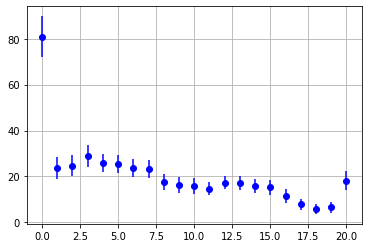

In [15]:
plt.errorbar(x, arr_mse_x.reshape(n,), arr_std_x.reshape(n,), linestyle='None', marker='o', color='b', label='x error')
plt.grid(True)

<ErrorbarContainer object of 3 artists>

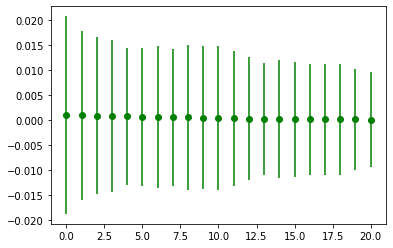

In [16]:
plt.errorbar(x, arr_mse_t.reshape(n,), arr_std_t.reshape(n,), linestyle='None', marker='o', color='g', label='t error')

<ErrorbarContainer object of 3 artists>

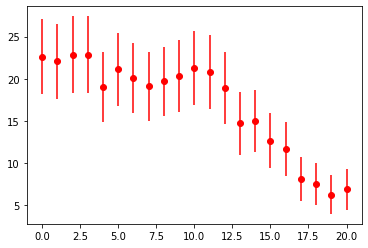

In [17]:
plt.errorbar(x, arr_mse_z.reshape(n,), arr_std_z.reshape(n,), linestyle='None', marker='o', color='r', label='z error')

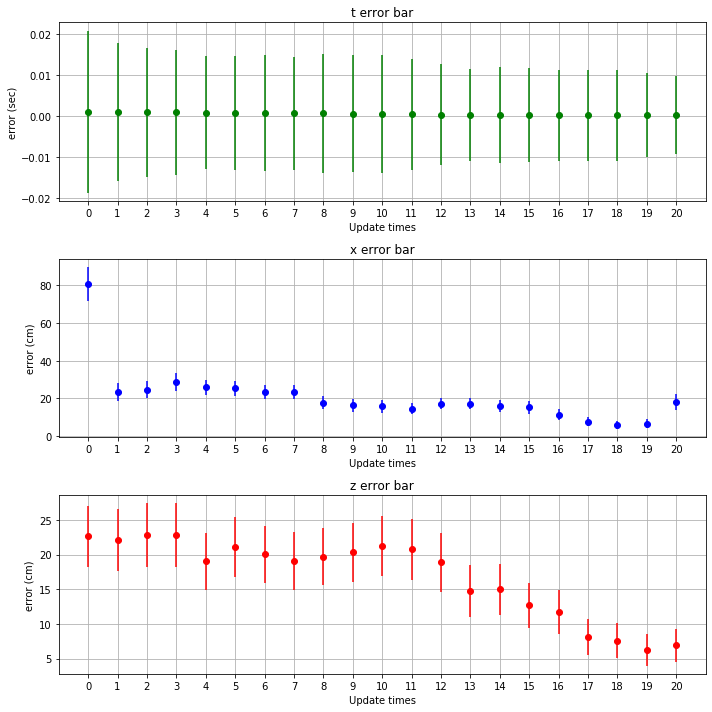

In [18]:
plt.figure(figsize=(10,10))

plt.subplot(3,1,1)
plt.errorbar(x, arr_mse_t.reshape(n,), arr_std_t.reshape(n,), linestyle='None', marker='o', color='g', label='t error')
plt.title('t error bar')
plt.xlabel('Update times')
plt.ylabel('error (sec)')
#plt.xlim(0.5,20)
plt.xticks(np.arange(0,21))
plt.grid(True)

plt.subplot(3,1,2)
plt.errorbar(x, arr_mse_x.reshape(n,), arr_std_x.reshape(n,), linestyle='None', marker='o', color='b', label='x error')
plt.title('x error bar')
plt.xlabel('Update times')
plt.ylabel('error (cm)')
plt.xticks(np.arange(0,21))
plt.grid(True)

plt.subplot(3,1,3)
plt.errorbar(x, arr_mse_z.reshape(n,), arr_std_z.reshape(n,), linestyle='None', marker='o', color='r', label='z error')
plt.title('z error bar')
plt.xlabel('Update times')
plt.ylabel('error (cm)')
plt.xticks(np.arange(0,21))
plt.grid(True)

plt.tight_layout()
#plt.savefig('./fig/without2/'+name+'_test_res.png')
#plt.savefig('./fig/without2/'+name+'_test_res.svg')

In [19]:
arr_for_err_x

array([[-1.43933515, -0.95369835, -3.93838963, ...,  0.81969212,
         1.07968363,  0.63758923],
       [ 2.04989663,  3.81718637,  5.28194173, ..., -2.55246537,
        -0.79852317,  3.55262132],
       [ 2.95330783, -1.2907343 ,  0.68574728, ...,  5.00572971,
        -1.06063517, -0.315757  ],
       ...,
       [ 5.13998771,  5.13998771, -1.67862231, ..., -1.70476967,
         1.20868496,  2.01914799],
       [ 0.06886858, -0.0986314 , -0.0986314 , ..., -0.77588228,
         0.40676961,  2.74514608],
       [-2.3052396 ,  3.60415847,  1.27149418, ...,  0.90972139,
        13.47339597,  2.41340052]])

201 235
accuray = 85.53191489361703%


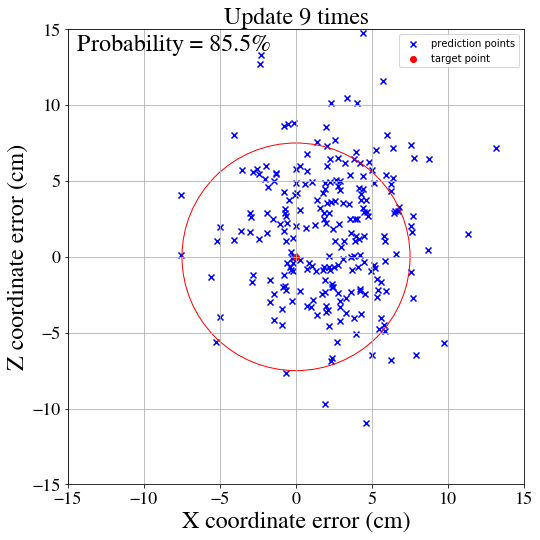

In [20]:
k = 10
up_times = k - 1

correct = 0
for i in range(arr_for_err_x.shape[0]):
    if arr_for_err_x[i,up_times] < 7.5 and arr_for_err_x[i,up_times] > -7.5 and arr_for_err_z[i,up_times] < 7.5 and arr_for_err_z[i,up_times] > -7.5:
        correct += 1
print(correct, arr_for_err_x.shape[0])
print("accuray = {}%".format(correct/arr_for_err_x.shape[0]*100))
aa = np.round_(correct/arr_for_err_x.shape[0]*100, 1)
text = str("Probability = {}%".format(aa))

plt.figure(figsize=(8,8))

x = y = np.arange(-7.5, 7.5, 0.005)
x, y = np.meshgrid(x,y)
#plt.contour(x, y, x**2 + y**2, [15*15])
circle2 = plt.Circle((0, 0), 7.5, color='r', fill=False, label='paddle edge')

ax = plt.gca()
ax.add_artist(circle2)
ax.set_xlim((-15, 15))
ax.set_ylim((-15, 15))

plt.scatter(cp.asnumpy(arr_for_err_x[:,up_times]), cp.asnumpy(arr_for_err_z[:,up_times]), edgecolors='b', label='prediction points', marker='x', color='b')
plt.scatter(0,0, color='r', marker='o', label='target point')
plt.Circle((0,0), 7.5, color='r', fill=False)

plt.xlabel('X coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.ylabel('Z coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.xticks(fontsize=18, fontname='FreeSerif')
plt.yticks(fontsize=18, fontname='FreeSerif')

title_name = 'Update ' + str(up_times) + ' times'
plt.title(title_name, fontsize=24, fontname='FreeSerif')
plt.text(-8,14,text, fontsize=24, fontname='FreeSerif', horizontalalignment='center', verticalalignment='center')

plt.tight_layout(pad=2.5)
plt.grid(True)
plt.legend(loc='upper right')
#plt.savefig('./fig/update_' + str(up_times) + '_times.png')

189 235
accuray = 80.42553191489363%
192 235
accuray = 81.70212765957446%
188 235
accuray = 80.0%
189 235
accuray = 80.42553191489363%
185 235
accuray = 78.72340425531915%
174 235
accuray = 74.04255319148936%
184 235
accuray = 78.29787234042553%
184 235
accuray = 78.29787234042553%
194 235
accuray = 82.5531914893617%
201 235
accuray = 85.53191489361703%
204 235
accuray = 86.80851063829788%
204 235
accuray = 86.80851063829788%
207 235
accuray = 88.08510638297872%
211 235
accuray = 89.7872340425532%
212 235
accuray = 90.2127659574468%
216 235
accuray = 91.91489361702128%
219 235
accuray = 93.19148936170212%
226 235
accuray = 96.17021276595744%
228 235
accuray = 97.02127659574468%
231 235
accuray = 98.29787234042553%
231 235
accuray = 98.29787234042553%


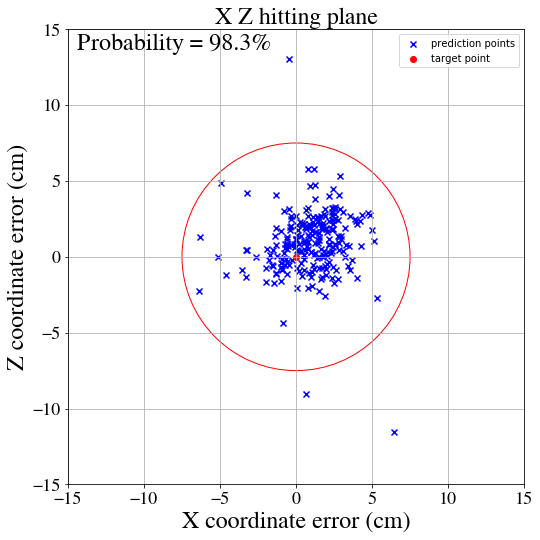

In [21]:
up_times = 0

correct = 0
for i in range(arr_for_err_x.shape[0]):
    if arr_for_err_x[i,up_times] < 7.5 and arr_for_err_x[i,up_times] > -7.5 and arr_for_err_z[i,up_times] < 7.5 and arr_for_err_z[i,up_times] > -7.5:
        correct += 1
print(correct, arr_for_err_x.shape[0])
print("accuray = {}%".format(correct/arr_for_err_x.shape[0]*100))
aa = np.round_(correct/arr_for_err_x.shape[0]*100, 1)
text = str("Probability = {}%".format(aa))

plt.figure(figsize=(8,8))

x = y = np.arange(-7.5, 7.5, 0.005)
x, y = np.meshgrid(x,y)
#plt.contour(x, y, x**2 + y**2, [15*15])
circle2 = plt.Circle((0, 0), 7.5, color='r', fill=False, label='paddle edge')

ax = plt.gca()
ax.add_artist(circle2)
ax.set_xlim((-15, 15))
ax.set_ylim((-15, 15))

plt.scatter(cp.asnumpy(arr_for_err_x[:,up_times]), cp.asnumpy(arr_for_err_z[:,up_times]), edgecolors='b', label='prediction points', marker='x', color='b')
plt.scatter(0,0, color='r', marker='o', label='target point')
plt.Circle((0,0), 7.5, color='r', fill=False)

plt.xlabel('X coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.ylabel('Z coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.xticks(fontsize=18, fontname='FreeSerif')
plt.yticks(fontsize=18, fontname='FreeSerif')
plt.title('X Z hitting plane', fontsize=24, fontname='FreeSerif')
plt.text(-8,14,text, fontsize=24, fontname='FreeSerif', horizontalalignment='center', verticalalignment='center')

plt.tight_layout(pad=2.5)
plt.grid(True)
plt.legend(loc='upper right')
plt.savefig('./fig/without2/update_' + str(up_times) + '_times_without_classification.png')
plt.savefig('./fig/without2/update_' + str(up_times) + '_times_without_classification.svg')

for up_times in range(1,n,1):
    plt.clf()
    #plt.figure(figsize=(8,8))
    '''
    ax = plt.gca()
    ax.add_artist(circle2)
    ax.set_xlim((-15, 15))
    ax.set_ylim((-15, 15))
    '''
    
    circle2 = plt.Circle((0, 0), 7.5, color='r', fill=False, label='paddle edge')
    ax = plt.gca()
    ax.add_artist(circle2)
    
    correct = 0
    for i in range(arr_for_err_x.shape[0]):
        if arr_for_err_x[i,up_times] < 7.5 and arr_for_err_x[i,up_times] > -7.5 and arr_for_err_z[i,up_times] < 7.5 and arr_for_err_z[i,up_times] > -7.5:
            correct += 1
    print(correct, arr_for_err_x.shape[0])
    print("accuray = {}%".format(correct/arr_for_err_x.shape[0]*100))
    aa = np.round_(correct/arr_for_err_x.shape[0]*100, 1)
    text = str("Probability = {}%".format(aa))
    
    plt.scatter(cp.asnumpy(arr_for_err_x[:,up_times]), cp.asnumpy(arr_for_err_z[:,up_times]), edgecolors='b', label='prediction points', marker='x', color='b')
    plt.scatter(0,0, color='r', marker='o', label='target point')
    plt.Circle((0,0), 7.5, color='r', fill=False)

    plt.xlabel('X coordinate error (cm)', fontsize=24, fontname='FreeSerif')
    plt.ylabel('Z coordinate error (cm)', fontsize=24, fontname='FreeSerif')
    plt.xticks(fontsize=18, fontname='FreeSerif')
    plt.yticks(fontsize=18, fontname='FreeSerif')
    plt.title('X Z hitting plane', fontsize=24, fontname='FreeSerif')
    plt.text(-8,14,text, fontsize=24, fontname='FreeSerif', horizontalalignment='center', verticalalignment='center')

    plt.xlim(-15,15)
    plt.ylim(-15,15)
    
    plt.tight_layout(pad=2.5)
    plt.grid(True)
    plt.legend(loc='upper right')
    plt.savefig('./fig/without2/update_' + str(up_times) + '_times_without_classification.png')
    plt.savefig('./fig/without2/update_' + str(up_times) + '_times_without_classification.svg')
    